# 라이브러리 추가

In [1]:
## 라이브러리 추가
import os, glob
import numpy as np

from PIL import Image
import pydicom as dcm
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
import torchvision
from torchvision import transforms
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision.transforms import functional as tvf

import random
from torch.utils.data.dataset import random_split

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from tqdm import tqdm
import gc

# 평가지표(Dice coef)

In [2]:
# def DiceLoss(outputs, targets, smooth=1e-7):

#     #comment out if your model contains a sigmoid or equivalent activation layer
#     outputs = torch.sigmoid(outputs)

#     #flatten label and prediction tensors
#     outputs = outputs.reshape(-1)
#     targets = targets.reshape(-1)

#     intersection = (outputs * targets).sum()                            
#     dice = (2.*intersection + smooth)/(outputs.sum() + targets.sum() + smooth)  
    
#     loss = 1 - dice
#     return loss

def DiceLoss(pred, target):
    smooth = 1e-7

    # have to use contiguous since they may from a torch.view op
    iflat = pred.contiguous().view(-1)
    tflat = target.contiguous().view(-1)
    intersection = (iflat * tflat).sum()

    A_sum = torch.sum(iflat * iflat)
    B_sum = torch.sum(tflat * tflat)
    loss = 1 - ((2. * intersection + smooth) / (A_sum + B_sum + smooth) )
    return loss

# DICOM 전처리

CT영상을 처리하기 위해서는 Hounsfield Units(HU)이 무엇인지 알아야 한다. 이는 X선이 몸을 투과할 때 부위별 흡수정도를 표시한 지표로 CT number라고 부르기도 한다.

물을 0으로 고정하였을 때의 상대적인 흡수량이라고 생각하면 된다(물의 attenuation coefficient에 대한 상대적 비율 * 1000).

우리는 dicom 파일로부터 뽑은 픽셀 어레이를 우선 HU 단위로 정규화 해야한다. 이 때 필요한 것은 dcm파일의 Rescale Slope과 Rescale Intercept 이다. 

CT이미지의 경우, 디스크에 저장되는 값과 메모리에 올라오는 값의 표현이 다르게 설정되어 있다. 

HU는 음수를 포함한 정수값이지만, CT이미지는 일반적으로  unsigned integer인 부호없는 정수로 저장되기 때문이다.

아래의 식은 메모리(output)와 디스크(stored value)에 저장되어 있는 픽셀값의 linear transformation 관계식이다.

(output) = (rescale slope) * (stored value) + (rescale intercept) 

우리는 dicom 파일로부터 stored value, rescale slope, rescale intercept을 얻어 위의 식을 계산함으로써 HU에 맞는 값을 얻을 수 있다.

In [3]:
# # 픽셀 array를 hu값으로 변환

# def transform_to_hu(medical_image, image):
#     hu_image = image * medical_image.RescaleSlope + medical_image.RescaleIntercept
#     hu_image[hu_image < -1024] = -1024
#     #hu_image[hu_image > 3071] = 3071
#     return hu_image

# # 신장(window_center, hu = 30), 범위(window_width, 310)
# # HU값 30을 기준으로 -125 ~ 185 범위의 값을 가지도록 정규화
# def window_image(image, window_center, window_width):
#     window_image = image.copy()
#     image_min = window_center - (window_width / 2)
#     image_max = window_center + (window_width / 2)
#     window_image[window_image < image_min] = image_min
#     window_image[window_image > image_max] = image_max
    
#     return window_image

# def resize_normalize(image):
#     image = np.array(image, dtype=np.float64)
#     image -= np.min(image)
#     image /= np.max(image)
    
#     return image

# def read_dicom(path, window_level, window_width):
#     image_medical = dcm.dcmread(path)
#     image_data = image_medical.pixel_array
    
#     image_hu = transform_to_hu(image_medical, image_data)
    
#     image_window = window_image(image_hu.copy(), window_level, window_width)
    
#     image_window_norm = resize_normalize(image_window)
    
#     image_window_norm = np.expand_dims(image_window_norm, axis=2)   # (512, 512, 1)
    
#     #image_ths = np.concatenate([image_window_norm,image_window_norm,image_window_norm], axis=2)   # (512, 512, 3)
#     return image_window_norm#image_ths






# Label 전처리

In [4]:
def get_mask1(mask):
    kidney_cancer_mask = mask >= 1
    
    kidney_cancer_mask = kidney_cancer_mask*1
    
    kidney_cancer_mask = np.expand_dims(kidney_cancer_mask, axis=2)
    
    return kidney_cancer_mask



In [5]:
def get_mask2(mask):
    kidney_mask = mask == 1
    cancer_mask = mask == 2
    
    kidney_mask = np.float16(kidney_mask)
    cancer_mask = np.float16(cancer_mask)
    cancer_mask[cancer_mask==1] = 2
    
    kidney_mask = np.expand_dims(kidney_mask, axis=2)
    cancer_mask = np.expand_dims(cancer_mask, axis=2)
    
    label_mask  = np.concatenate([kidney_mask, cancer_mask], axis=2)
    return label_mask



In [6]:
def get_aug_mask2(mask):
    kidney_mask = mask == 1
    cancer_mask = mask == 2
    
    kidney_mask = kidney_mask*1
    cancer_mask = cancer_mask*2
    
    
    kidney_mask = transforms.RandomHorizontalFlip(p=1)(Image.fromarray(kidney_mask))
    cancer_mask = transforms.RandomHorizontalFlip(p=1)(Image.fromarray(cancer_mask))
                
    kidney_mask = np.expand_dims(kidney_mask, axis=2)
    cancer_mask = np.expand_dims(cancer_mask, axis=2)
    
    label_mask  = np.concatenate([kidney_mask, cancer_mask], axis=2)
    
    return label_mask



# 텐서,cuda 변환

In [7]:
## Data Transform, numpy -> tensor
def ToTensor(np_data):
    np_data = np_data.transpose(0,3,1,2)
    ts_data = torch.tensor(np_data,dtype=torch.float32)
    return ts_data

# 경로 지정

In [8]:
# Load Dataset
train_DICOM_path = "C:\\Users\\Administrator\\Desktop\\body-morphometry-kidney-and-tumor\\train\\DICOM\\"
train_Label_path = "C:\\Users\\Administrator\\Desktop\\body-morphometry-kidney-and-tumor\\train\\Label\\"
test_DICOM_path = "C:\\Users\\Administrator\\Desktop\\body-morphometry-kidney-and-tumor\\test\\DICOM\\"

In [5]:
# cuda 사용
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [10]:

## 네트워크 구축하기
class UNet1(nn.Module):
    def __init__(self):
        super(UNet1, self).__init__()

        def CBR2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=True):
            layers = []
            layers += [nn.Conv2d(in_channels=in_channels, out_channels=out_channels,
                                 kernel_size=kernel_size, stride=stride, padding=padding,
                                 bias=bias)]
            layers += [nn.BatchNorm2d(num_features=out_channels)]
            layers += [nn.ReLU()]

            cbr = nn.Sequential(*layers)

            return cbr

        # Contracting path
        self.enc1_1 = CBR2d(in_channels=1, out_channels=64)
        self.enc1_2 = CBR2d(in_channels=64, out_channels=64)
        # kernel_size=3, stride=1, padding=1, bias=True 부분은 predefine 되어 있다.
        
        self.pool1 = nn.MaxPool2d(kernel_size=2)

        self.enc2_1 = CBR2d(in_channels=64, out_channels=128)
        self.enc2_2 = CBR2d(in_channels=128, out_channels=128)

        self.pool2 = nn.MaxPool2d(kernel_size=2)

        self.enc3_1 = CBR2d(in_channels=128, out_channels=256)
        self.enc3_2 = CBR2d(in_channels=256, out_channels=256)

        self.pool3 = nn.MaxPool2d(kernel_size=2)

        self.enc4_1 = CBR2d(in_channels=256, out_channels=512)
        self.enc4_2 = CBR2d(in_channels=512, out_channels=512)

        self.pool4 = nn.MaxPool2d(kernel_size=2)

        self.enc5_1 = CBR2d(in_channels=512, out_channels=1024)

        # Expansive path
        self.dec5_1 = CBR2d(in_channels=1024, out_channels=512)

        self.unpool4 = nn.ConvTranspose2d(in_channels=512, out_channels=512,
                                          kernel_size=2, stride=2, padding=0, bias=True)

        self.dec4_2 = CBR2d(in_channels=2 * 512, out_channels=512)
        self.dec4_1 = CBR2d(in_channels=512, out_channels=256)

        self.unpool3 = nn.ConvTranspose2d(in_channels=256, out_channels=256,
                                          kernel_size=2, stride=2, padding=0, bias=True)

        self.dec3_2 = CBR2d(in_channels=2 * 256, out_channels=256)
        self.dec3_1 = CBR2d(in_channels=256, out_channels=128)

        self.unpool2 = nn.ConvTranspose2d(in_channels=128, out_channels=128,
                                          kernel_size=2, stride=2, padding=0, bias=True)

        self.dec2_2 = CBR2d(in_channels=2 * 128, out_channels=128)
        self.dec2_1 = CBR2d(in_channels=128, out_channels=64)

        self.unpool1 = nn.ConvTranspose2d(in_channels=64, out_channels=64,
                                          kernel_size=2, stride=2, padding=0, bias=True)

        self.dec1_2 = CBR2d(in_channels=2 * 64, out_channels=64)
        self.dec1_1 = CBR2d(in_channels=64, out_channels=64)

        self.fc = nn.Conv2d(in_channels=64, out_channels=1, kernel_size=1, stride=1, padding=0, bias=True)

    def forward(self, x):
        enc1_1 = self.enc1_1(x)
        enc1_2 = self.enc1_2(enc1_1)
        pool1 = self.pool1(enc1_2)

        enc2_1 = self.enc2_1(pool1)
        enc2_2 = self.enc2_2(enc2_1)
        pool2 = self.pool2(enc2_2)

        enc3_1 = self.enc3_1(pool2)
        enc3_2 = self.enc3_2(enc3_1)
        pool3 = self.pool3(enc3_2)

        enc4_1 = self.enc4_1(pool3)
        enc4_2 = self.enc4_2(enc4_1)
        pool4 = self.pool4(enc4_2)

        enc5_1 = self.enc5_1(pool4)

        dec5_1 = self.dec5_1(enc5_1)

        unpool4 = self.unpool4(dec5_1)
        cat4 = torch.cat((unpool4, enc4_2), dim=1)
        dec4_2 = self.dec4_2(cat4)
        dec4_1 = self.dec4_1(dec4_2)

        unpool3 = self.unpool3(dec4_1)
        cat3 = torch.cat((unpool3, enc3_2), dim=1)
        dec3_2 = self.dec3_2(cat3)
        dec3_1 = self.dec3_1(dec3_2)

        unpool2 = self.unpool2(dec3_1)
        cat2 = torch.cat((unpool2, enc2_2), dim=1)
        dec2_2 = self.dec2_2(cat2)
        dec2_1 = self.dec2_1(dec2_2)

        unpool1 = self.unpool1(dec2_1)
        cat1 = torch.cat((unpool1, enc1_2), dim=1)
        dec1_2 = self.dec1_2(cat1)
        dec1_1 = self.dec1_1(dec1_2)

        x = self.fc(dec1_1)

        return x
       
    

In [11]:
# #step=2 네트워크
# ## 네트워크 구축하기
# class UNet2(nn.Module):
#     def __init__(self):
#         super(UNet2, self).__init__()

#         def CBR2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=True):
#             layers = []
#             layers += [nn.Conv2d(in_channels=in_channels, out_channels=out_channels,
#                                  kernel_size=kernel_size, stride=stride, padding=padding,
#                                  bias=bias)]
#             layers += [nn.BatchNorm2d(num_features=out_channels)]
#             layers += [nn.ReLU()]

#             cbr = nn.Sequential(*layers)

#             return cbr

#         # Contracting path
#         self.enc1_1 = CBR2d(in_channels=1, out_channels=64)
#         self.enc1_2 = CBR2d(in_channels=64, out_channels=64)
#         # kernel_size=3, stride=1, padding=1, bias=True 부분은 predefine 되어 있다.
        
#         self.pool1 = nn.MaxPool2d(kernel_size=2)

#         self.enc2_1 = CBR2d(in_channels=64, out_channels=128)
#         self.enc2_2 = CBR2d(in_channels=128, out_channels=128)

#         self.pool2 = nn.MaxPool2d(kernel_size=2)

#         self.enc3_1 = CBR2d(in_channels=128, out_channels=256)
#         self.enc3_2 = CBR2d(in_channels=256, out_channels=256)

#         self.pool3 = nn.MaxPool2d(kernel_size=2)

#         self.enc4_1 = CBR2d(in_channels=256, out_channels=512)
#         self.enc4_2 = CBR2d(in_channels=512, out_channels=512)

#         self.pool4 = nn.MaxPool2d(kernel_size=2)

#         self.enc5_1 = CBR2d(in_channels=512, out_channels=1024)

#         # Expansive path
#         self.dec5_1 = CBR2d(in_channels=1024, out_channels=512)

#         self.unpool4 = nn.ConvTranspose2d(in_channels=512, out_channels=512,
#                                           kernel_size=2, stride=2, padding=0, bias=True)

#         self.dec4_2 = CBR2d(in_channels=2 * 512, out_channels=512)
#         self.dec4_1 = CBR2d(in_channels=512, out_channels=256)

#         self.unpool3 = nn.ConvTranspose2d(in_channels=256, out_channels=256,
#                                           kernel_size=2, stride=2, padding=0, bias=True)

#         self.dec3_2 = CBR2d(in_channels=2 * 256, out_channels=256)
#         self.dec3_1 = CBR2d(in_channels=256, out_channels=128)

#         self.unpool2 = nn.ConvTranspose2d(in_channels=128, out_channels=128,
#                                           kernel_size=2, stride=2, padding=0, bias=True)

#         self.dec2_2 = CBR2d(in_channels=2 * 128, out_channels=128)
#         self.dec2_1 = CBR2d(in_channels=128, out_channels=64)

#         self.unpool1 = nn.ConvTranspose2d(in_channels=64, out_channels=64,
#                                           kernel_size=2, stride=2, padding=0, bias=True)

#         self.dec1_2 = CBR2d(in_channels=2 * 64, out_channels=64)
#         self.dec1_1 = CBR2d(in_channels=64, out_channels=64)

#         self.fc = nn.Conv2d(in_channels=64, out_channels=2, kernel_size=1, stride=1, padding=0, bias=True)

#     def forward(self, x):
#         enc1_1 = self.enc1_1(x)
#         enc1_2 = self.enc1_2(enc1_1)
#         pool1 = self.pool1(enc1_2)

#         enc2_1 = self.enc2_1(pool1)
#         enc2_2 = self.enc2_2(enc2_1)
#         pool2 = self.pool2(enc2_2)

#         enc3_1 = self.enc3_1(pool2)
#         enc3_2 = self.enc3_2(enc3_1)
#         pool3 = self.pool3(enc3_2)

#         enc4_1 = self.enc4_1(pool3)
#         enc4_2 = self.enc4_2(enc4_1)
#         pool4 = self.pool4(enc4_2)

#         enc5_1 = self.enc5_1(pool4)

#         dec5_1 = self.dec5_1(enc5_1)

#         unpool4 = self.unpool4(dec5_1)
#         cat4 = torch.cat((unpool4, enc4_2), dim=1)
#         dec4_2 = self.dec4_2(cat4)
#         dec4_1 = self.dec4_1(dec4_2)

#         unpool3 = self.unpool3(dec4_1)
#         cat3 = torch.cat((unpool3, enc3_2), dim=1)
#         dec3_2 = self.dec3_2(cat3)
#         dec3_1 = self.dec3_1(dec3_2)

#         unpool2 = self.unpool2(dec3_1)
#         cat2 = torch.cat((unpool2, enc2_2), dim=1)
#         dec2_2 = self.dec2_2(cat2)
#         dec2_1 = self.dec2_1(dec2_2)

#         unpool1 = self.unpool1(dec2_1)
#         cat1 = torch.cat((unpool1, enc1_2), dim=1)
#         dec1_2 = self.dec1_2(cat1)
#         dec1_1 = self.dec1_1(dec1_2)

#         x = self.fc(dec1_1)

#         return x
       
    

# 데이터 불러오기

In [12]:
# ROI 추출을 위한 데이터 호출
class Dataset1(torch.utils.data.Dataset):
    def __init__(self, transform = None):
        self.transform = transform
        if os.path.isfile("./X_train.npy") & os.path.isfile("./y_train.npy"):
            print("Data Exist!")
            self.X_train = np.load("./X_train.npy")
            self.y_train = np.load("./y_train.npy")
        else:
            print("DataLoading...")
            

            global train_DICOM_path
            global train_Label_path

            Window_Center = 30
            Window_Width = 310

            train_DICOM_dcm = sorted(glob.glob(train_DICOM_path+"*/*.dcm"))
            train_Label_png = sorted(glob.glob(train_Label_path+"*/*.png"))

            self.X_train=np.zeros(shape=(len(train_DICOM_dcm),512,512,1)) # 독립변수 공리스트 생성
            self.y_train=np.zeros(shape=(len(train_Label_png),512,512,1)) # 종속변수 공리스트 생성

            # 독립 변수(DICOM) case별 호출
            # 종속 변수(PNG) case별 호출
            for i, (dcm,png) in tqdm(enumerate(zip(train_DICOM_dcm,train_Label_png))):
                Images = read_dicom(dcm, Window_Center, Window_Width) #DICOM 호출 및 전처리
                self.X_train[i]=Images

                img = Image.open(png).convert('L') # Label 호출
                Images = get_mask1(np.array(img)) # Label 전처리
                self.y_train[i]=Images

            print("Save X,y_train...")
            np.save("./X_train",self.X_train)
            np.save("./y_train",self.y_train)

        self.datanum = len(self.X_train)
        
    #Data size acquisition method
    def __len__(self):
        return self.datanum

    #Data acquisition method
    #Non-random conversion is done here
    def __getitem__(self, idx):
        out_data = self.X_train[idx]
        out_mask = self.y_train[idx]

        if self.transform:
            out_data = self.transform(out_data)
            out_mask = self.transform(out_mask)

        return out_data.float(), out_mask.float()

In [14]:
# ROI를 추출하는 모델을 이용하여 ROI 추출

class Dataset2(torch.utils.data.Dataset):
    def __init__(self, transform = None):
        #net1=UNet1().cuda()
        #net1.load_state_dict(torch.load('./model1.pt'))
        fn_tonumpy = lambda x: x.to('cpu').detach().numpy().transpose(0,2,3,1)
        #transform and target_transform is a non-random transform such as tensorization
        
        self.transform = transform
        
        if os.path.isfile("./aug_X_train_middle_3.npy") & os.path.isfile("./aug_y_train_middle_3.npy"):
            print("Data exist, Data Loading...")
    
            self.ROI = np.load("./aug_X_train_middle_3.npy")
            print("Done aug_X_train_middle load")
            print(self.ROI.shape)
            
            
            self.ROI_mask = np.load("./aug_y_train_middle_3.npy")
            print("Done concat aug_X_train_middle load")
            print(self.ROI_mask.shape)

            
            self.datanum = len(self.ROI)
        else:
            print("ROI is not exist...")
            #데이터 불러오기
            #Preprocessing
            Totensor = torchvision.transforms.Compose([
                torchvision.transforms.ToTensor()
            ])

            #Preparation of training data and test data
            dataset = Dataset1(
                transform=Totensor
            )

            
            dataset = torch.utils.data.DataLoader(
                dataset,
                batch_size=1,
                shuffle=False
            )

            num_dataset=len(dataset)
            
            print("Extract ROI...")
            with torch.no_grad():
                # forward
                net1.eval()
                train_Label_png = sorted(glob.glob(train_Label_path+"*/*.png"))
                self.ROI = np.zeros(shape=(num_dataset,512,512,1)) 
                self.ROI_mask = np.zeros(shape=(num_dataset,512,512,2))# ROI 마스크
                
                for i, ((each_X_train,_),png) in tqdm(enumerate(zip(dataset,train_Label_png))):
                    output = net1(each_X_train.to(device)) > 0
                    output = fn_tonumpy(output)*1
                    self.ROI[i] = output * fn_tonumpy(each_X_train)
                    
                    img = Image.open(png).convert('L') # Label 호출
                    mask = get_mask2(np.array(img)) # Label 전처리
                    self.ROI_mask[i]=mask

            print("Save ROI, ROI_mask...")
            
            np.save("./ROI",self.ROI)
            np.save("./ROI_mask",self.ROI_mask)
        
        self.datanum = len(self.ROI)
          
    #Data size acquisition method
    def __len__(self):
        return self.datanum

    #Data acquisition method
    #Non-random conversion is done here
    def __getitem__(self, idx):
        out_data = self.ROI[idx]
        out_mask = self.ROI_mask[idx]

        if self.transform:
            out_data = self.transform(out_data)
            out_mask = self.transform(out_mask)

        return out_data.float(), out_mask.float()



In [289]:
# 새로운 test 데이터 생성
def get_data4():
    if os.path.isfile("./X_test.npy"):
        print("Data exist")

        X_test = np.load("./X_test.npy")
        
        
        
    else:
        print("Data Loading")
        Window_Center=30
        Window_Width=310

        
        test_DICOM_dcm = sorted(glob.glob(test_DICOM_path+"*/*.dcm"))
        
        X_test=np.zeros(shape=(len(test_DICOM_dcm),512,512,1))# 독립변수 공리스트 생성
        
        for i, dcm in tqdm(enumerate(test_DICOM_dcm)):
            Images = read_dicom(dcm, Window_Center, Window_Width) #DICOM 호출 및 전처리
            #X_test.append(Images)
            X_test[i]=Images

        #np.save("./X_test",X_test)


    print("totensor")
    X_test = ToTensor(X_test)
    X_test = DataLoader(X_test, batch_size=1 ,shuffle=False ,num_workers=0)
    
    return X_test

# Localization

In [23]:
# step1 네트워크 생성
net = UNet1().to(device)

# 손실 함수 정의
fn_loss =  DiceLoss

# 하이퍼 파라미터 설정
lr = 1e-3
batch_size = 16
st_epoch=0
num_epoch=50

# Optimizer 설정
optim = torch.optim.Adam(net.parameters(),lr = lr)
scheduler = ReduceLROnPlateau(optim, mode='min', factor=0.1, patience=2, verbose=True)

#데이터 불러오기
#Preprocessing
Totensor = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor()
])

#Preparation of training data and test data
dataset = Dataset1(
    transform=Totensor
)
print(len(dataset))
train_set,val_set = random_split(dataset,[int(len(dataset)*0.9),int(len(dataset)*0.1)])

train_ts = torch.utils.data.DataLoader(
    train_set,
    batch_size=batch_size,
    shuffle=True
)
val_ts = torch.utils.data.DataLoader(
    val_set,
    batch_size=batch_size,
    shuffle=False
)

num_batch_train = len(train_ts)
num_batch_val = len(val_ts)

#텐서를 넘파이로 변환
fn_tonumpy = lambda x: x.to('cpu').detach().numpy().transpose(0,2,3,1)
print("Done!")



Done!


In [24]:
#net = UNet1().to(device)

print("Start!")
# 네트워크 학습
for epoch in tqdm(range(st_epoch + 1, num_epoch + 1)):
    net.train()
    train_loss_arr = []

    for batch, (batch_X_train, batch_y_train) in enumerate(train_ts, 1):
        # forward
        batch_X_train = batch_X_train.to(device)
        batch_y_train = batch_y_train.to(device)
        output = net(batch_X_train)

        #  backward
        optim.zero_grad()
        loss = fn_loss(output, batch_y_train)
        loss.backward()
        optim.step()

        #손실함수 계산
        train_loss_arr +=[loss.item()]
        
        print("Train: EPOCH: %d/%d   |   Batch %d/%d   |   LOSS: %.4f"
              %(epoch, num_epoch, batch, num_batch_train, np.mean(train_loss_arr)))
        

        del batch_X_train, batch_y_train

    with torch.no_grad():
        # forward
        net.eval()
        val_loss_arr = []

        for batch,(batch_X_val, batch_y_val) in enumerate(val_ts, 1):
            batch_X_val = batch_X_val.to(device)
            batch_y_val = batch_y_val.to(device)
            output = net(batch_X_val)

            loss = fn_loss(output, batch_y_val)
            val_loss_arr += [loss.item()]
            
            
            print("VALID: EPOCH: %d/%d   |   Batch %d/%d   |   LOSS: %.4f"%
                 (epoch, num_epoch, batch, num_batch_val, np.mean(val_loss_arr)))
            
            del batch_X_val, batch_y_val
    scheduler.step(np.mean(val_loss_arr))


torch.save(net.state_dict(), './model1.pt')

  0%|                                                                                           | 0/50 [00:00<?, ?it/s]

Start!
Train: EPOCH: 1/50   |   Batch 1/288   |   LOSS: 0.9547
Train: EPOCH: 1/50   |   Batch 2/288   |   LOSS: 0.9417
Train: EPOCH: 1/50   |   Batch 3/288   |   LOSS: 0.9457
Train: EPOCH: 1/50   |   Batch 4/288   |   LOSS: 0.9460
Train: EPOCH: 1/50   |   Batch 5/288   |   LOSS: 0.9444
Train: EPOCH: 1/50   |   Batch 6/288   |   LOSS: 0.9380
Train: EPOCH: 1/50   |   Batch 7/288   |   LOSS: 0.9307
Train: EPOCH: 1/50   |   Batch 8/288   |   LOSS: 0.9301
Train: EPOCH: 1/50   |   Batch 9/288   |   LOSS: 0.9294
Train: EPOCH: 1/50   |   Batch 10/288   |   LOSS: 0.9314
Train: EPOCH: 1/50   |   Batch 11/288   |   LOSS: 0.9328
Train: EPOCH: 1/50   |   Batch 12/288   |   LOSS: 0.9303
Train: EPOCH: 1/50   |   Batch 13/288   |   LOSS: 0.9283
Train: EPOCH: 1/50   |   Batch 14/288   |   LOSS: 0.9282
Train: EPOCH: 1/50   |   Batch 15/288   |   LOSS: 0.9278
Train: EPOCH: 1/50   |   Batch 16/288   |   LOSS: 0.9277
Train: EPOCH: 1/50   |   Batch 17/288   |   LOSS: 0.9290
Train: EPOCH: 1/50   |   Batch 18

Train: EPOCH: 1/50   |   Batch 144/288   |   LOSS: 0.7239
Train: EPOCH: 1/50   |   Batch 145/288   |   LOSS: 0.7208
Train: EPOCH: 1/50   |   Batch 146/288   |   LOSS: 0.7175
Train: EPOCH: 1/50   |   Batch 147/288   |   LOSS: 0.7146
Train: EPOCH: 1/50   |   Batch 148/288   |   LOSS: 0.7127
Train: EPOCH: 1/50   |   Batch 149/288   |   LOSS: 0.7092
Train: EPOCH: 1/50   |   Batch 150/288   |   LOSS: 0.7061
Train: EPOCH: 1/50   |   Batch 151/288   |   LOSS: 0.7035
Train: EPOCH: 1/50   |   Batch 152/288   |   LOSS: 0.7005
Train: EPOCH: 1/50   |   Batch 153/288   |   LOSS: 0.6974
Train: EPOCH: 1/50   |   Batch 154/288   |   LOSS: 0.6947
Train: EPOCH: 1/50   |   Batch 155/288   |   LOSS: 0.6922
Train: EPOCH: 1/50   |   Batch 156/288   |   LOSS: 0.6907
Train: EPOCH: 1/50   |   Batch 157/288   |   LOSS: 0.6877
Train: EPOCH: 1/50   |   Batch 158/288   |   LOSS: 0.6845
Train: EPOCH: 1/50   |   Batch 159/288   |   LOSS: 0.6819
Train: EPOCH: 1/50   |   Batch 160/288   |   LOSS: 0.6796
Train: EPOCH: 

Train: EPOCH: 1/50   |   Batch 286/288   |   LOSS: 0.4830
Train: EPOCH: 1/50   |   Batch 287/288   |   LOSS: 0.4820
Train: EPOCH: 1/50   |   Batch 288/288   |   LOSS: 0.4809
VALID: EPOCH: 1/50   |   Batch 1/32   |   LOSS: 0.8100
VALID: EPOCH: 1/50   |   Batch 2/32   |   LOSS: 0.8398
VALID: EPOCH: 1/50   |   Batch 3/32   |   LOSS: 0.7448
VALID: EPOCH: 1/50   |   Batch 4/32   |   LOSS: 0.7526
VALID: EPOCH: 1/50   |   Batch 5/32   |   LOSS: 0.7515
VALID: EPOCH: 1/50   |   Batch 6/32   |   LOSS: 0.7523
VALID: EPOCH: 1/50   |   Batch 7/32   |   LOSS: 0.7831
VALID: EPOCH: 1/50   |   Batch 8/32   |   LOSS: 0.7598
VALID: EPOCH: 1/50   |   Batch 9/32   |   LOSS: 0.7581
VALID: EPOCH: 1/50   |   Batch 10/32   |   LOSS: 0.7667
VALID: EPOCH: 1/50   |   Batch 11/32   |   LOSS: 0.7523
VALID: EPOCH: 1/50   |   Batch 12/32   |   LOSS: 0.7555
VALID: EPOCH: 1/50   |   Batch 13/32   |   LOSS: 0.7515
VALID: EPOCH: 1/50   |   Batch 14/32   |   LOSS: 0.7432
VALID: EPOCH: 1/50   |   Batch 15/32   |   LOSS: 0.

  2%|█▌                                                                              | 1/50 [06:51<5:35:46, 411.16s/it]

VALID: EPOCH: 1/50   |   Batch 32/32   |   LOSS: 0.7753
Train: EPOCH: 2/50   |   Batch 1/288   |   LOSS: 0.2437
Train: EPOCH: 2/50   |   Batch 2/288   |   LOSS: 0.1707
Train: EPOCH: 2/50   |   Batch 3/288   |   LOSS: 0.1823
Train: EPOCH: 2/50   |   Batch 4/288   |   LOSS: 0.2019
Train: EPOCH: 2/50   |   Batch 5/288   |   LOSS: 0.2027
Train: EPOCH: 2/50   |   Batch 6/288   |   LOSS: 0.2101
Train: EPOCH: 2/50   |   Batch 7/288   |   LOSS: 0.2008
Train: EPOCH: 2/50   |   Batch 8/288   |   LOSS: 0.2084
Train: EPOCH: 2/50   |   Batch 9/288   |   LOSS: 0.2183
Train: EPOCH: 2/50   |   Batch 10/288   |   LOSS: 0.2128
Train: EPOCH: 2/50   |   Batch 11/288   |   LOSS: 0.2019
Train: EPOCH: 2/50   |   Batch 12/288   |   LOSS: 0.1940
Train: EPOCH: 2/50   |   Batch 13/288   |   LOSS: 0.1879
Train: EPOCH: 2/50   |   Batch 14/288   |   LOSS: 0.1832
Train: EPOCH: 2/50   |   Batch 15/288   |   LOSS: 0.1804
Train: EPOCH: 2/50   |   Batch 16/288   |   LOSS: 0.1788
Train: EPOCH: 2/50   |   Batch 17/288   |

Train: EPOCH: 2/50   |   Batch 144/288   |   LOSS: 0.1575
Train: EPOCH: 2/50   |   Batch 145/288   |   LOSS: 0.1573
Train: EPOCH: 2/50   |   Batch 146/288   |   LOSS: 0.1573
Train: EPOCH: 2/50   |   Batch 147/288   |   LOSS: 0.1568
Train: EPOCH: 2/50   |   Batch 148/288   |   LOSS: 0.1564
Train: EPOCH: 2/50   |   Batch 149/288   |   LOSS: 0.1561
Train: EPOCH: 2/50   |   Batch 150/288   |   LOSS: 0.1554
Train: EPOCH: 2/50   |   Batch 151/288   |   LOSS: 0.1551
Train: EPOCH: 2/50   |   Batch 152/288   |   LOSS: 0.1548
Train: EPOCH: 2/50   |   Batch 153/288   |   LOSS: 0.1551
Train: EPOCH: 2/50   |   Batch 154/288   |   LOSS: 0.1547
Train: EPOCH: 2/50   |   Batch 155/288   |   LOSS: 0.1541
Train: EPOCH: 2/50   |   Batch 156/288   |   LOSS: 0.1535
Train: EPOCH: 2/50   |   Batch 157/288   |   LOSS: 0.1530
Train: EPOCH: 2/50   |   Batch 158/288   |   LOSS: 0.1528
Train: EPOCH: 2/50   |   Batch 159/288   |   LOSS: 0.1535
Train: EPOCH: 2/50   |   Batch 160/288   |   LOSS: 0.1531
Train: EPOCH: 

Train: EPOCH: 2/50   |   Batch 286/288   |   LOSS: 0.1410
Train: EPOCH: 2/50   |   Batch 287/288   |   LOSS: 0.1408
Train: EPOCH: 2/50   |   Batch 288/288   |   LOSS: 0.1408
VALID: EPOCH: 2/50   |   Batch 1/32   |   LOSS: 0.0661
VALID: EPOCH: 2/50   |   Batch 2/32   |   LOSS: 0.1256
VALID: EPOCH: 2/50   |   Batch 3/32   |   LOSS: 0.1194
VALID: EPOCH: 2/50   |   Batch 4/32   |   LOSS: 0.1253
VALID: EPOCH: 2/50   |   Batch 5/32   |   LOSS: 0.1189
VALID: EPOCH: 2/50   |   Batch 6/32   |   LOSS: 0.1125
VALID: EPOCH: 2/50   |   Batch 7/32   |   LOSS: 0.1162
VALID: EPOCH: 2/50   |   Batch 8/32   |   LOSS: 0.1107
VALID: EPOCH: 2/50   |   Batch 9/32   |   LOSS: 0.1055
VALID: EPOCH: 2/50   |   Batch 10/32   |   LOSS: 0.1051
VALID: EPOCH: 2/50   |   Batch 11/32   |   LOSS: 0.0994
VALID: EPOCH: 2/50   |   Batch 12/32   |   LOSS: 0.0988
VALID: EPOCH: 2/50   |   Batch 13/32   |   LOSS: 0.0961
VALID: EPOCH: 2/50   |   Batch 14/32   |   LOSS: 0.0954
VALID: EPOCH: 2/50   |   Batch 15/32   |   LOSS: 0.

  4%|███▏                                                                            | 2/50 [13:35<5:25:42, 407.14s/it]

VALID: EPOCH: 2/50   |   Batch 32/32   |   LOSS: 0.1120
Train: EPOCH: 3/50   |   Batch 1/288   |   LOSS: 0.0824
Train: EPOCH: 3/50   |   Batch 2/288   |   LOSS: 0.0608
Train: EPOCH: 3/50   |   Batch 3/288   |   LOSS: 0.0554
Train: EPOCH: 3/50   |   Batch 4/288   |   LOSS: 0.0679
Train: EPOCH: 3/50   |   Batch 5/288   |   LOSS: 0.0625
Train: EPOCH: 3/50   |   Batch 6/288   |   LOSS: 0.0654
Train: EPOCH: 3/50   |   Batch 7/288   |   LOSS: 0.0704
Train: EPOCH: 3/50   |   Batch 8/288   |   LOSS: 0.0702
Train: EPOCH: 3/50   |   Batch 9/288   |   LOSS: 0.0786
Train: EPOCH: 3/50   |   Batch 10/288   |   LOSS: 0.0790
Train: EPOCH: 3/50   |   Batch 11/288   |   LOSS: 0.0768
Train: EPOCH: 3/50   |   Batch 12/288   |   LOSS: 0.0783
Train: EPOCH: 3/50   |   Batch 13/288   |   LOSS: 0.0773
Train: EPOCH: 3/50   |   Batch 14/288   |   LOSS: 0.0822
Train: EPOCH: 3/50   |   Batch 15/288   |   LOSS: 0.0854
Train: EPOCH: 3/50   |   Batch 16/288   |   LOSS: 0.0917
Train: EPOCH: 3/50   |   Batch 17/288   |

Train: EPOCH: 3/50   |   Batch 144/288   |   LOSS: 0.1040
Train: EPOCH: 3/50   |   Batch 145/288   |   LOSS: 0.1037
Train: EPOCH: 3/50   |   Batch 146/288   |   LOSS: 0.1037
Train: EPOCH: 3/50   |   Batch 147/288   |   LOSS: 0.1038
Train: EPOCH: 3/50   |   Batch 148/288   |   LOSS: 0.1040
Train: EPOCH: 3/50   |   Batch 149/288   |   LOSS: 0.1037
Train: EPOCH: 3/50   |   Batch 150/288   |   LOSS: 0.1039
Train: EPOCH: 3/50   |   Batch 151/288   |   LOSS: 0.1036
Train: EPOCH: 3/50   |   Batch 152/288   |   LOSS: 0.1033
Train: EPOCH: 3/50   |   Batch 153/288   |   LOSS: 0.1034
Train: EPOCH: 3/50   |   Batch 154/288   |   LOSS: 0.1032
Train: EPOCH: 3/50   |   Batch 155/288   |   LOSS: 0.1033
Train: EPOCH: 3/50   |   Batch 156/288   |   LOSS: 0.1031
Train: EPOCH: 3/50   |   Batch 157/288   |   LOSS: 0.1029
Train: EPOCH: 3/50   |   Batch 158/288   |   LOSS: 0.1027
Train: EPOCH: 3/50   |   Batch 159/288   |   LOSS: 0.1024
Train: EPOCH: 3/50   |   Batch 160/288   |   LOSS: 0.1027
Train: EPOCH: 

Train: EPOCH: 3/50   |   Batch 286/288   |   LOSS: 0.1052
Train: EPOCH: 3/50   |   Batch 287/288   |   LOSS: 0.1054
Train: EPOCH: 3/50   |   Batch 288/288   |   LOSS: 0.1057
VALID: EPOCH: 3/50   |   Batch 1/32   |   LOSS: 0.1979
VALID: EPOCH: 3/50   |   Batch 2/32   |   LOSS: 0.2865
VALID: EPOCH: 3/50   |   Batch 3/32   |   LOSS: 0.2911
VALID: EPOCH: 3/50   |   Batch 4/32   |   LOSS: 0.3344
VALID: EPOCH: 3/50   |   Batch 5/32   |   LOSS: 0.3212
VALID: EPOCH: 3/50   |   Batch 6/32   |   LOSS: 0.3174
VALID: EPOCH: 3/50   |   Batch 7/32   |   LOSS: 0.3617
VALID: EPOCH: 3/50   |   Batch 8/32   |   LOSS: 0.3299
VALID: EPOCH: 3/50   |   Batch 9/32   |   LOSS: 0.3264
VALID: EPOCH: 3/50   |   Batch 10/32   |   LOSS: 0.3325
VALID: EPOCH: 3/50   |   Batch 11/32   |   LOSS: 0.3298
VALID: EPOCH: 3/50   |   Batch 12/32   |   LOSS: 0.3326
VALID: EPOCH: 3/50   |   Batch 13/32   |   LOSS: 0.3388
VALID: EPOCH: 3/50   |   Batch 14/32   |   LOSS: 0.3352
VALID: EPOCH: 3/50   |   Batch 15/32   |   LOSS: 0.

  6%|████▊                                                                           | 3/50 [20:16<5:16:49, 404.46s/it]

VALID: EPOCH: 3/50   |   Batch 32/32   |   LOSS: 0.3563
Train: EPOCH: 4/50   |   Batch 1/288   |   LOSS: 0.1719
Train: EPOCH: 4/50   |   Batch 2/288   |   LOSS: 0.2234
Train: EPOCH: 4/50   |   Batch 3/288   |   LOSS: 0.1822
Train: EPOCH: 4/50   |   Batch 4/288   |   LOSS: 0.1742
Train: EPOCH: 4/50   |   Batch 5/288   |   LOSS: 0.1530
Train: EPOCH: 4/50   |   Batch 6/288   |   LOSS: 0.1405
Train: EPOCH: 4/50   |   Batch 7/288   |   LOSS: 0.1382
Train: EPOCH: 4/50   |   Batch 8/288   |   LOSS: 0.1326
Train: EPOCH: 4/50   |   Batch 9/288   |   LOSS: 0.1426
Train: EPOCH: 4/50   |   Batch 10/288   |   LOSS: 0.1453
Train: EPOCH: 4/50   |   Batch 11/288   |   LOSS: 0.1468
Train: EPOCH: 4/50   |   Batch 12/288   |   LOSS: 0.1432
Train: EPOCH: 4/50   |   Batch 13/288   |   LOSS: 0.1372
Train: EPOCH: 4/50   |   Batch 14/288   |   LOSS: 0.1389
Train: EPOCH: 4/50   |   Batch 15/288   |   LOSS: 0.1326
Train: EPOCH: 4/50   |   Batch 16/288   |   LOSS: 0.1311
Train: EPOCH: 4/50   |   Batch 17/288   |

Train: EPOCH: 4/50   |   Batch 144/288   |   LOSS: 0.0971
Train: EPOCH: 4/50   |   Batch 145/288   |   LOSS: 0.0970
Train: EPOCH: 4/50   |   Batch 146/288   |   LOSS: 0.0969
Train: EPOCH: 4/50   |   Batch 147/288   |   LOSS: 0.0969
Train: EPOCH: 4/50   |   Batch 148/288   |   LOSS: 0.0981
Train: EPOCH: 4/50   |   Batch 149/288   |   LOSS: 0.0978
Train: EPOCH: 4/50   |   Batch 150/288   |   LOSS: 0.0976
Train: EPOCH: 4/50   |   Batch 151/288   |   LOSS: 0.0972
Train: EPOCH: 4/50   |   Batch 152/288   |   LOSS: 0.0972
Train: EPOCH: 4/50   |   Batch 153/288   |   LOSS: 0.0978
Train: EPOCH: 4/50   |   Batch 154/288   |   LOSS: 0.0976
Train: EPOCH: 4/50   |   Batch 155/288   |   LOSS: 0.0974
Train: EPOCH: 4/50   |   Batch 156/288   |   LOSS: 0.0972
Train: EPOCH: 4/50   |   Batch 157/288   |   LOSS: 0.0969
Train: EPOCH: 4/50   |   Batch 158/288   |   LOSS: 0.0968
Train: EPOCH: 4/50   |   Batch 159/288   |   LOSS: 0.0968
Train: EPOCH: 4/50   |   Batch 160/288   |   LOSS: 0.0965
Train: EPOCH: 

Train: EPOCH: 4/50   |   Batch 286/288   |   LOSS: 0.0904
Train: EPOCH: 4/50   |   Batch 287/288   |   LOSS: 0.0905
Train: EPOCH: 4/50   |   Batch 288/288   |   LOSS: 0.0904
VALID: EPOCH: 4/50   |   Batch 1/32   |   LOSS: 0.0353
VALID: EPOCH: 4/50   |   Batch 2/32   |   LOSS: 0.0798
VALID: EPOCH: 4/50   |   Batch 3/32   |   LOSS: 0.0661
VALID: EPOCH: 4/50   |   Batch 4/32   |   LOSS: 0.0679
VALID: EPOCH: 4/50   |   Batch 5/32   |   LOSS: 0.0712
VALID: EPOCH: 4/50   |   Batch 6/32   |   LOSS: 0.0664
VALID: EPOCH: 4/50   |   Batch 7/32   |   LOSS: 0.0682
VALID: EPOCH: 4/50   |   Batch 8/32   |   LOSS: 0.0665
VALID: EPOCH: 4/50   |   Batch 9/32   |   LOSS: 0.0635
VALID: EPOCH: 4/50   |   Batch 10/32   |   LOSS: 0.0634
VALID: EPOCH: 4/50   |   Batch 11/32   |   LOSS: 0.0594
VALID: EPOCH: 4/50   |   Batch 12/32   |   LOSS: 0.0617
VALID: EPOCH: 4/50   |   Batch 13/32   |   LOSS: 0.0608
VALID: EPOCH: 4/50   |   Batch 14/32   |   LOSS: 0.0607
VALID: EPOCH: 4/50   |   Batch 15/32   |   LOSS: 0.

  8%|██████▍                                                                         | 4/50 [26:57<5:09:04, 403.14s/it]

VALID: EPOCH: 4/50   |   Batch 32/32   |   LOSS: 0.0682
Train: EPOCH: 5/50   |   Batch 1/288   |   LOSS: 0.2001
Train: EPOCH: 5/50   |   Batch 2/288   |   LOSS: 0.1207
Train: EPOCH: 5/50   |   Batch 3/288   |   LOSS: 0.1026
Train: EPOCH: 5/50   |   Batch 4/288   |   LOSS: 0.0868
Train: EPOCH: 5/50   |   Batch 5/288   |   LOSS: 0.0831
Train: EPOCH: 5/50   |   Batch 6/288   |   LOSS: 0.0758
Train: EPOCH: 5/50   |   Batch 7/288   |   LOSS: 0.0740
Train: EPOCH: 5/50   |   Batch 8/288   |   LOSS: 0.0795
Train: EPOCH: 5/50   |   Batch 9/288   |   LOSS: 0.0757
Train: EPOCH: 5/50   |   Batch 10/288   |   LOSS: 0.0759
Train: EPOCH: 5/50   |   Batch 11/288   |   LOSS: 0.0744
Train: EPOCH: 5/50   |   Batch 12/288   |   LOSS: 0.0734
Train: EPOCH: 5/50   |   Batch 13/288   |   LOSS: 0.0784
Train: EPOCH: 5/50   |   Batch 14/288   |   LOSS: 0.0783
Train: EPOCH: 5/50   |   Batch 15/288   |   LOSS: 0.0770
Train: EPOCH: 5/50   |   Batch 16/288   |   LOSS: 0.0785
Train: EPOCH: 5/50   |   Batch 17/288   |

Train: EPOCH: 5/50   |   Batch 144/288   |   LOSS: 0.0741
Train: EPOCH: 5/50   |   Batch 145/288   |   LOSS: 0.0745
Train: EPOCH: 5/50   |   Batch 146/288   |   LOSS: 0.0746
Train: EPOCH: 5/50   |   Batch 147/288   |   LOSS: 0.0744
Train: EPOCH: 5/50   |   Batch 148/288   |   LOSS: 0.0745
Train: EPOCH: 5/50   |   Batch 149/288   |   LOSS: 0.0748
Train: EPOCH: 5/50   |   Batch 150/288   |   LOSS: 0.0747
Train: EPOCH: 5/50   |   Batch 151/288   |   LOSS: 0.0745
Train: EPOCH: 5/50   |   Batch 152/288   |   LOSS: 0.0752
Train: EPOCH: 5/50   |   Batch 153/288   |   LOSS: 0.0752
Train: EPOCH: 5/50   |   Batch 154/288   |   LOSS: 0.0759
Train: EPOCH: 5/50   |   Batch 155/288   |   LOSS: 0.0757
Train: EPOCH: 5/50   |   Batch 156/288   |   LOSS: 0.0757
Train: EPOCH: 5/50   |   Batch 157/288   |   LOSS: 0.0754
Train: EPOCH: 5/50   |   Batch 158/288   |   LOSS: 0.0755
Train: EPOCH: 5/50   |   Batch 159/288   |   LOSS: 0.0755
Train: EPOCH: 5/50   |   Batch 160/288   |   LOSS: 0.0755
Train: EPOCH: 

Train: EPOCH: 5/50   |   Batch 286/288   |   LOSS: 0.0709
Train: EPOCH: 5/50   |   Batch 287/288   |   LOSS: 0.0707
Train: EPOCH: 5/50   |   Batch 288/288   |   LOSS: 0.0706
VALID: EPOCH: 5/50   |   Batch 1/32   |   LOSS: 0.0544
VALID: EPOCH: 5/50   |   Batch 2/32   |   LOSS: 0.0908
VALID: EPOCH: 5/50   |   Batch 3/32   |   LOSS: 0.0831
VALID: EPOCH: 5/50   |   Batch 4/32   |   LOSS: 0.0768
VALID: EPOCH: 5/50   |   Batch 5/32   |   LOSS: 0.0783
VALID: EPOCH: 5/50   |   Batch 6/32   |   LOSS: 0.0748
VALID: EPOCH: 5/50   |   Batch 7/32   |   LOSS: 0.0752
VALID: EPOCH: 5/50   |   Batch 8/32   |   LOSS: 0.0729
VALID: EPOCH: 5/50   |   Batch 9/32   |   LOSS: 0.0688
VALID: EPOCH: 5/50   |   Batch 10/32   |   LOSS: 0.0667
VALID: EPOCH: 5/50   |   Batch 11/32   |   LOSS: 0.0631
VALID: EPOCH: 5/50   |   Batch 12/32   |   LOSS: 0.0648
VALID: EPOCH: 5/50   |   Batch 13/32   |   LOSS: 0.0621
VALID: EPOCH: 5/50   |   Batch 14/32   |   LOSS: 0.0610
VALID: EPOCH: 5/50   |   Batch 15/32   |   LOSS: 0.

 10%|████████                                                                        | 5/50 [33:41<5:02:25, 403.23s/it]

VALID: EPOCH: 5/50   |   Batch 32/32   |   LOSS: 0.0667
Train: EPOCH: 6/50   |   Batch 1/288   |   LOSS: 0.0381
Train: EPOCH: 6/50   |   Batch 2/288   |   LOSS: 0.0469
Train: EPOCH: 6/50   |   Batch 3/288   |   LOSS: 0.0812
Train: EPOCH: 6/50   |   Batch 4/288   |   LOSS: 0.0735
Train: EPOCH: 6/50   |   Batch 5/288   |   LOSS: 0.0711
Train: EPOCH: 6/50   |   Batch 6/288   |   LOSS: 0.0738
Train: EPOCH: 6/50   |   Batch 7/288   |   LOSS: 0.0670
Train: EPOCH: 6/50   |   Batch 8/288   |   LOSS: 0.0634
Train: EPOCH: 6/50   |   Batch 9/288   |   LOSS: 0.0685
Train: EPOCH: 6/50   |   Batch 10/288   |   LOSS: 0.0667
Train: EPOCH: 6/50   |   Batch 11/288   |   LOSS: 0.0639
Train: EPOCH: 6/50   |   Batch 12/288   |   LOSS: 0.0646
Train: EPOCH: 6/50   |   Batch 13/288   |   LOSS: 0.0625
Train: EPOCH: 6/50   |   Batch 14/288   |   LOSS: 0.0634
Train: EPOCH: 6/50   |   Batch 15/288   |   LOSS: 0.0624
Train: EPOCH: 6/50   |   Batch 16/288   |   LOSS: 0.0653
Train: EPOCH: 6/50   |   Batch 17/288   |

Train: EPOCH: 6/50   |   Batch 144/288   |   LOSS: 0.0643
Train: EPOCH: 6/50   |   Batch 145/288   |   LOSS: 0.0641
Train: EPOCH: 6/50   |   Batch 146/288   |   LOSS: 0.0639
Train: EPOCH: 6/50   |   Batch 147/288   |   LOSS: 0.0638
Train: EPOCH: 6/50   |   Batch 148/288   |   LOSS: 0.0636
Train: EPOCH: 6/50   |   Batch 149/288   |   LOSS: 0.0636
Train: EPOCH: 6/50   |   Batch 150/288   |   LOSS: 0.0636
Train: EPOCH: 6/50   |   Batch 151/288   |   LOSS: 0.0634
Train: EPOCH: 6/50   |   Batch 152/288   |   LOSS: 0.0633
Train: EPOCH: 6/50   |   Batch 153/288   |   LOSS: 0.0631
Train: EPOCH: 6/50   |   Batch 154/288   |   LOSS: 0.0630
Train: EPOCH: 6/50   |   Batch 155/288   |   LOSS: 0.0628
Train: EPOCH: 6/50   |   Batch 156/288   |   LOSS: 0.0627
Train: EPOCH: 6/50   |   Batch 157/288   |   LOSS: 0.0629
Train: EPOCH: 6/50   |   Batch 158/288   |   LOSS: 0.0630
Train: EPOCH: 6/50   |   Batch 159/288   |   LOSS: 0.0629
Train: EPOCH: 6/50   |   Batch 160/288   |   LOSS: 0.0631
Train: EPOCH: 

Train: EPOCH: 6/50   |   Batch 286/288   |   LOSS: 0.0623
Train: EPOCH: 6/50   |   Batch 287/288   |   LOSS: 0.0623
Train: EPOCH: 6/50   |   Batch 288/288   |   LOSS: 0.0624
VALID: EPOCH: 6/50   |   Batch 1/32   |   LOSS: 0.0293
VALID: EPOCH: 6/50   |   Batch 2/32   |   LOSS: 0.0431
VALID: EPOCH: 6/50   |   Batch 3/32   |   LOSS: 0.0471
VALID: EPOCH: 6/50   |   Batch 4/32   |   LOSS: 0.0524
VALID: EPOCH: 6/50   |   Batch 5/32   |   LOSS: 0.0505
VALID: EPOCH: 6/50   |   Batch 6/32   |   LOSS: 0.0486
VALID: EPOCH: 6/50   |   Batch 7/32   |   LOSS: 0.0455
VALID: EPOCH: 6/50   |   Batch 8/32   |   LOSS: 0.0446
VALID: EPOCH: 6/50   |   Batch 9/32   |   LOSS: 0.0431
VALID: EPOCH: 6/50   |   Batch 10/32   |   LOSS: 0.0439
VALID: EPOCH: 6/50   |   Batch 11/32   |   LOSS: 0.0414
VALID: EPOCH: 6/50   |   Batch 12/32   |   LOSS: 0.0445
VALID: EPOCH: 6/50   |   Batch 13/32   |   LOSS: 0.0439
VALID: EPOCH: 6/50   |   Batch 14/32   |   LOSS: 0.0438
VALID: EPOCH: 6/50   |   Batch 15/32   |   LOSS: 0.

 12%|█████████▌                                                                      | 6/50 [40:22<4:55:08, 402.47s/it]

VALID: EPOCH: 6/50   |   Batch 32/32   |   LOSS: 0.0476
Train: EPOCH: 7/50   |   Batch 1/288   |   LOSS: 0.0534
Train: EPOCH: 7/50   |   Batch 2/288   |   LOSS: 0.0530
Train: EPOCH: 7/50   |   Batch 3/288   |   LOSS: 0.0650
Train: EPOCH: 7/50   |   Batch 4/288   |   LOSS: 0.0596
Train: EPOCH: 7/50   |   Batch 5/288   |   LOSS: 0.0598
Train: EPOCH: 7/50   |   Batch 6/288   |   LOSS: 0.0595
Train: EPOCH: 7/50   |   Batch 7/288   |   LOSS: 0.0569
Train: EPOCH: 7/50   |   Batch 8/288   |   LOSS: 0.0543
Train: EPOCH: 7/50   |   Batch 9/288   |   LOSS: 0.0579
Train: EPOCH: 7/50   |   Batch 10/288   |   LOSS: 0.0641
Train: EPOCH: 7/50   |   Batch 11/288   |   LOSS: 0.0742
Train: EPOCH: 7/50   |   Batch 12/288   |   LOSS: 0.0743
Train: EPOCH: 7/50   |   Batch 13/288   |   LOSS: 0.0717
Train: EPOCH: 7/50   |   Batch 14/288   |   LOSS: 0.0756
Train: EPOCH: 7/50   |   Batch 15/288   |   LOSS: 0.0761
Train: EPOCH: 7/50   |   Batch 16/288   |   LOSS: 0.0803
Train: EPOCH: 7/50   |   Batch 17/288   |

Train: EPOCH: 7/50   |   Batch 144/288   |   LOSS: 0.0609
Train: EPOCH: 7/50   |   Batch 145/288   |   LOSS: 0.0607
Train: EPOCH: 7/50   |   Batch 146/288   |   LOSS: 0.0608
Train: EPOCH: 7/50   |   Batch 147/288   |   LOSS: 0.0608
Train: EPOCH: 7/50   |   Batch 148/288   |   LOSS: 0.0607
Train: EPOCH: 7/50   |   Batch 149/288   |   LOSS: 0.0606
Train: EPOCH: 7/50   |   Batch 150/288   |   LOSS: 0.0604
Train: EPOCH: 7/50   |   Batch 151/288   |   LOSS: 0.0603
Train: EPOCH: 7/50   |   Batch 152/288   |   LOSS: 0.0602
Train: EPOCH: 7/50   |   Batch 153/288   |   LOSS: 0.0599
Train: EPOCH: 7/50   |   Batch 154/288   |   LOSS: 0.0598
Train: EPOCH: 7/50   |   Batch 155/288   |   LOSS: 0.0596
Train: EPOCH: 7/50   |   Batch 156/288   |   LOSS: 0.0594
Train: EPOCH: 7/50   |   Batch 157/288   |   LOSS: 0.0593
Train: EPOCH: 7/50   |   Batch 158/288   |   LOSS: 0.0591
Train: EPOCH: 7/50   |   Batch 159/288   |   LOSS: 0.0590
Train: EPOCH: 7/50   |   Batch 160/288   |   LOSS: 0.0589
Train: EPOCH: 

Train: EPOCH: 7/50   |   Batch 286/288   |   LOSS: 0.0524
Train: EPOCH: 7/50   |   Batch 287/288   |   LOSS: 0.0524
Train: EPOCH: 7/50   |   Batch 288/288   |   LOSS: 0.0523
VALID: EPOCH: 7/50   |   Batch 1/32   |   LOSS: 0.0334
VALID: EPOCH: 7/50   |   Batch 2/32   |   LOSS: 0.0556
VALID: EPOCH: 7/50   |   Batch 3/32   |   LOSS: 0.0503
VALID: EPOCH: 7/50   |   Batch 4/32   |   LOSS: 0.0520
VALID: EPOCH: 7/50   |   Batch 5/32   |   LOSS: 0.0494
VALID: EPOCH: 7/50   |   Batch 6/32   |   LOSS: 0.0446
VALID: EPOCH: 7/50   |   Batch 7/32   |   LOSS: 0.0454
VALID: EPOCH: 7/50   |   Batch 8/32   |   LOSS: 0.0458
VALID: EPOCH: 7/50   |   Batch 9/32   |   LOSS: 0.0437
VALID: EPOCH: 7/50   |   Batch 10/32   |   LOSS: 0.0440
VALID: EPOCH: 7/50   |   Batch 11/32   |   LOSS: 0.0419
VALID: EPOCH: 7/50   |   Batch 12/32   |   LOSS: 0.0435
VALID: EPOCH: 7/50   |   Batch 13/32   |   LOSS: 0.0434
VALID: EPOCH: 7/50   |   Batch 14/32   |   LOSS: 0.0428
VALID: EPOCH: 7/50   |   Batch 15/32   |   LOSS: 0.

 14%|███████████▏                                                                    | 7/50 [47:03<4:48:07, 402.03s/it]

VALID: EPOCH: 7/50   |   Batch 32/32   |   LOSS: 0.0518
Train: EPOCH: 8/50   |   Batch 1/288   |   LOSS: 0.0804
Train: EPOCH: 8/50   |   Batch 2/288   |   LOSS: 0.0643
Train: EPOCH: 8/50   |   Batch 3/288   |   LOSS: 0.0687
Train: EPOCH: 8/50   |   Batch 4/288   |   LOSS: 0.0618
Train: EPOCH: 8/50   |   Batch 5/288   |   LOSS: 0.0555
Train: EPOCH: 8/50   |   Batch 6/288   |   LOSS: 0.0498
Train: EPOCH: 8/50   |   Batch 7/288   |   LOSS: 0.0472
Train: EPOCH: 8/50   |   Batch 8/288   |   LOSS: 0.0443
Train: EPOCH: 8/50   |   Batch 9/288   |   LOSS: 0.0463
Train: EPOCH: 8/50   |   Batch 10/288   |   LOSS: 0.0458
Train: EPOCH: 8/50   |   Batch 11/288   |   LOSS: 0.0456
Train: EPOCH: 8/50   |   Batch 12/288   |   LOSS: 0.0473
Train: EPOCH: 8/50   |   Batch 13/288   |   LOSS: 0.0468
Train: EPOCH: 8/50   |   Batch 14/288   |   LOSS: 0.0456
Train: EPOCH: 8/50   |   Batch 15/288   |   LOSS: 0.0474
Train: EPOCH: 8/50   |   Batch 16/288   |   LOSS: 0.0465
Train: EPOCH: 8/50   |   Batch 17/288   |

Train: EPOCH: 8/50   |   Batch 144/288   |   LOSS: 0.0435
Train: EPOCH: 8/50   |   Batch 145/288   |   LOSS: 0.0434
Train: EPOCH: 8/50   |   Batch 146/288   |   LOSS: 0.0435
Train: EPOCH: 8/50   |   Batch 147/288   |   LOSS: 0.0435
Train: EPOCH: 8/50   |   Batch 148/288   |   LOSS: 0.0434
Train: EPOCH: 8/50   |   Batch 149/288   |   LOSS: 0.0433
Train: EPOCH: 8/50   |   Batch 150/288   |   LOSS: 0.0432
Train: EPOCH: 8/50   |   Batch 151/288   |   LOSS: 0.0431
Train: EPOCH: 8/50   |   Batch 152/288   |   LOSS: 0.0430
Train: EPOCH: 8/50   |   Batch 153/288   |   LOSS: 0.0430
Train: EPOCH: 8/50   |   Batch 154/288   |   LOSS: 0.0432
Train: EPOCH: 8/50   |   Batch 155/288   |   LOSS: 0.0431
Train: EPOCH: 8/50   |   Batch 156/288   |   LOSS: 0.0432
Train: EPOCH: 8/50   |   Batch 157/288   |   LOSS: 0.0433
Train: EPOCH: 8/50   |   Batch 158/288   |   LOSS: 0.0432
Train: EPOCH: 8/50   |   Batch 159/288   |   LOSS: 0.0430
Train: EPOCH: 8/50   |   Batch 160/288   |   LOSS: 0.0431
Train: EPOCH: 

Train: EPOCH: 8/50   |   Batch 286/288   |   LOSS: 0.0430
Train: EPOCH: 8/50   |   Batch 287/288   |   LOSS: 0.0430
Train: EPOCH: 8/50   |   Batch 288/288   |   LOSS: 0.0430
VALID: EPOCH: 8/50   |   Batch 1/32   |   LOSS: 0.0263
VALID: EPOCH: 8/50   |   Batch 2/32   |   LOSS: 0.0346
VALID: EPOCH: 8/50   |   Batch 3/32   |   LOSS: 0.0409
VALID: EPOCH: 8/50   |   Batch 4/32   |   LOSS: 0.0431
VALID: EPOCH: 8/50   |   Batch 5/32   |   LOSS: 0.0407
VALID: EPOCH: 8/50   |   Batch 6/32   |   LOSS: 0.0372
VALID: EPOCH: 8/50   |   Batch 7/32   |   LOSS: 0.0383
VALID: EPOCH: 8/50   |   Batch 8/32   |   LOSS: 0.0390
VALID: EPOCH: 8/50   |   Batch 9/32   |   LOSS: 0.0378
VALID: EPOCH: 8/50   |   Batch 10/32   |   LOSS: 0.0380
VALID: EPOCH: 8/50   |   Batch 11/32   |   LOSS: 0.0357
VALID: EPOCH: 8/50   |   Batch 12/32   |   LOSS: 0.0362
VALID: EPOCH: 8/50   |   Batch 13/32   |   LOSS: 0.0360
VALID: EPOCH: 8/50   |   Batch 14/32   |   LOSS: 0.0363
VALID: EPOCH: 8/50   |   Batch 15/32   |   LOSS: 0.

 16%|████████████▊                                                                   | 8/50 [53:45<4:41:22, 401.97s/it]

VALID: EPOCH: 8/50   |   Batch 32/32   |   LOSS: 0.0384
Train: EPOCH: 9/50   |   Batch 1/288   |   LOSS: 0.0366
Train: EPOCH: 9/50   |   Batch 2/288   |   LOSS: 0.0414
Train: EPOCH: 9/50   |   Batch 3/288   |   LOSS: 0.0437
Train: EPOCH: 9/50   |   Batch 4/288   |   LOSS: 0.0420
Train: EPOCH: 9/50   |   Batch 5/288   |   LOSS: 0.0448
Train: EPOCH: 9/50   |   Batch 6/288   |   LOSS: 0.0423
Train: EPOCH: 9/50   |   Batch 7/288   |   LOSS: 0.0409
Train: EPOCH: 9/50   |   Batch 8/288   |   LOSS: 0.0404
Train: EPOCH: 9/50   |   Batch 9/288   |   LOSS: 0.0385
Train: EPOCH: 9/50   |   Batch 10/288   |   LOSS: 0.0384
Train: EPOCH: 9/50   |   Batch 11/288   |   LOSS: 0.0390
Train: EPOCH: 9/50   |   Batch 12/288   |   LOSS: 0.0396
Train: EPOCH: 9/50   |   Batch 13/288   |   LOSS: 0.0390
Train: EPOCH: 9/50   |   Batch 14/288   |   LOSS: 0.0381
Train: EPOCH: 9/50   |   Batch 15/288   |   LOSS: 0.0381
Train: EPOCH: 9/50   |   Batch 16/288   |   LOSS: 0.0394
Train: EPOCH: 9/50   |   Batch 17/288   |

Train: EPOCH: 9/50   |   Batch 144/288   |   LOSS: 0.0391
Train: EPOCH: 9/50   |   Batch 145/288   |   LOSS: 0.0392
Train: EPOCH: 9/50   |   Batch 146/288   |   LOSS: 0.0392
Train: EPOCH: 9/50   |   Batch 147/288   |   LOSS: 0.0391
Train: EPOCH: 9/50   |   Batch 148/288   |   LOSS: 0.0390
Train: EPOCH: 9/50   |   Batch 149/288   |   LOSS: 0.0388
Train: EPOCH: 9/50   |   Batch 150/288   |   LOSS: 0.0389
Train: EPOCH: 9/50   |   Batch 151/288   |   LOSS: 0.0390
Train: EPOCH: 9/50   |   Batch 152/288   |   LOSS: 0.0389
Train: EPOCH: 9/50   |   Batch 153/288   |   LOSS: 0.0388
Train: EPOCH: 9/50   |   Batch 154/288   |   LOSS: 0.0390
Train: EPOCH: 9/50   |   Batch 155/288   |   LOSS: 0.0391
Train: EPOCH: 9/50   |   Batch 156/288   |   LOSS: 0.0390
Train: EPOCH: 9/50   |   Batch 157/288   |   LOSS: 0.0390
Train: EPOCH: 9/50   |   Batch 158/288   |   LOSS: 0.0391
Train: EPOCH: 9/50   |   Batch 159/288   |   LOSS: 0.0391
Train: EPOCH: 9/50   |   Batch 160/288   |   LOSS: 0.0395
Train: EPOCH: 

Train: EPOCH: 9/50   |   Batch 286/288   |   LOSS: 0.0407
Train: EPOCH: 9/50   |   Batch 287/288   |   LOSS: 0.0407
Train: EPOCH: 9/50   |   Batch 288/288   |   LOSS: 0.0407
VALID: EPOCH: 9/50   |   Batch 1/32   |   LOSS: 0.0264
VALID: EPOCH: 9/50   |   Batch 2/32   |   LOSS: 0.0415
VALID: EPOCH: 9/50   |   Batch 3/32   |   LOSS: 0.0401
VALID: EPOCH: 9/50   |   Batch 4/32   |   LOSS: 0.0453
VALID: EPOCH: 9/50   |   Batch 5/32   |   LOSS: 0.0437
VALID: EPOCH: 9/50   |   Batch 6/32   |   LOSS: 0.0409
VALID: EPOCH: 9/50   |   Batch 7/32   |   LOSS: 0.0389
VALID: EPOCH: 9/50   |   Batch 8/32   |   LOSS: 0.0397
VALID: EPOCH: 9/50   |   Batch 9/32   |   LOSS: 0.0391
VALID: EPOCH: 9/50   |   Batch 10/32   |   LOSS: 0.0392
VALID: EPOCH: 9/50   |   Batch 11/32   |   LOSS: 0.0379
VALID: EPOCH: 9/50   |   Batch 12/32   |   LOSS: 0.0404
VALID: EPOCH: 9/50   |   Batch 13/32   |   LOSS: 0.0395
VALID: EPOCH: 9/50   |   Batch 14/32   |   LOSS: 0.0398
VALID: EPOCH: 9/50   |   Batch 15/32   |   LOSS: 0.

 18%|██████████████                                                                | 9/50 [1:00:26<4:34:36, 401.87s/it]

VALID: EPOCH: 9/50   |   Batch 32/32   |   LOSS: 0.0449
Train: EPOCH: 10/50   |   Batch 1/288   |   LOSS: 0.0284
Train: EPOCH: 10/50   |   Batch 2/288   |   LOSS: 0.0394
Train: EPOCH: 10/50   |   Batch 3/288   |   LOSS: 0.0550
Train: EPOCH: 10/50   |   Batch 4/288   |   LOSS: 0.0471
Train: EPOCH: 10/50   |   Batch 5/288   |   LOSS: 0.0434
Train: EPOCH: 10/50   |   Batch 6/288   |   LOSS: 0.0398
Train: EPOCH: 10/50   |   Batch 7/288   |   LOSS: 0.0415
Train: EPOCH: 10/50   |   Batch 8/288   |   LOSS: 0.0430
Train: EPOCH: 10/50   |   Batch 9/288   |   LOSS: 0.0408
Train: EPOCH: 10/50   |   Batch 10/288   |   LOSS: 0.0419
Train: EPOCH: 10/50   |   Batch 11/288   |   LOSS: 0.0426
Train: EPOCH: 10/50   |   Batch 12/288   |   LOSS: 0.0458
Train: EPOCH: 10/50   |   Batch 13/288   |   LOSS: 0.0449
Train: EPOCH: 10/50   |   Batch 14/288   |   LOSS: 0.0456
Train: EPOCH: 10/50   |   Batch 15/288   |   LOSS: 0.0448
Train: EPOCH: 10/50   |   Batch 16/288   |   LOSS: 0.0437
Train: EPOCH: 10/50   |  

Train: EPOCH: 10/50   |   Batch 141/288   |   LOSS: 0.0383
Train: EPOCH: 10/50   |   Batch 142/288   |   LOSS: 0.0385
Train: EPOCH: 10/50   |   Batch 143/288   |   LOSS: 0.0385
Train: EPOCH: 10/50   |   Batch 144/288   |   LOSS: 0.0385
Train: EPOCH: 10/50   |   Batch 145/288   |   LOSS: 0.0385
Train: EPOCH: 10/50   |   Batch 146/288   |   LOSS: 0.0384
Train: EPOCH: 10/50   |   Batch 147/288   |   LOSS: 0.0384
Train: EPOCH: 10/50   |   Batch 148/288   |   LOSS: 0.0384
Train: EPOCH: 10/50   |   Batch 149/288   |   LOSS: 0.0383
Train: EPOCH: 10/50   |   Batch 150/288   |   LOSS: 0.0382
Train: EPOCH: 10/50   |   Batch 151/288   |   LOSS: 0.0383
Train: EPOCH: 10/50   |   Batch 152/288   |   LOSS: 0.0381
Train: EPOCH: 10/50   |   Batch 153/288   |   LOSS: 0.0381
Train: EPOCH: 10/50   |   Batch 154/288   |   LOSS: 0.0381
Train: EPOCH: 10/50   |   Batch 155/288   |   LOSS: 0.0380
Train: EPOCH: 10/50   |   Batch 156/288   |   LOSS: 0.0379
Train: EPOCH: 10/50   |   Batch 157/288   |   LOSS: 0.03

Train: EPOCH: 10/50   |   Batch 280/288   |   LOSS: 0.0400
Train: EPOCH: 10/50   |   Batch 281/288   |   LOSS: 0.0400
Train: EPOCH: 10/50   |   Batch 282/288   |   LOSS: 0.0400
Train: EPOCH: 10/50   |   Batch 283/288   |   LOSS: 0.0400
Train: EPOCH: 10/50   |   Batch 284/288   |   LOSS: 0.0399
Train: EPOCH: 10/50   |   Batch 285/288   |   LOSS: 0.0399
Train: EPOCH: 10/50   |   Batch 286/288   |   LOSS: 0.0399
Train: EPOCH: 10/50   |   Batch 287/288   |   LOSS: 0.0398
Train: EPOCH: 10/50   |   Batch 288/288   |   LOSS: 0.0398
VALID: EPOCH: 10/50   |   Batch 1/32   |   LOSS: 0.0223
VALID: EPOCH: 10/50   |   Batch 2/32   |   LOSS: 0.0375
VALID: EPOCH: 10/50   |   Batch 3/32   |   LOSS: 0.0422
VALID: EPOCH: 10/50   |   Batch 4/32   |   LOSS: 0.0470
VALID: EPOCH: 10/50   |   Batch 5/32   |   LOSS: 0.0447
VALID: EPOCH: 10/50   |   Batch 6/32   |   LOSS: 0.0429
VALID: EPOCH: 10/50   |   Batch 7/32   |   LOSS: 0.0424
VALID: EPOCH: 10/50   |   Batch 8/32   |   LOSS: 0.0404
VALID: EPOCH: 10/50  

 20%|███████████████▍                                                             | 10/50 [1:07:08<4:27:54, 401.86s/it]

VALID: EPOCH: 10/50   |   Batch 32/32   |   LOSS: 0.0382
Train: EPOCH: 11/50   |   Batch 1/288   |   LOSS: 0.0269
Train: EPOCH: 11/50   |   Batch 2/288   |   LOSS: 0.0274
Train: EPOCH: 11/50   |   Batch 3/288   |   LOSS: 0.0292
Train: EPOCH: 11/50   |   Batch 4/288   |   LOSS: 0.0288
Train: EPOCH: 11/50   |   Batch 5/288   |   LOSS: 0.0281
Train: EPOCH: 11/50   |   Batch 6/288   |   LOSS: 0.0273
Train: EPOCH: 11/50   |   Batch 7/288   |   LOSS: 0.0284
Train: EPOCH: 11/50   |   Batch 8/288   |   LOSS: 0.0293
Train: EPOCH: 11/50   |   Batch 9/288   |   LOSS: 0.0349
Train: EPOCH: 11/50   |   Batch 10/288   |   LOSS: 0.0340
Train: EPOCH: 11/50   |   Batch 11/288   |   LOSS: 0.0333
Train: EPOCH: 11/50   |   Batch 12/288   |   LOSS: 0.0347
Train: EPOCH: 11/50   |   Batch 13/288   |   LOSS: 0.0342
Train: EPOCH: 11/50   |   Batch 14/288   |   LOSS: 0.0356
Train: EPOCH: 11/50   |   Batch 15/288   |   LOSS: 0.0346
Train: EPOCH: 11/50   |   Batch 16/288   |   LOSS: 0.0342
Train: EPOCH: 11/50   | 

Train: EPOCH: 11/50   |   Batch 141/288   |   LOSS: 0.0419
Train: EPOCH: 11/50   |   Batch 142/288   |   LOSS: 0.0419
Train: EPOCH: 11/50   |   Batch 143/288   |   LOSS: 0.0418
Train: EPOCH: 11/50   |   Batch 144/288   |   LOSS: 0.0417
Train: EPOCH: 11/50   |   Batch 145/288   |   LOSS: 0.0416
Train: EPOCH: 11/50   |   Batch 146/288   |   LOSS: 0.0414
Train: EPOCH: 11/50   |   Batch 147/288   |   LOSS: 0.0412
Train: EPOCH: 11/50   |   Batch 148/288   |   LOSS: 0.0411
Train: EPOCH: 11/50   |   Batch 149/288   |   LOSS: 0.0410
Train: EPOCH: 11/50   |   Batch 150/288   |   LOSS: 0.0409
Train: EPOCH: 11/50   |   Batch 151/288   |   LOSS: 0.0409
Train: EPOCH: 11/50   |   Batch 152/288   |   LOSS: 0.0408
Train: EPOCH: 11/50   |   Batch 153/288   |   LOSS: 0.0407
Train: EPOCH: 11/50   |   Batch 154/288   |   LOSS: 0.0406
Train: EPOCH: 11/50   |   Batch 155/288   |   LOSS: 0.0407
Train: EPOCH: 11/50   |   Batch 156/288   |   LOSS: 0.0408
Train: EPOCH: 11/50   |   Batch 157/288   |   LOSS: 0.04

Train: EPOCH: 11/50   |   Batch 280/288   |   LOSS: 0.0396
Train: EPOCH: 11/50   |   Batch 281/288   |   LOSS: 0.0399
Train: EPOCH: 11/50   |   Batch 282/288   |   LOSS: 0.0398
Train: EPOCH: 11/50   |   Batch 283/288   |   LOSS: 0.0398
Train: EPOCH: 11/50   |   Batch 284/288   |   LOSS: 0.0398
Train: EPOCH: 11/50   |   Batch 285/288   |   LOSS: 0.0399
Train: EPOCH: 11/50   |   Batch 286/288   |   LOSS: 0.0400
Train: EPOCH: 11/50   |   Batch 287/288   |   LOSS: 0.0400
Train: EPOCH: 11/50   |   Batch 288/288   |   LOSS: 0.0400
VALID: EPOCH: 11/50   |   Batch 1/32   |   LOSS: 0.0322
VALID: EPOCH: 11/50   |   Batch 2/32   |   LOSS: 0.0423
VALID: EPOCH: 11/50   |   Batch 3/32   |   LOSS: 0.0362
VALID: EPOCH: 11/50   |   Batch 4/32   |   LOSS: 0.0461
VALID: EPOCH: 11/50   |   Batch 5/32   |   LOSS: 0.0436
VALID: EPOCH: 11/50   |   Batch 6/32   |   LOSS: 0.0401
VALID: EPOCH: 11/50   |   Batch 7/32   |   LOSS: 0.0402
VALID: EPOCH: 11/50   |   Batch 8/32   |   LOSS: 0.0398
VALID: EPOCH: 11/50  

 22%|████████████████▉                                                            | 11/50 [1:13:48<4:20:48, 401.23s/it]

VALID: EPOCH: 11/50   |   Batch 32/32   |   LOSS: 0.0433
Train: EPOCH: 12/50   |   Batch 1/288   |   LOSS: 0.0329
Train: EPOCH: 12/50   |   Batch 2/288   |   LOSS: 0.0382
Train: EPOCH: 12/50   |   Batch 3/288   |   LOSS: 0.0476
Train: EPOCH: 12/50   |   Batch 4/288   |   LOSS: 0.0477
Train: EPOCH: 12/50   |   Batch 5/288   |   LOSS: 0.0431
Train: EPOCH: 12/50   |   Batch 6/288   |   LOSS: 0.0437
Train: EPOCH: 12/50   |   Batch 7/288   |   LOSS: 0.0425
Train: EPOCH: 12/50   |   Batch 8/288   |   LOSS: 0.0422
Train: EPOCH: 12/50   |   Batch 9/288   |   LOSS: 0.0404
Train: EPOCH: 12/50   |   Batch 10/288   |   LOSS: 0.0403
Train: EPOCH: 12/50   |   Batch 11/288   |   LOSS: 0.0387
Train: EPOCH: 12/50   |   Batch 12/288   |   LOSS: 0.0378
Train: EPOCH: 12/50   |   Batch 13/288   |   LOSS: 0.0403
Train: EPOCH: 12/50   |   Batch 14/288   |   LOSS: 0.0401
Train: EPOCH: 12/50   |   Batch 15/288   |   LOSS: 0.0407
Train: EPOCH: 12/50   |   Batch 16/288   |   LOSS: 0.0398
Train: EPOCH: 12/50   | 

Train: EPOCH: 12/50   |   Batch 141/288   |   LOSS: 0.0375
Train: EPOCH: 12/50   |   Batch 142/288   |   LOSS: 0.0375
Train: EPOCH: 12/50   |   Batch 143/288   |   LOSS: 0.0378
Train: EPOCH: 12/50   |   Batch 144/288   |   LOSS: 0.0377
Train: EPOCH: 12/50   |   Batch 145/288   |   LOSS: 0.0376
Train: EPOCH: 12/50   |   Batch 146/288   |   LOSS: 0.0376
Train: EPOCH: 12/50   |   Batch 147/288   |   LOSS: 0.0376
Train: EPOCH: 12/50   |   Batch 148/288   |   LOSS: 0.0375
Train: EPOCH: 12/50   |   Batch 149/288   |   LOSS: 0.0375
Train: EPOCH: 12/50   |   Batch 150/288   |   LOSS: 0.0374
Train: EPOCH: 12/50   |   Batch 151/288   |   LOSS: 0.0373
Train: EPOCH: 12/50   |   Batch 152/288   |   LOSS: 0.0374
Train: EPOCH: 12/50   |   Batch 153/288   |   LOSS: 0.0374
Train: EPOCH: 12/50   |   Batch 154/288   |   LOSS: 0.0375
Train: EPOCH: 12/50   |   Batch 155/288   |   LOSS: 0.0375
Train: EPOCH: 12/50   |   Batch 156/288   |   LOSS: 0.0375
Train: EPOCH: 12/50   |   Batch 157/288   |   LOSS: 0.03

Train: EPOCH: 12/50   |   Batch 280/288   |   LOSS: 0.0419
Train: EPOCH: 12/50   |   Batch 281/288   |   LOSS: 0.0418
Train: EPOCH: 12/50   |   Batch 282/288   |   LOSS: 0.0418
Train: EPOCH: 12/50   |   Batch 283/288   |   LOSS: 0.0417
Train: EPOCH: 12/50   |   Batch 284/288   |   LOSS: 0.0417
Train: EPOCH: 12/50   |   Batch 285/288   |   LOSS: 0.0418
Train: EPOCH: 12/50   |   Batch 286/288   |   LOSS: 0.0418
Train: EPOCH: 12/50   |   Batch 287/288   |   LOSS: 0.0418
Train: EPOCH: 12/50   |   Batch 288/288   |   LOSS: 0.0417
VALID: EPOCH: 12/50   |   Batch 1/32   |   LOSS: 0.0225
VALID: EPOCH: 12/50   |   Batch 2/32   |   LOSS: 0.0379
VALID: EPOCH: 12/50   |   Batch 3/32   |   LOSS: 0.0333
VALID: EPOCH: 12/50   |   Batch 4/32   |   LOSS: 0.0348
VALID: EPOCH: 12/50   |   Batch 5/32   |   LOSS: 0.0351
VALID: EPOCH: 12/50   |   Batch 6/32   |   LOSS: 0.0331
VALID: EPOCH: 12/50   |   Batch 7/32   |   LOSS: 0.0330
VALID: EPOCH: 12/50   |   Batch 8/32   |   LOSS: 0.0331
VALID: EPOCH: 12/50  

 24%|██████████████████▍                                                          | 12/50 [1:20:28<4:13:56, 400.96s/it]

VALID: EPOCH: 12/50   |   Batch 32/32   |   LOSS: 0.0391
Train: EPOCH: 13/50   |   Batch 1/288   |   LOSS: 0.0207
Train: EPOCH: 13/50   |   Batch 2/288   |   LOSS: 0.0232
Train: EPOCH: 13/50   |   Batch 3/288   |   LOSS: 0.0230
Train: EPOCH: 13/50   |   Batch 4/288   |   LOSS: 0.0230
Train: EPOCH: 13/50   |   Batch 5/288   |   LOSS: 0.0302
Train: EPOCH: 13/50   |   Batch 6/288   |   LOSS: 0.0326
Train: EPOCH: 13/50   |   Batch 7/288   |   LOSS: 0.0304
Train: EPOCH: 13/50   |   Batch 8/288   |   LOSS: 0.0342
Train: EPOCH: 13/50   |   Batch 9/288   |   LOSS: 0.0336
Train: EPOCH: 13/50   |   Batch 10/288   |   LOSS: 0.0331
Train: EPOCH: 13/50   |   Batch 11/288   |   LOSS: 0.0325
Train: EPOCH: 13/50   |   Batch 12/288   |   LOSS: 0.0329
Train: EPOCH: 13/50   |   Batch 13/288   |   LOSS: 0.0316
Train: EPOCH: 13/50   |   Batch 14/288   |   LOSS: 0.0311
Train: EPOCH: 13/50   |   Batch 15/288   |   LOSS: 0.0309
Train: EPOCH: 13/50   |   Batch 16/288   |   LOSS: 0.0307
Train: EPOCH: 13/50   | 

Train: EPOCH: 13/50   |   Batch 141/288   |   LOSS: 0.0320
Train: EPOCH: 13/50   |   Batch 142/288   |   LOSS: 0.0319
Train: EPOCH: 13/50   |   Batch 143/288   |   LOSS: 0.0319
Train: EPOCH: 13/50   |   Batch 144/288   |   LOSS: 0.0319
Train: EPOCH: 13/50   |   Batch 145/288   |   LOSS: 0.0318
Train: EPOCH: 13/50   |   Batch 146/288   |   LOSS: 0.0320
Train: EPOCH: 13/50   |   Batch 147/288   |   LOSS: 0.0319
Train: EPOCH: 13/50   |   Batch 148/288   |   LOSS: 0.0319
Train: EPOCH: 13/50   |   Batch 149/288   |   LOSS: 0.0319
Train: EPOCH: 13/50   |   Batch 150/288   |   LOSS: 0.0319
Train: EPOCH: 13/50   |   Batch 151/288   |   LOSS: 0.0318
Train: EPOCH: 13/50   |   Batch 152/288   |   LOSS: 0.0319
Train: EPOCH: 13/50   |   Batch 153/288   |   LOSS: 0.0321
Train: EPOCH: 13/50   |   Batch 154/288   |   LOSS: 0.0322
Train: EPOCH: 13/50   |   Batch 155/288   |   LOSS: 0.0323
Train: EPOCH: 13/50   |   Batch 156/288   |   LOSS: 0.0326
Train: EPOCH: 13/50   |   Batch 157/288   |   LOSS: 0.03

Train: EPOCH: 13/50   |   Batch 280/288   |   LOSS: 0.0314
Train: EPOCH: 13/50   |   Batch 281/288   |   LOSS: 0.0314
Train: EPOCH: 13/50   |   Batch 282/288   |   LOSS: 0.0315
Train: EPOCH: 13/50   |   Batch 283/288   |   LOSS: 0.0314
Train: EPOCH: 13/50   |   Batch 284/288   |   LOSS: 0.0314
Train: EPOCH: 13/50   |   Batch 285/288   |   LOSS: 0.0313
Train: EPOCH: 13/50   |   Batch 286/288   |   LOSS: 0.0313
Train: EPOCH: 13/50   |   Batch 287/288   |   LOSS: 0.0313
Train: EPOCH: 13/50   |   Batch 288/288   |   LOSS: 0.0312
VALID: EPOCH: 13/50   |   Batch 1/32   |   LOSS: 0.0237
VALID: EPOCH: 13/50   |   Batch 2/32   |   LOSS: 0.0224
VALID: EPOCH: 13/50   |   Batch 3/32   |   LOSS: 0.0408
VALID: EPOCH: 13/50   |   Batch 4/32   |   LOSS: 0.0401
VALID: EPOCH: 13/50   |   Batch 5/32   |   LOSS: 0.0383
VALID: EPOCH: 13/50   |   Batch 6/32   |   LOSS: 0.0366
VALID: EPOCH: 13/50   |   Batch 7/32   |   LOSS: 0.0348
VALID: EPOCH: 13/50   |   Batch 8/32   |   LOSS: 0.0350
VALID: EPOCH: 13/50  

 26%|████████████████████                                                         | 13/50 [1:27:09<4:07:13, 400.91s/it]

VALID: EPOCH: 13/50   |   Batch 32/32   |   LOSS: 0.0344
Train: EPOCH: 14/50   |   Batch 1/288   |   LOSS: 0.0164
Train: EPOCH: 14/50   |   Batch 2/288   |   LOSS: 0.0251
Train: EPOCH: 14/50   |   Batch 3/288   |   LOSS: 0.0290
Train: EPOCH: 14/50   |   Batch 4/288   |   LOSS: 0.0309
Train: EPOCH: 14/50   |   Batch 5/288   |   LOSS: 0.0298
Train: EPOCH: 14/50   |   Batch 6/288   |   LOSS: 0.0289
Train: EPOCH: 14/50   |   Batch 7/288   |   LOSS: 0.0277
Train: EPOCH: 14/50   |   Batch 8/288   |   LOSS: 0.0272
Train: EPOCH: 14/50   |   Batch 9/288   |   LOSS: 0.0262
Train: EPOCH: 14/50   |   Batch 10/288   |   LOSS: 0.0262
Train: EPOCH: 14/50   |   Batch 11/288   |   LOSS: 0.0266
Train: EPOCH: 14/50   |   Batch 12/288   |   LOSS: 0.0258
Train: EPOCH: 14/50   |   Batch 13/288   |   LOSS: 0.0251
Train: EPOCH: 14/50   |   Batch 14/288   |   LOSS: 0.0247
Train: EPOCH: 14/50   |   Batch 15/288   |   LOSS: 0.0245
Train: EPOCH: 14/50   |   Batch 16/288   |   LOSS: 0.0245
Train: EPOCH: 14/50   | 

Train: EPOCH: 14/50   |   Batch 141/288   |   LOSS: 0.0278
Train: EPOCH: 14/50   |   Batch 142/288   |   LOSS: 0.0278
Train: EPOCH: 14/50   |   Batch 143/288   |   LOSS: 0.0280
Train: EPOCH: 14/50   |   Batch 144/288   |   LOSS: 0.0280
Train: EPOCH: 14/50   |   Batch 145/288   |   LOSS: 0.0280
Train: EPOCH: 14/50   |   Batch 146/288   |   LOSS: 0.0280
Train: EPOCH: 14/50   |   Batch 147/288   |   LOSS: 0.0280
Train: EPOCH: 14/50   |   Batch 148/288   |   LOSS: 0.0281
Train: EPOCH: 14/50   |   Batch 149/288   |   LOSS: 0.0281
Train: EPOCH: 14/50   |   Batch 150/288   |   LOSS: 0.0280
Train: EPOCH: 14/50   |   Batch 151/288   |   LOSS: 0.0280
Train: EPOCH: 14/50   |   Batch 152/288   |   LOSS: 0.0280
Train: EPOCH: 14/50   |   Batch 153/288   |   LOSS: 0.0280
Train: EPOCH: 14/50   |   Batch 154/288   |   LOSS: 0.0279
Train: EPOCH: 14/50   |   Batch 155/288   |   LOSS: 0.0279
Train: EPOCH: 14/50   |   Batch 156/288   |   LOSS: 0.0279
Train: EPOCH: 14/50   |   Batch 157/288   |   LOSS: 0.02

Train: EPOCH: 14/50   |   Batch 280/288   |   LOSS: 0.0278
Train: EPOCH: 14/50   |   Batch 281/288   |   LOSS: 0.0280
Train: EPOCH: 14/50   |   Batch 282/288   |   LOSS: 0.0280
Train: EPOCH: 14/50   |   Batch 283/288   |   LOSS: 0.0281
Train: EPOCH: 14/50   |   Batch 284/288   |   LOSS: 0.0282
Train: EPOCH: 14/50   |   Batch 285/288   |   LOSS: 0.0282
Train: EPOCH: 14/50   |   Batch 286/288   |   LOSS: 0.0283
Train: EPOCH: 14/50   |   Batch 287/288   |   LOSS: 0.0285
Train: EPOCH: 14/50   |   Batch 288/288   |   LOSS: 0.0286
VALID: EPOCH: 14/50   |   Batch 1/32   |   LOSS: 0.0526
VALID: EPOCH: 14/50   |   Batch 2/32   |   LOSS: 0.0584
VALID: EPOCH: 14/50   |   Batch 3/32   |   LOSS: 0.0520
VALID: EPOCH: 14/50   |   Batch 4/32   |   LOSS: 0.0550
VALID: EPOCH: 14/50   |   Batch 5/32   |   LOSS: 0.0511
VALID: EPOCH: 14/50   |   Batch 6/32   |   LOSS: 0.0481
VALID: EPOCH: 14/50   |   Batch 7/32   |   LOSS: 0.0537
VALID: EPOCH: 14/50   |   Batch 8/32   |   LOSS: 0.0513
VALID: EPOCH: 14/50  

 28%|█████████████████████▌                                                       | 14/50 [1:33:49<4:00:23, 400.66s/it]

VALID: EPOCH: 14/50   |   Batch 32/32   |   LOSS: 0.0596
Train: EPOCH: 15/50   |   Batch 1/288   |   LOSS: 0.0546
Train: EPOCH: 15/50   |   Batch 2/288   |   LOSS: 0.0409
Train: EPOCH: 15/50   |   Batch 3/288   |   LOSS: 0.0423
Train: EPOCH: 15/50   |   Batch 4/288   |   LOSS: 0.0421
Train: EPOCH: 15/50   |   Batch 5/288   |   LOSS: 0.0416
Train: EPOCH: 15/50   |   Batch 6/288   |   LOSS: 0.0374
Train: EPOCH: 15/50   |   Batch 7/288   |   LOSS: 0.0350
Train: EPOCH: 15/50   |   Batch 8/288   |   LOSS: 0.0336
Train: EPOCH: 15/50   |   Batch 9/288   |   LOSS: 0.0333
Train: EPOCH: 15/50   |   Batch 10/288   |   LOSS: 0.0320
Train: EPOCH: 15/50   |   Batch 11/288   |   LOSS: 0.0487
Train: EPOCH: 15/50   |   Batch 12/288   |   LOSS: 0.0486
Train: EPOCH: 15/50   |   Batch 13/288   |   LOSS: 0.0477
Train: EPOCH: 15/50   |   Batch 14/288   |   LOSS: 0.0470
Train: EPOCH: 15/50   |   Batch 15/288   |   LOSS: 0.0475
Train: EPOCH: 15/50   |   Batch 16/288   |   LOSS: 0.0490
Train: EPOCH: 15/50   | 

Train: EPOCH: 15/50   |   Batch 141/288   |   LOSS: 0.0382
Train: EPOCH: 15/50   |   Batch 142/288   |   LOSS: 0.0380
Train: EPOCH: 15/50   |   Batch 143/288   |   LOSS: 0.0379
Train: EPOCH: 15/50   |   Batch 144/288   |   LOSS: 0.0378
Train: EPOCH: 15/50   |   Batch 145/288   |   LOSS: 0.0377
Train: EPOCH: 15/50   |   Batch 146/288   |   LOSS: 0.0376
Train: EPOCH: 15/50   |   Batch 147/288   |   LOSS: 0.0374
Train: EPOCH: 15/50   |   Batch 148/288   |   LOSS: 0.0373
Train: EPOCH: 15/50   |   Batch 149/288   |   LOSS: 0.0372
Train: EPOCH: 15/50   |   Batch 150/288   |   LOSS: 0.0371
Train: EPOCH: 15/50   |   Batch 151/288   |   LOSS: 0.0371
Train: EPOCH: 15/50   |   Batch 152/288   |   LOSS: 0.0371
Train: EPOCH: 15/50   |   Batch 153/288   |   LOSS: 0.0370
Train: EPOCH: 15/50   |   Batch 154/288   |   LOSS: 0.0369
Train: EPOCH: 15/50   |   Batch 155/288   |   LOSS: 0.0369
Train: EPOCH: 15/50   |   Batch 156/288   |   LOSS: 0.0368
Train: EPOCH: 15/50   |   Batch 157/288   |   LOSS: 0.03

Train: EPOCH: 15/50   |   Batch 280/288   |   LOSS: 0.0336
Train: EPOCH: 15/50   |   Batch 281/288   |   LOSS: 0.0336
Train: EPOCH: 15/50   |   Batch 282/288   |   LOSS: 0.0335
Train: EPOCH: 15/50   |   Batch 283/288   |   LOSS: 0.0336
Train: EPOCH: 15/50   |   Batch 284/288   |   LOSS: 0.0336
Train: EPOCH: 15/50   |   Batch 285/288   |   LOSS: 0.0335
Train: EPOCH: 15/50   |   Batch 286/288   |   LOSS: 0.0336
Train: EPOCH: 15/50   |   Batch 287/288   |   LOSS: 0.0337
Train: EPOCH: 15/50   |   Batch 288/288   |   LOSS: 0.0339
VALID: EPOCH: 15/50   |   Batch 1/32   |   LOSS: 0.1143
VALID: EPOCH: 15/50   |   Batch 2/32   |   LOSS: 0.0784
VALID: EPOCH: 15/50   |   Batch 3/32   |   LOSS: 0.0797
VALID: EPOCH: 15/50   |   Batch 4/32   |   LOSS: 0.0853
VALID: EPOCH: 15/50   |   Batch 5/32   |   LOSS: 0.0755
VALID: EPOCH: 15/50   |   Batch 6/32   |   LOSS: 0.0693
VALID: EPOCH: 15/50   |   Batch 7/32   |   LOSS: 0.0640
VALID: EPOCH: 15/50   |   Batch 8/32   |   LOSS: 0.0657
VALID: EPOCH: 15/50  

 30%|███████████████████████                                                      | 15/50 [1:40:32<3:54:01, 401.19s/it]

VALID: EPOCH: 15/50   |   Batch 32/32   |   LOSS: 0.0647
Train: EPOCH: 16/50   |   Batch 1/288   |   LOSS: 0.0412
Train: EPOCH: 16/50   |   Batch 2/288   |   LOSS: 0.0375
Train: EPOCH: 16/50   |   Batch 3/288   |   LOSS: 0.0379
Train: EPOCH: 16/50   |   Batch 4/288   |   LOSS: 0.0413
Train: EPOCH: 16/50   |   Batch 5/288   |   LOSS: 0.0410
Train: EPOCH: 16/50   |   Batch 6/288   |   LOSS: 0.0431
Train: EPOCH: 16/50   |   Batch 7/288   |   LOSS: 0.0456
Train: EPOCH: 16/50   |   Batch 8/288   |   LOSS: 0.0489
Train: EPOCH: 16/50   |   Batch 9/288   |   LOSS: 0.0495
Train: EPOCH: 16/50   |   Batch 10/288   |   LOSS: 0.0479
Train: EPOCH: 16/50   |   Batch 11/288   |   LOSS: 0.0470
Train: EPOCH: 16/50   |   Batch 12/288   |   LOSS: 0.0456
Train: EPOCH: 16/50   |   Batch 13/288   |   LOSS: 0.0443
Train: EPOCH: 16/50   |   Batch 14/288   |   LOSS: 0.0460
Train: EPOCH: 16/50   |   Batch 15/288   |   LOSS: 0.0513
Train: EPOCH: 16/50   |   Batch 16/288   |   LOSS: 0.0532
Train: EPOCH: 16/50   | 

Train: EPOCH: 16/50   |   Batch 141/288   |   LOSS: 0.0336
Train: EPOCH: 16/50   |   Batch 142/288   |   LOSS: 0.0336
Train: EPOCH: 16/50   |   Batch 143/288   |   LOSS: 0.0337
Train: EPOCH: 16/50   |   Batch 144/288   |   LOSS: 0.0340
Train: EPOCH: 16/50   |   Batch 145/288   |   LOSS: 0.0340
Train: EPOCH: 16/50   |   Batch 146/288   |   LOSS: 0.0340
Train: EPOCH: 16/50   |   Batch 147/288   |   LOSS: 0.0340
Train: EPOCH: 16/50   |   Batch 148/288   |   LOSS: 0.0340
Train: EPOCH: 16/50   |   Batch 149/288   |   LOSS: 0.0342
Train: EPOCH: 16/50   |   Batch 150/288   |   LOSS: 0.0342
Train: EPOCH: 16/50   |   Batch 151/288   |   LOSS: 0.0341
Train: EPOCH: 16/50   |   Batch 152/288   |   LOSS: 0.0341
Train: EPOCH: 16/50   |   Batch 153/288   |   LOSS: 0.0343
Train: EPOCH: 16/50   |   Batch 154/288   |   LOSS: 0.0343
Train: EPOCH: 16/50   |   Batch 155/288   |   LOSS: 0.0342
Train: EPOCH: 16/50   |   Batch 156/288   |   LOSS: 0.0342
Train: EPOCH: 16/50   |   Batch 157/288   |   LOSS: 0.03

Train: EPOCH: 16/50   |   Batch 280/288   |   LOSS: 0.0327
Train: EPOCH: 16/50   |   Batch 281/288   |   LOSS: 0.0326
Train: EPOCH: 16/50   |   Batch 282/288   |   LOSS: 0.0326
Train: EPOCH: 16/50   |   Batch 283/288   |   LOSS: 0.0326
Train: EPOCH: 16/50   |   Batch 284/288   |   LOSS: 0.0326
Train: EPOCH: 16/50   |   Batch 285/288   |   LOSS: 0.0326
Train: EPOCH: 16/50   |   Batch 286/288   |   LOSS: 0.0326
Train: EPOCH: 16/50   |   Batch 287/288   |   LOSS: 0.0326
Train: EPOCH: 16/50   |   Batch 288/288   |   LOSS: 0.0325
VALID: EPOCH: 16/50   |   Batch 1/32   |   LOSS: 0.0226
VALID: EPOCH: 16/50   |   Batch 2/32   |   LOSS: 0.0255
VALID: EPOCH: 16/50   |   Batch 3/32   |   LOSS: 0.0361
VALID: EPOCH: 16/50   |   Batch 4/32   |   LOSS: 0.0356
VALID: EPOCH: 16/50   |   Batch 5/32   |   LOSS: 0.0343
VALID: EPOCH: 16/50   |   Batch 6/32   |   LOSS: 0.0325
VALID: EPOCH: 16/50   |   Batch 7/32   |   LOSS: 0.0313
VALID: EPOCH: 16/50   |   Batch 8/32   |   LOSS: 0.0322
VALID: EPOCH: 16/50  

 32%|████████████████████████▋                                                    | 16/50 [1:47:12<3:47:14, 401.02s/it]

VALID: EPOCH: 16/50   |   Batch 32/32   |   LOSS: 0.0285
Train: EPOCH: 17/50   |   Batch 1/288   |   LOSS: 0.0301
Train: EPOCH: 17/50   |   Batch 2/288   |   LOSS: 0.0242
Train: EPOCH: 17/50   |   Batch 3/288   |   LOSS: 0.0235
Train: EPOCH: 17/50   |   Batch 4/288   |   LOSS: 0.0265
Train: EPOCH: 17/50   |   Batch 5/288   |   LOSS: 0.0253
Train: EPOCH: 17/50   |   Batch 6/288   |   LOSS: 0.0235
Train: EPOCH: 17/50   |   Batch 7/288   |   LOSS: 0.0244
Train: EPOCH: 17/50   |   Batch 8/288   |   LOSS: 0.0238
Train: EPOCH: 17/50   |   Batch 9/288   |   LOSS: 0.0231
Train: EPOCH: 17/50   |   Batch 10/288   |   LOSS: 0.0226
Train: EPOCH: 17/50   |   Batch 11/288   |   LOSS: 0.0231
Train: EPOCH: 17/50   |   Batch 12/288   |   LOSS: 0.0227
Train: EPOCH: 17/50   |   Batch 13/288   |   LOSS: 0.0233
Train: EPOCH: 17/50   |   Batch 14/288   |   LOSS: 0.0230
Train: EPOCH: 17/50   |   Batch 15/288   |   LOSS: 0.0227
Train: EPOCH: 17/50   |   Batch 16/288   |   LOSS: 0.0237
Train: EPOCH: 17/50   | 

Train: EPOCH: 17/50   |   Batch 141/288   |   LOSS: 0.0287
Train: EPOCH: 17/50   |   Batch 142/288   |   LOSS: 0.0287
Train: EPOCH: 17/50   |   Batch 143/288   |   LOSS: 0.0287
Train: EPOCH: 17/50   |   Batch 144/288   |   LOSS: 0.0287
Train: EPOCH: 17/50   |   Batch 145/288   |   LOSS: 0.0287
Train: EPOCH: 17/50   |   Batch 146/288   |   LOSS: 0.0289
Train: EPOCH: 17/50   |   Batch 147/288   |   LOSS: 0.0289
Train: EPOCH: 17/50   |   Batch 148/288   |   LOSS: 0.0288
Train: EPOCH: 17/50   |   Batch 149/288   |   LOSS: 0.0288
Train: EPOCH: 17/50   |   Batch 150/288   |   LOSS: 0.0289
Train: EPOCH: 17/50   |   Batch 151/288   |   LOSS: 0.0289
Train: EPOCH: 17/50   |   Batch 152/288   |   LOSS: 0.0288
Train: EPOCH: 17/50   |   Batch 153/288   |   LOSS: 0.0288
Train: EPOCH: 17/50   |   Batch 154/288   |   LOSS: 0.0289
Train: EPOCH: 17/50   |   Batch 155/288   |   LOSS: 0.0288
Train: EPOCH: 17/50   |   Batch 156/288   |   LOSS: 0.0290
Train: EPOCH: 17/50   |   Batch 157/288   |   LOSS: 0.02

Train: EPOCH: 17/50   |   Batch 280/288   |   LOSS: 0.0284
Train: EPOCH: 17/50   |   Batch 281/288   |   LOSS: 0.0285
Train: EPOCH: 17/50   |   Batch 282/288   |   LOSS: 0.0284
Train: EPOCH: 17/50   |   Batch 283/288   |   LOSS: 0.0284
Train: EPOCH: 17/50   |   Batch 284/288   |   LOSS: 0.0285
Train: EPOCH: 17/50   |   Batch 285/288   |   LOSS: 0.0284
Train: EPOCH: 17/50   |   Batch 286/288   |   LOSS: 0.0284
Train: EPOCH: 17/50   |   Batch 287/288   |   LOSS: 0.0284
Train: EPOCH: 17/50   |   Batch 288/288   |   LOSS: 0.0283
VALID: EPOCH: 17/50   |   Batch 1/32   |   LOSS: 0.0195
VALID: EPOCH: 17/50   |   Batch 2/32   |   LOSS: 0.0199
VALID: EPOCH: 17/50   |   Batch 3/32   |   LOSS: 0.0253
VALID: EPOCH: 17/50   |   Batch 4/32   |   LOSS: 0.0271
VALID: EPOCH: 17/50   |   Batch 5/32   |   LOSS: 0.0274
VALID: EPOCH: 17/50   |   Batch 6/32   |   LOSS: 0.0258
VALID: EPOCH: 17/50   |   Batch 7/32   |   LOSS: 0.0268
VALID: EPOCH: 17/50   |   Batch 8/32   |   LOSS: 0.0260
VALID: EPOCH: 17/50  

 34%|██████████████████████████▏                                                  | 17/50 [1:53:54<3:40:41, 401.25s/it]

VALID: EPOCH: 17/50   |   Batch 32/32   |   LOSS: 0.0247
Train: EPOCH: 18/50   |   Batch 1/288   |   LOSS: 0.0102
Train: EPOCH: 18/50   |   Batch 2/288   |   LOSS: 0.0164
Train: EPOCH: 18/50   |   Batch 3/288   |   LOSS: 0.0185
Train: EPOCH: 18/50   |   Batch 4/288   |   LOSS: 0.0179
Train: EPOCH: 18/50   |   Batch 5/288   |   LOSS: 0.0198
Train: EPOCH: 18/50   |   Batch 6/288   |   LOSS: 0.0198
Train: EPOCH: 18/50   |   Batch 7/288   |   LOSS: 0.0203
Train: EPOCH: 18/50   |   Batch 8/288   |   LOSS: 0.0223
Train: EPOCH: 18/50   |   Batch 9/288   |   LOSS: 0.0221
Train: EPOCH: 18/50   |   Batch 10/288   |   LOSS: 0.0216
Train: EPOCH: 18/50   |   Batch 11/288   |   LOSS: 0.0218
Train: EPOCH: 18/50   |   Batch 12/288   |   LOSS: 0.0213
Train: EPOCH: 18/50   |   Batch 13/288   |   LOSS: 0.0221
Train: EPOCH: 18/50   |   Batch 14/288   |   LOSS: 0.0216
Train: EPOCH: 18/50   |   Batch 15/288   |   LOSS: 0.0214
Train: EPOCH: 18/50   |   Batch 16/288   |   LOSS: 0.0214
Train: EPOCH: 18/50   | 

Train: EPOCH: 18/50   |   Batch 141/288   |   LOSS: 0.0228
Train: EPOCH: 18/50   |   Batch 142/288   |   LOSS: 0.0227
Train: EPOCH: 18/50   |   Batch 143/288   |   LOSS: 0.0227
Train: EPOCH: 18/50   |   Batch 144/288   |   LOSS: 0.0227
Train: EPOCH: 18/50   |   Batch 145/288   |   LOSS: 0.0227
Train: EPOCH: 18/50   |   Batch 146/288   |   LOSS: 0.0227
Train: EPOCH: 18/50   |   Batch 147/288   |   LOSS: 0.0228
Train: EPOCH: 18/50   |   Batch 148/288   |   LOSS: 0.0227
Train: EPOCH: 18/50   |   Batch 149/288   |   LOSS: 0.0227
Train: EPOCH: 18/50   |   Batch 150/288   |   LOSS: 0.0227
Train: EPOCH: 18/50   |   Batch 151/288   |   LOSS: 0.0226
Train: EPOCH: 18/50   |   Batch 152/288   |   LOSS: 0.0226
Train: EPOCH: 18/50   |   Batch 153/288   |   LOSS: 0.0227
Train: EPOCH: 18/50   |   Batch 154/288   |   LOSS: 0.0227
Train: EPOCH: 18/50   |   Batch 155/288   |   LOSS: 0.0227
Train: EPOCH: 18/50   |   Batch 156/288   |   LOSS: 0.0228
Train: EPOCH: 18/50   |   Batch 157/288   |   LOSS: 0.02

Train: EPOCH: 18/50   |   Batch 280/288   |   LOSS: 0.0236
Train: EPOCH: 18/50   |   Batch 281/288   |   LOSS: 0.0236
Train: EPOCH: 18/50   |   Batch 282/288   |   LOSS: 0.0235
Train: EPOCH: 18/50   |   Batch 283/288   |   LOSS: 0.0235
Train: EPOCH: 18/50   |   Batch 284/288   |   LOSS: 0.0235
Train: EPOCH: 18/50   |   Batch 285/288   |   LOSS: 0.0235
Train: EPOCH: 18/50   |   Batch 286/288   |   LOSS: 0.0235
Train: EPOCH: 18/50   |   Batch 287/288   |   LOSS: 0.0234
Train: EPOCH: 18/50   |   Batch 288/288   |   LOSS: 0.0235
VALID: EPOCH: 18/50   |   Batch 1/32   |   LOSS: 0.0317
VALID: EPOCH: 18/50   |   Batch 2/32   |   LOSS: 0.0245
VALID: EPOCH: 18/50   |   Batch 3/32   |   LOSS: 0.0309
VALID: EPOCH: 18/50   |   Batch 4/32   |   LOSS: 0.0310
VALID: EPOCH: 18/50   |   Batch 5/32   |   LOSS: 0.0305
VALID: EPOCH: 18/50   |   Batch 6/32   |   LOSS: 0.0285
VALID: EPOCH: 18/50   |   Batch 7/32   |   LOSS: 0.0269
VALID: EPOCH: 18/50   |   Batch 8/32   |   LOSS: 0.0260
VALID: EPOCH: 18/50  

 36%|███████████████████████████▋                                                 | 18/50 [2:00:36<3:34:02, 401.31s/it]

VALID: EPOCH: 18/50   |   Batch 32/32   |   LOSS: 0.0268
Train: EPOCH: 19/50   |   Batch 1/288   |   LOSS: 0.0223
Train: EPOCH: 19/50   |   Batch 2/288   |   LOSS: 0.0217
Train: EPOCH: 19/50   |   Batch 3/288   |   LOSS: 0.0274
Train: EPOCH: 19/50   |   Batch 4/288   |   LOSS: 0.0255
Train: EPOCH: 19/50   |   Batch 5/288   |   LOSS: 0.0256
Train: EPOCH: 19/50   |   Batch 6/288   |   LOSS: 0.0241
Train: EPOCH: 19/50   |   Batch 7/288   |   LOSS: 0.0231
Train: EPOCH: 19/50   |   Batch 8/288   |   LOSS: 0.0224
Train: EPOCH: 19/50   |   Batch 9/288   |   LOSS: 0.0216
Train: EPOCH: 19/50   |   Batch 10/288   |   LOSS: 0.0214
Train: EPOCH: 19/50   |   Batch 11/288   |   LOSS: 0.0209
Train: EPOCH: 19/50   |   Batch 12/288   |   LOSS: 0.0203
Train: EPOCH: 19/50   |   Batch 13/288   |   LOSS: 0.0208
Train: EPOCH: 19/50   |   Batch 14/288   |   LOSS: 0.0212
Train: EPOCH: 19/50   |   Batch 15/288   |   LOSS: 0.0216
Train: EPOCH: 19/50   |   Batch 16/288   |   LOSS: 0.0218
Train: EPOCH: 19/50   | 

Train: EPOCH: 19/50   |   Batch 141/288   |   LOSS: 0.0226
Train: EPOCH: 19/50   |   Batch 142/288   |   LOSS: 0.0225
Train: EPOCH: 19/50   |   Batch 143/288   |   LOSS: 0.0226
Train: EPOCH: 19/50   |   Batch 144/288   |   LOSS: 0.0225
Train: EPOCH: 19/50   |   Batch 145/288   |   LOSS: 0.0227
Train: EPOCH: 19/50   |   Batch 146/288   |   LOSS: 0.0227
Train: EPOCH: 19/50   |   Batch 147/288   |   LOSS: 0.0227
Train: EPOCH: 19/50   |   Batch 148/288   |   LOSS: 0.0229
Train: EPOCH: 19/50   |   Batch 149/288   |   LOSS: 0.0228
Train: EPOCH: 19/50   |   Batch 150/288   |   LOSS: 0.0229
Train: EPOCH: 19/50   |   Batch 151/288   |   LOSS: 0.0229
Train: EPOCH: 19/50   |   Batch 152/288   |   LOSS: 0.0229
Train: EPOCH: 19/50   |   Batch 153/288   |   LOSS: 0.0229
Train: EPOCH: 19/50   |   Batch 154/288   |   LOSS: 0.0230
Train: EPOCH: 19/50   |   Batch 155/288   |   LOSS: 0.0230
Train: EPOCH: 19/50   |   Batch 156/288   |   LOSS: 0.0229
Train: EPOCH: 19/50   |   Batch 157/288   |   LOSS: 0.02

Train: EPOCH: 19/50   |   Batch 280/288   |   LOSS: 0.0231
Train: EPOCH: 19/50   |   Batch 281/288   |   LOSS: 0.0231
Train: EPOCH: 19/50   |   Batch 282/288   |   LOSS: 0.0231
Train: EPOCH: 19/50   |   Batch 283/288   |   LOSS: 0.0232
Train: EPOCH: 19/50   |   Batch 284/288   |   LOSS: 0.0231
Train: EPOCH: 19/50   |   Batch 285/288   |   LOSS: 0.0231
Train: EPOCH: 19/50   |   Batch 286/288   |   LOSS: 0.0231
Train: EPOCH: 19/50   |   Batch 287/288   |   LOSS: 0.0231
Train: EPOCH: 19/50   |   Batch 288/288   |   LOSS: 0.0231
VALID: EPOCH: 19/50   |   Batch 1/32   |   LOSS: 0.0227
VALID: EPOCH: 19/50   |   Batch 2/32   |   LOSS: 0.0275
VALID: EPOCH: 19/50   |   Batch 3/32   |   LOSS: 0.0334
VALID: EPOCH: 19/50   |   Batch 4/32   |   LOSS: 0.0446
VALID: EPOCH: 19/50   |   Batch 5/32   |   LOSS: 0.0423
VALID: EPOCH: 19/50   |   Batch 6/32   |   LOSS: 0.0394
VALID: EPOCH: 19/50   |   Batch 7/32   |   LOSS: 0.0362
VALID: EPOCH: 19/50   |   Batch 8/32   |   LOSS: 0.0352
VALID: EPOCH: 19/50  

 38%|█████████████████████████████▎                                               | 19/50 [2:07:16<3:27:10, 401.00s/it]

VALID: EPOCH: 19/50   |   Batch 32/32   |   LOSS: 0.0303
Train: EPOCH: 20/50   |   Batch 1/288   |   LOSS: 0.0230
Train: EPOCH: 20/50   |   Batch 2/288   |   LOSS: 0.0350
Train: EPOCH: 20/50   |   Batch 3/288   |   LOSS: 0.0371
Train: EPOCH: 20/50   |   Batch 4/288   |   LOSS: 0.0410
Train: EPOCH: 20/50   |   Batch 5/288   |   LOSS: 0.0366
Train: EPOCH: 20/50   |   Batch 6/288   |   LOSS: 0.0375
Train: EPOCH: 20/50   |   Batch 7/288   |   LOSS: 0.0362
Train: EPOCH: 20/50   |   Batch 8/288   |   LOSS: 0.0333
Train: EPOCH: 20/50   |   Batch 9/288   |   LOSS: 0.0317
Train: EPOCH: 20/50   |   Batch 10/288   |   LOSS: 0.0305
Train: EPOCH: 20/50   |   Batch 11/288   |   LOSS: 0.0319
Train: EPOCH: 20/50   |   Batch 12/288   |   LOSS: 0.0311
Train: EPOCH: 20/50   |   Batch 13/288   |   LOSS: 0.0301
Train: EPOCH: 20/50   |   Batch 14/288   |   LOSS: 0.0299
Train: EPOCH: 20/50   |   Batch 15/288   |   LOSS: 0.0291
Train: EPOCH: 20/50   |   Batch 16/288   |   LOSS: 0.0293
Train: EPOCH: 20/50   | 

Train: EPOCH: 20/50   |   Batch 141/288   |   LOSS: 0.0262
Train: EPOCH: 20/50   |   Batch 142/288   |   LOSS: 0.0262
Train: EPOCH: 20/50   |   Batch 143/288   |   LOSS: 0.0261
Train: EPOCH: 20/50   |   Batch 144/288   |   LOSS: 0.0263
Train: EPOCH: 20/50   |   Batch 145/288   |   LOSS: 0.0263
Train: EPOCH: 20/50   |   Batch 146/288   |   LOSS: 0.0264
Train: EPOCH: 20/50   |   Batch 147/288   |   LOSS: 0.0268
Train: EPOCH: 20/50   |   Batch 148/288   |   LOSS: 0.0267
Train: EPOCH: 20/50   |   Batch 149/288   |   LOSS: 0.0267
Train: EPOCH: 20/50   |   Batch 150/288   |   LOSS: 0.0268
Train: EPOCH: 20/50   |   Batch 151/288   |   LOSS: 0.0267
Train: EPOCH: 20/50   |   Batch 152/288   |   LOSS: 0.0267
Train: EPOCH: 20/50   |   Batch 153/288   |   LOSS: 0.0267
Train: EPOCH: 20/50   |   Batch 154/288   |   LOSS: 0.0266
Train: EPOCH: 20/50   |   Batch 155/288   |   LOSS: 0.0266
Train: EPOCH: 20/50   |   Batch 156/288   |   LOSS: 0.0265
Train: EPOCH: 20/50   |   Batch 157/288   |   LOSS: 0.02

Train: EPOCH: 20/50   |   Batch 280/288   |   LOSS: 0.0260
Train: EPOCH: 20/50   |   Batch 281/288   |   LOSS: 0.0260
Train: EPOCH: 20/50   |   Batch 282/288   |   LOSS: 0.0260
Train: EPOCH: 20/50   |   Batch 283/288   |   LOSS: 0.0260
Train: EPOCH: 20/50   |   Batch 284/288   |   LOSS: 0.0260
Train: EPOCH: 20/50   |   Batch 285/288   |   LOSS: 0.0260
Train: EPOCH: 20/50   |   Batch 286/288   |   LOSS: 0.0261
Train: EPOCH: 20/50   |   Batch 287/288   |   LOSS: 0.0261
Train: EPOCH: 20/50   |   Batch 288/288   |   LOSS: 0.0261
VALID: EPOCH: 20/50   |   Batch 1/32   |   LOSS: 0.0210
VALID: EPOCH: 20/50   |   Batch 2/32   |   LOSS: 0.0232
VALID: EPOCH: 20/50   |   Batch 3/32   |   LOSS: 0.0277
VALID: EPOCH: 20/50   |   Batch 4/32   |   LOSS: 0.0341
VALID: EPOCH: 20/50   |   Batch 5/32   |   LOSS: 0.0323
VALID: EPOCH: 20/50   |   Batch 6/32   |   LOSS: 0.0303
VALID: EPOCH: 20/50   |   Batch 7/32   |   LOSS: 0.0306
VALID: EPOCH: 20/50   |   Batch 8/32   |   LOSS: 0.0291
VALID: EPOCH: 20/50  

 40%|██████████████████████████████▊                                              | 20/50 [2:13:58<3:20:36, 401.23s/it]

VALID: EPOCH: 20/50   |   Batch 32/32   |   LOSS: 0.0255
Epoch    20: reducing learning rate of group 0 to 1.0000e-04.
Train: EPOCH: 21/50   |   Batch 1/288   |   LOSS: 0.0191
Train: EPOCH: 21/50   |   Batch 2/288   |   LOSS: 0.0233
Train: EPOCH: 21/50   |   Batch 3/288   |   LOSS: 0.0227
Train: EPOCH: 21/50   |   Batch 4/288   |   LOSS: 0.0217
Train: EPOCH: 21/50   |   Batch 5/288   |   LOSS: 0.0212
Train: EPOCH: 21/50   |   Batch 6/288   |   LOSS: 0.0212
Train: EPOCH: 21/50   |   Batch 7/288   |   LOSS: 0.0249
Train: EPOCH: 21/50   |   Batch 8/288   |   LOSS: 0.0246
Train: EPOCH: 21/50   |   Batch 9/288   |   LOSS: 0.0242
Train: EPOCH: 21/50   |   Batch 10/288   |   LOSS: 0.0240
Train: EPOCH: 21/50   |   Batch 11/288   |   LOSS: 0.0229
Train: EPOCH: 21/50   |   Batch 12/288   |   LOSS: 0.0231
Train: EPOCH: 21/50   |   Batch 13/288   |   LOSS: 0.0229
Train: EPOCH: 21/50   |   Batch 14/288   |   LOSS: 0.0242
Train: EPOCH: 21/50   |   Batch 15/288   |   LOSS: 0.0239
Train: EPOCH: 21/50 

Train: EPOCH: 21/50   |   Batch 140/288   |   LOSS: 0.0220
Train: EPOCH: 21/50   |   Batch 141/288   |   LOSS: 0.0221
Train: EPOCH: 21/50   |   Batch 142/288   |   LOSS: 0.0220
Train: EPOCH: 21/50   |   Batch 143/288   |   LOSS: 0.0220
Train: EPOCH: 21/50   |   Batch 144/288   |   LOSS: 0.0220
Train: EPOCH: 21/50   |   Batch 145/288   |   LOSS: 0.0220
Train: EPOCH: 21/50   |   Batch 146/288   |   LOSS: 0.0220
Train: EPOCH: 21/50   |   Batch 147/288   |   LOSS: 0.0219
Train: EPOCH: 21/50   |   Batch 148/288   |   LOSS: 0.0219
Train: EPOCH: 21/50   |   Batch 149/288   |   LOSS: 0.0219
Train: EPOCH: 21/50   |   Batch 150/288   |   LOSS: 0.0219
Train: EPOCH: 21/50   |   Batch 151/288   |   LOSS: 0.0220
Train: EPOCH: 21/50   |   Batch 152/288   |   LOSS: 0.0220
Train: EPOCH: 21/50   |   Batch 153/288   |   LOSS: 0.0220
Train: EPOCH: 21/50   |   Batch 154/288   |   LOSS: 0.0221
Train: EPOCH: 21/50   |   Batch 155/288   |   LOSS: 0.0221
Train: EPOCH: 21/50   |   Batch 156/288   |   LOSS: 0.02

Train: EPOCH: 21/50   |   Batch 279/288   |   LOSS: 0.0211
Train: EPOCH: 21/50   |   Batch 280/288   |   LOSS: 0.0211
Train: EPOCH: 21/50   |   Batch 281/288   |   LOSS: 0.0211
Train: EPOCH: 21/50   |   Batch 282/288   |   LOSS: 0.0211
Train: EPOCH: 21/50   |   Batch 283/288   |   LOSS: 0.0210
Train: EPOCH: 21/50   |   Batch 284/288   |   LOSS: 0.0210
Train: EPOCH: 21/50   |   Batch 285/288   |   LOSS: 0.0210
Train: EPOCH: 21/50   |   Batch 286/288   |   LOSS: 0.0210
Train: EPOCH: 21/50   |   Batch 287/288   |   LOSS: 0.0210
Train: EPOCH: 21/50   |   Batch 288/288   |   LOSS: 0.0210
VALID: EPOCH: 21/50   |   Batch 1/32   |   LOSS: 0.0194
VALID: EPOCH: 21/50   |   Batch 2/32   |   LOSS: 0.0196
VALID: EPOCH: 21/50   |   Batch 3/32   |   LOSS: 0.0225
VALID: EPOCH: 21/50   |   Batch 4/32   |   LOSS: 0.0264
VALID: EPOCH: 21/50   |   Batch 5/32   |   LOSS: 0.0252
VALID: EPOCH: 21/50   |   Batch 6/32   |   LOSS: 0.0240
VALID: EPOCH: 21/50   |   Batch 7/32   |   LOSS: 0.0228
VALID: EPOCH: 21/5

 42%|████████████████████████████████▎                                            | 21/50 [2:20:37<3:13:43, 400.81s/it]

VALID: EPOCH: 21/50   |   Batch 32/32   |   LOSS: 0.0206
Train: EPOCH: 22/50   |   Batch 1/288   |   LOSS: 0.0161
Train: EPOCH: 22/50   |   Batch 2/288   |   LOSS: 0.0182
Train: EPOCH: 22/50   |   Batch 3/288   |   LOSS: 0.0175
Train: EPOCH: 22/50   |   Batch 4/288   |   LOSS: 0.0184
Train: EPOCH: 22/50   |   Batch 5/288   |   LOSS: 0.0178
Train: EPOCH: 22/50   |   Batch 6/288   |   LOSS: 0.0171
Train: EPOCH: 22/50   |   Batch 7/288   |   LOSS: 0.0161
Train: EPOCH: 22/50   |   Batch 8/288   |   LOSS: 0.0164
Train: EPOCH: 22/50   |   Batch 9/288   |   LOSS: 0.0171
Train: EPOCH: 22/50   |   Batch 10/288   |   LOSS: 0.0176
Train: EPOCH: 22/50   |   Batch 11/288   |   LOSS: 0.0180
Train: EPOCH: 22/50   |   Batch 12/288   |   LOSS: 0.0178
Train: EPOCH: 22/50   |   Batch 13/288   |   LOSS: 0.0179
Train: EPOCH: 22/50   |   Batch 14/288   |   LOSS: 0.0179
Train: EPOCH: 22/50   |   Batch 15/288   |   LOSS: 0.0183
Train: EPOCH: 22/50   |   Batch 16/288   |   LOSS: 0.0180
Train: EPOCH: 22/50   | 

Train: EPOCH: 22/50   |   Batch 141/288   |   LOSS: 0.0198
Train: EPOCH: 22/50   |   Batch 142/288   |   LOSS: 0.0198
Train: EPOCH: 22/50   |   Batch 143/288   |   LOSS: 0.0198
Train: EPOCH: 22/50   |   Batch 144/288   |   LOSS: 0.0197
Train: EPOCH: 22/50   |   Batch 145/288   |   LOSS: 0.0197
Train: EPOCH: 22/50   |   Batch 146/288   |   LOSS: 0.0197
Train: EPOCH: 22/50   |   Batch 147/288   |   LOSS: 0.0197
Train: EPOCH: 22/50   |   Batch 148/288   |   LOSS: 0.0197
Train: EPOCH: 22/50   |   Batch 149/288   |   LOSS: 0.0196
Train: EPOCH: 22/50   |   Batch 150/288   |   LOSS: 0.0196
Train: EPOCH: 22/50   |   Batch 151/288   |   LOSS: 0.0195
Train: EPOCH: 22/50   |   Batch 152/288   |   LOSS: 0.0195
Train: EPOCH: 22/50   |   Batch 153/288   |   LOSS: 0.0196
Train: EPOCH: 22/50   |   Batch 154/288   |   LOSS: 0.0196
Train: EPOCH: 22/50   |   Batch 155/288   |   LOSS: 0.0196
Train: EPOCH: 22/50   |   Batch 156/288   |   LOSS: 0.0196
Train: EPOCH: 22/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 22/50   |   Batch 280/288   |   LOSS: 0.0194
Train: EPOCH: 22/50   |   Batch 281/288   |   LOSS: 0.0194
Train: EPOCH: 22/50   |   Batch 282/288   |   LOSS: 0.0195
Train: EPOCH: 22/50   |   Batch 283/288   |   LOSS: 0.0195
Train: EPOCH: 22/50   |   Batch 284/288   |   LOSS: 0.0195
Train: EPOCH: 22/50   |   Batch 285/288   |   LOSS: 0.0194
Train: EPOCH: 22/50   |   Batch 286/288   |   LOSS: 0.0195
Train: EPOCH: 22/50   |   Batch 287/288   |   LOSS: 0.0195
Train: EPOCH: 22/50   |   Batch 288/288   |   LOSS: 0.0195
VALID: EPOCH: 22/50   |   Batch 1/32   |   LOSS: 0.0195
VALID: EPOCH: 22/50   |   Batch 2/32   |   LOSS: 0.0197
VALID: EPOCH: 22/50   |   Batch 3/32   |   LOSS: 0.0213
VALID: EPOCH: 22/50   |   Batch 4/32   |   LOSS: 0.0239
VALID: EPOCH: 22/50   |   Batch 5/32   |   LOSS: 0.0232
VALID: EPOCH: 22/50   |   Batch 6/32   |   LOSS: 0.0221
VALID: EPOCH: 22/50   |   Batch 7/32   |   LOSS: 0.0212
VALID: EPOCH: 22/50   |   Batch 8/32   |   LOSS: 0.0208
VALID: EPOCH: 22/50  

 44%|█████████████████████████████████▉                                           | 22/50 [2:27:18<3:07:02, 400.81s/it]

VALID: EPOCH: 22/50   |   Batch 32/32   |   LOSS: 0.0200
Train: EPOCH: 23/50   |   Batch 1/288   |   LOSS: 0.0148
Train: EPOCH: 23/50   |   Batch 2/288   |   LOSS: 0.0151
Train: EPOCH: 23/50   |   Batch 3/288   |   LOSS: 0.0195
Train: EPOCH: 23/50   |   Batch 4/288   |   LOSS: 0.0173
Train: EPOCH: 23/50   |   Batch 5/288   |   LOSS: 0.0170
Train: EPOCH: 23/50   |   Batch 6/288   |   LOSS: 0.0162
Train: EPOCH: 23/50   |   Batch 7/288   |   LOSS: 0.0169
Train: EPOCH: 23/50   |   Batch 8/288   |   LOSS: 0.0179
Train: EPOCH: 23/50   |   Batch 9/288   |   LOSS: 0.0186
Train: EPOCH: 23/50   |   Batch 10/288   |   LOSS: 0.0182
Train: EPOCH: 23/50   |   Batch 11/288   |   LOSS: 0.0178
Train: EPOCH: 23/50   |   Batch 12/288   |   LOSS: 0.0179
Train: EPOCH: 23/50   |   Batch 13/288   |   LOSS: 0.0182
Train: EPOCH: 23/50   |   Batch 14/288   |   LOSS: 0.0185
Train: EPOCH: 23/50   |   Batch 15/288   |   LOSS: 0.0192
Train: EPOCH: 23/50   |   Batch 16/288   |   LOSS: 0.0189
Train: EPOCH: 23/50   | 

Train: EPOCH: 23/50   |   Batch 141/288   |   LOSS: 0.0183
Train: EPOCH: 23/50   |   Batch 142/288   |   LOSS: 0.0183
Train: EPOCH: 23/50   |   Batch 143/288   |   LOSS: 0.0183
Train: EPOCH: 23/50   |   Batch 144/288   |   LOSS: 0.0183
Train: EPOCH: 23/50   |   Batch 145/288   |   LOSS: 0.0183
Train: EPOCH: 23/50   |   Batch 146/288   |   LOSS: 0.0184
Train: EPOCH: 23/50   |   Batch 147/288   |   LOSS: 0.0184
Train: EPOCH: 23/50   |   Batch 148/288   |   LOSS: 0.0184
Train: EPOCH: 23/50   |   Batch 149/288   |   LOSS: 0.0183
Train: EPOCH: 23/50   |   Batch 150/288   |   LOSS: 0.0184
Train: EPOCH: 23/50   |   Batch 151/288   |   LOSS: 0.0184
Train: EPOCH: 23/50   |   Batch 152/288   |   LOSS: 0.0184
Train: EPOCH: 23/50   |   Batch 153/288   |   LOSS: 0.0185
Train: EPOCH: 23/50   |   Batch 154/288   |   LOSS: 0.0184
Train: EPOCH: 23/50   |   Batch 155/288   |   LOSS: 0.0185
Train: EPOCH: 23/50   |   Batch 156/288   |   LOSS: 0.0185
Train: EPOCH: 23/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 23/50   |   Batch 280/288   |   LOSS: 0.0186
Train: EPOCH: 23/50   |   Batch 281/288   |   LOSS: 0.0185
Train: EPOCH: 23/50   |   Batch 282/288   |   LOSS: 0.0185
Train: EPOCH: 23/50   |   Batch 283/288   |   LOSS: 0.0185
Train: EPOCH: 23/50   |   Batch 284/288   |   LOSS: 0.0185
Train: EPOCH: 23/50   |   Batch 285/288   |   LOSS: 0.0185
Train: EPOCH: 23/50   |   Batch 286/288   |   LOSS: 0.0185
Train: EPOCH: 23/50   |   Batch 287/288   |   LOSS: 0.0185
Train: EPOCH: 23/50   |   Batch 288/288   |   LOSS: 0.0185
VALID: EPOCH: 23/50   |   Batch 1/32   |   LOSS: 0.0194
VALID: EPOCH: 23/50   |   Batch 2/32   |   LOSS: 0.0193
VALID: EPOCH: 23/50   |   Batch 3/32   |   LOSS: 0.0242
VALID: EPOCH: 23/50   |   Batch 4/32   |   LOSS: 0.0255
VALID: EPOCH: 23/50   |   Batch 5/32   |   LOSS: 0.0244
VALID: EPOCH: 23/50   |   Batch 6/32   |   LOSS: 0.0228
VALID: EPOCH: 23/50   |   Batch 7/32   |   LOSS: 0.0218
VALID: EPOCH: 23/50   |   Batch 8/32   |   LOSS: 0.0212
VALID: EPOCH: 23/50  

 46%|███████████████████████████████████▍                                         | 23/50 [2:33:59<3:00:22, 400.85s/it]

VALID: EPOCH: 23/50   |   Batch 32/32   |   LOSS: 0.0195
Train: EPOCH: 24/50   |   Batch 1/288   |   LOSS: 0.0146
Train: EPOCH: 24/50   |   Batch 2/288   |   LOSS: 0.0163
Train: EPOCH: 24/50   |   Batch 3/288   |   LOSS: 0.0161
Train: EPOCH: 24/50   |   Batch 4/288   |   LOSS: 0.0189
Train: EPOCH: 24/50   |   Batch 5/288   |   LOSS: 0.0211
Train: EPOCH: 24/50   |   Batch 6/288   |   LOSS: 0.0208
Train: EPOCH: 24/50   |   Batch 7/288   |   LOSS: 0.0207
Train: EPOCH: 24/50   |   Batch 8/288   |   LOSS: 0.0198
Train: EPOCH: 24/50   |   Batch 9/288   |   LOSS: 0.0195
Train: EPOCH: 24/50   |   Batch 10/288   |   LOSS: 0.0187
Train: EPOCH: 24/50   |   Batch 11/288   |   LOSS: 0.0187
Train: EPOCH: 24/50   |   Batch 12/288   |   LOSS: 0.0182
Train: EPOCH: 24/50   |   Batch 13/288   |   LOSS: 0.0186
Train: EPOCH: 24/50   |   Batch 14/288   |   LOSS: 0.0183
Train: EPOCH: 24/50   |   Batch 15/288   |   LOSS: 0.0183
Train: EPOCH: 24/50   |   Batch 16/288   |   LOSS: 0.0182
Train: EPOCH: 24/50   | 

Train: EPOCH: 24/50   |   Batch 141/288   |   LOSS: 0.0181
Train: EPOCH: 24/50   |   Batch 142/288   |   LOSS: 0.0181
Train: EPOCH: 24/50   |   Batch 143/288   |   LOSS: 0.0183
Train: EPOCH: 24/50   |   Batch 144/288   |   LOSS: 0.0183
Train: EPOCH: 24/50   |   Batch 145/288   |   LOSS: 0.0183
Train: EPOCH: 24/50   |   Batch 146/288   |   LOSS: 0.0182
Train: EPOCH: 24/50   |   Batch 147/288   |   LOSS: 0.0182
Train: EPOCH: 24/50   |   Batch 148/288   |   LOSS: 0.0183
Train: EPOCH: 24/50   |   Batch 149/288   |   LOSS: 0.0182
Train: EPOCH: 24/50   |   Batch 150/288   |   LOSS: 0.0182
Train: EPOCH: 24/50   |   Batch 151/288   |   LOSS: 0.0183
Train: EPOCH: 24/50   |   Batch 152/288   |   LOSS: 0.0184
Train: EPOCH: 24/50   |   Batch 153/288   |   LOSS: 0.0184
Train: EPOCH: 24/50   |   Batch 154/288   |   LOSS: 0.0183
Train: EPOCH: 24/50   |   Batch 155/288   |   LOSS: 0.0183
Train: EPOCH: 24/50   |   Batch 156/288   |   LOSS: 0.0183
Train: EPOCH: 24/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 24/50   |   Batch 280/288   |   LOSS: 0.0179
Train: EPOCH: 24/50   |   Batch 281/288   |   LOSS: 0.0180
Train: EPOCH: 24/50   |   Batch 282/288   |   LOSS: 0.0180
Train: EPOCH: 24/50   |   Batch 283/288   |   LOSS: 0.0180
Train: EPOCH: 24/50   |   Batch 284/288   |   LOSS: 0.0180
Train: EPOCH: 24/50   |   Batch 285/288   |   LOSS: 0.0179
Train: EPOCH: 24/50   |   Batch 286/288   |   LOSS: 0.0179
Train: EPOCH: 24/50   |   Batch 287/288   |   LOSS: 0.0180
Train: EPOCH: 24/50   |   Batch 288/288   |   LOSS: 0.0180
VALID: EPOCH: 24/50   |   Batch 1/32   |   LOSS: 0.0195
VALID: EPOCH: 24/50   |   Batch 2/32   |   LOSS: 0.0191
VALID: EPOCH: 24/50   |   Batch 3/32   |   LOSS: 0.0218
VALID: EPOCH: 24/50   |   Batch 4/32   |   LOSS: 0.0237
VALID: EPOCH: 24/50   |   Batch 5/32   |   LOSS: 0.0231
VALID: EPOCH: 24/50   |   Batch 6/32   |   LOSS: 0.0214
VALID: EPOCH: 24/50   |   Batch 7/32   |   LOSS: 0.0205
VALID: EPOCH: 24/50   |   Batch 8/32   |   LOSS: 0.0201
VALID: EPOCH: 24/50  

 48%|████████████████████████████████████▉                                        | 24/50 [2:40:39<2:53:35, 400.60s/it]

VALID: EPOCH: 24/50   |   Batch 32/32   |   LOSS: 0.0189
Train: EPOCH: 25/50   |   Batch 1/288   |   LOSS: 0.0166
Train: EPOCH: 25/50   |   Batch 2/288   |   LOSS: 0.0139
Train: EPOCH: 25/50   |   Batch 3/288   |   LOSS: 0.0144
Train: EPOCH: 25/50   |   Batch 4/288   |   LOSS: 0.0140
Train: EPOCH: 25/50   |   Batch 5/288   |   LOSS: 0.0153
Train: EPOCH: 25/50   |   Batch 6/288   |   LOSS: 0.0149
Train: EPOCH: 25/50   |   Batch 7/288   |   LOSS: 0.0155
Train: EPOCH: 25/50   |   Batch 8/288   |   LOSS: 0.0150
Train: EPOCH: 25/50   |   Batch 9/288   |   LOSS: 0.0146
Train: EPOCH: 25/50   |   Batch 10/288   |   LOSS: 0.0146
Train: EPOCH: 25/50   |   Batch 11/288   |   LOSS: 0.0154
Train: EPOCH: 25/50   |   Batch 12/288   |   LOSS: 0.0162
Train: EPOCH: 25/50   |   Batch 13/288   |   LOSS: 0.0158
Train: EPOCH: 25/50   |   Batch 14/288   |   LOSS: 0.0162
Train: EPOCH: 25/50   |   Batch 15/288   |   LOSS: 0.0164
Train: EPOCH: 25/50   |   Batch 16/288   |   LOSS: 0.0162
Train: EPOCH: 25/50   | 

Train: EPOCH: 25/50   |   Batch 141/288   |   LOSS: 0.0175
Train: EPOCH: 25/50   |   Batch 142/288   |   LOSS: 0.0174
Train: EPOCH: 25/50   |   Batch 143/288   |   LOSS: 0.0175
Train: EPOCH: 25/50   |   Batch 144/288   |   LOSS: 0.0174
Train: EPOCH: 25/50   |   Batch 145/288   |   LOSS: 0.0175
Train: EPOCH: 25/50   |   Batch 146/288   |   LOSS: 0.0175
Train: EPOCH: 25/50   |   Batch 147/288   |   LOSS: 0.0174
Train: EPOCH: 25/50   |   Batch 148/288   |   LOSS: 0.0174
Train: EPOCH: 25/50   |   Batch 149/288   |   LOSS: 0.0174
Train: EPOCH: 25/50   |   Batch 150/288   |   LOSS: 0.0174
Train: EPOCH: 25/50   |   Batch 151/288   |   LOSS: 0.0175
Train: EPOCH: 25/50   |   Batch 152/288   |   LOSS: 0.0176
Train: EPOCH: 25/50   |   Batch 153/288   |   LOSS: 0.0176
Train: EPOCH: 25/50   |   Batch 154/288   |   LOSS: 0.0176
Train: EPOCH: 25/50   |   Batch 155/288   |   LOSS: 0.0175
Train: EPOCH: 25/50   |   Batch 156/288   |   LOSS: 0.0175
Train: EPOCH: 25/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 25/50   |   Batch 280/288   |   LOSS: 0.0180
Train: EPOCH: 25/50   |   Batch 281/288   |   LOSS: 0.0180
Train: EPOCH: 25/50   |   Batch 282/288   |   LOSS: 0.0180
Train: EPOCH: 25/50   |   Batch 283/288   |   LOSS: 0.0180
Train: EPOCH: 25/50   |   Batch 284/288   |   LOSS: 0.0180
Train: EPOCH: 25/50   |   Batch 285/288   |   LOSS: 0.0180
Train: EPOCH: 25/50   |   Batch 286/288   |   LOSS: 0.0180
Train: EPOCH: 25/50   |   Batch 287/288   |   LOSS: 0.0180
Train: EPOCH: 25/50   |   Batch 288/288   |   LOSS: 0.0180
VALID: EPOCH: 25/50   |   Batch 1/32   |   LOSS: 0.0192
VALID: EPOCH: 25/50   |   Batch 2/32   |   LOSS: 0.0185
VALID: EPOCH: 25/50   |   Batch 3/32   |   LOSS: 0.0226
VALID: EPOCH: 25/50   |   Batch 4/32   |   LOSS: 0.0237
VALID: EPOCH: 25/50   |   Batch 5/32   |   LOSS: 0.0230
VALID: EPOCH: 25/50   |   Batch 6/32   |   LOSS: 0.0213
VALID: EPOCH: 25/50   |   Batch 7/32   |   LOSS: 0.0205
VALID: EPOCH: 25/50   |   Batch 8/32   |   LOSS: 0.0201
VALID: EPOCH: 25/50  

 50%|██████████████████████████████████████▌                                      | 25/50 [2:47:20<2:46:53, 400.55s/it]

VALID: EPOCH: 25/50   |   Batch 32/32   |   LOSS: 0.0190
Train: EPOCH: 26/50   |   Batch 1/288   |   LOSS: 0.0210
Train: EPOCH: 26/50   |   Batch 2/288   |   LOSS: 0.0172
Train: EPOCH: 26/50   |   Batch 3/288   |   LOSS: 0.0188
Train: EPOCH: 26/50   |   Batch 4/288   |   LOSS: 0.0177
Train: EPOCH: 26/50   |   Batch 5/288   |   LOSS: 0.0163
Train: EPOCH: 26/50   |   Batch 6/288   |   LOSS: 0.0160
Train: EPOCH: 26/50   |   Batch 7/288   |   LOSS: 0.0158
Train: EPOCH: 26/50   |   Batch 8/288   |   LOSS: 0.0159
Train: EPOCH: 26/50   |   Batch 9/288   |   LOSS: 0.0150
Train: EPOCH: 26/50   |   Batch 10/288   |   LOSS: 0.0156
Train: EPOCH: 26/50   |   Batch 11/288   |   LOSS: 0.0153
Train: EPOCH: 26/50   |   Batch 12/288   |   LOSS: 0.0155
Train: EPOCH: 26/50   |   Batch 13/288   |   LOSS: 0.0153
Train: EPOCH: 26/50   |   Batch 14/288   |   LOSS: 0.0158
Train: EPOCH: 26/50   |   Batch 15/288   |   LOSS: 0.0159
Train: EPOCH: 26/50   |   Batch 16/288   |   LOSS: 0.0160
Train: EPOCH: 26/50   | 

Train: EPOCH: 26/50   |   Batch 141/288   |   LOSS: 0.0180
Train: EPOCH: 26/50   |   Batch 142/288   |   LOSS: 0.0180
Train: EPOCH: 26/50   |   Batch 143/288   |   LOSS: 0.0180
Train: EPOCH: 26/50   |   Batch 144/288   |   LOSS: 0.0180
Train: EPOCH: 26/50   |   Batch 145/288   |   LOSS: 0.0180
Train: EPOCH: 26/50   |   Batch 146/288   |   LOSS: 0.0179
Train: EPOCH: 26/50   |   Batch 147/288   |   LOSS: 0.0179
Train: EPOCH: 26/50   |   Batch 148/288   |   LOSS: 0.0181
Train: EPOCH: 26/50   |   Batch 149/288   |   LOSS: 0.0181
Train: EPOCH: 26/50   |   Batch 150/288   |   LOSS: 0.0181
Train: EPOCH: 26/50   |   Batch 151/288   |   LOSS: 0.0181
Train: EPOCH: 26/50   |   Batch 152/288   |   LOSS: 0.0181
Train: EPOCH: 26/50   |   Batch 153/288   |   LOSS: 0.0181
Train: EPOCH: 26/50   |   Batch 154/288   |   LOSS: 0.0180
Train: EPOCH: 26/50   |   Batch 155/288   |   LOSS: 0.0180
Train: EPOCH: 26/50   |   Batch 156/288   |   LOSS: 0.0180
Train: EPOCH: 26/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 26/50   |   Batch 280/288   |   LOSS: 0.0176
Train: EPOCH: 26/50   |   Batch 281/288   |   LOSS: 0.0176
Train: EPOCH: 26/50   |   Batch 282/288   |   LOSS: 0.0175
Train: EPOCH: 26/50   |   Batch 283/288   |   LOSS: 0.0175
Train: EPOCH: 26/50   |   Batch 284/288   |   LOSS: 0.0175
Train: EPOCH: 26/50   |   Batch 285/288   |   LOSS: 0.0176
Train: EPOCH: 26/50   |   Batch 286/288   |   LOSS: 0.0176
Train: EPOCH: 26/50   |   Batch 287/288   |   LOSS: 0.0176
Train: EPOCH: 26/50   |   Batch 288/288   |   LOSS: 0.0175
VALID: EPOCH: 26/50   |   Batch 1/32   |   LOSS: 0.0192
VALID: EPOCH: 26/50   |   Batch 2/32   |   LOSS: 0.0193
VALID: EPOCH: 26/50   |   Batch 3/32   |   LOSS: 0.0227
VALID: EPOCH: 26/50   |   Batch 4/32   |   LOSS: 0.0235
VALID: EPOCH: 26/50   |   Batch 5/32   |   LOSS: 0.0229
VALID: EPOCH: 26/50   |   Batch 6/32   |   LOSS: 0.0214
VALID: EPOCH: 26/50   |   Batch 7/32   |   LOSS: 0.0206
VALID: EPOCH: 26/50   |   Batch 8/32   |   LOSS: 0.0202
VALID: EPOCH: 26/50  

 52%|████████████████████████████████████████                                     | 26/50 [2:54:01<2:40:17, 400.73s/it]

VALID: EPOCH: 26/50   |   Batch 32/32   |   LOSS: 0.0186
Train: EPOCH: 27/50   |   Batch 1/288   |   LOSS: 0.0124
Train: EPOCH: 27/50   |   Batch 2/288   |   LOSS: 0.0131
Train: EPOCH: 27/50   |   Batch 3/288   |   LOSS: 0.0144
Train: EPOCH: 27/50   |   Batch 4/288   |   LOSS: 0.0140
Train: EPOCH: 27/50   |   Batch 5/288   |   LOSS: 0.0139
Train: EPOCH: 27/50   |   Batch 6/288   |   LOSS: 0.0157
Train: EPOCH: 27/50   |   Batch 7/288   |   LOSS: 0.0153
Train: EPOCH: 27/50   |   Batch 8/288   |   LOSS: 0.0149
Train: EPOCH: 27/50   |   Batch 9/288   |   LOSS: 0.0149
Train: EPOCH: 27/50   |   Batch 10/288   |   LOSS: 0.0150
Train: EPOCH: 27/50   |   Batch 11/288   |   LOSS: 0.0150
Train: EPOCH: 27/50   |   Batch 12/288   |   LOSS: 0.0155
Train: EPOCH: 27/50   |   Batch 13/288   |   LOSS: 0.0154
Train: EPOCH: 27/50   |   Batch 14/288   |   LOSS: 0.0156
Train: EPOCH: 27/50   |   Batch 15/288   |   LOSS: 0.0156
Train: EPOCH: 27/50   |   Batch 16/288   |   LOSS: 0.0154
Train: EPOCH: 27/50   | 

Train: EPOCH: 27/50   |   Batch 141/288   |   LOSS: 0.0172
Train: EPOCH: 27/50   |   Batch 142/288   |   LOSS: 0.0172
Train: EPOCH: 27/50   |   Batch 143/288   |   LOSS: 0.0171
Train: EPOCH: 27/50   |   Batch 144/288   |   LOSS: 0.0172
Train: EPOCH: 27/50   |   Batch 145/288   |   LOSS: 0.0172
Train: EPOCH: 27/50   |   Batch 146/288   |   LOSS: 0.0172
Train: EPOCH: 27/50   |   Batch 147/288   |   LOSS: 0.0171
Train: EPOCH: 27/50   |   Batch 148/288   |   LOSS: 0.0171
Train: EPOCH: 27/50   |   Batch 149/288   |   LOSS: 0.0171
Train: EPOCH: 27/50   |   Batch 150/288   |   LOSS: 0.0172
Train: EPOCH: 27/50   |   Batch 151/288   |   LOSS: 0.0172
Train: EPOCH: 27/50   |   Batch 152/288   |   LOSS: 0.0171
Train: EPOCH: 27/50   |   Batch 153/288   |   LOSS: 0.0171
Train: EPOCH: 27/50   |   Batch 154/288   |   LOSS: 0.0171
Train: EPOCH: 27/50   |   Batch 155/288   |   LOSS: 0.0170
Train: EPOCH: 27/50   |   Batch 156/288   |   LOSS: 0.0171
Train: EPOCH: 27/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 27/50   |   Batch 280/288   |   LOSS: 0.0174
Train: EPOCH: 27/50   |   Batch 281/288   |   LOSS: 0.0174
Train: EPOCH: 27/50   |   Batch 282/288   |   LOSS: 0.0174
Train: EPOCH: 27/50   |   Batch 283/288   |   LOSS: 0.0174
Train: EPOCH: 27/50   |   Batch 284/288   |   LOSS: 0.0173
Train: EPOCH: 27/50   |   Batch 285/288   |   LOSS: 0.0174
Train: EPOCH: 27/50   |   Batch 286/288   |   LOSS: 0.0174
Train: EPOCH: 27/50   |   Batch 287/288   |   LOSS: 0.0174
Train: EPOCH: 27/50   |   Batch 288/288   |   LOSS: 0.0174
VALID: EPOCH: 27/50   |   Batch 1/32   |   LOSS: 0.0193
VALID: EPOCH: 27/50   |   Batch 2/32   |   LOSS: 0.0190
VALID: EPOCH: 27/50   |   Batch 3/32   |   LOSS: 0.0219
VALID: EPOCH: 27/50   |   Batch 4/32   |   LOSS: 0.0228
VALID: EPOCH: 27/50   |   Batch 5/32   |   LOSS: 0.0222
VALID: EPOCH: 27/50   |   Batch 6/32   |   LOSS: 0.0206
VALID: EPOCH: 27/50   |   Batch 7/32   |   LOSS: 0.0198
VALID: EPOCH: 27/50   |   Batch 8/32   |   LOSS: 0.0195
VALID: EPOCH: 27/50  

 54%|█████████████████████████████████████████▌                                   | 27/50 [3:00:40<2:33:24, 400.20s/it]

VALID: EPOCH: 27/50   |   Batch 32/32   |   LOSS: 0.0183
Train: EPOCH: 28/50   |   Batch 1/288   |   LOSS: 0.0160
Train: EPOCH: 28/50   |   Batch 2/288   |   LOSS: 0.0148
Train: EPOCH: 28/50   |   Batch 3/288   |   LOSS: 0.0143
Train: EPOCH: 28/50   |   Batch 4/288   |   LOSS: 0.0188
Train: EPOCH: 28/50   |   Batch 5/288   |   LOSS: 0.0189
Train: EPOCH: 28/50   |   Batch 6/288   |   LOSS: 0.0210
Train: EPOCH: 28/50   |   Batch 7/288   |   LOSS: 0.0195
Train: EPOCH: 28/50   |   Batch 8/288   |   LOSS: 0.0190
Train: EPOCH: 28/50   |   Batch 9/288   |   LOSS: 0.0199
Train: EPOCH: 28/50   |   Batch 10/288   |   LOSS: 0.0193
Train: EPOCH: 28/50   |   Batch 11/288   |   LOSS: 0.0184
Train: EPOCH: 28/50   |   Batch 12/288   |   LOSS: 0.0185
Train: EPOCH: 28/50   |   Batch 13/288   |   LOSS: 0.0179
Train: EPOCH: 28/50   |   Batch 14/288   |   LOSS: 0.0181
Train: EPOCH: 28/50   |   Batch 15/288   |   LOSS: 0.0183
Train: EPOCH: 28/50   |   Batch 16/288   |   LOSS: 0.0178
Train: EPOCH: 28/50   | 

Train: EPOCH: 28/50   |   Batch 141/288   |   LOSS: 0.0176
Train: EPOCH: 28/50   |   Batch 142/288   |   LOSS: 0.0175
Train: EPOCH: 28/50   |   Batch 143/288   |   LOSS: 0.0175
Train: EPOCH: 28/50   |   Batch 144/288   |   LOSS: 0.0175
Train: EPOCH: 28/50   |   Batch 145/288   |   LOSS: 0.0176
Train: EPOCH: 28/50   |   Batch 146/288   |   LOSS: 0.0176
Train: EPOCH: 28/50   |   Batch 147/288   |   LOSS: 0.0176
Train: EPOCH: 28/50   |   Batch 148/288   |   LOSS: 0.0176
Train: EPOCH: 28/50   |   Batch 149/288   |   LOSS: 0.0176
Train: EPOCH: 28/50   |   Batch 150/288   |   LOSS: 0.0175
Train: EPOCH: 28/50   |   Batch 151/288   |   LOSS: 0.0175
Train: EPOCH: 28/50   |   Batch 152/288   |   LOSS: 0.0175
Train: EPOCH: 28/50   |   Batch 153/288   |   LOSS: 0.0176
Train: EPOCH: 28/50   |   Batch 154/288   |   LOSS: 0.0177
Train: EPOCH: 28/50   |   Batch 155/288   |   LOSS: 0.0176
Train: EPOCH: 28/50   |   Batch 156/288   |   LOSS: 0.0176
Train: EPOCH: 28/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 28/50   |   Batch 280/288   |   LOSS: 0.0173
Train: EPOCH: 28/50   |   Batch 281/288   |   LOSS: 0.0173
Train: EPOCH: 28/50   |   Batch 282/288   |   LOSS: 0.0173
Train: EPOCH: 28/50   |   Batch 283/288   |   LOSS: 0.0173
Train: EPOCH: 28/50   |   Batch 284/288   |   LOSS: 0.0173
Train: EPOCH: 28/50   |   Batch 285/288   |   LOSS: 0.0173
Train: EPOCH: 28/50   |   Batch 286/288   |   LOSS: 0.0173
Train: EPOCH: 28/50   |   Batch 287/288   |   LOSS: 0.0173
Train: EPOCH: 28/50   |   Batch 288/288   |   LOSS: 0.0173
VALID: EPOCH: 28/50   |   Batch 1/32   |   LOSS: 0.0192
VALID: EPOCH: 28/50   |   Batch 2/32   |   LOSS: 0.0188
VALID: EPOCH: 28/50   |   Batch 3/32   |   LOSS: 0.0216
VALID: EPOCH: 28/50   |   Batch 4/32   |   LOSS: 0.0231
VALID: EPOCH: 28/50   |   Batch 5/32   |   LOSS: 0.0224
VALID: EPOCH: 28/50   |   Batch 6/32   |   LOSS: 0.0207
VALID: EPOCH: 28/50   |   Batch 7/32   |   LOSS: 0.0199
VALID: EPOCH: 28/50   |   Batch 8/32   |   LOSS: 0.0196
VALID: EPOCH: 28/50  

 56%|███████████████████████████████████████████                                  | 28/50 [3:07:21<2:26:50, 400.48s/it]

VALID: EPOCH: 28/50   |   Batch 32/32   |   LOSS: 0.0181
Train: EPOCH: 29/50   |   Batch 1/288   |   LOSS: 0.0218
Train: EPOCH: 29/50   |   Batch 2/288   |   LOSS: 0.0173
Train: EPOCH: 29/50   |   Batch 3/288   |   LOSS: 0.0175
Train: EPOCH: 29/50   |   Batch 4/288   |   LOSS: 0.0159
Train: EPOCH: 29/50   |   Batch 5/288   |   LOSS: 0.0157
Train: EPOCH: 29/50   |   Batch 6/288   |   LOSS: 0.0157
Train: EPOCH: 29/50   |   Batch 7/288   |   LOSS: 0.0150
Train: EPOCH: 29/50   |   Batch 8/288   |   LOSS: 0.0154
Train: EPOCH: 29/50   |   Batch 9/288   |   LOSS: 0.0152
Train: EPOCH: 29/50   |   Batch 10/288   |   LOSS: 0.0153
Train: EPOCH: 29/50   |   Batch 11/288   |   LOSS: 0.0150
Train: EPOCH: 29/50   |   Batch 12/288   |   LOSS: 0.0157
Train: EPOCH: 29/50   |   Batch 13/288   |   LOSS: 0.0158
Train: EPOCH: 29/50   |   Batch 14/288   |   LOSS: 0.0166
Train: EPOCH: 29/50   |   Batch 15/288   |   LOSS: 0.0166
Train: EPOCH: 29/50   |   Batch 16/288   |   LOSS: 0.0168
Train: EPOCH: 29/50   | 

Train: EPOCH: 29/50   |   Batch 141/288   |   LOSS: 0.0168
Train: EPOCH: 29/50   |   Batch 142/288   |   LOSS: 0.0168
Train: EPOCH: 29/50   |   Batch 143/288   |   LOSS: 0.0168
Train: EPOCH: 29/50   |   Batch 144/288   |   LOSS: 0.0168
Train: EPOCH: 29/50   |   Batch 145/288   |   LOSS: 0.0167
Train: EPOCH: 29/50   |   Batch 146/288   |   LOSS: 0.0168
Train: EPOCH: 29/50   |   Batch 147/288   |   LOSS: 0.0168
Train: EPOCH: 29/50   |   Batch 148/288   |   LOSS: 0.0168
Train: EPOCH: 29/50   |   Batch 149/288   |   LOSS: 0.0168
Train: EPOCH: 29/50   |   Batch 150/288   |   LOSS: 0.0167
Train: EPOCH: 29/50   |   Batch 151/288   |   LOSS: 0.0167
Train: EPOCH: 29/50   |   Batch 152/288   |   LOSS: 0.0167
Train: EPOCH: 29/50   |   Batch 153/288   |   LOSS: 0.0168
Train: EPOCH: 29/50   |   Batch 154/288   |   LOSS: 0.0169
Train: EPOCH: 29/50   |   Batch 155/288   |   LOSS: 0.0169
Train: EPOCH: 29/50   |   Batch 156/288   |   LOSS: 0.0168
Train: EPOCH: 29/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 29/50   |   Batch 280/288   |   LOSS: 0.0174
Train: EPOCH: 29/50   |   Batch 281/288   |   LOSS: 0.0174
Train: EPOCH: 29/50   |   Batch 282/288   |   LOSS: 0.0173
Train: EPOCH: 29/50   |   Batch 283/288   |   LOSS: 0.0173
Train: EPOCH: 29/50   |   Batch 284/288   |   LOSS: 0.0173
Train: EPOCH: 29/50   |   Batch 285/288   |   LOSS: 0.0173
Train: EPOCH: 29/50   |   Batch 286/288   |   LOSS: 0.0173
Train: EPOCH: 29/50   |   Batch 287/288   |   LOSS: 0.0173
Train: EPOCH: 29/50   |   Batch 288/288   |   LOSS: 0.0173
VALID: EPOCH: 29/50   |   Batch 1/32   |   LOSS: 0.0192
VALID: EPOCH: 29/50   |   Batch 2/32   |   LOSS: 0.0188
VALID: EPOCH: 29/50   |   Batch 3/32   |   LOSS: 0.0205
VALID: EPOCH: 29/50   |   Batch 4/32   |   LOSS: 0.0222
VALID: EPOCH: 29/50   |   Batch 5/32   |   LOSS: 0.0216
VALID: EPOCH: 29/50   |   Batch 6/32   |   LOSS: 0.0201
VALID: EPOCH: 29/50   |   Batch 7/32   |   LOSS: 0.0194
VALID: EPOCH: 29/50   |   Batch 8/32   |   LOSS: 0.0191
VALID: EPOCH: 29/50  

 58%|████████████████████████████████████████████▋                                | 29/50 [3:14:01<2:20:07, 400.37s/it]

VALID: EPOCH: 29/50   |   Batch 32/32   |   LOSS: 0.0177
Train: EPOCH: 30/50   |   Batch 1/288   |   LOSS: 0.0124
Train: EPOCH: 30/50   |   Batch 2/288   |   LOSS: 0.0117
Train: EPOCH: 30/50   |   Batch 3/288   |   LOSS: 0.0116
Train: EPOCH: 30/50   |   Batch 4/288   |   LOSS: 0.0118
Train: EPOCH: 30/50   |   Batch 5/288   |   LOSS: 0.0153
Train: EPOCH: 30/50   |   Batch 6/288   |   LOSS: 0.0150
Train: EPOCH: 30/50   |   Batch 7/288   |   LOSS: 0.0168
Train: EPOCH: 30/50   |   Batch 8/288   |   LOSS: 0.0164
Train: EPOCH: 30/50   |   Batch 9/288   |   LOSS: 0.0161
Train: EPOCH: 30/50   |   Batch 10/288   |   LOSS: 0.0157
Train: EPOCH: 30/50   |   Batch 11/288   |   LOSS: 0.0155
Train: EPOCH: 30/50   |   Batch 12/288   |   LOSS: 0.0150
Train: EPOCH: 30/50   |   Batch 13/288   |   LOSS: 0.0151
Train: EPOCH: 30/50   |   Batch 14/288   |   LOSS: 0.0150
Train: EPOCH: 30/50   |   Batch 15/288   |   LOSS: 0.0148
Train: EPOCH: 30/50   |   Batch 16/288   |   LOSS: 0.0150
Train: EPOCH: 30/50   | 

Train: EPOCH: 30/50   |   Batch 141/288   |   LOSS: 0.0171
Train: EPOCH: 30/50   |   Batch 142/288   |   LOSS: 0.0171
Train: EPOCH: 30/50   |   Batch 143/288   |   LOSS: 0.0171
Train: EPOCH: 30/50   |   Batch 144/288   |   LOSS: 0.0172
Train: EPOCH: 30/50   |   Batch 145/288   |   LOSS: 0.0171
Train: EPOCH: 30/50   |   Batch 146/288   |   LOSS: 0.0171
Train: EPOCH: 30/50   |   Batch 147/288   |   LOSS: 0.0171
Train: EPOCH: 30/50   |   Batch 148/288   |   LOSS: 0.0171
Train: EPOCH: 30/50   |   Batch 149/288   |   LOSS: 0.0172
Train: EPOCH: 30/50   |   Batch 150/288   |   LOSS: 0.0171
Train: EPOCH: 30/50   |   Batch 151/288   |   LOSS: 0.0171
Train: EPOCH: 30/50   |   Batch 152/288   |   LOSS: 0.0171
Train: EPOCH: 30/50   |   Batch 153/288   |   LOSS: 0.0172
Train: EPOCH: 30/50   |   Batch 154/288   |   LOSS: 0.0172
Train: EPOCH: 30/50   |   Batch 155/288   |   LOSS: 0.0172
Train: EPOCH: 30/50   |   Batch 156/288   |   LOSS: 0.0173
Train: EPOCH: 30/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 30/50   |   Batch 280/288   |   LOSS: 0.0170
Train: EPOCH: 30/50   |   Batch 281/288   |   LOSS: 0.0170
Train: EPOCH: 30/50   |   Batch 282/288   |   LOSS: 0.0170
Train: EPOCH: 30/50   |   Batch 283/288   |   LOSS: 0.0170
Train: EPOCH: 30/50   |   Batch 284/288   |   LOSS: 0.0170
Train: EPOCH: 30/50   |   Batch 285/288   |   LOSS: 0.0170
Train: EPOCH: 30/50   |   Batch 286/288   |   LOSS: 0.0170
Train: EPOCH: 30/50   |   Batch 287/288   |   LOSS: 0.0170
Train: EPOCH: 30/50   |   Batch 288/288   |   LOSS: 0.0170
VALID: EPOCH: 30/50   |   Batch 1/32   |   LOSS: 0.0195
VALID: EPOCH: 30/50   |   Batch 2/32   |   LOSS: 0.0184
VALID: EPOCH: 30/50   |   Batch 3/32   |   LOSS: 0.0204
VALID: EPOCH: 30/50   |   Batch 4/32   |   LOSS: 0.0218
VALID: EPOCH: 30/50   |   Batch 5/32   |   LOSS: 0.0214
VALID: EPOCH: 30/50   |   Batch 6/32   |   LOSS: 0.0198
VALID: EPOCH: 30/50   |   Batch 7/32   |   LOSS: 0.0192
VALID: EPOCH: 30/50   |   Batch 8/32   |   LOSS: 0.0189
VALID: EPOCH: 30/50  

 60%|██████████████████████████████████████████████▏                              | 30/50 [3:20:40<2:13:19, 399.99s/it]

VALID: EPOCH: 30/50   |   Batch 32/32   |   LOSS: 0.0177
Train: EPOCH: 31/50   |   Batch 1/288   |   LOSS: 0.0106
Train: EPOCH: 31/50   |   Batch 2/288   |   LOSS: 0.0116
Train: EPOCH: 31/50   |   Batch 3/288   |   LOSS: 0.0138
Train: EPOCH: 31/50   |   Batch 4/288   |   LOSS: 0.0135
Train: EPOCH: 31/50   |   Batch 5/288   |   LOSS: 0.0161
Train: EPOCH: 31/50   |   Batch 6/288   |   LOSS: 0.0154
Train: EPOCH: 31/50   |   Batch 7/288   |   LOSS: 0.0166
Train: EPOCH: 31/50   |   Batch 8/288   |   LOSS: 0.0168
Train: EPOCH: 31/50   |   Batch 9/288   |   LOSS: 0.0195
Train: EPOCH: 31/50   |   Batch 10/288   |   LOSS: 0.0190
Train: EPOCH: 31/50   |   Batch 11/288   |   LOSS: 0.0183
Train: EPOCH: 31/50   |   Batch 12/288   |   LOSS: 0.0190
Train: EPOCH: 31/50   |   Batch 13/288   |   LOSS: 0.0187
Train: EPOCH: 31/50   |   Batch 14/288   |   LOSS: 0.0191
Train: EPOCH: 31/50   |   Batch 15/288   |   LOSS: 0.0191
Train: EPOCH: 31/50   |   Batch 16/288   |   LOSS: 0.0199
Train: EPOCH: 31/50   | 

Train: EPOCH: 31/50   |   Batch 141/288   |   LOSS: 0.0178
Train: EPOCH: 31/50   |   Batch 142/288   |   LOSS: 0.0179
Train: EPOCH: 31/50   |   Batch 143/288   |   LOSS: 0.0179
Train: EPOCH: 31/50   |   Batch 144/288   |   LOSS: 0.0178
Train: EPOCH: 31/50   |   Batch 145/288   |   LOSS: 0.0178
Train: EPOCH: 31/50   |   Batch 146/288   |   LOSS: 0.0178
Train: EPOCH: 31/50   |   Batch 147/288   |   LOSS: 0.0178
Train: EPOCH: 31/50   |   Batch 148/288   |   LOSS: 0.0178
Train: EPOCH: 31/50   |   Batch 149/288   |   LOSS: 0.0178
Train: EPOCH: 31/50   |   Batch 150/288   |   LOSS: 0.0177
Train: EPOCH: 31/50   |   Batch 151/288   |   LOSS: 0.0178
Train: EPOCH: 31/50   |   Batch 152/288   |   LOSS: 0.0179
Train: EPOCH: 31/50   |   Batch 153/288   |   LOSS: 0.0179
Train: EPOCH: 31/50   |   Batch 154/288   |   LOSS: 0.0178
Train: EPOCH: 31/50   |   Batch 155/288   |   LOSS: 0.0178
Train: EPOCH: 31/50   |   Batch 156/288   |   LOSS: 0.0178
Train: EPOCH: 31/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 31/50   |   Batch 280/288   |   LOSS: 0.0169
Train: EPOCH: 31/50   |   Batch 281/288   |   LOSS: 0.0169
Train: EPOCH: 31/50   |   Batch 282/288   |   LOSS: 0.0169
Train: EPOCH: 31/50   |   Batch 283/288   |   LOSS: 0.0169
Train: EPOCH: 31/50   |   Batch 284/288   |   LOSS: 0.0169
Train: EPOCH: 31/50   |   Batch 285/288   |   LOSS: 0.0169
Train: EPOCH: 31/50   |   Batch 286/288   |   LOSS: 0.0169
Train: EPOCH: 31/50   |   Batch 287/288   |   LOSS: 0.0169
Train: EPOCH: 31/50   |   Batch 288/288   |   LOSS: 0.0169
VALID: EPOCH: 31/50   |   Batch 1/32   |   LOSS: 0.0195
VALID: EPOCH: 31/50   |   Batch 2/32   |   LOSS: 0.0190
VALID: EPOCH: 31/50   |   Batch 3/32   |   LOSS: 0.0212
VALID: EPOCH: 31/50   |   Batch 4/32   |   LOSS: 0.0219
VALID: EPOCH: 31/50   |   Batch 5/32   |   LOSS: 0.0216
VALID: EPOCH: 31/50   |   Batch 6/32   |   LOSS: 0.0200
VALID: EPOCH: 31/50   |   Batch 7/32   |   LOSS: 0.0193
VALID: EPOCH: 31/50   |   Batch 8/32   |   LOSS: 0.0191
VALID: EPOCH: 31/50  

 62%|███████████████████████████████████████████████▋                             | 31/50 [3:27:21<2:06:43, 400.19s/it]

VALID: EPOCH: 31/50   |   Batch 32/32   |   LOSS: 0.0177
Train: EPOCH: 32/50   |   Batch 1/288   |   LOSS: 0.0172
Train: EPOCH: 32/50   |   Batch 2/288   |   LOSS: 0.0163
Train: EPOCH: 32/50   |   Batch 3/288   |   LOSS: 0.0157
Train: EPOCH: 32/50   |   Batch 4/288   |   LOSS: 0.0175
Train: EPOCH: 32/50   |   Batch 5/288   |   LOSS: 0.0178
Train: EPOCH: 32/50   |   Batch 6/288   |   LOSS: 0.0168
Train: EPOCH: 32/50   |   Batch 7/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 8/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 9/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 10/288   |   LOSS: 0.0157
Train: EPOCH: 32/50   |   Batch 11/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 12/288   |   LOSS: 0.0163
Train: EPOCH: 32/50   |   Batch 13/288   |   LOSS: 0.0158
Train: EPOCH: 32/50   |   Batch 14/288   |   LOSS: 0.0156
Train: EPOCH: 32/50   |   Batch 15/288   |   LOSS: 0.0155
Train: EPOCH: 32/50   |   Batch 16/288   |   LOSS: 0.0153
Train: EPOCH: 32/50   | 

Train: EPOCH: 32/50   |   Batch 141/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 142/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 143/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 144/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 145/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 146/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 147/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 148/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 149/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 150/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 151/288   |   LOSS: 0.0161
Train: EPOCH: 32/50   |   Batch 152/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 153/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 154/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 155/288   |   LOSS: 0.0160
Train: EPOCH: 32/50   |   Batch 156/288   |   LOSS: 0.0161
Train: EPOCH: 32/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 32/50   |   Batch 280/288   |   LOSS: 0.0164
Train: EPOCH: 32/50   |   Batch 281/288   |   LOSS: 0.0164
Train: EPOCH: 32/50   |   Batch 282/288   |   LOSS: 0.0164
Train: EPOCH: 32/50   |   Batch 283/288   |   LOSS: 0.0164
Train: EPOCH: 32/50   |   Batch 284/288   |   LOSS: 0.0164
Train: EPOCH: 32/50   |   Batch 285/288   |   LOSS: 0.0164
Train: EPOCH: 32/50   |   Batch 286/288   |   LOSS: 0.0164
Train: EPOCH: 32/50   |   Batch 287/288   |   LOSS: 0.0164
Train: EPOCH: 32/50   |   Batch 288/288   |   LOSS: 0.0164
VALID: EPOCH: 32/50   |   Batch 1/32   |   LOSS: 0.0191
VALID: EPOCH: 32/50   |   Batch 2/32   |   LOSS: 0.0190
VALID: EPOCH: 32/50   |   Batch 3/32   |   LOSS: 0.0263
VALID: EPOCH: 32/50   |   Batch 4/32   |   LOSS: 0.0262
VALID: EPOCH: 32/50   |   Batch 5/32   |   LOSS: 0.0248
VALID: EPOCH: 32/50   |   Batch 6/32   |   LOSS: 0.0227
VALID: EPOCH: 32/50   |   Batch 7/32   |   LOSS: 0.0217
VALID: EPOCH: 32/50   |   Batch 8/32   |   LOSS: 0.0211
VALID: EPOCH: 32/50  

 64%|█████████████████████████████████████████████████▎                           | 32/50 [3:34:01<2:00:05, 400.32s/it]

VALID: EPOCH: 32/50   |   Batch 32/32   |   LOSS: 0.0183
Train: EPOCH: 33/50   |   Batch 1/288   |   LOSS: 0.0246
Train: EPOCH: 33/50   |   Batch 2/288   |   LOSS: 0.0195
Train: EPOCH: 33/50   |   Batch 3/288   |   LOSS: 0.0193
Train: EPOCH: 33/50   |   Batch 4/288   |   LOSS: 0.0170
Train: EPOCH: 33/50   |   Batch 5/288   |   LOSS: 0.0160
Train: EPOCH: 33/50   |   Batch 6/288   |   LOSS: 0.0153
Train: EPOCH: 33/50   |   Batch 7/288   |   LOSS: 0.0160
Train: EPOCH: 33/50   |   Batch 8/288   |   LOSS: 0.0156
Train: EPOCH: 33/50   |   Batch 9/288   |   LOSS: 0.0148
Train: EPOCH: 33/50   |   Batch 10/288   |   LOSS: 0.0155
Train: EPOCH: 33/50   |   Batch 11/288   |   LOSS: 0.0153
Train: EPOCH: 33/50   |   Batch 12/288   |   LOSS: 0.0156
Train: EPOCH: 33/50   |   Batch 13/288   |   LOSS: 0.0159
Train: EPOCH: 33/50   |   Batch 14/288   |   LOSS: 0.0159
Train: EPOCH: 33/50   |   Batch 15/288   |   LOSS: 0.0169
Train: EPOCH: 33/50   |   Batch 16/288   |   LOSS: 0.0169
Train: EPOCH: 33/50   | 

Train: EPOCH: 33/50   |   Batch 141/288   |   LOSS: 0.0165
Train: EPOCH: 33/50   |   Batch 142/288   |   LOSS: 0.0165
Train: EPOCH: 33/50   |   Batch 143/288   |   LOSS: 0.0165
Train: EPOCH: 33/50   |   Batch 144/288   |   LOSS: 0.0165
Train: EPOCH: 33/50   |   Batch 145/288   |   LOSS: 0.0166
Train: EPOCH: 33/50   |   Batch 146/288   |   LOSS: 0.0165
Train: EPOCH: 33/50   |   Batch 147/288   |   LOSS: 0.0166
Train: EPOCH: 33/50   |   Batch 148/288   |   LOSS: 0.0166
Train: EPOCH: 33/50   |   Batch 149/288   |   LOSS: 0.0166
Train: EPOCH: 33/50   |   Batch 150/288   |   LOSS: 0.0167
Train: EPOCH: 33/50   |   Batch 151/288   |   LOSS: 0.0166
Train: EPOCH: 33/50   |   Batch 152/288   |   LOSS: 0.0167
Train: EPOCH: 33/50   |   Batch 153/288   |   LOSS: 0.0167
Train: EPOCH: 33/50   |   Batch 154/288   |   LOSS: 0.0169
Train: EPOCH: 33/50   |   Batch 155/288   |   LOSS: 0.0169
Train: EPOCH: 33/50   |   Batch 156/288   |   LOSS: 0.0169
Train: EPOCH: 33/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 33/50   |   Batch 280/288   |   LOSS: 0.0165
Train: EPOCH: 33/50   |   Batch 281/288   |   LOSS: 0.0165
Train: EPOCH: 33/50   |   Batch 282/288   |   LOSS: 0.0165
Train: EPOCH: 33/50   |   Batch 283/288   |   LOSS: 0.0165
Train: EPOCH: 33/50   |   Batch 284/288   |   LOSS: 0.0164
Train: EPOCH: 33/50   |   Batch 285/288   |   LOSS: 0.0164
Train: EPOCH: 33/50   |   Batch 286/288   |   LOSS: 0.0165
Train: EPOCH: 33/50   |   Batch 287/288   |   LOSS: 0.0164
Train: EPOCH: 33/50   |   Batch 288/288   |   LOSS: 0.0164
VALID: EPOCH: 33/50   |   Batch 1/32   |   LOSS: 0.0191
VALID: EPOCH: 33/50   |   Batch 2/32   |   LOSS: 0.0170
VALID: EPOCH: 33/50   |   Batch 3/32   |   LOSS: 0.0209
VALID: EPOCH: 33/50   |   Batch 4/32   |   LOSS: 0.0219
VALID: EPOCH: 33/50   |   Batch 5/32   |   LOSS: 0.0212
VALID: EPOCH: 33/50   |   Batch 6/32   |   LOSS: 0.0196
VALID: EPOCH: 33/50   |   Batch 7/32   |   LOSS: 0.0191
VALID: EPOCH: 33/50   |   Batch 8/32   |   LOSS: 0.0188
VALID: EPOCH: 33/50  

 66%|██████████████████████████████████████████████████▊                          | 33/50 [3:40:43<1:53:33, 400.78s/it]

VALID: EPOCH: 33/50   |   Batch 32/32   |   LOSS: 0.0173
Train: EPOCH: 34/50   |   Batch 1/288   |   LOSS: 0.0221
Train: EPOCH: 34/50   |   Batch 2/288   |   LOSS: 0.0292
Train: EPOCH: 34/50   |   Batch 3/288   |   LOSS: 0.0234
Train: EPOCH: 34/50   |   Batch 4/288   |   LOSS: 0.0228
Train: EPOCH: 34/50   |   Batch 5/288   |   LOSS: 0.0225
Train: EPOCH: 34/50   |   Batch 6/288   |   LOSS: 0.0203
Train: EPOCH: 34/50   |   Batch 7/288   |   LOSS: 0.0219
Train: EPOCH: 34/50   |   Batch 8/288   |   LOSS: 0.0209
Train: EPOCH: 34/50   |   Batch 9/288   |   LOSS: 0.0204
Train: EPOCH: 34/50   |   Batch 10/288   |   LOSS: 0.0204
Train: EPOCH: 34/50   |   Batch 11/288   |   LOSS: 0.0196
Train: EPOCH: 34/50   |   Batch 12/288   |   LOSS: 0.0199
Train: EPOCH: 34/50   |   Batch 13/288   |   LOSS: 0.0194
Train: EPOCH: 34/50   |   Batch 14/288   |   LOSS: 0.0190
Train: EPOCH: 34/50   |   Batch 15/288   |   LOSS: 0.0188
Train: EPOCH: 34/50   |   Batch 16/288   |   LOSS: 0.0187
Train: EPOCH: 34/50   | 

Train: EPOCH: 34/50   |   Batch 141/288   |   LOSS: 0.0163
Train: EPOCH: 34/50   |   Batch 142/288   |   LOSS: 0.0163
Train: EPOCH: 34/50   |   Batch 143/288   |   LOSS: 0.0162
Train: EPOCH: 34/50   |   Batch 144/288   |   LOSS: 0.0162
Train: EPOCH: 34/50   |   Batch 145/288   |   LOSS: 0.0163
Train: EPOCH: 34/50   |   Batch 146/288   |   LOSS: 0.0163
Train: EPOCH: 34/50   |   Batch 147/288   |   LOSS: 0.0163
Train: EPOCH: 34/50   |   Batch 148/288   |   LOSS: 0.0163
Train: EPOCH: 34/50   |   Batch 149/288   |   LOSS: 0.0163
Train: EPOCH: 34/50   |   Batch 150/288   |   LOSS: 0.0163
Train: EPOCH: 34/50   |   Batch 151/288   |   LOSS: 0.0164
Train: EPOCH: 34/50   |   Batch 152/288   |   LOSS: 0.0163
Train: EPOCH: 34/50   |   Batch 153/288   |   LOSS: 0.0163
Train: EPOCH: 34/50   |   Batch 154/288   |   LOSS: 0.0163
Train: EPOCH: 34/50   |   Batch 155/288   |   LOSS: 0.0162
Train: EPOCH: 34/50   |   Batch 156/288   |   LOSS: 0.0162
Train: EPOCH: 34/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 34/50   |   Batch 280/288   |   LOSS: 0.0162
Train: EPOCH: 34/50   |   Batch 281/288   |   LOSS: 0.0162
Train: EPOCH: 34/50   |   Batch 282/288   |   LOSS: 0.0162
Train: EPOCH: 34/50   |   Batch 283/288   |   LOSS: 0.0162
Train: EPOCH: 34/50   |   Batch 284/288   |   LOSS: 0.0162
Train: EPOCH: 34/50   |   Batch 285/288   |   LOSS: 0.0162
Train: EPOCH: 34/50   |   Batch 286/288   |   LOSS: 0.0162
Train: EPOCH: 34/50   |   Batch 287/288   |   LOSS: 0.0162
Train: EPOCH: 34/50   |   Batch 288/288   |   LOSS: 0.0162
VALID: EPOCH: 34/50   |   Batch 1/32   |   LOSS: 0.0192
VALID: EPOCH: 34/50   |   Batch 2/32   |   LOSS: 0.0190
VALID: EPOCH: 34/50   |   Batch 3/32   |   LOSS: 0.0225
VALID: EPOCH: 34/50   |   Batch 4/32   |   LOSS: 0.0227
VALID: EPOCH: 34/50   |   Batch 5/32   |   LOSS: 0.0222
VALID: EPOCH: 34/50   |   Batch 6/32   |   LOSS: 0.0205
VALID: EPOCH: 34/50   |   Batch 7/32   |   LOSS: 0.0198
VALID: EPOCH: 34/50   |   Batch 8/32   |   LOSS: 0.0194
VALID: EPOCH: 34/50  

 68%|████████████████████████████████████████████████████▎                        | 34/50 [3:47:24<1:46:51, 400.71s/it]

VALID: EPOCH: 34/50   |   Batch 32/32   |   LOSS: 0.0174
Train: EPOCH: 35/50   |   Batch 1/288   |   LOSS: 0.0121
Train: EPOCH: 35/50   |   Batch 2/288   |   LOSS: 0.0123
Train: EPOCH: 35/50   |   Batch 3/288   |   LOSS: 0.0142
Train: EPOCH: 35/50   |   Batch 4/288   |   LOSS: 0.0142
Train: EPOCH: 35/50   |   Batch 5/288   |   LOSS: 0.0137
Train: EPOCH: 35/50   |   Batch 6/288   |   LOSS: 0.0130
Train: EPOCH: 35/50   |   Batch 7/288   |   LOSS: 0.0132
Train: EPOCH: 35/50   |   Batch 8/288   |   LOSS: 0.0138
Train: EPOCH: 35/50   |   Batch 9/288   |   LOSS: 0.0135
Train: EPOCH: 35/50   |   Batch 10/288   |   LOSS: 0.0145
Train: EPOCH: 35/50   |   Batch 11/288   |   LOSS: 0.0148
Train: EPOCH: 35/50   |   Batch 12/288   |   LOSS: 0.0169
Train: EPOCH: 35/50   |   Batch 13/288   |   LOSS: 0.0182
Train: EPOCH: 35/50   |   Batch 14/288   |   LOSS: 0.0176
Train: EPOCH: 35/50   |   Batch 15/288   |   LOSS: 0.0173
Train: EPOCH: 35/50   |   Batch 16/288   |   LOSS: 0.0172
Train: EPOCH: 35/50   | 

Train: EPOCH: 35/50   |   Batch 141/288   |   LOSS: 0.0171
Train: EPOCH: 35/50   |   Batch 142/288   |   LOSS: 0.0171
Train: EPOCH: 35/50   |   Batch 143/288   |   LOSS: 0.0171
Train: EPOCH: 35/50   |   Batch 144/288   |   LOSS: 0.0171
Train: EPOCH: 35/50   |   Batch 145/288   |   LOSS: 0.0171
Train: EPOCH: 35/50   |   Batch 146/288   |   LOSS: 0.0171
Train: EPOCH: 35/50   |   Batch 147/288   |   LOSS: 0.0171
Train: EPOCH: 35/50   |   Batch 148/288   |   LOSS: 0.0170
Train: EPOCH: 35/50   |   Batch 149/288   |   LOSS: 0.0171
Train: EPOCH: 35/50   |   Batch 150/288   |   LOSS: 0.0171
Train: EPOCH: 35/50   |   Batch 151/288   |   LOSS: 0.0171
Train: EPOCH: 35/50   |   Batch 152/288   |   LOSS: 0.0171
Train: EPOCH: 35/50   |   Batch 153/288   |   LOSS: 0.0170
Train: EPOCH: 35/50   |   Batch 154/288   |   LOSS: 0.0170
Train: EPOCH: 35/50   |   Batch 155/288   |   LOSS: 0.0170
Train: EPOCH: 35/50   |   Batch 156/288   |   LOSS: 0.0170
Train: EPOCH: 35/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 35/50   |   Batch 280/288   |   LOSS: 0.0160
Train: EPOCH: 35/50   |   Batch 281/288   |   LOSS: 0.0160
Train: EPOCH: 35/50   |   Batch 282/288   |   LOSS: 0.0160
Train: EPOCH: 35/50   |   Batch 283/288   |   LOSS: 0.0160
Train: EPOCH: 35/50   |   Batch 284/288   |   LOSS: 0.0160
Train: EPOCH: 35/50   |   Batch 285/288   |   LOSS: 0.0160
Train: EPOCH: 35/50   |   Batch 286/288   |   LOSS: 0.0160
Train: EPOCH: 35/50   |   Batch 287/288   |   LOSS: 0.0160
Train: EPOCH: 35/50   |   Batch 288/288   |   LOSS: 0.0160
VALID: EPOCH: 35/50   |   Batch 1/32   |   LOSS: 0.0190
VALID: EPOCH: 35/50   |   Batch 2/32   |   LOSS: 0.0182
VALID: EPOCH: 35/50   |   Batch 3/32   |   LOSS: 0.0246
VALID: EPOCH: 35/50   |   Batch 4/32   |   LOSS: 0.0245
VALID: EPOCH: 35/50   |   Batch 5/32   |   LOSS: 0.0234
VALID: EPOCH: 35/50   |   Batch 6/32   |   LOSS: 0.0215
VALID: EPOCH: 35/50   |   Batch 7/32   |   LOSS: 0.0206
VALID: EPOCH: 35/50   |   Batch 8/32   |   LOSS: 0.0201
VALID: EPOCH: 35/50  

 70%|█████████████████████████████████████████████████████▉                       | 35/50 [3:54:05<1:40:12, 400.81s/it]

VALID: EPOCH: 35/50   |   Batch 32/32   |   LOSS: 0.0173
Train: EPOCH: 36/50   |   Batch 1/288   |   LOSS: 0.0125
Train: EPOCH: 36/50   |   Batch 2/288   |   LOSS: 0.0133
Train: EPOCH: 36/50   |   Batch 3/288   |   LOSS: 0.0126
Train: EPOCH: 36/50   |   Batch 4/288   |   LOSS: 0.0151
Train: EPOCH: 36/50   |   Batch 5/288   |   LOSS: 0.0140
Train: EPOCH: 36/50   |   Batch 6/288   |   LOSS: 0.0146
Train: EPOCH: 36/50   |   Batch 7/288   |   LOSS: 0.0138
Train: EPOCH: 36/50   |   Batch 8/288   |   LOSS: 0.0135
Train: EPOCH: 36/50   |   Batch 9/288   |   LOSS: 0.0133
Train: EPOCH: 36/50   |   Batch 10/288   |   LOSS: 0.0129
Train: EPOCH: 36/50   |   Batch 11/288   |   LOSS: 0.0138
Train: EPOCH: 36/50   |   Batch 12/288   |   LOSS: 0.0135
Train: EPOCH: 36/50   |   Batch 13/288   |   LOSS: 0.0138
Train: EPOCH: 36/50   |   Batch 14/288   |   LOSS: 0.0135
Train: EPOCH: 36/50   |   Batch 15/288   |   LOSS: 0.0132
Train: EPOCH: 36/50   |   Batch 16/288   |   LOSS: 0.0134
Train: EPOCH: 36/50   | 

Train: EPOCH: 36/50   |   Batch 141/288   |   LOSS: 0.0155
Train: EPOCH: 36/50   |   Batch 142/288   |   LOSS: 0.0155
Train: EPOCH: 36/50   |   Batch 143/288   |   LOSS: 0.0157
Train: EPOCH: 36/50   |   Batch 144/288   |   LOSS: 0.0156
Train: EPOCH: 36/50   |   Batch 145/288   |   LOSS: 0.0156
Train: EPOCH: 36/50   |   Batch 146/288   |   LOSS: 0.0156
Train: EPOCH: 36/50   |   Batch 147/288   |   LOSS: 0.0156
Train: EPOCH: 36/50   |   Batch 148/288   |   LOSS: 0.0156
Train: EPOCH: 36/50   |   Batch 149/288   |   LOSS: 0.0156
Train: EPOCH: 36/50   |   Batch 150/288   |   LOSS: 0.0155
Train: EPOCH: 36/50   |   Batch 151/288   |   LOSS: 0.0155
Train: EPOCH: 36/50   |   Batch 152/288   |   LOSS: 0.0155
Train: EPOCH: 36/50   |   Batch 153/288   |   LOSS: 0.0155
Train: EPOCH: 36/50   |   Batch 154/288   |   LOSS: 0.0155
Train: EPOCH: 36/50   |   Batch 155/288   |   LOSS: 0.0156
Train: EPOCH: 36/50   |   Batch 156/288   |   LOSS: 0.0155
Train: EPOCH: 36/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 36/50   |   Batch 280/288   |   LOSS: 0.0157
Train: EPOCH: 36/50   |   Batch 281/288   |   LOSS: 0.0157
Train: EPOCH: 36/50   |   Batch 282/288   |   LOSS: 0.0157
Train: EPOCH: 36/50   |   Batch 283/288   |   LOSS: 0.0157
Train: EPOCH: 36/50   |   Batch 284/288   |   LOSS: 0.0157
Train: EPOCH: 36/50   |   Batch 285/288   |   LOSS: 0.0157
Train: EPOCH: 36/50   |   Batch 286/288   |   LOSS: 0.0157
Train: EPOCH: 36/50   |   Batch 287/288   |   LOSS: 0.0157
Train: EPOCH: 36/50   |   Batch 288/288   |   LOSS: 0.0157
VALID: EPOCH: 36/50   |   Batch 1/32   |   LOSS: 0.0193
VALID: EPOCH: 36/50   |   Batch 2/32   |   LOSS: 0.0184
VALID: EPOCH: 36/50   |   Batch 3/32   |   LOSS: 0.0215
VALID: EPOCH: 36/50   |   Batch 4/32   |   LOSS: 0.0227
VALID: EPOCH: 36/50   |   Batch 5/32   |   LOSS: 0.0220
VALID: EPOCH: 36/50   |   Batch 6/32   |   LOSS: 0.0203
VALID: EPOCH: 36/50   |   Batch 7/32   |   LOSS: 0.0196
VALID: EPOCH: 36/50   |   Batch 8/32   |   LOSS: 0.0192
VALID: EPOCH: 36/50  

 72%|███████████████████████████████████████████████████████▍                     | 36/50 [4:00:47<1:33:36, 401.14s/it]

VALID: EPOCH: 36/50   |   Batch 32/32   |   LOSS: 0.0173
Train: EPOCH: 37/50   |   Batch 1/288   |   LOSS: 0.0150
Train: EPOCH: 37/50   |   Batch 2/288   |   LOSS: 0.0168
Train: EPOCH: 37/50   |   Batch 3/288   |   LOSS: 0.0148
Train: EPOCH: 37/50   |   Batch 4/288   |   LOSS: 0.0156
Train: EPOCH: 37/50   |   Batch 5/288   |   LOSS: 0.0174
Train: EPOCH: 37/50   |   Batch 6/288   |   LOSS: 0.0168
Train: EPOCH: 37/50   |   Batch 7/288   |   LOSS: 0.0157
Train: EPOCH: 37/50   |   Batch 8/288   |   LOSS: 0.0154
Train: EPOCH: 37/50   |   Batch 9/288   |   LOSS: 0.0161
Train: EPOCH: 37/50   |   Batch 10/288   |   LOSS: 0.0158
Train: EPOCH: 37/50   |   Batch 11/288   |   LOSS: 0.0164
Train: EPOCH: 37/50   |   Batch 12/288   |   LOSS: 0.0160
Train: EPOCH: 37/50   |   Batch 13/288   |   LOSS: 0.0155
Train: EPOCH: 37/50   |   Batch 14/288   |   LOSS: 0.0166
Train: EPOCH: 37/50   |   Batch 15/288   |   LOSS: 0.0162
Train: EPOCH: 37/50   |   Batch 16/288   |   LOSS: 0.0165
Train: EPOCH: 37/50   | 

Train: EPOCH: 37/50   |   Batch 141/288   |   LOSS: 0.0163
Train: EPOCH: 37/50   |   Batch 142/288   |   LOSS: 0.0162
Train: EPOCH: 37/50   |   Batch 143/288   |   LOSS: 0.0162
Train: EPOCH: 37/50   |   Batch 144/288   |   LOSS: 0.0162
Train: EPOCH: 37/50   |   Batch 145/288   |   LOSS: 0.0162
Train: EPOCH: 37/50   |   Batch 146/288   |   LOSS: 0.0162
Train: EPOCH: 37/50   |   Batch 147/288   |   LOSS: 0.0162
Train: EPOCH: 37/50   |   Batch 148/288   |   LOSS: 0.0162
Train: EPOCH: 37/50   |   Batch 149/288   |   LOSS: 0.0162
Train: EPOCH: 37/50   |   Batch 150/288   |   LOSS: 0.0162
Train: EPOCH: 37/50   |   Batch 151/288   |   LOSS: 0.0162
Train: EPOCH: 37/50   |   Batch 152/288   |   LOSS: 0.0161
Train: EPOCH: 37/50   |   Batch 153/288   |   LOSS: 0.0161
Train: EPOCH: 37/50   |   Batch 154/288   |   LOSS: 0.0162
Train: EPOCH: 37/50   |   Batch 155/288   |   LOSS: 0.0161
Train: EPOCH: 37/50   |   Batch 156/288   |   LOSS: 0.0161
Train: EPOCH: 37/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 37/50   |   Batch 280/288   |   LOSS: 0.0155
Train: EPOCH: 37/50   |   Batch 281/288   |   LOSS: 0.0155
Train: EPOCH: 37/50   |   Batch 282/288   |   LOSS: 0.0155
Train: EPOCH: 37/50   |   Batch 283/288   |   LOSS: 0.0155
Train: EPOCH: 37/50   |   Batch 284/288   |   LOSS: 0.0156
Train: EPOCH: 37/50   |   Batch 285/288   |   LOSS: 0.0156
Train: EPOCH: 37/50   |   Batch 286/288   |   LOSS: 0.0156
Train: EPOCH: 37/50   |   Batch 287/288   |   LOSS: 0.0156
Train: EPOCH: 37/50   |   Batch 288/288   |   LOSS: 0.0156
VALID: EPOCH: 37/50   |   Batch 1/32   |   LOSS: 0.0190
VALID: EPOCH: 37/50   |   Batch 2/32   |   LOSS: 0.0176
VALID: EPOCH: 37/50   |   Batch 3/32   |   LOSS: 0.0221
VALID: EPOCH: 37/50   |   Batch 4/32   |   LOSS: 0.0221
VALID: EPOCH: 37/50   |   Batch 5/32   |   LOSS: 0.0215
VALID: EPOCH: 37/50   |   Batch 6/32   |   LOSS: 0.0199
VALID: EPOCH: 37/50   |   Batch 7/32   |   LOSS: 0.0192
VALID: EPOCH: 37/50   |   Batch 8/32   |   LOSS: 0.0188
VALID: EPOCH: 37/50  

 74%|████████████████████████████████████████████████████████▉                    | 37/50 [4:07:26<1:26:47, 400.59s/it]

VALID: EPOCH: 37/50   |   Batch 32/32   |   LOSS: 0.0170
Train: EPOCH: 38/50   |   Batch 1/288   |   LOSS: 0.0137
Train: EPOCH: 38/50   |   Batch 2/288   |   LOSS: 0.0166
Train: EPOCH: 38/50   |   Batch 3/288   |   LOSS: 0.0177
Train: EPOCH: 38/50   |   Batch 4/288   |   LOSS: 0.0163
Train: EPOCH: 38/50   |   Batch 5/288   |   LOSS: 0.0184
Train: EPOCH: 38/50   |   Batch 6/288   |   LOSS: 0.0178
Train: EPOCH: 38/50   |   Batch 7/288   |   LOSS: 0.0171
Train: EPOCH: 38/50   |   Batch 8/288   |   LOSS: 0.0162
Train: EPOCH: 38/50   |   Batch 9/288   |   LOSS: 0.0155
Train: EPOCH: 38/50   |   Batch 10/288   |   LOSS: 0.0150
Train: EPOCH: 38/50   |   Batch 11/288   |   LOSS: 0.0147
Train: EPOCH: 38/50   |   Batch 12/288   |   LOSS: 0.0150
Train: EPOCH: 38/50   |   Batch 13/288   |   LOSS: 0.0148
Train: EPOCH: 38/50   |   Batch 14/288   |   LOSS: 0.0147
Train: EPOCH: 38/50   |   Batch 15/288   |   LOSS: 0.0144
Train: EPOCH: 38/50   |   Batch 16/288   |   LOSS: 0.0143
Train: EPOCH: 38/50   | 

Train: EPOCH: 38/50   |   Batch 141/288   |   LOSS: 0.0153
Train: EPOCH: 38/50   |   Batch 142/288   |   LOSS: 0.0153
Train: EPOCH: 38/50   |   Batch 143/288   |   LOSS: 0.0153
Train: EPOCH: 38/50   |   Batch 144/288   |   LOSS: 0.0152
Train: EPOCH: 38/50   |   Batch 145/288   |   LOSS: 0.0152
Train: EPOCH: 38/50   |   Batch 146/288   |   LOSS: 0.0152
Train: EPOCH: 38/50   |   Batch 147/288   |   LOSS: 0.0152
Train: EPOCH: 38/50   |   Batch 148/288   |   LOSS: 0.0152
Train: EPOCH: 38/50   |   Batch 149/288   |   LOSS: 0.0152
Train: EPOCH: 38/50   |   Batch 150/288   |   LOSS: 0.0152
Train: EPOCH: 38/50   |   Batch 151/288   |   LOSS: 0.0153
Train: EPOCH: 38/50   |   Batch 152/288   |   LOSS: 0.0153
Train: EPOCH: 38/50   |   Batch 153/288   |   LOSS: 0.0153
Train: EPOCH: 38/50   |   Batch 154/288   |   LOSS: 0.0153
Train: EPOCH: 38/50   |   Batch 155/288   |   LOSS: 0.0153
Train: EPOCH: 38/50   |   Batch 156/288   |   LOSS: 0.0152
Train: EPOCH: 38/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 38/50   |   Batch 280/288   |   LOSS: 0.0156
Train: EPOCH: 38/50   |   Batch 281/288   |   LOSS: 0.0156
Train: EPOCH: 38/50   |   Batch 282/288   |   LOSS: 0.0156
Train: EPOCH: 38/50   |   Batch 283/288   |   LOSS: 0.0156
Train: EPOCH: 38/50   |   Batch 284/288   |   LOSS: 0.0156
Train: EPOCH: 38/50   |   Batch 285/288   |   LOSS: 0.0156
Train: EPOCH: 38/50   |   Batch 286/288   |   LOSS: 0.0156
Train: EPOCH: 38/50   |   Batch 287/288   |   LOSS: 0.0156
Train: EPOCH: 38/50   |   Batch 288/288   |   LOSS: 0.0156
VALID: EPOCH: 38/50   |   Batch 1/32   |   LOSS: 0.0190
VALID: EPOCH: 38/50   |   Batch 2/32   |   LOSS: 0.0158
VALID: EPOCH: 38/50   |   Batch 3/32   |   LOSS: 0.0220
VALID: EPOCH: 38/50   |   Batch 4/32   |   LOSS: 0.0224
VALID: EPOCH: 38/50   |   Batch 5/32   |   LOSS: 0.0218
VALID: EPOCH: 38/50   |   Batch 6/32   |   LOSS: 0.0201
VALID: EPOCH: 38/50   |   Batch 7/32   |   LOSS: 0.0194
VALID: EPOCH: 38/50   |   Batch 8/32   |   LOSS: 0.0190
VALID: EPOCH: 38/50  

 76%|██████████████████████████████████████████████████████████▌                  | 38/50 [4:14:06<1:20:06, 400.54s/it]

VALID: EPOCH: 38/50   |   Batch 32/32   |   LOSS: 0.0170
Train: EPOCH: 39/50   |   Batch 1/288   |   LOSS: 0.0108
Train: EPOCH: 39/50   |   Batch 2/288   |   LOSS: 0.0127
Train: EPOCH: 39/50   |   Batch 3/288   |   LOSS: 0.0128
Train: EPOCH: 39/50   |   Batch 4/288   |   LOSS: 0.0143
Train: EPOCH: 39/50   |   Batch 5/288   |   LOSS: 0.0135
Train: EPOCH: 39/50   |   Batch 6/288   |   LOSS: 0.0132
Train: EPOCH: 39/50   |   Batch 7/288   |   LOSS: 0.0138
Train: EPOCH: 39/50   |   Batch 8/288   |   LOSS: 0.0149
Train: EPOCH: 39/50   |   Batch 9/288   |   LOSS: 0.0151
Train: EPOCH: 39/50   |   Batch 10/288   |   LOSS: 0.0148
Train: EPOCH: 39/50   |   Batch 11/288   |   LOSS: 0.0145
Train: EPOCH: 39/50   |   Batch 12/288   |   LOSS: 0.0143
Train: EPOCH: 39/50   |   Batch 13/288   |   LOSS: 0.0141
Train: EPOCH: 39/50   |   Batch 14/288   |   LOSS: 0.0136
Train: EPOCH: 39/50   |   Batch 15/288   |   LOSS: 0.0139
Train: EPOCH: 39/50   |   Batch 16/288   |   LOSS: 0.0140
Train: EPOCH: 39/50   | 

Train: EPOCH: 39/50   |   Batch 141/288   |   LOSS: 0.0152
Train: EPOCH: 39/50   |   Batch 142/288   |   LOSS: 0.0151
Train: EPOCH: 39/50   |   Batch 143/288   |   LOSS: 0.0151
Train: EPOCH: 39/50   |   Batch 144/288   |   LOSS: 0.0151
Train: EPOCH: 39/50   |   Batch 145/288   |   LOSS: 0.0151
Train: EPOCH: 39/50   |   Batch 146/288   |   LOSS: 0.0150
Train: EPOCH: 39/50   |   Batch 147/288   |   LOSS: 0.0150
Train: EPOCH: 39/50   |   Batch 148/288   |   LOSS: 0.0150
Train: EPOCH: 39/50   |   Batch 149/288   |   LOSS: 0.0150
Train: EPOCH: 39/50   |   Batch 150/288   |   LOSS: 0.0150
Train: EPOCH: 39/50   |   Batch 151/288   |   LOSS: 0.0150
Train: EPOCH: 39/50   |   Batch 152/288   |   LOSS: 0.0150
Train: EPOCH: 39/50   |   Batch 153/288   |   LOSS: 0.0150
Train: EPOCH: 39/50   |   Batch 154/288   |   LOSS: 0.0149
Train: EPOCH: 39/50   |   Batch 155/288   |   LOSS: 0.0149
Train: EPOCH: 39/50   |   Batch 156/288   |   LOSS: 0.0149
Train: EPOCH: 39/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 39/50   |   Batch 280/288   |   LOSS: 0.0153
Train: EPOCH: 39/50   |   Batch 281/288   |   LOSS: 0.0153
Train: EPOCH: 39/50   |   Batch 282/288   |   LOSS: 0.0153
Train: EPOCH: 39/50   |   Batch 283/288   |   LOSS: 0.0153
Train: EPOCH: 39/50   |   Batch 284/288   |   LOSS: 0.0153
Train: EPOCH: 39/50   |   Batch 285/288   |   LOSS: 0.0153
Train: EPOCH: 39/50   |   Batch 286/288   |   LOSS: 0.0152
Train: EPOCH: 39/50   |   Batch 287/288   |   LOSS: 0.0152
Train: EPOCH: 39/50   |   Batch 288/288   |   LOSS: 0.0152
VALID: EPOCH: 39/50   |   Batch 1/32   |   LOSS: 0.0189
VALID: EPOCH: 39/50   |   Batch 2/32   |   LOSS: 0.0158
VALID: EPOCH: 39/50   |   Batch 3/32   |   LOSS: 0.0234
VALID: EPOCH: 39/50   |   Batch 4/32   |   LOSS: 0.0234
VALID: EPOCH: 39/50   |   Batch 5/32   |   LOSS: 0.0227
VALID: EPOCH: 39/50   |   Batch 6/32   |   LOSS: 0.0208
VALID: EPOCH: 39/50   |   Batch 7/32   |   LOSS: 0.0200
VALID: EPOCH: 39/50   |   Batch 8/32   |   LOSS: 0.0194
VALID: EPOCH: 39/50  

 78%|████████████████████████████████████████████████████████████                 | 39/50 [4:20:47<1:13:26, 400.61s/it]

VALID: EPOCH: 39/50   |   Batch 32/32   |   LOSS: 0.0171
Train: EPOCH: 40/50   |   Batch 1/288   |   LOSS: 0.0170
Train: EPOCH: 40/50   |   Batch 2/288   |   LOSS: 0.0271
Train: EPOCH: 40/50   |   Batch 3/288   |   LOSS: 0.0236
Train: EPOCH: 40/50   |   Batch 4/288   |   LOSS: 0.0207
Train: EPOCH: 40/50   |   Batch 5/288   |   LOSS: 0.0199
Train: EPOCH: 40/50   |   Batch 6/288   |   LOSS: 0.0185
Train: EPOCH: 40/50   |   Batch 7/288   |   LOSS: 0.0189
Train: EPOCH: 40/50   |   Batch 8/288   |   LOSS: 0.0192
Train: EPOCH: 40/50   |   Batch 9/288   |   LOSS: 0.0186
Train: EPOCH: 40/50   |   Batch 10/288   |   LOSS: 0.0185
Train: EPOCH: 40/50   |   Batch 11/288   |   LOSS: 0.0187
Train: EPOCH: 40/50   |   Batch 12/288   |   LOSS: 0.0184
Train: EPOCH: 40/50   |   Batch 13/288   |   LOSS: 0.0181
Train: EPOCH: 40/50   |   Batch 14/288   |   LOSS: 0.0181
Train: EPOCH: 40/50   |   Batch 15/288   |   LOSS: 0.0176
Train: EPOCH: 40/50   |   Batch 16/288   |   LOSS: 0.0175
Train: EPOCH: 40/50   | 

Train: EPOCH: 40/50   |   Batch 141/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 142/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 143/288   |   LOSS: 0.0153
Train: EPOCH: 40/50   |   Batch 144/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 145/288   |   LOSS: 0.0153
Train: EPOCH: 40/50   |   Batch 146/288   |   LOSS: 0.0153
Train: EPOCH: 40/50   |   Batch 147/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 148/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 149/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 150/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 151/288   |   LOSS: 0.0153
Train: EPOCH: 40/50   |   Batch 152/288   |   LOSS: 0.0153
Train: EPOCH: 40/50   |   Batch 153/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 154/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 155/288   |   LOSS: 0.0153
Train: EPOCH: 40/50   |   Batch 156/288   |   LOSS: 0.0153
Train: EPOCH: 40/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 40/50   |   Batch 280/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 281/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 282/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 283/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 284/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 285/288   |   LOSS: 0.0152
Train: EPOCH: 40/50   |   Batch 286/288   |   LOSS: 0.0151
Train: EPOCH: 40/50   |   Batch 287/288   |   LOSS: 0.0151
Train: EPOCH: 40/50   |   Batch 288/288   |   LOSS: 0.0151
VALID: EPOCH: 40/50   |   Batch 1/32   |   LOSS: 0.0188
VALID: EPOCH: 40/50   |   Batch 2/32   |   LOSS: 0.0159
VALID: EPOCH: 40/50   |   Batch 3/32   |   LOSS: 0.0183
VALID: EPOCH: 40/50   |   Batch 4/32   |   LOSS: 0.0204
VALID: EPOCH: 40/50   |   Batch 5/32   |   LOSS: 0.0201
VALID: EPOCH: 40/50   |   Batch 6/32   |   LOSS: 0.0186
VALID: EPOCH: 40/50   |   Batch 7/32   |   LOSS: 0.0182
VALID: EPOCH: 40/50   |   Batch 8/32   |   LOSS: 0.0185
VALID: EPOCH: 40/50  

 80%|█████████████████████████████████████████████████████████████▌               | 40/50 [4:27:27<1:06:43, 400.39s/it]

VALID: EPOCH: 40/50   |   Batch 32/32   |   LOSS: 0.0169
Train: EPOCH: 41/50   |   Batch 1/288   |   LOSS: 0.0181
Train: EPOCH: 41/50   |   Batch 2/288   |   LOSS: 0.0180
Train: EPOCH: 41/50   |   Batch 3/288   |   LOSS: 0.0165
Train: EPOCH: 41/50   |   Batch 4/288   |   LOSS: 0.0155
Train: EPOCH: 41/50   |   Batch 5/288   |   LOSS: 0.0151
Train: EPOCH: 41/50   |   Batch 6/288   |   LOSS: 0.0158
Train: EPOCH: 41/50   |   Batch 7/288   |   LOSS: 0.0155
Train: EPOCH: 41/50   |   Batch 8/288   |   LOSS: 0.0166
Train: EPOCH: 41/50   |   Batch 9/288   |   LOSS: 0.0159
Train: EPOCH: 41/50   |   Batch 10/288   |   LOSS: 0.0163
Train: EPOCH: 41/50   |   Batch 11/288   |   LOSS: 0.0165
Train: EPOCH: 41/50   |   Batch 12/288   |   LOSS: 0.0164
Train: EPOCH: 41/50   |   Batch 13/288   |   LOSS: 0.0163
Train: EPOCH: 41/50   |   Batch 14/288   |   LOSS: 0.0156
Train: EPOCH: 41/50   |   Batch 15/288   |   LOSS: 0.0156
Train: EPOCH: 41/50   |   Batch 16/288   |   LOSS: 0.0154
Train: EPOCH: 41/50   | 

Train: EPOCH: 41/50   |   Batch 141/288   |   LOSS: 0.0159
Train: EPOCH: 41/50   |   Batch 142/288   |   LOSS: 0.0158
Train: EPOCH: 41/50   |   Batch 143/288   |   LOSS: 0.0158
Train: EPOCH: 41/50   |   Batch 144/288   |   LOSS: 0.0158
Train: EPOCH: 41/50   |   Batch 145/288   |   LOSS: 0.0158
Train: EPOCH: 41/50   |   Batch 146/288   |   LOSS: 0.0158
Train: EPOCH: 41/50   |   Batch 147/288   |   LOSS: 0.0158
Train: EPOCH: 41/50   |   Batch 148/288   |   LOSS: 0.0158
Train: EPOCH: 41/50   |   Batch 149/288   |   LOSS: 0.0158
Train: EPOCH: 41/50   |   Batch 150/288   |   LOSS: 0.0159
Train: EPOCH: 41/50   |   Batch 151/288   |   LOSS: 0.0159
Train: EPOCH: 41/50   |   Batch 152/288   |   LOSS: 0.0159
Train: EPOCH: 41/50   |   Batch 153/288   |   LOSS: 0.0158
Train: EPOCH: 41/50   |   Batch 154/288   |   LOSS: 0.0158
Train: EPOCH: 41/50   |   Batch 155/288   |   LOSS: 0.0158
Train: EPOCH: 41/50   |   Batch 156/288   |   LOSS: 0.0159
Train: EPOCH: 41/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 41/50   |   Batch 280/288   |   LOSS: 0.0154
Train: EPOCH: 41/50   |   Batch 281/288   |   LOSS: 0.0154
Train: EPOCH: 41/50   |   Batch 282/288   |   LOSS: 0.0154
Train: EPOCH: 41/50   |   Batch 283/288   |   LOSS: 0.0153
Train: EPOCH: 41/50   |   Batch 284/288   |   LOSS: 0.0153
Train: EPOCH: 41/50   |   Batch 285/288   |   LOSS: 0.0153
Train: EPOCH: 41/50   |   Batch 286/288   |   LOSS: 0.0153
Train: EPOCH: 41/50   |   Batch 287/288   |   LOSS: 0.0153
Train: EPOCH: 41/50   |   Batch 288/288   |   LOSS: 0.0153
VALID: EPOCH: 41/50   |   Batch 1/32   |   LOSS: 0.0186
VALID: EPOCH: 41/50   |   Batch 2/32   |   LOSS: 0.0181
VALID: EPOCH: 41/50   |   Batch 3/32   |   LOSS: 0.0232
VALID: EPOCH: 41/50   |   Batch 4/32   |   LOSS: 0.0246
VALID: EPOCH: 41/50   |   Batch 5/32   |   LOSS: 0.0235
VALID: EPOCH: 41/50   |   Batch 6/32   |   LOSS: 0.0214
VALID: EPOCH: 41/50   |   Batch 7/32   |   LOSS: 0.0205
VALID: EPOCH: 41/50   |   Batch 8/32   |   LOSS: 0.0200
VALID: EPOCH: 41/50  

 82%|███████████████████████████████████████████████████████████████▏             | 41/50 [4:34:07<1:00:03, 400.40s/it]

VALID: EPOCH: 41/50   |   Batch 32/32   |   LOSS: 0.0172
Train: EPOCH: 42/50   |   Batch 1/288   |   LOSS: 0.0127
Train: EPOCH: 42/50   |   Batch 2/288   |   LOSS: 0.0143
Train: EPOCH: 42/50   |   Batch 3/288   |   LOSS: 0.0123
Train: EPOCH: 42/50   |   Batch 4/288   |   LOSS: 0.0129
Train: EPOCH: 42/50   |   Batch 5/288   |   LOSS: 0.0131
Train: EPOCH: 42/50   |   Batch 6/288   |   LOSS: 0.0127
Train: EPOCH: 42/50   |   Batch 7/288   |   LOSS: 0.0126
Train: EPOCH: 42/50   |   Batch 8/288   |   LOSS: 0.0133
Train: EPOCH: 42/50   |   Batch 9/288   |   LOSS: 0.0155
Train: EPOCH: 42/50   |   Batch 10/288   |   LOSS: 0.0153
Train: EPOCH: 42/50   |   Batch 11/288   |   LOSS: 0.0149
Train: EPOCH: 42/50   |   Batch 12/288   |   LOSS: 0.0156
Train: EPOCH: 42/50   |   Batch 13/288   |   LOSS: 0.0154
Train: EPOCH: 42/50   |   Batch 14/288   |   LOSS: 0.0156
Train: EPOCH: 42/50   |   Batch 15/288   |   LOSS: 0.0169
Train: EPOCH: 42/50   |   Batch 16/288   |   LOSS: 0.0164
Train: EPOCH: 42/50   | 

Train: EPOCH: 42/50   |   Batch 141/288   |   LOSS: 0.0154
Train: EPOCH: 42/50   |   Batch 142/288   |   LOSS: 0.0154
Train: EPOCH: 42/50   |   Batch 143/288   |   LOSS: 0.0155
Train: EPOCH: 42/50   |   Batch 144/288   |   LOSS: 0.0154
Train: EPOCH: 42/50   |   Batch 145/288   |   LOSS: 0.0155
Train: EPOCH: 42/50   |   Batch 146/288   |   LOSS: 0.0154
Train: EPOCH: 42/50   |   Batch 147/288   |   LOSS: 0.0154
Train: EPOCH: 42/50   |   Batch 148/288   |   LOSS: 0.0154
Train: EPOCH: 42/50   |   Batch 149/288   |   LOSS: 0.0154
Train: EPOCH: 42/50   |   Batch 150/288   |   LOSS: 0.0154
Train: EPOCH: 42/50   |   Batch 151/288   |   LOSS: 0.0154
Train: EPOCH: 42/50   |   Batch 152/288   |   LOSS: 0.0154
Train: EPOCH: 42/50   |   Batch 153/288   |   LOSS: 0.0154
Train: EPOCH: 42/50   |   Batch 154/288   |   LOSS: 0.0153
Train: EPOCH: 42/50   |   Batch 155/288   |   LOSS: 0.0153
Train: EPOCH: 42/50   |   Batch 156/288   |   LOSS: 0.0153
Train: EPOCH: 42/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 42/50   |   Batch 280/288   |   LOSS: 0.0152
Train: EPOCH: 42/50   |   Batch 281/288   |   LOSS: 0.0152
Train: EPOCH: 42/50   |   Batch 282/288   |   LOSS: 0.0152
Train: EPOCH: 42/50   |   Batch 283/288   |   LOSS: 0.0152
Train: EPOCH: 42/50   |   Batch 284/288   |   LOSS: 0.0152
Train: EPOCH: 42/50   |   Batch 285/288   |   LOSS: 0.0151
Train: EPOCH: 42/50   |   Batch 286/288   |   LOSS: 0.0151
Train: EPOCH: 42/50   |   Batch 287/288   |   LOSS: 0.0151
Train: EPOCH: 42/50   |   Batch 288/288   |   LOSS: 0.0151
VALID: EPOCH: 42/50   |   Batch 1/32   |   LOSS: 0.0187
VALID: EPOCH: 42/50   |   Batch 2/32   |   LOSS: 0.0183
VALID: EPOCH: 42/50   |   Batch 3/32   |   LOSS: 0.0244
VALID: EPOCH: 42/50   |   Batch 4/32   |   LOSS: 0.0241
VALID: EPOCH: 42/50   |   Batch 5/32   |   LOSS: 0.0235
VALID: EPOCH: 42/50   |   Batch 6/32   |   LOSS: 0.0214
VALID: EPOCH: 42/50   |   Batch 7/32   |   LOSS: 0.0204
VALID: EPOCH: 42/50   |   Batch 8/32   |   LOSS: 0.0199
VALID: EPOCH: 42/50  

 84%|██████████████████████████████████████████████████████████████████▎            | 42/50 [4:40:49<53:24, 400.62s/it]

VALID: EPOCH: 42/50   |   Batch 32/32   |   LOSS: 0.0169
Train: EPOCH: 43/50   |   Batch 1/288   |   LOSS: 0.0150
Train: EPOCH: 43/50   |   Batch 2/288   |   LOSS: 0.0157
Train: EPOCH: 43/50   |   Batch 3/288   |   LOSS: 0.0176
Train: EPOCH: 43/50   |   Batch 4/288   |   LOSS: 0.0162
Train: EPOCH: 43/50   |   Batch 5/288   |   LOSS: 0.0148
Train: EPOCH: 43/50   |   Batch 6/288   |   LOSS: 0.0142
Train: EPOCH: 43/50   |   Batch 7/288   |   LOSS: 0.0136
Train: EPOCH: 43/50   |   Batch 8/288   |   LOSS: 0.0140
Train: EPOCH: 43/50   |   Batch 9/288   |   LOSS: 0.0133
Train: EPOCH: 43/50   |   Batch 10/288   |   LOSS: 0.0136
Train: EPOCH: 43/50   |   Batch 11/288   |   LOSS: 0.0133
Train: EPOCH: 43/50   |   Batch 12/288   |   LOSS: 0.0131
Train: EPOCH: 43/50   |   Batch 13/288   |   LOSS: 0.0133
Train: EPOCH: 43/50   |   Batch 14/288   |   LOSS: 0.0137
Train: EPOCH: 43/50   |   Batch 15/288   |   LOSS: 0.0137
Train: EPOCH: 43/50   |   Batch 16/288   |   LOSS: 0.0135
Train: EPOCH: 43/50   | 

Train: EPOCH: 43/50   |   Batch 141/288   |   LOSS: 0.0147
Train: EPOCH: 43/50   |   Batch 142/288   |   LOSS: 0.0147
Train: EPOCH: 43/50   |   Batch 143/288   |   LOSS: 0.0147
Train: EPOCH: 43/50   |   Batch 144/288   |   LOSS: 0.0146
Train: EPOCH: 43/50   |   Batch 145/288   |   LOSS: 0.0146
Train: EPOCH: 43/50   |   Batch 146/288   |   LOSS: 0.0146
Train: EPOCH: 43/50   |   Batch 147/288   |   LOSS: 0.0146
Train: EPOCH: 43/50   |   Batch 148/288   |   LOSS: 0.0146
Train: EPOCH: 43/50   |   Batch 149/288   |   LOSS: 0.0146
Train: EPOCH: 43/50   |   Batch 150/288   |   LOSS: 0.0147
Train: EPOCH: 43/50   |   Batch 151/288   |   LOSS: 0.0148
Train: EPOCH: 43/50   |   Batch 152/288   |   LOSS: 0.0147
Train: EPOCH: 43/50   |   Batch 153/288   |   LOSS: 0.0147
Train: EPOCH: 43/50   |   Batch 154/288   |   LOSS: 0.0147
Train: EPOCH: 43/50   |   Batch 155/288   |   LOSS: 0.0147
Train: EPOCH: 43/50   |   Batch 156/288   |   LOSS: 0.0147
Train: EPOCH: 43/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 43/50   |   Batch 280/288   |   LOSS: 0.0148
Train: EPOCH: 43/50   |   Batch 281/288   |   LOSS: 0.0148
Train: EPOCH: 43/50   |   Batch 282/288   |   LOSS: 0.0149
Train: EPOCH: 43/50   |   Batch 283/288   |   LOSS: 0.0149
Train: EPOCH: 43/50   |   Batch 284/288   |   LOSS: 0.0149
Train: EPOCH: 43/50   |   Batch 285/288   |   LOSS: 0.0148
Train: EPOCH: 43/50   |   Batch 286/288   |   LOSS: 0.0148
Train: EPOCH: 43/50   |   Batch 287/288   |   LOSS: 0.0148
Train: EPOCH: 43/50   |   Batch 288/288   |   LOSS: 0.0148
VALID: EPOCH: 43/50   |   Batch 1/32   |   LOSS: 0.0193
VALID: EPOCH: 43/50   |   Batch 2/32   |   LOSS: 0.0185
VALID: EPOCH: 43/50   |   Batch 3/32   |   LOSS: 0.0236
VALID: EPOCH: 43/50   |   Batch 4/32   |   LOSS: 0.0231
VALID: EPOCH: 43/50   |   Batch 5/32   |   LOSS: 0.0225
VALID: EPOCH: 43/50   |   Batch 6/32   |   LOSS: 0.0207
VALID: EPOCH: 43/50   |   Batch 7/32   |   LOSS: 0.0200
VALID: EPOCH: 43/50   |   Batch 8/32   |   LOSS: 0.0195
VALID: EPOCH: 43/50  

 86%|███████████████████████████████████████████████████████████████████▉           | 43/50 [4:47:30<46:45, 400.75s/it]

VALID: EPOCH: 43/50   |   Batch 32/32   |   LOSS: 0.0167
Train: EPOCH: 44/50   |   Batch 1/288   |   LOSS: 0.0120
Train: EPOCH: 44/50   |   Batch 2/288   |   LOSS: 0.0109
Train: EPOCH: 44/50   |   Batch 3/288   |   LOSS: 0.0112
Train: EPOCH: 44/50   |   Batch 4/288   |   LOSS: 0.0117
Train: EPOCH: 44/50   |   Batch 5/288   |   LOSS: 0.0123
Train: EPOCH: 44/50   |   Batch 6/288   |   LOSS: 0.0136
Train: EPOCH: 44/50   |   Batch 7/288   |   LOSS: 0.0137
Train: EPOCH: 44/50   |   Batch 8/288   |   LOSS: 0.0161
Train: EPOCH: 44/50   |   Batch 9/288   |   LOSS: 0.0157
Train: EPOCH: 44/50   |   Batch 10/288   |   LOSS: 0.0151
Train: EPOCH: 44/50   |   Batch 11/288   |   LOSS: 0.0151
Train: EPOCH: 44/50   |   Batch 12/288   |   LOSS: 0.0148
Train: EPOCH: 44/50   |   Batch 13/288   |   LOSS: 0.0146
Train: EPOCH: 44/50   |   Batch 14/288   |   LOSS: 0.0148
Train: EPOCH: 44/50   |   Batch 15/288   |   LOSS: 0.0145
Train: EPOCH: 44/50   |   Batch 16/288   |   LOSS: 0.0142
Train: EPOCH: 44/50   | 

Train: EPOCH: 44/50   |   Batch 141/288   |   LOSS: 0.0153
Train: EPOCH: 44/50   |   Batch 142/288   |   LOSS: 0.0153
Train: EPOCH: 44/50   |   Batch 143/288   |   LOSS: 0.0153
Train: EPOCH: 44/50   |   Batch 144/288   |   LOSS: 0.0153
Train: EPOCH: 44/50   |   Batch 145/288   |   LOSS: 0.0153
Train: EPOCH: 44/50   |   Batch 146/288   |   LOSS: 0.0153
Train: EPOCH: 44/50   |   Batch 147/288   |   LOSS: 0.0154
Train: EPOCH: 44/50   |   Batch 148/288   |   LOSS: 0.0154
Train: EPOCH: 44/50   |   Batch 149/288   |   LOSS: 0.0153
Train: EPOCH: 44/50   |   Batch 150/288   |   LOSS: 0.0153
Train: EPOCH: 44/50   |   Batch 151/288   |   LOSS: 0.0153
Train: EPOCH: 44/50   |   Batch 152/288   |   LOSS: 0.0153
Train: EPOCH: 44/50   |   Batch 153/288   |   LOSS: 0.0153
Train: EPOCH: 44/50   |   Batch 154/288   |   LOSS: 0.0153
Train: EPOCH: 44/50   |   Batch 155/288   |   LOSS: 0.0152
Train: EPOCH: 44/50   |   Batch 156/288   |   LOSS: 0.0153
Train: EPOCH: 44/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 44/50   |   Batch 280/288   |   LOSS: 0.0150
Train: EPOCH: 44/50   |   Batch 281/288   |   LOSS: 0.0150
Train: EPOCH: 44/50   |   Batch 282/288   |   LOSS: 0.0150
Train: EPOCH: 44/50   |   Batch 283/288   |   LOSS: 0.0150
Train: EPOCH: 44/50   |   Batch 284/288   |   LOSS: 0.0150
Train: EPOCH: 44/50   |   Batch 285/288   |   LOSS: 0.0150
Train: EPOCH: 44/50   |   Batch 286/288   |   LOSS: 0.0150
Train: EPOCH: 44/50   |   Batch 287/288   |   LOSS: 0.0150
Train: EPOCH: 44/50   |   Batch 288/288   |   LOSS: 0.0150
VALID: EPOCH: 44/50   |   Batch 1/32   |   LOSS: 0.0199
VALID: EPOCH: 44/50   |   Batch 2/32   |   LOSS: 0.0163
VALID: EPOCH: 44/50   |   Batch 3/32   |   LOSS: 0.0184
VALID: EPOCH: 44/50   |   Batch 4/32   |   LOSS: 0.0194
VALID: EPOCH: 44/50   |   Batch 5/32   |   LOSS: 0.0197
VALID: EPOCH: 44/50   |   Batch 6/32   |   LOSS: 0.0182
VALID: EPOCH: 44/50   |   Batch 7/32   |   LOSS: 0.0178
VALID: EPOCH: 44/50   |   Batch 8/32   |   LOSS: 0.0175
VALID: EPOCH: 44/50  

 88%|█████████████████████████████████████████████████████████████████████▌         | 44/50 [4:54:09<40:02, 400.41s/it]

VALID: EPOCH: 44/50   |   Batch 32/32   |   LOSS: 0.0163
Train: EPOCH: 45/50   |   Batch 1/288   |   LOSS: 0.0088
Train: EPOCH: 45/50   |   Batch 2/288   |   LOSS: 0.0080
Train: EPOCH: 45/50   |   Batch 3/288   |   LOSS: 0.0135
Train: EPOCH: 45/50   |   Batch 4/288   |   LOSS: 0.0152
Train: EPOCH: 45/50   |   Batch 5/288   |   LOSS: 0.0156
Train: EPOCH: 45/50   |   Batch 6/288   |   LOSS: 0.0161
Train: EPOCH: 45/50   |   Batch 7/288   |   LOSS: 0.0163
Train: EPOCH: 45/50   |   Batch 8/288   |   LOSS: 0.0157
Train: EPOCH: 45/50   |   Batch 9/288   |   LOSS: 0.0159
Train: EPOCH: 45/50   |   Batch 10/288   |   LOSS: 0.0156
Train: EPOCH: 45/50   |   Batch 11/288   |   LOSS: 0.0154
Train: EPOCH: 45/50   |   Batch 12/288   |   LOSS: 0.0159
Train: EPOCH: 45/50   |   Batch 13/288   |   LOSS: 0.0153
Train: EPOCH: 45/50   |   Batch 14/288   |   LOSS: 0.0151
Train: EPOCH: 45/50   |   Batch 15/288   |   LOSS: 0.0153
Train: EPOCH: 45/50   |   Batch 16/288   |   LOSS: 0.0150
Train: EPOCH: 45/50   | 

Train: EPOCH: 45/50   |   Batch 141/288   |   LOSS: 0.0147
Train: EPOCH: 45/50   |   Batch 142/288   |   LOSS: 0.0146
Train: EPOCH: 45/50   |   Batch 143/288   |   LOSS: 0.0147
Train: EPOCH: 45/50   |   Batch 144/288   |   LOSS: 0.0148
Train: EPOCH: 45/50   |   Batch 145/288   |   LOSS: 0.0147
Train: EPOCH: 45/50   |   Batch 146/288   |   LOSS: 0.0147
Train: EPOCH: 45/50   |   Batch 147/288   |   LOSS: 0.0147
Train: EPOCH: 45/50   |   Batch 148/288   |   LOSS: 0.0147
Train: EPOCH: 45/50   |   Batch 149/288   |   LOSS: 0.0147
Train: EPOCH: 45/50   |   Batch 150/288   |   LOSS: 0.0147
Train: EPOCH: 45/50   |   Batch 151/288   |   LOSS: 0.0147
Train: EPOCH: 45/50   |   Batch 152/288   |   LOSS: 0.0147
Train: EPOCH: 45/50   |   Batch 153/288   |   LOSS: 0.0147
Train: EPOCH: 45/50   |   Batch 154/288   |   LOSS: 0.0147
Train: EPOCH: 45/50   |   Batch 155/288   |   LOSS: 0.0147
Train: EPOCH: 45/50   |   Batch 156/288   |   LOSS: 0.0146
Train: EPOCH: 45/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 45/50   |   Batch 280/288   |   LOSS: 0.0145
Train: EPOCH: 45/50   |   Batch 281/288   |   LOSS: 0.0145
Train: EPOCH: 45/50   |   Batch 282/288   |   LOSS: 0.0145
Train: EPOCH: 45/50   |   Batch 283/288   |   LOSS: 0.0145
Train: EPOCH: 45/50   |   Batch 284/288   |   LOSS: 0.0145
Train: EPOCH: 45/50   |   Batch 285/288   |   LOSS: 0.0145
Train: EPOCH: 45/50   |   Batch 286/288   |   LOSS: 0.0145
Train: EPOCH: 45/50   |   Batch 287/288   |   LOSS: 0.0145
Train: EPOCH: 45/50   |   Batch 288/288   |   LOSS: 0.0145
VALID: EPOCH: 45/50   |   Batch 1/32   |   LOSS: 0.0188
VALID: EPOCH: 45/50   |   Batch 2/32   |   LOSS: 0.0182
VALID: EPOCH: 45/50   |   Batch 3/32   |   LOSS: 0.0199
VALID: EPOCH: 45/50   |   Batch 4/32   |   LOSS: 0.0205
VALID: EPOCH: 45/50   |   Batch 5/32   |   LOSS: 0.0201
VALID: EPOCH: 45/50   |   Batch 6/32   |   LOSS: 0.0185
VALID: EPOCH: 45/50   |   Batch 7/32   |   LOSS: 0.0180
VALID: EPOCH: 45/50   |   Batch 8/32   |   LOSS: 0.0177
VALID: EPOCH: 45/50  

 90%|███████████████████████████████████████████████████████████████████████        | 45/50 [5:00:50<33:22, 400.43s/it]

VALID: EPOCH: 45/50   |   Batch 32/32   |   LOSS: 0.0161
Train: EPOCH: 46/50   |   Batch 1/288   |   LOSS: 0.0172
Train: EPOCH: 46/50   |   Batch 2/288   |   LOSS: 0.0129
Train: EPOCH: 46/50   |   Batch 3/288   |   LOSS: 0.0120
Train: EPOCH: 46/50   |   Batch 4/288   |   LOSS: 0.0120
Train: EPOCH: 46/50   |   Batch 5/288   |   LOSS: 0.0115
Train: EPOCH: 46/50   |   Batch 6/288   |   LOSS: 0.0113
Train: EPOCH: 46/50   |   Batch 7/288   |   LOSS: 0.0116
Train: EPOCH: 46/50   |   Batch 8/288   |   LOSS: 0.0122
Train: EPOCH: 46/50   |   Batch 9/288   |   LOSS: 0.0128
Train: EPOCH: 46/50   |   Batch 10/288   |   LOSS: 0.0130
Train: EPOCH: 46/50   |   Batch 11/288   |   LOSS: 0.0127
Train: EPOCH: 46/50   |   Batch 12/288   |   LOSS: 0.0124
Train: EPOCH: 46/50   |   Batch 13/288   |   LOSS: 0.0124
Train: EPOCH: 46/50   |   Batch 14/288   |   LOSS: 0.0125
Train: EPOCH: 46/50   |   Batch 15/288   |   LOSS: 0.0130
Train: EPOCH: 46/50   |   Batch 16/288   |   LOSS: 0.0133
Train: EPOCH: 46/50   | 

Train: EPOCH: 46/50   |   Batch 141/288   |   LOSS: 0.0144
Train: EPOCH: 46/50   |   Batch 142/288   |   LOSS: 0.0144
Train: EPOCH: 46/50   |   Batch 143/288   |   LOSS: 0.0144
Train: EPOCH: 46/50   |   Batch 144/288   |   LOSS: 0.0144
Train: EPOCH: 46/50   |   Batch 145/288   |   LOSS: 0.0145
Train: EPOCH: 46/50   |   Batch 146/288   |   LOSS: 0.0145
Train: EPOCH: 46/50   |   Batch 147/288   |   LOSS: 0.0144
Train: EPOCH: 46/50   |   Batch 148/288   |   LOSS: 0.0144
Train: EPOCH: 46/50   |   Batch 149/288   |   LOSS: 0.0145
Train: EPOCH: 46/50   |   Batch 150/288   |   LOSS: 0.0144
Train: EPOCH: 46/50   |   Batch 151/288   |   LOSS: 0.0144
Train: EPOCH: 46/50   |   Batch 152/288   |   LOSS: 0.0145
Train: EPOCH: 46/50   |   Batch 153/288   |   LOSS: 0.0145
Train: EPOCH: 46/50   |   Batch 154/288   |   LOSS: 0.0145
Train: EPOCH: 46/50   |   Batch 155/288   |   LOSS: 0.0145
Train: EPOCH: 46/50   |   Batch 156/288   |   LOSS: 0.0145
Train: EPOCH: 46/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 46/50   |   Batch 280/288   |   LOSS: 0.0146
Train: EPOCH: 46/50   |   Batch 281/288   |   LOSS: 0.0146
Train: EPOCH: 46/50   |   Batch 282/288   |   LOSS: 0.0146
Train: EPOCH: 46/50   |   Batch 283/288   |   LOSS: 0.0145
Train: EPOCH: 46/50   |   Batch 284/288   |   LOSS: 0.0145
Train: EPOCH: 46/50   |   Batch 285/288   |   LOSS: 0.0145
Train: EPOCH: 46/50   |   Batch 286/288   |   LOSS: 0.0145
Train: EPOCH: 46/50   |   Batch 287/288   |   LOSS: 0.0145
Train: EPOCH: 46/50   |   Batch 288/288   |   LOSS: 0.0145
VALID: EPOCH: 46/50   |   Batch 1/32   |   LOSS: 0.0188
VALID: EPOCH: 46/50   |   Batch 2/32   |   LOSS: 0.0184
VALID: EPOCH: 46/50   |   Batch 3/32   |   LOSS: 0.0204
VALID: EPOCH: 46/50   |   Batch 4/32   |   LOSS: 0.0209
VALID: EPOCH: 46/50   |   Batch 5/32   |   LOSS: 0.0207
VALID: EPOCH: 46/50   |   Batch 6/32   |   LOSS: 0.0191
VALID: EPOCH: 46/50   |   Batch 7/32   |   LOSS: 0.0184
VALID: EPOCH: 46/50   |   Batch 8/32   |   LOSS: 0.0181
VALID: EPOCH: 46/50  

 92%|████████████████████████████████████████████████████████████████████████▋      | 46/50 [5:07:32<26:43, 400.85s/it]

VALID: EPOCH: 46/50   |   Batch 32/32   |   LOSS: 0.0160
Train: EPOCH: 47/50   |   Batch 1/288   |   LOSS: 0.0098
Train: EPOCH: 47/50   |   Batch 2/288   |   LOSS: 0.0120
Train: EPOCH: 47/50   |   Batch 3/288   |   LOSS: 0.0124
Train: EPOCH: 47/50   |   Batch 4/288   |   LOSS: 0.0132
Train: EPOCH: 47/50   |   Batch 5/288   |   LOSS: 0.0121
Train: EPOCH: 47/50   |   Batch 6/288   |   LOSS: 0.0130
Train: EPOCH: 47/50   |   Batch 7/288   |   LOSS: 0.0126
Train: EPOCH: 47/50   |   Batch 8/288   |   LOSS: 0.0223
Train: EPOCH: 47/50   |   Batch 9/288   |   LOSS: 0.0213
Train: EPOCH: 47/50   |   Batch 10/288   |   LOSS: 0.0208
Train: EPOCH: 47/50   |   Batch 11/288   |   LOSS: 0.0200
Train: EPOCH: 47/50   |   Batch 12/288   |   LOSS: 0.0196
Train: EPOCH: 47/50   |   Batch 13/288   |   LOSS: 0.0195
Train: EPOCH: 47/50   |   Batch 14/288   |   LOSS: 0.0192
Train: EPOCH: 47/50   |   Batch 15/288   |   LOSS: 0.0187
Train: EPOCH: 47/50   |   Batch 16/288   |   LOSS: 0.0183
Train: EPOCH: 47/50   | 

Train: EPOCH: 47/50   |   Batch 141/288   |   LOSS: 0.0146
Train: EPOCH: 47/50   |   Batch 142/288   |   LOSS: 0.0146
Train: EPOCH: 47/50   |   Batch 143/288   |   LOSS: 0.0146
Train: EPOCH: 47/50   |   Batch 144/288   |   LOSS: 0.0146
Train: EPOCH: 47/50   |   Batch 145/288   |   LOSS: 0.0146
Train: EPOCH: 47/50   |   Batch 146/288   |   LOSS: 0.0145
Train: EPOCH: 47/50   |   Batch 147/288   |   LOSS: 0.0145
Train: EPOCH: 47/50   |   Batch 148/288   |   LOSS: 0.0145
Train: EPOCH: 47/50   |   Batch 149/288   |   LOSS: 0.0145
Train: EPOCH: 47/50   |   Batch 150/288   |   LOSS: 0.0145
Train: EPOCH: 47/50   |   Batch 151/288   |   LOSS: 0.0145
Train: EPOCH: 47/50   |   Batch 152/288   |   LOSS: 0.0145
Train: EPOCH: 47/50   |   Batch 153/288   |   LOSS: 0.0145
Train: EPOCH: 47/50   |   Batch 154/288   |   LOSS: 0.0145
Train: EPOCH: 47/50   |   Batch 155/288   |   LOSS: 0.0145
Train: EPOCH: 47/50   |   Batch 156/288   |   LOSS: 0.0145
Train: EPOCH: 47/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 47/50   |   Batch 280/288   |   LOSS: 0.0146
Train: EPOCH: 47/50   |   Batch 281/288   |   LOSS: 0.0146
Train: EPOCH: 47/50   |   Batch 282/288   |   LOSS: 0.0146
Train: EPOCH: 47/50   |   Batch 283/288   |   LOSS: 0.0146
Train: EPOCH: 47/50   |   Batch 284/288   |   LOSS: 0.0146
Train: EPOCH: 47/50   |   Batch 285/288   |   LOSS: 0.0145
Train: EPOCH: 47/50   |   Batch 286/288   |   LOSS: 0.0145
Train: EPOCH: 47/50   |   Batch 287/288   |   LOSS: 0.0145
Train: EPOCH: 47/50   |   Batch 288/288   |   LOSS: 0.0145
VALID: EPOCH: 47/50   |   Batch 1/32   |   LOSS: 0.0190
VALID: EPOCH: 47/50   |   Batch 2/32   |   LOSS: 0.0157
VALID: EPOCH: 47/50   |   Batch 3/32   |   LOSS: 0.0177
VALID: EPOCH: 47/50   |   Batch 4/32   |   LOSS: 0.0186
VALID: EPOCH: 47/50   |   Batch 5/32   |   LOSS: 0.0187
VALID: EPOCH: 47/50   |   Batch 6/32   |   LOSS: 0.0174
VALID: EPOCH: 47/50   |   Batch 7/32   |   LOSS: 0.0171
VALID: EPOCH: 47/50   |   Batch 8/32   |   LOSS: 0.0169
VALID: EPOCH: 47/50  

 94%|██████████████████████████████████████████████████████████████████████████▎    | 47/50 [5:14:12<20:02, 400.86s/it]

VALID: EPOCH: 47/50   |   Batch 32/32   |   LOSS: 0.0155
Train: EPOCH: 48/50   |   Batch 1/288   |   LOSS: 0.0056
Train: EPOCH: 48/50   |   Batch 2/288   |   LOSS: 0.0093
Train: EPOCH: 48/50   |   Batch 3/288   |   LOSS: 0.0103
Train: EPOCH: 48/50   |   Batch 4/288   |   LOSS: 0.0106
Train: EPOCH: 48/50   |   Batch 5/288   |   LOSS: 0.0117
Train: EPOCH: 48/50   |   Batch 6/288   |   LOSS: 0.0126
Train: EPOCH: 48/50   |   Batch 7/288   |   LOSS: 0.0126
Train: EPOCH: 48/50   |   Batch 8/288   |   LOSS: 0.0127
Train: EPOCH: 48/50   |   Batch 9/288   |   LOSS: 0.0129
Train: EPOCH: 48/50   |   Batch 10/288   |   LOSS: 0.0128
Train: EPOCH: 48/50   |   Batch 11/288   |   LOSS: 0.0129
Train: EPOCH: 48/50   |   Batch 12/288   |   LOSS: 0.0126
Train: EPOCH: 48/50   |   Batch 13/288   |   LOSS: 0.0127
Train: EPOCH: 48/50   |   Batch 14/288   |   LOSS: 0.0128
Train: EPOCH: 48/50   |   Batch 15/288   |   LOSS: 0.0130
Train: EPOCH: 48/50   |   Batch 16/288   |   LOSS: 0.0133
Train: EPOCH: 48/50   | 

Train: EPOCH: 48/50   |   Batch 141/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 142/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 143/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 144/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 145/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 146/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 147/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 148/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 149/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 150/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 151/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 152/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 153/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 154/288   |   LOSS: 0.0141
Train: EPOCH: 48/50   |   Batch 155/288   |   LOSS: 0.0141
Train: EPOCH: 48/50   |   Batch 156/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 48/50   |   Batch 280/288   |   LOSS: 0.0143
Train: EPOCH: 48/50   |   Batch 281/288   |   LOSS: 0.0143
Train: EPOCH: 48/50   |   Batch 282/288   |   LOSS: 0.0143
Train: EPOCH: 48/50   |   Batch 283/288   |   LOSS: 0.0143
Train: EPOCH: 48/50   |   Batch 284/288   |   LOSS: 0.0143
Train: EPOCH: 48/50   |   Batch 285/288   |   LOSS: 0.0142
Train: EPOCH: 48/50   |   Batch 286/288   |   LOSS: 0.0143
Train: EPOCH: 48/50   |   Batch 287/288   |   LOSS: 0.0143
Train: EPOCH: 48/50   |   Batch 288/288   |   LOSS: 0.0142
VALID: EPOCH: 48/50   |   Batch 1/32   |   LOSS: 0.0185
VALID: EPOCH: 48/50   |   Batch 2/32   |   LOSS: 0.0169
VALID: EPOCH: 48/50   |   Batch 3/32   |   LOSS: 0.0227
VALID: EPOCH: 48/50   |   Batch 4/32   |   LOSS: 0.0221
VALID: EPOCH: 48/50   |   Batch 5/32   |   LOSS: 0.0219
VALID: EPOCH: 48/50   |   Batch 6/32   |   LOSS: 0.0201
VALID: EPOCH: 48/50   |   Batch 7/32   |   LOSS: 0.0194
VALID: EPOCH: 48/50   |   Batch 8/32   |   LOSS: 0.0189
VALID: EPOCH: 48/50  

 96%|███████████████████████████████████████████████████████████████████████████▊   | 48/50 [5:20:53<13:21, 400.89s/it]

VALID: EPOCH: 48/50   |   Batch 32/32   |   LOSS: 0.0161
Train: EPOCH: 49/50   |   Batch 1/288   |   LOSS: 0.0130
Train: EPOCH: 49/50   |   Batch 2/288   |   LOSS: 0.0132
Train: EPOCH: 49/50   |   Batch 3/288   |   LOSS: 0.0125
Train: EPOCH: 49/50   |   Batch 4/288   |   LOSS: 0.0134
Train: EPOCH: 49/50   |   Batch 5/288   |   LOSS: 0.0138
Train: EPOCH: 49/50   |   Batch 6/288   |   LOSS: 0.0137
Train: EPOCH: 49/50   |   Batch 7/288   |   LOSS: 0.0138
Train: EPOCH: 49/50   |   Batch 8/288   |   LOSS: 0.0135
Train: EPOCH: 49/50   |   Batch 9/288   |   LOSS: 0.0151
Train: EPOCH: 49/50   |   Batch 10/288   |   LOSS: 0.0147
Train: EPOCH: 49/50   |   Batch 11/288   |   LOSS: 0.0140
Train: EPOCH: 49/50   |   Batch 12/288   |   LOSS: 0.0146
Train: EPOCH: 49/50   |   Batch 13/288   |   LOSS: 0.0152
Train: EPOCH: 49/50   |   Batch 14/288   |   LOSS: 0.0153
Train: EPOCH: 49/50   |   Batch 15/288   |   LOSS: 0.0156
Train: EPOCH: 49/50   |   Batch 16/288   |   LOSS: 0.0157
Train: EPOCH: 49/50   | 

Train: EPOCH: 49/50   |   Batch 141/288   |   LOSS: 0.0140
Train: EPOCH: 49/50   |   Batch 142/288   |   LOSS: 0.0140
Train: EPOCH: 49/50   |   Batch 143/288   |   LOSS: 0.0140
Train: EPOCH: 49/50   |   Batch 144/288   |   LOSS: 0.0140
Train: EPOCH: 49/50   |   Batch 145/288   |   LOSS: 0.0140
Train: EPOCH: 49/50   |   Batch 146/288   |   LOSS: 0.0139
Train: EPOCH: 49/50   |   Batch 147/288   |   LOSS: 0.0139
Train: EPOCH: 49/50   |   Batch 148/288   |   LOSS: 0.0139
Train: EPOCH: 49/50   |   Batch 149/288   |   LOSS: 0.0139
Train: EPOCH: 49/50   |   Batch 150/288   |   LOSS: 0.0139
Train: EPOCH: 49/50   |   Batch 151/288   |   LOSS: 0.0139
Train: EPOCH: 49/50   |   Batch 152/288   |   LOSS: 0.0139
Train: EPOCH: 49/50   |   Batch 153/288   |   LOSS: 0.0139
Train: EPOCH: 49/50   |   Batch 154/288   |   LOSS: 0.0139
Train: EPOCH: 49/50   |   Batch 155/288   |   LOSS: 0.0139
Train: EPOCH: 49/50   |   Batch 156/288   |   LOSS: 0.0139
Train: EPOCH: 49/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 49/50   |   Batch 280/288   |   LOSS: 0.0142
Train: EPOCH: 49/50   |   Batch 281/288   |   LOSS: 0.0141
Train: EPOCH: 49/50   |   Batch 282/288   |   LOSS: 0.0142
Train: EPOCH: 49/50   |   Batch 283/288   |   LOSS: 0.0142
Train: EPOCH: 49/50   |   Batch 284/288   |   LOSS: 0.0142
Train: EPOCH: 49/50   |   Batch 285/288   |   LOSS: 0.0142
Train: EPOCH: 49/50   |   Batch 286/288   |   LOSS: 0.0142
Train: EPOCH: 49/50   |   Batch 287/288   |   LOSS: 0.0142
Train: EPOCH: 49/50   |   Batch 288/288   |   LOSS: 0.0142
VALID: EPOCH: 49/50   |   Batch 1/32   |   LOSS: 0.0183
VALID: EPOCH: 49/50   |   Batch 2/32   |   LOSS: 0.0165
VALID: EPOCH: 49/50   |   Batch 3/32   |   LOSS: 0.0197
VALID: EPOCH: 49/50   |   Batch 4/32   |   LOSS: 0.0216
VALID: EPOCH: 49/50   |   Batch 5/32   |   LOSS: 0.0210
VALID: EPOCH: 49/50   |   Batch 6/32   |   LOSS: 0.0193
VALID: EPOCH: 49/50   |   Batch 7/32   |   LOSS: 0.0186
VALID: EPOCH: 49/50   |   Batch 8/32   |   LOSS: 0.0182
VALID: EPOCH: 49/50  

 98%|█████████████████████████████████████████████████████████████████████████████▍ | 49/50 [5:27:35<06:41, 401.22s/it]

VALID: EPOCH: 49/50   |   Batch 32/32   |   LOSS: 0.0160
Train: EPOCH: 50/50   |   Batch 1/288   |   LOSS: 0.0147
Train: EPOCH: 50/50   |   Batch 2/288   |   LOSS: 0.0246
Train: EPOCH: 50/50   |   Batch 3/288   |   LOSS: 0.0195
Train: EPOCH: 50/50   |   Batch 4/288   |   LOSS: 0.0173
Train: EPOCH: 50/50   |   Batch 5/288   |   LOSS: 0.0180
Train: EPOCH: 50/50   |   Batch 6/288   |   LOSS: 0.0168
Train: EPOCH: 50/50   |   Batch 7/288   |   LOSS: 0.0165
Train: EPOCH: 50/50   |   Batch 8/288   |   LOSS: 0.0157
Train: EPOCH: 50/50   |   Batch 9/288   |   LOSS: 0.0154
Train: EPOCH: 50/50   |   Batch 10/288   |   LOSS: 0.0153
Train: EPOCH: 50/50   |   Batch 11/288   |   LOSS: 0.0147
Train: EPOCH: 50/50   |   Batch 12/288   |   LOSS: 0.0161
Train: EPOCH: 50/50   |   Batch 13/288   |   LOSS: 0.0159
Train: EPOCH: 50/50   |   Batch 14/288   |   LOSS: 0.0155
Train: EPOCH: 50/50   |   Batch 15/288   |   LOSS: 0.0152
Train: EPOCH: 50/50   |   Batch 16/288   |   LOSS: 0.0151
Train: EPOCH: 50/50   | 

Train: EPOCH: 50/50   |   Batch 141/288   |   LOSS: 0.0145
Train: EPOCH: 50/50   |   Batch 142/288   |   LOSS: 0.0144
Train: EPOCH: 50/50   |   Batch 143/288   |   LOSS: 0.0145
Train: EPOCH: 50/50   |   Batch 144/288   |   LOSS: 0.0144
Train: EPOCH: 50/50   |   Batch 145/288   |   LOSS: 0.0144
Train: EPOCH: 50/50   |   Batch 146/288   |   LOSS: 0.0144
Train: EPOCH: 50/50   |   Batch 147/288   |   LOSS: 0.0144
Train: EPOCH: 50/50   |   Batch 148/288   |   LOSS: 0.0144
Train: EPOCH: 50/50   |   Batch 149/288   |   LOSS: 0.0144
Train: EPOCH: 50/50   |   Batch 150/288   |   LOSS: 0.0144
Train: EPOCH: 50/50   |   Batch 151/288   |   LOSS: 0.0144
Train: EPOCH: 50/50   |   Batch 152/288   |   LOSS: 0.0144
Train: EPOCH: 50/50   |   Batch 153/288   |   LOSS: 0.0144
Train: EPOCH: 50/50   |   Batch 154/288   |   LOSS: 0.0144
Train: EPOCH: 50/50   |   Batch 155/288   |   LOSS: 0.0144
Train: EPOCH: 50/50   |   Batch 156/288   |   LOSS: 0.0144
Train: EPOCH: 50/50   |   Batch 157/288   |   LOSS: 0.01

Train: EPOCH: 50/50   |   Batch 280/288   |   LOSS: 0.0142
Train: EPOCH: 50/50   |   Batch 281/288   |   LOSS: 0.0142
Train: EPOCH: 50/50   |   Batch 282/288   |   LOSS: 0.0142
Train: EPOCH: 50/50   |   Batch 283/288   |   LOSS: 0.0142
Train: EPOCH: 50/50   |   Batch 284/288   |   LOSS: 0.0142
Train: EPOCH: 50/50   |   Batch 285/288   |   LOSS: 0.0142
Train: EPOCH: 50/50   |   Batch 286/288   |   LOSS: 0.0142
Train: EPOCH: 50/50   |   Batch 287/288   |   LOSS: 0.0142
Train: EPOCH: 50/50   |   Batch 288/288   |   LOSS: 0.0141
VALID: EPOCH: 50/50   |   Batch 1/32   |   LOSS: 0.0182
VALID: EPOCH: 50/50   |   Batch 2/32   |   LOSS: 0.0184
VALID: EPOCH: 50/50   |   Batch 3/32   |   LOSS: 0.0191
VALID: EPOCH: 50/50   |   Batch 4/32   |   LOSS: 0.0195
VALID: EPOCH: 50/50   |   Batch 5/32   |   LOSS: 0.0199
VALID: EPOCH: 50/50   |   Batch 6/32   |   LOSS: 0.0193
VALID: EPOCH: 50/50   |   Batch 7/32   |   LOSS: 0.0188
VALID: EPOCH: 50/50   |   Batch 8/32   |   LOSS: 0.0184
VALID: EPOCH: 50/50  

100%|███████████████████████████████████████████████████████████████████████████████| 50/50 [5:34:15<00:00, 401.11s/it]

VALID: EPOCH: 50/50   |   Batch 32/32   |   LOSS: 0.0165
Epoch    50: reducing learning rate of group 0 to 1.0000e-05.


In [14]:
net1=UNet1().cuda()
net1.load_state_dict(torch.load('./model1.pt'))

<All keys matched successfully>

# Segmentation

In [20]:
# step1 네트워크 생성


net2 = UNet2().to(device)

# # 손실 함수 정의
fn_loss =  DiceLoss

# # 하이퍼 파라미터 설정
lr = 1e-3
batch_size = 16
st_epoch=0
num_epoch=300

# #Optimizer 설정
#optim = torch.optim.Adam(net2.parameters(),lr = lr)
#scheduler = ReduceLROnPlateau(optim, mode='min', factor=0.1, patience=5, verbose=True)




# 데이터 불러오기
#Preprocessing
Totensor = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor()
])

#Preparation of training data and test data
dataset2 = Dataset2(
    transform=Totensor
)

print("done!")

# # print(len(dataset2))


Data exist, Data Loading...
done!


In [34]:
dataset2.shape

AttributeError: 'Dataset2' object has no attribute 'shape'

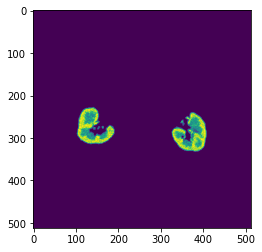

In [25]:
for i,(X,y) in enumerate(dataset2):
    if i ==6423:
        plt.imshow(X[0,:,:])
        break

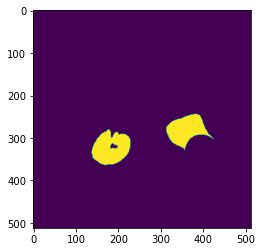

In [23]:
for i,(X,y) in enumerate(dataset2):
    if i ==533:
        plt.imshow(y[0,:,:])
        break

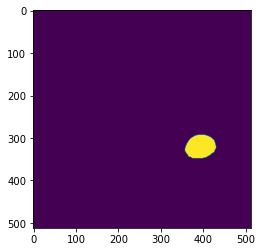

In [45]:
for i,(X,y) in enumerate(dataset2):
    if i ==533:
        plt.imshow(y[1,:,:])
        break

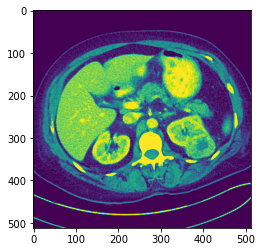

In [54]:
z=read_dicom(train_DICOM_path+"training009/00021.dcm",30,310)
plt.imshow(z[:,:,0])

In [29]:
# # 데이터 불러오기
# #Preprocessing
# Totensor = torchvision.transforms.Compose([
#     torchvision.transforms.ToTensor()
# ])

# #Preparation of training data and test data
# dataset2 = Dataset2(
#     transform=Totensor
# )



Data exist, Data Loading...


In [27]:
train_set,val_set = random_split(dataset2,[int(len(dataset2)*0.9),int(len(dataset2)*0.1)])
#del dataset2
print("split success!!!!")


train_ts = torch.utils.data.DataLoader(
    train_set,
    batch_size=batch_size,
    shuffle=True
)
val_ts = torch.utils.data.DataLoader(
    val_set,
    batch_size=batch_size,
    shuffle=False
)
print("batch split!!!")
del train_set
del val_set


split success!!!!
batch split!!!


In [270]:
#net2 = UNet2().to(device)

# num_batch_train = len(train_ts)
# num_batch_val = len(val_ts)

# #텐서를 넘파이로 변환
fn_tonumpy = lambda x: x.to('cpu').detach().numpy().transpose(0,2,3,1)
print("Done!")

print("Start!")
# 네트워크 학습

for epoch in tqdm(range(st_epoch + 1,  num_epoch+ 1)):
    net2.train()
    train_loss_arr = []
    
    for batch, (batch_X_train, batch_y_train) in enumerate(train_ts, 1):
        # forward
        batch_X_train = batch_X_train.to(device)
        batch_y_train = batch_y_train.to(device)
        output = net2(batch_X_train)
        
        #  backward
        optim.zero_grad()
        loss = fn_loss(output, batch_y_train)
        loss.backward()
        optim.step()

        #손실함수 계산
        train_loss_arr +=[loss.item()]
        print("Train: EPOCH: %d/%d   |   Batch %d/%d   |   LOSS: %.4f"
              %(epoch, num_epoch, batch, num_batch_train, np.mean(train_loss_arr)))
        
        del batch_X_train, batch_y_train

    with torch.no_grad():
        # forward
        net2.eval()
        val_loss_arr = []
        
        for batch,(batch_X_val, batch_y_val) in enumerate(val_ts, 1):
            batch_X_val = batch_X_val.to(device)
            batch_y_val = batch_y_val.to(device)
            output = net2(batch_X_val)

            loss = fn_loss(output, batch_y_val)
            val_loss_arr += [loss.item()]
            print("VALID: EPOCH: %d/%d   |   Batch %d/%d   |   LOSS: %.4f"%
                 (epoch, num_epoch, batch, num_batch_val, np.mean(val_loss_arr)))
            
            del batch_X_val, batch_y_val
    scheduler.step(np.mean(val_loss_arr))
    
torch.save(net2.state_dict(), './model2.pt')



  0%|                                                                                          | 0/300 [00:00<?, ?it/s]

Done!
Start!
Train: EPOCH: 1/300   |   Batch 1/1440   |   LOSS: -0.0973
Train: EPOCH: 1/300   |   Batch 2/1440   |   LOSS: -0.1000
Train: EPOCH: 1/300   |   Batch 3/1440   |   LOSS: -0.0608
Train: EPOCH: 1/300   |   Batch 4/1440   |   LOSS: -0.1101
Train: EPOCH: 1/300   |   Batch 5/1440   |   LOSS: -0.0974
Train: EPOCH: 1/300   |   Batch 6/1440   |   LOSS: -0.0891
Train: EPOCH: 1/300   |   Batch 7/1440   |   LOSS: -0.0858
Train: EPOCH: 1/300   |   Batch 8/1440   |   LOSS: -0.0945
Train: EPOCH: 1/300   |   Batch 9/1440   |   LOSS: -0.0887
Train: EPOCH: 1/300   |   Batch 10/1440   |   LOSS: -0.1013
Train: EPOCH: 1/300   |   Batch 11/1440   |   LOSS: -0.0917
Train: EPOCH: 1/300   |   Batch 12/1440   |   LOSS: -0.0850
Train: EPOCH: 1/300   |   Batch 13/1440   |   LOSS: -0.0767
Train: EPOCH: 1/300   |   Batch 14/1440   |   LOSS: -0.0829
Train: EPOCH: 1/300   |   Batch 15/1440   |   LOSS: -0.0772
Train: EPOCH: 1/300   |   Batch 16/1440   |   LOSS: -0.0756
Train: EPOCH: 1/300   |   Batch 17/1

Train: EPOCH: 1/300   |   Batch 137/1440   |   LOSS: -0.0872
Train: EPOCH: 1/300   |   Batch 138/1440   |   LOSS: -0.0868
Train: EPOCH: 1/300   |   Batch 139/1440   |   LOSS: -0.0870
Train: EPOCH: 1/300   |   Batch 140/1440   |   LOSS: -0.0871
Train: EPOCH: 1/300   |   Batch 141/1440   |   LOSS: -0.0866
Train: EPOCH: 1/300   |   Batch 142/1440   |   LOSS: -0.0863
Train: EPOCH: 1/300   |   Batch 143/1440   |   LOSS: -0.0873
Train: EPOCH: 1/300   |   Batch 144/1440   |   LOSS: -0.0867
Train: EPOCH: 1/300   |   Batch 145/1440   |   LOSS: -0.0862
Train: EPOCH: 1/300   |   Batch 146/1440   |   LOSS: -0.0857
Train: EPOCH: 1/300   |   Batch 147/1440   |   LOSS: -0.0856
Train: EPOCH: 1/300   |   Batch 148/1440   |   LOSS: -0.0862
Train: EPOCH: 1/300   |   Batch 149/1440   |   LOSS: -0.0862
Train: EPOCH: 1/300   |   Batch 150/1440   |   LOSS: -0.0866
Train: EPOCH: 1/300   |   Batch 151/1440   |   LOSS: -0.0871
Train: EPOCH: 1/300   |   Batch 152/1440   |   LOSS: -0.0878
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 272/1440   |   LOSS: -0.0883
Train: EPOCH: 1/300   |   Batch 273/1440   |   LOSS: -0.0885
Train: EPOCH: 1/300   |   Batch 274/1440   |   LOSS: -0.0888
Train: EPOCH: 1/300   |   Batch 275/1440   |   LOSS: -0.0886
Train: EPOCH: 1/300   |   Batch 276/1440   |   LOSS: -0.0891
Train: EPOCH: 1/300   |   Batch 277/1440   |   LOSS: -0.0898
Train: EPOCH: 1/300   |   Batch 278/1440   |   LOSS: -0.0894
Train: EPOCH: 1/300   |   Batch 279/1440   |   LOSS: -0.0891
Train: EPOCH: 1/300   |   Batch 280/1440   |   LOSS: -0.0893
Train: EPOCH: 1/300   |   Batch 281/1440   |   LOSS: -0.0890
Train: EPOCH: 1/300   |   Batch 282/1440   |   LOSS: -0.0886
Train: EPOCH: 1/300   |   Batch 283/1440   |   LOSS: -0.0887
Train: EPOCH: 1/300   |   Batch 284/1440   |   LOSS: -0.0890
Train: EPOCH: 1/300   |   Batch 285/1440   |   LOSS: -0.0889
Train: EPOCH: 1/300   |   Batch 286/1440   |   LOSS: -0.0892
Train: EPOCH: 1/300   |   Batch 287/1440   |   LOSS: -0.0891
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 407/1440   |   LOSS: -0.0905
Train: EPOCH: 1/300   |   Batch 408/1440   |   LOSS: -0.0903
Train: EPOCH: 1/300   |   Batch 409/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 410/1440   |   LOSS: -0.0904
Train: EPOCH: 1/300   |   Batch 411/1440   |   LOSS: -0.0903
Train: EPOCH: 1/300   |   Batch 412/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 413/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 414/1440   |   LOSS: -0.0905
Train: EPOCH: 1/300   |   Batch 415/1440   |   LOSS: -0.0904
Train: EPOCH: 1/300   |   Batch 416/1440   |   LOSS: -0.0904
Train: EPOCH: 1/300   |   Batch 417/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 418/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 419/1440   |   LOSS: -0.0905
Train: EPOCH: 1/300   |   Batch 420/1440   |   LOSS: -0.0907
Train: EPOCH: 1/300   |   Batch 421/1440   |   LOSS: -0.0906
Train: EPOCH: 1/300   |   Batch 422/1440   |   LOSS: -0.0908
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 542/1440   |   LOSS: -0.0912
Train: EPOCH: 1/300   |   Batch 543/1440   |   LOSS: -0.0911
Train: EPOCH: 1/300   |   Batch 544/1440   |   LOSS: -0.0911
Train: EPOCH: 1/300   |   Batch 545/1440   |   LOSS: -0.0913
Train: EPOCH: 1/300   |   Batch 546/1440   |   LOSS: -0.0914
Train: EPOCH: 1/300   |   Batch 547/1440   |   LOSS: -0.0912
Train: EPOCH: 1/300   |   Batch 548/1440   |   LOSS: -0.0912
Train: EPOCH: 1/300   |   Batch 549/1440   |   LOSS: -0.0910
Train: EPOCH: 1/300   |   Batch 550/1440   |   LOSS: -0.0909
Train: EPOCH: 1/300   |   Batch 551/1440   |   LOSS: -0.0908
Train: EPOCH: 1/300   |   Batch 552/1440   |   LOSS: -0.0908
Train: EPOCH: 1/300   |   Batch 553/1440   |   LOSS: -0.0911
Train: EPOCH: 1/300   |   Batch 554/1440   |   LOSS: -0.0910
Train: EPOCH: 1/300   |   Batch 555/1440   |   LOSS: -0.0911
Train: EPOCH: 1/300   |   Batch 556/1440   |   LOSS: -0.0911
Train: EPOCH: 1/300   |   Batch 557/1440   |   LOSS: -0.0913
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 677/1440   |   LOSS: -0.0915
Train: EPOCH: 1/300   |   Batch 678/1440   |   LOSS: -0.0916
Train: EPOCH: 1/300   |   Batch 679/1440   |   LOSS: -0.0916
Train: EPOCH: 1/300   |   Batch 680/1440   |   LOSS: -0.0918
Train: EPOCH: 1/300   |   Batch 681/1440   |   LOSS: -0.0917
Train: EPOCH: 1/300   |   Batch 682/1440   |   LOSS: -0.0917
Train: EPOCH: 1/300   |   Batch 683/1440   |   LOSS: -0.0918
Train: EPOCH: 1/300   |   Batch 684/1440   |   LOSS: -0.0921
Train: EPOCH: 1/300   |   Batch 685/1440   |   LOSS: -0.0921
Train: EPOCH: 1/300   |   Batch 686/1440   |   LOSS: -0.0921
Train: EPOCH: 1/300   |   Batch 687/1440   |   LOSS: -0.0921
Train: EPOCH: 1/300   |   Batch 688/1440   |   LOSS: -0.0920
Train: EPOCH: 1/300   |   Batch 689/1440   |   LOSS: -0.0919
Train: EPOCH: 1/300   |   Batch 690/1440   |   LOSS: -0.0919
Train: EPOCH: 1/300   |   Batch 691/1440   |   LOSS: -0.0918
Train: EPOCH: 1/300   |   Batch 692/1440   |   LOSS: -0.0918
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 812/1440   |   LOSS: -0.0915
Train: EPOCH: 1/300   |   Batch 813/1440   |   LOSS: -0.0914
Train: EPOCH: 1/300   |   Batch 814/1440   |   LOSS: -0.0914
Train: EPOCH: 1/300   |   Batch 815/1440   |   LOSS: -0.0916
Train: EPOCH: 1/300   |   Batch 816/1440   |   LOSS: -0.0916
Train: EPOCH: 1/300   |   Batch 817/1440   |   LOSS: -0.0915
Train: EPOCH: 1/300   |   Batch 818/1440   |   LOSS: -0.0917
Train: EPOCH: 1/300   |   Batch 819/1440   |   LOSS: -0.0917
Train: EPOCH: 1/300   |   Batch 820/1440   |   LOSS: -0.0915
Train: EPOCH: 1/300   |   Batch 821/1440   |   LOSS: -0.0915
Train: EPOCH: 1/300   |   Batch 822/1440   |   LOSS: -0.0915
Train: EPOCH: 1/300   |   Batch 823/1440   |   LOSS: -0.0914
Train: EPOCH: 1/300   |   Batch 824/1440   |   LOSS: -0.0913
Train: EPOCH: 1/300   |   Batch 825/1440   |   LOSS: -0.0912
Train: EPOCH: 1/300   |   Batch 826/1440   |   LOSS: -0.0912
Train: EPOCH: 1/300   |   Batch 827/1440   |   LOSS: -0.0911
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 947/1440   |   LOSS: -0.0908
Train: EPOCH: 1/300   |   Batch 948/1440   |   LOSS: -0.0907
Train: EPOCH: 1/300   |   Batch 949/1440   |   LOSS: -0.0908
Train: EPOCH: 1/300   |   Batch 950/1440   |   LOSS: -0.0907
Train: EPOCH: 1/300   |   Batch 951/1440   |   LOSS: -0.0909
Train: EPOCH: 1/300   |   Batch 952/1440   |   LOSS: -0.0909
Train: EPOCH: 1/300   |   Batch 953/1440   |   LOSS: -0.0908
Train: EPOCH: 1/300   |   Batch 954/1440   |   LOSS: -0.0910
Train: EPOCH: 1/300   |   Batch 955/1440   |   LOSS: -0.0911
Train: EPOCH: 1/300   |   Batch 956/1440   |   LOSS: -0.0912
Train: EPOCH: 1/300   |   Batch 957/1440   |   LOSS: -0.0911
Train: EPOCH: 1/300   |   Batch 958/1440   |   LOSS: -0.0911
Train: EPOCH: 1/300   |   Batch 959/1440   |   LOSS: -0.0910
Train: EPOCH: 1/300   |   Batch 960/1440   |   LOSS: -0.0910
Train: EPOCH: 1/300   |   Batch 961/1440   |   LOSS: -0.0910
Train: EPOCH: 1/300   |   Batch 962/1440   |   LOSS: -0.0910
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 1080/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 1081/1440   |   LOSS: -0.0901
Train: EPOCH: 1/300   |   Batch 1082/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 1083/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 1084/1440   |   LOSS: -0.0903
Train: EPOCH: 1/300   |   Batch 1085/1440   |   LOSS: -0.0903
Train: EPOCH: 1/300   |   Batch 1086/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 1087/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 1088/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 1089/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 1090/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 1091/1440   |   LOSS: -0.0903
Train: EPOCH: 1/300   |   Batch 1092/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 1093/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 1094/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 1095/1440   |   LOSS: -0.0902
Train: E

Train: EPOCH: 1/300   |   Batch 1213/1440   |   LOSS: -0.0905
Train: EPOCH: 1/300   |   Batch 1214/1440   |   LOSS: -0.0906
Train: EPOCH: 1/300   |   Batch 1215/1440   |   LOSS: -0.0907
Train: EPOCH: 1/300   |   Batch 1216/1440   |   LOSS: -0.0906
Train: EPOCH: 1/300   |   Batch 1217/1440   |   LOSS: -0.0906
Train: EPOCH: 1/300   |   Batch 1218/1440   |   LOSS: -0.0906
Train: EPOCH: 1/300   |   Batch 1219/1440   |   LOSS: -0.0906
Train: EPOCH: 1/300   |   Batch 1220/1440   |   LOSS: -0.0905
Train: EPOCH: 1/300   |   Batch 1221/1440   |   LOSS: -0.0907
Train: EPOCH: 1/300   |   Batch 1222/1440   |   LOSS: -0.0906
Train: EPOCH: 1/300   |   Batch 1223/1440   |   LOSS: -0.0905
Train: EPOCH: 1/300   |   Batch 1224/1440   |   LOSS: -0.0906
Train: EPOCH: 1/300   |   Batch 1225/1440   |   LOSS: -0.0907
Train: EPOCH: 1/300   |   Batch 1226/1440   |   LOSS: -0.0906
Train: EPOCH: 1/300   |   Batch 1227/1440   |   LOSS: -0.0905
Train: EPOCH: 1/300   |   Batch 1228/1440   |   LOSS: -0.0906
Train: E

Train: EPOCH: 1/300   |   Batch 1346/1440   |   LOSS: -0.0900
Train: EPOCH: 1/300   |   Batch 1347/1440   |   LOSS: -0.0899
Train: EPOCH: 1/300   |   Batch 1348/1440   |   LOSS: -0.0900
Train: EPOCH: 1/300   |   Batch 1349/1440   |   LOSS: -0.0901
Train: EPOCH: 1/300   |   Batch 1350/1440   |   LOSS: -0.0901
Train: EPOCH: 1/300   |   Batch 1351/1440   |   LOSS: -0.0901
Train: EPOCH: 1/300   |   Batch 1352/1440   |   LOSS: -0.0901
Train: EPOCH: 1/300   |   Batch 1353/1440   |   LOSS: -0.0901
Train: EPOCH: 1/300   |   Batch 1354/1440   |   LOSS: -0.0902
Train: EPOCH: 1/300   |   Batch 1355/1440   |   LOSS: -0.0901
Train: EPOCH: 1/300   |   Batch 1356/1440   |   LOSS: -0.0901
Train: EPOCH: 1/300   |   Batch 1357/1440   |   LOSS: -0.0900
Train: EPOCH: 1/300   |   Batch 1358/1440   |   LOSS: -0.0901
Train: EPOCH: 1/300   |   Batch 1359/1440   |   LOSS: -0.0901
Train: EPOCH: 1/300   |   Batch 1360/1440   |   LOSS: -0.0901
Train: EPOCH: 1/300   |   Batch 1361/1440   |   LOSS: -0.0900
Train: E

VALID: EPOCH: 1/300   |   Batch 41/160   |   LOSS: -0.0842
VALID: EPOCH: 1/300   |   Batch 42/160   |   LOSS: -0.0832
VALID: EPOCH: 1/300   |   Batch 43/160   |   LOSS: -0.0809
VALID: EPOCH: 1/300   |   Batch 44/160   |   LOSS: -0.0787
VALID: EPOCH: 1/300   |   Batch 45/160   |   LOSS: -0.0766
VALID: EPOCH: 1/300   |   Batch 46/160   |   LOSS: -0.0748
VALID: EPOCH: 1/300   |   Batch 47/160   |   LOSS: -0.0763
VALID: EPOCH: 1/300   |   Batch 48/160   |   LOSS: -0.0747
VALID: EPOCH: 1/300   |   Batch 49/160   |   LOSS: -0.0745
VALID: EPOCH: 1/300   |   Batch 50/160   |   LOSS: -0.0737
VALID: EPOCH: 1/300   |   Batch 51/160   |   LOSS: -0.0730
VALID: EPOCH: 1/300   |   Batch 52/160   |   LOSS: -0.0719
VALID: EPOCH: 1/300   |   Batch 53/160   |   LOSS: -0.0720
VALID: EPOCH: 1/300   |   Batch 54/160   |   LOSS: -0.0719
VALID: EPOCH: 1/300   |   Batch 55/160   |   LOSS: -0.0722
VALID: EPOCH: 1/300   |   Batch 56/160   |   LOSS: -0.0726
VALID: EPOCH: 1/300   |   Batch 57/160   |   LOSS: -0.07

  0%|▎                                                                           | 1/300 [42:24<211:22:14, 2544.93s/it]

VALID: EPOCH: 1/300   |   Batch 160/160   |   LOSS: -0.0751
Train: EPOCH: 2/300   |   Batch 1/1440   |   LOSS: -0.2771
Train: EPOCH: 2/300   |   Batch 2/1440   |   LOSS: -0.1611
Train: EPOCH: 2/300   |   Batch 3/1440   |   LOSS: -0.1578
Train: EPOCH: 2/300   |   Batch 4/1440   |   LOSS: -0.1471
Train: EPOCH: 2/300   |   Batch 5/1440   |   LOSS: -0.1544
Train: EPOCH: 2/300   |   Batch 6/1440   |   LOSS: -0.1426
Train: EPOCH: 2/300   |   Batch 7/1440   |   LOSS: -0.1414
Train: EPOCH: 2/300   |   Batch 8/1440   |   LOSS: -0.1354
Train: EPOCH: 2/300   |   Batch 9/1440   |   LOSS: -0.1284
Train: EPOCH: 2/300   |   Batch 10/1440   |   LOSS: -0.1168
Train: EPOCH: 2/300   |   Batch 11/1440   |   LOSS: -0.1075
Train: EPOCH: 2/300   |   Batch 12/1440   |   LOSS: -0.1053
Train: EPOCH: 2/300   |   Batch 13/1440   |   LOSS: -0.1056
Train: EPOCH: 2/300   |   Batch 14/1440   |   LOSS: -0.1089
Train: EPOCH: 2/300   |   Batch 15/1440   |   LOSS: -0.1153
Train: EPOCH: 2/300   |   Batch 16/1440   |   LOS

Train: EPOCH: 2/300   |   Batch 137/1440   |   LOSS: -0.0931
Train: EPOCH: 2/300   |   Batch 138/1440   |   LOSS: -0.0924
Train: EPOCH: 2/300   |   Batch 139/1440   |   LOSS: -0.0918
Train: EPOCH: 2/300   |   Batch 140/1440   |   LOSS: -0.0919
Train: EPOCH: 2/300   |   Batch 141/1440   |   LOSS: -0.0928
Train: EPOCH: 2/300   |   Batch 142/1440   |   LOSS: -0.0928
Train: EPOCH: 2/300   |   Batch 143/1440   |   LOSS: -0.0924
Train: EPOCH: 2/300   |   Batch 144/1440   |   LOSS: -0.0922
Train: EPOCH: 2/300   |   Batch 145/1440   |   LOSS: -0.0917
Train: EPOCH: 2/300   |   Batch 146/1440   |   LOSS: -0.0908
Train: EPOCH: 2/300   |   Batch 147/1440   |   LOSS: -0.0908
Train: EPOCH: 2/300   |   Batch 148/1440   |   LOSS: -0.0905
Train: EPOCH: 2/300   |   Batch 149/1440   |   LOSS: -0.0912
Train: EPOCH: 2/300   |   Batch 150/1440   |   LOSS: -0.0910
Train: EPOCH: 2/300   |   Batch 151/1440   |   LOSS: -0.0913
Train: EPOCH: 2/300   |   Batch 152/1440   |   LOSS: -0.0924
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 272/1440   |   LOSS: -0.0875
Train: EPOCH: 2/300   |   Batch 273/1440   |   LOSS: -0.0873
Train: EPOCH: 2/300   |   Batch 274/1440   |   LOSS: -0.0873
Train: EPOCH: 2/300   |   Batch 275/1440   |   LOSS: -0.0877
Train: EPOCH: 2/300   |   Batch 276/1440   |   LOSS: -0.0874
Train: EPOCH: 2/300   |   Batch 277/1440   |   LOSS: -0.0873
Train: EPOCH: 2/300   |   Batch 278/1440   |   LOSS: -0.0871
Train: EPOCH: 2/300   |   Batch 279/1440   |   LOSS: -0.0868
Train: EPOCH: 2/300   |   Batch 280/1440   |   LOSS: -0.0866
Train: EPOCH: 2/300   |   Batch 281/1440   |   LOSS: -0.0866
Train: EPOCH: 2/300   |   Batch 282/1440   |   LOSS: -0.0869
Train: EPOCH: 2/300   |   Batch 283/1440   |   LOSS: -0.0869
Train: EPOCH: 2/300   |   Batch 284/1440   |   LOSS: -0.0869
Train: EPOCH: 2/300   |   Batch 285/1440   |   LOSS: -0.0871
Train: EPOCH: 2/300   |   Batch 286/1440   |   LOSS: -0.0870
Train: EPOCH: 2/300   |   Batch 287/1440   |   LOSS: -0.0871
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 407/1440   |   LOSS: -0.0919
Train: EPOCH: 2/300   |   Batch 408/1440   |   LOSS: -0.0922
Train: EPOCH: 2/300   |   Batch 409/1440   |   LOSS: -0.0922
Train: EPOCH: 2/300   |   Batch 410/1440   |   LOSS: -0.0921
Train: EPOCH: 2/300   |   Batch 411/1440   |   LOSS: -0.0918
Train: EPOCH: 2/300   |   Batch 412/1440   |   LOSS: -0.0921
Train: EPOCH: 2/300   |   Batch 413/1440   |   LOSS: -0.0923
Train: EPOCH: 2/300   |   Batch 414/1440   |   LOSS: -0.0921
Train: EPOCH: 2/300   |   Batch 415/1440   |   LOSS: -0.0921
Train: EPOCH: 2/300   |   Batch 416/1440   |   LOSS: -0.0924
Train: EPOCH: 2/300   |   Batch 417/1440   |   LOSS: -0.0928
Train: EPOCH: 2/300   |   Batch 418/1440   |   LOSS: -0.0928
Train: EPOCH: 2/300   |   Batch 419/1440   |   LOSS: -0.0929
Train: EPOCH: 2/300   |   Batch 420/1440   |   LOSS: -0.0931
Train: EPOCH: 2/300   |   Batch 421/1440   |   LOSS: -0.0931
Train: EPOCH: 2/300   |   Batch 422/1440   |   LOSS: -0.0933
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 542/1440   |   LOSS: -0.0926
Train: EPOCH: 2/300   |   Batch 543/1440   |   LOSS: -0.0926
Train: EPOCH: 2/300   |   Batch 544/1440   |   LOSS: -0.0925
Train: EPOCH: 2/300   |   Batch 545/1440   |   LOSS: -0.0924
Train: EPOCH: 2/300   |   Batch 546/1440   |   LOSS: -0.0925
Train: EPOCH: 2/300   |   Batch 547/1440   |   LOSS: -0.0926
Train: EPOCH: 2/300   |   Batch 548/1440   |   LOSS: -0.0926
Train: EPOCH: 2/300   |   Batch 549/1440   |   LOSS: -0.0928
Train: EPOCH: 2/300   |   Batch 550/1440   |   LOSS: -0.0926
Train: EPOCH: 2/300   |   Batch 551/1440   |   LOSS: -0.0924
Train: EPOCH: 2/300   |   Batch 552/1440   |   LOSS: -0.0924
Train: EPOCH: 2/300   |   Batch 553/1440   |   LOSS: -0.0925
Train: EPOCH: 2/300   |   Batch 554/1440   |   LOSS: -0.0927
Train: EPOCH: 2/300   |   Batch 555/1440   |   LOSS: -0.0926
Train: EPOCH: 2/300   |   Batch 556/1440   |   LOSS: -0.0927
Train: EPOCH: 2/300   |   Batch 557/1440   |   LOSS: -0.0925
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 677/1440   |   LOSS: -0.0921
Train: EPOCH: 2/300   |   Batch 678/1440   |   LOSS: -0.0921
Train: EPOCH: 2/300   |   Batch 679/1440   |   LOSS: -0.0920
Train: EPOCH: 2/300   |   Batch 680/1440   |   LOSS: -0.0921
Train: EPOCH: 2/300   |   Batch 681/1440   |   LOSS: -0.0920
Train: EPOCH: 2/300   |   Batch 682/1440   |   LOSS: -0.0920
Train: EPOCH: 2/300   |   Batch 683/1440   |   LOSS: -0.0921
Train: EPOCH: 2/300   |   Batch 684/1440   |   LOSS: -0.0921
Train: EPOCH: 2/300   |   Batch 685/1440   |   LOSS: -0.0919
Train: EPOCH: 2/300   |   Batch 686/1440   |   LOSS: -0.0921
Train: EPOCH: 2/300   |   Batch 687/1440   |   LOSS: -0.0923
Train: EPOCH: 2/300   |   Batch 688/1440   |   LOSS: -0.0925
Train: EPOCH: 2/300   |   Batch 689/1440   |   LOSS: -0.0924
Train: EPOCH: 2/300   |   Batch 690/1440   |   LOSS: -0.0923
Train: EPOCH: 2/300   |   Batch 691/1440   |   LOSS: -0.0924
Train: EPOCH: 2/300   |   Batch 692/1440   |   LOSS: -0.0924
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 812/1440   |   LOSS: -0.0906
Train: EPOCH: 2/300   |   Batch 813/1440   |   LOSS: -0.0905
Train: EPOCH: 2/300   |   Batch 814/1440   |   LOSS: -0.0905
Train: EPOCH: 2/300   |   Batch 815/1440   |   LOSS: -0.0905
Train: EPOCH: 2/300   |   Batch 816/1440   |   LOSS: -0.0905
Train: EPOCH: 2/300   |   Batch 817/1440   |   LOSS: -0.0905
Train: EPOCH: 2/300   |   Batch 818/1440   |   LOSS: -0.0904
Train: EPOCH: 2/300   |   Batch 819/1440   |   LOSS: -0.0904
Train: EPOCH: 2/300   |   Batch 820/1440   |   LOSS: -0.0903
Train: EPOCH: 2/300   |   Batch 821/1440   |   LOSS: -0.0903
Train: EPOCH: 2/300   |   Batch 822/1440   |   LOSS: -0.0903
Train: EPOCH: 2/300   |   Batch 823/1440   |   LOSS: -0.0903
Train: EPOCH: 2/300   |   Batch 824/1440   |   LOSS: -0.0904
Train: EPOCH: 2/300   |   Batch 825/1440   |   LOSS: -0.0903
Train: EPOCH: 2/300   |   Batch 826/1440   |   LOSS: -0.0902
Train: EPOCH: 2/300   |   Batch 827/1440   |   LOSS: -0.0903
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 947/1440   |   LOSS: -0.0908
Train: EPOCH: 2/300   |   Batch 948/1440   |   LOSS: -0.0909
Train: EPOCH: 2/300   |   Batch 949/1440   |   LOSS: -0.0909
Train: EPOCH: 2/300   |   Batch 950/1440   |   LOSS: -0.0908
Train: EPOCH: 2/300   |   Batch 951/1440   |   LOSS: -0.0908
Train: EPOCH: 2/300   |   Batch 952/1440   |   LOSS: -0.0907
Train: EPOCH: 2/300   |   Batch 953/1440   |   LOSS: -0.0907
Train: EPOCH: 2/300   |   Batch 954/1440   |   LOSS: -0.0908
Train: EPOCH: 2/300   |   Batch 955/1440   |   LOSS: -0.0907
Train: EPOCH: 2/300   |   Batch 956/1440   |   LOSS: -0.0908
Train: EPOCH: 2/300   |   Batch 957/1440   |   LOSS: -0.0907
Train: EPOCH: 2/300   |   Batch 958/1440   |   LOSS: -0.0908
Train: EPOCH: 2/300   |   Batch 959/1440   |   LOSS: -0.0908
Train: EPOCH: 2/300   |   Batch 960/1440   |   LOSS: -0.0908
Train: EPOCH: 2/300   |   Batch 961/1440   |   LOSS: -0.0907
Train: EPOCH: 2/300   |   Batch 962/1440   |   LOSS: -0.0906
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 1080/1440   |   LOSS: -0.0898
Train: EPOCH: 2/300   |   Batch 1081/1440   |   LOSS: -0.0897
Train: EPOCH: 2/300   |   Batch 1082/1440   |   LOSS: -0.0896
Train: EPOCH: 2/300   |   Batch 1083/1440   |   LOSS: -0.0896
Train: EPOCH: 2/300   |   Batch 1084/1440   |   LOSS: -0.0896
Train: EPOCH: 2/300   |   Batch 1085/1440   |   LOSS: -0.0897
Train: EPOCH: 2/300   |   Batch 1086/1440   |   LOSS: -0.0896
Train: EPOCH: 2/300   |   Batch 1087/1440   |   LOSS: -0.0895
Train: EPOCH: 2/300   |   Batch 1088/1440   |   LOSS: -0.0895
Train: EPOCH: 2/300   |   Batch 1089/1440   |   LOSS: -0.0895
Train: EPOCH: 2/300   |   Batch 1090/1440   |   LOSS: -0.0894
Train: EPOCH: 2/300   |   Batch 1091/1440   |   LOSS: -0.0894
Train: EPOCH: 2/300   |   Batch 1092/1440   |   LOSS: -0.0893
Train: EPOCH: 2/300   |   Batch 1093/1440   |   LOSS: -0.0893
Train: EPOCH: 2/300   |   Batch 1094/1440   |   LOSS: -0.0894
Train: EPOCH: 2/300   |   Batch 1095/1440   |   LOSS: -0.0893
Train: E

Train: EPOCH: 2/300   |   Batch 1213/1440   |   LOSS: -0.0892
Train: EPOCH: 2/300   |   Batch 1214/1440   |   LOSS: -0.0891
Train: EPOCH: 2/300   |   Batch 1215/1440   |   LOSS: -0.0891
Train: EPOCH: 2/300   |   Batch 1216/1440   |   LOSS: -0.0891
Train: EPOCH: 2/300   |   Batch 1217/1440   |   LOSS: -0.0891
Train: EPOCH: 2/300   |   Batch 1218/1440   |   LOSS: -0.0891
Train: EPOCH: 2/300   |   Batch 1219/1440   |   LOSS: -0.0891
Train: EPOCH: 2/300   |   Batch 1220/1440   |   LOSS: -0.0890
Train: EPOCH: 2/300   |   Batch 1221/1440   |   LOSS: -0.0889
Train: EPOCH: 2/300   |   Batch 1222/1440   |   LOSS: -0.0889
Train: EPOCH: 2/300   |   Batch 1223/1440   |   LOSS: -0.0889
Train: EPOCH: 2/300   |   Batch 1224/1440   |   LOSS: -0.0889
Train: EPOCH: 2/300   |   Batch 1225/1440   |   LOSS: -0.0889
Train: EPOCH: 2/300   |   Batch 1226/1440   |   LOSS: -0.0889
Train: EPOCH: 2/300   |   Batch 1227/1440   |   LOSS: -0.0889
Train: EPOCH: 2/300   |   Batch 1228/1440   |   LOSS: -0.0889
Train: E

Train: EPOCH: 2/300   |   Batch 1346/1440   |   LOSS: -0.0888
Train: EPOCH: 2/300   |   Batch 1347/1440   |   LOSS: -0.0888
Train: EPOCH: 2/300   |   Batch 1348/1440   |   LOSS: -0.0887
Train: EPOCH: 2/300   |   Batch 1349/1440   |   LOSS: -0.0889
Train: EPOCH: 2/300   |   Batch 1350/1440   |   LOSS: -0.0888
Train: EPOCH: 2/300   |   Batch 1351/1440   |   LOSS: -0.0889
Train: EPOCH: 2/300   |   Batch 1352/1440   |   LOSS: -0.0890
Train: EPOCH: 2/300   |   Batch 1353/1440   |   LOSS: -0.0890
Train: EPOCH: 2/300   |   Batch 1354/1440   |   LOSS: -0.0891
Train: EPOCH: 2/300   |   Batch 1355/1440   |   LOSS: -0.0891
Train: EPOCH: 2/300   |   Batch 1356/1440   |   LOSS: -0.0891
Train: EPOCH: 2/300   |   Batch 1357/1440   |   LOSS: -0.0890
Train: EPOCH: 2/300   |   Batch 1358/1440   |   LOSS: -0.0890
Train: EPOCH: 2/300   |   Batch 1359/1440   |   LOSS: -0.0890
Train: EPOCH: 2/300   |   Batch 1360/1440   |   LOSS: -0.0891
Train: EPOCH: 2/300   |   Batch 1361/1440   |   LOSS: -0.0891
Train: E

VALID: EPOCH: 2/300   |   Batch 41/160   |   LOSS: -0.0843
VALID: EPOCH: 2/300   |   Batch 42/160   |   LOSS: -0.0833
VALID: EPOCH: 2/300   |   Batch 43/160   |   LOSS: -0.0810
VALID: EPOCH: 2/300   |   Batch 44/160   |   LOSS: -0.0788
VALID: EPOCH: 2/300   |   Batch 45/160   |   LOSS: -0.0767
VALID: EPOCH: 2/300   |   Batch 46/160   |   LOSS: -0.0749
VALID: EPOCH: 2/300   |   Batch 47/160   |   LOSS: -0.0764
VALID: EPOCH: 2/300   |   Batch 48/160   |   LOSS: -0.0748
VALID: EPOCH: 2/300   |   Batch 49/160   |   LOSS: -0.0746
VALID: EPOCH: 2/300   |   Batch 50/160   |   LOSS: -0.0738
VALID: EPOCH: 2/300   |   Batch 51/160   |   LOSS: -0.0730
VALID: EPOCH: 2/300   |   Batch 52/160   |   LOSS: -0.0720
VALID: EPOCH: 2/300   |   Batch 53/160   |   LOSS: -0.0721
VALID: EPOCH: 2/300   |   Batch 54/160   |   LOSS: -0.0720
VALID: EPOCH: 2/300   |   Batch 55/160   |   LOSS: -0.0723
VALID: EPOCH: 2/300   |   Batch 56/160   |   LOSS: -0.0726
VALID: EPOCH: 2/300   |   Batch 57/160   |   LOSS: -0.07

  1%|▍                                                                         | 2/300 [1:23:25<206:34:38, 2495.56s/it]

VALID: EPOCH: 2/300   |   Batch 160/160   |   LOSS: -0.0752
Train: EPOCH: 3/300   |   Batch 1/1440   |   LOSS: -0.0970
Train: EPOCH: 3/300   |   Batch 2/1440   |   LOSS: -0.1401
Train: EPOCH: 3/300   |   Batch 3/1440   |   LOSS: -0.1521
Train: EPOCH: 3/300   |   Batch 4/1440   |   LOSS: -0.1307
Train: EPOCH: 3/300   |   Batch 5/1440   |   LOSS: -0.1069
Train: EPOCH: 3/300   |   Batch 6/1440   |   LOSS: -0.0982
Train: EPOCH: 3/300   |   Batch 7/1440   |   LOSS: -0.0921
Train: EPOCH: 3/300   |   Batch 8/1440   |   LOSS: -0.1015
Train: EPOCH: 3/300   |   Batch 9/1440   |   LOSS: -0.0896
Train: EPOCH: 3/300   |   Batch 10/1440   |   LOSS: -0.0822
Train: EPOCH: 3/300   |   Batch 11/1440   |   LOSS: -0.0780
Train: EPOCH: 3/300   |   Batch 12/1440   |   LOSS: -0.0784
Train: EPOCH: 3/300   |   Batch 13/1440   |   LOSS: -0.0847
Train: EPOCH: 3/300   |   Batch 14/1440   |   LOSS: -0.0855
Train: EPOCH: 3/300   |   Batch 15/1440   |   LOSS: -0.0945
Train: EPOCH: 3/300   |   Batch 16/1440   |   LOS

Train: EPOCH: 3/300   |   Batch 137/1440   |   LOSS: -0.0917
Train: EPOCH: 3/300   |   Batch 138/1440   |   LOSS: -0.0919
Train: EPOCH: 3/300   |   Batch 139/1440   |   LOSS: -0.0920
Train: EPOCH: 3/300   |   Batch 140/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 141/1440   |   LOSS: -0.0918
Train: EPOCH: 3/300   |   Batch 142/1440   |   LOSS: -0.0918
Train: EPOCH: 3/300   |   Batch 143/1440   |   LOSS: -0.0916
Train: EPOCH: 3/300   |   Batch 144/1440   |   LOSS: -0.0913
Train: EPOCH: 3/300   |   Batch 145/1440   |   LOSS: -0.0920
Train: EPOCH: 3/300   |   Batch 146/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 147/1440   |   LOSS: -0.0923
Train: EPOCH: 3/300   |   Batch 148/1440   |   LOSS: -0.0918
Train: EPOCH: 3/300   |   Batch 149/1440   |   LOSS: -0.0913
Train: EPOCH: 3/300   |   Batch 150/1440   |   LOSS: -0.0905
Train: EPOCH: 3/300   |   Batch 151/1440   |   LOSS: -0.0911
Train: EPOCH: 3/300   |   Batch 152/1440   |   LOSS: -0.0906
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 272/1440   |   LOSS: -0.0920
Train: EPOCH: 3/300   |   Batch 273/1440   |   LOSS: -0.0919
Train: EPOCH: 3/300   |   Batch 274/1440   |   LOSS: -0.0924
Train: EPOCH: 3/300   |   Batch 275/1440   |   LOSS: -0.0923
Train: EPOCH: 3/300   |   Batch 276/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 277/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 278/1440   |   LOSS: -0.0923
Train: EPOCH: 3/300   |   Batch 279/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 280/1440   |   LOSS: -0.0922
Train: EPOCH: 3/300   |   Batch 281/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 282/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 283/1440   |   LOSS: -0.0921
Train: EPOCH: 3/300   |   Batch 284/1440   |   LOSS: -0.0920
Train: EPOCH: 3/300   |   Batch 285/1440   |   LOSS: -0.0921
Train: EPOCH: 3/300   |   Batch 286/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 287/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 407/1440   |   LOSS: -0.0946
Train: EPOCH: 3/300   |   Batch 408/1440   |   LOSS: -0.0943
Train: EPOCH: 3/300   |   Batch 409/1440   |   LOSS: -0.0942
Train: EPOCH: 3/300   |   Batch 410/1440   |   LOSS: -0.0940
Train: EPOCH: 3/300   |   Batch 411/1440   |   LOSS: -0.0939
Train: EPOCH: 3/300   |   Batch 412/1440   |   LOSS: -0.0938
Train: EPOCH: 3/300   |   Batch 413/1440   |   LOSS: -0.0935
Train: EPOCH: 3/300   |   Batch 414/1440   |   LOSS: -0.0938
Train: EPOCH: 3/300   |   Batch 415/1440   |   LOSS: -0.0936
Train: EPOCH: 3/300   |   Batch 416/1440   |   LOSS: -0.0935
Train: EPOCH: 3/300   |   Batch 417/1440   |   LOSS: -0.0933
Train: EPOCH: 3/300   |   Batch 418/1440   |   LOSS: -0.0930
Train: EPOCH: 3/300   |   Batch 419/1440   |   LOSS: -0.0932
Train: EPOCH: 3/300   |   Batch 420/1440   |   LOSS: -0.0934
Train: EPOCH: 3/300   |   Batch 421/1440   |   LOSS: -0.0932
Train: EPOCH: 3/300   |   Batch 422/1440   |   LOSS: -0.0930
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 542/1440   |   LOSS: -0.0922
Train: EPOCH: 3/300   |   Batch 543/1440   |   LOSS: -0.0924
Train: EPOCH: 3/300   |   Batch 544/1440   |   LOSS: -0.0923
Train: EPOCH: 3/300   |   Batch 545/1440   |   LOSS: -0.0924
Train: EPOCH: 3/300   |   Batch 546/1440   |   LOSS: -0.0923
Train: EPOCH: 3/300   |   Batch 547/1440   |   LOSS: -0.0924
Train: EPOCH: 3/300   |   Batch 548/1440   |   LOSS: -0.0924
Train: EPOCH: 3/300   |   Batch 549/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 550/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 551/1440   |   LOSS: -0.0924
Train: EPOCH: 3/300   |   Batch 552/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 553/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 554/1440   |   LOSS: -0.0928
Train: EPOCH: 3/300   |   Batch 555/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 556/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 557/1440   |   LOSS: -0.0924
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 677/1440   |   LOSS: -0.0934
Train: EPOCH: 3/300   |   Batch 678/1440   |   LOSS: -0.0935
Train: EPOCH: 3/300   |   Batch 679/1440   |   LOSS: -0.0935
Train: EPOCH: 3/300   |   Batch 680/1440   |   LOSS: -0.0934
Train: EPOCH: 3/300   |   Batch 681/1440   |   LOSS: -0.0934
Train: EPOCH: 3/300   |   Batch 682/1440   |   LOSS: -0.0934
Train: EPOCH: 3/300   |   Batch 683/1440   |   LOSS: -0.0935
Train: EPOCH: 3/300   |   Batch 684/1440   |   LOSS: -0.0934
Train: EPOCH: 3/300   |   Batch 685/1440   |   LOSS: -0.0936
Train: EPOCH: 3/300   |   Batch 686/1440   |   LOSS: -0.0935
Train: EPOCH: 3/300   |   Batch 687/1440   |   LOSS: -0.0934
Train: EPOCH: 3/300   |   Batch 688/1440   |   LOSS: -0.0934
Train: EPOCH: 3/300   |   Batch 689/1440   |   LOSS: -0.0934
Train: EPOCH: 3/300   |   Batch 690/1440   |   LOSS: -0.0935
Train: EPOCH: 3/300   |   Batch 691/1440   |   LOSS: -0.0935
Train: EPOCH: 3/300   |   Batch 692/1440   |   LOSS: -0.0935
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 812/1440   |   LOSS: -0.0928
Train: EPOCH: 3/300   |   Batch 813/1440   |   LOSS: -0.0928
Train: EPOCH: 3/300   |   Batch 814/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 815/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 816/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 817/1440   |   LOSS: -0.0928
Train: EPOCH: 3/300   |   Batch 818/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 819/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 820/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 821/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 822/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 823/1440   |   LOSS: -0.0924
Train: EPOCH: 3/300   |   Batch 824/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 825/1440   |   LOSS: -0.0924
Train: EPOCH: 3/300   |   Batch 826/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 827/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 947/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 948/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 949/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 950/1440   |   LOSS: -0.0928
Train: EPOCH: 3/300   |   Batch 951/1440   |   LOSS: -0.0928
Train: EPOCH: 3/300   |   Batch 952/1440   |   LOSS: -0.0928
Train: EPOCH: 3/300   |   Batch 953/1440   |   LOSS: -0.0928
Train: EPOCH: 3/300   |   Batch 954/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 955/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 956/1440   |   LOSS: -0.0928
Train: EPOCH: 3/300   |   Batch 957/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 958/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 959/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 960/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 961/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 962/1440   |   LOSS: -0.0924
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 1080/1440   |   LOSS: -0.0929
Train: EPOCH: 3/300   |   Batch 1081/1440   |   LOSS: -0.0929
Train: EPOCH: 3/300   |   Batch 1082/1440   |   LOSS: -0.0929
Train: EPOCH: 3/300   |   Batch 1083/1440   |   LOSS: -0.0931
Train: EPOCH: 3/300   |   Batch 1084/1440   |   LOSS: -0.0931
Train: EPOCH: 3/300   |   Batch 1085/1440   |   LOSS: -0.0931
Train: EPOCH: 3/300   |   Batch 1086/1440   |   LOSS: -0.0931
Train: EPOCH: 3/300   |   Batch 1087/1440   |   LOSS: -0.0930
Train: EPOCH: 3/300   |   Batch 1088/1440   |   LOSS: -0.0930
Train: EPOCH: 3/300   |   Batch 1089/1440   |   LOSS: -0.0929
Train: EPOCH: 3/300   |   Batch 1090/1440   |   LOSS: -0.0930
Train: EPOCH: 3/300   |   Batch 1091/1440   |   LOSS: -0.0929
Train: EPOCH: 3/300   |   Batch 1092/1440   |   LOSS: -0.0930
Train: EPOCH: 3/300   |   Batch 1093/1440   |   LOSS: -0.0931
Train: EPOCH: 3/300   |   Batch 1094/1440   |   LOSS: -0.0931
Train: EPOCH: 3/300   |   Batch 1095/1440   |   LOSS: -0.0932
Train: E

Train: EPOCH: 3/300   |   Batch 1213/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 1214/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 1215/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 1216/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 1217/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 1218/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 1219/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 1220/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 1221/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 1222/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 1223/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 1224/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 1225/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 1226/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 1227/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 1228/1440   |   LOSS: -0.0927
Train: E

Train: EPOCH: 3/300   |   Batch 1346/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 1347/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 1348/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 1349/1440   |   LOSS: -0.0927
Train: EPOCH: 3/300   |   Batch 1350/1440   |   LOSS: -0.0926
Train: EPOCH: 3/300   |   Batch 1351/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 1352/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 1353/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 1354/1440   |   LOSS: -0.0924
Train: EPOCH: 3/300   |   Batch 1355/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 1356/1440   |   LOSS: -0.0924
Train: EPOCH: 3/300   |   Batch 1357/1440   |   LOSS: -0.0924
Train: EPOCH: 3/300   |   Batch 1358/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 1359/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 1360/1440   |   LOSS: -0.0925
Train: EPOCH: 3/300   |   Batch 1361/1440   |   LOSS: -0.0924
Train: E

VALID: EPOCH: 3/300   |   Batch 41/160   |   LOSS: -0.0844
VALID: EPOCH: 3/300   |   Batch 42/160   |   LOSS: -0.0834
VALID: EPOCH: 3/300   |   Batch 43/160   |   LOSS: -0.0812
VALID: EPOCH: 3/300   |   Batch 44/160   |   LOSS: -0.0789
VALID: EPOCH: 3/300   |   Batch 45/160   |   LOSS: -0.0769
VALID: EPOCH: 3/300   |   Batch 46/160   |   LOSS: -0.0750
VALID: EPOCH: 3/300   |   Batch 47/160   |   LOSS: -0.0765
VALID: EPOCH: 3/300   |   Batch 48/160   |   LOSS: -0.0749
VALID: EPOCH: 3/300   |   Batch 49/160   |   LOSS: -0.0747
VALID: EPOCH: 3/300   |   Batch 50/160   |   LOSS: -0.0739
VALID: EPOCH: 3/300   |   Batch 51/160   |   LOSS: -0.0732
VALID: EPOCH: 3/300   |   Batch 52/160   |   LOSS: -0.0721
VALID: EPOCH: 3/300   |   Batch 53/160   |   LOSS: -0.0722
VALID: EPOCH: 3/300   |   Batch 54/160   |   LOSS: -0.0721
VALID: EPOCH: 3/300   |   Batch 55/160   |   LOSS: -0.0724
VALID: EPOCH: 3/300   |   Batch 56/160   |   LOSS: -0.0728
VALID: EPOCH: 3/300   |   Batch 57/160   |   LOSS: -0.07

  1%|▋                                                                         | 3/300 [2:03:49<203:09:42, 2462.57s/it]

VALID: EPOCH: 3/300   |   Batch 160/160   |   LOSS: -0.0754
Train: EPOCH: 4/300   |   Batch 1/1440   |   LOSS: -0.0439
Train: EPOCH: 4/300   |   Batch 2/1440   |   LOSS: -0.1317
Train: EPOCH: 4/300   |   Batch 3/1440   |   LOSS: -0.1120
Train: EPOCH: 4/300   |   Batch 4/1440   |   LOSS: -0.1147
Train: EPOCH: 4/300   |   Batch 5/1440   |   LOSS: -0.1030
Train: EPOCH: 4/300   |   Batch 6/1440   |   LOSS: -0.1081
Train: EPOCH: 4/300   |   Batch 7/1440   |   LOSS: -0.1057
Train: EPOCH: 4/300   |   Batch 8/1440   |   LOSS: -0.0985
Train: EPOCH: 4/300   |   Batch 9/1440   |   LOSS: -0.1165
Train: EPOCH: 4/300   |   Batch 10/1440   |   LOSS: -0.1082
Train: EPOCH: 4/300   |   Batch 11/1440   |   LOSS: -0.0990
Train: EPOCH: 4/300   |   Batch 12/1440   |   LOSS: -0.0964
Train: EPOCH: 4/300   |   Batch 13/1440   |   LOSS: -0.0922
Train: EPOCH: 4/300   |   Batch 14/1440   |   LOSS: -0.0924
Train: EPOCH: 4/300   |   Batch 15/1440   |   LOSS: -0.0914
Train: EPOCH: 4/300   |   Batch 16/1440   |   LOS

Train: EPOCH: 4/300   |   Batch 137/1440   |   LOSS: -0.1002
Train: EPOCH: 4/300   |   Batch 138/1440   |   LOSS: -0.0999
Train: EPOCH: 4/300   |   Batch 139/1440   |   LOSS: -0.1012
Train: EPOCH: 4/300   |   Batch 140/1440   |   LOSS: -0.1010
Train: EPOCH: 4/300   |   Batch 141/1440   |   LOSS: -0.1004
Train: EPOCH: 4/300   |   Batch 142/1440   |   LOSS: -0.1002
Train: EPOCH: 4/300   |   Batch 143/1440   |   LOSS: -0.0995
Train: EPOCH: 4/300   |   Batch 144/1440   |   LOSS: -0.0998
Train: EPOCH: 4/300   |   Batch 145/1440   |   LOSS: -0.0996
Train: EPOCH: 4/300   |   Batch 146/1440   |   LOSS: -0.0994
Train: EPOCH: 4/300   |   Batch 147/1440   |   LOSS: -0.1001
Train: EPOCH: 4/300   |   Batch 148/1440   |   LOSS: -0.1007
Train: EPOCH: 4/300   |   Batch 149/1440   |   LOSS: -0.1004
Train: EPOCH: 4/300   |   Batch 150/1440   |   LOSS: -0.0999
Train: EPOCH: 4/300   |   Batch 151/1440   |   LOSS: -0.0991
Train: EPOCH: 4/300   |   Batch 152/1440   |   LOSS: -0.0993
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 272/1440   |   LOSS: -0.0960
Train: EPOCH: 4/300   |   Batch 273/1440   |   LOSS: -0.0959
Train: EPOCH: 4/300   |   Batch 274/1440   |   LOSS: -0.0955
Train: EPOCH: 4/300   |   Batch 275/1440   |   LOSS: -0.0958
Train: EPOCH: 4/300   |   Batch 276/1440   |   LOSS: -0.0955
Train: EPOCH: 4/300   |   Batch 277/1440   |   LOSS: -0.0957
Train: EPOCH: 4/300   |   Batch 278/1440   |   LOSS: -0.0958
Train: EPOCH: 4/300   |   Batch 279/1440   |   LOSS: -0.0955
Train: EPOCH: 4/300   |   Batch 280/1440   |   LOSS: -0.0957
Train: EPOCH: 4/300   |   Batch 281/1440   |   LOSS: -0.0955
Train: EPOCH: 4/300   |   Batch 282/1440   |   LOSS: -0.0956
Train: EPOCH: 4/300   |   Batch 283/1440   |   LOSS: -0.0956
Train: EPOCH: 4/300   |   Batch 284/1440   |   LOSS: -0.0953
Train: EPOCH: 4/300   |   Batch 285/1440   |   LOSS: -0.0958
Train: EPOCH: 4/300   |   Batch 286/1440   |   LOSS: -0.0958
Train: EPOCH: 4/300   |   Batch 287/1440   |   LOSS: -0.0956
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 407/1440   |   LOSS: -0.0927
Train: EPOCH: 4/300   |   Batch 408/1440   |   LOSS: -0.0928
Train: EPOCH: 4/300   |   Batch 409/1440   |   LOSS: -0.0931
Train: EPOCH: 4/300   |   Batch 410/1440   |   LOSS: -0.0933
Train: EPOCH: 4/300   |   Batch 411/1440   |   LOSS: -0.0930
Train: EPOCH: 4/300   |   Batch 412/1440   |   LOSS: -0.0934
Train: EPOCH: 4/300   |   Batch 413/1440   |   LOSS: -0.0934
Train: EPOCH: 4/300   |   Batch 414/1440   |   LOSS: -0.0934
Train: EPOCH: 4/300   |   Batch 415/1440   |   LOSS: -0.0936
Train: EPOCH: 4/300   |   Batch 416/1440   |   LOSS: -0.0936
Train: EPOCH: 4/300   |   Batch 417/1440   |   LOSS: -0.0934
Train: EPOCH: 4/300   |   Batch 418/1440   |   LOSS: -0.0938
Train: EPOCH: 4/300   |   Batch 419/1440   |   LOSS: -0.0937
Train: EPOCH: 4/300   |   Batch 420/1440   |   LOSS: -0.0935
Train: EPOCH: 4/300   |   Batch 421/1440   |   LOSS: -0.0935
Train: EPOCH: 4/300   |   Batch 422/1440   |   LOSS: -0.0933
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 542/1440   |   LOSS: -0.0947
Train: EPOCH: 4/300   |   Batch 543/1440   |   LOSS: -0.0949
Train: EPOCH: 4/300   |   Batch 544/1440   |   LOSS: -0.0947
Train: EPOCH: 4/300   |   Batch 545/1440   |   LOSS: -0.0946
Train: EPOCH: 4/300   |   Batch 546/1440   |   LOSS: -0.0947
Train: EPOCH: 4/300   |   Batch 547/1440   |   LOSS: -0.0947
Train: EPOCH: 4/300   |   Batch 548/1440   |   LOSS: -0.0950
Train: EPOCH: 4/300   |   Batch 549/1440   |   LOSS: -0.0952
Train: EPOCH: 4/300   |   Batch 550/1440   |   LOSS: -0.0950
Train: EPOCH: 4/300   |   Batch 551/1440   |   LOSS: -0.0951
Train: EPOCH: 4/300   |   Batch 552/1440   |   LOSS: -0.0952
Train: EPOCH: 4/300   |   Batch 553/1440   |   LOSS: -0.0951
Train: EPOCH: 4/300   |   Batch 554/1440   |   LOSS: -0.0950
Train: EPOCH: 4/300   |   Batch 555/1440   |   LOSS: -0.0951
Train: EPOCH: 4/300   |   Batch 556/1440   |   LOSS: -0.0952
Train: EPOCH: 4/300   |   Batch 557/1440   |   LOSS: -0.0950
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 677/1440   |   LOSS: -0.0956
Train: EPOCH: 4/300   |   Batch 678/1440   |   LOSS: -0.0956
Train: EPOCH: 4/300   |   Batch 679/1440   |   LOSS: -0.0956
Train: EPOCH: 4/300   |   Batch 680/1440   |   LOSS: -0.0958
Train: EPOCH: 4/300   |   Batch 681/1440   |   LOSS: -0.0958
Train: EPOCH: 4/300   |   Batch 682/1440   |   LOSS: -0.0959
Train: EPOCH: 4/300   |   Batch 683/1440   |   LOSS: -0.0959
Train: EPOCH: 4/300   |   Batch 684/1440   |   LOSS: -0.0958
Train: EPOCH: 4/300   |   Batch 685/1440   |   LOSS: -0.0958
Train: EPOCH: 4/300   |   Batch 686/1440   |   LOSS: -0.0959
Train: EPOCH: 4/300   |   Batch 687/1440   |   LOSS: -0.0958
Train: EPOCH: 4/300   |   Batch 688/1440   |   LOSS: -0.0957
Train: EPOCH: 4/300   |   Batch 689/1440   |   LOSS: -0.0959
Train: EPOCH: 4/300   |   Batch 690/1440   |   LOSS: -0.0959
Train: EPOCH: 4/300   |   Batch 691/1440   |   LOSS: -0.0959
Train: EPOCH: 4/300   |   Batch 692/1440   |   LOSS: -0.0960
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 812/1440   |   LOSS: -0.0929
Train: EPOCH: 4/300   |   Batch 813/1440   |   LOSS: -0.0929
Train: EPOCH: 4/300   |   Batch 814/1440   |   LOSS: -0.0928
Train: EPOCH: 4/300   |   Batch 815/1440   |   LOSS: -0.0928
Train: EPOCH: 4/300   |   Batch 816/1440   |   LOSS: -0.0926
Train: EPOCH: 4/300   |   Batch 817/1440   |   LOSS: -0.0926
Train: EPOCH: 4/300   |   Batch 818/1440   |   LOSS: -0.0926
Train: EPOCH: 4/300   |   Batch 819/1440   |   LOSS: -0.0925
Train: EPOCH: 4/300   |   Batch 820/1440   |   LOSS: -0.0924
Train: EPOCH: 4/300   |   Batch 821/1440   |   LOSS: -0.0923
Train: EPOCH: 4/300   |   Batch 822/1440   |   LOSS: -0.0924
Train: EPOCH: 4/300   |   Batch 823/1440   |   LOSS: -0.0924
Train: EPOCH: 4/300   |   Batch 824/1440   |   LOSS: -0.0925
Train: EPOCH: 4/300   |   Batch 825/1440   |   LOSS: -0.0927
Train: EPOCH: 4/300   |   Batch 826/1440   |   LOSS: -0.0927
Train: EPOCH: 4/300   |   Batch 827/1440   |   LOSS: -0.0927
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 947/1440   |   LOSS: -0.0930
Train: EPOCH: 4/300   |   Batch 948/1440   |   LOSS: -0.0931
Train: EPOCH: 4/300   |   Batch 949/1440   |   LOSS: -0.0932
Train: EPOCH: 4/300   |   Batch 950/1440   |   LOSS: -0.0933
Train: EPOCH: 4/300   |   Batch 951/1440   |   LOSS: -0.0934
Train: EPOCH: 4/300   |   Batch 952/1440   |   LOSS: -0.0935
Train: EPOCH: 4/300   |   Batch 953/1440   |   LOSS: -0.0935
Train: EPOCH: 4/300   |   Batch 954/1440   |   LOSS: -0.0934
Train: EPOCH: 4/300   |   Batch 955/1440   |   LOSS: -0.0934
Train: EPOCH: 4/300   |   Batch 956/1440   |   LOSS: -0.0934
Train: EPOCH: 4/300   |   Batch 957/1440   |   LOSS: -0.0933
Train: EPOCH: 4/300   |   Batch 958/1440   |   LOSS: -0.0934
Train: EPOCH: 4/300   |   Batch 959/1440   |   LOSS: -0.0934
Train: EPOCH: 4/300   |   Batch 960/1440   |   LOSS: -0.0933
Train: EPOCH: 4/300   |   Batch 961/1440   |   LOSS: -0.0934
Train: EPOCH: 4/300   |   Batch 962/1440   |   LOSS: -0.0934
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 1080/1440   |   LOSS: -0.0927
Train: EPOCH: 4/300   |   Batch 1081/1440   |   LOSS: -0.0928
Train: EPOCH: 4/300   |   Batch 1082/1440   |   LOSS: -0.0927
Train: EPOCH: 4/300   |   Batch 1083/1440   |   LOSS: -0.0927
Train: EPOCH: 4/300   |   Batch 1084/1440   |   LOSS: -0.0927
Train: EPOCH: 4/300   |   Batch 1085/1440   |   LOSS: -0.0928
Train: EPOCH: 4/300   |   Batch 1086/1440   |   LOSS: -0.0928
Train: EPOCH: 4/300   |   Batch 1087/1440   |   LOSS: -0.0928
Train: EPOCH: 4/300   |   Batch 1088/1440   |   LOSS: -0.0928
Train: EPOCH: 4/300   |   Batch 1089/1440   |   LOSS: -0.0928
Train: EPOCH: 4/300   |   Batch 1090/1440   |   LOSS: -0.0929
Train: EPOCH: 4/300   |   Batch 1091/1440   |   LOSS: -0.0928
Train: EPOCH: 4/300   |   Batch 1092/1440   |   LOSS: -0.0928
Train: EPOCH: 4/300   |   Batch 1093/1440   |   LOSS: -0.0928
Train: EPOCH: 4/300   |   Batch 1094/1440   |   LOSS: -0.0928
Train: EPOCH: 4/300   |   Batch 1095/1440   |   LOSS: -0.0927
Train: E

Train: EPOCH: 4/300   |   Batch 1213/1440   |   LOSS: -0.0922
Train: EPOCH: 4/300   |   Batch 1214/1440   |   LOSS: -0.0922
Train: EPOCH: 4/300   |   Batch 1215/1440   |   LOSS: -0.0923
Train: EPOCH: 4/300   |   Batch 1216/1440   |   LOSS: -0.0923
Train: EPOCH: 4/300   |   Batch 1217/1440   |   LOSS: -0.0923
Train: EPOCH: 4/300   |   Batch 1218/1440   |   LOSS: -0.0924
Train: EPOCH: 4/300   |   Batch 1219/1440   |   LOSS: -0.0924
Train: EPOCH: 4/300   |   Batch 1220/1440   |   LOSS: -0.0925
Train: EPOCH: 4/300   |   Batch 1221/1440   |   LOSS: -0.0925
Train: EPOCH: 4/300   |   Batch 1222/1440   |   LOSS: -0.0926
Train: EPOCH: 4/300   |   Batch 1223/1440   |   LOSS: -0.0926
Train: EPOCH: 4/300   |   Batch 1224/1440   |   LOSS: -0.0925
Train: EPOCH: 4/300   |   Batch 1225/1440   |   LOSS: -0.0925
Train: EPOCH: 4/300   |   Batch 1226/1440   |   LOSS: -0.0925
Train: EPOCH: 4/300   |   Batch 1227/1440   |   LOSS: -0.0926
Train: EPOCH: 4/300   |   Batch 1228/1440   |   LOSS: -0.0927
Train: E

Train: EPOCH: 4/300   |   Batch 1346/1440   |   LOSS: -0.0923
Train: EPOCH: 4/300   |   Batch 1347/1440   |   LOSS: -0.0924
Train: EPOCH: 4/300   |   Batch 1348/1440   |   LOSS: -0.0925
Train: EPOCH: 4/300   |   Batch 1349/1440   |   LOSS: -0.0926
Train: EPOCH: 4/300   |   Batch 1350/1440   |   LOSS: -0.0926
Train: EPOCH: 4/300   |   Batch 1351/1440   |   LOSS: -0.0925
Train: EPOCH: 4/300   |   Batch 1352/1440   |   LOSS: -0.0925
Train: EPOCH: 4/300   |   Batch 1353/1440   |   LOSS: -0.0926
Train: EPOCH: 4/300   |   Batch 1354/1440   |   LOSS: -0.0926
Train: EPOCH: 4/300   |   Batch 1355/1440   |   LOSS: -0.0925
Train: EPOCH: 4/300   |   Batch 1356/1440   |   LOSS: -0.0926
Train: EPOCH: 4/300   |   Batch 1357/1440   |   LOSS: -0.0927
Train: EPOCH: 4/300   |   Batch 1358/1440   |   LOSS: -0.0927
Train: EPOCH: 4/300   |   Batch 1359/1440   |   LOSS: -0.0926
Train: EPOCH: 4/300   |   Batch 1360/1440   |   LOSS: -0.0926
Train: EPOCH: 4/300   |   Batch 1361/1440   |   LOSS: -0.0927
Train: E

VALID: EPOCH: 4/300   |   Batch 41/160   |   LOSS: -0.0843
VALID: EPOCH: 4/300   |   Batch 42/160   |   LOSS: -0.0833
VALID: EPOCH: 4/300   |   Batch 43/160   |   LOSS: -0.0811
VALID: EPOCH: 4/300   |   Batch 44/160   |   LOSS: -0.0788
VALID: EPOCH: 4/300   |   Batch 45/160   |   LOSS: -0.0768
VALID: EPOCH: 4/300   |   Batch 46/160   |   LOSS: -0.0749
VALID: EPOCH: 4/300   |   Batch 47/160   |   LOSS: -0.0764
VALID: EPOCH: 4/300   |   Batch 48/160   |   LOSS: -0.0748
VALID: EPOCH: 4/300   |   Batch 49/160   |   LOSS: -0.0746
VALID: EPOCH: 4/300   |   Batch 50/160   |   LOSS: -0.0738
VALID: EPOCH: 4/300   |   Batch 51/160   |   LOSS: -0.0731
VALID: EPOCH: 4/300   |   Batch 52/160   |   LOSS: -0.0720
VALID: EPOCH: 4/300   |   Batch 53/160   |   LOSS: -0.0721
VALID: EPOCH: 4/300   |   Batch 54/160   |   LOSS: -0.0720
VALID: EPOCH: 4/300   |   Batch 55/160   |   LOSS: -0.0723
VALID: EPOCH: 4/300   |   Batch 56/160   |   LOSS: -0.0727
VALID: EPOCH: 4/300   |   Batch 57/160   |   LOSS: -0.07

  1%|▉                                                                         | 4/300 [2:44:12<201:11:36, 2446.95s/it]

VALID: EPOCH: 4/300   |   Batch 160/160   |   LOSS: -0.0753
Train: EPOCH: 5/300   |   Batch 1/1440   |   LOSS: -0.1063
Train: EPOCH: 5/300   |   Batch 2/1440   |   LOSS: -0.0953
Train: EPOCH: 5/300   |   Batch 3/1440   |   LOSS: -0.0653
Train: EPOCH: 5/300   |   Batch 4/1440   |   LOSS: -0.0544
Train: EPOCH: 5/300   |   Batch 5/1440   |   LOSS: -0.0461
Train: EPOCH: 5/300   |   Batch 6/1440   |   LOSS: -0.0731
Train: EPOCH: 5/300   |   Batch 7/1440   |   LOSS: -0.0818
Train: EPOCH: 5/300   |   Batch 8/1440   |   LOSS: -0.0740
Train: EPOCH: 5/300   |   Batch 9/1440   |   LOSS: -0.0719
Train: EPOCH: 5/300   |   Batch 10/1440   |   LOSS: -0.0665
Train: EPOCH: 5/300   |   Batch 11/1440   |   LOSS: -0.0623
Train: EPOCH: 5/300   |   Batch 12/1440   |   LOSS: -0.0613
Train: EPOCH: 5/300   |   Batch 13/1440   |   LOSS: -0.0564
Train: EPOCH: 5/300   |   Batch 14/1440   |   LOSS: -0.0607
Train: EPOCH: 5/300   |   Batch 15/1440   |   LOSS: -0.0619
Train: EPOCH: 5/300   |   Batch 16/1440   |   LOS

Train: EPOCH: 5/300   |   Batch 137/1440   |   LOSS: -0.0828
Train: EPOCH: 5/300   |   Batch 138/1440   |   LOSS: -0.0835
Train: EPOCH: 5/300   |   Batch 139/1440   |   LOSS: -0.0834
Train: EPOCH: 5/300   |   Batch 140/1440   |   LOSS: -0.0832
Train: EPOCH: 5/300   |   Batch 141/1440   |   LOSS: -0.0832
Train: EPOCH: 5/300   |   Batch 142/1440   |   LOSS: -0.0827
Train: EPOCH: 5/300   |   Batch 143/1440   |   LOSS: -0.0827
Train: EPOCH: 5/300   |   Batch 144/1440   |   LOSS: -0.0822
Train: EPOCH: 5/300   |   Batch 145/1440   |   LOSS: -0.0818
Train: EPOCH: 5/300   |   Batch 146/1440   |   LOSS: -0.0823
Train: EPOCH: 5/300   |   Batch 147/1440   |   LOSS: -0.0816
Train: EPOCH: 5/300   |   Batch 148/1440   |   LOSS: -0.0812
Train: EPOCH: 5/300   |   Batch 149/1440   |   LOSS: -0.0807
Train: EPOCH: 5/300   |   Batch 150/1440   |   LOSS: -0.0805
Train: EPOCH: 5/300   |   Batch 151/1440   |   LOSS: -0.0808
Train: EPOCH: 5/300   |   Batch 152/1440   |   LOSS: -0.0810
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 272/1440   |   LOSS: -0.0875
Train: EPOCH: 5/300   |   Batch 273/1440   |   LOSS: -0.0874
Train: EPOCH: 5/300   |   Batch 274/1440   |   LOSS: -0.0876
Train: EPOCH: 5/300   |   Batch 275/1440   |   LOSS: -0.0873
Train: EPOCH: 5/300   |   Batch 276/1440   |   LOSS: -0.0879
Train: EPOCH: 5/300   |   Batch 277/1440   |   LOSS: -0.0879
Train: EPOCH: 5/300   |   Batch 278/1440   |   LOSS: -0.0882
Train: EPOCH: 5/300   |   Batch 279/1440   |   LOSS: -0.0881
Train: EPOCH: 5/300   |   Batch 280/1440   |   LOSS: -0.0878
Train: EPOCH: 5/300   |   Batch 281/1440   |   LOSS: -0.0883
Train: EPOCH: 5/300   |   Batch 282/1440   |   LOSS: -0.0882
Train: EPOCH: 5/300   |   Batch 283/1440   |   LOSS: -0.0884
Train: EPOCH: 5/300   |   Batch 284/1440   |   LOSS: -0.0885
Train: EPOCH: 5/300   |   Batch 285/1440   |   LOSS: -0.0886
Train: EPOCH: 5/300   |   Batch 286/1440   |   LOSS: -0.0885
Train: EPOCH: 5/300   |   Batch 287/1440   |   LOSS: -0.0886
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 407/1440   |   LOSS: -0.0877
Train: EPOCH: 5/300   |   Batch 408/1440   |   LOSS: -0.0877
Train: EPOCH: 5/300   |   Batch 409/1440   |   LOSS: -0.0878
Train: EPOCH: 5/300   |   Batch 410/1440   |   LOSS: -0.0875
Train: EPOCH: 5/300   |   Batch 411/1440   |   LOSS: -0.0876
Train: EPOCH: 5/300   |   Batch 412/1440   |   LOSS: -0.0879
Train: EPOCH: 5/300   |   Batch 413/1440   |   LOSS: -0.0879
Train: EPOCH: 5/300   |   Batch 414/1440   |   LOSS: -0.0879
Train: EPOCH: 5/300   |   Batch 415/1440   |   LOSS: -0.0880
Train: EPOCH: 5/300   |   Batch 416/1440   |   LOSS: -0.0879
Train: EPOCH: 5/300   |   Batch 417/1440   |   LOSS: -0.0877
Train: EPOCH: 5/300   |   Batch 418/1440   |   LOSS: -0.0876
Train: EPOCH: 5/300   |   Batch 419/1440   |   LOSS: -0.0874
Train: EPOCH: 5/300   |   Batch 420/1440   |   LOSS: -0.0874
Train: EPOCH: 5/300   |   Batch 421/1440   |   LOSS: -0.0873
Train: EPOCH: 5/300   |   Batch 422/1440   |   LOSS: -0.0873
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 542/1440   |   LOSS: -0.0892
Train: EPOCH: 5/300   |   Batch 543/1440   |   LOSS: -0.0891
Train: EPOCH: 5/300   |   Batch 544/1440   |   LOSS: -0.0892
Train: EPOCH: 5/300   |   Batch 545/1440   |   LOSS: -0.0895
Train: EPOCH: 5/300   |   Batch 546/1440   |   LOSS: -0.0895
Train: EPOCH: 5/300   |   Batch 547/1440   |   LOSS: -0.0896
Train: EPOCH: 5/300   |   Batch 548/1440   |   LOSS: -0.0897
Train: EPOCH: 5/300   |   Batch 549/1440   |   LOSS: -0.0898
Train: EPOCH: 5/300   |   Batch 550/1440   |   LOSS: -0.0897
Train: EPOCH: 5/300   |   Batch 551/1440   |   LOSS: -0.0898
Train: EPOCH: 5/300   |   Batch 552/1440   |   LOSS: -0.0898
Train: EPOCH: 5/300   |   Batch 553/1440   |   LOSS: -0.0897
Train: EPOCH: 5/300   |   Batch 554/1440   |   LOSS: -0.0897
Train: EPOCH: 5/300   |   Batch 555/1440   |   LOSS: -0.0896
Train: EPOCH: 5/300   |   Batch 556/1440   |   LOSS: -0.0898
Train: EPOCH: 5/300   |   Batch 557/1440   |   LOSS: -0.0898
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 677/1440   |   LOSS: -0.0885
Train: EPOCH: 5/300   |   Batch 678/1440   |   LOSS: -0.0885
Train: EPOCH: 5/300   |   Batch 679/1440   |   LOSS: -0.0886
Train: EPOCH: 5/300   |   Batch 680/1440   |   LOSS: -0.0885
Train: EPOCH: 5/300   |   Batch 681/1440   |   LOSS: -0.0885
Train: EPOCH: 5/300   |   Batch 682/1440   |   LOSS: -0.0885
Train: EPOCH: 5/300   |   Batch 683/1440   |   LOSS: -0.0887
Train: EPOCH: 5/300   |   Batch 684/1440   |   LOSS: -0.0887
Train: EPOCH: 5/300   |   Batch 685/1440   |   LOSS: -0.0886
Train: EPOCH: 5/300   |   Batch 686/1440   |   LOSS: -0.0886
Train: EPOCH: 5/300   |   Batch 687/1440   |   LOSS: -0.0885
Train: EPOCH: 5/300   |   Batch 688/1440   |   LOSS: -0.0885
Train: EPOCH: 5/300   |   Batch 689/1440   |   LOSS: -0.0886
Train: EPOCH: 5/300   |   Batch 690/1440   |   LOSS: -0.0885
Train: EPOCH: 5/300   |   Batch 691/1440   |   LOSS: -0.0885
Train: EPOCH: 5/300   |   Batch 692/1440   |   LOSS: -0.0884
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 812/1440   |   LOSS: -0.0902
Train: EPOCH: 5/300   |   Batch 813/1440   |   LOSS: -0.0902
Train: EPOCH: 5/300   |   Batch 814/1440   |   LOSS: -0.0903
Train: EPOCH: 5/300   |   Batch 815/1440   |   LOSS: -0.0904
Train: EPOCH: 5/300   |   Batch 816/1440   |   LOSS: -0.0905
Train: EPOCH: 5/300   |   Batch 817/1440   |   LOSS: -0.0904
Train: EPOCH: 5/300   |   Batch 818/1440   |   LOSS: -0.0903
Train: EPOCH: 5/300   |   Batch 819/1440   |   LOSS: -0.0902
Train: EPOCH: 5/300   |   Batch 820/1440   |   LOSS: -0.0903
Train: EPOCH: 5/300   |   Batch 821/1440   |   LOSS: -0.0903
Train: EPOCH: 5/300   |   Batch 822/1440   |   LOSS: -0.0905
Train: EPOCH: 5/300   |   Batch 823/1440   |   LOSS: -0.0904
Train: EPOCH: 5/300   |   Batch 824/1440   |   LOSS: -0.0903
Train: EPOCH: 5/300   |   Batch 825/1440   |   LOSS: -0.0904
Train: EPOCH: 5/300   |   Batch 826/1440   |   LOSS: -0.0904
Train: EPOCH: 5/300   |   Batch 827/1440   |   LOSS: -0.0902
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 947/1440   |   LOSS: -0.0900
Train: EPOCH: 5/300   |   Batch 948/1440   |   LOSS: -0.0901
Train: EPOCH: 5/300   |   Batch 949/1440   |   LOSS: -0.0901
Train: EPOCH: 5/300   |   Batch 950/1440   |   LOSS: -0.0900
Train: EPOCH: 5/300   |   Batch 951/1440   |   LOSS: -0.0901
Train: EPOCH: 5/300   |   Batch 952/1440   |   LOSS: -0.0902
Train: EPOCH: 5/300   |   Batch 953/1440   |   LOSS: -0.0901
Train: EPOCH: 5/300   |   Batch 954/1440   |   LOSS: -0.0900
Train: EPOCH: 5/300   |   Batch 955/1440   |   LOSS: -0.0901
Train: EPOCH: 5/300   |   Batch 956/1440   |   LOSS: -0.0901
Train: EPOCH: 5/300   |   Batch 957/1440   |   LOSS: -0.0900
Train: EPOCH: 5/300   |   Batch 958/1440   |   LOSS: -0.0900
Train: EPOCH: 5/300   |   Batch 959/1440   |   LOSS: -0.0899
Train: EPOCH: 5/300   |   Batch 960/1440   |   LOSS: -0.0898
Train: EPOCH: 5/300   |   Batch 961/1440   |   LOSS: -0.0898
Train: EPOCH: 5/300   |   Batch 962/1440   |   LOSS: -0.0899
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 1080/1440   |   LOSS: -0.0911
Train: EPOCH: 5/300   |   Batch 1081/1440   |   LOSS: -0.0911
Train: EPOCH: 5/300   |   Batch 1082/1440   |   LOSS: -0.0912
Train: EPOCH: 5/300   |   Batch 1083/1440   |   LOSS: -0.0913
Train: EPOCH: 5/300   |   Batch 1084/1440   |   LOSS: -0.0912
Train: EPOCH: 5/300   |   Batch 1085/1440   |   LOSS: -0.0913
Train: EPOCH: 5/300   |   Batch 1086/1440   |   LOSS: -0.0913
Train: EPOCH: 5/300   |   Batch 1087/1440   |   LOSS: -0.0915
Train: EPOCH: 5/300   |   Batch 1088/1440   |   LOSS: -0.0914
Train: EPOCH: 5/300   |   Batch 1089/1440   |   LOSS: -0.0914
Train: EPOCH: 5/300   |   Batch 1090/1440   |   LOSS: -0.0913
Train: EPOCH: 5/300   |   Batch 1091/1440   |   LOSS: -0.0912
Train: EPOCH: 5/300   |   Batch 1092/1440   |   LOSS: -0.0912
Train: EPOCH: 5/300   |   Batch 1093/1440   |   LOSS: -0.0913
Train: EPOCH: 5/300   |   Batch 1094/1440   |   LOSS: -0.0912
Train: EPOCH: 5/300   |   Batch 1095/1440   |   LOSS: -0.0912
Train: E

Train: EPOCH: 5/300   |   Batch 1213/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1214/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1215/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1216/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1217/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1218/1440   |   LOSS: -0.0908
Train: EPOCH: 5/300   |   Batch 1219/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1220/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1221/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1222/1440   |   LOSS: -0.0906
Train: EPOCH: 5/300   |   Batch 1223/1440   |   LOSS: -0.0906
Train: EPOCH: 5/300   |   Batch 1224/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1225/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1226/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1227/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1228/1440   |   LOSS: -0.0907
Train: E

Train: EPOCH: 5/300   |   Batch 1346/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1347/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1348/1440   |   LOSS: -0.0906
Train: EPOCH: 5/300   |   Batch 1349/1440   |   LOSS: -0.0906
Train: EPOCH: 5/300   |   Batch 1350/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1351/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1352/1440   |   LOSS: -0.0907
Train: EPOCH: 5/300   |   Batch 1353/1440   |   LOSS: -0.0908
Train: EPOCH: 5/300   |   Batch 1354/1440   |   LOSS: -0.0909
Train: EPOCH: 5/300   |   Batch 1355/1440   |   LOSS: -0.0910
Train: EPOCH: 5/300   |   Batch 1356/1440   |   LOSS: -0.0909
Train: EPOCH: 5/300   |   Batch 1357/1440   |   LOSS: -0.0910
Train: EPOCH: 5/300   |   Batch 1358/1440   |   LOSS: -0.0910
Train: EPOCH: 5/300   |   Batch 1359/1440   |   LOSS: -0.0910
Train: EPOCH: 5/300   |   Batch 1360/1440   |   LOSS: -0.0910
Train: EPOCH: 5/300   |   Batch 1361/1440   |   LOSS: -0.0909
Train: E

VALID: EPOCH: 5/300   |   Batch 41/160   |   LOSS: -0.0844
VALID: EPOCH: 5/300   |   Batch 42/160   |   LOSS: -0.0834
VALID: EPOCH: 5/300   |   Batch 43/160   |   LOSS: -0.0812
VALID: EPOCH: 5/300   |   Batch 44/160   |   LOSS: -0.0789
VALID: EPOCH: 5/300   |   Batch 45/160   |   LOSS: -0.0769
VALID: EPOCH: 5/300   |   Batch 46/160   |   LOSS: -0.0750
VALID: EPOCH: 5/300   |   Batch 47/160   |   LOSS: -0.0765
VALID: EPOCH: 5/300   |   Batch 48/160   |   LOSS: -0.0749
VALID: EPOCH: 5/300   |   Batch 49/160   |   LOSS: -0.0747
VALID: EPOCH: 5/300   |   Batch 50/160   |   LOSS: -0.0739
VALID: EPOCH: 5/300   |   Batch 51/160   |   LOSS: -0.0731
VALID: EPOCH: 5/300   |   Batch 52/160   |   LOSS: -0.0721
VALID: EPOCH: 5/300   |   Batch 53/160   |   LOSS: -0.0722
VALID: EPOCH: 5/300   |   Batch 54/160   |   LOSS: -0.0721
VALID: EPOCH: 5/300   |   Batch 55/160   |   LOSS: -0.0723
VALID: EPOCH: 5/300   |   Batch 56/160   |   LOSS: -0.0727
VALID: EPOCH: 5/300   |   Batch 57/160   |   LOSS: -0.07

  2%|█▏                                                                        | 5/300 [3:24:24<199:29:31, 2434.48s/it]

VALID: EPOCH: 5/300   |   Batch 160/160   |   LOSS: -0.0754
Train: EPOCH: 6/300   |   Batch 1/1440   |   LOSS: -0.1505
Train: EPOCH: 6/300   |   Batch 2/1440   |   LOSS: -0.1366
Train: EPOCH: 6/300   |   Batch 3/1440   |   LOSS: -0.1340
Train: EPOCH: 6/300   |   Batch 4/1440   |   LOSS: -0.1225
Train: EPOCH: 6/300   |   Batch 5/1440   |   LOSS: -0.1274
Train: EPOCH: 6/300   |   Batch 6/1440   |   LOSS: -0.1340
Train: EPOCH: 6/300   |   Batch 7/1440   |   LOSS: -0.1128
Train: EPOCH: 6/300   |   Batch 8/1440   |   LOSS: -0.1231
Train: EPOCH: 6/300   |   Batch 9/1440   |   LOSS: -0.1228
Train: EPOCH: 6/300   |   Batch 10/1440   |   LOSS: -0.1225
Train: EPOCH: 6/300   |   Batch 11/1440   |   LOSS: -0.1219
Train: EPOCH: 6/300   |   Batch 12/1440   |   LOSS: -0.1298
Train: EPOCH: 6/300   |   Batch 13/1440   |   LOSS: -0.1235
Train: EPOCH: 6/300   |   Batch 14/1440   |   LOSS: -0.1262
Train: EPOCH: 6/300   |   Batch 15/1440   |   LOSS: -0.1255
Train: EPOCH: 6/300   |   Batch 16/1440   |   LOS

Train: EPOCH: 6/300   |   Batch 137/1440   |   LOSS: -0.0942
Train: EPOCH: 6/300   |   Batch 138/1440   |   LOSS: -0.0949
Train: EPOCH: 6/300   |   Batch 139/1440   |   LOSS: -0.0955
Train: EPOCH: 6/300   |   Batch 140/1440   |   LOSS: -0.0956
Train: EPOCH: 6/300   |   Batch 141/1440   |   LOSS: -0.0963
Train: EPOCH: 6/300   |   Batch 142/1440   |   LOSS: -0.0969
Train: EPOCH: 6/300   |   Batch 143/1440   |   LOSS: -0.0961
Train: EPOCH: 6/300   |   Batch 144/1440   |   LOSS: -0.0954
Train: EPOCH: 6/300   |   Batch 145/1440   |   LOSS: -0.0957
Train: EPOCH: 6/300   |   Batch 146/1440   |   LOSS: -0.0961
Train: EPOCH: 6/300   |   Batch 147/1440   |   LOSS: -0.0963
Train: EPOCH: 6/300   |   Batch 148/1440   |   LOSS: -0.0961
Train: EPOCH: 6/300   |   Batch 149/1440   |   LOSS: -0.0956
Train: EPOCH: 6/300   |   Batch 150/1440   |   LOSS: -0.0953
Train: EPOCH: 6/300   |   Batch 151/1440   |   LOSS: -0.0960
Train: EPOCH: 6/300   |   Batch 152/1440   |   LOSS: -0.0971
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 272/1440   |   LOSS: -0.0967
Train: EPOCH: 6/300   |   Batch 273/1440   |   LOSS: -0.0967
Train: EPOCH: 6/300   |   Batch 274/1440   |   LOSS: -0.0964
Train: EPOCH: 6/300   |   Batch 275/1440   |   LOSS: -0.0963
Train: EPOCH: 6/300   |   Batch 276/1440   |   LOSS: -0.0965
Train: EPOCH: 6/300   |   Batch 277/1440   |   LOSS: -0.0963
Train: EPOCH: 6/300   |   Batch 278/1440   |   LOSS: -0.0960
Train: EPOCH: 6/300   |   Batch 279/1440   |   LOSS: -0.0961
Train: EPOCH: 6/300   |   Batch 280/1440   |   LOSS: -0.0963
Train: EPOCH: 6/300   |   Batch 281/1440   |   LOSS: -0.0962
Train: EPOCH: 6/300   |   Batch 282/1440   |   LOSS: -0.0962
Train: EPOCH: 6/300   |   Batch 283/1440   |   LOSS: -0.0960
Train: EPOCH: 6/300   |   Batch 284/1440   |   LOSS: -0.0961
Train: EPOCH: 6/300   |   Batch 285/1440   |   LOSS: -0.0959
Train: EPOCH: 6/300   |   Batch 286/1440   |   LOSS: -0.0958
Train: EPOCH: 6/300   |   Batch 287/1440   |   LOSS: -0.0955
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 407/1440   |   LOSS: -0.0929
Train: EPOCH: 6/300   |   Batch 408/1440   |   LOSS: -0.0927
Train: EPOCH: 6/300   |   Batch 409/1440   |   LOSS: -0.0925
Train: EPOCH: 6/300   |   Batch 410/1440   |   LOSS: -0.0929
Train: EPOCH: 6/300   |   Batch 411/1440   |   LOSS: -0.0928
Train: EPOCH: 6/300   |   Batch 412/1440   |   LOSS: -0.0926
Train: EPOCH: 6/300   |   Batch 413/1440   |   LOSS: -0.0926
Train: EPOCH: 6/300   |   Batch 414/1440   |   LOSS: -0.0928
Train: EPOCH: 6/300   |   Batch 415/1440   |   LOSS: -0.0928
Train: EPOCH: 6/300   |   Batch 416/1440   |   LOSS: -0.0928
Train: EPOCH: 6/300   |   Batch 417/1440   |   LOSS: -0.0928
Train: EPOCH: 6/300   |   Batch 418/1440   |   LOSS: -0.0929
Train: EPOCH: 6/300   |   Batch 419/1440   |   LOSS: -0.0931
Train: EPOCH: 6/300   |   Batch 420/1440   |   LOSS: -0.0933
Train: EPOCH: 6/300   |   Batch 421/1440   |   LOSS: -0.0934
Train: EPOCH: 6/300   |   Batch 422/1440   |   LOSS: -0.0934
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 542/1440   |   LOSS: -0.0909
Train: EPOCH: 6/300   |   Batch 543/1440   |   LOSS: -0.0909
Train: EPOCH: 6/300   |   Batch 544/1440   |   LOSS: -0.0907
Train: EPOCH: 6/300   |   Batch 545/1440   |   LOSS: -0.0908
Train: EPOCH: 6/300   |   Batch 546/1440   |   LOSS: -0.0907
Train: EPOCH: 6/300   |   Batch 547/1440   |   LOSS: -0.0907
Train: EPOCH: 6/300   |   Batch 548/1440   |   LOSS: -0.0908
Train: EPOCH: 6/300   |   Batch 549/1440   |   LOSS: -0.0907
Train: EPOCH: 6/300   |   Batch 550/1440   |   LOSS: -0.0907
Train: EPOCH: 6/300   |   Batch 551/1440   |   LOSS: -0.0907
Train: EPOCH: 6/300   |   Batch 552/1440   |   LOSS: -0.0908
Train: EPOCH: 6/300   |   Batch 553/1440   |   LOSS: -0.0907
Train: EPOCH: 6/300   |   Batch 554/1440   |   LOSS: -0.0905
Train: EPOCH: 6/300   |   Batch 555/1440   |   LOSS: -0.0904
Train: EPOCH: 6/300   |   Batch 556/1440   |   LOSS: -0.0906
Train: EPOCH: 6/300   |   Batch 557/1440   |   LOSS: -0.0906
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 677/1440   |   LOSS: -0.0901
Train: EPOCH: 6/300   |   Batch 678/1440   |   LOSS: -0.0901
Train: EPOCH: 6/300   |   Batch 679/1440   |   LOSS: -0.0902
Train: EPOCH: 6/300   |   Batch 680/1440   |   LOSS: -0.0903
Train: EPOCH: 6/300   |   Batch 681/1440   |   LOSS: -0.0902
Train: EPOCH: 6/300   |   Batch 682/1440   |   LOSS: -0.0902
Train: EPOCH: 6/300   |   Batch 683/1440   |   LOSS: -0.0902
Train: EPOCH: 6/300   |   Batch 684/1440   |   LOSS: -0.0902
Train: EPOCH: 6/300   |   Batch 685/1440   |   LOSS: -0.0900
Train: EPOCH: 6/300   |   Batch 686/1440   |   LOSS: -0.0901
Train: EPOCH: 6/300   |   Batch 687/1440   |   LOSS: -0.0900
Train: EPOCH: 6/300   |   Batch 688/1440   |   LOSS: -0.0900
Train: EPOCH: 6/300   |   Batch 689/1440   |   LOSS: -0.0901
Train: EPOCH: 6/300   |   Batch 690/1440   |   LOSS: -0.0901
Train: EPOCH: 6/300   |   Batch 691/1440   |   LOSS: -0.0902
Train: EPOCH: 6/300   |   Batch 692/1440   |   LOSS: -0.0901
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 812/1440   |   LOSS: -0.0899
Train: EPOCH: 6/300   |   Batch 813/1440   |   LOSS: -0.0899
Train: EPOCH: 6/300   |   Batch 814/1440   |   LOSS: -0.0899
Train: EPOCH: 6/300   |   Batch 815/1440   |   LOSS: -0.0900
Train: EPOCH: 6/300   |   Batch 816/1440   |   LOSS: -0.0901
Train: EPOCH: 6/300   |   Batch 817/1440   |   LOSS: -0.0900
Train: EPOCH: 6/300   |   Batch 818/1440   |   LOSS: -0.0901
Train: EPOCH: 6/300   |   Batch 819/1440   |   LOSS: -0.0901
Train: EPOCH: 6/300   |   Batch 820/1440   |   LOSS: -0.0902
Train: EPOCH: 6/300   |   Batch 821/1440   |   LOSS: -0.0900
Train: EPOCH: 6/300   |   Batch 822/1440   |   LOSS: -0.0902
Train: EPOCH: 6/300   |   Batch 823/1440   |   LOSS: -0.0901
Train: EPOCH: 6/300   |   Batch 824/1440   |   LOSS: -0.0901
Train: EPOCH: 6/300   |   Batch 825/1440   |   LOSS: -0.0900
Train: EPOCH: 6/300   |   Batch 826/1440   |   LOSS: -0.0899
Train: EPOCH: 6/300   |   Batch 827/1440   |   LOSS: -0.0900
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 947/1440   |   LOSS: -0.0913
Train: EPOCH: 6/300   |   Batch 948/1440   |   LOSS: -0.0913
Train: EPOCH: 6/300   |   Batch 949/1440   |   LOSS: -0.0913
Train: EPOCH: 6/300   |   Batch 950/1440   |   LOSS: -0.0912
Train: EPOCH: 6/300   |   Batch 951/1440   |   LOSS: -0.0911
Train: EPOCH: 6/300   |   Batch 952/1440   |   LOSS: -0.0913
Train: EPOCH: 6/300   |   Batch 953/1440   |   LOSS: -0.0912
Train: EPOCH: 6/300   |   Batch 954/1440   |   LOSS: -0.0912
Train: EPOCH: 6/300   |   Batch 955/1440   |   LOSS: -0.0913
Train: EPOCH: 6/300   |   Batch 956/1440   |   LOSS: -0.0912
Train: EPOCH: 6/300   |   Batch 957/1440   |   LOSS: -0.0912
Train: EPOCH: 6/300   |   Batch 958/1440   |   LOSS: -0.0913
Train: EPOCH: 6/300   |   Batch 959/1440   |   LOSS: -0.0914
Train: EPOCH: 6/300   |   Batch 960/1440   |   LOSS: -0.0913
Train: EPOCH: 6/300   |   Batch 961/1440   |   LOSS: -0.0913
Train: EPOCH: 6/300   |   Batch 962/1440   |   LOSS: -0.0913
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 1080/1440   |   LOSS: -0.0914
Train: EPOCH: 6/300   |   Batch 1081/1440   |   LOSS: -0.0913
Train: EPOCH: 6/300   |   Batch 1082/1440   |   LOSS: -0.0914
Train: EPOCH: 6/300   |   Batch 1083/1440   |   LOSS: -0.0914
Train: EPOCH: 6/300   |   Batch 1084/1440   |   LOSS: -0.0914
Train: EPOCH: 6/300   |   Batch 1085/1440   |   LOSS: -0.0913
Train: EPOCH: 6/300   |   Batch 1086/1440   |   LOSS: -0.0914
Train: EPOCH: 6/300   |   Batch 1087/1440   |   LOSS: -0.0915
Train: EPOCH: 6/300   |   Batch 1088/1440   |   LOSS: -0.0916
Train: EPOCH: 6/300   |   Batch 1089/1440   |   LOSS: -0.0916
Train: EPOCH: 6/300   |   Batch 1090/1440   |   LOSS: -0.0916
Train: EPOCH: 6/300   |   Batch 1091/1440   |   LOSS: -0.0916
Train: EPOCH: 6/300   |   Batch 1092/1440   |   LOSS: -0.0915
Train: EPOCH: 6/300   |   Batch 1093/1440   |   LOSS: -0.0915
Train: EPOCH: 6/300   |   Batch 1094/1440   |   LOSS: -0.0915
Train: EPOCH: 6/300   |   Batch 1095/1440   |   LOSS: -0.0915
Train: E

Train: EPOCH: 6/300   |   Batch 1213/1440   |   LOSS: -0.0905
Train: EPOCH: 6/300   |   Batch 1214/1440   |   LOSS: -0.0904
Train: EPOCH: 6/300   |   Batch 1215/1440   |   LOSS: -0.0904
Train: EPOCH: 6/300   |   Batch 1216/1440   |   LOSS: -0.0905
Train: EPOCH: 6/300   |   Batch 1217/1440   |   LOSS: -0.0904
Train: EPOCH: 6/300   |   Batch 1218/1440   |   LOSS: -0.0904
Train: EPOCH: 6/300   |   Batch 1219/1440   |   LOSS: -0.0905
Train: EPOCH: 6/300   |   Batch 1220/1440   |   LOSS: -0.0905
Train: EPOCH: 6/300   |   Batch 1221/1440   |   LOSS: -0.0905
Train: EPOCH: 6/300   |   Batch 1222/1440   |   LOSS: -0.0904
Train: EPOCH: 6/300   |   Batch 1223/1440   |   LOSS: -0.0905
Train: EPOCH: 6/300   |   Batch 1224/1440   |   LOSS: -0.0906
Train: EPOCH: 6/300   |   Batch 1225/1440   |   LOSS: -0.0905
Train: EPOCH: 6/300   |   Batch 1226/1440   |   LOSS: -0.0905
Train: EPOCH: 6/300   |   Batch 1227/1440   |   LOSS: -0.0904
Train: EPOCH: 6/300   |   Batch 1228/1440   |   LOSS: -0.0904
Train: E

Train: EPOCH: 6/300   |   Batch 1346/1440   |   LOSS: -0.0910
Train: EPOCH: 6/300   |   Batch 1347/1440   |   LOSS: -0.0910
Train: EPOCH: 6/300   |   Batch 1348/1440   |   LOSS: -0.0909
Train: EPOCH: 6/300   |   Batch 1349/1440   |   LOSS: -0.0909
Train: EPOCH: 6/300   |   Batch 1350/1440   |   LOSS: -0.0908
Train: EPOCH: 6/300   |   Batch 1351/1440   |   LOSS: -0.0909
Train: EPOCH: 6/300   |   Batch 1352/1440   |   LOSS: -0.0909
Train: EPOCH: 6/300   |   Batch 1353/1440   |   LOSS: -0.0909
Train: EPOCH: 6/300   |   Batch 1354/1440   |   LOSS: -0.0909
Train: EPOCH: 6/300   |   Batch 1355/1440   |   LOSS: -0.0908
Train: EPOCH: 6/300   |   Batch 1356/1440   |   LOSS: -0.0909
Train: EPOCH: 6/300   |   Batch 1357/1440   |   LOSS: -0.0908
Train: EPOCH: 6/300   |   Batch 1358/1440   |   LOSS: -0.0908
Train: EPOCH: 6/300   |   Batch 1359/1440   |   LOSS: -0.0908
Train: EPOCH: 6/300   |   Batch 1360/1440   |   LOSS: -0.0908
Train: EPOCH: 6/300   |   Batch 1361/1440   |   LOSS: -0.0908
Train: E

VALID: EPOCH: 6/300   |   Batch 41/160   |   LOSS: -0.0843
VALID: EPOCH: 6/300   |   Batch 42/160   |   LOSS: -0.0832
VALID: EPOCH: 6/300   |   Batch 43/160   |   LOSS: -0.0810
VALID: EPOCH: 6/300   |   Batch 44/160   |   LOSS: -0.0788
VALID: EPOCH: 6/300   |   Batch 45/160   |   LOSS: -0.0767
VALID: EPOCH: 6/300   |   Batch 46/160   |   LOSS: -0.0749
VALID: EPOCH: 6/300   |   Batch 47/160   |   LOSS: -0.0764
VALID: EPOCH: 6/300   |   Batch 48/160   |   LOSS: -0.0748
VALID: EPOCH: 6/300   |   Batch 49/160   |   LOSS: -0.0746
VALID: EPOCH: 6/300   |   Batch 50/160   |   LOSS: -0.0738
VALID: EPOCH: 6/300   |   Batch 51/160   |   LOSS: -0.0730
VALID: EPOCH: 6/300   |   Batch 52/160   |   LOSS: -0.0720
VALID: EPOCH: 6/300   |   Batch 53/160   |   LOSS: -0.0721
VALID: EPOCH: 6/300   |   Batch 54/160   |   LOSS: -0.0720
VALID: EPOCH: 6/300   |   Batch 55/160   |   LOSS: -0.0722
VALID: EPOCH: 6/300   |   Batch 56/160   |   LOSS: -0.0727
VALID: EPOCH: 6/300   |   Batch 57/160   |   LOSS: -0.07

  2%|█▍                                                                        | 6/300 [4:04:40<198:18:06, 2428.18s/it]

VALID: EPOCH: 6/300   |   Batch 160/160   |   LOSS: -0.0752
Train: EPOCH: 7/300   |   Batch 1/1440   |   LOSS: -0.1916
Train: EPOCH: 7/300   |   Batch 2/1440   |   LOSS: -0.1117
Train: EPOCH: 7/300   |   Batch 3/1440   |   LOSS: -0.0982
Train: EPOCH: 7/300   |   Batch 4/1440   |   LOSS: -0.0740
Train: EPOCH: 7/300   |   Batch 5/1440   |   LOSS: -0.0906
Train: EPOCH: 7/300   |   Batch 6/1440   |   LOSS: -0.0748
Train: EPOCH: 7/300   |   Batch 7/1440   |   LOSS: -0.0683
Train: EPOCH: 7/300   |   Batch 8/1440   |   LOSS: -0.0714
Train: EPOCH: 7/300   |   Batch 9/1440   |   LOSS: -0.0864
Train: EPOCH: 7/300   |   Batch 10/1440   |   LOSS: -0.0963
Train: EPOCH: 7/300   |   Batch 11/1440   |   LOSS: -0.1024
Train: EPOCH: 7/300   |   Batch 12/1440   |   LOSS: -0.1137
Train: EPOCH: 7/300   |   Batch 13/1440   |   LOSS: -0.1180
Train: EPOCH: 7/300   |   Batch 14/1440   |   LOSS: -0.1080
Train: EPOCH: 7/300   |   Batch 15/1440   |   LOSS: -0.1104
Train: EPOCH: 7/300   |   Batch 16/1440   |   LOS

Train: EPOCH: 7/300   |   Batch 137/1440   |   LOSS: -0.0981
Train: EPOCH: 7/300   |   Batch 138/1440   |   LOSS: -0.0981
Train: EPOCH: 7/300   |   Batch 139/1440   |   LOSS: -0.0978
Train: EPOCH: 7/300   |   Batch 140/1440   |   LOSS: -0.0977
Train: EPOCH: 7/300   |   Batch 141/1440   |   LOSS: -0.0978
Train: EPOCH: 7/300   |   Batch 142/1440   |   LOSS: -0.0977
Train: EPOCH: 7/300   |   Batch 143/1440   |   LOSS: -0.0983
Train: EPOCH: 7/300   |   Batch 144/1440   |   LOSS: -0.0983
Train: EPOCH: 7/300   |   Batch 145/1440   |   LOSS: -0.0979
Train: EPOCH: 7/300   |   Batch 146/1440   |   LOSS: -0.0971
Train: EPOCH: 7/300   |   Batch 147/1440   |   LOSS: -0.0970
Train: EPOCH: 7/300   |   Batch 148/1440   |   LOSS: -0.0974
Train: EPOCH: 7/300   |   Batch 149/1440   |   LOSS: -0.0968
Train: EPOCH: 7/300   |   Batch 150/1440   |   LOSS: -0.0964
Train: EPOCH: 7/300   |   Batch 151/1440   |   LOSS: -0.0966
Train: EPOCH: 7/300   |   Batch 152/1440   |   LOSS: -0.0971
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 272/1440   |   LOSS: -0.0930
Train: EPOCH: 7/300   |   Batch 273/1440   |   LOSS: -0.0927
Train: EPOCH: 7/300   |   Batch 274/1440   |   LOSS: -0.0923
Train: EPOCH: 7/300   |   Batch 275/1440   |   LOSS: -0.0921
Train: EPOCH: 7/300   |   Batch 276/1440   |   LOSS: -0.0924
Train: EPOCH: 7/300   |   Batch 277/1440   |   LOSS: -0.0920
Train: EPOCH: 7/300   |   Batch 278/1440   |   LOSS: -0.0921
Train: EPOCH: 7/300   |   Batch 279/1440   |   LOSS: -0.0920
Train: EPOCH: 7/300   |   Batch 280/1440   |   LOSS: -0.0921
Train: EPOCH: 7/300   |   Batch 281/1440   |   LOSS: -0.0925
Train: EPOCH: 7/300   |   Batch 282/1440   |   LOSS: -0.0930
Train: EPOCH: 7/300   |   Batch 283/1440   |   LOSS: -0.0932
Train: EPOCH: 7/300   |   Batch 284/1440   |   LOSS: -0.0929
Train: EPOCH: 7/300   |   Batch 285/1440   |   LOSS: -0.0932
Train: EPOCH: 7/300   |   Batch 286/1440   |   LOSS: -0.0938
Train: EPOCH: 7/300   |   Batch 287/1440   |   LOSS: -0.0938
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 407/1440   |   LOSS: -0.0904
Train: EPOCH: 7/300   |   Batch 408/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 409/1440   |   LOSS: -0.0903
Train: EPOCH: 7/300   |   Batch 410/1440   |   LOSS: -0.0903
Train: EPOCH: 7/300   |   Batch 411/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 412/1440   |   LOSS: -0.0899
Train: EPOCH: 7/300   |   Batch 413/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 414/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 415/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 416/1440   |   LOSS: -0.0905
Train: EPOCH: 7/300   |   Batch 417/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 418/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 419/1440   |   LOSS: -0.0899
Train: EPOCH: 7/300   |   Batch 420/1440   |   LOSS: -0.0899
Train: EPOCH: 7/300   |   Batch 421/1440   |   LOSS: -0.0898
Train: EPOCH: 7/300   |   Batch 422/1440   |   LOSS: -0.0897
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 542/1440   |   LOSS: -0.0896
Train: EPOCH: 7/300   |   Batch 543/1440   |   LOSS: -0.0898
Train: EPOCH: 7/300   |   Batch 544/1440   |   LOSS: -0.0898
Train: EPOCH: 7/300   |   Batch 545/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 546/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 547/1440   |   LOSS: -0.0899
Train: EPOCH: 7/300   |   Batch 548/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 549/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 550/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 551/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 552/1440   |   LOSS: -0.0898
Train: EPOCH: 7/300   |   Batch 553/1440   |   LOSS: -0.0896
Train: EPOCH: 7/300   |   Batch 554/1440   |   LOSS: -0.0897
Train: EPOCH: 7/300   |   Batch 555/1440   |   LOSS: -0.0898
Train: EPOCH: 7/300   |   Batch 556/1440   |   LOSS: -0.0896
Train: EPOCH: 7/300   |   Batch 557/1440   |   LOSS: -0.0898
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 677/1440   |   LOSS: -0.0899
Train: EPOCH: 7/300   |   Batch 678/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 679/1440   |   LOSS: -0.0899
Train: EPOCH: 7/300   |   Batch 680/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 681/1440   |   LOSS: -0.0899
Train: EPOCH: 7/300   |   Batch 682/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 683/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 684/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 685/1440   |   LOSS: -0.0903
Train: EPOCH: 7/300   |   Batch 686/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 687/1440   |   LOSS: -0.0903
Train: EPOCH: 7/300   |   Batch 688/1440   |   LOSS: -0.0903
Train: EPOCH: 7/300   |   Batch 689/1440   |   LOSS: -0.0903
Train: EPOCH: 7/300   |   Batch 690/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 691/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 692/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 812/1440   |   LOSS: -0.0897
Train: EPOCH: 7/300   |   Batch 813/1440   |   LOSS: -0.0897
Train: EPOCH: 7/300   |   Batch 814/1440   |   LOSS: -0.0898
Train: EPOCH: 7/300   |   Batch 815/1440   |   LOSS: -0.0899
Train: EPOCH: 7/300   |   Batch 816/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 817/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 818/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 819/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 820/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 821/1440   |   LOSS: -0.0899
Train: EPOCH: 7/300   |   Batch 822/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 823/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 824/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 825/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 826/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 827/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 947/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 948/1440   |   LOSS: -0.0903
Train: EPOCH: 7/300   |   Batch 949/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 950/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 951/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 952/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 953/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 954/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 955/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 956/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 957/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 958/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 959/1440   |   LOSS: -0.0903
Train: EPOCH: 7/300   |   Batch 960/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 961/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 962/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 1080/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 1081/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 1082/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 1083/1440   |   LOSS: -0.0899
Train: EPOCH: 7/300   |   Batch 1084/1440   |   LOSS: -0.0900
Train: EPOCH: 7/300   |   Batch 1085/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 1086/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 1087/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 1088/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 1089/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 1090/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 1091/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 1092/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 1093/1440   |   LOSS: -0.0902
Train: EPOCH: 7/300   |   Batch 1094/1440   |   LOSS: -0.0901
Train: EPOCH: 7/300   |   Batch 1095/1440   |   LOSS: -0.0901
Train: E

Train: EPOCH: 7/300   |   Batch 1213/1440   |   LOSS: -0.0918
Train: EPOCH: 7/300   |   Batch 1214/1440   |   LOSS: -0.0918
Train: EPOCH: 7/300   |   Batch 1215/1440   |   LOSS: -0.0918
Train: EPOCH: 7/300   |   Batch 1216/1440   |   LOSS: -0.0919
Train: EPOCH: 7/300   |   Batch 1217/1440   |   LOSS: -0.0918
Train: EPOCH: 7/300   |   Batch 1218/1440   |   LOSS: -0.0917
Train: EPOCH: 7/300   |   Batch 1219/1440   |   LOSS: -0.0916
Train: EPOCH: 7/300   |   Batch 1220/1440   |   LOSS: -0.0916
Train: EPOCH: 7/300   |   Batch 1221/1440   |   LOSS: -0.0915
Train: EPOCH: 7/300   |   Batch 1222/1440   |   LOSS: -0.0914
Train: EPOCH: 7/300   |   Batch 1223/1440   |   LOSS: -0.0915
Train: EPOCH: 7/300   |   Batch 1224/1440   |   LOSS: -0.0915
Train: EPOCH: 7/300   |   Batch 1225/1440   |   LOSS: -0.0915
Train: EPOCH: 7/300   |   Batch 1226/1440   |   LOSS: -0.0914
Train: EPOCH: 7/300   |   Batch 1227/1440   |   LOSS: -0.0916
Train: EPOCH: 7/300   |   Batch 1228/1440   |   LOSS: -0.0917
Train: E

Train: EPOCH: 7/300   |   Batch 1346/1440   |   LOSS: -0.0918
Train: EPOCH: 7/300   |   Batch 1347/1440   |   LOSS: -0.0919
Train: EPOCH: 7/300   |   Batch 1348/1440   |   LOSS: -0.0918
Train: EPOCH: 7/300   |   Batch 1349/1440   |   LOSS: -0.0918
Train: EPOCH: 7/300   |   Batch 1350/1440   |   LOSS: -0.0918
Train: EPOCH: 7/300   |   Batch 1351/1440   |   LOSS: -0.0918
Train: EPOCH: 7/300   |   Batch 1352/1440   |   LOSS: -0.0917
Train: EPOCH: 7/300   |   Batch 1353/1440   |   LOSS: -0.0917
Train: EPOCH: 7/300   |   Batch 1354/1440   |   LOSS: -0.0918
Train: EPOCH: 7/300   |   Batch 1355/1440   |   LOSS: -0.0917
Train: EPOCH: 7/300   |   Batch 1356/1440   |   LOSS: -0.0917
Train: EPOCH: 7/300   |   Batch 1357/1440   |   LOSS: -0.0917
Train: EPOCH: 7/300   |   Batch 1358/1440   |   LOSS: -0.0917
Train: EPOCH: 7/300   |   Batch 1359/1440   |   LOSS: -0.0917
Train: EPOCH: 7/300   |   Batch 1360/1440   |   LOSS: -0.0916
Train: EPOCH: 7/300   |   Batch 1361/1440   |   LOSS: -0.0917
Train: E

VALID: EPOCH: 7/300   |   Batch 41/160   |   LOSS: -0.0843
VALID: EPOCH: 7/300   |   Batch 42/160   |   LOSS: -0.0833
VALID: EPOCH: 7/300   |   Batch 43/160   |   LOSS: -0.0811
VALID: EPOCH: 7/300   |   Batch 44/160   |   LOSS: -0.0788
VALID: EPOCH: 7/300   |   Batch 45/160   |   LOSS: -0.0768
VALID: EPOCH: 7/300   |   Batch 46/160   |   LOSS: -0.0749
VALID: EPOCH: 7/300   |   Batch 47/160   |   LOSS: -0.0764
VALID: EPOCH: 7/300   |   Batch 48/160   |   LOSS: -0.0748
VALID: EPOCH: 7/300   |   Batch 49/160   |   LOSS: -0.0746
VALID: EPOCH: 7/300   |   Batch 50/160   |   LOSS: -0.0738
VALID: EPOCH: 7/300   |   Batch 51/160   |   LOSS: -0.0730
VALID: EPOCH: 7/300   |   Batch 52/160   |   LOSS: -0.0720
VALID: EPOCH: 7/300   |   Batch 53/160   |   LOSS: -0.0721
VALID: EPOCH: 7/300   |   Batch 54/160   |   LOSS: -0.0720
VALID: EPOCH: 7/300   |   Batch 55/160   |   LOSS: -0.0723
VALID: EPOCH: 7/300   |   Batch 56/160   |   LOSS: -0.0726
VALID: EPOCH: 7/300   |   Batch 57/160   |   LOSS: -0.07

  2%|█▋                                                                        | 7/300 [4:44:54<197:14:35, 2423.47s/it]

VALID: EPOCH: 7/300   |   Batch 160/160   |   LOSS: -0.0751
Train: EPOCH: 8/300   |   Batch 1/1440   |   LOSS: -0.2573
Train: EPOCH: 8/300   |   Batch 2/1440   |   LOSS: -0.2028
Train: EPOCH: 8/300   |   Batch 3/1440   |   LOSS: -0.1654
Train: EPOCH: 8/300   |   Batch 4/1440   |   LOSS: -0.1379
Train: EPOCH: 8/300   |   Batch 5/1440   |   LOSS: -0.1209
Train: EPOCH: 8/300   |   Batch 6/1440   |   LOSS: -0.1130
Train: EPOCH: 8/300   |   Batch 7/1440   |   LOSS: -0.1257
Train: EPOCH: 8/300   |   Batch 8/1440   |   LOSS: -0.1104
Train: EPOCH: 8/300   |   Batch 9/1440   |   LOSS: -0.1120
Train: EPOCH: 8/300   |   Batch 10/1440   |   LOSS: -0.0994
Train: EPOCH: 8/300   |   Batch 11/1440   |   LOSS: -0.0949
Train: EPOCH: 8/300   |   Batch 12/1440   |   LOSS: -0.1039
Train: EPOCH: 8/300   |   Batch 13/1440   |   LOSS: -0.1025
Train: EPOCH: 8/300   |   Batch 14/1440   |   LOSS: -0.0943
Train: EPOCH: 8/300   |   Batch 15/1440   |   LOSS: -0.0967
Train: EPOCH: 8/300   |   Batch 16/1440   |   LOS

Train: EPOCH: 8/300   |   Batch 137/1440   |   LOSS: -0.0847
Train: EPOCH: 8/300   |   Batch 138/1440   |   LOSS: -0.0843
Train: EPOCH: 8/300   |   Batch 139/1440   |   LOSS: -0.0841
Train: EPOCH: 8/300   |   Batch 140/1440   |   LOSS: -0.0842
Train: EPOCH: 8/300   |   Batch 141/1440   |   LOSS: -0.0845
Train: EPOCH: 8/300   |   Batch 142/1440   |   LOSS: -0.0852
Train: EPOCH: 8/300   |   Batch 143/1440   |   LOSS: -0.0853
Train: EPOCH: 8/300   |   Batch 144/1440   |   LOSS: -0.0854
Train: EPOCH: 8/300   |   Batch 145/1440   |   LOSS: -0.0854
Train: EPOCH: 8/300   |   Batch 146/1440   |   LOSS: -0.0852
Train: EPOCH: 8/300   |   Batch 147/1440   |   LOSS: -0.0848
Train: EPOCH: 8/300   |   Batch 148/1440   |   LOSS: -0.0859
Train: EPOCH: 8/300   |   Batch 149/1440   |   LOSS: -0.0863
Train: EPOCH: 8/300   |   Batch 150/1440   |   LOSS: -0.0868
Train: EPOCH: 8/300   |   Batch 151/1440   |   LOSS: -0.0866
Train: EPOCH: 8/300   |   Batch 152/1440   |   LOSS: -0.0865
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 272/1440   |   LOSS: -0.0915
Train: EPOCH: 8/300   |   Batch 273/1440   |   LOSS: -0.0917
Train: EPOCH: 8/300   |   Batch 274/1440   |   LOSS: -0.0917
Train: EPOCH: 8/300   |   Batch 275/1440   |   LOSS: -0.0919
Train: EPOCH: 8/300   |   Batch 276/1440   |   LOSS: -0.0917
Train: EPOCH: 8/300   |   Batch 277/1440   |   LOSS: -0.0918
Train: EPOCH: 8/300   |   Batch 278/1440   |   LOSS: -0.0914
Train: EPOCH: 8/300   |   Batch 279/1440   |   LOSS: -0.0911
Train: EPOCH: 8/300   |   Batch 280/1440   |   LOSS: -0.0910
Train: EPOCH: 8/300   |   Batch 281/1440   |   LOSS: -0.0909
Train: EPOCH: 8/300   |   Batch 282/1440   |   LOSS: -0.0905
Train: EPOCH: 8/300   |   Batch 283/1440   |   LOSS: -0.0911
Train: EPOCH: 8/300   |   Batch 284/1440   |   LOSS: -0.0912
Train: EPOCH: 8/300   |   Batch 285/1440   |   LOSS: -0.0917
Train: EPOCH: 8/300   |   Batch 286/1440   |   LOSS: -0.0914
Train: EPOCH: 8/300   |   Batch 287/1440   |   LOSS: -0.0914
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 407/1440   |   LOSS: -0.0908
Train: EPOCH: 8/300   |   Batch 408/1440   |   LOSS: -0.0907
Train: EPOCH: 8/300   |   Batch 409/1440   |   LOSS: -0.0906
Train: EPOCH: 8/300   |   Batch 410/1440   |   LOSS: -0.0906
Train: EPOCH: 8/300   |   Batch 411/1440   |   LOSS: -0.0909
Train: EPOCH: 8/300   |   Batch 412/1440   |   LOSS: -0.0909
Train: EPOCH: 8/300   |   Batch 413/1440   |   LOSS: -0.0907
Train: EPOCH: 8/300   |   Batch 414/1440   |   LOSS: -0.0905
Train: EPOCH: 8/300   |   Batch 415/1440   |   LOSS: -0.0903
Train: EPOCH: 8/300   |   Batch 416/1440   |   LOSS: -0.0906
Train: EPOCH: 8/300   |   Batch 417/1440   |   LOSS: -0.0906
Train: EPOCH: 8/300   |   Batch 418/1440   |   LOSS: -0.0907
Train: EPOCH: 8/300   |   Batch 419/1440   |   LOSS: -0.0906
Train: EPOCH: 8/300   |   Batch 420/1440   |   LOSS: -0.0905
Train: EPOCH: 8/300   |   Batch 421/1440   |   LOSS: -0.0905
Train: EPOCH: 8/300   |   Batch 422/1440   |   LOSS: -0.0907
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 542/1440   |   LOSS: -0.0916
Train: EPOCH: 8/300   |   Batch 543/1440   |   LOSS: -0.0915
Train: EPOCH: 8/300   |   Batch 544/1440   |   LOSS: -0.0913
Train: EPOCH: 8/300   |   Batch 545/1440   |   LOSS: -0.0915
Train: EPOCH: 8/300   |   Batch 546/1440   |   LOSS: -0.0914
Train: EPOCH: 8/300   |   Batch 547/1440   |   LOSS: -0.0914
Train: EPOCH: 8/300   |   Batch 548/1440   |   LOSS: -0.0913
Train: EPOCH: 8/300   |   Batch 549/1440   |   LOSS: -0.0912
Train: EPOCH: 8/300   |   Batch 550/1440   |   LOSS: -0.0910
Train: EPOCH: 8/300   |   Batch 551/1440   |   LOSS: -0.0910
Train: EPOCH: 8/300   |   Batch 552/1440   |   LOSS: -0.0909
Train: EPOCH: 8/300   |   Batch 553/1440   |   LOSS: -0.0912
Train: EPOCH: 8/300   |   Batch 554/1440   |   LOSS: -0.0912
Train: EPOCH: 8/300   |   Batch 555/1440   |   LOSS: -0.0915
Train: EPOCH: 8/300   |   Batch 556/1440   |   LOSS: -0.0915
Train: EPOCH: 8/300   |   Batch 557/1440   |   LOSS: -0.0916
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 677/1440   |   LOSS: -0.0909
Train: EPOCH: 8/300   |   Batch 678/1440   |   LOSS: -0.0909
Train: EPOCH: 8/300   |   Batch 679/1440   |   LOSS: -0.0908
Train: EPOCH: 8/300   |   Batch 680/1440   |   LOSS: -0.0908
Train: EPOCH: 8/300   |   Batch 681/1440   |   LOSS: -0.0908
Train: EPOCH: 8/300   |   Batch 682/1440   |   LOSS: -0.0908
Train: EPOCH: 8/300   |   Batch 683/1440   |   LOSS: -0.0909
Train: EPOCH: 8/300   |   Batch 684/1440   |   LOSS: -0.0908
Train: EPOCH: 8/300   |   Batch 685/1440   |   LOSS: -0.0908
Train: EPOCH: 8/300   |   Batch 686/1440   |   LOSS: -0.0908
Train: EPOCH: 8/300   |   Batch 687/1440   |   LOSS: -0.0909
Train: EPOCH: 8/300   |   Batch 688/1440   |   LOSS: -0.0910
Train: EPOCH: 8/300   |   Batch 689/1440   |   LOSS: -0.0910
Train: EPOCH: 8/300   |   Batch 690/1440   |   LOSS: -0.0910
Train: EPOCH: 8/300   |   Batch 691/1440   |   LOSS: -0.0909
Train: EPOCH: 8/300   |   Batch 692/1440   |   LOSS: -0.0908
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 812/1440   |   LOSS: -0.0908
Train: EPOCH: 8/300   |   Batch 813/1440   |   LOSS: -0.0907
Train: EPOCH: 8/300   |   Batch 814/1440   |   LOSS: -0.0907
Train: EPOCH: 8/300   |   Batch 815/1440   |   LOSS: -0.0906
Train: EPOCH: 8/300   |   Batch 816/1440   |   LOSS: -0.0907
Train: EPOCH: 8/300   |   Batch 817/1440   |   LOSS: -0.0907
Train: EPOCH: 8/300   |   Batch 818/1440   |   LOSS: -0.0907
Train: EPOCH: 8/300   |   Batch 819/1440   |   LOSS: -0.0906
Train: EPOCH: 8/300   |   Batch 820/1440   |   LOSS: -0.0907
Train: EPOCH: 8/300   |   Batch 821/1440   |   LOSS: -0.0907
Train: EPOCH: 8/300   |   Batch 822/1440   |   LOSS: -0.0906
Train: EPOCH: 8/300   |   Batch 823/1440   |   LOSS: -0.0907
Train: EPOCH: 8/300   |   Batch 824/1440   |   LOSS: -0.0908
Train: EPOCH: 8/300   |   Batch 825/1440   |   LOSS: -0.0908
Train: EPOCH: 8/300   |   Batch 826/1440   |   LOSS: -0.0908
Train: EPOCH: 8/300   |   Batch 827/1440   |   LOSS: -0.0910
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 947/1440   |   LOSS: -0.0935
Train: EPOCH: 8/300   |   Batch 948/1440   |   LOSS: -0.0934
Train: EPOCH: 8/300   |   Batch 949/1440   |   LOSS: -0.0934
Train: EPOCH: 8/300   |   Batch 950/1440   |   LOSS: -0.0934
Train: EPOCH: 8/300   |   Batch 951/1440   |   LOSS: -0.0936
Train: EPOCH: 8/300   |   Batch 952/1440   |   LOSS: -0.0935
Train: EPOCH: 8/300   |   Batch 953/1440   |   LOSS: -0.0935
Train: EPOCH: 8/300   |   Batch 954/1440   |   LOSS: -0.0934
Train: EPOCH: 8/300   |   Batch 955/1440   |   LOSS: -0.0935
Train: EPOCH: 8/300   |   Batch 956/1440   |   LOSS: -0.0935
Train: EPOCH: 8/300   |   Batch 957/1440   |   LOSS: -0.0935
Train: EPOCH: 8/300   |   Batch 958/1440   |   LOSS: -0.0935
Train: EPOCH: 8/300   |   Batch 959/1440   |   LOSS: -0.0935
Train: EPOCH: 8/300   |   Batch 960/1440   |   LOSS: -0.0935
Train: EPOCH: 8/300   |   Batch 961/1440   |   LOSS: -0.0934
Train: EPOCH: 8/300   |   Batch 962/1440   |   LOSS: -0.0933
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 1080/1440   |   LOSS: -0.0934
Train: EPOCH: 8/300   |   Batch 1081/1440   |   LOSS: -0.0935
Train: EPOCH: 8/300   |   Batch 1082/1440   |   LOSS: -0.0935
Train: EPOCH: 8/300   |   Batch 1083/1440   |   LOSS: -0.0935
Train: EPOCH: 8/300   |   Batch 1084/1440   |   LOSS: -0.0934
Train: EPOCH: 8/300   |   Batch 1085/1440   |   LOSS: -0.0934
Train: EPOCH: 8/300   |   Batch 1086/1440   |   LOSS: -0.0934
Train: EPOCH: 8/300   |   Batch 1087/1440   |   LOSS: -0.0935
Train: EPOCH: 8/300   |   Batch 1088/1440   |   LOSS: -0.0935
Train: EPOCH: 8/300   |   Batch 1089/1440   |   LOSS: -0.0934
Train: EPOCH: 8/300   |   Batch 1090/1440   |   LOSS: -0.0933
Train: EPOCH: 8/300   |   Batch 1091/1440   |   LOSS: -0.0933
Train: EPOCH: 8/300   |   Batch 1092/1440   |   LOSS: -0.0933
Train: EPOCH: 8/300   |   Batch 1093/1440   |   LOSS: -0.0933
Train: EPOCH: 8/300   |   Batch 1094/1440   |   LOSS: -0.0932
Train: EPOCH: 8/300   |   Batch 1095/1440   |   LOSS: -0.0931
Train: E

Train: EPOCH: 8/300   |   Batch 1213/1440   |   LOSS: -0.0930
Train: EPOCH: 8/300   |   Batch 1214/1440   |   LOSS: -0.0930
Train: EPOCH: 8/300   |   Batch 1215/1440   |   LOSS: -0.0930
Train: EPOCH: 8/300   |   Batch 1216/1440   |   LOSS: -0.0931
Train: EPOCH: 8/300   |   Batch 1217/1440   |   LOSS: -0.0931
Train: EPOCH: 8/300   |   Batch 1218/1440   |   LOSS: -0.0930
Train: EPOCH: 8/300   |   Batch 1219/1440   |   LOSS: -0.0930
Train: EPOCH: 8/300   |   Batch 1220/1440   |   LOSS: -0.0929
Train: EPOCH: 8/300   |   Batch 1221/1440   |   LOSS: -0.0929
Train: EPOCH: 8/300   |   Batch 1222/1440   |   LOSS: -0.0929
Train: EPOCH: 8/300   |   Batch 1223/1440   |   LOSS: -0.0930
Train: EPOCH: 8/300   |   Batch 1224/1440   |   LOSS: -0.0930
Train: EPOCH: 8/300   |   Batch 1225/1440   |   LOSS: -0.0931
Train: EPOCH: 8/300   |   Batch 1226/1440   |   LOSS: -0.0931
Train: EPOCH: 8/300   |   Batch 1227/1440   |   LOSS: -0.0930
Train: EPOCH: 8/300   |   Batch 1228/1440   |   LOSS: -0.0931
Train: E

Train: EPOCH: 8/300   |   Batch 1346/1440   |   LOSS: -0.0914
Train: EPOCH: 8/300   |   Batch 1347/1440   |   LOSS: -0.0914
Train: EPOCH: 8/300   |   Batch 1348/1440   |   LOSS: -0.0915
Train: EPOCH: 8/300   |   Batch 1349/1440   |   LOSS: -0.0916
Train: EPOCH: 8/300   |   Batch 1350/1440   |   LOSS: -0.0917
Train: EPOCH: 8/300   |   Batch 1351/1440   |   LOSS: -0.0916
Train: EPOCH: 8/300   |   Batch 1352/1440   |   LOSS: -0.0917
Train: EPOCH: 8/300   |   Batch 1353/1440   |   LOSS: -0.0917
Train: EPOCH: 8/300   |   Batch 1354/1440   |   LOSS: -0.0917
Train: EPOCH: 8/300   |   Batch 1355/1440   |   LOSS: -0.0917
Train: EPOCH: 8/300   |   Batch 1356/1440   |   LOSS: -0.0916
Train: EPOCH: 8/300   |   Batch 1357/1440   |   LOSS: -0.0916
Train: EPOCH: 8/300   |   Batch 1358/1440   |   LOSS: -0.0916
Train: EPOCH: 8/300   |   Batch 1359/1440   |   LOSS: -0.0917
Train: EPOCH: 8/300   |   Batch 1360/1440   |   LOSS: -0.0917
Train: EPOCH: 8/300   |   Batch 1361/1440   |   LOSS: -0.0917
Train: E

VALID: EPOCH: 8/300   |   Batch 41/160   |   LOSS: -0.0844
VALID: EPOCH: 8/300   |   Batch 42/160   |   LOSS: -0.0834
VALID: EPOCH: 8/300   |   Batch 43/160   |   LOSS: -0.0811
VALID: EPOCH: 8/300   |   Batch 44/160   |   LOSS: -0.0789
VALID: EPOCH: 8/300   |   Batch 45/160   |   LOSS: -0.0768
VALID: EPOCH: 8/300   |   Batch 46/160   |   LOSS: -0.0750
VALID: EPOCH: 8/300   |   Batch 47/160   |   LOSS: -0.0765
VALID: EPOCH: 8/300   |   Batch 48/160   |   LOSS: -0.0749
VALID: EPOCH: 8/300   |   Batch 49/160   |   LOSS: -0.0747
VALID: EPOCH: 8/300   |   Batch 50/160   |   LOSS: -0.0739
VALID: EPOCH: 8/300   |   Batch 51/160   |   LOSS: -0.0731
VALID: EPOCH: 8/300   |   Batch 52/160   |   LOSS: -0.0721
VALID: EPOCH: 8/300   |   Batch 53/160   |   LOSS: -0.0721
VALID: EPOCH: 8/300   |   Batch 54/160   |   LOSS: -0.0721
VALID: EPOCH: 8/300   |   Batch 55/160   |   LOSS: -0.0723
VALID: EPOCH: 8/300   |   Batch 56/160   |   LOSS: -0.0727
VALID: EPOCH: 8/300   |   Batch 57/160   |   LOSS: -0.07

  3%|█▉                                                                        | 8/300 [5:25:03<196:11:44, 2418.85s/it]

VALID: EPOCH: 8/300   |   Batch 160/160   |   LOSS: -0.0753
Train: EPOCH: 9/300   |   Batch 1/1440   |   LOSS: -0.0081
Train: EPOCH: 9/300   |   Batch 2/1440   |   LOSS: -0.0347
Train: EPOCH: 9/300   |   Batch 3/1440   |   LOSS: -0.0384
Train: EPOCH: 9/300   |   Batch 4/1440   |   LOSS: -0.0526
Train: EPOCH: 9/300   |   Batch 5/1440   |   LOSS: -0.0408
Train: EPOCH: 9/300   |   Batch 6/1440   |   LOSS: -0.0566
Train: EPOCH: 9/300   |   Batch 7/1440   |   LOSS: -0.0600
Train: EPOCH: 9/300   |   Batch 8/1440   |   LOSS: -0.0756
Train: EPOCH: 9/300   |   Batch 9/1440   |   LOSS: -0.0686
Train: EPOCH: 9/300   |   Batch 10/1440   |   LOSS: -0.0631
Train: EPOCH: 9/300   |   Batch 11/1440   |   LOSS: -0.0624
Train: EPOCH: 9/300   |   Batch 12/1440   |   LOSS: -0.0664
Train: EPOCH: 9/300   |   Batch 13/1440   |   LOSS: -0.0733
Train: EPOCH: 9/300   |   Batch 14/1440   |   LOSS: -0.0697
Train: EPOCH: 9/300   |   Batch 15/1440   |   LOSS: -0.0661
Train: EPOCH: 9/300   |   Batch 16/1440   |   LOS

Train: EPOCH: 9/300   |   Batch 137/1440   |   LOSS: -0.0885
Train: EPOCH: 9/300   |   Batch 138/1440   |   LOSS: -0.0887
Train: EPOCH: 9/300   |   Batch 139/1440   |   LOSS: -0.0885
Train: EPOCH: 9/300   |   Batch 140/1440   |   LOSS: -0.0884
Train: EPOCH: 9/300   |   Batch 141/1440   |   LOSS: -0.0884
Train: EPOCH: 9/300   |   Batch 142/1440   |   LOSS: -0.0884
Train: EPOCH: 9/300   |   Batch 143/1440   |   LOSS: -0.0880
Train: EPOCH: 9/300   |   Batch 144/1440   |   LOSS: -0.0875
Train: EPOCH: 9/300   |   Batch 145/1440   |   LOSS: -0.0879
Train: EPOCH: 9/300   |   Batch 146/1440   |   LOSS: -0.0881
Train: EPOCH: 9/300   |   Batch 147/1440   |   LOSS: -0.0876
Train: EPOCH: 9/300   |   Batch 148/1440   |   LOSS: -0.0878
Train: EPOCH: 9/300   |   Batch 149/1440   |   LOSS: -0.0878
Train: EPOCH: 9/300   |   Batch 150/1440   |   LOSS: -0.0880
Train: EPOCH: 9/300   |   Batch 151/1440   |   LOSS: -0.0877
Train: EPOCH: 9/300   |   Batch 152/1440   |   LOSS: -0.0884
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 272/1440   |   LOSS: -0.0913
Train: EPOCH: 9/300   |   Batch 273/1440   |   LOSS: -0.0913
Train: EPOCH: 9/300   |   Batch 274/1440   |   LOSS: -0.0918
Train: EPOCH: 9/300   |   Batch 275/1440   |   LOSS: -0.0917
Train: EPOCH: 9/300   |   Batch 276/1440   |   LOSS: -0.0913
Train: EPOCH: 9/300   |   Batch 277/1440   |   LOSS: -0.0909
Train: EPOCH: 9/300   |   Batch 278/1440   |   LOSS: -0.0905
Train: EPOCH: 9/300   |   Batch 279/1440   |   LOSS: -0.0912
Train: EPOCH: 9/300   |   Batch 280/1440   |   LOSS: -0.0910
Train: EPOCH: 9/300   |   Batch 281/1440   |   LOSS: -0.0911
Train: EPOCH: 9/300   |   Batch 282/1440   |   LOSS: -0.0907
Train: EPOCH: 9/300   |   Batch 283/1440   |   LOSS: -0.0907
Train: EPOCH: 9/300   |   Batch 284/1440   |   LOSS: -0.0905
Train: EPOCH: 9/300   |   Batch 285/1440   |   LOSS: -0.0901
Train: EPOCH: 9/300   |   Batch 286/1440   |   LOSS: -0.0901
Train: EPOCH: 9/300   |   Batch 287/1440   |   LOSS: -0.0900
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 407/1440   |   LOSS: -0.0916
Train: EPOCH: 9/300   |   Batch 408/1440   |   LOSS: -0.0915
Train: EPOCH: 9/300   |   Batch 409/1440   |   LOSS: -0.0912
Train: EPOCH: 9/300   |   Batch 410/1440   |   LOSS: -0.0913
Train: EPOCH: 9/300   |   Batch 411/1440   |   LOSS: -0.0914
Train: EPOCH: 9/300   |   Batch 412/1440   |   LOSS: -0.0914
Train: EPOCH: 9/300   |   Batch 413/1440   |   LOSS: -0.0915
Train: EPOCH: 9/300   |   Batch 414/1440   |   LOSS: -0.0914
Train: EPOCH: 9/300   |   Batch 415/1440   |   LOSS: -0.0914
Train: EPOCH: 9/300   |   Batch 416/1440   |   LOSS: -0.0912
Train: EPOCH: 9/300   |   Batch 417/1440   |   LOSS: -0.0914
Train: EPOCH: 9/300   |   Batch 418/1440   |   LOSS: -0.0916
Train: EPOCH: 9/300   |   Batch 419/1440   |   LOSS: -0.0916
Train: EPOCH: 9/300   |   Batch 420/1440   |   LOSS: -0.0916
Train: EPOCH: 9/300   |   Batch 421/1440   |   LOSS: -0.0914
Train: EPOCH: 9/300   |   Batch 422/1440   |   LOSS: -0.0914
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 542/1440   |   LOSS: -0.0905
Train: EPOCH: 9/300   |   Batch 543/1440   |   LOSS: -0.0905
Train: EPOCH: 9/300   |   Batch 544/1440   |   LOSS: -0.0904
Train: EPOCH: 9/300   |   Batch 545/1440   |   LOSS: -0.0903
Train: EPOCH: 9/300   |   Batch 546/1440   |   LOSS: -0.0902
Train: EPOCH: 9/300   |   Batch 547/1440   |   LOSS: -0.0901
Train: EPOCH: 9/300   |   Batch 548/1440   |   LOSS: -0.0903
Train: EPOCH: 9/300   |   Batch 549/1440   |   LOSS: -0.0902
Train: EPOCH: 9/300   |   Batch 550/1440   |   LOSS: -0.0903
Train: EPOCH: 9/300   |   Batch 551/1440   |   LOSS: -0.0903
Train: EPOCH: 9/300   |   Batch 552/1440   |   LOSS: -0.0902
Train: EPOCH: 9/300   |   Batch 553/1440   |   LOSS: -0.0902
Train: EPOCH: 9/300   |   Batch 554/1440   |   LOSS: -0.0903
Train: EPOCH: 9/300   |   Batch 555/1440   |   LOSS: -0.0905
Train: EPOCH: 9/300   |   Batch 556/1440   |   LOSS: -0.0904
Train: EPOCH: 9/300   |   Batch 557/1440   |   LOSS: -0.0903
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 677/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 678/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 679/1440   |   LOSS: -0.0894
Train: EPOCH: 9/300   |   Batch 680/1440   |   LOSS: -0.0896
Train: EPOCH: 9/300   |   Batch 681/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 682/1440   |   LOSS: -0.0896
Train: EPOCH: 9/300   |   Batch 683/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 684/1440   |   LOSS: -0.0894
Train: EPOCH: 9/300   |   Batch 685/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 686/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 687/1440   |   LOSS: -0.0894
Train: EPOCH: 9/300   |   Batch 688/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 689/1440   |   LOSS: -0.0894
Train: EPOCH: 9/300   |   Batch 690/1440   |   LOSS: -0.0893
Train: EPOCH: 9/300   |   Batch 691/1440   |   LOSS: -0.0894
Train: EPOCH: 9/300   |   Batch 692/1440   |   LOSS: -0.0893
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 812/1440   |   LOSS: -0.0893
Train: EPOCH: 9/300   |   Batch 813/1440   |   LOSS: -0.0893
Train: EPOCH: 9/300   |   Batch 814/1440   |   LOSS: -0.0894
Train: EPOCH: 9/300   |   Batch 815/1440   |   LOSS: -0.0893
Train: EPOCH: 9/300   |   Batch 816/1440   |   LOSS: -0.0893
Train: EPOCH: 9/300   |   Batch 817/1440   |   LOSS: -0.0893
Train: EPOCH: 9/300   |   Batch 818/1440   |   LOSS: -0.0892
Train: EPOCH: 9/300   |   Batch 819/1440   |   LOSS: -0.0892
Train: EPOCH: 9/300   |   Batch 820/1440   |   LOSS: -0.0891
Train: EPOCH: 9/300   |   Batch 821/1440   |   LOSS: -0.0890
Train: EPOCH: 9/300   |   Batch 822/1440   |   LOSS: -0.0889
Train: EPOCH: 9/300   |   Batch 823/1440   |   LOSS: -0.0889
Train: EPOCH: 9/300   |   Batch 824/1440   |   LOSS: -0.0891
Train: EPOCH: 9/300   |   Batch 825/1440   |   LOSS: -0.0892
Train: EPOCH: 9/300   |   Batch 826/1440   |   LOSS: -0.0893
Train: EPOCH: 9/300   |   Batch 827/1440   |   LOSS: -0.0893
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 947/1440   |   LOSS: -0.0897
Train: EPOCH: 9/300   |   Batch 948/1440   |   LOSS: -0.0896
Train: EPOCH: 9/300   |   Batch 949/1440   |   LOSS: -0.0896
Train: EPOCH: 9/300   |   Batch 950/1440   |   LOSS: -0.0896
Train: EPOCH: 9/300   |   Batch 951/1440   |   LOSS: -0.0896
Train: EPOCH: 9/300   |   Batch 952/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 953/1440   |   LOSS: -0.0896
Train: EPOCH: 9/300   |   Batch 954/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 955/1440   |   LOSS: -0.0896
Train: EPOCH: 9/300   |   Batch 956/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 957/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 958/1440   |   LOSS: -0.0894
Train: EPOCH: 9/300   |   Batch 959/1440   |   LOSS: -0.0894
Train: EPOCH: 9/300   |   Batch 960/1440   |   LOSS: -0.0894
Train: EPOCH: 9/300   |   Batch 961/1440   |   LOSS: -0.0893
Train: EPOCH: 9/300   |   Batch 962/1440   |   LOSS: -0.0893
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 1080/1440   |   LOSS: -0.0892
Train: EPOCH: 9/300   |   Batch 1081/1440   |   LOSS: -0.0891
Train: EPOCH: 9/300   |   Batch 1082/1440   |   LOSS: -0.0892
Train: EPOCH: 9/300   |   Batch 1083/1440   |   LOSS: -0.0891
Train: EPOCH: 9/300   |   Batch 1084/1440   |   LOSS: -0.0891
Train: EPOCH: 9/300   |   Batch 1085/1440   |   LOSS: -0.0890
Train: EPOCH: 9/300   |   Batch 1086/1440   |   LOSS: -0.0890
Train: EPOCH: 9/300   |   Batch 1087/1440   |   LOSS: -0.0891
Train: EPOCH: 9/300   |   Batch 1088/1440   |   LOSS: -0.0891
Train: EPOCH: 9/300   |   Batch 1089/1440   |   LOSS: -0.0891
Train: EPOCH: 9/300   |   Batch 1090/1440   |   LOSS: -0.0891
Train: EPOCH: 9/300   |   Batch 1091/1440   |   LOSS: -0.0891
Train: EPOCH: 9/300   |   Batch 1092/1440   |   LOSS: -0.0890
Train: EPOCH: 9/300   |   Batch 1093/1440   |   LOSS: -0.0890
Train: EPOCH: 9/300   |   Batch 1094/1440   |   LOSS: -0.0890
Train: EPOCH: 9/300   |   Batch 1095/1440   |   LOSS: -0.0889
Train: E

Train: EPOCH: 9/300   |   Batch 1213/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 1214/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 1215/1440   |   LOSS: -0.0896
Train: EPOCH: 9/300   |   Batch 1216/1440   |   LOSS: -0.0896
Train: EPOCH: 9/300   |   Batch 1217/1440   |   LOSS: -0.0896
Train: EPOCH: 9/300   |   Batch 1218/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 1219/1440   |   LOSS: -0.0896
Train: EPOCH: 9/300   |   Batch 1220/1440   |   LOSS: -0.0896
Train: EPOCH: 9/300   |   Batch 1221/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 1222/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 1223/1440   |   LOSS: -0.0895
Train: EPOCH: 9/300   |   Batch 1224/1440   |   LOSS: -0.0894
Train: EPOCH: 9/300   |   Batch 1225/1440   |   LOSS: -0.0894
Train: EPOCH: 9/300   |   Batch 1226/1440   |   LOSS: -0.0894
Train: EPOCH: 9/300   |   Batch 1227/1440   |   LOSS: -0.0894
Train: EPOCH: 9/300   |   Batch 1228/1440   |   LOSS: -0.0894
Train: E

Train: EPOCH: 9/300   |   Batch 1346/1440   |   LOSS: -0.0909
Train: EPOCH: 9/300   |   Batch 1347/1440   |   LOSS: -0.0909
Train: EPOCH: 9/300   |   Batch 1348/1440   |   LOSS: -0.0908
Train: EPOCH: 9/300   |   Batch 1349/1440   |   LOSS: -0.0907
Train: EPOCH: 9/300   |   Batch 1350/1440   |   LOSS: -0.0907
Train: EPOCH: 9/300   |   Batch 1351/1440   |   LOSS: -0.0907
Train: EPOCH: 9/300   |   Batch 1352/1440   |   LOSS: -0.0907
Train: EPOCH: 9/300   |   Batch 1353/1440   |   LOSS: -0.0906
Train: EPOCH: 9/300   |   Batch 1354/1440   |   LOSS: -0.0906
Train: EPOCH: 9/300   |   Batch 1355/1440   |   LOSS: -0.0905
Train: EPOCH: 9/300   |   Batch 1356/1440   |   LOSS: -0.0904
Train: EPOCH: 9/300   |   Batch 1357/1440   |   LOSS: -0.0905
Train: EPOCH: 9/300   |   Batch 1358/1440   |   LOSS: -0.0904
Train: EPOCH: 9/300   |   Batch 1359/1440   |   LOSS: -0.0904
Train: EPOCH: 9/300   |   Batch 1360/1440   |   LOSS: -0.0903
Train: EPOCH: 9/300   |   Batch 1361/1440   |   LOSS: -0.0904
Train: E

VALID: EPOCH: 9/300   |   Batch 41/160   |   LOSS: -0.0843
VALID: EPOCH: 9/300   |   Batch 42/160   |   LOSS: -0.0832
VALID: EPOCH: 9/300   |   Batch 43/160   |   LOSS: -0.0810
VALID: EPOCH: 9/300   |   Batch 44/160   |   LOSS: -0.0787
VALID: EPOCH: 9/300   |   Batch 45/160   |   LOSS: -0.0767
VALID: EPOCH: 9/300   |   Batch 46/160   |   LOSS: -0.0748
VALID: EPOCH: 9/300   |   Batch 47/160   |   LOSS: -0.0763
VALID: EPOCH: 9/300   |   Batch 48/160   |   LOSS: -0.0747
VALID: EPOCH: 9/300   |   Batch 49/160   |   LOSS: -0.0745
VALID: EPOCH: 9/300   |   Batch 50/160   |   LOSS: -0.0737
VALID: EPOCH: 9/300   |   Batch 51/160   |   LOSS: -0.0730
VALID: EPOCH: 9/300   |   Batch 52/160   |   LOSS: -0.0720
VALID: EPOCH: 9/300   |   Batch 53/160   |   LOSS: -0.0720
VALID: EPOCH: 9/300   |   Batch 54/160   |   LOSS: -0.0720
VALID: EPOCH: 9/300   |   Batch 55/160   |   LOSS: -0.0722
VALID: EPOCH: 9/300   |   Batch 56/160   |   LOSS: -0.0726
VALID: EPOCH: 9/300   |   Batch 57/160   |   LOSS: -0.07

  3%|██▏                                                                       | 9/300 [6:05:35<195:51:30, 2422.99s/it]

VALID: EPOCH: 9/300   |   Batch 160/160   |   LOSS: -0.0750
Train: EPOCH: 10/300   |   Batch 1/1440   |   LOSS: -0.1263
Train: EPOCH: 10/300   |   Batch 2/1440   |   LOSS: -0.1535
Train: EPOCH: 10/300   |   Batch 3/1440   |   LOSS: -0.1214
Train: EPOCH: 10/300   |   Batch 4/1440   |   LOSS: -0.1046
Train: EPOCH: 10/300   |   Batch 5/1440   |   LOSS: -0.1208
Train: EPOCH: 10/300   |   Batch 6/1440   |   LOSS: -0.0988
Train: EPOCH: 10/300   |   Batch 7/1440   |   LOSS: -0.1030
Train: EPOCH: 10/300   |   Batch 8/1440   |   LOSS: -0.0927
Train: EPOCH: 10/300   |   Batch 9/1440   |   LOSS: -0.0959
Train: EPOCH: 10/300   |   Batch 10/1440   |   LOSS: -0.0950
Train: EPOCH: 10/300   |   Batch 11/1440   |   LOSS: -0.0904
Train: EPOCH: 10/300   |   Batch 12/1440   |   LOSS: -0.0923
Train: EPOCH: 10/300   |   Batch 13/1440   |   LOSS: -0.0939
Train: EPOCH: 10/300   |   Batch 14/1440   |   LOSS: -0.1031
Train: EPOCH: 10/300   |   Batch 15/1440   |   LOSS: -0.0992
Train: EPOCH: 10/300   |   Batch 1

Train: EPOCH: 10/300   |   Batch 134/1440   |   LOSS: -0.0867
Train: EPOCH: 10/300   |   Batch 135/1440   |   LOSS: -0.0874
Train: EPOCH: 10/300   |   Batch 136/1440   |   LOSS: -0.0881
Train: EPOCH: 10/300   |   Batch 137/1440   |   LOSS: -0.0886
Train: EPOCH: 10/300   |   Batch 138/1440   |   LOSS: -0.0878
Train: EPOCH: 10/300   |   Batch 139/1440   |   LOSS: -0.0889
Train: EPOCH: 10/300   |   Batch 140/1440   |   LOSS: -0.0891
Train: EPOCH: 10/300   |   Batch 141/1440   |   LOSS: -0.0886
Train: EPOCH: 10/300   |   Batch 142/1440   |   LOSS: -0.0885
Train: EPOCH: 10/300   |   Batch 143/1440   |   LOSS: -0.0883
Train: EPOCH: 10/300   |   Batch 144/1440   |   LOSS: -0.0887
Train: EPOCH: 10/300   |   Batch 145/1440   |   LOSS: -0.0878
Train: EPOCH: 10/300   |   Batch 146/1440   |   LOSS: -0.0876
Train: EPOCH: 10/300   |   Batch 147/1440   |   LOSS: -0.0871
Train: EPOCH: 10/300   |   Batch 148/1440   |   LOSS: -0.0868
Train: EPOCH: 10/300   |   Batch 149/1440   |   LOSS: -0.0873
Train: E

Train: EPOCH: 10/300   |   Batch 267/1440   |   LOSS: -0.0909
Train: EPOCH: 10/300   |   Batch 268/1440   |   LOSS: -0.0907
Train: EPOCH: 10/300   |   Batch 269/1440   |   LOSS: -0.0907
Train: EPOCH: 10/300   |   Batch 270/1440   |   LOSS: -0.0906
Train: EPOCH: 10/300   |   Batch 271/1440   |   LOSS: -0.0903
Train: EPOCH: 10/300   |   Batch 272/1440   |   LOSS: -0.0902
Train: EPOCH: 10/300   |   Batch 273/1440   |   LOSS: -0.0902
Train: EPOCH: 10/300   |   Batch 274/1440   |   LOSS: -0.0905
Train: EPOCH: 10/300   |   Batch 275/1440   |   LOSS: -0.0905
Train: EPOCH: 10/300   |   Batch 276/1440   |   LOSS: -0.0907
Train: EPOCH: 10/300   |   Batch 277/1440   |   LOSS: -0.0903
Train: EPOCH: 10/300   |   Batch 278/1440   |   LOSS: -0.0905
Train: EPOCH: 10/300   |   Batch 279/1440   |   LOSS: -0.0908
Train: EPOCH: 10/300   |   Batch 280/1440   |   LOSS: -0.0905
Train: EPOCH: 10/300   |   Batch 281/1440   |   LOSS: -0.0903
Train: EPOCH: 10/300   |   Batch 282/1440   |   LOSS: -0.0905
Train: E

Train: EPOCH: 10/300   |   Batch 400/1440   |   LOSS: -0.0922
Train: EPOCH: 10/300   |   Batch 401/1440   |   LOSS: -0.0921
Train: EPOCH: 10/300   |   Batch 402/1440   |   LOSS: -0.0922
Train: EPOCH: 10/300   |   Batch 403/1440   |   LOSS: -0.0921
Train: EPOCH: 10/300   |   Batch 404/1440   |   LOSS: -0.0921
Train: EPOCH: 10/300   |   Batch 405/1440   |   LOSS: -0.0919
Train: EPOCH: 10/300   |   Batch 406/1440   |   LOSS: -0.0919
Train: EPOCH: 10/300   |   Batch 407/1440   |   LOSS: -0.0918
Train: EPOCH: 10/300   |   Batch 408/1440   |   LOSS: -0.0918
Train: EPOCH: 10/300   |   Batch 409/1440   |   LOSS: -0.0918
Train: EPOCH: 10/300   |   Batch 410/1440   |   LOSS: -0.0915
Train: EPOCH: 10/300   |   Batch 411/1440   |   LOSS: -0.0918
Train: EPOCH: 10/300   |   Batch 412/1440   |   LOSS: -0.0917
Train: EPOCH: 10/300   |   Batch 413/1440   |   LOSS: -0.0916
Train: EPOCH: 10/300   |   Batch 414/1440   |   LOSS: -0.0914
Train: EPOCH: 10/300   |   Batch 415/1440   |   LOSS: -0.0912
Train: E

Train: EPOCH: 10/300   |   Batch 533/1440   |   LOSS: -0.0935
Train: EPOCH: 10/300   |   Batch 534/1440   |   LOSS: -0.0937
Train: EPOCH: 10/300   |   Batch 535/1440   |   LOSS: -0.0938
Train: EPOCH: 10/300   |   Batch 536/1440   |   LOSS: -0.0938
Train: EPOCH: 10/300   |   Batch 537/1440   |   LOSS: -0.0936
Train: EPOCH: 10/300   |   Batch 538/1440   |   LOSS: -0.0934
Train: EPOCH: 10/300   |   Batch 539/1440   |   LOSS: -0.0933
Train: EPOCH: 10/300   |   Batch 540/1440   |   LOSS: -0.0934
Train: EPOCH: 10/300   |   Batch 541/1440   |   LOSS: -0.0934
Train: EPOCH: 10/300   |   Batch 542/1440   |   LOSS: -0.0933
Train: EPOCH: 10/300   |   Batch 543/1440   |   LOSS: -0.0935
Train: EPOCH: 10/300   |   Batch 544/1440   |   LOSS: -0.0936
Train: EPOCH: 10/300   |   Batch 545/1440   |   LOSS: -0.0936
Train: EPOCH: 10/300   |   Batch 546/1440   |   LOSS: -0.0936
Train: EPOCH: 10/300   |   Batch 547/1440   |   LOSS: -0.0938
Train: EPOCH: 10/300   |   Batch 548/1440   |   LOSS: -0.0937
Train: E

Train: EPOCH: 10/300   |   Batch 666/1440   |   LOSS: -0.0943
Train: EPOCH: 10/300   |   Batch 667/1440   |   LOSS: -0.0941
Train: EPOCH: 10/300   |   Batch 668/1440   |   LOSS: -0.0943
Train: EPOCH: 10/300   |   Batch 669/1440   |   LOSS: -0.0943
Train: EPOCH: 10/300   |   Batch 670/1440   |   LOSS: -0.0943
Train: EPOCH: 10/300   |   Batch 671/1440   |   LOSS: -0.0943
Train: EPOCH: 10/300   |   Batch 672/1440   |   LOSS: -0.0943
Train: EPOCH: 10/300   |   Batch 673/1440   |   LOSS: -0.0942
Train: EPOCH: 10/300   |   Batch 674/1440   |   LOSS: -0.0942
Train: EPOCH: 10/300   |   Batch 675/1440   |   LOSS: -0.0942
Train: EPOCH: 10/300   |   Batch 676/1440   |   LOSS: -0.0941
Train: EPOCH: 10/300   |   Batch 677/1440   |   LOSS: -0.0942
Train: EPOCH: 10/300   |   Batch 678/1440   |   LOSS: -0.0942
Train: EPOCH: 10/300   |   Batch 679/1440   |   LOSS: -0.0942
Train: EPOCH: 10/300   |   Batch 680/1440   |   LOSS: -0.0941
Train: EPOCH: 10/300   |   Batch 681/1440   |   LOSS: -0.0943
Train: E

Train: EPOCH: 10/300   |   Batch 799/1440   |   LOSS: -0.0914
Train: EPOCH: 10/300   |   Batch 800/1440   |   LOSS: -0.0913
Train: EPOCH: 10/300   |   Batch 801/1440   |   LOSS: -0.0912
Train: EPOCH: 10/300   |   Batch 802/1440   |   LOSS: -0.0912
Train: EPOCH: 10/300   |   Batch 803/1440   |   LOSS: -0.0913
Train: EPOCH: 10/300   |   Batch 804/1440   |   LOSS: -0.0913
Train: EPOCH: 10/300   |   Batch 805/1440   |   LOSS: -0.0912
Train: EPOCH: 10/300   |   Batch 806/1440   |   LOSS: -0.0912
Train: EPOCH: 10/300   |   Batch 807/1440   |   LOSS: -0.0913
Train: EPOCH: 10/300   |   Batch 808/1440   |   LOSS: -0.0913
Train: EPOCH: 10/300   |   Batch 809/1440   |   LOSS: -0.0913
Train: EPOCH: 10/300   |   Batch 810/1440   |   LOSS: -0.0913
Train: EPOCH: 10/300   |   Batch 811/1440   |   LOSS: -0.0914
Train: EPOCH: 10/300   |   Batch 812/1440   |   LOSS: -0.0915
Train: EPOCH: 10/300   |   Batch 813/1440   |   LOSS: -0.0915
Train: EPOCH: 10/300   |   Batch 814/1440   |   LOSS: -0.0916
Train: E

Train: EPOCH: 10/300   |   Batch 932/1440   |   LOSS: -0.0920
Train: EPOCH: 10/300   |   Batch 933/1440   |   LOSS: -0.0920
Train: EPOCH: 10/300   |   Batch 934/1440   |   LOSS: -0.0920
Train: EPOCH: 10/300   |   Batch 935/1440   |   LOSS: -0.0919
Train: EPOCH: 10/300   |   Batch 936/1440   |   LOSS: -0.0918
Train: EPOCH: 10/300   |   Batch 937/1440   |   LOSS: -0.0918
Train: EPOCH: 10/300   |   Batch 938/1440   |   LOSS: -0.0918
Train: EPOCH: 10/300   |   Batch 939/1440   |   LOSS: -0.0918
Train: EPOCH: 10/300   |   Batch 940/1440   |   LOSS: -0.0917
Train: EPOCH: 10/300   |   Batch 941/1440   |   LOSS: -0.0916
Train: EPOCH: 10/300   |   Batch 942/1440   |   LOSS: -0.0916
Train: EPOCH: 10/300   |   Batch 943/1440   |   LOSS: -0.0916
Train: EPOCH: 10/300   |   Batch 944/1440   |   LOSS: -0.0915
Train: EPOCH: 10/300   |   Batch 945/1440   |   LOSS: -0.0914
Train: EPOCH: 10/300   |   Batch 946/1440   |   LOSS: -0.0914
Train: EPOCH: 10/300   |   Batch 947/1440   |   LOSS: -0.0915
Train: E

Train: EPOCH: 10/300   |   Batch 1064/1440   |   LOSS: -0.0917
Train: EPOCH: 10/300   |   Batch 1065/1440   |   LOSS: -0.0918
Train: EPOCH: 10/300   |   Batch 1066/1440   |   LOSS: -0.0919
Train: EPOCH: 10/300   |   Batch 1067/1440   |   LOSS: -0.0919
Train: EPOCH: 10/300   |   Batch 1068/1440   |   LOSS: -0.0919
Train: EPOCH: 10/300   |   Batch 1069/1440   |   LOSS: -0.0919
Train: EPOCH: 10/300   |   Batch 1070/1440   |   LOSS: -0.0920
Train: EPOCH: 10/300   |   Batch 1071/1440   |   LOSS: -0.0920
Train: EPOCH: 10/300   |   Batch 1072/1440   |   LOSS: -0.0921
Train: EPOCH: 10/300   |   Batch 1073/1440   |   LOSS: -0.0921
Train: EPOCH: 10/300   |   Batch 1074/1440   |   LOSS: -0.0921
Train: EPOCH: 10/300   |   Batch 1075/1440   |   LOSS: -0.0920
Train: EPOCH: 10/300   |   Batch 1076/1440   |   LOSS: -0.0921
Train: EPOCH: 10/300   |   Batch 1077/1440   |   LOSS: -0.0921
Train: EPOCH: 10/300   |   Batch 1078/1440   |   LOSS: -0.0921
Train: EPOCH: 10/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 10/300   |   Batch 1195/1440   |   LOSS: -0.0924
Train: EPOCH: 10/300   |   Batch 1196/1440   |   LOSS: -0.0924
Train: EPOCH: 10/300   |   Batch 1197/1440   |   LOSS: -0.0925
Train: EPOCH: 10/300   |   Batch 1198/1440   |   LOSS: -0.0925
Train: EPOCH: 10/300   |   Batch 1199/1440   |   LOSS: -0.0925
Train: EPOCH: 10/300   |   Batch 1200/1440   |   LOSS: -0.0924
Train: EPOCH: 10/300   |   Batch 1201/1440   |   LOSS: -0.0925
Train: EPOCH: 10/300   |   Batch 1202/1440   |   LOSS: -0.0924
Train: EPOCH: 10/300   |   Batch 1203/1440   |   LOSS: -0.0924
Train: EPOCH: 10/300   |   Batch 1204/1440   |   LOSS: -0.0924
Train: EPOCH: 10/300   |   Batch 1205/1440   |   LOSS: -0.0924
Train: EPOCH: 10/300   |   Batch 1206/1440   |   LOSS: -0.0923
Train: EPOCH: 10/300   |   Batch 1207/1440   |   LOSS: -0.0923
Train: EPOCH: 10/300   |   Batch 1208/1440   |   LOSS: -0.0924
Train: EPOCH: 10/300   |   Batch 1209/1440   |   LOSS: -0.0924
Train: EPOCH: 10/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 10/300   |   Batch 1326/1440   |   LOSS: -0.0923
Train: EPOCH: 10/300   |   Batch 1327/1440   |   LOSS: -0.0924
Train: EPOCH: 10/300   |   Batch 1328/1440   |   LOSS: -0.0923
Train: EPOCH: 10/300   |   Batch 1329/1440   |   LOSS: -0.0924
Train: EPOCH: 10/300   |   Batch 1330/1440   |   LOSS: -0.0923
Train: EPOCH: 10/300   |   Batch 1331/1440   |   LOSS: -0.0923
Train: EPOCH: 10/300   |   Batch 1332/1440   |   LOSS: -0.0923
Train: EPOCH: 10/300   |   Batch 1333/1440   |   LOSS: -0.0923
Train: EPOCH: 10/300   |   Batch 1334/1440   |   LOSS: -0.0923
Train: EPOCH: 10/300   |   Batch 1335/1440   |   LOSS: -0.0922
Train: EPOCH: 10/300   |   Batch 1336/1440   |   LOSS: -0.0924
Train: EPOCH: 10/300   |   Batch 1337/1440   |   LOSS: -0.0923
Train: EPOCH: 10/300   |   Batch 1338/1440   |   LOSS: -0.0923
Train: EPOCH: 10/300   |   Batch 1339/1440   |   LOSS: -0.0923
Train: EPOCH: 10/300   |   Batch 1340/1440   |   LOSS: -0.0922
Train: EPOCH: 10/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 10/300   |   Batch 17/160   |   LOSS: -0.0862
VALID: EPOCH: 10/300   |   Batch 18/160   |   LOSS: -0.0824
VALID: EPOCH: 10/300   |   Batch 19/160   |   LOSS: -0.0779
VALID: EPOCH: 10/300   |   Batch 20/160   |   LOSS: -0.0756
VALID: EPOCH: 10/300   |   Batch 21/160   |   LOSS: -0.0789
VALID: EPOCH: 10/300   |   Batch 22/160   |   LOSS: -0.0766
VALID: EPOCH: 10/300   |   Batch 23/160   |   LOSS: -0.0727
VALID: EPOCH: 10/300   |   Batch 24/160   |   LOSS: -0.0689
VALID: EPOCH: 10/300   |   Batch 25/160   |   LOSS: -0.0707
VALID: EPOCH: 10/300   |   Batch 26/160   |   LOSS: -0.0753
VALID: EPOCH: 10/300   |   Batch 27/160   |   LOSS: -0.0725
VALID: EPOCH: 10/300   |   Batch 28/160   |   LOSS: -0.0698
VALID: EPOCH: 10/300   |   Batch 29/160   |   LOSS: -0.0712
VALID: EPOCH: 10/300   |   Batch 30/160   |   LOSS: -0.0728
VALID: EPOCH: 10/300   |   Batch 31/160   |   LOSS: -0.0737
VALID: EPOCH: 10/300   |   Batch 32/160   |   LOSS: -0.0739
VALID: EPOCH: 10/300   |   Batch 33/160 

VALID: EPOCH: 10/300   |   Batch 153/160   |   LOSS: -0.0740
VALID: EPOCH: 10/300   |   Batch 154/160   |   LOSS: -0.0745
VALID: EPOCH: 10/300   |   Batch 155/160   |   LOSS: -0.0740
VALID: EPOCH: 10/300   |   Batch 156/160   |   LOSS: -0.0736
VALID: EPOCH: 10/300   |   Batch 157/160   |   LOSS: -0.0747
VALID: EPOCH: 10/300   |   Batch 158/160   |   LOSS: -0.0751
VALID: EPOCH: 10/300   |   Batch 159/160   |   LOSS: -0.0746


  3%|██▍                                                                      | 10/300 [6:45:59<195:13:24, 2423.46s/it]

VALID: EPOCH: 10/300   |   Batch 160/160   |   LOSS: -0.0753
Train: EPOCH: 11/300   |   Batch 1/1440   |   LOSS: -0.2196
Train: EPOCH: 11/300   |   Batch 2/1440   |   LOSS: -0.2167
Train: EPOCH: 11/300   |   Batch 3/1440   |   LOSS: -0.1895
Train: EPOCH: 11/300   |   Batch 4/1440   |   LOSS: -0.1572
Train: EPOCH: 11/300   |   Batch 5/1440   |   LOSS: -0.1627
Train: EPOCH: 11/300   |   Batch 6/1440   |   LOSS: -0.1410
Train: EPOCH: 11/300   |   Batch 7/1440   |   LOSS: -0.1489
Train: EPOCH: 11/300   |   Batch 8/1440   |   LOSS: -0.1471
Train: EPOCH: 11/300   |   Batch 9/1440   |   LOSS: -0.1488
Train: EPOCH: 11/300   |   Batch 10/1440   |   LOSS: -0.1530
Train: EPOCH: 11/300   |   Batch 11/1440   |   LOSS: -0.1532
Train: EPOCH: 11/300   |   Batch 12/1440   |   LOSS: -0.1556
Train: EPOCH: 11/300   |   Batch 13/1440   |   LOSS: -0.1553
Train: EPOCH: 11/300   |   Batch 14/1440   |   LOSS: -0.1471
Train: EPOCH: 11/300   |   Batch 15/1440   |   LOSS: -0.1342
Train: EPOCH: 11/300   |   Batch 

Train: EPOCH: 11/300   |   Batch 134/1440   |   LOSS: -0.0916
Train: EPOCH: 11/300   |   Batch 135/1440   |   LOSS: -0.0928
Train: EPOCH: 11/300   |   Batch 136/1440   |   LOSS: -0.0939
Train: EPOCH: 11/300   |   Batch 137/1440   |   LOSS: -0.0945
Train: EPOCH: 11/300   |   Batch 138/1440   |   LOSS: -0.0946
Train: EPOCH: 11/300   |   Batch 139/1440   |   LOSS: -0.0941
Train: EPOCH: 11/300   |   Batch 140/1440   |   LOSS: -0.0937
Train: EPOCH: 11/300   |   Batch 141/1440   |   LOSS: -0.0936
Train: EPOCH: 11/300   |   Batch 142/1440   |   LOSS: -0.0929
Train: EPOCH: 11/300   |   Batch 143/1440   |   LOSS: -0.0925
Train: EPOCH: 11/300   |   Batch 144/1440   |   LOSS: -0.0934
Train: EPOCH: 11/300   |   Batch 145/1440   |   LOSS: -0.0941
Train: EPOCH: 11/300   |   Batch 146/1440   |   LOSS: -0.0950
Train: EPOCH: 11/300   |   Batch 147/1440   |   LOSS: -0.0948
Train: EPOCH: 11/300   |   Batch 148/1440   |   LOSS: -0.0944
Train: EPOCH: 11/300   |   Batch 149/1440   |   LOSS: -0.0946
Train: E

Train: EPOCH: 11/300   |   Batch 267/1440   |   LOSS: -0.0902
Train: EPOCH: 11/300   |   Batch 268/1440   |   LOSS: -0.0901
Train: EPOCH: 11/300   |   Batch 269/1440   |   LOSS: -0.0903
Train: EPOCH: 11/300   |   Batch 270/1440   |   LOSS: -0.0899
Train: EPOCH: 11/300   |   Batch 271/1440   |   LOSS: -0.0900
Train: EPOCH: 11/300   |   Batch 272/1440   |   LOSS: -0.0898
Train: EPOCH: 11/300   |   Batch 273/1440   |   LOSS: -0.0897
Train: EPOCH: 11/300   |   Batch 274/1440   |   LOSS: -0.0900
Train: EPOCH: 11/300   |   Batch 275/1440   |   LOSS: -0.0898
Train: EPOCH: 11/300   |   Batch 276/1440   |   LOSS: -0.0899
Train: EPOCH: 11/300   |   Batch 277/1440   |   LOSS: -0.0898
Train: EPOCH: 11/300   |   Batch 278/1440   |   LOSS: -0.0896
Train: EPOCH: 11/300   |   Batch 279/1440   |   LOSS: -0.0898
Train: EPOCH: 11/300   |   Batch 280/1440   |   LOSS: -0.0896
Train: EPOCH: 11/300   |   Batch 281/1440   |   LOSS: -0.0896
Train: EPOCH: 11/300   |   Batch 282/1440   |   LOSS: -0.0896
Train: E

Train: EPOCH: 11/300   |   Batch 400/1440   |   LOSS: -0.0881
Train: EPOCH: 11/300   |   Batch 401/1440   |   LOSS: -0.0881
Train: EPOCH: 11/300   |   Batch 402/1440   |   LOSS: -0.0883
Train: EPOCH: 11/300   |   Batch 403/1440   |   LOSS: -0.0882
Train: EPOCH: 11/300   |   Batch 404/1440   |   LOSS: -0.0883
Train: EPOCH: 11/300   |   Batch 405/1440   |   LOSS: -0.0884
Train: EPOCH: 11/300   |   Batch 406/1440   |   LOSS: -0.0888
Train: EPOCH: 11/300   |   Batch 407/1440   |   LOSS: -0.0890
Train: EPOCH: 11/300   |   Batch 408/1440   |   LOSS: -0.0892
Train: EPOCH: 11/300   |   Batch 409/1440   |   LOSS: -0.0891
Train: EPOCH: 11/300   |   Batch 410/1440   |   LOSS: -0.0889
Train: EPOCH: 11/300   |   Batch 411/1440   |   LOSS: -0.0890
Train: EPOCH: 11/300   |   Batch 412/1440   |   LOSS: -0.0892
Train: EPOCH: 11/300   |   Batch 413/1440   |   LOSS: -0.0889
Train: EPOCH: 11/300   |   Batch 414/1440   |   LOSS: -0.0890
Train: EPOCH: 11/300   |   Batch 415/1440   |   LOSS: -0.0891
Train: E

Train: EPOCH: 11/300   |   Batch 533/1440   |   LOSS: -0.0904
Train: EPOCH: 11/300   |   Batch 534/1440   |   LOSS: -0.0904
Train: EPOCH: 11/300   |   Batch 535/1440   |   LOSS: -0.0903
Train: EPOCH: 11/300   |   Batch 536/1440   |   LOSS: -0.0902
Train: EPOCH: 11/300   |   Batch 537/1440   |   LOSS: -0.0903
Train: EPOCH: 11/300   |   Batch 538/1440   |   LOSS: -0.0902
Train: EPOCH: 11/300   |   Batch 539/1440   |   LOSS: -0.0901
Train: EPOCH: 11/300   |   Batch 540/1440   |   LOSS: -0.0902
Train: EPOCH: 11/300   |   Batch 541/1440   |   LOSS: -0.0900
Train: EPOCH: 11/300   |   Batch 542/1440   |   LOSS: -0.0900
Train: EPOCH: 11/300   |   Batch 543/1440   |   LOSS: -0.0902
Train: EPOCH: 11/300   |   Batch 544/1440   |   LOSS: -0.0901
Train: EPOCH: 11/300   |   Batch 545/1440   |   LOSS: -0.0901
Train: EPOCH: 11/300   |   Batch 546/1440   |   LOSS: -0.0903
Train: EPOCH: 11/300   |   Batch 547/1440   |   LOSS: -0.0902
Train: EPOCH: 11/300   |   Batch 548/1440   |   LOSS: -0.0900
Train: E

Train: EPOCH: 11/300   |   Batch 666/1440   |   LOSS: -0.0909
Train: EPOCH: 11/300   |   Batch 667/1440   |   LOSS: -0.0911
Train: EPOCH: 11/300   |   Batch 668/1440   |   LOSS: -0.0912
Train: EPOCH: 11/300   |   Batch 669/1440   |   LOSS: -0.0911
Train: EPOCH: 11/300   |   Batch 670/1440   |   LOSS: -0.0912
Train: EPOCH: 11/300   |   Batch 671/1440   |   LOSS: -0.0911
Train: EPOCH: 11/300   |   Batch 672/1440   |   LOSS: -0.0910
Train: EPOCH: 11/300   |   Batch 673/1440   |   LOSS: -0.0910
Train: EPOCH: 11/300   |   Batch 674/1440   |   LOSS: -0.0912
Train: EPOCH: 11/300   |   Batch 675/1440   |   LOSS: -0.0911
Train: EPOCH: 11/300   |   Batch 676/1440   |   LOSS: -0.0911
Train: EPOCH: 11/300   |   Batch 677/1440   |   LOSS: -0.0910
Train: EPOCH: 11/300   |   Batch 678/1440   |   LOSS: -0.0910
Train: EPOCH: 11/300   |   Batch 679/1440   |   LOSS: -0.0909
Train: EPOCH: 11/300   |   Batch 680/1440   |   LOSS: -0.0909
Train: EPOCH: 11/300   |   Batch 681/1440   |   LOSS: -0.0909
Train: E

Train: EPOCH: 11/300   |   Batch 799/1440   |   LOSS: -0.0908
Train: EPOCH: 11/300   |   Batch 800/1440   |   LOSS: -0.0908
Train: EPOCH: 11/300   |   Batch 801/1440   |   LOSS: -0.0906
Train: EPOCH: 11/300   |   Batch 802/1440   |   LOSS: -0.0905
Train: EPOCH: 11/300   |   Batch 803/1440   |   LOSS: -0.0906
Train: EPOCH: 11/300   |   Batch 804/1440   |   LOSS: -0.0906
Train: EPOCH: 11/300   |   Batch 805/1440   |   LOSS: -0.0906
Train: EPOCH: 11/300   |   Batch 806/1440   |   LOSS: -0.0905
Train: EPOCH: 11/300   |   Batch 807/1440   |   LOSS: -0.0905
Train: EPOCH: 11/300   |   Batch 808/1440   |   LOSS: -0.0906
Train: EPOCH: 11/300   |   Batch 809/1440   |   LOSS: -0.0908
Train: EPOCH: 11/300   |   Batch 810/1440   |   LOSS: -0.0910
Train: EPOCH: 11/300   |   Batch 811/1440   |   LOSS: -0.0910
Train: EPOCH: 11/300   |   Batch 812/1440   |   LOSS: -0.0910
Train: EPOCH: 11/300   |   Batch 813/1440   |   LOSS: -0.0912
Train: EPOCH: 11/300   |   Batch 814/1440   |   LOSS: -0.0911
Train: E

Train: EPOCH: 11/300   |   Batch 932/1440   |   LOSS: -0.0916
Train: EPOCH: 11/300   |   Batch 933/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 934/1440   |   LOSS: -0.0914
Train: EPOCH: 11/300   |   Batch 935/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 936/1440   |   LOSS: -0.0914
Train: EPOCH: 11/300   |   Batch 937/1440   |   LOSS: -0.0914
Train: EPOCH: 11/300   |   Batch 938/1440   |   LOSS: -0.0912
Train: EPOCH: 11/300   |   Batch 939/1440   |   LOSS: -0.0912
Train: EPOCH: 11/300   |   Batch 940/1440   |   LOSS: -0.0913
Train: EPOCH: 11/300   |   Batch 941/1440   |   LOSS: -0.0913
Train: EPOCH: 11/300   |   Batch 942/1440   |   LOSS: -0.0914
Train: EPOCH: 11/300   |   Batch 943/1440   |   LOSS: -0.0913
Train: EPOCH: 11/300   |   Batch 944/1440   |   LOSS: -0.0913
Train: EPOCH: 11/300   |   Batch 945/1440   |   LOSS: -0.0913
Train: EPOCH: 11/300   |   Batch 946/1440   |   LOSS: -0.0912
Train: EPOCH: 11/300   |   Batch 947/1440   |   LOSS: -0.0911
Train: E

Train: EPOCH: 11/300   |   Batch 1064/1440   |   LOSS: -0.0917
Train: EPOCH: 11/300   |   Batch 1065/1440   |   LOSS: -0.0917
Train: EPOCH: 11/300   |   Batch 1066/1440   |   LOSS: -0.0916
Train: EPOCH: 11/300   |   Batch 1067/1440   |   LOSS: -0.0916
Train: EPOCH: 11/300   |   Batch 1068/1440   |   LOSS: -0.0916
Train: EPOCH: 11/300   |   Batch 1069/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 1070/1440   |   LOSS: -0.0914
Train: EPOCH: 11/300   |   Batch 1071/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 1072/1440   |   LOSS: -0.0914
Train: EPOCH: 11/300   |   Batch 1073/1440   |   LOSS: -0.0914
Train: EPOCH: 11/300   |   Batch 1074/1440   |   LOSS: -0.0916
Train: EPOCH: 11/300   |   Batch 1075/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 1076/1440   |   LOSS: -0.0916
Train: EPOCH: 11/300   |   Batch 1077/1440   |   LOSS: -0.0916
Train: EPOCH: 11/300   |   Batch 1078/1440   |   LOSS: -0.0916
Train: EPOCH: 11/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 11/300   |   Batch 1195/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 1196/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 1197/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 1198/1440   |   LOSS: -0.0914
Train: EPOCH: 11/300   |   Batch 1199/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 1200/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 1201/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 1202/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 1203/1440   |   LOSS: -0.0914
Train: EPOCH: 11/300   |   Batch 1204/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 1205/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 1206/1440   |   LOSS: -0.0915
Train: EPOCH: 11/300   |   Batch 1207/1440   |   LOSS: -0.0914
Train: EPOCH: 11/300   |   Batch 1208/1440   |   LOSS: -0.0914
Train: EPOCH: 11/300   |   Batch 1209/1440   |   LOSS: -0.0914
Train: EPOCH: 11/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 11/300   |   Batch 1326/1440   |   LOSS: -0.0920
Train: EPOCH: 11/300   |   Batch 1327/1440   |   LOSS: -0.0921
Train: EPOCH: 11/300   |   Batch 1328/1440   |   LOSS: -0.0920
Train: EPOCH: 11/300   |   Batch 1329/1440   |   LOSS: -0.0920
Train: EPOCH: 11/300   |   Batch 1330/1440   |   LOSS: -0.0919
Train: EPOCH: 11/300   |   Batch 1331/1440   |   LOSS: -0.0920
Train: EPOCH: 11/300   |   Batch 1332/1440   |   LOSS: -0.0921
Train: EPOCH: 11/300   |   Batch 1333/1440   |   LOSS: -0.0921
Train: EPOCH: 11/300   |   Batch 1334/1440   |   LOSS: -0.0920
Train: EPOCH: 11/300   |   Batch 1335/1440   |   LOSS: -0.0920
Train: EPOCH: 11/300   |   Batch 1336/1440   |   LOSS: -0.0920
Train: EPOCH: 11/300   |   Batch 1337/1440   |   LOSS: -0.0919
Train: EPOCH: 11/300   |   Batch 1338/1440   |   LOSS: -0.0919
Train: EPOCH: 11/300   |   Batch 1339/1440   |   LOSS: -0.0919
Train: EPOCH: 11/300   |   Batch 1340/1440   |   LOSS: -0.0919
Train: EPOCH: 11/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 11/300   |   Batch 17/160   |   LOSS: -0.0863
VALID: EPOCH: 11/300   |   Batch 18/160   |   LOSS: -0.0825
VALID: EPOCH: 11/300   |   Batch 19/160   |   LOSS: -0.0781
VALID: EPOCH: 11/300   |   Batch 20/160   |   LOSS: -0.0757
VALID: EPOCH: 11/300   |   Batch 21/160   |   LOSS: -0.0790
VALID: EPOCH: 11/300   |   Batch 22/160   |   LOSS: -0.0767
VALID: EPOCH: 11/300   |   Batch 23/160   |   LOSS: -0.0728
VALID: EPOCH: 11/300   |   Batch 24/160   |   LOSS: -0.0690
VALID: EPOCH: 11/300   |   Batch 25/160   |   LOSS: -0.0708
VALID: EPOCH: 11/300   |   Batch 26/160   |   LOSS: -0.0753
VALID: EPOCH: 11/300   |   Batch 27/160   |   LOSS: -0.0726
VALID: EPOCH: 11/300   |   Batch 28/160   |   LOSS: -0.0699
VALID: EPOCH: 11/300   |   Batch 29/160   |   LOSS: -0.0713
VALID: EPOCH: 11/300   |   Batch 30/160   |   LOSS: -0.0730
VALID: EPOCH: 11/300   |   Batch 31/160   |   LOSS: -0.0738
VALID: EPOCH: 11/300   |   Batch 32/160   |   LOSS: -0.0740
VALID: EPOCH: 11/300   |   Batch 33/160 

VALID: EPOCH: 11/300   |   Batch 153/160   |   LOSS: -0.0741
VALID: EPOCH: 11/300   |   Batch 154/160   |   LOSS: -0.0746
VALID: EPOCH: 11/300   |   Batch 155/160   |   LOSS: -0.0741
VALID: EPOCH: 11/300   |   Batch 156/160   |   LOSS: -0.0736
VALID: EPOCH: 11/300   |   Batch 157/160   |   LOSS: -0.0748
VALID: EPOCH: 11/300   |   Batch 158/160   |   LOSS: -0.0752
VALID: EPOCH: 11/300   |   Batch 159/160   |   LOSS: -0.0747


  4%|██▋                                                                      | 11/300 [7:26:15<194:21:28, 2421.07s/it]

VALID: EPOCH: 11/300   |   Batch 160/160   |   LOSS: -0.0754
Train: EPOCH: 12/300   |   Batch 1/1440   |   LOSS: -0.1321
Train: EPOCH: 12/300   |   Batch 2/1440   |   LOSS: -0.0588
Train: EPOCH: 12/300   |   Batch 3/1440   |   LOSS: -0.0495
Train: EPOCH: 12/300   |   Batch 4/1440   |   LOSS: -0.0320
Train: EPOCH: 12/300   |   Batch 5/1440   |   LOSS: -0.0280
Train: EPOCH: 12/300   |   Batch 6/1440   |   LOSS: -0.0585
Train: EPOCH: 12/300   |   Batch 7/1440   |   LOSS: -0.0776
Train: EPOCH: 12/300   |   Batch 8/1440   |   LOSS: -0.0767
Train: EPOCH: 12/300   |   Batch 9/1440   |   LOSS: -0.0853
Train: EPOCH: 12/300   |   Batch 10/1440   |   LOSS: -0.0777
Train: EPOCH: 12/300   |   Batch 11/1440   |   LOSS: -0.0714
Train: EPOCH: 12/300   |   Batch 12/1440   |   LOSS: -0.0722
Train: EPOCH: 12/300   |   Batch 13/1440   |   LOSS: -0.0680
Train: EPOCH: 12/300   |   Batch 14/1440   |   LOSS: -0.0728
Train: EPOCH: 12/300   |   Batch 15/1440   |   LOSS: -0.0676
Train: EPOCH: 12/300   |   Batch 

Train: EPOCH: 12/300   |   Batch 134/1440   |   LOSS: -0.0896
Train: EPOCH: 12/300   |   Batch 135/1440   |   LOSS: -0.0903
Train: EPOCH: 12/300   |   Batch 136/1440   |   LOSS: -0.0900
Train: EPOCH: 12/300   |   Batch 137/1440   |   LOSS: -0.0895
Train: EPOCH: 12/300   |   Batch 138/1440   |   LOSS: -0.0889
Train: EPOCH: 12/300   |   Batch 139/1440   |   LOSS: -0.0896
Train: EPOCH: 12/300   |   Batch 140/1440   |   LOSS: -0.0891
Train: EPOCH: 12/300   |   Batch 141/1440   |   LOSS: -0.0893
Train: EPOCH: 12/300   |   Batch 142/1440   |   LOSS: -0.0891
Train: EPOCH: 12/300   |   Batch 143/1440   |   LOSS: -0.0899
Train: EPOCH: 12/300   |   Batch 144/1440   |   LOSS: -0.0896
Train: EPOCH: 12/300   |   Batch 145/1440   |   LOSS: -0.0900
Train: EPOCH: 12/300   |   Batch 146/1440   |   LOSS: -0.0895
Train: EPOCH: 12/300   |   Batch 147/1440   |   LOSS: -0.0896
Train: EPOCH: 12/300   |   Batch 148/1440   |   LOSS: -0.0889
Train: EPOCH: 12/300   |   Batch 149/1440   |   LOSS: -0.0896
Train: E

Train: EPOCH: 12/300   |   Batch 267/1440   |   LOSS: -0.0901
Train: EPOCH: 12/300   |   Batch 268/1440   |   LOSS: -0.0901
Train: EPOCH: 12/300   |   Batch 269/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 270/1440   |   LOSS: -0.0903
Train: EPOCH: 12/300   |   Batch 271/1440   |   LOSS: -0.0904
Train: EPOCH: 12/300   |   Batch 272/1440   |   LOSS: -0.0907
Train: EPOCH: 12/300   |   Batch 273/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 274/1440   |   LOSS: -0.0908
Train: EPOCH: 12/300   |   Batch 275/1440   |   LOSS: -0.0906
Train: EPOCH: 12/300   |   Batch 276/1440   |   LOSS: -0.0907
Train: EPOCH: 12/300   |   Batch 277/1440   |   LOSS: -0.0906
Train: EPOCH: 12/300   |   Batch 278/1440   |   LOSS: -0.0906
Train: EPOCH: 12/300   |   Batch 279/1440   |   LOSS: -0.0906
Train: EPOCH: 12/300   |   Batch 280/1440   |   LOSS: -0.0911
Train: EPOCH: 12/300   |   Batch 281/1440   |   LOSS: -0.0907
Train: EPOCH: 12/300   |   Batch 282/1440   |   LOSS: -0.0905
Train: E

Train: EPOCH: 12/300   |   Batch 400/1440   |   LOSS: -0.0906
Train: EPOCH: 12/300   |   Batch 401/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 402/1440   |   LOSS: -0.0904
Train: EPOCH: 12/300   |   Batch 403/1440   |   LOSS: -0.0902
Train: EPOCH: 12/300   |   Batch 404/1440   |   LOSS: -0.0904
Train: EPOCH: 12/300   |   Batch 405/1440   |   LOSS: -0.0903
Train: EPOCH: 12/300   |   Batch 406/1440   |   LOSS: -0.0907
Train: EPOCH: 12/300   |   Batch 407/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 408/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 409/1440   |   LOSS: -0.0904
Train: EPOCH: 12/300   |   Batch 410/1440   |   LOSS: -0.0904
Train: EPOCH: 12/300   |   Batch 411/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 412/1440   |   LOSS: -0.0907
Train: EPOCH: 12/300   |   Batch 413/1440   |   LOSS: -0.0906
Train: EPOCH: 12/300   |   Batch 414/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 415/1440   |   LOSS: -0.0902
Train: E

Train: EPOCH: 12/300   |   Batch 533/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 534/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 535/1440   |   LOSS: -0.0906
Train: EPOCH: 12/300   |   Batch 536/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 537/1440   |   LOSS: -0.0904
Train: EPOCH: 12/300   |   Batch 538/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 539/1440   |   LOSS: -0.0904
Train: EPOCH: 12/300   |   Batch 540/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 541/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 542/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 543/1440   |   LOSS: -0.0904
Train: EPOCH: 12/300   |   Batch 544/1440   |   LOSS: -0.0905
Train: EPOCH: 12/300   |   Batch 545/1440   |   LOSS: -0.0907
Train: EPOCH: 12/300   |   Batch 546/1440   |   LOSS: -0.0907
Train: EPOCH: 12/300   |   Batch 547/1440   |   LOSS: -0.0906
Train: EPOCH: 12/300   |   Batch 548/1440   |   LOSS: -0.0905
Train: E

Train: EPOCH: 12/300   |   Batch 666/1440   |   LOSS: -0.0922
Train: EPOCH: 12/300   |   Batch 667/1440   |   LOSS: -0.0921
Train: EPOCH: 12/300   |   Batch 668/1440   |   LOSS: -0.0922
Train: EPOCH: 12/300   |   Batch 669/1440   |   LOSS: -0.0922
Train: EPOCH: 12/300   |   Batch 670/1440   |   LOSS: -0.0921
Train: EPOCH: 12/300   |   Batch 671/1440   |   LOSS: -0.0921
Train: EPOCH: 12/300   |   Batch 672/1440   |   LOSS: -0.0923
Train: EPOCH: 12/300   |   Batch 673/1440   |   LOSS: -0.0923
Train: EPOCH: 12/300   |   Batch 674/1440   |   LOSS: -0.0925
Train: EPOCH: 12/300   |   Batch 675/1440   |   LOSS: -0.0925
Train: EPOCH: 12/300   |   Batch 676/1440   |   LOSS: -0.0925
Train: EPOCH: 12/300   |   Batch 677/1440   |   LOSS: -0.0924
Train: EPOCH: 12/300   |   Batch 678/1440   |   LOSS: -0.0926
Train: EPOCH: 12/300   |   Batch 679/1440   |   LOSS: -0.0925
Train: EPOCH: 12/300   |   Batch 680/1440   |   LOSS: -0.0925
Train: EPOCH: 12/300   |   Batch 681/1440   |   LOSS: -0.0924
Train: E

Train: EPOCH: 12/300   |   Batch 799/1440   |   LOSS: -0.0919
Train: EPOCH: 12/300   |   Batch 800/1440   |   LOSS: -0.0919
Train: EPOCH: 12/300   |   Batch 801/1440   |   LOSS: -0.0919
Train: EPOCH: 12/300   |   Batch 802/1440   |   LOSS: -0.0920
Train: EPOCH: 12/300   |   Batch 803/1440   |   LOSS: -0.0919
Train: EPOCH: 12/300   |   Batch 804/1440   |   LOSS: -0.0920
Train: EPOCH: 12/300   |   Batch 805/1440   |   LOSS: -0.0922
Train: EPOCH: 12/300   |   Batch 806/1440   |   LOSS: -0.0921
Train: EPOCH: 12/300   |   Batch 807/1440   |   LOSS: -0.0921
Train: EPOCH: 12/300   |   Batch 808/1440   |   LOSS: -0.0922
Train: EPOCH: 12/300   |   Batch 809/1440   |   LOSS: -0.0922
Train: EPOCH: 12/300   |   Batch 810/1440   |   LOSS: -0.0922
Train: EPOCH: 12/300   |   Batch 811/1440   |   LOSS: -0.0922
Train: EPOCH: 12/300   |   Batch 812/1440   |   LOSS: -0.0923
Train: EPOCH: 12/300   |   Batch 813/1440   |   LOSS: -0.0922
Train: EPOCH: 12/300   |   Batch 814/1440   |   LOSS: -0.0921
Train: E

Train: EPOCH: 12/300   |   Batch 932/1440   |   LOSS: -0.0914
Train: EPOCH: 12/300   |   Batch 933/1440   |   LOSS: -0.0914
Train: EPOCH: 12/300   |   Batch 934/1440   |   LOSS: -0.0913
Train: EPOCH: 12/300   |   Batch 935/1440   |   LOSS: -0.0912
Train: EPOCH: 12/300   |   Batch 936/1440   |   LOSS: -0.0912
Train: EPOCH: 12/300   |   Batch 937/1440   |   LOSS: -0.0913
Train: EPOCH: 12/300   |   Batch 938/1440   |   LOSS: -0.0912
Train: EPOCH: 12/300   |   Batch 939/1440   |   LOSS: -0.0911
Train: EPOCH: 12/300   |   Batch 940/1440   |   LOSS: -0.0910
Train: EPOCH: 12/300   |   Batch 941/1440   |   LOSS: -0.0909
Train: EPOCH: 12/300   |   Batch 942/1440   |   LOSS: -0.0909
Train: EPOCH: 12/300   |   Batch 943/1440   |   LOSS: -0.0908
Train: EPOCH: 12/300   |   Batch 944/1440   |   LOSS: -0.0908
Train: EPOCH: 12/300   |   Batch 945/1440   |   LOSS: -0.0908
Train: EPOCH: 12/300   |   Batch 946/1440   |   LOSS: -0.0908
Train: EPOCH: 12/300   |   Batch 947/1440   |   LOSS: -0.0907
Train: E

Train: EPOCH: 12/300   |   Batch 1064/1440   |   LOSS: -0.0914
Train: EPOCH: 12/300   |   Batch 1065/1440   |   LOSS: -0.0914
Train: EPOCH: 12/300   |   Batch 1066/1440   |   LOSS: -0.0915
Train: EPOCH: 12/300   |   Batch 1067/1440   |   LOSS: -0.0915
Train: EPOCH: 12/300   |   Batch 1068/1440   |   LOSS: -0.0915
Train: EPOCH: 12/300   |   Batch 1069/1440   |   LOSS: -0.0915
Train: EPOCH: 12/300   |   Batch 1070/1440   |   LOSS: -0.0916
Train: EPOCH: 12/300   |   Batch 1071/1440   |   LOSS: -0.0916
Train: EPOCH: 12/300   |   Batch 1072/1440   |   LOSS: -0.0916
Train: EPOCH: 12/300   |   Batch 1073/1440   |   LOSS: -0.0915
Train: EPOCH: 12/300   |   Batch 1074/1440   |   LOSS: -0.0916
Train: EPOCH: 12/300   |   Batch 1075/1440   |   LOSS: -0.0916
Train: EPOCH: 12/300   |   Batch 1076/1440   |   LOSS: -0.0915
Train: EPOCH: 12/300   |   Batch 1077/1440   |   LOSS: -0.0915
Train: EPOCH: 12/300   |   Batch 1078/1440   |   LOSS: -0.0914
Train: EPOCH: 12/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 12/300   |   Batch 1195/1440   |   LOSS: -0.0917
Train: EPOCH: 12/300   |   Batch 1196/1440   |   LOSS: -0.0917
Train: EPOCH: 12/300   |   Batch 1197/1440   |   LOSS: -0.0917
Train: EPOCH: 12/300   |   Batch 1198/1440   |   LOSS: -0.0917
Train: EPOCH: 12/300   |   Batch 1199/1440   |   LOSS: -0.0917
Train: EPOCH: 12/300   |   Batch 1200/1440   |   LOSS: -0.0917
Train: EPOCH: 12/300   |   Batch 1201/1440   |   LOSS: -0.0917
Train: EPOCH: 12/300   |   Batch 1202/1440   |   LOSS: -0.0917
Train: EPOCH: 12/300   |   Batch 1203/1440   |   LOSS: -0.0917
Train: EPOCH: 12/300   |   Batch 1204/1440   |   LOSS: -0.0917
Train: EPOCH: 12/300   |   Batch 1205/1440   |   LOSS: -0.0918
Train: EPOCH: 12/300   |   Batch 1206/1440   |   LOSS: -0.0917
Train: EPOCH: 12/300   |   Batch 1207/1440   |   LOSS: -0.0917
Train: EPOCH: 12/300   |   Batch 1208/1440   |   LOSS: -0.0918
Train: EPOCH: 12/300   |   Batch 1209/1440   |   LOSS: -0.0919
Train: EPOCH: 12/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 12/300   |   Batch 1326/1440   |   LOSS: -0.0916
Train: EPOCH: 12/300   |   Batch 1327/1440   |   LOSS: -0.0916
Train: EPOCH: 12/300   |   Batch 1328/1440   |   LOSS: -0.0917
Train: EPOCH: 12/300   |   Batch 1329/1440   |   LOSS: -0.0917
Train: EPOCH: 12/300   |   Batch 1330/1440   |   LOSS: -0.0916
Train: EPOCH: 12/300   |   Batch 1331/1440   |   LOSS: -0.0916
Train: EPOCH: 12/300   |   Batch 1332/1440   |   LOSS: -0.0916
Train: EPOCH: 12/300   |   Batch 1333/1440   |   LOSS: -0.0915
Train: EPOCH: 12/300   |   Batch 1334/1440   |   LOSS: -0.0915
Train: EPOCH: 12/300   |   Batch 1335/1440   |   LOSS: -0.0915
Train: EPOCH: 12/300   |   Batch 1336/1440   |   LOSS: -0.0915
Train: EPOCH: 12/300   |   Batch 1337/1440   |   LOSS: -0.0915
Train: EPOCH: 12/300   |   Batch 1338/1440   |   LOSS: -0.0915
Train: EPOCH: 12/300   |   Batch 1339/1440   |   LOSS: -0.0915
Train: EPOCH: 12/300   |   Batch 1340/1440   |   LOSS: -0.0916
Train: EPOCH: 12/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 12/300   |   Batch 17/160   |   LOSS: -0.0862
VALID: EPOCH: 12/300   |   Batch 18/160   |   LOSS: -0.0823
VALID: EPOCH: 12/300   |   Batch 19/160   |   LOSS: -0.0779
VALID: EPOCH: 12/300   |   Batch 20/160   |   LOSS: -0.0756
VALID: EPOCH: 12/300   |   Batch 21/160   |   LOSS: -0.0788
VALID: EPOCH: 12/300   |   Batch 22/160   |   LOSS: -0.0765
VALID: EPOCH: 12/300   |   Batch 23/160   |   LOSS: -0.0727
VALID: EPOCH: 12/300   |   Batch 24/160   |   LOSS: -0.0688
VALID: EPOCH: 12/300   |   Batch 25/160   |   LOSS: -0.0707
VALID: EPOCH: 12/300   |   Batch 26/160   |   LOSS: -0.0752
VALID: EPOCH: 12/300   |   Batch 27/160   |   LOSS: -0.0724
VALID: EPOCH: 12/300   |   Batch 28/160   |   LOSS: -0.0697
VALID: EPOCH: 12/300   |   Batch 29/160   |   LOSS: -0.0712
VALID: EPOCH: 12/300   |   Batch 30/160   |   LOSS: -0.0728
VALID: EPOCH: 12/300   |   Batch 31/160   |   LOSS: -0.0736
VALID: EPOCH: 12/300   |   Batch 32/160   |   LOSS: -0.0738
VALID: EPOCH: 12/300   |   Batch 33/160 

VALID: EPOCH: 12/300   |   Batch 153/160   |   LOSS: -0.0740
VALID: EPOCH: 12/300   |   Batch 154/160   |   LOSS: -0.0745
VALID: EPOCH: 12/300   |   Batch 155/160   |   LOSS: -0.0740
VALID: EPOCH: 12/300   |   Batch 156/160   |   LOSS: -0.0735
VALID: EPOCH: 12/300   |   Batch 157/160   |   LOSS: -0.0746
VALID: EPOCH: 12/300   |   Batch 158/160   |   LOSS: -0.0751
VALID: EPOCH: 12/300   |   Batch 159/160   |   LOSS: -0.0746


  4%|██▉                                                                      | 12/300 [8:06:29<193:30:02, 2418.76s/it]

VALID: EPOCH: 12/300   |   Batch 160/160   |   LOSS: -0.0752
Train: EPOCH: 13/300   |   Batch 1/1440   |   LOSS: -0.2020
Train: EPOCH: 13/300   |   Batch 2/1440   |   LOSS: -0.1901
Train: EPOCH: 13/300   |   Batch 3/1440   |   LOSS: -0.1229
Train: EPOCH: 13/300   |   Batch 4/1440   |   LOSS: -0.1384
Train: EPOCH: 13/300   |   Batch 5/1440   |   LOSS: -0.1245
Train: EPOCH: 13/300   |   Batch 6/1440   |   LOSS: -0.1140
Train: EPOCH: 13/300   |   Batch 7/1440   |   LOSS: -0.1095
Train: EPOCH: 13/300   |   Batch 8/1440   |   LOSS: -0.1062
Train: EPOCH: 13/300   |   Batch 9/1440   |   LOSS: -0.1116
Train: EPOCH: 13/300   |   Batch 10/1440   |   LOSS: -0.1121
Train: EPOCH: 13/300   |   Batch 11/1440   |   LOSS: -0.1141
Train: EPOCH: 13/300   |   Batch 12/1440   |   LOSS: -0.1054
Train: EPOCH: 13/300   |   Batch 13/1440   |   LOSS: -0.1179
Train: EPOCH: 13/300   |   Batch 14/1440   |   LOSS: -0.1218
Train: EPOCH: 13/300   |   Batch 15/1440   |   LOSS: -0.1197
Train: EPOCH: 13/300   |   Batch 

Train: EPOCH: 13/300   |   Batch 134/1440   |   LOSS: -0.0839
Train: EPOCH: 13/300   |   Batch 135/1440   |   LOSS: -0.0847
Train: EPOCH: 13/300   |   Batch 136/1440   |   LOSS: -0.0843
Train: EPOCH: 13/300   |   Batch 137/1440   |   LOSS: -0.0839
Train: EPOCH: 13/300   |   Batch 138/1440   |   LOSS: -0.0838
Train: EPOCH: 13/300   |   Batch 139/1440   |   LOSS: -0.0842
Train: EPOCH: 13/300   |   Batch 140/1440   |   LOSS: -0.0846
Train: EPOCH: 13/300   |   Batch 141/1440   |   LOSS: -0.0848
Train: EPOCH: 13/300   |   Batch 142/1440   |   LOSS: -0.0847
Train: EPOCH: 13/300   |   Batch 143/1440   |   LOSS: -0.0849
Train: EPOCH: 13/300   |   Batch 144/1440   |   LOSS: -0.0843
Train: EPOCH: 13/300   |   Batch 145/1440   |   LOSS: -0.0840
Train: EPOCH: 13/300   |   Batch 146/1440   |   LOSS: -0.0847
Train: EPOCH: 13/300   |   Batch 147/1440   |   LOSS: -0.0844
Train: EPOCH: 13/300   |   Batch 148/1440   |   LOSS: -0.0849
Train: EPOCH: 13/300   |   Batch 149/1440   |   LOSS: -0.0854
Train: E

Train: EPOCH: 13/300   |   Batch 267/1440   |   LOSS: -0.0888
Train: EPOCH: 13/300   |   Batch 268/1440   |   LOSS: -0.0889
Train: EPOCH: 13/300   |   Batch 269/1440   |   LOSS: -0.0892
Train: EPOCH: 13/300   |   Batch 270/1440   |   LOSS: -0.0894
Train: EPOCH: 13/300   |   Batch 271/1440   |   LOSS: -0.0896
Train: EPOCH: 13/300   |   Batch 272/1440   |   LOSS: -0.0894
Train: EPOCH: 13/300   |   Batch 273/1440   |   LOSS: -0.0893
Train: EPOCH: 13/300   |   Batch 274/1440   |   LOSS: -0.0890
Train: EPOCH: 13/300   |   Batch 275/1440   |   LOSS: -0.0887
Train: EPOCH: 13/300   |   Batch 276/1440   |   LOSS: -0.0883
Train: EPOCH: 13/300   |   Batch 277/1440   |   LOSS: -0.0884
Train: EPOCH: 13/300   |   Batch 278/1440   |   LOSS: -0.0886
Train: EPOCH: 13/300   |   Batch 279/1440   |   LOSS: -0.0882
Train: EPOCH: 13/300   |   Batch 280/1440   |   LOSS: -0.0883
Train: EPOCH: 13/300   |   Batch 281/1440   |   LOSS: -0.0881
Train: EPOCH: 13/300   |   Batch 282/1440   |   LOSS: -0.0885
Train: E

Train: EPOCH: 13/300   |   Batch 400/1440   |   LOSS: -0.0923
Train: EPOCH: 13/300   |   Batch 401/1440   |   LOSS: -0.0923
Train: EPOCH: 13/300   |   Batch 402/1440   |   LOSS: -0.0922
Train: EPOCH: 13/300   |   Batch 403/1440   |   LOSS: -0.0920
Train: EPOCH: 13/300   |   Batch 404/1440   |   LOSS: -0.0920
Train: EPOCH: 13/300   |   Batch 405/1440   |   LOSS: -0.0920
Train: EPOCH: 13/300   |   Batch 406/1440   |   LOSS: -0.0918
Train: EPOCH: 13/300   |   Batch 407/1440   |   LOSS: -0.0917
Train: EPOCH: 13/300   |   Batch 408/1440   |   LOSS: -0.0916
Train: EPOCH: 13/300   |   Batch 409/1440   |   LOSS: -0.0913
Train: EPOCH: 13/300   |   Batch 410/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 411/1440   |   LOSS: -0.0916
Train: EPOCH: 13/300   |   Batch 412/1440   |   LOSS: -0.0918
Train: EPOCH: 13/300   |   Batch 413/1440   |   LOSS: -0.0920
Train: EPOCH: 13/300   |   Batch 414/1440   |   LOSS: -0.0922
Train: EPOCH: 13/300   |   Batch 415/1440   |   LOSS: -0.0922
Train: E

Train: EPOCH: 13/300   |   Batch 533/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 534/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 535/1440   |   LOSS: -0.0913
Train: EPOCH: 13/300   |   Batch 536/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 537/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 538/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 539/1440   |   LOSS: -0.0912
Train: EPOCH: 13/300   |   Batch 540/1440   |   LOSS: -0.0912
Train: EPOCH: 13/300   |   Batch 541/1440   |   LOSS: -0.0910
Train: EPOCH: 13/300   |   Batch 542/1440   |   LOSS: -0.0908
Train: EPOCH: 13/300   |   Batch 543/1440   |   LOSS: -0.0910
Train: EPOCH: 13/300   |   Batch 544/1440   |   LOSS: -0.0912
Train: EPOCH: 13/300   |   Batch 545/1440   |   LOSS: -0.0911
Train: EPOCH: 13/300   |   Batch 546/1440   |   LOSS: -0.0912
Train: EPOCH: 13/300   |   Batch 547/1440   |   LOSS: -0.0910
Train: EPOCH: 13/300   |   Batch 548/1440   |   LOSS: -0.0911
Train: E

Train: EPOCH: 13/300   |   Batch 666/1440   |   LOSS: -0.0919
Train: EPOCH: 13/300   |   Batch 667/1440   |   LOSS: -0.0920
Train: EPOCH: 13/300   |   Batch 668/1440   |   LOSS: -0.0921
Train: EPOCH: 13/300   |   Batch 669/1440   |   LOSS: -0.0920
Train: EPOCH: 13/300   |   Batch 670/1440   |   LOSS: -0.0921
Train: EPOCH: 13/300   |   Batch 671/1440   |   LOSS: -0.0919
Train: EPOCH: 13/300   |   Batch 672/1440   |   LOSS: -0.0920
Train: EPOCH: 13/300   |   Batch 673/1440   |   LOSS: -0.0920
Train: EPOCH: 13/300   |   Batch 674/1440   |   LOSS: -0.0919
Train: EPOCH: 13/300   |   Batch 675/1440   |   LOSS: -0.0920
Train: EPOCH: 13/300   |   Batch 676/1440   |   LOSS: -0.0919
Train: EPOCH: 13/300   |   Batch 677/1440   |   LOSS: -0.0920
Train: EPOCH: 13/300   |   Batch 678/1440   |   LOSS: -0.0920
Train: EPOCH: 13/300   |   Batch 679/1440   |   LOSS: -0.0921
Train: EPOCH: 13/300   |   Batch 680/1440   |   LOSS: -0.0922
Train: EPOCH: 13/300   |   Batch 681/1440   |   LOSS: -0.0923
Train: E

Train: EPOCH: 13/300   |   Batch 799/1440   |   LOSS: -0.0912
Train: EPOCH: 13/300   |   Batch 800/1440   |   LOSS: -0.0912
Train: EPOCH: 13/300   |   Batch 801/1440   |   LOSS: -0.0913
Train: EPOCH: 13/300   |   Batch 802/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 803/1440   |   LOSS: -0.0913
Train: EPOCH: 13/300   |   Batch 804/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 805/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 806/1440   |   LOSS: -0.0917
Train: EPOCH: 13/300   |   Batch 807/1440   |   LOSS: -0.0916
Train: EPOCH: 13/300   |   Batch 808/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 809/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 810/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 811/1440   |   LOSS: -0.0916
Train: EPOCH: 13/300   |   Batch 812/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 813/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 814/1440   |   LOSS: -0.0913
Train: E

Train: EPOCH: 13/300   |   Batch 932/1440   |   LOSS: -0.0911
Train: EPOCH: 13/300   |   Batch 933/1440   |   LOSS: -0.0912
Train: EPOCH: 13/300   |   Batch 934/1440   |   LOSS: -0.0912
Train: EPOCH: 13/300   |   Batch 935/1440   |   LOSS: -0.0912
Train: EPOCH: 13/300   |   Batch 936/1440   |   LOSS: -0.0912
Train: EPOCH: 13/300   |   Batch 937/1440   |   LOSS: -0.0913
Train: EPOCH: 13/300   |   Batch 938/1440   |   LOSS: -0.0912
Train: EPOCH: 13/300   |   Batch 939/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 940/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 941/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 942/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 943/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 944/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 945/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 946/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 947/1440   |   LOSS: -0.0916
Train: E

Train: EPOCH: 13/300   |   Batch 1064/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 1065/1440   |   LOSS: -0.0916
Train: EPOCH: 13/300   |   Batch 1066/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 1067/1440   |   LOSS: -0.0916
Train: EPOCH: 13/300   |   Batch 1068/1440   |   LOSS: -0.0916
Train: EPOCH: 13/300   |   Batch 1069/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 1070/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 1071/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 1072/1440   |   LOSS: -0.0916
Train: EPOCH: 13/300   |   Batch 1073/1440   |   LOSS: -0.0917
Train: EPOCH: 13/300   |   Batch 1074/1440   |   LOSS: -0.0918
Train: EPOCH: 13/300   |   Batch 1075/1440   |   LOSS: -0.0918
Train: EPOCH: 13/300   |   Batch 1076/1440   |   LOSS: -0.0919
Train: EPOCH: 13/300   |   Batch 1077/1440   |   LOSS: -0.0918
Train: EPOCH: 13/300   |   Batch 1078/1440   |   LOSS: -0.0919
Train: EPOCH: 13/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 13/300   |   Batch 1195/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 1196/1440   |   LOSS: -0.0913
Train: EPOCH: 13/300   |   Batch 1197/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 1198/1440   |   LOSS: -0.0914
Train: EPOCH: 13/300   |   Batch 1199/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 1200/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 1201/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 1202/1440   |   LOSS: -0.0916
Train: EPOCH: 13/300   |   Batch 1203/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 1204/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 1205/1440   |   LOSS: -0.0916
Train: EPOCH: 13/300   |   Batch 1206/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 1207/1440   |   LOSS: -0.0916
Train: EPOCH: 13/300   |   Batch 1208/1440   |   LOSS: -0.0916
Train: EPOCH: 13/300   |   Batch 1209/1440   |   LOSS: -0.0915
Train: EPOCH: 13/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 13/300   |   Batch 1326/1440   |   LOSS: -0.0905
Train: EPOCH: 13/300   |   Batch 1327/1440   |   LOSS: -0.0905
Train: EPOCH: 13/300   |   Batch 1328/1440   |   LOSS: -0.0905
Train: EPOCH: 13/300   |   Batch 1329/1440   |   LOSS: -0.0904
Train: EPOCH: 13/300   |   Batch 1330/1440   |   LOSS: -0.0904
Train: EPOCH: 13/300   |   Batch 1331/1440   |   LOSS: -0.0904
Train: EPOCH: 13/300   |   Batch 1332/1440   |   LOSS: -0.0904
Train: EPOCH: 13/300   |   Batch 1333/1440   |   LOSS: -0.0905
Train: EPOCH: 13/300   |   Batch 1334/1440   |   LOSS: -0.0906
Train: EPOCH: 13/300   |   Batch 1335/1440   |   LOSS: -0.0905
Train: EPOCH: 13/300   |   Batch 1336/1440   |   LOSS: -0.0906
Train: EPOCH: 13/300   |   Batch 1337/1440   |   LOSS: -0.0905
Train: EPOCH: 13/300   |   Batch 1338/1440   |   LOSS: -0.0904
Train: EPOCH: 13/300   |   Batch 1339/1440   |   LOSS: -0.0905
Train: EPOCH: 13/300   |   Batch 1340/1440   |   LOSS: -0.0904
Train: EPOCH: 13/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 13/300   |   Batch 17/160   |   LOSS: -0.0863
VALID: EPOCH: 13/300   |   Batch 18/160   |   LOSS: -0.0825
VALID: EPOCH: 13/300   |   Batch 19/160   |   LOSS: -0.0780
VALID: EPOCH: 13/300   |   Batch 20/160   |   LOSS: -0.0757
VALID: EPOCH: 13/300   |   Batch 21/160   |   LOSS: -0.0790
VALID: EPOCH: 13/300   |   Batch 22/160   |   LOSS: -0.0767
VALID: EPOCH: 13/300   |   Batch 23/160   |   LOSS: -0.0728
VALID: EPOCH: 13/300   |   Batch 24/160   |   LOSS: -0.0690
VALID: EPOCH: 13/300   |   Batch 25/160   |   LOSS: -0.0708
VALID: EPOCH: 13/300   |   Batch 26/160   |   LOSS: -0.0753
VALID: EPOCH: 13/300   |   Batch 27/160   |   LOSS: -0.0726
VALID: EPOCH: 13/300   |   Batch 28/160   |   LOSS: -0.0698
VALID: EPOCH: 13/300   |   Batch 29/160   |   LOSS: -0.0713
VALID: EPOCH: 13/300   |   Batch 30/160   |   LOSS: -0.0729
VALID: EPOCH: 13/300   |   Batch 31/160   |   LOSS: -0.0738
VALID: EPOCH: 13/300   |   Batch 32/160   |   LOSS: -0.0739
VALID: EPOCH: 13/300   |   Batch 33/160 

VALID: EPOCH: 13/300   |   Batch 153/160   |   LOSS: -0.0742
VALID: EPOCH: 13/300   |   Batch 154/160   |   LOSS: -0.0746
VALID: EPOCH: 13/300   |   Batch 155/160   |   LOSS: -0.0742
VALID: EPOCH: 13/300   |   Batch 156/160   |   LOSS: -0.0737
VALID: EPOCH: 13/300   |   Batch 157/160   |   LOSS: -0.0748
VALID: EPOCH: 13/300   |   Batch 158/160   |   LOSS: -0.0752
VALID: EPOCH: 13/300   |   Batch 159/160   |   LOSS: -0.0747


  4%|███▏                                                                     | 13/300 [8:46:46<192:47:15, 2418.24s/it]

VALID: EPOCH: 13/300   |   Batch 160/160   |   LOSS: -0.0754
Train: EPOCH: 14/300   |   Batch 1/1440   |   LOSS: -0.1086
Train: EPOCH: 14/300   |   Batch 2/1440   |   LOSS: -0.1025
Train: EPOCH: 14/300   |   Batch 3/1440   |   LOSS: -0.1176
Train: EPOCH: 14/300   |   Batch 4/1440   |   LOSS: -0.1594
Train: EPOCH: 14/300   |   Batch 5/1440   |   LOSS: -0.1546
Train: EPOCH: 14/300   |   Batch 6/1440   |   LOSS: -0.1805
Train: EPOCH: 14/300   |   Batch 7/1440   |   LOSS: -0.1733
Train: EPOCH: 14/300   |   Batch 8/1440   |   LOSS: -0.1501
Train: EPOCH: 14/300   |   Batch 9/1440   |   LOSS: -0.1548
Train: EPOCH: 14/300   |   Batch 10/1440   |   LOSS: -0.1584
Train: EPOCH: 14/300   |   Batch 11/1440   |   LOSS: -0.1425
Train: EPOCH: 14/300   |   Batch 12/1440   |   LOSS: -0.1377
Train: EPOCH: 14/300   |   Batch 13/1440   |   LOSS: -0.1374
Train: EPOCH: 14/300   |   Batch 14/1440   |   LOSS: -0.1352
Train: EPOCH: 14/300   |   Batch 15/1440   |   LOSS: -0.1325
Train: EPOCH: 14/300   |   Batch 

Train: EPOCH: 14/300   |   Batch 134/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 135/1440   |   LOSS: -0.0897
Train: EPOCH: 14/300   |   Batch 136/1440   |   LOSS: -0.0902
Train: EPOCH: 14/300   |   Batch 137/1440   |   LOSS: -0.0904
Train: EPOCH: 14/300   |   Batch 138/1440   |   LOSS: -0.0912
Train: EPOCH: 14/300   |   Batch 139/1440   |   LOSS: -0.0920
Train: EPOCH: 14/300   |   Batch 140/1440   |   LOSS: -0.0926
Train: EPOCH: 14/300   |   Batch 141/1440   |   LOSS: -0.0930
Train: EPOCH: 14/300   |   Batch 142/1440   |   LOSS: -0.0935
Train: EPOCH: 14/300   |   Batch 143/1440   |   LOSS: -0.0928
Train: EPOCH: 14/300   |   Batch 144/1440   |   LOSS: -0.0927
Train: EPOCH: 14/300   |   Batch 145/1440   |   LOSS: -0.0935
Train: EPOCH: 14/300   |   Batch 146/1440   |   LOSS: -0.0929
Train: EPOCH: 14/300   |   Batch 147/1440   |   LOSS: -0.0924
Train: EPOCH: 14/300   |   Batch 148/1440   |   LOSS: -0.0926
Train: EPOCH: 14/300   |   Batch 149/1440   |   LOSS: -0.0918
Train: E

Train: EPOCH: 14/300   |   Batch 267/1440   |   LOSS: -0.0919
Train: EPOCH: 14/300   |   Batch 268/1440   |   LOSS: -0.0920
Train: EPOCH: 14/300   |   Batch 269/1440   |   LOSS: -0.0922
Train: EPOCH: 14/300   |   Batch 270/1440   |   LOSS: -0.0924
Train: EPOCH: 14/300   |   Batch 271/1440   |   LOSS: -0.0926
Train: EPOCH: 14/300   |   Batch 272/1440   |   LOSS: -0.0923
Train: EPOCH: 14/300   |   Batch 273/1440   |   LOSS: -0.0922
Train: EPOCH: 14/300   |   Batch 274/1440   |   LOSS: -0.0921
Train: EPOCH: 14/300   |   Batch 275/1440   |   LOSS: -0.0918
Train: EPOCH: 14/300   |   Batch 276/1440   |   LOSS: -0.0914
Train: EPOCH: 14/300   |   Batch 277/1440   |   LOSS: -0.0914
Train: EPOCH: 14/300   |   Batch 278/1440   |   LOSS: -0.0911
Train: EPOCH: 14/300   |   Batch 279/1440   |   LOSS: -0.0910
Train: EPOCH: 14/300   |   Batch 280/1440   |   LOSS: -0.0913
Train: EPOCH: 14/300   |   Batch 281/1440   |   LOSS: -0.0916
Train: EPOCH: 14/300   |   Batch 282/1440   |   LOSS: -0.0919
Train: E

Train: EPOCH: 14/300   |   Batch 400/1440   |   LOSS: -0.0878
Train: EPOCH: 14/300   |   Batch 401/1440   |   LOSS: -0.0878
Train: EPOCH: 14/300   |   Batch 402/1440   |   LOSS: -0.0880
Train: EPOCH: 14/300   |   Batch 403/1440   |   LOSS: -0.0878
Train: EPOCH: 14/300   |   Batch 404/1440   |   LOSS: -0.0878
Train: EPOCH: 14/300   |   Batch 405/1440   |   LOSS: -0.0876
Train: EPOCH: 14/300   |   Batch 406/1440   |   LOSS: -0.0877
Train: EPOCH: 14/300   |   Batch 407/1440   |   LOSS: -0.0881
Train: EPOCH: 14/300   |   Batch 408/1440   |   LOSS: -0.0883
Train: EPOCH: 14/300   |   Batch 409/1440   |   LOSS: -0.0880
Train: EPOCH: 14/300   |   Batch 410/1440   |   LOSS: -0.0878
Train: EPOCH: 14/300   |   Batch 411/1440   |   LOSS: -0.0881
Train: EPOCH: 14/300   |   Batch 412/1440   |   LOSS: -0.0879
Train: EPOCH: 14/300   |   Batch 413/1440   |   LOSS: -0.0882
Train: EPOCH: 14/300   |   Batch 414/1440   |   LOSS: -0.0883
Train: EPOCH: 14/300   |   Batch 415/1440   |   LOSS: -0.0882
Train: E

Train: EPOCH: 14/300   |   Batch 533/1440   |   LOSS: -0.0902
Train: EPOCH: 14/300   |   Batch 534/1440   |   LOSS: -0.0902
Train: EPOCH: 14/300   |   Batch 535/1440   |   LOSS: -0.0901
Train: EPOCH: 14/300   |   Batch 536/1440   |   LOSS: -0.0900
Train: EPOCH: 14/300   |   Batch 537/1440   |   LOSS: -0.0901
Train: EPOCH: 14/300   |   Batch 538/1440   |   LOSS: -0.0899
Train: EPOCH: 14/300   |   Batch 539/1440   |   LOSS: -0.0901
Train: EPOCH: 14/300   |   Batch 540/1440   |   LOSS: -0.0899
Train: EPOCH: 14/300   |   Batch 541/1440   |   LOSS: -0.0899
Train: EPOCH: 14/300   |   Batch 542/1440   |   LOSS: -0.0899
Train: EPOCH: 14/300   |   Batch 543/1440   |   LOSS: -0.0901
Train: EPOCH: 14/300   |   Batch 544/1440   |   LOSS: -0.0901
Train: EPOCH: 14/300   |   Batch 545/1440   |   LOSS: -0.0901
Train: EPOCH: 14/300   |   Batch 546/1440   |   LOSS: -0.0902
Train: EPOCH: 14/300   |   Batch 547/1440   |   LOSS: -0.0901
Train: EPOCH: 14/300   |   Batch 548/1440   |   LOSS: -0.0901
Train: E

Train: EPOCH: 14/300   |   Batch 666/1440   |   LOSS: -0.0910
Train: EPOCH: 14/300   |   Batch 667/1440   |   LOSS: -0.0911
Train: EPOCH: 14/300   |   Batch 668/1440   |   LOSS: -0.0910
Train: EPOCH: 14/300   |   Batch 669/1440   |   LOSS: -0.0908
Train: EPOCH: 14/300   |   Batch 670/1440   |   LOSS: -0.0907
Train: EPOCH: 14/300   |   Batch 671/1440   |   LOSS: -0.0906
Train: EPOCH: 14/300   |   Batch 672/1440   |   LOSS: -0.0905
Train: EPOCH: 14/300   |   Batch 673/1440   |   LOSS: -0.0905
Train: EPOCH: 14/300   |   Batch 674/1440   |   LOSS: -0.0903
Train: EPOCH: 14/300   |   Batch 675/1440   |   LOSS: -0.0903
Train: EPOCH: 14/300   |   Batch 676/1440   |   LOSS: -0.0902
Train: EPOCH: 14/300   |   Batch 677/1440   |   LOSS: -0.0903
Train: EPOCH: 14/300   |   Batch 678/1440   |   LOSS: -0.0904
Train: EPOCH: 14/300   |   Batch 679/1440   |   LOSS: -0.0905
Train: EPOCH: 14/300   |   Batch 680/1440   |   LOSS: -0.0904
Train: EPOCH: 14/300   |   Batch 681/1440   |   LOSS: -0.0905
Train: E

Train: EPOCH: 14/300   |   Batch 799/1440   |   LOSS: -0.0897
Train: EPOCH: 14/300   |   Batch 800/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 801/1440   |   LOSS: -0.0897
Train: EPOCH: 14/300   |   Batch 802/1440   |   LOSS: -0.0897
Train: EPOCH: 14/300   |   Batch 803/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 804/1440   |   LOSS: -0.0897
Train: EPOCH: 14/300   |   Batch 805/1440   |   LOSS: -0.0897
Train: EPOCH: 14/300   |   Batch 806/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 807/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 808/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 809/1440   |   LOSS: -0.0898
Train: EPOCH: 14/300   |   Batch 810/1440   |   LOSS: -0.0898
Train: EPOCH: 14/300   |   Batch 811/1440   |   LOSS: -0.0898
Train: EPOCH: 14/300   |   Batch 812/1440   |   LOSS: -0.0899
Train: EPOCH: 14/300   |   Batch 813/1440   |   LOSS: -0.0899
Train: EPOCH: 14/300   |   Batch 814/1440   |   LOSS: -0.0899
Train: E

Train: EPOCH: 14/300   |   Batch 932/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 933/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 934/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 935/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 936/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 937/1440   |   LOSS: -0.0894
Train: EPOCH: 14/300   |   Batch 938/1440   |   LOSS: -0.0893
Train: EPOCH: 14/300   |   Batch 939/1440   |   LOSS: -0.0893
Train: EPOCH: 14/300   |   Batch 940/1440   |   LOSS: -0.0894
Train: EPOCH: 14/300   |   Batch 941/1440   |   LOSS: -0.0894
Train: EPOCH: 14/300   |   Batch 942/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 943/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 944/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 945/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 946/1440   |   LOSS: -0.0894
Train: EPOCH: 14/300   |   Batch 947/1440   |   LOSS: -0.0895
Train: E

Train: EPOCH: 14/300   |   Batch 1064/1440   |   LOSS: -0.0888
Train: EPOCH: 14/300   |   Batch 1065/1440   |   LOSS: -0.0889
Train: EPOCH: 14/300   |   Batch 1066/1440   |   LOSS: -0.0889
Train: EPOCH: 14/300   |   Batch 1067/1440   |   LOSS: -0.0889
Train: EPOCH: 14/300   |   Batch 1068/1440   |   LOSS: -0.0890
Train: EPOCH: 14/300   |   Batch 1069/1440   |   LOSS: -0.0890
Train: EPOCH: 14/300   |   Batch 1070/1440   |   LOSS: -0.0891
Train: EPOCH: 14/300   |   Batch 1071/1440   |   LOSS: -0.0892
Train: EPOCH: 14/300   |   Batch 1072/1440   |   LOSS: -0.0892
Train: EPOCH: 14/300   |   Batch 1073/1440   |   LOSS: -0.0892
Train: EPOCH: 14/300   |   Batch 1074/1440   |   LOSS: -0.0892
Train: EPOCH: 14/300   |   Batch 1075/1440   |   LOSS: -0.0891
Train: EPOCH: 14/300   |   Batch 1076/1440   |   LOSS: -0.0892
Train: EPOCH: 14/300   |   Batch 1077/1440   |   LOSS: -0.0893
Train: EPOCH: 14/300   |   Batch 1078/1440   |   LOSS: -0.0893
Train: EPOCH: 14/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 14/300   |   Batch 1195/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 1196/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 1197/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 1198/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 1199/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 1200/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 1201/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 1202/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 1203/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 1204/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 1205/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 1206/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 1207/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 1208/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 1209/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 14/300   |   Batch 1326/1440   |   LOSS: -0.0894
Train: EPOCH: 14/300   |   Batch 1327/1440   |   LOSS: -0.0894
Train: EPOCH: 14/300   |   Batch 1328/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 1329/1440   |   LOSS: -0.0895
Train: EPOCH: 14/300   |   Batch 1330/1440   |   LOSS: -0.0896
Train: EPOCH: 14/300   |   Batch 1331/1440   |   LOSS: -0.0897
Train: EPOCH: 14/300   |   Batch 1332/1440   |   LOSS: -0.0897
Train: EPOCH: 14/300   |   Batch 1333/1440   |   LOSS: -0.0897
Train: EPOCH: 14/300   |   Batch 1334/1440   |   LOSS: -0.0897
Train: EPOCH: 14/300   |   Batch 1335/1440   |   LOSS: -0.0897
Train: EPOCH: 14/300   |   Batch 1336/1440   |   LOSS: -0.0897
Train: EPOCH: 14/300   |   Batch 1337/1440   |   LOSS: -0.0897
Train: EPOCH: 14/300   |   Batch 1338/1440   |   LOSS: -0.0898
Train: EPOCH: 14/300   |   Batch 1339/1440   |   LOSS: -0.0897
Train: EPOCH: 14/300   |   Batch 1340/1440   |   LOSS: -0.0898
Train: EPOCH: 14/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 14/300   |   Batch 17/160   |   LOSS: -0.0860
VALID: EPOCH: 14/300   |   Batch 18/160   |   LOSS: -0.0821
VALID: EPOCH: 14/300   |   Batch 19/160   |   LOSS: -0.0777
VALID: EPOCH: 14/300   |   Batch 20/160   |   LOSS: -0.0753
VALID: EPOCH: 14/300   |   Batch 21/160   |   LOSS: -0.0786
VALID: EPOCH: 14/300   |   Batch 22/160   |   LOSS: -0.0763
VALID: EPOCH: 14/300   |   Batch 23/160   |   LOSS: -0.0725
VALID: EPOCH: 14/300   |   Batch 24/160   |   LOSS: -0.0686
VALID: EPOCH: 14/300   |   Batch 25/160   |   LOSS: -0.0705
VALID: EPOCH: 14/300   |   Batch 26/160   |   LOSS: -0.0750
VALID: EPOCH: 14/300   |   Batch 27/160   |   LOSS: -0.0722
VALID: EPOCH: 14/300   |   Batch 28/160   |   LOSS: -0.0695
VALID: EPOCH: 14/300   |   Batch 29/160   |   LOSS: -0.0710
VALID: EPOCH: 14/300   |   Batch 30/160   |   LOSS: -0.0726
VALID: EPOCH: 14/300   |   Batch 31/160   |   LOSS: -0.0735
VALID: EPOCH: 14/300   |   Batch 32/160   |   LOSS: -0.0737
VALID: EPOCH: 14/300   |   Batch 33/160 

VALID: EPOCH: 14/300   |   Batch 153/160   |   LOSS: -0.0738
VALID: EPOCH: 14/300   |   Batch 154/160   |   LOSS: -0.0742
VALID: EPOCH: 14/300   |   Batch 155/160   |   LOSS: -0.0737
VALID: EPOCH: 14/300   |   Batch 156/160   |   LOSS: -0.0733
VALID: EPOCH: 14/300   |   Batch 157/160   |   LOSS: -0.0744
VALID: EPOCH: 14/300   |   Batch 158/160   |   LOSS: -0.0748
VALID: EPOCH: 14/300   |   Batch 159/160   |   LOSS: -0.0743


  5%|███▍                                                                     | 14/300 [9:26:57<191:57:06, 2416.18s/it]

VALID: EPOCH: 14/300   |   Batch 160/160   |   LOSS: -0.0750
Train: EPOCH: 15/300   |   Batch 1/1440   |   LOSS: -0.0545
Train: EPOCH: 15/300   |   Batch 2/1440   |   LOSS: -0.1304
Train: EPOCH: 15/300   |   Batch 3/1440   |   LOSS: -0.1135
Train: EPOCH: 15/300   |   Batch 4/1440   |   LOSS: -0.1383
Train: EPOCH: 15/300   |   Batch 5/1440   |   LOSS: -0.1457
Train: EPOCH: 15/300   |   Batch 6/1440   |   LOSS: -0.1510
Train: EPOCH: 15/300   |   Batch 7/1440   |   LOSS: -0.1518
Train: EPOCH: 15/300   |   Batch 8/1440   |   LOSS: -0.1522
Train: EPOCH: 15/300   |   Batch 9/1440   |   LOSS: -0.1376
Train: EPOCH: 15/300   |   Batch 10/1440   |   LOSS: -0.1314
Train: EPOCH: 15/300   |   Batch 11/1440   |   LOSS: -0.1233
Train: EPOCH: 15/300   |   Batch 12/1440   |   LOSS: -0.1219
Train: EPOCH: 15/300   |   Batch 13/1440   |   LOSS: -0.1184
Train: EPOCH: 15/300   |   Batch 14/1440   |   LOSS: -0.1102
Train: EPOCH: 15/300   |   Batch 15/1440   |   LOSS: -0.1049
Train: EPOCH: 15/300   |   Batch 

Train: EPOCH: 15/300   |   Batch 134/1440   |   LOSS: -0.0866
Train: EPOCH: 15/300   |   Batch 135/1440   |   LOSS: -0.0865
Train: EPOCH: 15/300   |   Batch 136/1440   |   LOSS: -0.0862
Train: EPOCH: 15/300   |   Batch 137/1440   |   LOSS: -0.0866
Train: EPOCH: 15/300   |   Batch 138/1440   |   LOSS: -0.0868
Train: EPOCH: 15/300   |   Batch 139/1440   |   LOSS: -0.0869
Train: EPOCH: 15/300   |   Batch 140/1440   |   LOSS: -0.0862
Train: EPOCH: 15/300   |   Batch 141/1440   |   LOSS: -0.0862
Train: EPOCH: 15/300   |   Batch 142/1440   |   LOSS: -0.0859
Train: EPOCH: 15/300   |   Batch 143/1440   |   LOSS: -0.0855
Train: EPOCH: 15/300   |   Batch 144/1440   |   LOSS: -0.0863
Train: EPOCH: 15/300   |   Batch 145/1440   |   LOSS: -0.0866
Train: EPOCH: 15/300   |   Batch 146/1440   |   LOSS: -0.0866
Train: EPOCH: 15/300   |   Batch 147/1440   |   LOSS: -0.0868
Train: EPOCH: 15/300   |   Batch 148/1440   |   LOSS: -0.0875
Train: EPOCH: 15/300   |   Batch 149/1440   |   LOSS: -0.0886
Train: E

Train: EPOCH: 15/300   |   Batch 267/1440   |   LOSS: -0.0898
Train: EPOCH: 15/300   |   Batch 268/1440   |   LOSS: -0.0899
Train: EPOCH: 15/300   |   Batch 269/1440   |   LOSS: -0.0896
Train: EPOCH: 15/300   |   Batch 270/1440   |   LOSS: -0.0894
Train: EPOCH: 15/300   |   Batch 271/1440   |   LOSS: -0.0892
Train: EPOCH: 15/300   |   Batch 272/1440   |   LOSS: -0.0888
Train: EPOCH: 15/300   |   Batch 273/1440   |   LOSS: -0.0886
Train: EPOCH: 15/300   |   Batch 274/1440   |   LOSS: -0.0886
Train: EPOCH: 15/300   |   Batch 275/1440   |   LOSS: -0.0883
Train: EPOCH: 15/300   |   Batch 276/1440   |   LOSS: -0.0882
Train: EPOCH: 15/300   |   Batch 277/1440   |   LOSS: -0.0880
Train: EPOCH: 15/300   |   Batch 278/1440   |   LOSS: -0.0880
Train: EPOCH: 15/300   |   Batch 279/1440   |   LOSS: -0.0881
Train: EPOCH: 15/300   |   Batch 280/1440   |   LOSS: -0.0880
Train: EPOCH: 15/300   |   Batch 281/1440   |   LOSS: -0.0884
Train: EPOCH: 15/300   |   Batch 282/1440   |   LOSS: -0.0884
Train: E

Train: EPOCH: 15/300   |   Batch 400/1440   |   LOSS: -0.0888
Train: EPOCH: 15/300   |   Batch 401/1440   |   LOSS: -0.0887
Train: EPOCH: 15/300   |   Batch 402/1440   |   LOSS: -0.0886
Train: EPOCH: 15/300   |   Batch 403/1440   |   LOSS: -0.0888
Train: EPOCH: 15/300   |   Batch 404/1440   |   LOSS: -0.0889
Train: EPOCH: 15/300   |   Batch 405/1440   |   LOSS: -0.0886
Train: EPOCH: 15/300   |   Batch 406/1440   |   LOSS: -0.0885
Train: EPOCH: 15/300   |   Batch 407/1440   |   LOSS: -0.0886
Train: EPOCH: 15/300   |   Batch 408/1440   |   LOSS: -0.0885
Train: EPOCH: 15/300   |   Batch 409/1440   |   LOSS: -0.0884
Train: EPOCH: 15/300   |   Batch 410/1440   |   LOSS: -0.0882
Train: EPOCH: 15/300   |   Batch 411/1440   |   LOSS: -0.0881
Train: EPOCH: 15/300   |   Batch 412/1440   |   LOSS: -0.0881
Train: EPOCH: 15/300   |   Batch 413/1440   |   LOSS: -0.0879
Train: EPOCH: 15/300   |   Batch 414/1440   |   LOSS: -0.0881
Train: EPOCH: 15/300   |   Batch 415/1440   |   LOSS: -0.0882
Train: E

Train: EPOCH: 15/300   |   Batch 533/1440   |   LOSS: -0.0872
Train: EPOCH: 15/300   |   Batch 534/1440   |   LOSS: -0.0872
Train: EPOCH: 15/300   |   Batch 535/1440   |   LOSS: -0.0872
Train: EPOCH: 15/300   |   Batch 536/1440   |   LOSS: -0.0870
Train: EPOCH: 15/300   |   Batch 537/1440   |   LOSS: -0.0869
Train: EPOCH: 15/300   |   Batch 538/1440   |   LOSS: -0.0869
Train: EPOCH: 15/300   |   Batch 539/1440   |   LOSS: -0.0870
Train: EPOCH: 15/300   |   Batch 540/1440   |   LOSS: -0.0870
Train: EPOCH: 15/300   |   Batch 541/1440   |   LOSS: -0.0868
Train: EPOCH: 15/300   |   Batch 542/1440   |   LOSS: -0.0869
Train: EPOCH: 15/300   |   Batch 543/1440   |   LOSS: -0.0868
Train: EPOCH: 15/300   |   Batch 544/1440   |   LOSS: -0.0867
Train: EPOCH: 15/300   |   Batch 545/1440   |   LOSS: -0.0867
Train: EPOCH: 15/300   |   Batch 546/1440   |   LOSS: -0.0867
Train: EPOCH: 15/300   |   Batch 547/1440   |   LOSS: -0.0866
Train: EPOCH: 15/300   |   Batch 548/1440   |   LOSS: -0.0867
Train: E

Train: EPOCH: 15/300   |   Batch 666/1440   |   LOSS: -0.0876
Train: EPOCH: 15/300   |   Batch 667/1440   |   LOSS: -0.0875
Train: EPOCH: 15/300   |   Batch 668/1440   |   LOSS: -0.0875
Train: EPOCH: 15/300   |   Batch 669/1440   |   LOSS: -0.0876
Train: EPOCH: 15/300   |   Batch 670/1440   |   LOSS: -0.0876
Train: EPOCH: 15/300   |   Batch 671/1440   |   LOSS: -0.0874
Train: EPOCH: 15/300   |   Batch 672/1440   |   LOSS: -0.0873
Train: EPOCH: 15/300   |   Batch 673/1440   |   LOSS: -0.0873
Train: EPOCH: 15/300   |   Batch 674/1440   |   LOSS: -0.0872
Train: EPOCH: 15/300   |   Batch 675/1440   |   LOSS: -0.0873
Train: EPOCH: 15/300   |   Batch 676/1440   |   LOSS: -0.0874
Train: EPOCH: 15/300   |   Batch 677/1440   |   LOSS: -0.0873
Train: EPOCH: 15/300   |   Batch 678/1440   |   LOSS: -0.0873
Train: EPOCH: 15/300   |   Batch 679/1440   |   LOSS: -0.0872
Train: EPOCH: 15/300   |   Batch 680/1440   |   LOSS: -0.0873
Train: EPOCH: 15/300   |   Batch 681/1440   |   LOSS: -0.0872
Train: E

Train: EPOCH: 15/300   |   Batch 799/1440   |   LOSS: -0.0895
Train: EPOCH: 15/300   |   Batch 800/1440   |   LOSS: -0.0894
Train: EPOCH: 15/300   |   Batch 801/1440   |   LOSS: -0.0895
Train: EPOCH: 15/300   |   Batch 802/1440   |   LOSS: -0.0895
Train: EPOCH: 15/300   |   Batch 803/1440   |   LOSS: -0.0895
Train: EPOCH: 15/300   |   Batch 804/1440   |   LOSS: -0.0895
Train: EPOCH: 15/300   |   Batch 805/1440   |   LOSS: -0.0894
Train: EPOCH: 15/300   |   Batch 806/1440   |   LOSS: -0.0894
Train: EPOCH: 15/300   |   Batch 807/1440   |   LOSS: -0.0893
Train: EPOCH: 15/300   |   Batch 808/1440   |   LOSS: -0.0892
Train: EPOCH: 15/300   |   Batch 809/1440   |   LOSS: -0.0893
Train: EPOCH: 15/300   |   Batch 810/1440   |   LOSS: -0.0892
Train: EPOCH: 15/300   |   Batch 811/1440   |   LOSS: -0.0891
Train: EPOCH: 15/300   |   Batch 812/1440   |   LOSS: -0.0892
Train: EPOCH: 15/300   |   Batch 813/1440   |   LOSS: -0.0892
Train: EPOCH: 15/300   |   Batch 814/1440   |   LOSS: -0.0891
Train: E

Train: EPOCH: 15/300   |   Batch 932/1440   |   LOSS: -0.0910
Train: EPOCH: 15/300   |   Batch 933/1440   |   LOSS: -0.0910
Train: EPOCH: 15/300   |   Batch 934/1440   |   LOSS: -0.0911
Train: EPOCH: 15/300   |   Batch 935/1440   |   LOSS: -0.0912
Train: EPOCH: 15/300   |   Batch 936/1440   |   LOSS: -0.0912
Train: EPOCH: 15/300   |   Batch 937/1440   |   LOSS: -0.0912
Train: EPOCH: 15/300   |   Batch 938/1440   |   LOSS: -0.0911
Train: EPOCH: 15/300   |   Batch 939/1440   |   LOSS: -0.0912
Train: EPOCH: 15/300   |   Batch 940/1440   |   LOSS: -0.0911
Train: EPOCH: 15/300   |   Batch 941/1440   |   LOSS: -0.0910
Train: EPOCH: 15/300   |   Batch 942/1440   |   LOSS: -0.0909
Train: EPOCH: 15/300   |   Batch 943/1440   |   LOSS: -0.0910
Train: EPOCH: 15/300   |   Batch 944/1440   |   LOSS: -0.0909
Train: EPOCH: 15/300   |   Batch 945/1440   |   LOSS: -0.0909
Train: EPOCH: 15/300   |   Batch 946/1440   |   LOSS: -0.0910
Train: EPOCH: 15/300   |   Batch 947/1440   |   LOSS: -0.0910
Train: E

Train: EPOCH: 15/300   |   Batch 1064/1440   |   LOSS: -0.0914
Train: EPOCH: 15/300   |   Batch 1065/1440   |   LOSS: -0.0915
Train: EPOCH: 15/300   |   Batch 1066/1440   |   LOSS: -0.0915
Train: EPOCH: 15/300   |   Batch 1067/1440   |   LOSS: -0.0915
Train: EPOCH: 15/300   |   Batch 1068/1440   |   LOSS: -0.0915
Train: EPOCH: 15/300   |   Batch 1069/1440   |   LOSS: -0.0915
Train: EPOCH: 15/300   |   Batch 1070/1440   |   LOSS: -0.0915
Train: EPOCH: 15/300   |   Batch 1071/1440   |   LOSS: -0.0915
Train: EPOCH: 15/300   |   Batch 1072/1440   |   LOSS: -0.0915
Train: EPOCH: 15/300   |   Batch 1073/1440   |   LOSS: -0.0915
Train: EPOCH: 15/300   |   Batch 1074/1440   |   LOSS: -0.0916
Train: EPOCH: 15/300   |   Batch 1075/1440   |   LOSS: -0.0915
Train: EPOCH: 15/300   |   Batch 1076/1440   |   LOSS: -0.0915
Train: EPOCH: 15/300   |   Batch 1077/1440   |   LOSS: -0.0915
Train: EPOCH: 15/300   |   Batch 1078/1440   |   LOSS: -0.0915
Train: EPOCH: 15/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 15/300   |   Batch 1195/1440   |   LOSS: -0.0920
Train: EPOCH: 15/300   |   Batch 1196/1440   |   LOSS: -0.0920
Train: EPOCH: 15/300   |   Batch 1197/1440   |   LOSS: -0.0919
Train: EPOCH: 15/300   |   Batch 1198/1440   |   LOSS: -0.0920
Train: EPOCH: 15/300   |   Batch 1199/1440   |   LOSS: -0.0920
Train: EPOCH: 15/300   |   Batch 1200/1440   |   LOSS: -0.0919
Train: EPOCH: 15/300   |   Batch 1201/1440   |   LOSS: -0.0919
Train: EPOCH: 15/300   |   Batch 1202/1440   |   LOSS: -0.0919
Train: EPOCH: 15/300   |   Batch 1203/1440   |   LOSS: -0.0919
Train: EPOCH: 15/300   |   Batch 1204/1440   |   LOSS: -0.0919
Train: EPOCH: 15/300   |   Batch 1205/1440   |   LOSS: -0.0918
Train: EPOCH: 15/300   |   Batch 1206/1440   |   LOSS: -0.0918
Train: EPOCH: 15/300   |   Batch 1207/1440   |   LOSS: -0.0919
Train: EPOCH: 15/300   |   Batch 1208/1440   |   LOSS: -0.0919
Train: EPOCH: 15/300   |   Batch 1209/1440   |   LOSS: -0.0918
Train: EPOCH: 15/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 15/300   |   Batch 1326/1440   |   LOSS: -0.0922
Train: EPOCH: 15/300   |   Batch 1327/1440   |   LOSS: -0.0922
Train: EPOCH: 15/300   |   Batch 1328/1440   |   LOSS: -0.0921
Train: EPOCH: 15/300   |   Batch 1329/1440   |   LOSS: -0.0921
Train: EPOCH: 15/300   |   Batch 1330/1440   |   LOSS: -0.0921
Train: EPOCH: 15/300   |   Batch 1331/1440   |   LOSS: -0.0921
Train: EPOCH: 15/300   |   Batch 1332/1440   |   LOSS: -0.0921
Train: EPOCH: 15/300   |   Batch 1333/1440   |   LOSS: -0.0921
Train: EPOCH: 15/300   |   Batch 1334/1440   |   LOSS: -0.0921
Train: EPOCH: 15/300   |   Batch 1335/1440   |   LOSS: -0.0922
Train: EPOCH: 15/300   |   Batch 1336/1440   |   LOSS: -0.0922
Train: EPOCH: 15/300   |   Batch 1337/1440   |   LOSS: -0.0922
Train: EPOCH: 15/300   |   Batch 1338/1440   |   LOSS: -0.0922
Train: EPOCH: 15/300   |   Batch 1339/1440   |   LOSS: -0.0922
Train: EPOCH: 15/300   |   Batch 1340/1440   |   LOSS: -0.0922
Train: EPOCH: 15/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 15/300   |   Batch 17/160   |   LOSS: -0.0861
VALID: EPOCH: 15/300   |   Batch 18/160   |   LOSS: -0.0823
VALID: EPOCH: 15/300   |   Batch 19/160   |   LOSS: -0.0778
VALID: EPOCH: 15/300   |   Batch 20/160   |   LOSS: -0.0755
VALID: EPOCH: 15/300   |   Batch 21/160   |   LOSS: -0.0788
VALID: EPOCH: 15/300   |   Batch 22/160   |   LOSS: -0.0765
VALID: EPOCH: 15/300   |   Batch 23/160   |   LOSS: -0.0726
VALID: EPOCH: 15/300   |   Batch 24/160   |   LOSS: -0.0688
VALID: EPOCH: 15/300   |   Batch 25/160   |   LOSS: -0.0706
VALID: EPOCH: 15/300   |   Batch 26/160   |   LOSS: -0.0751
VALID: EPOCH: 15/300   |   Batch 27/160   |   LOSS: -0.0724
VALID: EPOCH: 15/300   |   Batch 28/160   |   LOSS: -0.0697
VALID: EPOCH: 15/300   |   Batch 29/160   |   LOSS: -0.0711
VALID: EPOCH: 15/300   |   Batch 30/160   |   LOSS: -0.0728
VALID: EPOCH: 15/300   |   Batch 31/160   |   LOSS: -0.0736
VALID: EPOCH: 15/300   |   Batch 32/160   |   LOSS: -0.0738
VALID: EPOCH: 15/300   |   Batch 33/160 

VALID: EPOCH: 15/300   |   Batch 153/160   |   LOSS: -0.0739
VALID: EPOCH: 15/300   |   Batch 154/160   |   LOSS: -0.0744
VALID: EPOCH: 15/300   |   Batch 155/160   |   LOSS: -0.0739
VALID: EPOCH: 15/300   |   Batch 156/160   |   LOSS: -0.0734
VALID: EPOCH: 15/300   |   Batch 157/160   |   LOSS: -0.0745
VALID: EPOCH: 15/300   |   Batch 158/160   |   LOSS: -0.0750
VALID: EPOCH: 15/300   |   Batch 159/160   |   LOSS: -0.0745


  5%|███▌                                                                    | 15/300 [10:07:06<191:05:58, 2413.89s/it]

VALID: EPOCH: 15/300   |   Batch 160/160   |   LOSS: -0.0751
Train: EPOCH: 16/300   |   Batch 1/1440   |   LOSS: -0.0264
Train: EPOCH: 16/300   |   Batch 2/1440   |   LOSS: -0.0477
Train: EPOCH: 16/300   |   Batch 3/1440   |   LOSS: -0.0752
Train: EPOCH: 16/300   |   Batch 4/1440   |   LOSS: -0.0622
Train: EPOCH: 16/300   |   Batch 5/1440   |   LOSS: -0.0594
Train: EPOCH: 16/300   |   Batch 6/1440   |   LOSS: -0.0576
Train: EPOCH: 16/300   |   Batch 7/1440   |   LOSS: -0.0661
Train: EPOCH: 16/300   |   Batch 8/1440   |   LOSS: -0.0811
Train: EPOCH: 16/300   |   Batch 9/1440   |   LOSS: -0.0828
Train: EPOCH: 16/300   |   Batch 10/1440   |   LOSS: -0.0780
Train: EPOCH: 16/300   |   Batch 11/1440   |   LOSS: -0.0894
Train: EPOCH: 16/300   |   Batch 12/1440   |   LOSS: -0.0933
Train: EPOCH: 16/300   |   Batch 13/1440   |   LOSS: -0.1034
Train: EPOCH: 16/300   |   Batch 14/1440   |   LOSS: -0.1008
Train: EPOCH: 16/300   |   Batch 15/1440   |   LOSS: -0.0992
Train: EPOCH: 16/300   |   Batch 

Train: EPOCH: 16/300   |   Batch 134/1440   |   LOSS: -0.0883
Train: EPOCH: 16/300   |   Batch 135/1440   |   LOSS: -0.0882
Train: EPOCH: 16/300   |   Batch 136/1440   |   LOSS: -0.0880
Train: EPOCH: 16/300   |   Batch 137/1440   |   LOSS: -0.0880
Train: EPOCH: 16/300   |   Batch 138/1440   |   LOSS: -0.0887
Train: EPOCH: 16/300   |   Batch 139/1440   |   LOSS: -0.0885
Train: EPOCH: 16/300   |   Batch 140/1440   |   LOSS: -0.0881
Train: EPOCH: 16/300   |   Batch 141/1440   |   LOSS: -0.0879
Train: EPOCH: 16/300   |   Batch 142/1440   |   LOSS: -0.0890
Train: EPOCH: 16/300   |   Batch 143/1440   |   LOSS: -0.0897
Train: EPOCH: 16/300   |   Batch 144/1440   |   LOSS: -0.0892
Train: EPOCH: 16/300   |   Batch 145/1440   |   LOSS: -0.0894
Train: EPOCH: 16/300   |   Batch 146/1440   |   LOSS: -0.0901
Train: EPOCH: 16/300   |   Batch 147/1440   |   LOSS: -0.0896
Train: EPOCH: 16/300   |   Batch 148/1440   |   LOSS: -0.0899
Train: EPOCH: 16/300   |   Batch 149/1440   |   LOSS: -0.0909
Train: E

Train: EPOCH: 16/300   |   Batch 267/1440   |   LOSS: -0.0889
Train: EPOCH: 16/300   |   Batch 268/1440   |   LOSS: -0.0887
Train: EPOCH: 16/300   |   Batch 269/1440   |   LOSS: -0.0882
Train: EPOCH: 16/300   |   Batch 270/1440   |   LOSS: -0.0884
Train: EPOCH: 16/300   |   Batch 271/1440   |   LOSS: -0.0884
Train: EPOCH: 16/300   |   Batch 272/1440   |   LOSS: -0.0881
Train: EPOCH: 16/300   |   Batch 273/1440   |   LOSS: -0.0882
Train: EPOCH: 16/300   |   Batch 274/1440   |   LOSS: -0.0883
Train: EPOCH: 16/300   |   Batch 275/1440   |   LOSS: -0.0891
Train: EPOCH: 16/300   |   Batch 276/1440   |   LOSS: -0.0890
Train: EPOCH: 16/300   |   Batch 277/1440   |   LOSS: -0.0892
Train: EPOCH: 16/300   |   Batch 278/1440   |   LOSS: -0.0896
Train: EPOCH: 16/300   |   Batch 279/1440   |   LOSS: -0.0894
Train: EPOCH: 16/300   |   Batch 280/1440   |   LOSS: -0.0892
Train: EPOCH: 16/300   |   Batch 281/1440   |   LOSS: -0.0888
Train: EPOCH: 16/300   |   Batch 282/1440   |   LOSS: -0.0885
Train: E

Train: EPOCH: 16/300   |   Batch 400/1440   |   LOSS: -0.0888
Train: EPOCH: 16/300   |   Batch 401/1440   |   LOSS: -0.0889
Train: EPOCH: 16/300   |   Batch 402/1440   |   LOSS: -0.0888
Train: EPOCH: 16/300   |   Batch 403/1440   |   LOSS: -0.0891
Train: EPOCH: 16/300   |   Batch 404/1440   |   LOSS: -0.0892
Train: EPOCH: 16/300   |   Batch 405/1440   |   LOSS: -0.0891
Train: EPOCH: 16/300   |   Batch 406/1440   |   LOSS: -0.0892
Train: EPOCH: 16/300   |   Batch 407/1440   |   LOSS: -0.0894
Train: EPOCH: 16/300   |   Batch 408/1440   |   LOSS: -0.0894
Train: EPOCH: 16/300   |   Batch 409/1440   |   LOSS: -0.0893
Train: EPOCH: 16/300   |   Batch 410/1440   |   LOSS: -0.0893
Train: EPOCH: 16/300   |   Batch 411/1440   |   LOSS: -0.0894
Train: EPOCH: 16/300   |   Batch 412/1440   |   LOSS: -0.0895
Train: EPOCH: 16/300   |   Batch 413/1440   |   LOSS: -0.0894
Train: EPOCH: 16/300   |   Batch 414/1440   |   LOSS: -0.0895
Train: EPOCH: 16/300   |   Batch 415/1440   |   LOSS: -0.0893
Train: E

Train: EPOCH: 16/300   |   Batch 533/1440   |   LOSS: -0.0901
Train: EPOCH: 16/300   |   Batch 534/1440   |   LOSS: -0.0899
Train: EPOCH: 16/300   |   Batch 535/1440   |   LOSS: -0.0898
Train: EPOCH: 16/300   |   Batch 536/1440   |   LOSS: -0.0899
Train: EPOCH: 16/300   |   Batch 537/1440   |   LOSS: -0.0899
Train: EPOCH: 16/300   |   Batch 538/1440   |   LOSS: -0.0899
Train: EPOCH: 16/300   |   Batch 539/1440   |   LOSS: -0.0899
Train: EPOCH: 16/300   |   Batch 540/1440   |   LOSS: -0.0898
Train: EPOCH: 16/300   |   Batch 541/1440   |   LOSS: -0.0899
Train: EPOCH: 16/300   |   Batch 542/1440   |   LOSS: -0.0900
Train: EPOCH: 16/300   |   Batch 543/1440   |   LOSS: -0.0900
Train: EPOCH: 16/300   |   Batch 544/1440   |   LOSS: -0.0899
Train: EPOCH: 16/300   |   Batch 545/1440   |   LOSS: -0.0899
Train: EPOCH: 16/300   |   Batch 546/1440   |   LOSS: -0.0899
Train: EPOCH: 16/300   |   Batch 547/1440   |   LOSS: -0.0898
Train: EPOCH: 16/300   |   Batch 548/1440   |   LOSS: -0.0900
Train: E

Train: EPOCH: 16/300   |   Batch 666/1440   |   LOSS: -0.0894
Train: EPOCH: 16/300   |   Batch 667/1440   |   LOSS: -0.0893
Train: EPOCH: 16/300   |   Batch 668/1440   |   LOSS: -0.0892
Train: EPOCH: 16/300   |   Batch 669/1440   |   LOSS: -0.0891
Train: EPOCH: 16/300   |   Batch 670/1440   |   LOSS: -0.0890
Train: EPOCH: 16/300   |   Batch 671/1440   |   LOSS: -0.0890
Train: EPOCH: 16/300   |   Batch 672/1440   |   LOSS: -0.0891
Train: EPOCH: 16/300   |   Batch 673/1440   |   LOSS: -0.0892
Train: EPOCH: 16/300   |   Batch 674/1440   |   LOSS: -0.0890
Train: EPOCH: 16/300   |   Batch 675/1440   |   LOSS: -0.0892
Train: EPOCH: 16/300   |   Batch 676/1440   |   LOSS: -0.0891
Train: EPOCH: 16/300   |   Batch 677/1440   |   LOSS: -0.0890
Train: EPOCH: 16/300   |   Batch 678/1440   |   LOSS: -0.0889
Train: EPOCH: 16/300   |   Batch 679/1440   |   LOSS: -0.0888
Train: EPOCH: 16/300   |   Batch 680/1440   |   LOSS: -0.0889
Train: EPOCH: 16/300   |   Batch 681/1440   |   LOSS: -0.0890
Train: E

Train: EPOCH: 16/300   |   Batch 799/1440   |   LOSS: -0.0883
Train: EPOCH: 16/300   |   Batch 800/1440   |   LOSS: -0.0886
Train: EPOCH: 16/300   |   Batch 801/1440   |   LOSS: -0.0885
Train: EPOCH: 16/300   |   Batch 802/1440   |   LOSS: -0.0883
Train: EPOCH: 16/300   |   Batch 803/1440   |   LOSS: -0.0885
Train: EPOCH: 16/300   |   Batch 804/1440   |   LOSS: -0.0886
Train: EPOCH: 16/300   |   Batch 805/1440   |   LOSS: -0.0885
Train: EPOCH: 16/300   |   Batch 806/1440   |   LOSS: -0.0885
Train: EPOCH: 16/300   |   Batch 807/1440   |   LOSS: -0.0885
Train: EPOCH: 16/300   |   Batch 808/1440   |   LOSS: -0.0885
Train: EPOCH: 16/300   |   Batch 809/1440   |   LOSS: -0.0886
Train: EPOCH: 16/300   |   Batch 810/1440   |   LOSS: -0.0888
Train: EPOCH: 16/300   |   Batch 811/1440   |   LOSS: -0.0889
Train: EPOCH: 16/300   |   Batch 812/1440   |   LOSS: -0.0889
Train: EPOCH: 16/300   |   Batch 813/1440   |   LOSS: -0.0890
Train: EPOCH: 16/300   |   Batch 814/1440   |   LOSS: -0.0889
Train: E

Train: EPOCH: 16/300   |   Batch 932/1440   |   LOSS: -0.0904
Train: EPOCH: 16/300   |   Batch 933/1440   |   LOSS: -0.0904
Train: EPOCH: 16/300   |   Batch 934/1440   |   LOSS: -0.0904
Train: EPOCH: 16/300   |   Batch 935/1440   |   LOSS: -0.0905
Train: EPOCH: 16/300   |   Batch 936/1440   |   LOSS: -0.0907
Train: EPOCH: 16/300   |   Batch 937/1440   |   LOSS: -0.0907
Train: EPOCH: 16/300   |   Batch 938/1440   |   LOSS: -0.0906
Train: EPOCH: 16/300   |   Batch 939/1440   |   LOSS: -0.0906
Train: EPOCH: 16/300   |   Batch 940/1440   |   LOSS: -0.0907
Train: EPOCH: 16/300   |   Batch 941/1440   |   LOSS: -0.0906
Train: EPOCH: 16/300   |   Batch 942/1440   |   LOSS: -0.0905
Train: EPOCH: 16/300   |   Batch 943/1440   |   LOSS: -0.0904
Train: EPOCH: 16/300   |   Batch 944/1440   |   LOSS: -0.0904
Train: EPOCH: 16/300   |   Batch 945/1440   |   LOSS: -0.0906
Train: EPOCH: 16/300   |   Batch 946/1440   |   LOSS: -0.0906
Train: EPOCH: 16/300   |   Batch 947/1440   |   LOSS: -0.0906
Train: E

Train: EPOCH: 16/300   |   Batch 1064/1440   |   LOSS: -0.0899
Train: EPOCH: 16/300   |   Batch 1065/1440   |   LOSS: -0.0900
Train: EPOCH: 16/300   |   Batch 1066/1440   |   LOSS: -0.0899
Train: EPOCH: 16/300   |   Batch 1067/1440   |   LOSS: -0.0900
Train: EPOCH: 16/300   |   Batch 1068/1440   |   LOSS: -0.0901
Train: EPOCH: 16/300   |   Batch 1069/1440   |   LOSS: -0.0901
Train: EPOCH: 16/300   |   Batch 1070/1440   |   LOSS: -0.0901
Train: EPOCH: 16/300   |   Batch 1071/1440   |   LOSS: -0.0901
Train: EPOCH: 16/300   |   Batch 1072/1440   |   LOSS: -0.0901
Train: EPOCH: 16/300   |   Batch 1073/1440   |   LOSS: -0.0902
Train: EPOCH: 16/300   |   Batch 1074/1440   |   LOSS: -0.0901
Train: EPOCH: 16/300   |   Batch 1075/1440   |   LOSS: -0.0901
Train: EPOCH: 16/300   |   Batch 1076/1440   |   LOSS: -0.0900
Train: EPOCH: 16/300   |   Batch 1077/1440   |   LOSS: -0.0901
Train: EPOCH: 16/300   |   Batch 1078/1440   |   LOSS: -0.0900
Train: EPOCH: 16/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 16/300   |   Batch 1195/1440   |   LOSS: -0.0912
Train: EPOCH: 16/300   |   Batch 1196/1440   |   LOSS: -0.0911
Train: EPOCH: 16/300   |   Batch 1197/1440   |   LOSS: -0.0910
Train: EPOCH: 16/300   |   Batch 1198/1440   |   LOSS: -0.0910
Train: EPOCH: 16/300   |   Batch 1199/1440   |   LOSS: -0.0910
Train: EPOCH: 16/300   |   Batch 1200/1440   |   LOSS: -0.0909
Train: EPOCH: 16/300   |   Batch 1201/1440   |   LOSS: -0.0910
Train: EPOCH: 16/300   |   Batch 1202/1440   |   LOSS: -0.0910
Train: EPOCH: 16/300   |   Batch 1203/1440   |   LOSS: -0.0909
Train: EPOCH: 16/300   |   Batch 1204/1440   |   LOSS: -0.0910
Train: EPOCH: 16/300   |   Batch 1205/1440   |   LOSS: -0.0910
Train: EPOCH: 16/300   |   Batch 1206/1440   |   LOSS: -0.0910
Train: EPOCH: 16/300   |   Batch 1207/1440   |   LOSS: -0.0910
Train: EPOCH: 16/300   |   Batch 1208/1440   |   LOSS: -0.0909
Train: EPOCH: 16/300   |   Batch 1209/1440   |   LOSS: -0.0910
Train: EPOCH: 16/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 16/300   |   Batch 1326/1440   |   LOSS: -0.0912
Train: EPOCH: 16/300   |   Batch 1327/1440   |   LOSS: -0.0912
Train: EPOCH: 16/300   |   Batch 1328/1440   |   LOSS: -0.0912
Train: EPOCH: 16/300   |   Batch 1329/1440   |   LOSS: -0.0912
Train: EPOCH: 16/300   |   Batch 1330/1440   |   LOSS: -0.0911
Train: EPOCH: 16/300   |   Batch 1331/1440   |   LOSS: -0.0912
Train: EPOCH: 16/300   |   Batch 1332/1440   |   LOSS: -0.0912
Train: EPOCH: 16/300   |   Batch 1333/1440   |   LOSS: -0.0913
Train: EPOCH: 16/300   |   Batch 1334/1440   |   LOSS: -0.0912
Train: EPOCH: 16/300   |   Batch 1335/1440   |   LOSS: -0.0911
Train: EPOCH: 16/300   |   Batch 1336/1440   |   LOSS: -0.0911
Train: EPOCH: 16/300   |   Batch 1337/1440   |   LOSS: -0.0910
Train: EPOCH: 16/300   |   Batch 1338/1440   |   LOSS: -0.0910
Train: EPOCH: 16/300   |   Batch 1339/1440   |   LOSS: -0.0910
Train: EPOCH: 16/300   |   Batch 1340/1440   |   LOSS: -0.0910
Train: EPOCH: 16/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 16/300   |   Batch 17/160   |   LOSS: -0.0864
VALID: EPOCH: 16/300   |   Batch 18/160   |   LOSS: -0.0825
VALID: EPOCH: 16/300   |   Batch 19/160   |   LOSS: -0.0781
VALID: EPOCH: 16/300   |   Batch 20/160   |   LOSS: -0.0758
VALID: EPOCH: 16/300   |   Batch 21/160   |   LOSS: -0.0791
VALID: EPOCH: 16/300   |   Batch 22/160   |   LOSS: -0.0767
VALID: EPOCH: 16/300   |   Batch 23/160   |   LOSS: -0.0729
VALID: EPOCH: 16/300   |   Batch 24/160   |   LOSS: -0.0690
VALID: EPOCH: 16/300   |   Batch 25/160   |   LOSS: -0.0709
VALID: EPOCH: 16/300   |   Batch 26/160   |   LOSS: -0.0754
VALID: EPOCH: 16/300   |   Batch 27/160   |   LOSS: -0.0726
VALID: EPOCH: 16/300   |   Batch 28/160   |   LOSS: -0.0699
VALID: EPOCH: 16/300   |   Batch 29/160   |   LOSS: -0.0714
VALID: EPOCH: 16/300   |   Batch 30/160   |   LOSS: -0.0730
VALID: EPOCH: 16/300   |   Batch 31/160   |   LOSS: -0.0738
VALID: EPOCH: 16/300   |   Batch 32/160   |   LOSS: -0.0740
VALID: EPOCH: 16/300   |   Batch 33/160 

VALID: EPOCH: 16/300   |   Batch 153/160   |   LOSS: -0.0742
VALID: EPOCH: 16/300   |   Batch 154/160   |   LOSS: -0.0747
VALID: EPOCH: 16/300   |   Batch 155/160   |   LOSS: -0.0742
VALID: EPOCH: 16/300   |   Batch 156/160   |   LOSS: -0.0737
VALID: EPOCH: 16/300   |   Batch 157/160   |   LOSS: -0.0749
VALID: EPOCH: 16/300   |   Batch 158/160   |   LOSS: -0.0753
VALID: EPOCH: 16/300   |   Batch 159/160   |   LOSS: -0.0748


  5%|███▊                                                                    | 16/300 [10:47:26<190:34:54, 2415.83s/it]

VALID: EPOCH: 16/300   |   Batch 160/160   |   LOSS: -0.0754
Train: EPOCH: 17/300   |   Batch 1/1440   |   LOSS: -0.0030
Train: EPOCH: 17/300   |   Batch 2/1440   |   LOSS: -0.1218
Train: EPOCH: 17/300   |   Batch 3/1440   |   LOSS: -0.1207
Train: EPOCH: 17/300   |   Batch 4/1440   |   LOSS: -0.0932
Train: EPOCH: 17/300   |   Batch 5/1440   |   LOSS: -0.0827
Train: EPOCH: 17/300   |   Batch 6/1440   |   LOSS: -0.0870
Train: EPOCH: 17/300   |   Batch 7/1440   |   LOSS: -0.0901
Train: EPOCH: 17/300   |   Batch 8/1440   |   LOSS: -0.1026
Train: EPOCH: 17/300   |   Batch 9/1440   |   LOSS: -0.1209
Train: EPOCH: 17/300   |   Batch 10/1440   |   LOSS: -0.1118
Train: EPOCH: 17/300   |   Batch 11/1440   |   LOSS: -0.1103
Train: EPOCH: 17/300   |   Batch 12/1440   |   LOSS: -0.1069
Train: EPOCH: 17/300   |   Batch 13/1440   |   LOSS: -0.1152
Train: EPOCH: 17/300   |   Batch 14/1440   |   LOSS: -0.1108
Train: EPOCH: 17/300   |   Batch 15/1440   |   LOSS: -0.1134
Train: EPOCH: 17/300   |   Batch 

Train: EPOCH: 17/300   |   Batch 134/1440   |   LOSS: -0.0952
Train: EPOCH: 17/300   |   Batch 135/1440   |   LOSS: -0.0954
Train: EPOCH: 17/300   |   Batch 136/1440   |   LOSS: -0.0960
Train: EPOCH: 17/300   |   Batch 137/1440   |   LOSS: -0.0962
Train: EPOCH: 17/300   |   Batch 138/1440   |   LOSS: -0.0957
Train: EPOCH: 17/300   |   Batch 139/1440   |   LOSS: -0.0955
Train: EPOCH: 17/300   |   Batch 140/1440   |   LOSS: -0.0949
Train: EPOCH: 17/300   |   Batch 141/1440   |   LOSS: -0.0943
Train: EPOCH: 17/300   |   Batch 142/1440   |   LOSS: -0.0947
Train: EPOCH: 17/300   |   Batch 143/1440   |   LOSS: -0.0944
Train: EPOCH: 17/300   |   Batch 144/1440   |   LOSS: -0.0950
Train: EPOCH: 17/300   |   Batch 145/1440   |   LOSS: -0.0952
Train: EPOCH: 17/300   |   Batch 146/1440   |   LOSS: -0.0950
Train: EPOCH: 17/300   |   Batch 147/1440   |   LOSS: -0.0946
Train: EPOCH: 17/300   |   Batch 148/1440   |   LOSS: -0.0954
Train: EPOCH: 17/300   |   Batch 149/1440   |   LOSS: -0.0953
Train: E

Train: EPOCH: 17/300   |   Batch 267/1440   |   LOSS: -0.0957
Train: EPOCH: 17/300   |   Batch 268/1440   |   LOSS: -0.0956
Train: EPOCH: 17/300   |   Batch 269/1440   |   LOSS: -0.0954
Train: EPOCH: 17/300   |   Batch 270/1440   |   LOSS: -0.0953
Train: EPOCH: 17/300   |   Batch 271/1440   |   LOSS: -0.0955
Train: EPOCH: 17/300   |   Batch 272/1440   |   LOSS: -0.0953
Train: EPOCH: 17/300   |   Batch 273/1440   |   LOSS: -0.0954
Train: EPOCH: 17/300   |   Batch 274/1440   |   LOSS: -0.0951
Train: EPOCH: 17/300   |   Batch 275/1440   |   LOSS: -0.0953
Train: EPOCH: 17/300   |   Batch 276/1440   |   LOSS: -0.0952
Train: EPOCH: 17/300   |   Batch 277/1440   |   LOSS: -0.0954
Train: EPOCH: 17/300   |   Batch 278/1440   |   LOSS: -0.0957
Train: EPOCH: 17/300   |   Batch 279/1440   |   LOSS: -0.0957
Train: EPOCH: 17/300   |   Batch 280/1440   |   LOSS: -0.0958
Train: EPOCH: 17/300   |   Batch 281/1440   |   LOSS: -0.0956
Train: EPOCH: 17/300   |   Batch 282/1440   |   LOSS: -0.0958
Train: E

Train: EPOCH: 17/300   |   Batch 400/1440   |   LOSS: -0.0929
Train: EPOCH: 17/300   |   Batch 401/1440   |   LOSS: -0.0931
Train: EPOCH: 17/300   |   Batch 402/1440   |   LOSS: -0.0934
Train: EPOCH: 17/300   |   Batch 403/1440   |   LOSS: -0.0933
Train: EPOCH: 17/300   |   Batch 404/1440   |   LOSS: -0.0937
Train: EPOCH: 17/300   |   Batch 405/1440   |   LOSS: -0.0935
Train: EPOCH: 17/300   |   Batch 406/1440   |   LOSS: -0.0934
Train: EPOCH: 17/300   |   Batch 407/1440   |   LOSS: -0.0936
Train: EPOCH: 17/300   |   Batch 408/1440   |   LOSS: -0.0934
Train: EPOCH: 17/300   |   Batch 409/1440   |   LOSS: -0.0932
Train: EPOCH: 17/300   |   Batch 410/1440   |   LOSS: -0.0933
Train: EPOCH: 17/300   |   Batch 411/1440   |   LOSS: -0.0932
Train: EPOCH: 17/300   |   Batch 412/1440   |   LOSS: -0.0931
Train: EPOCH: 17/300   |   Batch 413/1440   |   LOSS: -0.0931
Train: EPOCH: 17/300   |   Batch 414/1440   |   LOSS: -0.0933
Train: EPOCH: 17/300   |   Batch 415/1440   |   LOSS: -0.0930
Train: E

Train: EPOCH: 17/300   |   Batch 533/1440   |   LOSS: -0.0924
Train: EPOCH: 17/300   |   Batch 534/1440   |   LOSS: -0.0926
Train: EPOCH: 17/300   |   Batch 535/1440   |   LOSS: -0.0928
Train: EPOCH: 17/300   |   Batch 536/1440   |   LOSS: -0.0929
Train: EPOCH: 17/300   |   Batch 537/1440   |   LOSS: -0.0930
Train: EPOCH: 17/300   |   Batch 538/1440   |   LOSS: -0.0929
Train: EPOCH: 17/300   |   Batch 539/1440   |   LOSS: -0.0929
Train: EPOCH: 17/300   |   Batch 540/1440   |   LOSS: -0.0928
Train: EPOCH: 17/300   |   Batch 541/1440   |   LOSS: -0.0927
Train: EPOCH: 17/300   |   Batch 542/1440   |   LOSS: -0.0926
Train: EPOCH: 17/300   |   Batch 543/1440   |   LOSS: -0.0926
Train: EPOCH: 17/300   |   Batch 544/1440   |   LOSS: -0.0924
Train: EPOCH: 17/300   |   Batch 545/1440   |   LOSS: -0.0924
Train: EPOCH: 17/300   |   Batch 546/1440   |   LOSS: -0.0924
Train: EPOCH: 17/300   |   Batch 547/1440   |   LOSS: -0.0922
Train: EPOCH: 17/300   |   Batch 548/1440   |   LOSS: -0.0920
Train: E

Train: EPOCH: 17/300   |   Batch 666/1440   |   LOSS: -0.0927
Train: EPOCH: 17/300   |   Batch 667/1440   |   LOSS: -0.0927
Train: EPOCH: 17/300   |   Batch 668/1440   |   LOSS: -0.0927
Train: EPOCH: 17/300   |   Batch 669/1440   |   LOSS: -0.0928
Train: EPOCH: 17/300   |   Batch 670/1440   |   LOSS: -0.0929
Train: EPOCH: 17/300   |   Batch 671/1440   |   LOSS: -0.0929
Train: EPOCH: 17/300   |   Batch 672/1440   |   LOSS: -0.0929
Train: EPOCH: 17/300   |   Batch 673/1440   |   LOSS: -0.0928
Train: EPOCH: 17/300   |   Batch 674/1440   |   LOSS: -0.0927
Train: EPOCH: 17/300   |   Batch 675/1440   |   LOSS: -0.0925
Train: EPOCH: 17/300   |   Batch 676/1440   |   LOSS: -0.0925
Train: EPOCH: 17/300   |   Batch 677/1440   |   LOSS: -0.0927
Train: EPOCH: 17/300   |   Batch 678/1440   |   LOSS: -0.0925
Train: EPOCH: 17/300   |   Batch 679/1440   |   LOSS: -0.0926
Train: EPOCH: 17/300   |   Batch 680/1440   |   LOSS: -0.0927
Train: EPOCH: 17/300   |   Batch 681/1440   |   LOSS: -0.0926
Train: E

Train: EPOCH: 17/300   |   Batch 799/1440   |   LOSS: -0.0930
Train: EPOCH: 17/300   |   Batch 800/1440   |   LOSS: -0.0930
Train: EPOCH: 17/300   |   Batch 801/1440   |   LOSS: -0.0931
Train: EPOCH: 17/300   |   Batch 802/1440   |   LOSS: -0.0930
Train: EPOCH: 17/300   |   Batch 803/1440   |   LOSS: -0.0929
Train: EPOCH: 17/300   |   Batch 804/1440   |   LOSS: -0.0931
Train: EPOCH: 17/300   |   Batch 805/1440   |   LOSS: -0.0931
Train: EPOCH: 17/300   |   Batch 806/1440   |   LOSS: -0.0932
Train: EPOCH: 17/300   |   Batch 807/1440   |   LOSS: -0.0932
Train: EPOCH: 17/300   |   Batch 808/1440   |   LOSS: -0.0931
Train: EPOCH: 17/300   |   Batch 809/1440   |   LOSS: -0.0930
Train: EPOCH: 17/300   |   Batch 810/1440   |   LOSS: -0.0930
Train: EPOCH: 17/300   |   Batch 811/1440   |   LOSS: -0.0931
Train: EPOCH: 17/300   |   Batch 812/1440   |   LOSS: -0.0930
Train: EPOCH: 17/300   |   Batch 813/1440   |   LOSS: -0.0932
Train: EPOCH: 17/300   |   Batch 814/1440   |   LOSS: -0.0933
Train: E

Train: EPOCH: 17/300   |   Batch 932/1440   |   LOSS: -0.0920
Train: EPOCH: 17/300   |   Batch 933/1440   |   LOSS: -0.0922
Train: EPOCH: 17/300   |   Batch 934/1440   |   LOSS: -0.0921
Train: EPOCH: 17/300   |   Batch 935/1440   |   LOSS: -0.0920
Train: EPOCH: 17/300   |   Batch 936/1440   |   LOSS: -0.0920
Train: EPOCH: 17/300   |   Batch 937/1440   |   LOSS: -0.0919
Train: EPOCH: 17/300   |   Batch 938/1440   |   LOSS: -0.0919
Train: EPOCH: 17/300   |   Batch 939/1440   |   LOSS: -0.0919
Train: EPOCH: 17/300   |   Batch 940/1440   |   LOSS: -0.0919
Train: EPOCH: 17/300   |   Batch 941/1440   |   LOSS: -0.0918
Train: EPOCH: 17/300   |   Batch 942/1440   |   LOSS: -0.0919
Train: EPOCH: 17/300   |   Batch 943/1440   |   LOSS: -0.0918
Train: EPOCH: 17/300   |   Batch 944/1440   |   LOSS: -0.0918
Train: EPOCH: 17/300   |   Batch 945/1440   |   LOSS: -0.0918
Train: EPOCH: 17/300   |   Batch 946/1440   |   LOSS: -0.0918
Train: EPOCH: 17/300   |   Batch 947/1440   |   LOSS: -0.0918
Train: E

Train: EPOCH: 17/300   |   Batch 1064/1440   |   LOSS: -0.0922
Train: EPOCH: 17/300   |   Batch 1065/1440   |   LOSS: -0.0922
Train: EPOCH: 17/300   |   Batch 1066/1440   |   LOSS: -0.0922
Train: EPOCH: 17/300   |   Batch 1067/1440   |   LOSS: -0.0922
Train: EPOCH: 17/300   |   Batch 1068/1440   |   LOSS: -0.0922
Train: EPOCH: 17/300   |   Batch 1069/1440   |   LOSS: -0.0921
Train: EPOCH: 17/300   |   Batch 1070/1440   |   LOSS: -0.0921
Train: EPOCH: 17/300   |   Batch 1071/1440   |   LOSS: -0.0921
Train: EPOCH: 17/300   |   Batch 1072/1440   |   LOSS: -0.0921
Train: EPOCH: 17/300   |   Batch 1073/1440   |   LOSS: -0.0922
Train: EPOCH: 17/300   |   Batch 1074/1440   |   LOSS: -0.0922
Train: EPOCH: 17/300   |   Batch 1075/1440   |   LOSS: -0.0924
Train: EPOCH: 17/300   |   Batch 1076/1440   |   LOSS: -0.0923
Train: EPOCH: 17/300   |   Batch 1077/1440   |   LOSS: -0.0924
Train: EPOCH: 17/300   |   Batch 1078/1440   |   LOSS: -0.0924
Train: EPOCH: 17/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 17/300   |   Batch 1195/1440   |   LOSS: -0.0921
Train: EPOCH: 17/300   |   Batch 1196/1440   |   LOSS: -0.0920
Train: EPOCH: 17/300   |   Batch 1197/1440   |   LOSS: -0.0921
Train: EPOCH: 17/300   |   Batch 1198/1440   |   LOSS: -0.0921
Train: EPOCH: 17/300   |   Batch 1199/1440   |   LOSS: -0.0920
Train: EPOCH: 17/300   |   Batch 1200/1440   |   LOSS: -0.0920
Train: EPOCH: 17/300   |   Batch 1201/1440   |   LOSS: -0.0919
Train: EPOCH: 17/300   |   Batch 1202/1440   |   LOSS: -0.0919
Train: EPOCH: 17/300   |   Batch 1203/1440   |   LOSS: -0.0920
Train: EPOCH: 17/300   |   Batch 1204/1440   |   LOSS: -0.0920
Train: EPOCH: 17/300   |   Batch 1205/1440   |   LOSS: -0.0919
Train: EPOCH: 17/300   |   Batch 1206/1440   |   LOSS: -0.0919
Train: EPOCH: 17/300   |   Batch 1207/1440   |   LOSS: -0.0919
Train: EPOCH: 17/300   |   Batch 1208/1440   |   LOSS: -0.0920
Train: EPOCH: 17/300   |   Batch 1209/1440   |   LOSS: -0.0920
Train: EPOCH: 17/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 17/300   |   Batch 1326/1440   |   LOSS: -0.0914
Train: EPOCH: 17/300   |   Batch 1327/1440   |   LOSS: -0.0915
Train: EPOCH: 17/300   |   Batch 1328/1440   |   LOSS: -0.0914
Train: EPOCH: 17/300   |   Batch 1329/1440   |   LOSS: -0.0914
Train: EPOCH: 17/300   |   Batch 1330/1440   |   LOSS: -0.0914
Train: EPOCH: 17/300   |   Batch 1331/1440   |   LOSS: -0.0915
Train: EPOCH: 17/300   |   Batch 1332/1440   |   LOSS: -0.0916
Train: EPOCH: 17/300   |   Batch 1333/1440   |   LOSS: -0.0916
Train: EPOCH: 17/300   |   Batch 1334/1440   |   LOSS: -0.0915
Train: EPOCH: 17/300   |   Batch 1335/1440   |   LOSS: -0.0915
Train: EPOCH: 17/300   |   Batch 1336/1440   |   LOSS: -0.0914
Train: EPOCH: 17/300   |   Batch 1337/1440   |   LOSS: -0.0914
Train: EPOCH: 17/300   |   Batch 1338/1440   |   LOSS: -0.0913
Train: EPOCH: 17/300   |   Batch 1339/1440   |   LOSS: -0.0914
Train: EPOCH: 17/300   |   Batch 1340/1440   |   LOSS: -0.0914
Train: EPOCH: 17/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 17/300   |   Batch 17/160   |   LOSS: -0.0861
VALID: EPOCH: 17/300   |   Batch 18/160   |   LOSS: -0.0822
VALID: EPOCH: 17/300   |   Batch 19/160   |   LOSS: -0.0779
VALID: EPOCH: 17/300   |   Batch 20/160   |   LOSS: -0.0755
VALID: EPOCH: 17/300   |   Batch 21/160   |   LOSS: -0.0788
VALID: EPOCH: 17/300   |   Batch 22/160   |   LOSS: -0.0765
VALID: EPOCH: 17/300   |   Batch 23/160   |   LOSS: -0.0727
VALID: EPOCH: 17/300   |   Batch 24/160   |   LOSS: -0.0688
VALID: EPOCH: 17/300   |   Batch 25/160   |   LOSS: -0.0706
VALID: EPOCH: 17/300   |   Batch 26/160   |   LOSS: -0.0751
VALID: EPOCH: 17/300   |   Batch 27/160   |   LOSS: -0.0724
VALID: EPOCH: 17/300   |   Batch 28/160   |   LOSS: -0.0697
VALID: EPOCH: 17/300   |   Batch 29/160   |   LOSS: -0.0711
VALID: EPOCH: 17/300   |   Batch 30/160   |   LOSS: -0.0728
VALID: EPOCH: 17/300   |   Batch 31/160   |   LOSS: -0.0736
VALID: EPOCH: 17/300   |   Batch 32/160   |   LOSS: -0.0738
VALID: EPOCH: 17/300   |   Batch 33/160 

VALID: EPOCH: 17/300   |   Batch 153/160   |   LOSS: -0.0739
VALID: EPOCH: 17/300   |   Batch 154/160   |   LOSS: -0.0744
VALID: EPOCH: 17/300   |   Batch 155/160   |   LOSS: -0.0738
VALID: EPOCH: 17/300   |   Batch 156/160   |   LOSS: -0.0734
VALID: EPOCH: 17/300   |   Batch 157/160   |   LOSS: -0.0745
VALID: EPOCH: 17/300   |   Batch 158/160   |   LOSS: -0.0749
VALID: EPOCH: 17/300   |   Batch 159/160   |   LOSS: -0.0744


  6%|████                                                                    | 17/300 [11:27:52<190:09:14, 2418.92s/it]

VALID: EPOCH: 17/300   |   Batch 160/160   |   LOSS: -0.0751
Train: EPOCH: 18/300   |   Batch 1/1440   |   LOSS: -0.0132
Train: EPOCH: 18/300   |   Batch 2/1440   |   LOSS: -0.0007
Train: EPOCH: 18/300   |   Batch 3/1440   |   LOSS: -0.0311
Train: EPOCH: 18/300   |   Batch 4/1440   |   LOSS: -0.0549
Train: EPOCH: 18/300   |   Batch 5/1440   |   LOSS: -0.0614
Train: EPOCH: 18/300   |   Batch 6/1440   |   LOSS: -0.0509
Train: EPOCH: 18/300   |   Batch 7/1440   |   LOSS: -0.0532
Train: EPOCH: 18/300   |   Batch 8/1440   |   LOSS: -0.0529
Train: EPOCH: 18/300   |   Batch 9/1440   |   LOSS: -0.0502
Train: EPOCH: 18/300   |   Batch 10/1440   |   LOSS: -0.0483
Train: EPOCH: 18/300   |   Batch 11/1440   |   LOSS: -0.0437
Train: EPOCH: 18/300   |   Batch 12/1440   |   LOSS: -0.0543
Train: EPOCH: 18/300   |   Batch 13/1440   |   LOSS: -0.0517
Train: EPOCH: 18/300   |   Batch 14/1440   |   LOSS: -0.0607
Train: EPOCH: 18/300   |   Batch 15/1440   |   LOSS: -0.0636
Train: EPOCH: 18/300   |   Batch 

Train: EPOCH: 18/300   |   Batch 134/1440   |   LOSS: -0.0871
Train: EPOCH: 18/300   |   Batch 135/1440   |   LOSS: -0.0863
Train: EPOCH: 18/300   |   Batch 136/1440   |   LOSS: -0.0868
Train: EPOCH: 18/300   |   Batch 137/1440   |   LOSS: -0.0863
Train: EPOCH: 18/300   |   Batch 138/1440   |   LOSS: -0.0859
Train: EPOCH: 18/300   |   Batch 139/1440   |   LOSS: -0.0853
Train: EPOCH: 18/300   |   Batch 140/1440   |   LOSS: -0.0856
Train: EPOCH: 18/300   |   Batch 141/1440   |   LOSS: -0.0865
Train: EPOCH: 18/300   |   Batch 142/1440   |   LOSS: -0.0868
Train: EPOCH: 18/300   |   Batch 143/1440   |   LOSS: -0.0870
Train: EPOCH: 18/300   |   Batch 144/1440   |   LOSS: -0.0871
Train: EPOCH: 18/300   |   Batch 145/1440   |   LOSS: -0.0873
Train: EPOCH: 18/300   |   Batch 146/1440   |   LOSS: -0.0879
Train: EPOCH: 18/300   |   Batch 147/1440   |   LOSS: -0.0874
Train: EPOCH: 18/300   |   Batch 148/1440   |   LOSS: -0.0880
Train: EPOCH: 18/300   |   Batch 149/1440   |   LOSS: -0.0875
Train: E

Train: EPOCH: 18/300   |   Batch 267/1440   |   LOSS: -0.0908
Train: EPOCH: 18/300   |   Batch 268/1440   |   LOSS: -0.0905
Train: EPOCH: 18/300   |   Batch 269/1440   |   LOSS: -0.0903
Train: EPOCH: 18/300   |   Batch 270/1440   |   LOSS: -0.0901
Train: EPOCH: 18/300   |   Batch 271/1440   |   LOSS: -0.0904
Train: EPOCH: 18/300   |   Batch 272/1440   |   LOSS: -0.0901
Train: EPOCH: 18/300   |   Batch 273/1440   |   LOSS: -0.0899
Train: EPOCH: 18/300   |   Batch 274/1440   |   LOSS: -0.0900
Train: EPOCH: 18/300   |   Batch 275/1440   |   LOSS: -0.0899
Train: EPOCH: 18/300   |   Batch 276/1440   |   LOSS: -0.0900
Train: EPOCH: 18/300   |   Batch 277/1440   |   LOSS: -0.0905
Train: EPOCH: 18/300   |   Batch 278/1440   |   LOSS: -0.0903
Train: EPOCH: 18/300   |   Batch 279/1440   |   LOSS: -0.0904
Train: EPOCH: 18/300   |   Batch 280/1440   |   LOSS: -0.0903
Train: EPOCH: 18/300   |   Batch 281/1440   |   LOSS: -0.0902
Train: EPOCH: 18/300   |   Batch 282/1440   |   LOSS: -0.0903
Train: E

Train: EPOCH: 18/300   |   Batch 400/1440   |   LOSS: -0.0917
Train: EPOCH: 18/300   |   Batch 401/1440   |   LOSS: -0.0921
Train: EPOCH: 18/300   |   Batch 402/1440   |   LOSS: -0.0921
Train: EPOCH: 18/300   |   Batch 403/1440   |   LOSS: -0.0922
Train: EPOCH: 18/300   |   Batch 404/1440   |   LOSS: -0.0923
Train: EPOCH: 18/300   |   Batch 405/1440   |   LOSS: -0.0924
Train: EPOCH: 18/300   |   Batch 406/1440   |   LOSS: -0.0922
Train: EPOCH: 18/300   |   Batch 407/1440   |   LOSS: -0.0923
Train: EPOCH: 18/300   |   Batch 408/1440   |   LOSS: -0.0923
Train: EPOCH: 18/300   |   Batch 409/1440   |   LOSS: -0.0925
Train: EPOCH: 18/300   |   Batch 410/1440   |   LOSS: -0.0928
Train: EPOCH: 18/300   |   Batch 411/1440   |   LOSS: -0.0927
Train: EPOCH: 18/300   |   Batch 412/1440   |   LOSS: -0.0926
Train: EPOCH: 18/300   |   Batch 413/1440   |   LOSS: -0.0925
Train: EPOCH: 18/300   |   Batch 414/1440   |   LOSS: -0.0927
Train: EPOCH: 18/300   |   Batch 415/1440   |   LOSS: -0.0927
Train: E

Train: EPOCH: 18/300   |   Batch 533/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 534/1440   |   LOSS: -0.0907
Train: EPOCH: 18/300   |   Batch 535/1440   |   LOSS: -0.0906
Train: EPOCH: 18/300   |   Batch 536/1440   |   LOSS: -0.0906
Train: EPOCH: 18/300   |   Batch 537/1440   |   LOSS: -0.0906
Train: EPOCH: 18/300   |   Batch 538/1440   |   LOSS: -0.0905
Train: EPOCH: 18/300   |   Batch 539/1440   |   LOSS: -0.0906
Train: EPOCH: 18/300   |   Batch 540/1440   |   LOSS: -0.0905
Train: EPOCH: 18/300   |   Batch 541/1440   |   LOSS: -0.0905
Train: EPOCH: 18/300   |   Batch 542/1440   |   LOSS: -0.0907
Train: EPOCH: 18/300   |   Batch 543/1440   |   LOSS: -0.0908
Train: EPOCH: 18/300   |   Batch 544/1440   |   LOSS: -0.0907
Train: EPOCH: 18/300   |   Batch 545/1440   |   LOSS: -0.0907
Train: EPOCH: 18/300   |   Batch 546/1440   |   LOSS: -0.0907
Train: EPOCH: 18/300   |   Batch 547/1440   |   LOSS: -0.0906
Train: EPOCH: 18/300   |   Batch 548/1440   |   LOSS: -0.0905
Train: E

Train: EPOCH: 18/300   |   Batch 666/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 667/1440   |   LOSS: -0.0910
Train: EPOCH: 18/300   |   Batch 668/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 669/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 670/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 671/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 672/1440   |   LOSS: -0.0907
Train: EPOCH: 18/300   |   Batch 673/1440   |   LOSS: -0.0907
Train: EPOCH: 18/300   |   Batch 674/1440   |   LOSS: -0.0907
Train: EPOCH: 18/300   |   Batch 675/1440   |   LOSS: -0.0907
Train: EPOCH: 18/300   |   Batch 676/1440   |   LOSS: -0.0908
Train: EPOCH: 18/300   |   Batch 677/1440   |   LOSS: -0.0907
Train: EPOCH: 18/300   |   Batch 678/1440   |   LOSS: -0.0908
Train: EPOCH: 18/300   |   Batch 679/1440   |   LOSS: -0.0907
Train: EPOCH: 18/300   |   Batch 680/1440   |   LOSS: -0.0907
Train: EPOCH: 18/300   |   Batch 681/1440   |   LOSS: -0.0907
Train: E

Train: EPOCH: 18/300   |   Batch 799/1440   |   LOSS: -0.0921
Train: EPOCH: 18/300   |   Batch 800/1440   |   LOSS: -0.0922
Train: EPOCH: 18/300   |   Batch 801/1440   |   LOSS: -0.0923
Train: EPOCH: 18/300   |   Batch 802/1440   |   LOSS: -0.0923
Train: EPOCH: 18/300   |   Batch 803/1440   |   LOSS: -0.0923
Train: EPOCH: 18/300   |   Batch 804/1440   |   LOSS: -0.0923
Train: EPOCH: 18/300   |   Batch 805/1440   |   LOSS: -0.0923
Train: EPOCH: 18/300   |   Batch 806/1440   |   LOSS: -0.0923
Train: EPOCH: 18/300   |   Batch 807/1440   |   LOSS: -0.0923
Train: EPOCH: 18/300   |   Batch 808/1440   |   LOSS: -0.0922
Train: EPOCH: 18/300   |   Batch 809/1440   |   LOSS: -0.0921
Train: EPOCH: 18/300   |   Batch 810/1440   |   LOSS: -0.0922
Train: EPOCH: 18/300   |   Batch 811/1440   |   LOSS: -0.0921
Train: EPOCH: 18/300   |   Batch 812/1440   |   LOSS: -0.0921
Train: EPOCH: 18/300   |   Batch 813/1440   |   LOSS: -0.0920
Train: EPOCH: 18/300   |   Batch 814/1440   |   LOSS: -0.0920
Train: E

Train: EPOCH: 18/300   |   Batch 932/1440   |   LOSS: -0.0915
Train: EPOCH: 18/300   |   Batch 933/1440   |   LOSS: -0.0914
Train: EPOCH: 18/300   |   Batch 934/1440   |   LOSS: -0.0913
Train: EPOCH: 18/300   |   Batch 935/1440   |   LOSS: -0.0913
Train: EPOCH: 18/300   |   Batch 936/1440   |   LOSS: -0.0913
Train: EPOCH: 18/300   |   Batch 937/1440   |   LOSS: -0.0913
Train: EPOCH: 18/300   |   Batch 938/1440   |   LOSS: -0.0912
Train: EPOCH: 18/300   |   Batch 939/1440   |   LOSS: -0.0913
Train: EPOCH: 18/300   |   Batch 940/1440   |   LOSS: -0.0913
Train: EPOCH: 18/300   |   Batch 941/1440   |   LOSS: -0.0914
Train: EPOCH: 18/300   |   Batch 942/1440   |   LOSS: -0.0913
Train: EPOCH: 18/300   |   Batch 943/1440   |   LOSS: -0.0914
Train: EPOCH: 18/300   |   Batch 944/1440   |   LOSS: -0.0915
Train: EPOCH: 18/300   |   Batch 945/1440   |   LOSS: -0.0915
Train: EPOCH: 18/300   |   Batch 946/1440   |   LOSS: -0.0915
Train: EPOCH: 18/300   |   Batch 947/1440   |   LOSS: -0.0916
Train: E

Train: EPOCH: 18/300   |   Batch 1064/1440   |   LOSS: -0.0915
Train: EPOCH: 18/300   |   Batch 1065/1440   |   LOSS: -0.0915
Train: EPOCH: 18/300   |   Batch 1066/1440   |   LOSS: -0.0915
Train: EPOCH: 18/300   |   Batch 1067/1440   |   LOSS: -0.0915
Train: EPOCH: 18/300   |   Batch 1068/1440   |   LOSS: -0.0916
Train: EPOCH: 18/300   |   Batch 1069/1440   |   LOSS: -0.0916
Train: EPOCH: 18/300   |   Batch 1070/1440   |   LOSS: -0.0916
Train: EPOCH: 18/300   |   Batch 1071/1440   |   LOSS: -0.0916
Train: EPOCH: 18/300   |   Batch 1072/1440   |   LOSS: -0.0915
Train: EPOCH: 18/300   |   Batch 1073/1440   |   LOSS: -0.0914
Train: EPOCH: 18/300   |   Batch 1074/1440   |   LOSS: -0.0915
Train: EPOCH: 18/300   |   Batch 1075/1440   |   LOSS: -0.0915
Train: EPOCH: 18/300   |   Batch 1076/1440   |   LOSS: -0.0914
Train: EPOCH: 18/300   |   Batch 1077/1440   |   LOSS: -0.0915
Train: EPOCH: 18/300   |   Batch 1078/1440   |   LOSS: -0.0914
Train: EPOCH: 18/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 18/300   |   Batch 1195/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 1196/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 1197/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 1198/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 1199/1440   |   LOSS: -0.0908
Train: EPOCH: 18/300   |   Batch 1200/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 1201/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 1202/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 1203/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 1204/1440   |   LOSS: -0.0908
Train: EPOCH: 18/300   |   Batch 1205/1440   |   LOSS: -0.0908
Train: EPOCH: 18/300   |   Batch 1206/1440   |   LOSS: -0.0908
Train: EPOCH: 18/300   |   Batch 1207/1440   |   LOSS: -0.0908
Train: EPOCH: 18/300   |   Batch 1208/1440   |   LOSS: -0.0908
Train: EPOCH: 18/300   |   Batch 1209/1440   |   LOSS: -0.0908
Train: EPOCH: 18/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 18/300   |   Batch 1326/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 1327/1440   |   LOSS: -0.0909
Train: EPOCH: 18/300   |   Batch 1328/1440   |   LOSS: -0.0910
Train: EPOCH: 18/300   |   Batch 1329/1440   |   LOSS: -0.0911
Train: EPOCH: 18/300   |   Batch 1330/1440   |   LOSS: -0.0911
Train: EPOCH: 18/300   |   Batch 1331/1440   |   LOSS: -0.0910
Train: EPOCH: 18/300   |   Batch 1332/1440   |   LOSS: -0.0910
Train: EPOCH: 18/300   |   Batch 1333/1440   |   LOSS: -0.0911
Train: EPOCH: 18/300   |   Batch 1334/1440   |   LOSS: -0.0910
Train: EPOCH: 18/300   |   Batch 1335/1440   |   LOSS: -0.0911
Train: EPOCH: 18/300   |   Batch 1336/1440   |   LOSS: -0.0911
Train: EPOCH: 18/300   |   Batch 1337/1440   |   LOSS: -0.0911
Train: EPOCH: 18/300   |   Batch 1338/1440   |   LOSS: -0.0911
Train: EPOCH: 18/300   |   Batch 1339/1440   |   LOSS: -0.0911
Train: EPOCH: 18/300   |   Batch 1340/1440   |   LOSS: -0.0911
Train: EPOCH: 18/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 18/300   |   Batch 17/160   |   LOSS: -0.0863
VALID: EPOCH: 18/300   |   Batch 18/160   |   LOSS: -0.0825
VALID: EPOCH: 18/300   |   Batch 19/160   |   LOSS: -0.0780
VALID: EPOCH: 18/300   |   Batch 20/160   |   LOSS: -0.0757
VALID: EPOCH: 18/300   |   Batch 21/160   |   LOSS: -0.0790
VALID: EPOCH: 18/300   |   Batch 22/160   |   LOSS: -0.0767
VALID: EPOCH: 18/300   |   Batch 23/160   |   LOSS: -0.0728
VALID: EPOCH: 18/300   |   Batch 24/160   |   LOSS: -0.0690
VALID: EPOCH: 18/300   |   Batch 25/160   |   LOSS: -0.0708
VALID: EPOCH: 18/300   |   Batch 26/160   |   LOSS: -0.0753
VALID: EPOCH: 18/300   |   Batch 27/160   |   LOSS: -0.0725
VALID: EPOCH: 18/300   |   Batch 28/160   |   LOSS: -0.0698
VALID: EPOCH: 18/300   |   Batch 29/160   |   LOSS: -0.0713
VALID: EPOCH: 18/300   |   Batch 30/160   |   LOSS: -0.0729
VALID: EPOCH: 18/300   |   Batch 31/160   |   LOSS: -0.0738
VALID: EPOCH: 18/300   |   Batch 32/160   |   LOSS: -0.0739
VALID: EPOCH: 18/300   |   Batch 33/160 

VALID: EPOCH: 18/300   |   Batch 153/160   |   LOSS: -0.0742
VALID: EPOCH: 18/300   |   Batch 154/160   |   LOSS: -0.0746
VALID: EPOCH: 18/300   |   Batch 155/160   |   LOSS: -0.0742
VALID: EPOCH: 18/300   |   Batch 156/160   |   LOSS: -0.0737
VALID: EPOCH: 18/300   |   Batch 157/160   |   LOSS: -0.0748
VALID: EPOCH: 18/300   |   Batch 158/160   |   LOSS: -0.0753
VALID: EPOCH: 18/300   |   Batch 159/160   |   LOSS: -0.0748


  6%|████▎                                                                   | 18/300 [12:08:07<189:22:42, 2417.60s/it]

VALID: EPOCH: 18/300   |   Batch 160/160   |   LOSS: -0.0754
Train: EPOCH: 19/300   |   Batch 1/1440   |   LOSS: -0.0767
Train: EPOCH: 19/300   |   Batch 2/1440   |   LOSS: -0.1022
Train: EPOCH: 19/300   |   Batch 3/1440   |   LOSS: -0.0653
Train: EPOCH: 19/300   |   Batch 4/1440   |   LOSS: -0.0740
Train: EPOCH: 19/300   |   Batch 5/1440   |   LOSS: -0.0731
Train: EPOCH: 19/300   |   Batch 6/1440   |   LOSS: -0.0650
Train: EPOCH: 19/300   |   Batch 7/1440   |   LOSS: -0.0599
Train: EPOCH: 19/300   |   Batch 8/1440   |   LOSS: -0.0679
Train: EPOCH: 19/300   |   Batch 9/1440   |   LOSS: -0.0803
Train: EPOCH: 19/300   |   Batch 10/1440   |   LOSS: -0.0771
Train: EPOCH: 19/300   |   Batch 11/1440   |   LOSS: -0.0844
Train: EPOCH: 19/300   |   Batch 12/1440   |   LOSS: -0.0920
Train: EPOCH: 19/300   |   Batch 13/1440   |   LOSS: -0.0919
Train: EPOCH: 19/300   |   Batch 14/1440   |   LOSS: -0.0908
Train: EPOCH: 19/300   |   Batch 15/1440   |   LOSS: -0.0932
Train: EPOCH: 19/300   |   Batch 

Train: EPOCH: 19/300   |   Batch 134/1440   |   LOSS: -0.0958
Train: EPOCH: 19/300   |   Batch 135/1440   |   LOSS: -0.0957
Train: EPOCH: 19/300   |   Batch 136/1440   |   LOSS: -0.0952
Train: EPOCH: 19/300   |   Batch 137/1440   |   LOSS: -0.0952
Train: EPOCH: 19/300   |   Batch 138/1440   |   LOSS: -0.0949
Train: EPOCH: 19/300   |   Batch 139/1440   |   LOSS: -0.0947
Train: EPOCH: 19/300   |   Batch 140/1440   |   LOSS: -0.0948
Train: EPOCH: 19/300   |   Batch 141/1440   |   LOSS: -0.0954
Train: EPOCH: 19/300   |   Batch 142/1440   |   LOSS: -0.0951
Train: EPOCH: 19/300   |   Batch 143/1440   |   LOSS: -0.0945
Train: EPOCH: 19/300   |   Batch 144/1440   |   LOSS: -0.0938
Train: EPOCH: 19/300   |   Batch 145/1440   |   LOSS: -0.0928
Train: EPOCH: 19/300   |   Batch 146/1440   |   LOSS: -0.0922
Train: EPOCH: 19/300   |   Batch 147/1440   |   LOSS: -0.0916
Train: EPOCH: 19/300   |   Batch 148/1440   |   LOSS: -0.0916
Train: EPOCH: 19/300   |   Batch 149/1440   |   LOSS: -0.0913
Train: E

Train: EPOCH: 19/300   |   Batch 267/1440   |   LOSS: -0.0912
Train: EPOCH: 19/300   |   Batch 268/1440   |   LOSS: -0.0909
Train: EPOCH: 19/300   |   Batch 269/1440   |   LOSS: -0.0911
Train: EPOCH: 19/300   |   Batch 270/1440   |   LOSS: -0.0914
Train: EPOCH: 19/300   |   Batch 271/1440   |   LOSS: -0.0911
Train: EPOCH: 19/300   |   Batch 272/1440   |   LOSS: -0.0912
Train: EPOCH: 19/300   |   Batch 273/1440   |   LOSS: -0.0909
Train: EPOCH: 19/300   |   Batch 274/1440   |   LOSS: -0.0915
Train: EPOCH: 19/300   |   Batch 275/1440   |   LOSS: -0.0914
Train: EPOCH: 19/300   |   Batch 276/1440   |   LOSS: -0.0912
Train: EPOCH: 19/300   |   Batch 277/1440   |   LOSS: -0.0911
Train: EPOCH: 19/300   |   Batch 278/1440   |   LOSS: -0.0912
Train: EPOCH: 19/300   |   Batch 279/1440   |   LOSS: -0.0910
Train: EPOCH: 19/300   |   Batch 280/1440   |   LOSS: -0.0909
Train: EPOCH: 19/300   |   Batch 281/1440   |   LOSS: -0.0908
Train: EPOCH: 19/300   |   Batch 282/1440   |   LOSS: -0.0911
Train: E

Train: EPOCH: 19/300   |   Batch 400/1440   |   LOSS: -0.0913
Train: EPOCH: 19/300   |   Batch 401/1440   |   LOSS: -0.0913
Train: EPOCH: 19/300   |   Batch 402/1440   |   LOSS: -0.0913
Train: EPOCH: 19/300   |   Batch 403/1440   |   LOSS: -0.0914
Train: EPOCH: 19/300   |   Batch 404/1440   |   LOSS: -0.0912
Train: EPOCH: 19/300   |   Batch 405/1440   |   LOSS: -0.0910
Train: EPOCH: 19/300   |   Batch 406/1440   |   LOSS: -0.0911
Train: EPOCH: 19/300   |   Batch 407/1440   |   LOSS: -0.0910
Train: EPOCH: 19/300   |   Batch 408/1440   |   LOSS: -0.0910
Train: EPOCH: 19/300   |   Batch 409/1440   |   LOSS: -0.0911
Train: EPOCH: 19/300   |   Batch 410/1440   |   LOSS: -0.0911
Train: EPOCH: 19/300   |   Batch 411/1440   |   LOSS: -0.0911
Train: EPOCH: 19/300   |   Batch 412/1440   |   LOSS: -0.0912
Train: EPOCH: 19/300   |   Batch 413/1440   |   LOSS: -0.0914
Train: EPOCH: 19/300   |   Batch 414/1440   |   LOSS: -0.0916
Train: EPOCH: 19/300   |   Batch 415/1440   |   LOSS: -0.0919
Train: E

Train: EPOCH: 19/300   |   Batch 533/1440   |   LOSS: -0.0907
Train: EPOCH: 19/300   |   Batch 534/1440   |   LOSS: -0.0905
Train: EPOCH: 19/300   |   Batch 535/1440   |   LOSS: -0.0905
Train: EPOCH: 19/300   |   Batch 536/1440   |   LOSS: -0.0906
Train: EPOCH: 19/300   |   Batch 537/1440   |   LOSS: -0.0905
Train: EPOCH: 19/300   |   Batch 538/1440   |   LOSS: -0.0907
Train: EPOCH: 19/300   |   Batch 539/1440   |   LOSS: -0.0908
Train: EPOCH: 19/300   |   Batch 540/1440   |   LOSS: -0.0906
Train: EPOCH: 19/300   |   Batch 541/1440   |   LOSS: -0.0907
Train: EPOCH: 19/300   |   Batch 542/1440   |   LOSS: -0.0906
Train: EPOCH: 19/300   |   Batch 543/1440   |   LOSS: -0.0908
Train: EPOCH: 19/300   |   Batch 544/1440   |   LOSS: -0.0907
Train: EPOCH: 19/300   |   Batch 545/1440   |   LOSS: -0.0908
Train: EPOCH: 19/300   |   Batch 546/1440   |   LOSS: -0.0909
Train: EPOCH: 19/300   |   Batch 547/1440   |   LOSS: -0.0909
Train: EPOCH: 19/300   |   Batch 548/1440   |   LOSS: -0.0908
Train: E

Train: EPOCH: 19/300   |   Batch 666/1440   |   LOSS: -0.0909
Train: EPOCH: 19/300   |   Batch 667/1440   |   LOSS: -0.0908
Train: EPOCH: 19/300   |   Batch 668/1440   |   LOSS: -0.0907
Train: EPOCH: 19/300   |   Batch 669/1440   |   LOSS: -0.0907
Train: EPOCH: 19/300   |   Batch 670/1440   |   LOSS: -0.0906
Train: EPOCH: 19/300   |   Batch 671/1440   |   LOSS: -0.0908
Train: EPOCH: 19/300   |   Batch 672/1440   |   LOSS: -0.0906
Train: EPOCH: 19/300   |   Batch 673/1440   |   LOSS: -0.0907
Train: EPOCH: 19/300   |   Batch 674/1440   |   LOSS: -0.0907
Train: EPOCH: 19/300   |   Batch 675/1440   |   LOSS: -0.0909
Train: EPOCH: 19/300   |   Batch 676/1440   |   LOSS: -0.0910
Train: EPOCH: 19/300   |   Batch 677/1440   |   LOSS: -0.0910
Train: EPOCH: 19/300   |   Batch 678/1440   |   LOSS: -0.0910
Train: EPOCH: 19/300   |   Batch 679/1440   |   LOSS: -0.0910
Train: EPOCH: 19/300   |   Batch 680/1440   |   LOSS: -0.0910
Train: EPOCH: 19/300   |   Batch 681/1440   |   LOSS: -0.0908
Train: E

Train: EPOCH: 19/300   |   Batch 799/1440   |   LOSS: -0.0915
Train: EPOCH: 19/300   |   Batch 800/1440   |   LOSS: -0.0915
Train: EPOCH: 19/300   |   Batch 801/1440   |   LOSS: -0.0915
Train: EPOCH: 19/300   |   Batch 802/1440   |   LOSS: -0.0916
Train: EPOCH: 19/300   |   Batch 803/1440   |   LOSS: -0.0916
Train: EPOCH: 19/300   |   Batch 804/1440   |   LOSS: -0.0916
Train: EPOCH: 19/300   |   Batch 805/1440   |   LOSS: -0.0915
Train: EPOCH: 19/300   |   Batch 806/1440   |   LOSS: -0.0915
Train: EPOCH: 19/300   |   Batch 807/1440   |   LOSS: -0.0915
Train: EPOCH: 19/300   |   Batch 808/1440   |   LOSS: -0.0915
Train: EPOCH: 19/300   |   Batch 809/1440   |   LOSS: -0.0915
Train: EPOCH: 19/300   |   Batch 810/1440   |   LOSS: -0.0916
Train: EPOCH: 19/300   |   Batch 811/1440   |   LOSS: -0.0915
Train: EPOCH: 19/300   |   Batch 812/1440   |   LOSS: -0.0915
Train: EPOCH: 19/300   |   Batch 813/1440   |   LOSS: -0.0916
Train: EPOCH: 19/300   |   Batch 814/1440   |   LOSS: -0.0916
Train: E

Train: EPOCH: 19/300   |   Batch 932/1440   |   LOSS: -0.0934
Train: EPOCH: 19/300   |   Batch 933/1440   |   LOSS: -0.0935
Train: EPOCH: 19/300   |   Batch 934/1440   |   LOSS: -0.0936
Train: EPOCH: 19/300   |   Batch 935/1440   |   LOSS: -0.0934
Train: EPOCH: 19/300   |   Batch 936/1440   |   LOSS: -0.0936
Train: EPOCH: 19/300   |   Batch 937/1440   |   LOSS: -0.0935
Train: EPOCH: 19/300   |   Batch 938/1440   |   LOSS: -0.0935
Train: EPOCH: 19/300   |   Batch 939/1440   |   LOSS: -0.0935
Train: EPOCH: 19/300   |   Batch 940/1440   |   LOSS: -0.0936
Train: EPOCH: 19/300   |   Batch 941/1440   |   LOSS: -0.0935
Train: EPOCH: 19/300   |   Batch 942/1440   |   LOSS: -0.0936
Train: EPOCH: 19/300   |   Batch 943/1440   |   LOSS: -0.0936
Train: EPOCH: 19/300   |   Batch 944/1440   |   LOSS: -0.0936
Train: EPOCH: 19/300   |   Batch 945/1440   |   LOSS: -0.0936
Train: EPOCH: 19/300   |   Batch 946/1440   |   LOSS: -0.0937
Train: EPOCH: 19/300   |   Batch 947/1440   |   LOSS: -0.0936
Train: E

Train: EPOCH: 19/300   |   Batch 1064/1440   |   LOSS: -0.0934
Train: EPOCH: 19/300   |   Batch 1065/1440   |   LOSS: -0.0934
Train: EPOCH: 19/300   |   Batch 1066/1440   |   LOSS: -0.0934
Train: EPOCH: 19/300   |   Batch 1067/1440   |   LOSS: -0.0935
Train: EPOCH: 19/300   |   Batch 1068/1440   |   LOSS: -0.0934
Train: EPOCH: 19/300   |   Batch 1069/1440   |   LOSS: -0.0935
Train: EPOCH: 19/300   |   Batch 1070/1440   |   LOSS: -0.0936
Train: EPOCH: 19/300   |   Batch 1071/1440   |   LOSS: -0.0935
Train: EPOCH: 19/300   |   Batch 1072/1440   |   LOSS: -0.0935
Train: EPOCH: 19/300   |   Batch 1073/1440   |   LOSS: -0.0936
Train: EPOCH: 19/300   |   Batch 1074/1440   |   LOSS: -0.0935
Train: EPOCH: 19/300   |   Batch 1075/1440   |   LOSS: -0.0935
Train: EPOCH: 19/300   |   Batch 1076/1440   |   LOSS: -0.0936
Train: EPOCH: 19/300   |   Batch 1077/1440   |   LOSS: -0.0935
Train: EPOCH: 19/300   |   Batch 1078/1440   |   LOSS: -0.0935
Train: EPOCH: 19/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 19/300   |   Batch 1195/1440   |   LOSS: -0.0922
Train: EPOCH: 19/300   |   Batch 1196/1440   |   LOSS: -0.0922
Train: EPOCH: 19/300   |   Batch 1197/1440   |   LOSS: -0.0921
Train: EPOCH: 19/300   |   Batch 1198/1440   |   LOSS: -0.0920
Train: EPOCH: 19/300   |   Batch 1199/1440   |   LOSS: -0.0921
Train: EPOCH: 19/300   |   Batch 1200/1440   |   LOSS: -0.0921
Train: EPOCH: 19/300   |   Batch 1201/1440   |   LOSS: -0.0921
Train: EPOCH: 19/300   |   Batch 1202/1440   |   LOSS: -0.0921
Train: EPOCH: 19/300   |   Batch 1203/1440   |   LOSS: -0.0922
Train: EPOCH: 19/300   |   Batch 1204/1440   |   LOSS: -0.0923
Train: EPOCH: 19/300   |   Batch 1205/1440   |   LOSS: -0.0922
Train: EPOCH: 19/300   |   Batch 1206/1440   |   LOSS: -0.0922
Train: EPOCH: 19/300   |   Batch 1207/1440   |   LOSS: -0.0921
Train: EPOCH: 19/300   |   Batch 1208/1440   |   LOSS: -0.0922
Train: EPOCH: 19/300   |   Batch 1209/1440   |   LOSS: -0.0922
Train: EPOCH: 19/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 19/300   |   Batch 1326/1440   |   LOSS: -0.0916
Train: EPOCH: 19/300   |   Batch 1327/1440   |   LOSS: -0.0917
Train: EPOCH: 19/300   |   Batch 1328/1440   |   LOSS: -0.0918
Train: EPOCH: 19/300   |   Batch 1329/1440   |   LOSS: -0.0917
Train: EPOCH: 19/300   |   Batch 1330/1440   |   LOSS: -0.0917
Train: EPOCH: 19/300   |   Batch 1331/1440   |   LOSS: -0.0917
Train: EPOCH: 19/300   |   Batch 1332/1440   |   LOSS: -0.0917
Train: EPOCH: 19/300   |   Batch 1333/1440   |   LOSS: -0.0917
Train: EPOCH: 19/300   |   Batch 1334/1440   |   LOSS: -0.0918
Train: EPOCH: 19/300   |   Batch 1335/1440   |   LOSS: -0.0917
Train: EPOCH: 19/300   |   Batch 1336/1440   |   LOSS: -0.0917
Train: EPOCH: 19/300   |   Batch 1337/1440   |   LOSS: -0.0917
Train: EPOCH: 19/300   |   Batch 1338/1440   |   LOSS: -0.0917
Train: EPOCH: 19/300   |   Batch 1339/1440   |   LOSS: -0.0917
Train: EPOCH: 19/300   |   Batch 1340/1440   |   LOSS: -0.0916
Train: EPOCH: 19/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 19/300   |   Batch 17/160   |   LOSS: -0.0862
VALID: EPOCH: 19/300   |   Batch 18/160   |   LOSS: -0.0824
VALID: EPOCH: 19/300   |   Batch 19/160   |   LOSS: -0.0780
VALID: EPOCH: 19/300   |   Batch 20/160   |   LOSS: -0.0756
VALID: EPOCH: 19/300   |   Batch 21/160   |   LOSS: -0.0789
VALID: EPOCH: 19/300   |   Batch 22/160   |   LOSS: -0.0766
VALID: EPOCH: 19/300   |   Batch 23/160   |   LOSS: -0.0727
VALID: EPOCH: 19/300   |   Batch 24/160   |   LOSS: -0.0689
VALID: EPOCH: 19/300   |   Batch 25/160   |   LOSS: -0.0707
VALID: EPOCH: 19/300   |   Batch 26/160   |   LOSS: -0.0752
VALID: EPOCH: 19/300   |   Batch 27/160   |   LOSS: -0.0725
VALID: EPOCH: 19/300   |   Batch 28/160   |   LOSS: -0.0698
VALID: EPOCH: 19/300   |   Batch 29/160   |   LOSS: -0.0712
VALID: EPOCH: 19/300   |   Batch 30/160   |   LOSS: -0.0729
VALID: EPOCH: 19/300   |   Batch 31/160   |   LOSS: -0.0737
VALID: EPOCH: 19/300   |   Batch 32/160   |   LOSS: -0.0739
VALID: EPOCH: 19/300   |   Batch 33/160 

VALID: EPOCH: 19/300   |   Batch 153/160   |   LOSS: -0.0740
VALID: EPOCH: 19/300   |   Batch 154/160   |   LOSS: -0.0745
VALID: EPOCH: 19/300   |   Batch 155/160   |   LOSS: -0.0740
VALID: EPOCH: 19/300   |   Batch 156/160   |   LOSS: -0.0735
VALID: EPOCH: 19/300   |   Batch 157/160   |   LOSS: -0.0746
VALID: EPOCH: 19/300   |   Batch 158/160   |   LOSS: -0.0751
VALID: EPOCH: 19/300   |   Batch 159/160   |   LOSS: -0.0746


  6%|████▌                                                                   | 19/300 [12:48:15<188:29:36, 2414.86s/it]

VALID: EPOCH: 19/300   |   Batch 160/160   |   LOSS: -0.0752
Train: EPOCH: 20/300   |   Batch 1/1440   |   LOSS: -0.1794
Train: EPOCH: 20/300   |   Batch 2/1440   |   LOSS: -0.1102
Train: EPOCH: 20/300   |   Batch 3/1440   |   LOSS: -0.0741
Train: EPOCH: 20/300   |   Batch 4/1440   |   LOSS: -0.1009
Train: EPOCH: 20/300   |   Batch 5/1440   |   LOSS: -0.0787
Train: EPOCH: 20/300   |   Batch 6/1440   |   LOSS: -0.0966
Train: EPOCH: 20/300   |   Batch 7/1440   |   LOSS: -0.0923
Train: EPOCH: 20/300   |   Batch 8/1440   |   LOSS: -0.0816
Train: EPOCH: 20/300   |   Batch 9/1440   |   LOSS: -0.0828
Train: EPOCH: 20/300   |   Batch 10/1440   |   LOSS: -0.0956
Train: EPOCH: 20/300   |   Batch 11/1440   |   LOSS: -0.0885
Train: EPOCH: 20/300   |   Batch 12/1440   |   LOSS: -0.0882
Train: EPOCH: 20/300   |   Batch 13/1440   |   LOSS: -0.0996
Train: EPOCH: 20/300   |   Batch 14/1440   |   LOSS: -0.0950
Train: EPOCH: 20/300   |   Batch 15/1440   |   LOSS: -0.0982
Train: EPOCH: 20/300   |   Batch 

Train: EPOCH: 20/300   |   Batch 134/1440   |   LOSS: -0.0882
Train: EPOCH: 20/300   |   Batch 135/1440   |   LOSS: -0.0879
Train: EPOCH: 20/300   |   Batch 136/1440   |   LOSS: -0.0892
Train: EPOCH: 20/300   |   Batch 137/1440   |   LOSS: -0.0904
Train: EPOCH: 20/300   |   Batch 138/1440   |   LOSS: -0.0907
Train: EPOCH: 20/300   |   Batch 139/1440   |   LOSS: -0.0917
Train: EPOCH: 20/300   |   Batch 140/1440   |   LOSS: -0.0917
Train: EPOCH: 20/300   |   Batch 141/1440   |   LOSS: -0.0911
Train: EPOCH: 20/300   |   Batch 142/1440   |   LOSS: -0.0904
Train: EPOCH: 20/300   |   Batch 143/1440   |   LOSS: -0.0898
Train: EPOCH: 20/300   |   Batch 144/1440   |   LOSS: -0.0897
Train: EPOCH: 20/300   |   Batch 145/1440   |   LOSS: -0.0890
Train: EPOCH: 20/300   |   Batch 146/1440   |   LOSS: -0.0890
Train: EPOCH: 20/300   |   Batch 147/1440   |   LOSS: -0.0898
Train: EPOCH: 20/300   |   Batch 148/1440   |   LOSS: -0.0894
Train: EPOCH: 20/300   |   Batch 149/1440   |   LOSS: -0.0895
Train: E

Train: EPOCH: 20/300   |   Batch 267/1440   |   LOSS: -0.0945
Train: EPOCH: 20/300   |   Batch 268/1440   |   LOSS: -0.0948
Train: EPOCH: 20/300   |   Batch 269/1440   |   LOSS: -0.0947
Train: EPOCH: 20/300   |   Batch 270/1440   |   LOSS: -0.0945
Train: EPOCH: 20/300   |   Batch 271/1440   |   LOSS: -0.0941
Train: EPOCH: 20/300   |   Batch 272/1440   |   LOSS: -0.0941
Train: EPOCH: 20/300   |   Batch 273/1440   |   LOSS: -0.0938
Train: EPOCH: 20/300   |   Batch 274/1440   |   LOSS: -0.0942
Train: EPOCH: 20/300   |   Batch 275/1440   |   LOSS: -0.0943
Train: EPOCH: 20/300   |   Batch 276/1440   |   LOSS: -0.0939
Train: EPOCH: 20/300   |   Batch 277/1440   |   LOSS: -0.0936
Train: EPOCH: 20/300   |   Batch 278/1440   |   LOSS: -0.0934
Train: EPOCH: 20/300   |   Batch 279/1440   |   LOSS: -0.0931
Train: EPOCH: 20/300   |   Batch 280/1440   |   LOSS: -0.0931
Train: EPOCH: 20/300   |   Batch 281/1440   |   LOSS: -0.0934
Train: EPOCH: 20/300   |   Batch 282/1440   |   LOSS: -0.0935
Train: E

Train: EPOCH: 20/300   |   Batch 400/1440   |   LOSS: -0.0940
Train: EPOCH: 20/300   |   Batch 401/1440   |   LOSS: -0.0940
Train: EPOCH: 20/300   |   Batch 402/1440   |   LOSS: -0.0941
Train: EPOCH: 20/300   |   Batch 403/1440   |   LOSS: -0.0940
Train: EPOCH: 20/300   |   Batch 404/1440   |   LOSS: -0.0942
Train: EPOCH: 20/300   |   Batch 405/1440   |   LOSS: -0.0940
Train: EPOCH: 20/300   |   Batch 406/1440   |   LOSS: -0.0938
Train: EPOCH: 20/300   |   Batch 407/1440   |   LOSS: -0.0936
Train: EPOCH: 20/300   |   Batch 408/1440   |   LOSS: -0.0936
Train: EPOCH: 20/300   |   Batch 409/1440   |   LOSS: -0.0938
Train: EPOCH: 20/300   |   Batch 410/1440   |   LOSS: -0.0941
Train: EPOCH: 20/300   |   Batch 411/1440   |   LOSS: -0.0940
Train: EPOCH: 20/300   |   Batch 412/1440   |   LOSS: -0.0942
Train: EPOCH: 20/300   |   Batch 413/1440   |   LOSS: -0.0941
Train: EPOCH: 20/300   |   Batch 414/1440   |   LOSS: -0.0941
Train: EPOCH: 20/300   |   Batch 415/1440   |   LOSS: -0.0941
Train: E

Train: EPOCH: 20/300   |   Batch 533/1440   |   LOSS: -0.0921
Train: EPOCH: 20/300   |   Batch 534/1440   |   LOSS: -0.0920
Train: EPOCH: 20/300   |   Batch 535/1440   |   LOSS: -0.0918
Train: EPOCH: 20/300   |   Batch 536/1440   |   LOSS: -0.0920
Train: EPOCH: 20/300   |   Batch 537/1440   |   LOSS: -0.0918
Train: EPOCH: 20/300   |   Batch 538/1440   |   LOSS: -0.0917
Train: EPOCH: 20/300   |   Batch 539/1440   |   LOSS: -0.0916
Train: EPOCH: 20/300   |   Batch 540/1440   |   LOSS: -0.0914
Train: EPOCH: 20/300   |   Batch 541/1440   |   LOSS: -0.0913
Train: EPOCH: 20/300   |   Batch 542/1440   |   LOSS: -0.0915
Train: EPOCH: 20/300   |   Batch 543/1440   |   LOSS: -0.0916
Train: EPOCH: 20/300   |   Batch 544/1440   |   LOSS: -0.0915
Train: EPOCH: 20/300   |   Batch 545/1440   |   LOSS: -0.0915
Train: EPOCH: 20/300   |   Batch 546/1440   |   LOSS: -0.0915
Train: EPOCH: 20/300   |   Batch 547/1440   |   LOSS: -0.0914
Train: EPOCH: 20/300   |   Batch 548/1440   |   LOSS: -0.0912
Train: E

Train: EPOCH: 20/300   |   Batch 666/1440   |   LOSS: -0.0922
Train: EPOCH: 20/300   |   Batch 667/1440   |   LOSS: -0.0921
Train: EPOCH: 20/300   |   Batch 668/1440   |   LOSS: -0.0920
Train: EPOCH: 20/300   |   Batch 669/1440   |   LOSS: -0.0919
Train: EPOCH: 20/300   |   Batch 670/1440   |   LOSS: -0.0919
Train: EPOCH: 20/300   |   Batch 671/1440   |   LOSS: -0.0918
Train: EPOCH: 20/300   |   Batch 672/1440   |   LOSS: -0.0917
Train: EPOCH: 20/300   |   Batch 673/1440   |   LOSS: -0.0919
Train: EPOCH: 20/300   |   Batch 674/1440   |   LOSS: -0.0920
Train: EPOCH: 20/300   |   Batch 675/1440   |   LOSS: -0.0919
Train: EPOCH: 20/300   |   Batch 676/1440   |   LOSS: -0.0919
Train: EPOCH: 20/300   |   Batch 677/1440   |   LOSS: -0.0920
Train: EPOCH: 20/300   |   Batch 678/1440   |   LOSS: -0.0919
Train: EPOCH: 20/300   |   Batch 679/1440   |   LOSS: -0.0917
Train: EPOCH: 20/300   |   Batch 680/1440   |   LOSS: -0.0916
Train: EPOCH: 20/300   |   Batch 681/1440   |   LOSS: -0.0915
Train: E

Train: EPOCH: 20/300   |   Batch 799/1440   |   LOSS: -0.0911
Train: EPOCH: 20/300   |   Batch 800/1440   |   LOSS: -0.0912
Train: EPOCH: 20/300   |   Batch 801/1440   |   LOSS: -0.0912
Train: EPOCH: 20/300   |   Batch 802/1440   |   LOSS: -0.0912
Train: EPOCH: 20/300   |   Batch 803/1440   |   LOSS: -0.0913
Train: EPOCH: 20/300   |   Batch 804/1440   |   LOSS: -0.0912
Train: EPOCH: 20/300   |   Batch 805/1440   |   LOSS: -0.0911
Train: EPOCH: 20/300   |   Batch 806/1440   |   LOSS: -0.0910
Train: EPOCH: 20/300   |   Batch 807/1440   |   LOSS: -0.0910
Train: EPOCH: 20/300   |   Batch 808/1440   |   LOSS: -0.0910
Train: EPOCH: 20/300   |   Batch 809/1440   |   LOSS: -0.0909
Train: EPOCH: 20/300   |   Batch 810/1440   |   LOSS: -0.0908
Train: EPOCH: 20/300   |   Batch 811/1440   |   LOSS: -0.0909
Train: EPOCH: 20/300   |   Batch 812/1440   |   LOSS: -0.0908
Train: EPOCH: 20/300   |   Batch 813/1440   |   LOSS: -0.0907
Train: EPOCH: 20/300   |   Batch 814/1440   |   LOSS: -0.0906
Train: E

Train: EPOCH: 20/300   |   Batch 932/1440   |   LOSS: -0.0913
Train: EPOCH: 20/300   |   Batch 933/1440   |   LOSS: -0.0912
Train: EPOCH: 20/300   |   Batch 934/1440   |   LOSS: -0.0913
Train: EPOCH: 20/300   |   Batch 935/1440   |   LOSS: -0.0914
Train: EPOCH: 20/300   |   Batch 936/1440   |   LOSS: -0.0915
Train: EPOCH: 20/300   |   Batch 937/1440   |   LOSS: -0.0915
Train: EPOCH: 20/300   |   Batch 938/1440   |   LOSS: -0.0914
Train: EPOCH: 20/300   |   Batch 939/1440   |   LOSS: -0.0913
Train: EPOCH: 20/300   |   Batch 940/1440   |   LOSS: -0.0914
Train: EPOCH: 20/300   |   Batch 941/1440   |   LOSS: -0.0914
Train: EPOCH: 20/300   |   Batch 942/1440   |   LOSS: -0.0912
Train: EPOCH: 20/300   |   Batch 943/1440   |   LOSS: -0.0912
Train: EPOCH: 20/300   |   Batch 944/1440   |   LOSS: -0.0911
Train: EPOCH: 20/300   |   Batch 945/1440   |   LOSS: -0.0912
Train: EPOCH: 20/300   |   Batch 946/1440   |   LOSS: -0.0911
Train: EPOCH: 20/300   |   Batch 947/1440   |   LOSS: -0.0910
Train: E

Train: EPOCH: 20/300   |   Batch 1064/1440   |   LOSS: -0.0912
Train: EPOCH: 20/300   |   Batch 1065/1440   |   LOSS: -0.0912
Train: EPOCH: 20/300   |   Batch 1066/1440   |   LOSS: -0.0912
Train: EPOCH: 20/300   |   Batch 1067/1440   |   LOSS: -0.0912
Train: EPOCH: 20/300   |   Batch 1068/1440   |   LOSS: -0.0911
Train: EPOCH: 20/300   |   Batch 1069/1440   |   LOSS: -0.0911
Train: EPOCH: 20/300   |   Batch 1070/1440   |   LOSS: -0.0911
Train: EPOCH: 20/300   |   Batch 1071/1440   |   LOSS: -0.0911
Train: EPOCH: 20/300   |   Batch 1072/1440   |   LOSS: -0.0912
Train: EPOCH: 20/300   |   Batch 1073/1440   |   LOSS: -0.0911
Train: EPOCH: 20/300   |   Batch 1074/1440   |   LOSS: -0.0911
Train: EPOCH: 20/300   |   Batch 1075/1440   |   LOSS: -0.0911
Train: EPOCH: 20/300   |   Batch 1076/1440   |   LOSS: -0.0911
Train: EPOCH: 20/300   |   Batch 1077/1440   |   LOSS: -0.0910
Train: EPOCH: 20/300   |   Batch 1078/1440   |   LOSS: -0.0910
Train: EPOCH: 20/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 20/300   |   Batch 1195/1440   |   LOSS: -0.0921
Train: EPOCH: 20/300   |   Batch 1196/1440   |   LOSS: -0.0921
Train: EPOCH: 20/300   |   Batch 1197/1440   |   LOSS: -0.0921
Train: EPOCH: 20/300   |   Batch 1198/1440   |   LOSS: -0.0921
Train: EPOCH: 20/300   |   Batch 1199/1440   |   LOSS: -0.0921
Train: EPOCH: 20/300   |   Batch 1200/1440   |   LOSS: -0.0920
Train: EPOCH: 20/300   |   Batch 1201/1440   |   LOSS: -0.0921
Train: EPOCH: 20/300   |   Batch 1202/1440   |   LOSS: -0.0921
Train: EPOCH: 20/300   |   Batch 1203/1440   |   LOSS: -0.0920
Train: EPOCH: 20/300   |   Batch 1204/1440   |   LOSS: -0.0920
Train: EPOCH: 20/300   |   Batch 1205/1440   |   LOSS: -0.0920
Train: EPOCH: 20/300   |   Batch 1206/1440   |   LOSS: -0.0920
Train: EPOCH: 20/300   |   Batch 1207/1440   |   LOSS: -0.0921
Train: EPOCH: 20/300   |   Batch 1208/1440   |   LOSS: -0.0920
Train: EPOCH: 20/300   |   Batch 1209/1440   |   LOSS: -0.0921
Train: EPOCH: 20/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 20/300   |   Batch 1326/1440   |   LOSS: -0.0915
Train: EPOCH: 20/300   |   Batch 1327/1440   |   LOSS: -0.0915
Train: EPOCH: 20/300   |   Batch 1328/1440   |   LOSS: -0.0916
Train: EPOCH: 20/300   |   Batch 1329/1440   |   LOSS: -0.0916
Train: EPOCH: 20/300   |   Batch 1330/1440   |   LOSS: -0.0916
Train: EPOCH: 20/300   |   Batch 1331/1440   |   LOSS: -0.0915
Train: EPOCH: 20/300   |   Batch 1332/1440   |   LOSS: -0.0916
Train: EPOCH: 20/300   |   Batch 1333/1440   |   LOSS: -0.0915
Train: EPOCH: 20/300   |   Batch 1334/1440   |   LOSS: -0.0915
Train: EPOCH: 20/300   |   Batch 1335/1440   |   LOSS: -0.0915
Train: EPOCH: 20/300   |   Batch 1336/1440   |   LOSS: -0.0914
Train: EPOCH: 20/300   |   Batch 1337/1440   |   LOSS: -0.0914
Train: EPOCH: 20/300   |   Batch 1338/1440   |   LOSS: -0.0915
Train: EPOCH: 20/300   |   Batch 1339/1440   |   LOSS: -0.0914
Train: EPOCH: 20/300   |   Batch 1340/1440   |   LOSS: -0.0914
Train: EPOCH: 20/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 20/300   |   Batch 17/160   |   LOSS: -0.0863
VALID: EPOCH: 20/300   |   Batch 18/160   |   LOSS: -0.0825
VALID: EPOCH: 20/300   |   Batch 19/160   |   LOSS: -0.0780
VALID: EPOCH: 20/300   |   Batch 20/160   |   LOSS: -0.0757
VALID: EPOCH: 20/300   |   Batch 21/160   |   LOSS: -0.0790
VALID: EPOCH: 20/300   |   Batch 22/160   |   LOSS: -0.0767
VALID: EPOCH: 20/300   |   Batch 23/160   |   LOSS: -0.0728
VALID: EPOCH: 20/300   |   Batch 24/160   |   LOSS: -0.0690
VALID: EPOCH: 20/300   |   Batch 25/160   |   LOSS: -0.0708
VALID: EPOCH: 20/300   |   Batch 26/160   |   LOSS: -0.0753
VALID: EPOCH: 20/300   |   Batch 27/160   |   LOSS: -0.0725
VALID: EPOCH: 20/300   |   Batch 28/160   |   LOSS: -0.0698
VALID: EPOCH: 20/300   |   Batch 29/160   |   LOSS: -0.0713
VALID: EPOCH: 20/300   |   Batch 30/160   |   LOSS: -0.0729
VALID: EPOCH: 20/300   |   Batch 31/160   |   LOSS: -0.0738
VALID: EPOCH: 20/300   |   Batch 32/160   |   LOSS: -0.0740
VALID: EPOCH: 20/300   |   Batch 33/160 

VALID: EPOCH: 20/300   |   Batch 153/160   |   LOSS: -0.0742
VALID: EPOCH: 20/300   |   Batch 154/160   |   LOSS: -0.0747
VALID: EPOCH: 20/300   |   Batch 155/160   |   LOSS: -0.0742
VALID: EPOCH: 20/300   |   Batch 156/160   |   LOSS: -0.0737
VALID: EPOCH: 20/300   |   Batch 157/160   |   LOSS: -0.0748
VALID: EPOCH: 20/300   |   Batch 158/160   |   LOSS: -0.0753
VALID: EPOCH: 20/300   |   Batch 159/160   |   LOSS: -0.0748


  7%|████▊                                                                   | 20/300 [13:28:22<187:38:51, 2412.61s/it]

VALID: EPOCH: 20/300   |   Batch 160/160   |   LOSS: -0.0754
Train: EPOCH: 21/300   |   Batch 1/1440   |   LOSS: -0.1432
Train: EPOCH: 21/300   |   Batch 2/1440   |   LOSS: -0.1178
Train: EPOCH: 21/300   |   Batch 3/1440   |   LOSS: -0.1251
Train: EPOCH: 21/300   |   Batch 4/1440   |   LOSS: -0.1104
Train: EPOCH: 21/300   |   Batch 5/1440   |   LOSS: -0.1273
Train: EPOCH: 21/300   |   Batch 6/1440   |   LOSS: -0.1041
Train: EPOCH: 21/300   |   Batch 7/1440   |   LOSS: -0.0971
Train: EPOCH: 21/300   |   Batch 8/1440   |   LOSS: -0.1004
Train: EPOCH: 21/300   |   Batch 9/1440   |   LOSS: -0.0944
Train: EPOCH: 21/300   |   Batch 10/1440   |   LOSS: -0.0952
Train: EPOCH: 21/300   |   Batch 11/1440   |   LOSS: -0.0883
Train: EPOCH: 21/300   |   Batch 12/1440   |   LOSS: -0.0916
Train: EPOCH: 21/300   |   Batch 13/1440   |   LOSS: -0.0955
Train: EPOCH: 21/300   |   Batch 14/1440   |   LOSS: -0.0908
Train: EPOCH: 21/300   |   Batch 15/1440   |   LOSS: -0.0930
Train: EPOCH: 21/300   |   Batch 

Train: EPOCH: 21/300   |   Batch 134/1440   |   LOSS: -0.0906
Train: EPOCH: 21/300   |   Batch 135/1440   |   LOSS: -0.0911
Train: EPOCH: 21/300   |   Batch 136/1440   |   LOSS: -0.0909
Train: EPOCH: 21/300   |   Batch 137/1440   |   LOSS: -0.0903
Train: EPOCH: 21/300   |   Batch 138/1440   |   LOSS: -0.0909
Train: EPOCH: 21/300   |   Batch 139/1440   |   LOSS: -0.0905
Train: EPOCH: 21/300   |   Batch 140/1440   |   LOSS: -0.0903
Train: EPOCH: 21/300   |   Batch 141/1440   |   LOSS: -0.0909
Train: EPOCH: 21/300   |   Batch 142/1440   |   LOSS: -0.0904
Train: EPOCH: 21/300   |   Batch 143/1440   |   LOSS: -0.0903
Train: EPOCH: 21/300   |   Batch 144/1440   |   LOSS: -0.0912
Train: EPOCH: 21/300   |   Batch 145/1440   |   LOSS: -0.0907
Train: EPOCH: 21/300   |   Batch 146/1440   |   LOSS: -0.0902
Train: EPOCH: 21/300   |   Batch 147/1440   |   LOSS: -0.0900
Train: EPOCH: 21/300   |   Batch 148/1440   |   LOSS: -0.0904
Train: EPOCH: 21/300   |   Batch 149/1440   |   LOSS: -0.0906
Train: E

Train: EPOCH: 21/300   |   Batch 267/1440   |   LOSS: -0.0936
Train: EPOCH: 21/300   |   Batch 268/1440   |   LOSS: -0.0935
Train: EPOCH: 21/300   |   Batch 269/1440   |   LOSS: -0.0932
Train: EPOCH: 21/300   |   Batch 270/1440   |   LOSS: -0.0935
Train: EPOCH: 21/300   |   Batch 271/1440   |   LOSS: -0.0939
Train: EPOCH: 21/300   |   Batch 272/1440   |   LOSS: -0.0944
Train: EPOCH: 21/300   |   Batch 273/1440   |   LOSS: -0.0938
Train: EPOCH: 21/300   |   Batch 274/1440   |   LOSS: -0.0937
Train: EPOCH: 21/300   |   Batch 275/1440   |   LOSS: -0.0941
Train: EPOCH: 21/300   |   Batch 276/1440   |   LOSS: -0.0945
Train: EPOCH: 21/300   |   Batch 277/1440   |   LOSS: -0.0943
Train: EPOCH: 21/300   |   Batch 278/1440   |   LOSS: -0.0941
Train: EPOCH: 21/300   |   Batch 279/1440   |   LOSS: -0.0939
Train: EPOCH: 21/300   |   Batch 280/1440   |   LOSS: -0.0939
Train: EPOCH: 21/300   |   Batch 281/1440   |   LOSS: -0.0941
Train: EPOCH: 21/300   |   Batch 282/1440   |   LOSS: -0.0942
Train: E

Train: EPOCH: 21/300   |   Batch 400/1440   |   LOSS: -0.0931
Train: EPOCH: 21/300   |   Batch 401/1440   |   LOSS: -0.0929
Train: EPOCH: 21/300   |   Batch 402/1440   |   LOSS: -0.0928
Train: EPOCH: 21/300   |   Batch 403/1440   |   LOSS: -0.0928
Train: EPOCH: 21/300   |   Batch 404/1440   |   LOSS: -0.0928
Train: EPOCH: 21/300   |   Batch 405/1440   |   LOSS: -0.0927
Train: EPOCH: 21/300   |   Batch 406/1440   |   LOSS: -0.0928
Train: EPOCH: 21/300   |   Batch 407/1440   |   LOSS: -0.0926
Train: EPOCH: 21/300   |   Batch 408/1440   |   LOSS: -0.0927
Train: EPOCH: 21/300   |   Batch 409/1440   |   LOSS: -0.0926
Train: EPOCH: 21/300   |   Batch 410/1440   |   LOSS: -0.0928
Train: EPOCH: 21/300   |   Batch 411/1440   |   LOSS: -0.0928
Train: EPOCH: 21/300   |   Batch 412/1440   |   LOSS: -0.0929
Train: EPOCH: 21/300   |   Batch 413/1440   |   LOSS: -0.0927
Train: EPOCH: 21/300   |   Batch 414/1440   |   LOSS: -0.0927
Train: EPOCH: 21/300   |   Batch 415/1440   |   LOSS: -0.0926
Train: E

Train: EPOCH: 21/300   |   Batch 533/1440   |   LOSS: -0.0905
Train: EPOCH: 21/300   |   Batch 534/1440   |   LOSS: -0.0906
Train: EPOCH: 21/300   |   Batch 535/1440   |   LOSS: -0.0907
Train: EPOCH: 21/300   |   Batch 536/1440   |   LOSS: -0.0908
Train: EPOCH: 21/300   |   Batch 537/1440   |   LOSS: -0.0907
Train: EPOCH: 21/300   |   Batch 538/1440   |   LOSS: -0.0908
Train: EPOCH: 21/300   |   Batch 539/1440   |   LOSS: -0.0907
Train: EPOCH: 21/300   |   Batch 540/1440   |   LOSS: -0.0907
Train: EPOCH: 21/300   |   Batch 541/1440   |   LOSS: -0.0905
Train: EPOCH: 21/300   |   Batch 542/1440   |   LOSS: -0.0904
Train: EPOCH: 21/300   |   Batch 543/1440   |   LOSS: -0.0904
Train: EPOCH: 21/300   |   Batch 544/1440   |   LOSS: -0.0903
Train: EPOCH: 21/300   |   Batch 545/1440   |   LOSS: -0.0904
Train: EPOCH: 21/300   |   Batch 546/1440   |   LOSS: -0.0904
Train: EPOCH: 21/300   |   Batch 547/1440   |   LOSS: -0.0903
Train: EPOCH: 21/300   |   Batch 548/1440   |   LOSS: -0.0902
Train: E

Train: EPOCH: 21/300   |   Batch 666/1440   |   LOSS: -0.0905
Train: EPOCH: 21/300   |   Batch 667/1440   |   LOSS: -0.0906
Train: EPOCH: 21/300   |   Batch 668/1440   |   LOSS: -0.0906
Train: EPOCH: 21/300   |   Batch 669/1440   |   LOSS: -0.0907
Train: EPOCH: 21/300   |   Batch 670/1440   |   LOSS: -0.0907
Train: EPOCH: 21/300   |   Batch 671/1440   |   LOSS: -0.0908
Train: EPOCH: 21/300   |   Batch 672/1440   |   LOSS: -0.0910
Train: EPOCH: 21/300   |   Batch 673/1440   |   LOSS: -0.0908
Train: EPOCH: 21/300   |   Batch 674/1440   |   LOSS: -0.0908
Train: EPOCH: 21/300   |   Batch 675/1440   |   LOSS: -0.0908
Train: EPOCH: 21/300   |   Batch 676/1440   |   LOSS: -0.0908
Train: EPOCH: 21/300   |   Batch 677/1440   |   LOSS: -0.0909
Train: EPOCH: 21/300   |   Batch 678/1440   |   LOSS: -0.0909
Train: EPOCH: 21/300   |   Batch 679/1440   |   LOSS: -0.0910
Train: EPOCH: 21/300   |   Batch 680/1440   |   LOSS: -0.0909
Train: EPOCH: 21/300   |   Batch 681/1440   |   LOSS: -0.0907
Train: E

Train: EPOCH: 21/300   |   Batch 799/1440   |   LOSS: -0.0914
Train: EPOCH: 21/300   |   Batch 800/1440   |   LOSS: -0.0913
Train: EPOCH: 21/300   |   Batch 801/1440   |   LOSS: -0.0915
Train: EPOCH: 21/300   |   Batch 802/1440   |   LOSS: -0.0914
Train: EPOCH: 21/300   |   Batch 803/1440   |   LOSS: -0.0915
Train: EPOCH: 21/300   |   Batch 804/1440   |   LOSS: -0.0914
Train: EPOCH: 21/300   |   Batch 805/1440   |   LOSS: -0.0915
Train: EPOCH: 21/300   |   Batch 806/1440   |   LOSS: -0.0916
Train: EPOCH: 21/300   |   Batch 807/1440   |   LOSS: -0.0918
Train: EPOCH: 21/300   |   Batch 808/1440   |   LOSS: -0.0918
Train: EPOCH: 21/300   |   Batch 809/1440   |   LOSS: -0.0917
Train: EPOCH: 21/300   |   Batch 810/1440   |   LOSS: -0.0917
Train: EPOCH: 21/300   |   Batch 811/1440   |   LOSS: -0.0917
Train: EPOCH: 21/300   |   Batch 812/1440   |   LOSS: -0.0918
Train: EPOCH: 21/300   |   Batch 813/1440   |   LOSS: -0.0917
Train: EPOCH: 21/300   |   Batch 814/1440   |   LOSS: -0.0917
Train: E

Train: EPOCH: 21/300   |   Batch 932/1440   |   LOSS: -0.0913
Train: EPOCH: 21/300   |   Batch 933/1440   |   LOSS: -0.0912
Train: EPOCH: 21/300   |   Batch 934/1440   |   LOSS: -0.0913
Train: EPOCH: 21/300   |   Batch 935/1440   |   LOSS: -0.0913
Train: EPOCH: 21/300   |   Batch 936/1440   |   LOSS: -0.0914
Train: EPOCH: 21/300   |   Batch 937/1440   |   LOSS: -0.0916
Train: EPOCH: 21/300   |   Batch 938/1440   |   LOSS: -0.0915
Train: EPOCH: 21/300   |   Batch 939/1440   |   LOSS: -0.0914
Train: EPOCH: 21/300   |   Batch 940/1440   |   LOSS: -0.0915
Train: EPOCH: 21/300   |   Batch 941/1440   |   LOSS: -0.0917
Train: EPOCH: 21/300   |   Batch 942/1440   |   LOSS: -0.0917
Train: EPOCH: 21/300   |   Batch 943/1440   |   LOSS: -0.0918
Train: EPOCH: 21/300   |   Batch 944/1440   |   LOSS: -0.0918
Train: EPOCH: 21/300   |   Batch 945/1440   |   LOSS: -0.0917
Train: EPOCH: 21/300   |   Batch 946/1440   |   LOSS: -0.0919
Train: EPOCH: 21/300   |   Batch 947/1440   |   LOSS: -0.0920
Train: E

Train: EPOCH: 21/300   |   Batch 1064/1440   |   LOSS: -0.0918
Train: EPOCH: 21/300   |   Batch 1065/1440   |   LOSS: -0.0920
Train: EPOCH: 21/300   |   Batch 1066/1440   |   LOSS: -0.0919
Train: EPOCH: 21/300   |   Batch 1067/1440   |   LOSS: -0.0919
Train: EPOCH: 21/300   |   Batch 1068/1440   |   LOSS: -0.0919
Train: EPOCH: 21/300   |   Batch 1069/1440   |   LOSS: -0.0918
Train: EPOCH: 21/300   |   Batch 1070/1440   |   LOSS: -0.0918
Train: EPOCH: 21/300   |   Batch 1071/1440   |   LOSS: -0.0919
Train: EPOCH: 21/300   |   Batch 1072/1440   |   LOSS: -0.0918
Train: EPOCH: 21/300   |   Batch 1073/1440   |   LOSS: -0.0918
Train: EPOCH: 21/300   |   Batch 1074/1440   |   LOSS: -0.0919
Train: EPOCH: 21/300   |   Batch 1075/1440   |   LOSS: -0.0918
Train: EPOCH: 21/300   |   Batch 1076/1440   |   LOSS: -0.0917
Train: EPOCH: 21/300   |   Batch 1077/1440   |   LOSS: -0.0918
Train: EPOCH: 21/300   |   Batch 1078/1440   |   LOSS: -0.0918
Train: EPOCH: 21/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 21/300   |   Batch 1195/1440   |   LOSS: -0.0916
Train: EPOCH: 21/300   |   Batch 1196/1440   |   LOSS: -0.0916
Train: EPOCH: 21/300   |   Batch 1197/1440   |   LOSS: -0.0916
Train: EPOCH: 21/300   |   Batch 1198/1440   |   LOSS: -0.0916
Train: EPOCH: 21/300   |   Batch 1199/1440   |   LOSS: -0.0916
Train: EPOCH: 21/300   |   Batch 1200/1440   |   LOSS: -0.0915
Train: EPOCH: 21/300   |   Batch 1201/1440   |   LOSS: -0.0915
Train: EPOCH: 21/300   |   Batch 1202/1440   |   LOSS: -0.0914
Train: EPOCH: 21/300   |   Batch 1203/1440   |   LOSS: -0.0914
Train: EPOCH: 21/300   |   Batch 1204/1440   |   LOSS: -0.0913
Train: EPOCH: 21/300   |   Batch 1205/1440   |   LOSS: -0.0913
Train: EPOCH: 21/300   |   Batch 1206/1440   |   LOSS: -0.0912
Train: EPOCH: 21/300   |   Batch 1207/1440   |   LOSS: -0.0912
Train: EPOCH: 21/300   |   Batch 1208/1440   |   LOSS: -0.0912
Train: EPOCH: 21/300   |   Batch 1209/1440   |   LOSS: -0.0912
Train: EPOCH: 21/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 21/300   |   Batch 1326/1440   |   LOSS: -0.0910
Train: EPOCH: 21/300   |   Batch 1327/1440   |   LOSS: -0.0911
Train: EPOCH: 21/300   |   Batch 1328/1440   |   LOSS: -0.0910
Train: EPOCH: 21/300   |   Batch 1329/1440   |   LOSS: -0.0910
Train: EPOCH: 21/300   |   Batch 1330/1440   |   LOSS: -0.0911
Train: EPOCH: 21/300   |   Batch 1331/1440   |   LOSS: -0.0910
Train: EPOCH: 21/300   |   Batch 1332/1440   |   LOSS: -0.0910
Train: EPOCH: 21/300   |   Batch 1333/1440   |   LOSS: -0.0911
Train: EPOCH: 21/300   |   Batch 1334/1440   |   LOSS: -0.0910
Train: EPOCH: 21/300   |   Batch 1335/1440   |   LOSS: -0.0910
Train: EPOCH: 21/300   |   Batch 1336/1440   |   LOSS: -0.0911
Train: EPOCH: 21/300   |   Batch 1337/1440   |   LOSS: -0.0911
Train: EPOCH: 21/300   |   Batch 1338/1440   |   LOSS: -0.0911
Train: EPOCH: 21/300   |   Batch 1339/1440   |   LOSS: -0.0910
Train: EPOCH: 21/300   |   Batch 1340/1440   |   LOSS: -0.0911
Train: EPOCH: 21/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 21/300   |   Batch 17/160   |   LOSS: -0.0863
VALID: EPOCH: 21/300   |   Batch 18/160   |   LOSS: -0.0825
VALID: EPOCH: 21/300   |   Batch 19/160   |   LOSS: -0.0781
VALID: EPOCH: 21/300   |   Batch 20/160   |   LOSS: -0.0758
VALID: EPOCH: 21/300   |   Batch 21/160   |   LOSS: -0.0791
VALID: EPOCH: 21/300   |   Batch 22/160   |   LOSS: -0.0768
VALID: EPOCH: 21/300   |   Batch 23/160   |   LOSS: -0.0729
VALID: EPOCH: 21/300   |   Batch 24/160   |   LOSS: -0.0690
VALID: EPOCH: 21/300   |   Batch 25/160   |   LOSS: -0.0709
VALID: EPOCH: 21/300   |   Batch 26/160   |   LOSS: -0.0754
VALID: EPOCH: 21/300   |   Batch 27/160   |   LOSS: -0.0726
VALID: EPOCH: 21/300   |   Batch 28/160   |   LOSS: -0.0699
VALID: EPOCH: 21/300   |   Batch 29/160   |   LOSS: -0.0714
VALID: EPOCH: 21/300   |   Batch 30/160   |   LOSS: -0.0730
VALID: EPOCH: 21/300   |   Batch 31/160   |   LOSS: -0.0738
VALID: EPOCH: 21/300   |   Batch 32/160   |   LOSS: -0.0740
VALID: EPOCH: 21/300   |   Batch 33/160 

VALID: EPOCH: 21/300   |   Batch 153/160   |   LOSS: -0.0741
VALID: EPOCH: 21/300   |   Batch 154/160   |   LOSS: -0.0746
VALID: EPOCH: 21/300   |   Batch 155/160   |   LOSS: -0.0741
VALID: EPOCH: 21/300   |   Batch 156/160   |   LOSS: -0.0736
VALID: EPOCH: 21/300   |   Batch 157/160   |   LOSS: -0.0747
VALID: EPOCH: 21/300   |   Batch 158/160   |   LOSS: -0.0752
VALID: EPOCH: 21/300   |   Batch 159/160   |   LOSS: -0.0747


  7%|█████                                                                   | 21/300 [14:08:45<187:12:09, 2415.52s/it]

VALID: EPOCH: 21/300   |   Batch 160/160   |   LOSS: -0.0753
Train: EPOCH: 22/300   |   Batch 1/1440   |   LOSS: -0.0867
Train: EPOCH: 22/300   |   Batch 2/1440   |   LOSS: -0.0855
Train: EPOCH: 22/300   |   Batch 3/1440   |   LOSS: -0.1059
Train: EPOCH: 22/300   |   Batch 4/1440   |   LOSS: -0.1109
Train: EPOCH: 22/300   |   Batch 5/1440   |   LOSS: -0.0924
Train: EPOCH: 22/300   |   Batch 6/1440   |   LOSS: -0.0798
Train: EPOCH: 22/300   |   Batch 7/1440   |   LOSS: -0.0734
Train: EPOCH: 22/300   |   Batch 8/1440   |   LOSS: -0.0736
Train: EPOCH: 22/300   |   Batch 9/1440   |   LOSS: -0.0706
Train: EPOCH: 22/300   |   Batch 10/1440   |   LOSS: -0.0726
Train: EPOCH: 22/300   |   Batch 11/1440   |   LOSS: -0.0647
Train: EPOCH: 22/300   |   Batch 12/1440   |   LOSS: -0.0575
Train: EPOCH: 22/300   |   Batch 13/1440   |   LOSS: -0.0675
Train: EPOCH: 22/300   |   Batch 14/1440   |   LOSS: -0.0635
Train: EPOCH: 22/300   |   Batch 15/1440   |   LOSS: -0.0673
Train: EPOCH: 22/300   |   Batch 

Train: EPOCH: 22/300   |   Batch 134/1440   |   LOSS: -0.0887
Train: EPOCH: 22/300   |   Batch 135/1440   |   LOSS: -0.0893
Train: EPOCH: 22/300   |   Batch 136/1440   |   LOSS: -0.0890
Train: EPOCH: 22/300   |   Batch 137/1440   |   LOSS: -0.0887
Train: EPOCH: 22/300   |   Batch 138/1440   |   LOSS: -0.0885
Train: EPOCH: 22/300   |   Batch 139/1440   |   LOSS: -0.0889
Train: EPOCH: 22/300   |   Batch 140/1440   |   LOSS: -0.0885
Train: EPOCH: 22/300   |   Batch 141/1440   |   LOSS: -0.0887
Train: EPOCH: 22/300   |   Batch 142/1440   |   LOSS: -0.0895
Train: EPOCH: 22/300   |   Batch 143/1440   |   LOSS: -0.0902
Train: EPOCH: 22/300   |   Batch 144/1440   |   LOSS: -0.0897
Train: EPOCH: 22/300   |   Batch 145/1440   |   LOSS: -0.0898
Train: EPOCH: 22/300   |   Batch 146/1440   |   LOSS: -0.0906
Train: EPOCH: 22/300   |   Batch 147/1440   |   LOSS: -0.0915
Train: EPOCH: 22/300   |   Batch 148/1440   |   LOSS: -0.0912
Train: EPOCH: 22/300   |   Batch 149/1440   |   LOSS: -0.0913
Train: E

Train: EPOCH: 22/300   |   Batch 267/1440   |   LOSS: -0.0912
Train: EPOCH: 22/300   |   Batch 268/1440   |   LOSS: -0.0910
Train: EPOCH: 22/300   |   Batch 269/1440   |   LOSS: -0.0906
Train: EPOCH: 22/300   |   Batch 270/1440   |   LOSS: -0.0902
Train: EPOCH: 22/300   |   Batch 271/1440   |   LOSS: -0.0907
Train: EPOCH: 22/300   |   Batch 272/1440   |   LOSS: -0.0907
Train: EPOCH: 22/300   |   Batch 273/1440   |   LOSS: -0.0909
Train: EPOCH: 22/300   |   Batch 274/1440   |   LOSS: -0.0910
Train: EPOCH: 22/300   |   Batch 275/1440   |   LOSS: -0.0912
Train: EPOCH: 22/300   |   Batch 276/1440   |   LOSS: -0.0911
Train: EPOCH: 22/300   |   Batch 277/1440   |   LOSS: -0.0913
Train: EPOCH: 22/300   |   Batch 278/1440   |   LOSS: -0.0910
Train: EPOCH: 22/300   |   Batch 279/1440   |   LOSS: -0.0915
Train: EPOCH: 22/300   |   Batch 280/1440   |   LOSS: -0.0914
Train: EPOCH: 22/300   |   Batch 281/1440   |   LOSS: -0.0912
Train: EPOCH: 22/300   |   Batch 282/1440   |   LOSS: -0.0911
Train: E

Train: EPOCH: 22/300   |   Batch 400/1440   |   LOSS: -0.0883
Train: EPOCH: 22/300   |   Batch 401/1440   |   LOSS: -0.0884
Train: EPOCH: 22/300   |   Batch 402/1440   |   LOSS: -0.0885
Train: EPOCH: 22/300   |   Batch 403/1440   |   LOSS: -0.0885
Train: EPOCH: 22/300   |   Batch 404/1440   |   LOSS: -0.0885
Train: EPOCH: 22/300   |   Batch 405/1440   |   LOSS: -0.0886
Train: EPOCH: 22/300   |   Batch 406/1440   |   LOSS: -0.0887
Train: EPOCH: 22/300   |   Batch 407/1440   |   LOSS: -0.0888
Train: EPOCH: 22/300   |   Batch 408/1440   |   LOSS: -0.0889
Train: EPOCH: 22/300   |   Batch 409/1440   |   LOSS: -0.0890
Train: EPOCH: 22/300   |   Batch 410/1440   |   LOSS: -0.0889
Train: EPOCH: 22/300   |   Batch 411/1440   |   LOSS: -0.0892
Train: EPOCH: 22/300   |   Batch 412/1440   |   LOSS: -0.0892
Train: EPOCH: 22/300   |   Batch 413/1440   |   LOSS: -0.0890
Train: EPOCH: 22/300   |   Batch 414/1440   |   LOSS: -0.0891
Train: EPOCH: 22/300   |   Batch 415/1440   |   LOSS: -0.0889
Train: E

Train: EPOCH: 22/300   |   Batch 533/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 534/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 535/1440   |   LOSS: -0.0902
Train: EPOCH: 22/300   |   Batch 536/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 537/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 538/1440   |   LOSS: -0.0901
Train: EPOCH: 22/300   |   Batch 539/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 540/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 541/1440   |   LOSS: -0.0898
Train: EPOCH: 22/300   |   Batch 542/1440   |   LOSS: -0.0898
Train: EPOCH: 22/300   |   Batch 543/1440   |   LOSS: -0.0897
Train: EPOCH: 22/300   |   Batch 544/1440   |   LOSS: -0.0895
Train: EPOCH: 22/300   |   Batch 545/1440   |   LOSS: -0.0896
Train: EPOCH: 22/300   |   Batch 546/1440   |   LOSS: -0.0895
Train: EPOCH: 22/300   |   Batch 547/1440   |   LOSS: -0.0894
Train: EPOCH: 22/300   |   Batch 548/1440   |   LOSS: -0.0893
Train: E

Train: EPOCH: 22/300   |   Batch 666/1440   |   LOSS: -0.0905
Train: EPOCH: 22/300   |   Batch 667/1440   |   LOSS: -0.0905
Train: EPOCH: 22/300   |   Batch 668/1440   |   LOSS: -0.0907
Train: EPOCH: 22/300   |   Batch 669/1440   |   LOSS: -0.0905
Train: EPOCH: 22/300   |   Batch 670/1440   |   LOSS: -0.0905
Train: EPOCH: 22/300   |   Batch 671/1440   |   LOSS: -0.0907
Train: EPOCH: 22/300   |   Batch 672/1440   |   LOSS: -0.0906
Train: EPOCH: 22/300   |   Batch 673/1440   |   LOSS: -0.0905
Train: EPOCH: 22/300   |   Batch 674/1440   |   LOSS: -0.0906
Train: EPOCH: 22/300   |   Batch 675/1440   |   LOSS: -0.0905
Train: EPOCH: 22/300   |   Batch 676/1440   |   LOSS: -0.0906
Train: EPOCH: 22/300   |   Batch 677/1440   |   LOSS: -0.0905
Train: EPOCH: 22/300   |   Batch 678/1440   |   LOSS: -0.0906
Train: EPOCH: 22/300   |   Batch 679/1440   |   LOSS: -0.0907
Train: EPOCH: 22/300   |   Batch 680/1440   |   LOSS: -0.0907
Train: EPOCH: 22/300   |   Batch 681/1440   |   LOSS: -0.0907
Train: E

Train: EPOCH: 22/300   |   Batch 799/1440   |   LOSS: -0.0902
Train: EPOCH: 22/300   |   Batch 800/1440   |   LOSS: -0.0902
Train: EPOCH: 22/300   |   Batch 801/1440   |   LOSS: -0.0902
Train: EPOCH: 22/300   |   Batch 802/1440   |   LOSS: -0.0902
Train: EPOCH: 22/300   |   Batch 803/1440   |   LOSS: -0.0901
Train: EPOCH: 22/300   |   Batch 804/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 805/1440   |   LOSS: -0.0901
Train: EPOCH: 22/300   |   Batch 806/1440   |   LOSS: -0.0902
Train: EPOCH: 22/300   |   Batch 807/1440   |   LOSS: -0.0901
Train: EPOCH: 22/300   |   Batch 808/1440   |   LOSS: -0.0901
Train: EPOCH: 22/300   |   Batch 809/1440   |   LOSS: -0.0902
Train: EPOCH: 22/300   |   Batch 810/1440   |   LOSS: -0.0902
Train: EPOCH: 22/300   |   Batch 811/1440   |   LOSS: -0.0903
Train: EPOCH: 22/300   |   Batch 812/1440   |   LOSS: -0.0903
Train: EPOCH: 22/300   |   Batch 813/1440   |   LOSS: -0.0903
Train: EPOCH: 22/300   |   Batch 814/1440   |   LOSS: -0.0902
Train: E

Train: EPOCH: 22/300   |   Batch 932/1440   |   LOSS: -0.0891
Train: EPOCH: 22/300   |   Batch 933/1440   |   LOSS: -0.0891
Train: EPOCH: 22/300   |   Batch 934/1440   |   LOSS: -0.0891
Train: EPOCH: 22/300   |   Batch 935/1440   |   LOSS: -0.0892
Train: EPOCH: 22/300   |   Batch 936/1440   |   LOSS: -0.0891
Train: EPOCH: 22/300   |   Batch 937/1440   |   LOSS: -0.0892
Train: EPOCH: 22/300   |   Batch 938/1440   |   LOSS: -0.0892
Train: EPOCH: 22/300   |   Batch 939/1440   |   LOSS: -0.0891
Train: EPOCH: 22/300   |   Batch 940/1440   |   LOSS: -0.0891
Train: EPOCH: 22/300   |   Batch 941/1440   |   LOSS: -0.0891
Train: EPOCH: 22/300   |   Batch 942/1440   |   LOSS: -0.0893
Train: EPOCH: 22/300   |   Batch 943/1440   |   LOSS: -0.0892
Train: EPOCH: 22/300   |   Batch 944/1440   |   LOSS: -0.0893
Train: EPOCH: 22/300   |   Batch 945/1440   |   LOSS: -0.0893
Train: EPOCH: 22/300   |   Batch 946/1440   |   LOSS: -0.0892
Train: EPOCH: 22/300   |   Batch 947/1440   |   LOSS: -0.0893
Train: E

Train: EPOCH: 22/300   |   Batch 1064/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1065/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1066/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 1067/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 1068/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 1069/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 1070/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1071/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1072/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 1073/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 1074/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1075/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1076/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1077/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1078/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 22/300   |   Batch 1195/1440   |   LOSS: -0.0898
Train: EPOCH: 22/300   |   Batch 1196/1440   |   LOSS: -0.0897
Train: EPOCH: 22/300   |   Batch 1197/1440   |   LOSS: -0.0897
Train: EPOCH: 22/300   |   Batch 1198/1440   |   LOSS: -0.0898
Train: EPOCH: 22/300   |   Batch 1199/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1200/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1201/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 1202/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1203/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 1204/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 1205/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1206/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1207/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 1208/1440   |   LOSS: -0.0899
Train: EPOCH: 22/300   |   Batch 1209/1440   |   LOSS: -0.0900
Train: EPOCH: 22/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 22/300   |   Batch 1326/1440   |   LOSS: -0.0903
Train: EPOCH: 22/300   |   Batch 1327/1440   |   LOSS: -0.0904
Train: EPOCH: 22/300   |   Batch 1328/1440   |   LOSS: -0.0905
Train: EPOCH: 22/300   |   Batch 1329/1440   |   LOSS: -0.0904
Train: EPOCH: 22/300   |   Batch 1330/1440   |   LOSS: -0.0904
Train: EPOCH: 22/300   |   Batch 1331/1440   |   LOSS: -0.0904
Train: EPOCH: 22/300   |   Batch 1332/1440   |   LOSS: -0.0904
Train: EPOCH: 22/300   |   Batch 1333/1440   |   LOSS: -0.0905
Train: EPOCH: 22/300   |   Batch 1334/1440   |   LOSS: -0.0905
Train: EPOCH: 22/300   |   Batch 1335/1440   |   LOSS: -0.0906
Train: EPOCH: 22/300   |   Batch 1336/1440   |   LOSS: -0.0906
Train: EPOCH: 22/300   |   Batch 1337/1440   |   LOSS: -0.0907
Train: EPOCH: 22/300   |   Batch 1338/1440   |   LOSS: -0.0908
Train: EPOCH: 22/300   |   Batch 1339/1440   |   LOSS: -0.0909
Train: EPOCH: 22/300   |   Batch 1340/1440   |   LOSS: -0.0909
Train: EPOCH: 22/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 22/300   |   Batch 17/160   |   LOSS: -0.0861
VALID: EPOCH: 22/300   |   Batch 18/160   |   LOSS: -0.0822
VALID: EPOCH: 22/300   |   Batch 19/160   |   LOSS: -0.0778
VALID: EPOCH: 22/300   |   Batch 20/160   |   LOSS: -0.0755
VALID: EPOCH: 22/300   |   Batch 21/160   |   LOSS: -0.0788
VALID: EPOCH: 22/300   |   Batch 22/160   |   LOSS: -0.0765
VALID: EPOCH: 22/300   |   Batch 23/160   |   LOSS: -0.0726
VALID: EPOCH: 22/300   |   Batch 24/160   |   LOSS: -0.0688
VALID: EPOCH: 22/300   |   Batch 25/160   |   LOSS: -0.0706
VALID: EPOCH: 22/300   |   Batch 26/160   |   LOSS: -0.0751
VALID: EPOCH: 22/300   |   Batch 27/160   |   LOSS: -0.0723
VALID: EPOCH: 22/300   |   Batch 28/160   |   LOSS: -0.0696
VALID: EPOCH: 22/300   |   Batch 29/160   |   LOSS: -0.0711
VALID: EPOCH: 22/300   |   Batch 30/160   |   LOSS: -0.0727
VALID: EPOCH: 22/300   |   Batch 31/160   |   LOSS: -0.0736
VALID: EPOCH: 22/300   |   Batch 32/160   |   LOSS: -0.0738
VALID: EPOCH: 22/300   |   Batch 33/160 

VALID: EPOCH: 22/300   |   Batch 153/160   |   LOSS: -0.0739
VALID: EPOCH: 22/300   |   Batch 154/160   |   LOSS: -0.0744
VALID: EPOCH: 22/300   |   Batch 155/160   |   LOSS: -0.0739
VALID: EPOCH: 22/300   |   Batch 156/160   |   LOSS: -0.0734
VALID: EPOCH: 22/300   |   Batch 157/160   |   LOSS: -0.0745
VALID: EPOCH: 22/300   |   Batch 158/160   |   LOSS: -0.0750
VALID: EPOCH: 22/300   |   Batch 159/160   |   LOSS: -0.0745


  7%|█████▎                                                                  | 22/300 [14:49:40<187:27:13, 2427.46s/it]

VALID: EPOCH: 22/300   |   Batch 160/160   |   LOSS: -0.0751
Train: EPOCH: 23/300   |   Batch 1/1440   |   LOSS: -0.0027
Train: EPOCH: 23/300   |   Batch 2/1440   |   LOSS: -0.0821
Train: EPOCH: 23/300   |   Batch 3/1440   |   LOSS: -0.0509
Train: EPOCH: 23/300   |   Batch 4/1440   |   LOSS: -0.0354
Train: EPOCH: 23/300   |   Batch 5/1440   |   LOSS: -0.0531
Train: EPOCH: 23/300   |   Batch 6/1440   |   LOSS: -0.0504
Train: EPOCH: 23/300   |   Batch 7/1440   |   LOSS: -0.0775
Train: EPOCH: 23/300   |   Batch 8/1440   |   LOSS: -0.0943
Train: EPOCH: 23/300   |   Batch 9/1440   |   LOSS: -0.0958
Train: EPOCH: 23/300   |   Batch 10/1440   |   LOSS: -0.1050
Train: EPOCH: 23/300   |   Batch 11/1440   |   LOSS: -0.0935
Train: EPOCH: 23/300   |   Batch 12/1440   |   LOSS: -0.0931
Train: EPOCH: 23/300   |   Batch 13/1440   |   LOSS: -0.0961
Train: EPOCH: 23/300   |   Batch 14/1440   |   LOSS: -0.0927
Train: EPOCH: 23/300   |   Batch 15/1440   |   LOSS: -0.0866
Train: EPOCH: 23/300   |   Batch 

Train: EPOCH: 23/300   |   Batch 134/1440   |   LOSS: -0.0955
Train: EPOCH: 23/300   |   Batch 135/1440   |   LOSS: -0.0950
Train: EPOCH: 23/300   |   Batch 136/1440   |   LOSS: -0.0949
Train: EPOCH: 23/300   |   Batch 137/1440   |   LOSS: -0.0947
Train: EPOCH: 23/300   |   Batch 138/1440   |   LOSS: -0.0948
Train: EPOCH: 23/300   |   Batch 139/1440   |   LOSS: -0.0949
Train: EPOCH: 23/300   |   Batch 140/1440   |   LOSS: -0.0947
Train: EPOCH: 23/300   |   Batch 141/1440   |   LOSS: -0.0950
Train: EPOCH: 23/300   |   Batch 142/1440   |   LOSS: -0.0947
Train: EPOCH: 23/300   |   Batch 143/1440   |   LOSS: -0.0947
Train: EPOCH: 23/300   |   Batch 144/1440   |   LOSS: -0.0950
Train: EPOCH: 23/300   |   Batch 145/1440   |   LOSS: -0.0948
Train: EPOCH: 23/300   |   Batch 146/1440   |   LOSS: -0.0943
Train: EPOCH: 23/300   |   Batch 147/1440   |   LOSS: -0.0949
Train: EPOCH: 23/300   |   Batch 148/1440   |   LOSS: -0.0952
Train: EPOCH: 23/300   |   Batch 149/1440   |   LOSS: -0.0950
Train: E

Train: EPOCH: 23/300   |   Batch 267/1440   |   LOSS: -0.0945
Train: EPOCH: 23/300   |   Batch 268/1440   |   LOSS: -0.0951
Train: EPOCH: 23/300   |   Batch 269/1440   |   LOSS: -0.0956
Train: EPOCH: 23/300   |   Batch 270/1440   |   LOSS: -0.0960
Train: EPOCH: 23/300   |   Batch 271/1440   |   LOSS: -0.0962
Train: EPOCH: 23/300   |   Batch 272/1440   |   LOSS: -0.0963
Train: EPOCH: 23/300   |   Batch 273/1440   |   LOSS: -0.0965
Train: EPOCH: 23/300   |   Batch 274/1440   |   LOSS: -0.0961
Train: EPOCH: 23/300   |   Batch 275/1440   |   LOSS: -0.0966
Train: EPOCH: 23/300   |   Batch 276/1440   |   LOSS: -0.0965
Train: EPOCH: 23/300   |   Batch 277/1440   |   LOSS: -0.0968
Train: EPOCH: 23/300   |   Batch 278/1440   |   LOSS: -0.0967
Train: EPOCH: 23/300   |   Batch 279/1440   |   LOSS: -0.0971
Train: EPOCH: 23/300   |   Batch 280/1440   |   LOSS: -0.0972
Train: EPOCH: 23/300   |   Batch 281/1440   |   LOSS: -0.0974
Train: EPOCH: 23/300   |   Batch 282/1440   |   LOSS: -0.0969
Train: E

Train: EPOCH: 23/300   |   Batch 400/1440   |   LOSS: -0.0958
Train: EPOCH: 23/300   |   Batch 401/1440   |   LOSS: -0.0960
Train: EPOCH: 23/300   |   Batch 402/1440   |   LOSS: -0.0961
Train: EPOCH: 23/300   |   Batch 403/1440   |   LOSS: -0.0959
Train: EPOCH: 23/300   |   Batch 404/1440   |   LOSS: -0.0958
Train: EPOCH: 23/300   |   Batch 405/1440   |   LOSS: -0.0957
Train: EPOCH: 23/300   |   Batch 406/1440   |   LOSS: -0.0959
Train: EPOCH: 23/300   |   Batch 407/1440   |   LOSS: -0.0960
Train: EPOCH: 23/300   |   Batch 408/1440   |   LOSS: -0.0960
Train: EPOCH: 23/300   |   Batch 409/1440   |   LOSS: -0.0963
Train: EPOCH: 23/300   |   Batch 410/1440   |   LOSS: -0.0964
Train: EPOCH: 23/300   |   Batch 411/1440   |   LOSS: -0.0963
Train: EPOCH: 23/300   |   Batch 412/1440   |   LOSS: -0.0964
Train: EPOCH: 23/300   |   Batch 413/1440   |   LOSS: -0.0962
Train: EPOCH: 23/300   |   Batch 414/1440   |   LOSS: -0.0961
Train: EPOCH: 23/300   |   Batch 415/1440   |   LOSS: -0.0959
Train: E

Train: EPOCH: 23/300   |   Batch 533/1440   |   LOSS: -0.0937
Train: EPOCH: 23/300   |   Batch 534/1440   |   LOSS: -0.0937
Train: EPOCH: 23/300   |   Batch 535/1440   |   LOSS: -0.0936
Train: EPOCH: 23/300   |   Batch 536/1440   |   LOSS: -0.0940
Train: EPOCH: 23/300   |   Batch 537/1440   |   LOSS: -0.0939
Train: EPOCH: 23/300   |   Batch 538/1440   |   LOSS: -0.0940
Train: EPOCH: 23/300   |   Batch 539/1440   |   LOSS: -0.0939
Train: EPOCH: 23/300   |   Batch 540/1440   |   LOSS: -0.0941
Train: EPOCH: 23/300   |   Batch 541/1440   |   LOSS: -0.0939
Train: EPOCH: 23/300   |   Batch 542/1440   |   LOSS: -0.0937
Train: EPOCH: 23/300   |   Batch 543/1440   |   LOSS: -0.0938
Train: EPOCH: 23/300   |   Batch 544/1440   |   LOSS: -0.0937
Train: EPOCH: 23/300   |   Batch 545/1440   |   LOSS: -0.0938
Train: EPOCH: 23/300   |   Batch 546/1440   |   LOSS: -0.0939
Train: EPOCH: 23/300   |   Batch 547/1440   |   LOSS: -0.0942
Train: EPOCH: 23/300   |   Batch 548/1440   |   LOSS: -0.0941
Train: E

Train: EPOCH: 23/300   |   Batch 666/1440   |   LOSS: -0.0924
Train: EPOCH: 23/300   |   Batch 667/1440   |   LOSS: -0.0923
Train: EPOCH: 23/300   |   Batch 668/1440   |   LOSS: -0.0924
Train: EPOCH: 23/300   |   Batch 669/1440   |   LOSS: -0.0926
Train: EPOCH: 23/300   |   Batch 670/1440   |   LOSS: -0.0925
Train: EPOCH: 23/300   |   Batch 671/1440   |   LOSS: -0.0924
Train: EPOCH: 23/300   |   Batch 672/1440   |   LOSS: -0.0924
Train: EPOCH: 23/300   |   Batch 673/1440   |   LOSS: -0.0923
Train: EPOCH: 23/300   |   Batch 674/1440   |   LOSS: -0.0923
Train: EPOCH: 23/300   |   Batch 675/1440   |   LOSS: -0.0924
Train: EPOCH: 23/300   |   Batch 676/1440   |   LOSS: -0.0923
Train: EPOCH: 23/300   |   Batch 677/1440   |   LOSS: -0.0922
Train: EPOCH: 23/300   |   Batch 678/1440   |   LOSS: -0.0922
Train: EPOCH: 23/300   |   Batch 679/1440   |   LOSS: -0.0920
Train: EPOCH: 23/300   |   Batch 680/1440   |   LOSS: -0.0921
Train: EPOCH: 23/300   |   Batch 681/1440   |   LOSS: -0.0920
Train: E

Train: EPOCH: 23/300   |   Batch 799/1440   |   LOSS: -0.0920
Train: EPOCH: 23/300   |   Batch 800/1440   |   LOSS: -0.0921
Train: EPOCH: 23/300   |   Batch 801/1440   |   LOSS: -0.0921
Train: EPOCH: 23/300   |   Batch 802/1440   |   LOSS: -0.0921
Train: EPOCH: 23/300   |   Batch 803/1440   |   LOSS: -0.0921
Train: EPOCH: 23/300   |   Batch 804/1440   |   LOSS: -0.0922
Train: EPOCH: 23/300   |   Batch 805/1440   |   LOSS: -0.0922
Train: EPOCH: 23/300   |   Batch 806/1440   |   LOSS: -0.0922
Train: EPOCH: 23/300   |   Batch 807/1440   |   LOSS: -0.0920
Train: EPOCH: 23/300   |   Batch 808/1440   |   LOSS: -0.0919
Train: EPOCH: 23/300   |   Batch 809/1440   |   LOSS: -0.0918
Train: EPOCH: 23/300   |   Batch 810/1440   |   LOSS: -0.0918
Train: EPOCH: 23/300   |   Batch 811/1440   |   LOSS: -0.0918
Train: EPOCH: 23/300   |   Batch 812/1440   |   LOSS: -0.0918
Train: EPOCH: 23/300   |   Batch 813/1440   |   LOSS: -0.0917
Train: EPOCH: 23/300   |   Batch 814/1440   |   LOSS: -0.0918
Train: E

Train: EPOCH: 23/300   |   Batch 932/1440   |   LOSS: -0.0919
Train: EPOCH: 23/300   |   Batch 933/1440   |   LOSS: -0.0918
Train: EPOCH: 23/300   |   Batch 934/1440   |   LOSS: -0.0918
Train: EPOCH: 23/300   |   Batch 935/1440   |   LOSS: -0.0917
Train: EPOCH: 23/300   |   Batch 936/1440   |   LOSS: -0.0917
Train: EPOCH: 23/300   |   Batch 937/1440   |   LOSS: -0.0916
Train: EPOCH: 23/300   |   Batch 938/1440   |   LOSS: -0.0918
Train: EPOCH: 23/300   |   Batch 939/1440   |   LOSS: -0.0918
Train: EPOCH: 23/300   |   Batch 940/1440   |   LOSS: -0.0919
Train: EPOCH: 23/300   |   Batch 941/1440   |   LOSS: -0.0919
Train: EPOCH: 23/300   |   Batch 942/1440   |   LOSS: -0.0919
Train: EPOCH: 23/300   |   Batch 943/1440   |   LOSS: -0.0921
Train: EPOCH: 23/300   |   Batch 944/1440   |   LOSS: -0.0920
Train: EPOCH: 23/300   |   Batch 945/1440   |   LOSS: -0.0921
Train: EPOCH: 23/300   |   Batch 946/1440   |   LOSS: -0.0920
Train: EPOCH: 23/300   |   Batch 947/1440   |   LOSS: -0.0919
Train: E

Train: EPOCH: 23/300   |   Batch 1064/1440   |   LOSS: -0.0916
Train: EPOCH: 23/300   |   Batch 1065/1440   |   LOSS: -0.0917
Train: EPOCH: 23/300   |   Batch 1066/1440   |   LOSS: -0.0916
Train: EPOCH: 23/300   |   Batch 1067/1440   |   LOSS: -0.0916
Train: EPOCH: 23/300   |   Batch 1068/1440   |   LOSS: -0.0916
Train: EPOCH: 23/300   |   Batch 1069/1440   |   LOSS: -0.0915
Train: EPOCH: 23/300   |   Batch 1070/1440   |   LOSS: -0.0915
Train: EPOCH: 23/300   |   Batch 1071/1440   |   LOSS: -0.0916
Train: EPOCH: 23/300   |   Batch 1072/1440   |   LOSS: -0.0916
Train: EPOCH: 23/300   |   Batch 1073/1440   |   LOSS: -0.0916
Train: EPOCH: 23/300   |   Batch 1074/1440   |   LOSS: -0.0916
Train: EPOCH: 23/300   |   Batch 1075/1440   |   LOSS: -0.0916
Train: EPOCH: 23/300   |   Batch 1076/1440   |   LOSS: -0.0916
Train: EPOCH: 23/300   |   Batch 1077/1440   |   LOSS: -0.0915
Train: EPOCH: 23/300   |   Batch 1078/1440   |   LOSS: -0.0916
Train: EPOCH: 23/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 23/300   |   Batch 1195/1440   |   LOSS: -0.0903
Train: EPOCH: 23/300   |   Batch 1196/1440   |   LOSS: -0.0903
Train: EPOCH: 23/300   |   Batch 1197/1440   |   LOSS: -0.0902
Train: EPOCH: 23/300   |   Batch 1198/1440   |   LOSS: -0.0902
Train: EPOCH: 23/300   |   Batch 1199/1440   |   LOSS: -0.0903
Train: EPOCH: 23/300   |   Batch 1200/1440   |   LOSS: -0.0905
Train: EPOCH: 23/300   |   Batch 1201/1440   |   LOSS: -0.0904
Train: EPOCH: 23/300   |   Batch 1202/1440   |   LOSS: -0.0905
Train: EPOCH: 23/300   |   Batch 1203/1440   |   LOSS: -0.0904
Train: EPOCH: 23/300   |   Batch 1204/1440   |   LOSS: -0.0905
Train: EPOCH: 23/300   |   Batch 1205/1440   |   LOSS: -0.0904
Train: EPOCH: 23/300   |   Batch 1206/1440   |   LOSS: -0.0904
Train: EPOCH: 23/300   |   Batch 1207/1440   |   LOSS: -0.0905
Train: EPOCH: 23/300   |   Batch 1208/1440   |   LOSS: -0.0905
Train: EPOCH: 23/300   |   Batch 1209/1440   |   LOSS: -0.0905
Train: EPOCH: 23/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 23/300   |   Batch 1326/1440   |   LOSS: -0.0909
Train: EPOCH: 23/300   |   Batch 1327/1440   |   LOSS: -0.0908
Train: EPOCH: 23/300   |   Batch 1328/1440   |   LOSS: -0.0908
Train: EPOCH: 23/300   |   Batch 1329/1440   |   LOSS: -0.0909
Train: EPOCH: 23/300   |   Batch 1330/1440   |   LOSS: -0.0908
Train: EPOCH: 23/300   |   Batch 1331/1440   |   LOSS: -0.0909
Train: EPOCH: 23/300   |   Batch 1332/1440   |   LOSS: -0.0909
Train: EPOCH: 23/300   |   Batch 1333/1440   |   LOSS: -0.0909
Train: EPOCH: 23/300   |   Batch 1334/1440   |   LOSS: -0.0908
Train: EPOCH: 23/300   |   Batch 1335/1440   |   LOSS: -0.0909
Train: EPOCH: 23/300   |   Batch 1336/1440   |   LOSS: -0.0908
Train: EPOCH: 23/300   |   Batch 1337/1440   |   LOSS: -0.0908
Train: EPOCH: 23/300   |   Batch 1338/1440   |   LOSS: -0.0908
Train: EPOCH: 23/300   |   Batch 1339/1440   |   LOSS: -0.0908
Train: EPOCH: 23/300   |   Batch 1340/1440   |   LOSS: -0.0909
Train: EPOCH: 23/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 23/300   |   Batch 17/160   |   LOSS: -0.0863
VALID: EPOCH: 23/300   |   Batch 18/160   |   LOSS: -0.0825
VALID: EPOCH: 23/300   |   Batch 19/160   |   LOSS: -0.0781
VALID: EPOCH: 23/300   |   Batch 20/160   |   LOSS: -0.0757
VALID: EPOCH: 23/300   |   Batch 21/160   |   LOSS: -0.0790
VALID: EPOCH: 23/300   |   Batch 22/160   |   LOSS: -0.0767
VALID: EPOCH: 23/300   |   Batch 23/160   |   LOSS: -0.0728
VALID: EPOCH: 23/300   |   Batch 24/160   |   LOSS: -0.0690
VALID: EPOCH: 23/300   |   Batch 25/160   |   LOSS: -0.0708
VALID: EPOCH: 23/300   |   Batch 26/160   |   LOSS: -0.0753
VALID: EPOCH: 23/300   |   Batch 27/160   |   LOSS: -0.0725
VALID: EPOCH: 23/300   |   Batch 28/160   |   LOSS: -0.0698
VALID: EPOCH: 23/300   |   Batch 29/160   |   LOSS: -0.0713
VALID: EPOCH: 23/300   |   Batch 30/160   |   LOSS: -0.0729
VALID: EPOCH: 23/300   |   Batch 31/160   |   LOSS: -0.0738
VALID: EPOCH: 23/300   |   Batch 32/160   |   LOSS: -0.0739
VALID: EPOCH: 23/300   |   Batch 33/160 

VALID: EPOCH: 23/300   |   Batch 153/160   |   LOSS: -0.0741
VALID: EPOCH: 23/300   |   Batch 154/160   |   LOSS: -0.0746
VALID: EPOCH: 23/300   |   Batch 155/160   |   LOSS: -0.0741
VALID: EPOCH: 23/300   |   Batch 156/160   |   LOSS: -0.0737
VALID: EPOCH: 23/300   |   Batch 157/160   |   LOSS: -0.0748
VALID: EPOCH: 23/300   |   Batch 158/160   |   LOSS: -0.0752
VALID: EPOCH: 23/300   |   Batch 159/160   |   LOSS: -0.0747


  8%|█████▌                                                                  | 23/300 [15:30:22<187:06:50, 2431.81s/it]

VALID: EPOCH: 23/300   |   Batch 160/160   |   LOSS: -0.0754
Train: EPOCH: 24/300   |   Batch 1/1440   |   LOSS: -0.0705
Train: EPOCH: 24/300   |   Batch 2/1440   |   LOSS: -0.0738
Train: EPOCH: 24/300   |   Batch 3/1440   |   LOSS: -0.0657
Train: EPOCH: 24/300   |   Batch 4/1440   |   LOSS: -0.0526
Train: EPOCH: 24/300   |   Batch 5/1440   |   LOSS: -0.0525
Train: EPOCH: 24/300   |   Batch 6/1440   |   LOSS: -0.0625
Train: EPOCH: 24/300   |   Batch 7/1440   |   LOSS: -0.0738
Train: EPOCH: 24/300   |   Batch 8/1440   |   LOSS: -0.0714
Train: EPOCH: 24/300   |   Batch 9/1440   |   LOSS: -0.0803
Train: EPOCH: 24/300   |   Batch 10/1440   |   LOSS: -0.0866
Train: EPOCH: 24/300   |   Batch 11/1440   |   LOSS: -0.0880
Train: EPOCH: 24/300   |   Batch 12/1440   |   LOSS: -0.1014
Train: EPOCH: 24/300   |   Batch 13/1440   |   LOSS: -0.1146
Train: EPOCH: 24/300   |   Batch 14/1440   |   LOSS: -0.1088
Train: EPOCH: 24/300   |   Batch 15/1440   |   LOSS: -0.1105
Train: EPOCH: 24/300   |   Batch 

Train: EPOCH: 24/300   |   Batch 134/1440   |   LOSS: -0.0962
Train: EPOCH: 24/300   |   Batch 135/1440   |   LOSS: -0.0958
Train: EPOCH: 24/300   |   Batch 136/1440   |   LOSS: -0.0965
Train: EPOCH: 24/300   |   Batch 137/1440   |   LOSS: -0.0968
Train: EPOCH: 24/300   |   Batch 138/1440   |   LOSS: -0.0973
Train: EPOCH: 24/300   |   Batch 139/1440   |   LOSS: -0.0981
Train: EPOCH: 24/300   |   Batch 140/1440   |   LOSS: -0.0989
Train: EPOCH: 24/300   |   Batch 141/1440   |   LOSS: -0.0982
Train: EPOCH: 24/300   |   Batch 142/1440   |   LOSS: -0.0981
Train: EPOCH: 24/300   |   Batch 143/1440   |   LOSS: -0.0979
Train: EPOCH: 24/300   |   Batch 144/1440   |   LOSS: -0.0976
Train: EPOCH: 24/300   |   Batch 145/1440   |   LOSS: -0.0970
Train: EPOCH: 24/300   |   Batch 146/1440   |   LOSS: -0.0966
Train: EPOCH: 24/300   |   Batch 147/1440   |   LOSS: -0.0961
Train: EPOCH: 24/300   |   Batch 148/1440   |   LOSS: -0.0959
Train: EPOCH: 24/300   |   Batch 149/1440   |   LOSS: -0.0953
Train: E

Train: EPOCH: 24/300   |   Batch 267/1440   |   LOSS: -0.0902
Train: EPOCH: 24/300   |   Batch 268/1440   |   LOSS: -0.0902
Train: EPOCH: 24/300   |   Batch 269/1440   |   LOSS: -0.0902
Train: EPOCH: 24/300   |   Batch 270/1440   |   LOSS: -0.0903
Train: EPOCH: 24/300   |   Batch 271/1440   |   LOSS: -0.0904
Train: EPOCH: 24/300   |   Batch 272/1440   |   LOSS: -0.0906
Train: EPOCH: 24/300   |   Batch 273/1440   |   LOSS: -0.0902
Train: EPOCH: 24/300   |   Batch 274/1440   |   LOSS: -0.0901
Train: EPOCH: 24/300   |   Batch 275/1440   |   LOSS: -0.0896
Train: EPOCH: 24/300   |   Batch 276/1440   |   LOSS: -0.0894
Train: EPOCH: 24/300   |   Batch 277/1440   |   LOSS: -0.0895
Train: EPOCH: 24/300   |   Batch 278/1440   |   LOSS: -0.0894
Train: EPOCH: 24/300   |   Batch 279/1440   |   LOSS: -0.0893
Train: EPOCH: 24/300   |   Batch 280/1440   |   LOSS: -0.0891
Train: EPOCH: 24/300   |   Batch 281/1440   |   LOSS: -0.0892
Train: EPOCH: 24/300   |   Batch 282/1440   |   LOSS: -0.0892
Train: E

Train: EPOCH: 24/300   |   Batch 400/1440   |   LOSS: -0.0901
Train: EPOCH: 24/300   |   Batch 401/1440   |   LOSS: -0.0900
Train: EPOCH: 24/300   |   Batch 402/1440   |   LOSS: -0.0900
Train: EPOCH: 24/300   |   Batch 403/1440   |   LOSS: -0.0900
Train: EPOCH: 24/300   |   Batch 404/1440   |   LOSS: -0.0902
Train: EPOCH: 24/300   |   Batch 405/1440   |   LOSS: -0.0899
Train: EPOCH: 24/300   |   Batch 406/1440   |   LOSS: -0.0900
Train: EPOCH: 24/300   |   Batch 407/1440   |   LOSS: -0.0899
Train: EPOCH: 24/300   |   Batch 408/1440   |   LOSS: -0.0897
Train: EPOCH: 24/300   |   Batch 409/1440   |   LOSS: -0.0895
Train: EPOCH: 24/300   |   Batch 410/1440   |   LOSS: -0.0896
Train: EPOCH: 24/300   |   Batch 411/1440   |   LOSS: -0.0895
Train: EPOCH: 24/300   |   Batch 412/1440   |   LOSS: -0.0893
Train: EPOCH: 24/300   |   Batch 413/1440   |   LOSS: -0.0891
Train: EPOCH: 24/300   |   Batch 414/1440   |   LOSS: -0.0895
Train: EPOCH: 24/300   |   Batch 415/1440   |   LOSS: -0.0893
Train: E

Train: EPOCH: 24/300   |   Batch 533/1440   |   LOSS: -0.0909
Train: EPOCH: 24/300   |   Batch 534/1440   |   LOSS: -0.0910
Train: EPOCH: 24/300   |   Batch 535/1440   |   LOSS: -0.0910
Train: EPOCH: 24/300   |   Batch 536/1440   |   LOSS: -0.0909
Train: EPOCH: 24/300   |   Batch 537/1440   |   LOSS: -0.0908
Train: EPOCH: 24/300   |   Batch 538/1440   |   LOSS: -0.0909
Train: EPOCH: 24/300   |   Batch 539/1440   |   LOSS: -0.0910
Train: EPOCH: 24/300   |   Batch 540/1440   |   LOSS: -0.0911
Train: EPOCH: 24/300   |   Batch 541/1440   |   LOSS: -0.0912
Train: EPOCH: 24/300   |   Batch 542/1440   |   LOSS: -0.0910
Train: EPOCH: 24/300   |   Batch 543/1440   |   LOSS: -0.0908
Train: EPOCH: 24/300   |   Batch 544/1440   |   LOSS: -0.0909
Train: EPOCH: 24/300   |   Batch 545/1440   |   LOSS: -0.0911
Train: EPOCH: 24/300   |   Batch 546/1440   |   LOSS: -0.0911
Train: EPOCH: 24/300   |   Batch 547/1440   |   LOSS: -0.0913
Train: EPOCH: 24/300   |   Batch 548/1440   |   LOSS: -0.0912
Train: E

Train: EPOCH: 24/300   |   Batch 666/1440   |   LOSS: -0.0908
Train: EPOCH: 24/300   |   Batch 667/1440   |   LOSS: -0.0907
Train: EPOCH: 24/300   |   Batch 668/1440   |   LOSS: -0.0908
Train: EPOCH: 24/300   |   Batch 669/1440   |   LOSS: -0.0909
Train: EPOCH: 24/300   |   Batch 670/1440   |   LOSS: -0.0908
Train: EPOCH: 24/300   |   Batch 671/1440   |   LOSS: -0.0907
Train: EPOCH: 24/300   |   Batch 672/1440   |   LOSS: -0.0907
Train: EPOCH: 24/300   |   Batch 673/1440   |   LOSS: -0.0907
Train: EPOCH: 24/300   |   Batch 674/1440   |   LOSS: -0.0906
Train: EPOCH: 24/300   |   Batch 675/1440   |   LOSS: -0.0906
Train: EPOCH: 24/300   |   Batch 676/1440   |   LOSS: -0.0905
Train: EPOCH: 24/300   |   Batch 677/1440   |   LOSS: -0.0904
Train: EPOCH: 24/300   |   Batch 678/1440   |   LOSS: -0.0905
Train: EPOCH: 24/300   |   Batch 679/1440   |   LOSS: -0.0904
Train: EPOCH: 24/300   |   Batch 680/1440   |   LOSS: -0.0905
Train: EPOCH: 24/300   |   Batch 681/1440   |   LOSS: -0.0904
Train: E

Train: EPOCH: 24/300   |   Batch 799/1440   |   LOSS: -0.0906
Train: EPOCH: 24/300   |   Batch 800/1440   |   LOSS: -0.0907
Train: EPOCH: 24/300   |   Batch 801/1440   |   LOSS: -0.0905
Train: EPOCH: 24/300   |   Batch 802/1440   |   LOSS: -0.0906
Train: EPOCH: 24/300   |   Batch 803/1440   |   LOSS: -0.0906
Train: EPOCH: 24/300   |   Batch 804/1440   |   LOSS: -0.0906
Train: EPOCH: 24/300   |   Batch 805/1440   |   LOSS: -0.0906
Train: EPOCH: 24/300   |   Batch 806/1440   |   LOSS: -0.0907
Train: EPOCH: 24/300   |   Batch 807/1440   |   LOSS: -0.0908
Train: EPOCH: 24/300   |   Batch 808/1440   |   LOSS: -0.0909
Train: EPOCH: 24/300   |   Batch 809/1440   |   LOSS: -0.0909
Train: EPOCH: 24/300   |   Batch 810/1440   |   LOSS: -0.0909
Train: EPOCH: 24/300   |   Batch 811/1440   |   LOSS: -0.0911
Train: EPOCH: 24/300   |   Batch 812/1440   |   LOSS: -0.0912
Train: EPOCH: 24/300   |   Batch 813/1440   |   LOSS: -0.0912
Train: EPOCH: 24/300   |   Batch 814/1440   |   LOSS: -0.0911
Train: E

Train: EPOCH: 24/300   |   Batch 932/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 933/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 934/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 935/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 936/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 937/1440   |   LOSS: -0.0919
Train: EPOCH: 24/300   |   Batch 938/1440   |   LOSS: -0.0919
Train: EPOCH: 24/300   |   Batch 939/1440   |   LOSS: -0.0919
Train: EPOCH: 24/300   |   Batch 940/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 941/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 942/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 943/1440   |   LOSS: -0.0917
Train: EPOCH: 24/300   |   Batch 944/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 945/1440   |   LOSS: -0.0917
Train: EPOCH: 24/300   |   Batch 946/1440   |   LOSS: -0.0917
Train: EPOCH: 24/300   |   Batch 947/1440   |   LOSS: -0.0917
Train: E

Train: EPOCH: 24/300   |   Batch 1064/1440   |   LOSS: -0.0909
Train: EPOCH: 24/300   |   Batch 1065/1440   |   LOSS: -0.0909
Train: EPOCH: 24/300   |   Batch 1066/1440   |   LOSS: -0.0909
Train: EPOCH: 24/300   |   Batch 1067/1440   |   LOSS: -0.0909
Train: EPOCH: 24/300   |   Batch 1068/1440   |   LOSS: -0.0909
Train: EPOCH: 24/300   |   Batch 1069/1440   |   LOSS: -0.0909
Train: EPOCH: 24/300   |   Batch 1070/1440   |   LOSS: -0.0910
Train: EPOCH: 24/300   |   Batch 1071/1440   |   LOSS: -0.0911
Train: EPOCH: 24/300   |   Batch 1072/1440   |   LOSS: -0.0910
Train: EPOCH: 24/300   |   Batch 1073/1440   |   LOSS: -0.0910
Train: EPOCH: 24/300   |   Batch 1074/1440   |   LOSS: -0.0911
Train: EPOCH: 24/300   |   Batch 1075/1440   |   LOSS: -0.0911
Train: EPOCH: 24/300   |   Batch 1076/1440   |   LOSS: -0.0910
Train: EPOCH: 24/300   |   Batch 1077/1440   |   LOSS: -0.0910
Train: EPOCH: 24/300   |   Batch 1078/1440   |   LOSS: -0.0910
Train: EPOCH: 24/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 24/300   |   Batch 1195/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 1196/1440   |   LOSS: -0.0919
Train: EPOCH: 24/300   |   Batch 1197/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 1198/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 1199/1440   |   LOSS: -0.0917
Train: EPOCH: 24/300   |   Batch 1200/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 1201/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 1202/1440   |   LOSS: -0.0919
Train: EPOCH: 24/300   |   Batch 1203/1440   |   LOSS: -0.0920
Train: EPOCH: 24/300   |   Batch 1204/1440   |   LOSS: -0.0919
Train: EPOCH: 24/300   |   Batch 1205/1440   |   LOSS: -0.0919
Train: EPOCH: 24/300   |   Batch 1206/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 1207/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 1208/1440   |   LOSS: -0.0918
Train: EPOCH: 24/300   |   Batch 1209/1440   |   LOSS: -0.0919
Train: EPOCH: 24/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 24/300   |   Batch 1326/1440   |   LOSS: -0.0914
Train: EPOCH: 24/300   |   Batch 1327/1440   |   LOSS: -0.0915
Train: EPOCH: 24/300   |   Batch 1328/1440   |   LOSS: -0.0914
Train: EPOCH: 24/300   |   Batch 1329/1440   |   LOSS: -0.0915
Train: EPOCH: 24/300   |   Batch 1330/1440   |   LOSS: -0.0914
Train: EPOCH: 24/300   |   Batch 1331/1440   |   LOSS: -0.0914
Train: EPOCH: 24/300   |   Batch 1332/1440   |   LOSS: -0.0914
Train: EPOCH: 24/300   |   Batch 1333/1440   |   LOSS: -0.0915
Train: EPOCH: 24/300   |   Batch 1334/1440   |   LOSS: -0.0915
Train: EPOCH: 24/300   |   Batch 1335/1440   |   LOSS: -0.0915
Train: EPOCH: 24/300   |   Batch 1336/1440   |   LOSS: -0.0915
Train: EPOCH: 24/300   |   Batch 1337/1440   |   LOSS: -0.0914
Train: EPOCH: 24/300   |   Batch 1338/1440   |   LOSS: -0.0915
Train: EPOCH: 24/300   |   Batch 1339/1440   |   LOSS: -0.0914
Train: EPOCH: 24/300   |   Batch 1340/1440   |   LOSS: -0.0915
Train: EPOCH: 24/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 24/300   |   Batch 17/160   |   LOSS: -0.0862
VALID: EPOCH: 24/300   |   Batch 18/160   |   LOSS: -0.0823
VALID: EPOCH: 24/300   |   Batch 19/160   |   LOSS: -0.0779
VALID: EPOCH: 24/300   |   Batch 20/160   |   LOSS: -0.0755
VALID: EPOCH: 24/300   |   Batch 21/160   |   LOSS: -0.0788
VALID: EPOCH: 24/300   |   Batch 22/160   |   LOSS: -0.0765
VALID: EPOCH: 24/300   |   Batch 23/160   |   LOSS: -0.0726
VALID: EPOCH: 24/300   |   Batch 24/160   |   LOSS: -0.0688
VALID: EPOCH: 24/300   |   Batch 25/160   |   LOSS: -0.0706
VALID: EPOCH: 24/300   |   Batch 26/160   |   LOSS: -0.0751
VALID: EPOCH: 24/300   |   Batch 27/160   |   LOSS: -0.0724
VALID: EPOCH: 24/300   |   Batch 28/160   |   LOSS: -0.0697
VALID: EPOCH: 24/300   |   Batch 29/160   |   LOSS: -0.0712
VALID: EPOCH: 24/300   |   Batch 30/160   |   LOSS: -0.0728
VALID: EPOCH: 24/300   |   Batch 31/160   |   LOSS: -0.0736
VALID: EPOCH: 24/300   |   Batch 32/160   |   LOSS: -0.0738
VALID: EPOCH: 24/300   |   Batch 33/160 

VALID: EPOCH: 24/300   |   Batch 153/160   |   LOSS: -0.0740
VALID: EPOCH: 24/300   |   Batch 154/160   |   LOSS: -0.0745
VALID: EPOCH: 24/300   |   Batch 155/160   |   LOSS: -0.0740
VALID: EPOCH: 24/300   |   Batch 156/160   |   LOSS: -0.0735
VALID: EPOCH: 24/300   |   Batch 157/160   |   LOSS: -0.0746
VALID: EPOCH: 24/300   |   Batch 158/160   |   LOSS: -0.0751
VALID: EPOCH: 24/300   |   Batch 159/160   |   LOSS: -0.0745


  8%|█████▊                                                                  | 24/300 [16:10:51<186:22:11, 2430.91s/it]

VALID: EPOCH: 24/300   |   Batch 160/160   |   LOSS: -0.0752
Train: EPOCH: 25/300   |   Batch 1/1440   |   LOSS: -0.0629
Train: EPOCH: 25/300   |   Batch 2/1440   |   LOSS: -0.0374
Train: EPOCH: 25/300   |   Batch 3/1440   |   LOSS: -0.0863
Train: EPOCH: 25/300   |   Batch 4/1440   |   LOSS: -0.0856
Train: EPOCH: 25/300   |   Batch 5/1440   |   LOSS: -0.0983
Train: EPOCH: 25/300   |   Batch 6/1440   |   LOSS: -0.1020
Train: EPOCH: 25/300   |   Batch 7/1440   |   LOSS: -0.1041
Train: EPOCH: 25/300   |   Batch 8/1440   |   LOSS: -0.1118
Train: EPOCH: 25/300   |   Batch 9/1440   |   LOSS: -0.1003
Train: EPOCH: 25/300   |   Batch 10/1440   |   LOSS: -0.1062
Train: EPOCH: 25/300   |   Batch 11/1440   |   LOSS: -0.0965
Train: EPOCH: 25/300   |   Batch 12/1440   |   LOSS: -0.1009
Train: EPOCH: 25/300   |   Batch 13/1440   |   LOSS: -0.1026
Train: EPOCH: 25/300   |   Batch 14/1440   |   LOSS: -0.1047
Train: EPOCH: 25/300   |   Batch 15/1440   |   LOSS: -0.1047
Train: EPOCH: 25/300   |   Batch 

Train: EPOCH: 25/300   |   Batch 134/1440   |   LOSS: -0.0850
Train: EPOCH: 25/300   |   Batch 135/1440   |   LOSS: -0.0844
Train: EPOCH: 25/300   |   Batch 136/1440   |   LOSS: -0.0848
Train: EPOCH: 25/300   |   Batch 137/1440   |   LOSS: -0.0841
Train: EPOCH: 25/300   |   Batch 138/1440   |   LOSS: -0.0849
Train: EPOCH: 25/300   |   Batch 139/1440   |   LOSS: -0.0850
Train: EPOCH: 25/300   |   Batch 140/1440   |   LOSS: -0.0844
Train: EPOCH: 25/300   |   Batch 141/1440   |   LOSS: -0.0843
Train: EPOCH: 25/300   |   Batch 142/1440   |   LOSS: -0.0841
Train: EPOCH: 25/300   |   Batch 143/1440   |   LOSS: -0.0839
Train: EPOCH: 25/300   |   Batch 144/1440   |   LOSS: -0.0843
Train: EPOCH: 25/300   |   Batch 145/1440   |   LOSS: -0.0839
Train: EPOCH: 25/300   |   Batch 146/1440   |   LOSS: -0.0840
Train: EPOCH: 25/300   |   Batch 147/1440   |   LOSS: -0.0847
Train: EPOCH: 25/300   |   Batch 148/1440   |   LOSS: -0.0844
Train: EPOCH: 25/300   |   Batch 149/1440   |   LOSS: -0.0849
Train: E

Train: EPOCH: 25/300   |   Batch 267/1440   |   LOSS: -0.0876
Train: EPOCH: 25/300   |   Batch 268/1440   |   LOSS: -0.0874
Train: EPOCH: 25/300   |   Batch 269/1440   |   LOSS: -0.0875
Train: EPOCH: 25/300   |   Batch 270/1440   |   LOSS: -0.0871
Train: EPOCH: 25/300   |   Batch 271/1440   |   LOSS: -0.0875
Train: EPOCH: 25/300   |   Batch 272/1440   |   LOSS: -0.0877
Train: EPOCH: 25/300   |   Batch 273/1440   |   LOSS: -0.0879
Train: EPOCH: 25/300   |   Batch 274/1440   |   LOSS: -0.0881
Train: EPOCH: 25/300   |   Batch 275/1440   |   LOSS: -0.0883
Train: EPOCH: 25/300   |   Batch 276/1440   |   LOSS: -0.0883
Train: EPOCH: 25/300   |   Batch 277/1440   |   LOSS: -0.0889
Train: EPOCH: 25/300   |   Batch 278/1440   |   LOSS: -0.0886
Train: EPOCH: 25/300   |   Batch 279/1440   |   LOSS: -0.0885
Train: EPOCH: 25/300   |   Batch 280/1440   |   LOSS: -0.0884
Train: EPOCH: 25/300   |   Batch 281/1440   |   LOSS: -0.0886
Train: EPOCH: 25/300   |   Batch 282/1440   |   LOSS: -0.0886
Train: E

Train: EPOCH: 25/300   |   Batch 400/1440   |   LOSS: -0.0897
Train: EPOCH: 25/300   |   Batch 401/1440   |   LOSS: -0.0898
Train: EPOCH: 25/300   |   Batch 402/1440   |   LOSS: -0.0897
Train: EPOCH: 25/300   |   Batch 403/1440   |   LOSS: -0.0895
Train: EPOCH: 25/300   |   Batch 404/1440   |   LOSS: -0.0896
Train: EPOCH: 25/300   |   Batch 405/1440   |   LOSS: -0.0893
Train: EPOCH: 25/300   |   Batch 406/1440   |   LOSS: -0.0892
Train: EPOCH: 25/300   |   Batch 407/1440   |   LOSS: -0.0890
Train: EPOCH: 25/300   |   Batch 408/1440   |   LOSS: -0.0890
Train: EPOCH: 25/300   |   Batch 409/1440   |   LOSS: -0.0889
Train: EPOCH: 25/300   |   Batch 410/1440   |   LOSS: -0.0891
Train: EPOCH: 25/300   |   Batch 411/1440   |   LOSS: -0.0889
Train: EPOCH: 25/300   |   Batch 412/1440   |   LOSS: -0.0887
Train: EPOCH: 25/300   |   Batch 413/1440   |   LOSS: -0.0885
Train: EPOCH: 25/300   |   Batch 414/1440   |   LOSS: -0.0883
Train: EPOCH: 25/300   |   Batch 415/1440   |   LOSS: -0.0884
Train: E

Train: EPOCH: 25/300   |   Batch 533/1440   |   LOSS: -0.0872
Train: EPOCH: 25/300   |   Batch 534/1440   |   LOSS: -0.0871
Train: EPOCH: 25/300   |   Batch 535/1440   |   LOSS: -0.0870
Train: EPOCH: 25/300   |   Batch 536/1440   |   LOSS: -0.0869
Train: EPOCH: 25/300   |   Batch 537/1440   |   LOSS: -0.0871
Train: EPOCH: 25/300   |   Batch 538/1440   |   LOSS: -0.0872
Train: EPOCH: 25/300   |   Batch 539/1440   |   LOSS: -0.0872
Train: EPOCH: 25/300   |   Batch 540/1440   |   LOSS: -0.0873
Train: EPOCH: 25/300   |   Batch 541/1440   |   LOSS: -0.0874
Train: EPOCH: 25/300   |   Batch 542/1440   |   LOSS: -0.0876
Train: EPOCH: 25/300   |   Batch 543/1440   |   LOSS: -0.0875
Train: EPOCH: 25/300   |   Batch 544/1440   |   LOSS: -0.0873
Train: EPOCH: 25/300   |   Batch 545/1440   |   LOSS: -0.0873
Train: EPOCH: 25/300   |   Batch 546/1440   |   LOSS: -0.0874
Train: EPOCH: 25/300   |   Batch 547/1440   |   LOSS: -0.0874
Train: EPOCH: 25/300   |   Batch 548/1440   |   LOSS: -0.0877
Train: E

Train: EPOCH: 25/300   |   Batch 666/1440   |   LOSS: -0.0893
Train: EPOCH: 25/300   |   Batch 667/1440   |   LOSS: -0.0892
Train: EPOCH: 25/300   |   Batch 668/1440   |   LOSS: -0.0893
Train: EPOCH: 25/300   |   Batch 669/1440   |   LOSS: -0.0893
Train: EPOCH: 25/300   |   Batch 670/1440   |   LOSS: -0.0895
Train: EPOCH: 25/300   |   Batch 671/1440   |   LOSS: -0.0895
Train: EPOCH: 25/300   |   Batch 672/1440   |   LOSS: -0.0897
Train: EPOCH: 25/300   |   Batch 673/1440   |   LOSS: -0.0895
Train: EPOCH: 25/300   |   Batch 674/1440   |   LOSS: -0.0894
Train: EPOCH: 25/300   |   Batch 675/1440   |   LOSS: -0.0895
Train: EPOCH: 25/300   |   Batch 676/1440   |   LOSS: -0.0895
Train: EPOCH: 25/300   |   Batch 677/1440   |   LOSS: -0.0896
Train: EPOCH: 25/300   |   Batch 678/1440   |   LOSS: -0.0898
Train: EPOCH: 25/300   |   Batch 679/1440   |   LOSS: -0.0897
Train: EPOCH: 25/300   |   Batch 680/1440   |   LOSS: -0.0896
Train: EPOCH: 25/300   |   Batch 681/1440   |   LOSS: -0.0896
Train: E

Train: EPOCH: 25/300   |   Batch 799/1440   |   LOSS: -0.0895
Train: EPOCH: 25/300   |   Batch 800/1440   |   LOSS: -0.0895
Train: EPOCH: 25/300   |   Batch 801/1440   |   LOSS: -0.0897
Train: EPOCH: 25/300   |   Batch 802/1440   |   LOSS: -0.0898
Train: EPOCH: 25/300   |   Batch 803/1440   |   LOSS: -0.0900
Train: EPOCH: 25/300   |   Batch 804/1440   |   LOSS: -0.0900
Train: EPOCH: 25/300   |   Batch 805/1440   |   LOSS: -0.0901
Train: EPOCH: 25/300   |   Batch 806/1440   |   LOSS: -0.0900
Train: EPOCH: 25/300   |   Batch 807/1440   |   LOSS: -0.0901
Train: EPOCH: 25/300   |   Batch 808/1440   |   LOSS: -0.0900
Train: EPOCH: 25/300   |   Batch 809/1440   |   LOSS: -0.0900
Train: EPOCH: 25/300   |   Batch 810/1440   |   LOSS: -0.0900
Train: EPOCH: 25/300   |   Batch 811/1440   |   LOSS: -0.0902
Train: EPOCH: 25/300   |   Batch 812/1440   |   LOSS: -0.0902
Train: EPOCH: 25/300   |   Batch 813/1440   |   LOSS: -0.0902
Train: EPOCH: 25/300   |   Batch 814/1440   |   LOSS: -0.0903
Train: E

Train: EPOCH: 25/300   |   Batch 932/1440   |   LOSS: -0.0905
Train: EPOCH: 25/300   |   Batch 933/1440   |   LOSS: -0.0906
Train: EPOCH: 25/300   |   Batch 934/1440   |   LOSS: -0.0906
Train: EPOCH: 25/300   |   Batch 935/1440   |   LOSS: -0.0907
Train: EPOCH: 25/300   |   Batch 936/1440   |   LOSS: -0.0906
Train: EPOCH: 25/300   |   Batch 937/1440   |   LOSS: -0.0906
Train: EPOCH: 25/300   |   Batch 938/1440   |   LOSS: -0.0907
Train: EPOCH: 25/300   |   Batch 939/1440   |   LOSS: -0.0907
Train: EPOCH: 25/300   |   Batch 940/1440   |   LOSS: -0.0907
Train: EPOCH: 25/300   |   Batch 941/1440   |   LOSS: -0.0906
Train: EPOCH: 25/300   |   Batch 942/1440   |   LOSS: -0.0906
Train: EPOCH: 25/300   |   Batch 943/1440   |   LOSS: -0.0907
Train: EPOCH: 25/300   |   Batch 944/1440   |   LOSS: -0.0908
Train: EPOCH: 25/300   |   Batch 945/1440   |   LOSS: -0.0907
Train: EPOCH: 25/300   |   Batch 946/1440   |   LOSS: -0.0907
Train: EPOCH: 25/300   |   Batch 947/1440   |   LOSS: -0.0907
Train: E

Train: EPOCH: 25/300   |   Batch 1064/1440   |   LOSS: -0.0912
Train: EPOCH: 25/300   |   Batch 1065/1440   |   LOSS: -0.0913
Train: EPOCH: 25/300   |   Batch 1066/1440   |   LOSS: -0.0913
Train: EPOCH: 25/300   |   Batch 1067/1440   |   LOSS: -0.0912
Train: EPOCH: 25/300   |   Batch 1068/1440   |   LOSS: -0.0912
Train: EPOCH: 25/300   |   Batch 1069/1440   |   LOSS: -0.0911
Train: EPOCH: 25/300   |   Batch 1070/1440   |   LOSS: -0.0911
Train: EPOCH: 25/300   |   Batch 1071/1440   |   LOSS: -0.0911
Train: EPOCH: 25/300   |   Batch 1072/1440   |   LOSS: -0.0912
Train: EPOCH: 25/300   |   Batch 1073/1440   |   LOSS: -0.0912
Train: EPOCH: 25/300   |   Batch 1074/1440   |   LOSS: -0.0913
Train: EPOCH: 25/300   |   Batch 1075/1440   |   LOSS: -0.0913
Train: EPOCH: 25/300   |   Batch 1076/1440   |   LOSS: -0.0912
Train: EPOCH: 25/300   |   Batch 1077/1440   |   LOSS: -0.0911
Train: EPOCH: 25/300   |   Batch 1078/1440   |   LOSS: -0.0911
Train: EPOCH: 25/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 25/300   |   Batch 1195/1440   |   LOSS: -0.0909
Train: EPOCH: 25/300   |   Batch 1196/1440   |   LOSS: -0.0910
Train: EPOCH: 25/300   |   Batch 1197/1440   |   LOSS: -0.0910
Train: EPOCH: 25/300   |   Batch 1198/1440   |   LOSS: -0.0909
Train: EPOCH: 25/300   |   Batch 1199/1440   |   LOSS: -0.0911
Train: EPOCH: 25/300   |   Batch 1200/1440   |   LOSS: -0.0912
Train: EPOCH: 25/300   |   Batch 1201/1440   |   LOSS: -0.0912
Train: EPOCH: 25/300   |   Batch 1202/1440   |   LOSS: -0.0914
Train: EPOCH: 25/300   |   Batch 1203/1440   |   LOSS: -0.0913
Train: EPOCH: 25/300   |   Batch 1204/1440   |   LOSS: -0.0913
Train: EPOCH: 25/300   |   Batch 1205/1440   |   LOSS: -0.0914
Train: EPOCH: 25/300   |   Batch 1206/1440   |   LOSS: -0.0914
Train: EPOCH: 25/300   |   Batch 1207/1440   |   LOSS: -0.0913
Train: EPOCH: 25/300   |   Batch 1208/1440   |   LOSS: -0.0913
Train: EPOCH: 25/300   |   Batch 1209/1440   |   LOSS: -0.0912
Train: EPOCH: 25/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 25/300   |   Batch 1326/1440   |   LOSS: -0.0913
Train: EPOCH: 25/300   |   Batch 1327/1440   |   LOSS: -0.0913
Train: EPOCH: 25/300   |   Batch 1328/1440   |   LOSS: -0.0913
Train: EPOCH: 25/300   |   Batch 1329/1440   |   LOSS: -0.0913
Train: EPOCH: 25/300   |   Batch 1330/1440   |   LOSS: -0.0914
Train: EPOCH: 25/300   |   Batch 1331/1440   |   LOSS: -0.0914
Train: EPOCH: 25/300   |   Batch 1332/1440   |   LOSS: -0.0913
Train: EPOCH: 25/300   |   Batch 1333/1440   |   LOSS: -0.0914
Train: EPOCH: 25/300   |   Batch 1334/1440   |   LOSS: -0.0915
Train: EPOCH: 25/300   |   Batch 1335/1440   |   LOSS: -0.0914
Train: EPOCH: 25/300   |   Batch 1336/1440   |   LOSS: -0.0914
Train: EPOCH: 25/300   |   Batch 1337/1440   |   LOSS: -0.0914
Train: EPOCH: 25/300   |   Batch 1338/1440   |   LOSS: -0.0914
Train: EPOCH: 25/300   |   Batch 1339/1440   |   LOSS: -0.0914
Train: EPOCH: 25/300   |   Batch 1340/1440   |   LOSS: -0.0915
Train: EPOCH: 25/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 25/300   |   Batch 17/160   |   LOSS: -0.0864
VALID: EPOCH: 25/300   |   Batch 18/160   |   LOSS: -0.0826
VALID: EPOCH: 25/300   |   Batch 19/160   |   LOSS: -0.0781
VALID: EPOCH: 25/300   |   Batch 20/160   |   LOSS: -0.0758
VALID: EPOCH: 25/300   |   Batch 21/160   |   LOSS: -0.0790
VALID: EPOCH: 25/300   |   Batch 22/160   |   LOSS: -0.0767
VALID: EPOCH: 25/300   |   Batch 23/160   |   LOSS: -0.0729
VALID: EPOCH: 25/300   |   Batch 24/160   |   LOSS: -0.0690
VALID: EPOCH: 25/300   |   Batch 25/160   |   LOSS: -0.0709
VALID: EPOCH: 25/300   |   Batch 26/160   |   LOSS: -0.0754
VALID: EPOCH: 25/300   |   Batch 27/160   |   LOSS: -0.0726
VALID: EPOCH: 25/300   |   Batch 28/160   |   LOSS: -0.0699
VALID: EPOCH: 25/300   |   Batch 29/160   |   LOSS: -0.0714
VALID: EPOCH: 25/300   |   Batch 30/160   |   LOSS: -0.0730
VALID: EPOCH: 25/300   |   Batch 31/160   |   LOSS: -0.0738
VALID: EPOCH: 25/300   |   Batch 32/160   |   LOSS: -0.0740
VALID: EPOCH: 25/300   |   Batch 33/160 

VALID: EPOCH: 25/300   |   Batch 153/160   |   LOSS: -0.0743
VALID: EPOCH: 25/300   |   Batch 154/160   |   LOSS: -0.0748
VALID: EPOCH: 25/300   |   Batch 155/160   |   LOSS: -0.0743
VALID: EPOCH: 25/300   |   Batch 156/160   |   LOSS: -0.0738
VALID: EPOCH: 25/300   |   Batch 157/160   |   LOSS: -0.0749
VALID: EPOCH: 25/300   |   Batch 158/160   |   LOSS: -0.0754
VALID: EPOCH: 25/300   |   Batch 159/160   |   LOSS: -0.0749


  8%|██████                                                                  | 25/300 [16:51:16<185:33:42, 2429.17s/it]

VALID: EPOCH: 25/300   |   Batch 160/160   |   LOSS: -0.0755
Train: EPOCH: 26/300   |   Batch 1/1440   |   LOSS: -0.1025
Train: EPOCH: 26/300   |   Batch 2/1440   |   LOSS: -0.1084
Train: EPOCH: 26/300   |   Batch 3/1440   |   LOSS: -0.1124
Train: EPOCH: 26/300   |   Batch 4/1440   |   LOSS: -0.1053
Train: EPOCH: 26/300   |   Batch 5/1440   |   LOSS: -0.1013
Train: EPOCH: 26/300   |   Batch 6/1440   |   LOSS: -0.1117
Train: EPOCH: 26/300   |   Batch 7/1440   |   LOSS: -0.1140
Train: EPOCH: 26/300   |   Batch 8/1440   |   LOSS: -0.0999
Train: EPOCH: 26/300   |   Batch 9/1440   |   LOSS: -0.0925
Train: EPOCH: 26/300   |   Batch 10/1440   |   LOSS: -0.0932
Train: EPOCH: 26/300   |   Batch 11/1440   |   LOSS: -0.0884
Train: EPOCH: 26/300   |   Batch 12/1440   |   LOSS: -0.0974
Train: EPOCH: 26/300   |   Batch 13/1440   |   LOSS: -0.0985
Train: EPOCH: 26/300   |   Batch 14/1440   |   LOSS: -0.1053
Train: EPOCH: 26/300   |   Batch 15/1440   |   LOSS: -0.1010
Train: EPOCH: 26/300   |   Batch 

Train: EPOCH: 26/300   |   Batch 134/1440   |   LOSS: -0.0976
Train: EPOCH: 26/300   |   Batch 135/1440   |   LOSS: -0.0985
Train: EPOCH: 26/300   |   Batch 136/1440   |   LOSS: -0.0986
Train: EPOCH: 26/300   |   Batch 137/1440   |   LOSS: -0.0977
Train: EPOCH: 26/300   |   Batch 138/1440   |   LOSS: -0.0976
Train: EPOCH: 26/300   |   Batch 139/1440   |   LOSS: -0.0975
Train: EPOCH: 26/300   |   Batch 140/1440   |   LOSS: -0.0982
Train: EPOCH: 26/300   |   Batch 141/1440   |   LOSS: -0.0988
Train: EPOCH: 26/300   |   Batch 142/1440   |   LOSS: -0.0982
Train: EPOCH: 26/300   |   Batch 143/1440   |   LOSS: -0.0977
Train: EPOCH: 26/300   |   Batch 144/1440   |   LOSS: -0.0979
Train: EPOCH: 26/300   |   Batch 145/1440   |   LOSS: -0.0989
Train: EPOCH: 26/300   |   Batch 146/1440   |   LOSS: -0.0996
Train: EPOCH: 26/300   |   Batch 147/1440   |   LOSS: -0.0996
Train: EPOCH: 26/300   |   Batch 148/1440   |   LOSS: -0.0998
Train: EPOCH: 26/300   |   Batch 149/1440   |   LOSS: -0.0998
Train: E

Train: EPOCH: 26/300   |   Batch 267/1440   |   LOSS: -0.1004
Train: EPOCH: 26/300   |   Batch 268/1440   |   LOSS: -0.1002
Train: EPOCH: 26/300   |   Batch 269/1440   |   LOSS: -0.1001
Train: EPOCH: 26/300   |   Batch 270/1440   |   LOSS: -0.1002
Train: EPOCH: 26/300   |   Batch 271/1440   |   LOSS: -0.1000
Train: EPOCH: 26/300   |   Batch 272/1440   |   LOSS: -0.0997
Train: EPOCH: 26/300   |   Batch 273/1440   |   LOSS: -0.0994
Train: EPOCH: 26/300   |   Batch 274/1440   |   LOSS: -0.0994
Train: EPOCH: 26/300   |   Batch 275/1440   |   LOSS: -0.0997
Train: EPOCH: 26/300   |   Batch 276/1440   |   LOSS: -0.0998
Train: EPOCH: 26/300   |   Batch 277/1440   |   LOSS: -0.0998
Train: EPOCH: 26/300   |   Batch 278/1440   |   LOSS: -0.0996
Train: EPOCH: 26/300   |   Batch 279/1440   |   LOSS: -0.0993
Train: EPOCH: 26/300   |   Batch 280/1440   |   LOSS: -0.0991
Train: EPOCH: 26/300   |   Batch 281/1440   |   LOSS: -0.0992
Train: EPOCH: 26/300   |   Batch 282/1440   |   LOSS: -0.0993
Train: E

Train: EPOCH: 26/300   |   Batch 400/1440   |   LOSS: -0.0932
Train: EPOCH: 26/300   |   Batch 401/1440   |   LOSS: -0.0932
Train: EPOCH: 26/300   |   Batch 402/1440   |   LOSS: -0.0930
Train: EPOCH: 26/300   |   Batch 403/1440   |   LOSS: -0.0929
Train: EPOCH: 26/300   |   Batch 404/1440   |   LOSS: -0.0929
Train: EPOCH: 26/300   |   Batch 405/1440   |   LOSS: -0.0927
Train: EPOCH: 26/300   |   Batch 406/1440   |   LOSS: -0.0929
Train: EPOCH: 26/300   |   Batch 407/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 408/1440   |   LOSS: -0.0930
Train: EPOCH: 26/300   |   Batch 409/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 410/1440   |   LOSS: -0.0932
Train: EPOCH: 26/300   |   Batch 411/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 412/1440   |   LOSS: -0.0927
Train: EPOCH: 26/300   |   Batch 413/1440   |   LOSS: -0.0929
Train: EPOCH: 26/300   |   Batch 414/1440   |   LOSS: -0.0929
Train: EPOCH: 26/300   |   Batch 415/1440   |   LOSS: -0.0928
Train: E

Train: EPOCH: 26/300   |   Batch 533/1440   |   LOSS: -0.0943
Train: EPOCH: 26/300   |   Batch 534/1440   |   LOSS: -0.0942
Train: EPOCH: 26/300   |   Batch 535/1440   |   LOSS: -0.0941
Train: EPOCH: 26/300   |   Batch 536/1440   |   LOSS: -0.0943
Train: EPOCH: 26/300   |   Batch 537/1440   |   LOSS: -0.0943
Train: EPOCH: 26/300   |   Batch 538/1440   |   LOSS: -0.0945
Train: EPOCH: 26/300   |   Batch 539/1440   |   LOSS: -0.0947
Train: EPOCH: 26/300   |   Batch 540/1440   |   LOSS: -0.0947
Train: EPOCH: 26/300   |   Batch 541/1440   |   LOSS: -0.0946
Train: EPOCH: 26/300   |   Batch 542/1440   |   LOSS: -0.0946
Train: EPOCH: 26/300   |   Batch 543/1440   |   LOSS: -0.0945
Train: EPOCH: 26/300   |   Batch 544/1440   |   LOSS: -0.0944
Train: EPOCH: 26/300   |   Batch 545/1440   |   LOSS: -0.0944
Train: EPOCH: 26/300   |   Batch 546/1440   |   LOSS: -0.0944
Train: EPOCH: 26/300   |   Batch 547/1440   |   LOSS: -0.0945
Train: EPOCH: 26/300   |   Batch 548/1440   |   LOSS: -0.0946
Train: E

Train: EPOCH: 26/300   |   Batch 666/1440   |   LOSS: -0.0930
Train: EPOCH: 26/300   |   Batch 667/1440   |   LOSS: -0.0930
Train: EPOCH: 26/300   |   Batch 668/1440   |   LOSS: -0.0932
Train: EPOCH: 26/300   |   Batch 669/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 670/1440   |   LOSS: -0.0930
Train: EPOCH: 26/300   |   Batch 671/1440   |   LOSS: -0.0928
Train: EPOCH: 26/300   |   Batch 672/1440   |   LOSS: -0.0928
Train: EPOCH: 26/300   |   Batch 673/1440   |   LOSS: -0.0928
Train: EPOCH: 26/300   |   Batch 674/1440   |   LOSS: -0.0930
Train: EPOCH: 26/300   |   Batch 675/1440   |   LOSS: -0.0929
Train: EPOCH: 26/300   |   Batch 676/1440   |   LOSS: -0.0930
Train: EPOCH: 26/300   |   Batch 677/1440   |   LOSS: -0.0929
Train: EPOCH: 26/300   |   Batch 678/1440   |   LOSS: -0.0929
Train: EPOCH: 26/300   |   Batch 679/1440   |   LOSS: -0.0928
Train: EPOCH: 26/300   |   Batch 680/1440   |   LOSS: -0.0928
Train: EPOCH: 26/300   |   Batch 681/1440   |   LOSS: -0.0928
Train: E

Train: EPOCH: 26/300   |   Batch 799/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 800/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 801/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 802/1440   |   LOSS: -0.0932
Train: EPOCH: 26/300   |   Batch 803/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 804/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 805/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 806/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 807/1440   |   LOSS: -0.0932
Train: EPOCH: 26/300   |   Batch 808/1440   |   LOSS: -0.0932
Train: EPOCH: 26/300   |   Batch 809/1440   |   LOSS: -0.0933
Train: EPOCH: 26/300   |   Batch 810/1440   |   LOSS: -0.0932
Train: EPOCH: 26/300   |   Batch 811/1440   |   LOSS: -0.0932
Train: EPOCH: 26/300   |   Batch 812/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 813/1440   |   LOSS: -0.0932
Train: EPOCH: 26/300   |   Batch 814/1440   |   LOSS: -0.0933
Train: E

Train: EPOCH: 26/300   |   Batch 932/1440   |   LOSS: -0.0930
Train: EPOCH: 26/300   |   Batch 933/1440   |   LOSS: -0.0930
Train: EPOCH: 26/300   |   Batch 934/1440   |   LOSS: -0.0930
Train: EPOCH: 26/300   |   Batch 935/1440   |   LOSS: -0.0929
Train: EPOCH: 26/300   |   Batch 936/1440   |   LOSS: -0.0930
Train: EPOCH: 26/300   |   Batch 937/1440   |   LOSS: -0.0930
Train: EPOCH: 26/300   |   Batch 938/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 939/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 940/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 941/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 942/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 943/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 944/1440   |   LOSS: -0.0931
Train: EPOCH: 26/300   |   Batch 945/1440   |   LOSS: -0.0930
Train: EPOCH: 26/300   |   Batch 946/1440   |   LOSS: -0.0929
Train: EPOCH: 26/300   |   Batch 947/1440   |   LOSS: -0.0929
Train: E

Train: EPOCH: 26/300   |   Batch 1064/1440   |   LOSS: -0.0908
Train: EPOCH: 26/300   |   Batch 1065/1440   |   LOSS: -0.0909
Train: EPOCH: 26/300   |   Batch 1066/1440   |   LOSS: -0.0908
Train: EPOCH: 26/300   |   Batch 1067/1440   |   LOSS: -0.0907
Train: EPOCH: 26/300   |   Batch 1068/1440   |   LOSS: -0.0907
Train: EPOCH: 26/300   |   Batch 1069/1440   |   LOSS: -0.0907
Train: EPOCH: 26/300   |   Batch 1070/1440   |   LOSS: -0.0907
Train: EPOCH: 26/300   |   Batch 1071/1440   |   LOSS: -0.0906
Train: EPOCH: 26/300   |   Batch 1072/1440   |   LOSS: -0.0906
Train: EPOCH: 26/300   |   Batch 1073/1440   |   LOSS: -0.0905
Train: EPOCH: 26/300   |   Batch 1074/1440   |   LOSS: -0.0904
Train: EPOCH: 26/300   |   Batch 1075/1440   |   LOSS: -0.0903
Train: EPOCH: 26/300   |   Batch 1076/1440   |   LOSS: -0.0903
Train: EPOCH: 26/300   |   Batch 1077/1440   |   LOSS: -0.0902
Train: EPOCH: 26/300   |   Batch 1078/1440   |   LOSS: -0.0903
Train: EPOCH: 26/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 26/300   |   Batch 1195/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1196/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1197/1440   |   LOSS: -0.0900
Train: EPOCH: 26/300   |   Batch 1198/1440   |   LOSS: -0.0900
Train: EPOCH: 26/300   |   Batch 1199/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1200/1440   |   LOSS: -0.0900
Train: EPOCH: 26/300   |   Batch 1201/1440   |   LOSS: -0.0900
Train: EPOCH: 26/300   |   Batch 1202/1440   |   LOSS: -0.0900
Train: EPOCH: 26/300   |   Batch 1203/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1204/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1205/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1206/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1207/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1208/1440   |   LOSS: -0.0900
Train: EPOCH: 26/300   |   Batch 1209/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 26/300   |   Batch 1326/1440   |   LOSS: -0.0902
Train: EPOCH: 26/300   |   Batch 1327/1440   |   LOSS: -0.0902
Train: EPOCH: 26/300   |   Batch 1328/1440   |   LOSS: -0.0902
Train: EPOCH: 26/300   |   Batch 1329/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1330/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1331/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1332/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1333/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1334/1440   |   LOSS: -0.0902
Train: EPOCH: 26/300   |   Batch 1335/1440   |   LOSS: -0.0902
Train: EPOCH: 26/300   |   Batch 1336/1440   |   LOSS: -0.0901
Train: EPOCH: 26/300   |   Batch 1337/1440   |   LOSS: -0.0902
Train: EPOCH: 26/300   |   Batch 1338/1440   |   LOSS: -0.0902
Train: EPOCH: 26/300   |   Batch 1339/1440   |   LOSS: -0.0903
Train: EPOCH: 26/300   |   Batch 1340/1440   |   LOSS: -0.0902
Train: EPOCH: 26/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 26/300   |   Batch 17/160   |   LOSS: -0.0862
VALID: EPOCH: 26/300   |   Batch 18/160   |   LOSS: -0.0824
VALID: EPOCH: 26/300   |   Batch 19/160   |   LOSS: -0.0780
VALID: EPOCH: 26/300   |   Batch 20/160   |   LOSS: -0.0756
VALID: EPOCH: 26/300   |   Batch 21/160   |   LOSS: -0.0789
VALID: EPOCH: 26/300   |   Batch 22/160   |   LOSS: -0.0766
VALID: EPOCH: 26/300   |   Batch 23/160   |   LOSS: -0.0727
VALID: EPOCH: 26/300   |   Batch 24/160   |   LOSS: -0.0689
VALID: EPOCH: 26/300   |   Batch 25/160   |   LOSS: -0.0707
VALID: EPOCH: 26/300   |   Batch 26/160   |   LOSS: -0.0752
VALID: EPOCH: 26/300   |   Batch 27/160   |   LOSS: -0.0725
VALID: EPOCH: 26/300   |   Batch 28/160   |   LOSS: -0.0698
VALID: EPOCH: 26/300   |   Batch 29/160   |   LOSS: -0.0712
VALID: EPOCH: 26/300   |   Batch 30/160   |   LOSS: -0.0728
VALID: EPOCH: 26/300   |   Batch 31/160   |   LOSS: -0.0737
VALID: EPOCH: 26/300   |   Batch 32/160   |   LOSS: -0.0739
VALID: EPOCH: 26/300   |   Batch 33/160 

VALID: EPOCH: 26/300   |   Batch 153/160   |   LOSS: -0.0741
VALID: EPOCH: 26/300   |   Batch 154/160   |   LOSS: -0.0745
VALID: EPOCH: 26/300   |   Batch 155/160   |   LOSS: -0.0741
VALID: EPOCH: 26/300   |   Batch 156/160   |   LOSS: -0.0736
VALID: EPOCH: 26/300   |   Batch 157/160   |   LOSS: -0.0747
VALID: EPOCH: 26/300   |   Batch 158/160   |   LOSS: -0.0752
VALID: EPOCH: 26/300   |   Batch 159/160   |   LOSS: -0.0747


  9%|██████▏                                                                 | 26/300 [17:31:40<184:45:47, 2427.55s/it]

VALID: EPOCH: 26/300   |   Batch 160/160   |   LOSS: -0.0753
Train: EPOCH: 27/300   |   Batch 1/1440   |   LOSS: -0.1243
Train: EPOCH: 27/300   |   Batch 2/1440   |   LOSS: -0.1449
Train: EPOCH: 27/300   |   Batch 3/1440   |   LOSS: -0.1795
Train: EPOCH: 27/300   |   Batch 4/1440   |   LOSS: -0.1502
Train: EPOCH: 27/300   |   Batch 5/1440   |   LOSS: -0.1539
Train: EPOCH: 27/300   |   Batch 6/1440   |   LOSS: -0.1703
Train: EPOCH: 27/300   |   Batch 7/1440   |   LOSS: -0.1714
Train: EPOCH: 27/300   |   Batch 8/1440   |   LOSS: -0.1505
Train: EPOCH: 27/300   |   Batch 9/1440   |   LOSS: -0.1365
Train: EPOCH: 27/300   |   Batch 10/1440   |   LOSS: -0.1269
Train: EPOCH: 27/300   |   Batch 11/1440   |   LOSS: -0.1235
Train: EPOCH: 27/300   |   Batch 12/1440   |   LOSS: -0.1132
Train: EPOCH: 27/300   |   Batch 13/1440   |   LOSS: -0.1122
Train: EPOCH: 27/300   |   Batch 14/1440   |   LOSS: -0.1047
Train: EPOCH: 27/300   |   Batch 15/1440   |   LOSS: -0.0991
Train: EPOCH: 27/300   |   Batch 

Train: EPOCH: 27/300   |   Batch 134/1440   |   LOSS: -0.0867
Train: EPOCH: 27/300   |   Batch 135/1440   |   LOSS: -0.0872
Train: EPOCH: 27/300   |   Batch 136/1440   |   LOSS: -0.0877
Train: EPOCH: 27/300   |   Batch 137/1440   |   LOSS: -0.0872
Train: EPOCH: 27/300   |   Batch 138/1440   |   LOSS: -0.0867
Train: EPOCH: 27/300   |   Batch 139/1440   |   LOSS: -0.0865
Train: EPOCH: 27/300   |   Batch 140/1440   |   LOSS: -0.0867
Train: EPOCH: 27/300   |   Batch 141/1440   |   LOSS: -0.0868
Train: EPOCH: 27/300   |   Batch 142/1440   |   LOSS: -0.0861
Train: EPOCH: 27/300   |   Batch 143/1440   |   LOSS: -0.0856
Train: EPOCH: 27/300   |   Batch 144/1440   |   LOSS: -0.0852
Train: EPOCH: 27/300   |   Batch 145/1440   |   LOSS: -0.0859
Train: EPOCH: 27/300   |   Batch 146/1440   |   LOSS: -0.0860
Train: EPOCH: 27/300   |   Batch 147/1440   |   LOSS: -0.0863
Train: EPOCH: 27/300   |   Batch 148/1440   |   LOSS: -0.0863
Train: EPOCH: 27/300   |   Batch 149/1440   |   LOSS: -0.0868
Train: E

Train: EPOCH: 27/300   |   Batch 267/1440   |   LOSS: -0.0858
Train: EPOCH: 27/300   |   Batch 268/1440   |   LOSS: -0.0856
Train: EPOCH: 27/300   |   Batch 269/1440   |   LOSS: -0.0861
Train: EPOCH: 27/300   |   Batch 270/1440   |   LOSS: -0.0865
Train: EPOCH: 27/300   |   Batch 271/1440   |   LOSS: -0.0866
Train: EPOCH: 27/300   |   Batch 272/1440   |   LOSS: -0.0863
Train: EPOCH: 27/300   |   Batch 273/1440   |   LOSS: -0.0865
Train: EPOCH: 27/300   |   Batch 274/1440   |   LOSS: -0.0867
Train: EPOCH: 27/300   |   Batch 275/1440   |   LOSS: -0.0868
Train: EPOCH: 27/300   |   Batch 276/1440   |   LOSS: -0.0871
Train: EPOCH: 27/300   |   Batch 277/1440   |   LOSS: -0.0868
Train: EPOCH: 27/300   |   Batch 278/1440   |   LOSS: -0.0867
Train: EPOCH: 27/300   |   Batch 279/1440   |   LOSS: -0.0867
Train: EPOCH: 27/300   |   Batch 280/1440   |   LOSS: -0.0867
Train: EPOCH: 27/300   |   Batch 281/1440   |   LOSS: -0.0870
Train: EPOCH: 27/300   |   Batch 282/1440   |   LOSS: -0.0871
Train: E

Train: EPOCH: 27/300   |   Batch 400/1440   |   LOSS: -0.0880
Train: EPOCH: 27/300   |   Batch 401/1440   |   LOSS: -0.0878
Train: EPOCH: 27/300   |   Batch 402/1440   |   LOSS: -0.0877
Train: EPOCH: 27/300   |   Batch 403/1440   |   LOSS: -0.0877
Train: EPOCH: 27/300   |   Batch 404/1440   |   LOSS: -0.0877
Train: EPOCH: 27/300   |   Batch 405/1440   |   LOSS: -0.0876
Train: EPOCH: 27/300   |   Batch 406/1440   |   LOSS: -0.0874
Train: EPOCH: 27/300   |   Batch 407/1440   |   LOSS: -0.0875
Train: EPOCH: 27/300   |   Batch 408/1440   |   LOSS: -0.0872
Train: EPOCH: 27/300   |   Batch 409/1440   |   LOSS: -0.0870
Train: EPOCH: 27/300   |   Batch 410/1440   |   LOSS: -0.0873
Train: EPOCH: 27/300   |   Batch 411/1440   |   LOSS: -0.0873
Train: EPOCH: 27/300   |   Batch 412/1440   |   LOSS: -0.0875
Train: EPOCH: 27/300   |   Batch 413/1440   |   LOSS: -0.0877
Train: EPOCH: 27/300   |   Batch 414/1440   |   LOSS: -0.0879
Train: EPOCH: 27/300   |   Batch 415/1440   |   LOSS: -0.0879
Train: E

Train: EPOCH: 27/300   |   Batch 533/1440   |   LOSS: -0.0882
Train: EPOCH: 27/300   |   Batch 534/1440   |   LOSS: -0.0883
Train: EPOCH: 27/300   |   Batch 535/1440   |   LOSS: -0.0884
Train: EPOCH: 27/300   |   Batch 536/1440   |   LOSS: -0.0884
Train: EPOCH: 27/300   |   Batch 537/1440   |   LOSS: -0.0882
Train: EPOCH: 27/300   |   Batch 538/1440   |   LOSS: -0.0883
Train: EPOCH: 27/300   |   Batch 539/1440   |   LOSS: -0.0881
Train: EPOCH: 27/300   |   Batch 540/1440   |   LOSS: -0.0882
Train: EPOCH: 27/300   |   Batch 541/1440   |   LOSS: -0.0882
Train: EPOCH: 27/300   |   Batch 542/1440   |   LOSS: -0.0880
Train: EPOCH: 27/300   |   Batch 543/1440   |   LOSS: -0.0879
Train: EPOCH: 27/300   |   Batch 544/1440   |   LOSS: -0.0877
Train: EPOCH: 27/300   |   Batch 545/1440   |   LOSS: -0.0879
Train: EPOCH: 27/300   |   Batch 546/1440   |   LOSS: -0.0879
Train: EPOCH: 27/300   |   Batch 547/1440   |   LOSS: -0.0879
Train: EPOCH: 27/300   |   Batch 548/1440   |   LOSS: -0.0879
Train: E

Train: EPOCH: 27/300   |   Batch 666/1440   |   LOSS: -0.0887
Train: EPOCH: 27/300   |   Batch 667/1440   |   LOSS: -0.0889
Train: EPOCH: 27/300   |   Batch 668/1440   |   LOSS: -0.0889
Train: EPOCH: 27/300   |   Batch 669/1440   |   LOSS: -0.0887
Train: EPOCH: 27/300   |   Batch 670/1440   |   LOSS: -0.0888
Train: EPOCH: 27/300   |   Batch 671/1440   |   LOSS: -0.0887
Train: EPOCH: 27/300   |   Batch 672/1440   |   LOSS: -0.0886
Train: EPOCH: 27/300   |   Batch 673/1440   |   LOSS: -0.0886
Train: EPOCH: 27/300   |   Batch 674/1440   |   LOSS: -0.0885
Train: EPOCH: 27/300   |   Batch 675/1440   |   LOSS: -0.0887
Train: EPOCH: 27/300   |   Batch 676/1440   |   LOSS: -0.0887
Train: EPOCH: 27/300   |   Batch 677/1440   |   LOSS: -0.0889
Train: EPOCH: 27/300   |   Batch 678/1440   |   LOSS: -0.0890
Train: EPOCH: 27/300   |   Batch 679/1440   |   LOSS: -0.0891
Train: EPOCH: 27/300   |   Batch 680/1440   |   LOSS: -0.0890
Train: EPOCH: 27/300   |   Batch 681/1440   |   LOSS: -0.0889
Train: E

Train: EPOCH: 27/300   |   Batch 799/1440   |   LOSS: -0.0883
Train: EPOCH: 27/300   |   Batch 800/1440   |   LOSS: -0.0883
Train: EPOCH: 27/300   |   Batch 801/1440   |   LOSS: -0.0882
Train: EPOCH: 27/300   |   Batch 802/1440   |   LOSS: -0.0884
Train: EPOCH: 27/300   |   Batch 803/1440   |   LOSS: -0.0883
Train: EPOCH: 27/300   |   Batch 804/1440   |   LOSS: -0.0884
Train: EPOCH: 27/300   |   Batch 805/1440   |   LOSS: -0.0883
Train: EPOCH: 27/300   |   Batch 806/1440   |   LOSS: -0.0883
Train: EPOCH: 27/300   |   Batch 807/1440   |   LOSS: -0.0883
Train: EPOCH: 27/300   |   Batch 808/1440   |   LOSS: -0.0882
Train: EPOCH: 27/300   |   Batch 809/1440   |   LOSS: -0.0882
Train: EPOCH: 27/300   |   Batch 810/1440   |   LOSS: -0.0882
Train: EPOCH: 27/300   |   Batch 811/1440   |   LOSS: -0.0882
Train: EPOCH: 27/300   |   Batch 812/1440   |   LOSS: -0.0882
Train: EPOCH: 27/300   |   Batch 813/1440   |   LOSS: -0.0883
Train: EPOCH: 27/300   |   Batch 814/1440   |   LOSS: -0.0883
Train: E

Train: EPOCH: 27/300   |   Batch 932/1440   |   LOSS: -0.0893
Train: EPOCH: 27/300   |   Batch 933/1440   |   LOSS: -0.0893
Train: EPOCH: 27/300   |   Batch 934/1440   |   LOSS: -0.0894
Train: EPOCH: 27/300   |   Batch 935/1440   |   LOSS: -0.0893
Train: EPOCH: 27/300   |   Batch 936/1440   |   LOSS: -0.0892
Train: EPOCH: 27/300   |   Batch 937/1440   |   LOSS: -0.0893
Train: EPOCH: 27/300   |   Batch 938/1440   |   LOSS: -0.0892
Train: EPOCH: 27/300   |   Batch 939/1440   |   LOSS: -0.0893
Train: EPOCH: 27/300   |   Batch 940/1440   |   LOSS: -0.0894
Train: EPOCH: 27/300   |   Batch 941/1440   |   LOSS: -0.0893
Train: EPOCH: 27/300   |   Batch 942/1440   |   LOSS: -0.0894
Train: EPOCH: 27/300   |   Batch 943/1440   |   LOSS: -0.0893
Train: EPOCH: 27/300   |   Batch 944/1440   |   LOSS: -0.0892
Train: EPOCH: 27/300   |   Batch 945/1440   |   LOSS: -0.0893
Train: EPOCH: 27/300   |   Batch 946/1440   |   LOSS: -0.0893
Train: EPOCH: 27/300   |   Batch 947/1440   |   LOSS: -0.0894
Train: E

Train: EPOCH: 27/300   |   Batch 1064/1440   |   LOSS: -0.0892
Train: EPOCH: 27/300   |   Batch 1065/1440   |   LOSS: -0.0893
Train: EPOCH: 27/300   |   Batch 1066/1440   |   LOSS: -0.0892
Train: EPOCH: 27/300   |   Batch 1067/1440   |   LOSS: -0.0893
Train: EPOCH: 27/300   |   Batch 1068/1440   |   LOSS: -0.0892
Train: EPOCH: 27/300   |   Batch 1069/1440   |   LOSS: -0.0892
Train: EPOCH: 27/300   |   Batch 1070/1440   |   LOSS: -0.0892
Train: EPOCH: 27/300   |   Batch 1071/1440   |   LOSS: -0.0891
Train: EPOCH: 27/300   |   Batch 1072/1440   |   LOSS: -0.0892
Train: EPOCH: 27/300   |   Batch 1073/1440   |   LOSS: -0.0890
Train: EPOCH: 27/300   |   Batch 1074/1440   |   LOSS: -0.0891
Train: EPOCH: 27/300   |   Batch 1075/1440   |   LOSS: -0.0890
Train: EPOCH: 27/300   |   Batch 1076/1440   |   LOSS: -0.0889
Train: EPOCH: 27/300   |   Batch 1077/1440   |   LOSS: -0.0889
Train: EPOCH: 27/300   |   Batch 1078/1440   |   LOSS: -0.0889
Train: EPOCH: 27/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 27/300   |   Batch 1195/1440   |   LOSS: -0.0888
Train: EPOCH: 27/300   |   Batch 1196/1440   |   LOSS: -0.0888
Train: EPOCH: 27/300   |   Batch 1197/1440   |   LOSS: -0.0888
Train: EPOCH: 27/300   |   Batch 1198/1440   |   LOSS: -0.0889
Train: EPOCH: 27/300   |   Batch 1199/1440   |   LOSS: -0.0889
Train: EPOCH: 27/300   |   Batch 1200/1440   |   LOSS: -0.0890
Train: EPOCH: 27/300   |   Batch 1201/1440   |   LOSS: -0.0891
Train: EPOCH: 27/300   |   Batch 1202/1440   |   LOSS: -0.0890
Train: EPOCH: 27/300   |   Batch 1203/1440   |   LOSS: -0.0889
Train: EPOCH: 27/300   |   Batch 1204/1440   |   LOSS: -0.0890
Train: EPOCH: 27/300   |   Batch 1205/1440   |   LOSS: -0.0890
Train: EPOCH: 27/300   |   Batch 1206/1440   |   LOSS: -0.0891
Train: EPOCH: 27/300   |   Batch 1207/1440   |   LOSS: -0.0890
Train: EPOCH: 27/300   |   Batch 1208/1440   |   LOSS: -0.0890
Train: EPOCH: 27/300   |   Batch 1209/1440   |   LOSS: -0.0889
Train: EPOCH: 27/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 27/300   |   Batch 1326/1440   |   LOSS: -0.0898
Train: EPOCH: 27/300   |   Batch 1327/1440   |   LOSS: -0.0897
Train: EPOCH: 27/300   |   Batch 1328/1440   |   LOSS: -0.0897
Train: EPOCH: 27/300   |   Batch 1329/1440   |   LOSS: -0.0897
Train: EPOCH: 27/300   |   Batch 1330/1440   |   LOSS: -0.0897
Train: EPOCH: 27/300   |   Batch 1331/1440   |   LOSS: -0.0898
Train: EPOCH: 27/300   |   Batch 1332/1440   |   LOSS: -0.0898
Train: EPOCH: 27/300   |   Batch 1333/1440   |   LOSS: -0.0898
Train: EPOCH: 27/300   |   Batch 1334/1440   |   LOSS: -0.0898
Train: EPOCH: 27/300   |   Batch 1335/1440   |   LOSS: -0.0899
Train: EPOCH: 27/300   |   Batch 1336/1440   |   LOSS: -0.0899
Train: EPOCH: 27/300   |   Batch 1337/1440   |   LOSS: -0.0900
Train: EPOCH: 27/300   |   Batch 1338/1440   |   LOSS: -0.0901
Train: EPOCH: 27/300   |   Batch 1339/1440   |   LOSS: -0.0900
Train: EPOCH: 27/300   |   Batch 1340/1440   |   LOSS: -0.0900
Train: EPOCH: 27/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 27/300   |   Batch 17/160   |   LOSS: -0.0863
VALID: EPOCH: 27/300   |   Batch 18/160   |   LOSS: -0.0825
VALID: EPOCH: 27/300   |   Batch 19/160   |   LOSS: -0.0781
VALID: EPOCH: 27/300   |   Batch 20/160   |   LOSS: -0.0757
VALID: EPOCH: 27/300   |   Batch 21/160   |   LOSS: -0.0790
VALID: EPOCH: 27/300   |   Batch 22/160   |   LOSS: -0.0767
VALID: EPOCH: 27/300   |   Batch 23/160   |   LOSS: -0.0728
VALID: EPOCH: 27/300   |   Batch 24/160   |   LOSS: -0.0690
VALID: EPOCH: 27/300   |   Batch 25/160   |   LOSS: -0.0708
VALID: EPOCH: 27/300   |   Batch 26/160   |   LOSS: -0.0753
VALID: EPOCH: 27/300   |   Batch 27/160   |   LOSS: -0.0726
VALID: EPOCH: 27/300   |   Batch 28/160   |   LOSS: -0.0699
VALID: EPOCH: 27/300   |   Batch 29/160   |   LOSS: -0.0713
VALID: EPOCH: 27/300   |   Batch 30/160   |   LOSS: -0.0729
VALID: EPOCH: 27/300   |   Batch 31/160   |   LOSS: -0.0738
VALID: EPOCH: 27/300   |   Batch 32/160   |   LOSS: -0.0739
VALID: EPOCH: 27/300   |   Batch 33/160 

VALID: EPOCH: 27/300   |   Batch 153/160   |   LOSS: -0.0742
VALID: EPOCH: 27/300   |   Batch 154/160   |   LOSS: -0.0747
VALID: EPOCH: 27/300   |   Batch 155/160   |   LOSS: -0.0742
VALID: EPOCH: 27/300   |   Batch 156/160   |   LOSS: -0.0737
VALID: EPOCH: 27/300   |   Batch 157/160   |   LOSS: -0.0749
VALID: EPOCH: 27/300   |   Batch 158/160   |   LOSS: -0.0753
VALID: EPOCH: 27/300   |   Batch 159/160   |   LOSS: -0.0748


  9%|██████▍                                                                 | 27/300 [18:12:23<184:26:40, 2432.24s/it]

VALID: EPOCH: 27/300   |   Batch 160/160   |   LOSS: -0.0754
Train: EPOCH: 28/300   |   Batch 1/1440   |   LOSS: -0.1424
Train: EPOCH: 28/300   |   Batch 2/1440   |   LOSS: -0.1086
Train: EPOCH: 28/300   |   Batch 3/1440   |   LOSS: -0.0799
Train: EPOCH: 28/300   |   Batch 4/1440   |   LOSS: -0.0738
Train: EPOCH: 28/300   |   Batch 5/1440   |   LOSS: -0.0721
Train: EPOCH: 28/300   |   Batch 6/1440   |   LOSS: -0.0697
Train: EPOCH: 28/300   |   Batch 7/1440   |   LOSS: -0.0774
Train: EPOCH: 28/300   |   Batch 8/1440   |   LOSS: -0.0781
Train: EPOCH: 28/300   |   Batch 9/1440   |   LOSS: -0.0767
Train: EPOCH: 28/300   |   Batch 10/1440   |   LOSS: -0.0758
Train: EPOCH: 28/300   |   Batch 11/1440   |   LOSS: -0.0884
Train: EPOCH: 28/300   |   Batch 12/1440   |   LOSS: -0.0904
Train: EPOCH: 28/300   |   Batch 13/1440   |   LOSS: -0.0906
Train: EPOCH: 28/300   |   Batch 14/1440   |   LOSS: -0.0897
Train: EPOCH: 28/300   |   Batch 15/1440   |   LOSS: -0.0855
Train: EPOCH: 28/300   |   Batch 

Train: EPOCH: 28/300   |   Batch 134/1440   |   LOSS: -0.0899
Train: EPOCH: 28/300   |   Batch 135/1440   |   LOSS: -0.0899
Train: EPOCH: 28/300   |   Batch 136/1440   |   LOSS: -0.0899
Train: EPOCH: 28/300   |   Batch 137/1440   |   LOSS: -0.0896
Train: EPOCH: 28/300   |   Batch 138/1440   |   LOSS: -0.0893
Train: EPOCH: 28/300   |   Batch 139/1440   |   LOSS: -0.0896
Train: EPOCH: 28/300   |   Batch 140/1440   |   LOSS: -0.0896
Train: EPOCH: 28/300   |   Batch 141/1440   |   LOSS: -0.0897
Train: EPOCH: 28/300   |   Batch 142/1440   |   LOSS: -0.0890
Train: EPOCH: 28/300   |   Batch 143/1440   |   LOSS: -0.0897
Train: EPOCH: 28/300   |   Batch 144/1440   |   LOSS: -0.0908
Train: EPOCH: 28/300   |   Batch 145/1440   |   LOSS: -0.0902
Train: EPOCH: 28/300   |   Batch 146/1440   |   LOSS: -0.0902
Train: EPOCH: 28/300   |   Batch 147/1440   |   LOSS: -0.0908
Train: EPOCH: 28/300   |   Batch 148/1440   |   LOSS: -0.0902
Train: EPOCH: 28/300   |   Batch 149/1440   |   LOSS: -0.0903
Train: E

Train: EPOCH: 28/300   |   Batch 267/1440   |   LOSS: -0.0902
Train: EPOCH: 28/300   |   Batch 268/1440   |   LOSS: -0.0904
Train: EPOCH: 28/300   |   Batch 269/1440   |   LOSS: -0.0905
Train: EPOCH: 28/300   |   Batch 270/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 271/1440   |   LOSS: -0.0910
Train: EPOCH: 28/300   |   Batch 272/1440   |   LOSS: -0.0913
Train: EPOCH: 28/300   |   Batch 273/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 274/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 275/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 276/1440   |   LOSS: -0.0914
Train: EPOCH: 28/300   |   Batch 277/1440   |   LOSS: -0.0917
Train: EPOCH: 28/300   |   Batch 278/1440   |   LOSS: -0.0918
Train: EPOCH: 28/300   |   Batch 279/1440   |   LOSS: -0.0917
Train: EPOCH: 28/300   |   Batch 280/1440   |   LOSS: -0.0915
Train: EPOCH: 28/300   |   Batch 281/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 282/1440   |   LOSS: -0.0916
Train: E

Train: EPOCH: 28/300   |   Batch 400/1440   |   LOSS: -0.0919
Train: EPOCH: 28/300   |   Batch 401/1440   |   LOSS: -0.0918
Train: EPOCH: 28/300   |   Batch 402/1440   |   LOSS: -0.0917
Train: EPOCH: 28/300   |   Batch 403/1440   |   LOSS: -0.0915
Train: EPOCH: 28/300   |   Batch 404/1440   |   LOSS: -0.0918
Train: EPOCH: 28/300   |   Batch 405/1440   |   LOSS: -0.0917
Train: EPOCH: 28/300   |   Batch 406/1440   |   LOSS: -0.0916
Train: EPOCH: 28/300   |   Batch 407/1440   |   LOSS: -0.0917
Train: EPOCH: 28/300   |   Batch 408/1440   |   LOSS: -0.0916
Train: EPOCH: 28/300   |   Batch 409/1440   |   LOSS: -0.0916
Train: EPOCH: 28/300   |   Batch 410/1440   |   LOSS: -0.0915
Train: EPOCH: 28/300   |   Batch 411/1440   |   LOSS: -0.0915
Train: EPOCH: 28/300   |   Batch 412/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 413/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 414/1440   |   LOSS: -0.0909
Train: EPOCH: 28/300   |   Batch 415/1440   |   LOSS: -0.0906
Train: E

Train: EPOCH: 28/300   |   Batch 533/1440   |   LOSS: -0.0914
Train: EPOCH: 28/300   |   Batch 534/1440   |   LOSS: -0.0914
Train: EPOCH: 28/300   |   Batch 535/1440   |   LOSS: -0.0913
Train: EPOCH: 28/300   |   Batch 536/1440   |   LOSS: -0.0913
Train: EPOCH: 28/300   |   Batch 537/1440   |   LOSS: -0.0916
Train: EPOCH: 28/300   |   Batch 538/1440   |   LOSS: -0.0914
Train: EPOCH: 28/300   |   Batch 539/1440   |   LOSS: -0.0917
Train: EPOCH: 28/300   |   Batch 540/1440   |   LOSS: -0.0917
Train: EPOCH: 28/300   |   Batch 541/1440   |   LOSS: -0.0918
Train: EPOCH: 28/300   |   Batch 542/1440   |   LOSS: -0.0918
Train: EPOCH: 28/300   |   Batch 543/1440   |   LOSS: -0.0917
Train: EPOCH: 28/300   |   Batch 544/1440   |   LOSS: -0.0917
Train: EPOCH: 28/300   |   Batch 545/1440   |   LOSS: -0.0917
Train: EPOCH: 28/300   |   Batch 546/1440   |   LOSS: -0.0916
Train: EPOCH: 28/300   |   Batch 547/1440   |   LOSS: -0.0919
Train: EPOCH: 28/300   |   Batch 548/1440   |   LOSS: -0.0922
Train: E

Train: EPOCH: 28/300   |   Batch 666/1440   |   LOSS: -0.0913
Train: EPOCH: 28/300   |   Batch 667/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 668/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 669/1440   |   LOSS: -0.0913
Train: EPOCH: 28/300   |   Batch 670/1440   |   LOSS: -0.0914
Train: EPOCH: 28/300   |   Batch 671/1440   |   LOSS: -0.0914
Train: EPOCH: 28/300   |   Batch 672/1440   |   LOSS: -0.0914
Train: EPOCH: 28/300   |   Batch 673/1440   |   LOSS: -0.0915
Train: EPOCH: 28/300   |   Batch 674/1440   |   LOSS: -0.0916
Train: EPOCH: 28/300   |   Batch 675/1440   |   LOSS: -0.0915
Train: EPOCH: 28/300   |   Batch 676/1440   |   LOSS: -0.0914
Train: EPOCH: 28/300   |   Batch 677/1440   |   LOSS: -0.0913
Train: EPOCH: 28/300   |   Batch 678/1440   |   LOSS: -0.0913
Train: EPOCH: 28/300   |   Batch 679/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 680/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 681/1440   |   LOSS: -0.0913
Train: E

Train: EPOCH: 28/300   |   Batch 799/1440   |   LOSS: -0.0915
Train: EPOCH: 28/300   |   Batch 800/1440   |   LOSS: -0.0914
Train: EPOCH: 28/300   |   Batch 801/1440   |   LOSS: -0.0914
Train: EPOCH: 28/300   |   Batch 802/1440   |   LOSS: -0.0914
Train: EPOCH: 28/300   |   Batch 803/1440   |   LOSS: -0.0913
Train: EPOCH: 28/300   |   Batch 804/1440   |   LOSS: -0.0914
Train: EPOCH: 28/300   |   Batch 805/1440   |   LOSS: -0.0913
Train: EPOCH: 28/300   |   Batch 806/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 807/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 808/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 809/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 810/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 811/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 812/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 813/1440   |   LOSS: -0.0910
Train: EPOCH: 28/300   |   Batch 814/1440   |   LOSS: -0.0912
Train: E

Train: EPOCH: 28/300   |   Batch 932/1440   |   LOSS: -0.0907
Train: EPOCH: 28/300   |   Batch 933/1440   |   LOSS: -0.0906
Train: EPOCH: 28/300   |   Batch 934/1440   |   LOSS: -0.0908
Train: EPOCH: 28/300   |   Batch 935/1440   |   LOSS: -0.0909
Train: EPOCH: 28/300   |   Batch 936/1440   |   LOSS: -0.0908
Train: EPOCH: 28/300   |   Batch 937/1440   |   LOSS: -0.0907
Train: EPOCH: 28/300   |   Batch 938/1440   |   LOSS: -0.0909
Train: EPOCH: 28/300   |   Batch 939/1440   |   LOSS: -0.0910
Train: EPOCH: 28/300   |   Batch 940/1440   |   LOSS: -0.0909
Train: EPOCH: 28/300   |   Batch 941/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 942/1440   |   LOSS: -0.0910
Train: EPOCH: 28/300   |   Batch 943/1440   |   LOSS: -0.0910
Train: EPOCH: 28/300   |   Batch 944/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 945/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 946/1440   |   LOSS: -0.0913
Train: EPOCH: 28/300   |   Batch 947/1440   |   LOSS: -0.0912
Train: E

Train: EPOCH: 28/300   |   Batch 1064/1440   |   LOSS: -0.0909
Train: EPOCH: 28/300   |   Batch 1065/1440   |   LOSS: -0.0909
Train: EPOCH: 28/300   |   Batch 1066/1440   |   LOSS: -0.0909
Train: EPOCH: 28/300   |   Batch 1067/1440   |   LOSS: -0.0909
Train: EPOCH: 28/300   |   Batch 1068/1440   |   LOSS: -0.0909
Train: EPOCH: 28/300   |   Batch 1069/1440   |   LOSS: -0.0909
Train: EPOCH: 28/300   |   Batch 1070/1440   |   LOSS: -0.0910
Train: EPOCH: 28/300   |   Batch 1071/1440   |   LOSS: -0.0910
Train: EPOCH: 28/300   |   Batch 1072/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 1073/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 1074/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 1075/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 1076/1440   |   LOSS: -0.0913
Train: EPOCH: 28/300   |   Batch 1077/1440   |   LOSS: -0.0915
Train: EPOCH: 28/300   |   Batch 1078/1440   |   LOSS: -0.0914
Train: EPOCH: 28/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 28/300   |   Batch 1195/1440   |   LOSS: -0.0913
Train: EPOCH: 28/300   |   Batch 1196/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 1197/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 1198/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 1199/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 1200/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 1201/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 1202/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 1203/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 1204/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 1205/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 1206/1440   |   LOSS: -0.0912
Train: EPOCH: 28/300   |   Batch 1207/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 1208/1440   |   LOSS: -0.0911
Train: EPOCH: 28/300   |   Batch 1209/1440   |   LOSS: -0.0910
Train: EPOCH: 28/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 28/300   |   Batch 1326/1440   |   LOSS: -0.0907
Train: EPOCH: 28/300   |   Batch 1327/1440   |   LOSS: -0.0907
Train: EPOCH: 28/300   |   Batch 1328/1440   |   LOSS: -0.0907
Train: EPOCH: 28/300   |   Batch 1329/1440   |   LOSS: -0.0907
Train: EPOCH: 28/300   |   Batch 1330/1440   |   LOSS: -0.0907
Train: EPOCH: 28/300   |   Batch 1331/1440   |   LOSS: -0.0908
Train: EPOCH: 28/300   |   Batch 1332/1440   |   LOSS: -0.0908
Train: EPOCH: 28/300   |   Batch 1333/1440   |   LOSS: -0.0908
Train: EPOCH: 28/300   |   Batch 1334/1440   |   LOSS: -0.0908
Train: EPOCH: 28/300   |   Batch 1335/1440   |   LOSS: -0.0909
Train: EPOCH: 28/300   |   Batch 1336/1440   |   LOSS: -0.0908
Train: EPOCH: 28/300   |   Batch 1337/1440   |   LOSS: -0.0908
Train: EPOCH: 28/300   |   Batch 1338/1440   |   LOSS: -0.0908
Train: EPOCH: 28/300   |   Batch 1339/1440   |   LOSS: -0.0908
Train: EPOCH: 28/300   |   Batch 1340/1440   |   LOSS: -0.0908
Train: EPOCH: 28/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 28/300   |   Batch 17/160   |   LOSS: -0.0860
VALID: EPOCH: 28/300   |   Batch 18/160   |   LOSS: -0.0821
VALID: EPOCH: 28/300   |   Batch 19/160   |   LOSS: -0.0777
VALID: EPOCH: 28/300   |   Batch 20/160   |   LOSS: -0.0754
VALID: EPOCH: 28/300   |   Batch 21/160   |   LOSS: -0.0787
VALID: EPOCH: 28/300   |   Batch 22/160   |   LOSS: -0.0764
VALID: EPOCH: 28/300   |   Batch 23/160   |   LOSS: -0.0725
VALID: EPOCH: 28/300   |   Batch 24/160   |   LOSS: -0.0687
VALID: EPOCH: 28/300   |   Batch 25/160   |   LOSS: -0.0705
VALID: EPOCH: 28/300   |   Batch 26/160   |   LOSS: -0.0750
VALID: EPOCH: 28/300   |   Batch 27/160   |   LOSS: -0.0723
VALID: EPOCH: 28/300   |   Batch 28/160   |   LOSS: -0.0696
VALID: EPOCH: 28/300   |   Batch 29/160   |   LOSS: -0.0710
VALID: EPOCH: 28/300   |   Batch 30/160   |   LOSS: -0.0726
VALID: EPOCH: 28/300   |   Batch 31/160   |   LOSS: -0.0735
VALID: EPOCH: 28/300   |   Batch 32/160   |   LOSS: -0.0736
VALID: EPOCH: 28/300   |   Batch 33/160 

VALID: EPOCH: 28/300   |   Batch 153/160   |   LOSS: -0.0738
VALID: EPOCH: 28/300   |   Batch 154/160   |   LOSS: -0.0742
VALID: EPOCH: 28/300   |   Batch 155/160   |   LOSS: -0.0737
VALID: EPOCH: 28/300   |   Batch 156/160   |   LOSS: -0.0732
VALID: EPOCH: 28/300   |   Batch 157/160   |   LOSS: -0.0744
VALID: EPOCH: 28/300   |   Batch 158/160   |   LOSS: -0.0748
VALID: EPOCH: 28/300   |   Batch 159/160   |   LOSS: -0.0743


  9%|██████▋                                                                 | 28/300 [18:52:30<183:11:40, 2424.63s/it]

VALID: EPOCH: 28/300   |   Batch 160/160   |   LOSS: -0.0749
Train: EPOCH: 29/300   |   Batch 1/1440   |   LOSS: -0.0511
Train: EPOCH: 29/300   |   Batch 2/1440   |   LOSS: -0.0644
Train: EPOCH: 29/300   |   Batch 3/1440   |   LOSS: -0.0768
Train: EPOCH: 29/300   |   Batch 4/1440   |   LOSS: -0.0916
Train: EPOCH: 29/300   |   Batch 5/1440   |   LOSS: -0.1076
Train: EPOCH: 29/300   |   Batch 6/1440   |   LOSS: -0.1061
Train: EPOCH: 29/300   |   Batch 7/1440   |   LOSS: -0.0954
Train: EPOCH: 29/300   |   Batch 8/1440   |   LOSS: -0.0903
Train: EPOCH: 29/300   |   Batch 9/1440   |   LOSS: -0.1004
Train: EPOCH: 29/300   |   Batch 10/1440   |   LOSS: -0.0964
Train: EPOCH: 29/300   |   Batch 11/1440   |   LOSS: -0.1021
Train: EPOCH: 29/300   |   Batch 12/1440   |   LOSS: -0.1005
Train: EPOCH: 29/300   |   Batch 13/1440   |   LOSS: -0.1049
Train: EPOCH: 29/300   |   Batch 14/1440   |   LOSS: -0.1047
Train: EPOCH: 29/300   |   Batch 15/1440   |   LOSS: -0.0993
Train: EPOCH: 29/300   |   Batch 

Train: EPOCH: 29/300   |   Batch 134/1440   |   LOSS: -0.0909
Train: EPOCH: 29/300   |   Batch 135/1440   |   LOSS: -0.0900
Train: EPOCH: 29/300   |   Batch 136/1440   |   LOSS: -0.0894
Train: EPOCH: 29/300   |   Batch 137/1440   |   LOSS: -0.0890
Train: EPOCH: 29/300   |   Batch 138/1440   |   LOSS: -0.0883
Train: EPOCH: 29/300   |   Batch 139/1440   |   LOSS: -0.0877
Train: EPOCH: 29/300   |   Batch 140/1440   |   LOSS: -0.0874
Train: EPOCH: 29/300   |   Batch 141/1440   |   LOSS: -0.0874
Train: EPOCH: 29/300   |   Batch 142/1440   |   LOSS: -0.0871
Train: EPOCH: 29/300   |   Batch 143/1440   |   LOSS: -0.0866
Train: EPOCH: 29/300   |   Batch 144/1440   |   LOSS: -0.0864
Train: EPOCH: 29/300   |   Batch 145/1440   |   LOSS: -0.0858
Train: EPOCH: 29/300   |   Batch 146/1440   |   LOSS: -0.0854
Train: EPOCH: 29/300   |   Batch 147/1440   |   LOSS: -0.0850
Train: EPOCH: 29/300   |   Batch 148/1440   |   LOSS: -0.0856
Train: EPOCH: 29/300   |   Batch 149/1440   |   LOSS: -0.0854
Train: E

Train: EPOCH: 29/300   |   Batch 267/1440   |   LOSS: -0.0843
Train: EPOCH: 29/300   |   Batch 268/1440   |   LOSS: -0.0844
Train: EPOCH: 29/300   |   Batch 269/1440   |   LOSS: -0.0849
Train: EPOCH: 29/300   |   Batch 270/1440   |   LOSS: -0.0845
Train: EPOCH: 29/300   |   Batch 271/1440   |   LOSS: -0.0844
Train: EPOCH: 29/300   |   Batch 272/1440   |   LOSS: -0.0843
Train: EPOCH: 29/300   |   Batch 273/1440   |   LOSS: -0.0848
Train: EPOCH: 29/300   |   Batch 274/1440   |   LOSS: -0.0851
Train: EPOCH: 29/300   |   Batch 275/1440   |   LOSS: -0.0851
Train: EPOCH: 29/300   |   Batch 276/1440   |   LOSS: -0.0852
Train: EPOCH: 29/300   |   Batch 277/1440   |   LOSS: -0.0856
Train: EPOCH: 29/300   |   Batch 278/1440   |   LOSS: -0.0859
Train: EPOCH: 29/300   |   Batch 279/1440   |   LOSS: -0.0858
Train: EPOCH: 29/300   |   Batch 280/1440   |   LOSS: -0.0855
Train: EPOCH: 29/300   |   Batch 281/1440   |   LOSS: -0.0861
Train: EPOCH: 29/300   |   Batch 282/1440   |   LOSS: -0.0858
Train: E

Train: EPOCH: 29/300   |   Batch 400/1440   |   LOSS: -0.0880
Train: EPOCH: 29/300   |   Batch 401/1440   |   LOSS: -0.0877
Train: EPOCH: 29/300   |   Batch 402/1440   |   LOSS: -0.0877
Train: EPOCH: 29/300   |   Batch 403/1440   |   LOSS: -0.0875
Train: EPOCH: 29/300   |   Batch 404/1440   |   LOSS: -0.0878
Train: EPOCH: 29/300   |   Batch 405/1440   |   LOSS: -0.0877
Train: EPOCH: 29/300   |   Batch 406/1440   |   LOSS: -0.0876
Train: EPOCH: 29/300   |   Batch 407/1440   |   LOSS: -0.0878
Train: EPOCH: 29/300   |   Batch 408/1440   |   LOSS: -0.0877
Train: EPOCH: 29/300   |   Batch 409/1440   |   LOSS: -0.0876
Train: EPOCH: 29/300   |   Batch 410/1440   |   LOSS: -0.0875
Train: EPOCH: 29/300   |   Batch 411/1440   |   LOSS: -0.0875
Train: EPOCH: 29/300   |   Batch 412/1440   |   LOSS: -0.0872
Train: EPOCH: 29/300   |   Batch 413/1440   |   LOSS: -0.0872
Train: EPOCH: 29/300   |   Batch 414/1440   |   LOSS: -0.0875
Train: EPOCH: 29/300   |   Batch 415/1440   |   LOSS: -0.0875
Train: E

Train: EPOCH: 29/300   |   Batch 533/1440   |   LOSS: -0.0895
Train: EPOCH: 29/300   |   Batch 534/1440   |   LOSS: -0.0896
Train: EPOCH: 29/300   |   Batch 535/1440   |   LOSS: -0.0895
Train: EPOCH: 29/300   |   Batch 536/1440   |   LOSS: -0.0894
Train: EPOCH: 29/300   |   Batch 537/1440   |   LOSS: -0.0894
Train: EPOCH: 29/300   |   Batch 538/1440   |   LOSS: -0.0894
Train: EPOCH: 29/300   |   Batch 539/1440   |   LOSS: -0.0896
Train: EPOCH: 29/300   |   Batch 540/1440   |   LOSS: -0.0897
Train: EPOCH: 29/300   |   Batch 541/1440   |   LOSS: -0.0898
Train: EPOCH: 29/300   |   Batch 542/1440   |   LOSS: -0.0897
Train: EPOCH: 29/300   |   Batch 543/1440   |   LOSS: -0.0898
Train: EPOCH: 29/300   |   Batch 544/1440   |   LOSS: -0.0899
Train: EPOCH: 29/300   |   Batch 545/1440   |   LOSS: -0.0898
Train: EPOCH: 29/300   |   Batch 546/1440   |   LOSS: -0.0898
Train: EPOCH: 29/300   |   Batch 547/1440   |   LOSS: -0.0900
Train: EPOCH: 29/300   |   Batch 548/1440   |   LOSS: -0.0901
Train: E

Train: EPOCH: 29/300   |   Batch 666/1440   |   LOSS: -0.0902
Train: EPOCH: 29/300   |   Batch 667/1440   |   LOSS: -0.0901
Train: EPOCH: 29/300   |   Batch 668/1440   |   LOSS: -0.0901
Train: EPOCH: 29/300   |   Batch 669/1440   |   LOSS: -0.0900
Train: EPOCH: 29/300   |   Batch 670/1440   |   LOSS: -0.0900
Train: EPOCH: 29/300   |   Batch 671/1440   |   LOSS: -0.0897
Train: EPOCH: 29/300   |   Batch 672/1440   |   LOSS: -0.0896
Train: EPOCH: 29/300   |   Batch 673/1440   |   LOSS: -0.0897
Train: EPOCH: 29/300   |   Batch 674/1440   |   LOSS: -0.0898
Train: EPOCH: 29/300   |   Batch 675/1440   |   LOSS: -0.0898
Train: EPOCH: 29/300   |   Batch 676/1440   |   LOSS: -0.0898
Train: EPOCH: 29/300   |   Batch 677/1440   |   LOSS: -0.0898
Train: EPOCH: 29/300   |   Batch 678/1440   |   LOSS: -0.0898
Train: EPOCH: 29/300   |   Batch 679/1440   |   LOSS: -0.0897
Train: EPOCH: 29/300   |   Batch 680/1440   |   LOSS: -0.0896
Train: EPOCH: 29/300   |   Batch 681/1440   |   LOSS: -0.0895
Train: E

Train: EPOCH: 29/300   |   Batch 799/1440   |   LOSS: -0.0910
Train: EPOCH: 29/300   |   Batch 800/1440   |   LOSS: -0.0910
Train: EPOCH: 29/300   |   Batch 801/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 802/1440   |   LOSS: -0.0910
Train: EPOCH: 29/300   |   Batch 803/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 804/1440   |   LOSS: -0.0910
Train: EPOCH: 29/300   |   Batch 805/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 806/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 807/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 808/1440   |   LOSS: -0.0909
Train: EPOCH: 29/300   |   Batch 809/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 810/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 811/1440   |   LOSS: -0.0910
Train: EPOCH: 29/300   |   Batch 812/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 813/1440   |   LOSS: -0.0910
Train: EPOCH: 29/300   |   Batch 814/1440   |   LOSS: -0.0911
Train: E

Train: EPOCH: 29/300   |   Batch 932/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 933/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 934/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 935/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 936/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 937/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 938/1440   |   LOSS: -0.0910
Train: EPOCH: 29/300   |   Batch 939/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 940/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 941/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 942/1440   |   LOSS: -0.0912
Train: EPOCH: 29/300   |   Batch 943/1440   |   LOSS: -0.0911
Train: EPOCH: 29/300   |   Batch 944/1440   |   LOSS: -0.0912
Train: EPOCH: 29/300   |   Batch 945/1440   |   LOSS: -0.0912
Train: EPOCH: 29/300   |   Batch 946/1440   |   LOSS: -0.0912
Train: EPOCH: 29/300   |   Batch 947/1440   |   LOSS: -0.0913
Train: E

Train: EPOCH: 29/300   |   Batch 1064/1440   |   LOSS: -0.0916
Train: EPOCH: 29/300   |   Batch 1065/1440   |   LOSS: -0.0915
Train: EPOCH: 29/300   |   Batch 1066/1440   |   LOSS: -0.0915
Train: EPOCH: 29/300   |   Batch 1067/1440   |   LOSS: -0.0916
Train: EPOCH: 29/300   |   Batch 1068/1440   |   LOSS: -0.0916
Train: EPOCH: 29/300   |   Batch 1069/1440   |   LOSS: -0.0917
Train: EPOCH: 29/300   |   Batch 1070/1440   |   LOSS: -0.0916
Train: EPOCH: 29/300   |   Batch 1071/1440   |   LOSS: -0.0915
Train: EPOCH: 29/300   |   Batch 1072/1440   |   LOSS: -0.0915
Train: EPOCH: 29/300   |   Batch 1073/1440   |   LOSS: -0.0915
Train: EPOCH: 29/300   |   Batch 1074/1440   |   LOSS: -0.0915
Train: EPOCH: 29/300   |   Batch 1075/1440   |   LOSS: -0.0914
Train: EPOCH: 29/300   |   Batch 1076/1440   |   LOSS: -0.0914
Train: EPOCH: 29/300   |   Batch 1077/1440   |   LOSS: -0.0913
Train: EPOCH: 29/300   |   Batch 1078/1440   |   LOSS: -0.0914
Train: EPOCH: 29/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 29/300   |   Batch 1195/1440   |   LOSS: -0.0917
Train: EPOCH: 29/300   |   Batch 1196/1440   |   LOSS: -0.0918
Train: EPOCH: 29/300   |   Batch 1197/1440   |   LOSS: -0.0918
Train: EPOCH: 29/300   |   Batch 1198/1440   |   LOSS: -0.0918
Train: EPOCH: 29/300   |   Batch 1199/1440   |   LOSS: -0.0918
Train: EPOCH: 29/300   |   Batch 1200/1440   |   LOSS: -0.0918
Train: EPOCH: 29/300   |   Batch 1201/1440   |   LOSS: -0.0918
Train: EPOCH: 29/300   |   Batch 1202/1440   |   LOSS: -0.0918
Train: EPOCH: 29/300   |   Batch 1203/1440   |   LOSS: -0.0917
Train: EPOCH: 29/300   |   Batch 1204/1440   |   LOSS: -0.0917
Train: EPOCH: 29/300   |   Batch 1205/1440   |   LOSS: -0.0917
Train: EPOCH: 29/300   |   Batch 1206/1440   |   LOSS: -0.0917
Train: EPOCH: 29/300   |   Batch 1207/1440   |   LOSS: -0.0917
Train: EPOCH: 29/300   |   Batch 1208/1440   |   LOSS: -0.0917
Train: EPOCH: 29/300   |   Batch 1209/1440   |   LOSS: -0.0917
Train: EPOCH: 29/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 29/300   |   Batch 1326/1440   |   LOSS: -0.0915
Train: EPOCH: 29/300   |   Batch 1327/1440   |   LOSS: -0.0915
Train: EPOCH: 29/300   |   Batch 1328/1440   |   LOSS: -0.0915
Train: EPOCH: 29/300   |   Batch 1329/1440   |   LOSS: -0.0914
Train: EPOCH: 29/300   |   Batch 1330/1440   |   LOSS: -0.0914
Train: EPOCH: 29/300   |   Batch 1331/1440   |   LOSS: -0.0915
Train: EPOCH: 29/300   |   Batch 1332/1440   |   LOSS: -0.0915
Train: EPOCH: 29/300   |   Batch 1333/1440   |   LOSS: -0.0915
Train: EPOCH: 29/300   |   Batch 1334/1440   |   LOSS: -0.0916
Train: EPOCH: 29/300   |   Batch 1335/1440   |   LOSS: -0.0916
Train: EPOCH: 29/300   |   Batch 1336/1440   |   LOSS: -0.0916
Train: EPOCH: 29/300   |   Batch 1337/1440   |   LOSS: -0.0917
Train: EPOCH: 29/300   |   Batch 1338/1440   |   LOSS: -0.0917
Train: EPOCH: 29/300   |   Batch 1339/1440   |   LOSS: -0.0916
Train: EPOCH: 29/300   |   Batch 1340/1440   |   LOSS: -0.0916
Train: EPOCH: 29/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 29/300   |   Batch 17/160   |   LOSS: -0.0859
VALID: EPOCH: 29/300   |   Batch 18/160   |   LOSS: -0.0821
VALID: EPOCH: 29/300   |   Batch 19/160   |   LOSS: -0.0776
VALID: EPOCH: 29/300   |   Batch 20/160   |   LOSS: -0.0753
VALID: EPOCH: 29/300   |   Batch 21/160   |   LOSS: -0.0786
VALID: EPOCH: 29/300   |   Batch 22/160   |   LOSS: -0.0763
VALID: EPOCH: 29/300   |   Batch 23/160   |   LOSS: -0.0724
VALID: EPOCH: 29/300   |   Batch 24/160   |   LOSS: -0.0686
VALID: EPOCH: 29/300   |   Batch 25/160   |   LOSS: -0.0704
VALID: EPOCH: 29/300   |   Batch 26/160   |   LOSS: -0.0750
VALID: EPOCH: 29/300   |   Batch 27/160   |   LOSS: -0.0722
VALID: EPOCH: 29/300   |   Batch 28/160   |   LOSS: -0.0695
VALID: EPOCH: 29/300   |   Batch 29/160   |   LOSS: -0.0709
VALID: EPOCH: 29/300   |   Batch 30/160   |   LOSS: -0.0726
VALID: EPOCH: 29/300   |   Batch 31/160   |   LOSS: -0.0734
VALID: EPOCH: 29/300   |   Batch 32/160   |   LOSS: -0.0736
VALID: EPOCH: 29/300   |   Batch 33/160 

VALID: EPOCH: 29/300   |   Batch 153/160   |   LOSS: -0.0736
VALID: EPOCH: 29/300   |   Batch 154/160   |   LOSS: -0.0741
VALID: EPOCH: 29/300   |   Batch 155/160   |   LOSS: -0.0736
VALID: EPOCH: 29/300   |   Batch 156/160   |   LOSS: -0.0731
VALID: EPOCH: 29/300   |   Batch 157/160   |   LOSS: -0.0742
VALID: EPOCH: 29/300   |   Batch 158/160   |   LOSS: -0.0747
VALID: EPOCH: 29/300   |   Batch 159/160   |   LOSS: -0.0742


 10%|██████▉                                                                 | 29/300 [19:32:43<182:16:04, 2421.27s/it]

VALID: EPOCH: 29/300   |   Batch 160/160   |   LOSS: -0.0748
Train: EPOCH: 30/300   |   Batch 1/1440   |   LOSS: -0.1409
Train: EPOCH: 30/300   |   Batch 2/1440   |   LOSS: -0.1171
Train: EPOCH: 30/300   |   Batch 3/1440   |   LOSS: -0.1462
Train: EPOCH: 30/300   |   Batch 4/1440   |   LOSS: -0.1234
Train: EPOCH: 30/300   |   Batch 5/1440   |   LOSS: -0.1009
Train: EPOCH: 30/300   |   Batch 6/1440   |   LOSS: -0.0852
Train: EPOCH: 30/300   |   Batch 7/1440   |   LOSS: -0.1105
Train: EPOCH: 30/300   |   Batch 8/1440   |   LOSS: -0.1067
Train: EPOCH: 30/300   |   Batch 9/1440   |   LOSS: -0.1043
Train: EPOCH: 30/300   |   Batch 10/1440   |   LOSS: -0.1102
Train: EPOCH: 30/300   |   Batch 11/1440   |   LOSS: -0.1074
Train: EPOCH: 30/300   |   Batch 12/1440   |   LOSS: -0.1081
Train: EPOCH: 30/300   |   Batch 13/1440   |   LOSS: -0.1058
Train: EPOCH: 30/300   |   Batch 14/1440   |   LOSS: -0.0996
Train: EPOCH: 30/300   |   Batch 15/1440   |   LOSS: -0.0954
Train: EPOCH: 30/300   |   Batch 

Train: EPOCH: 30/300   |   Batch 134/1440   |   LOSS: -0.0885
Train: EPOCH: 30/300   |   Batch 135/1440   |   LOSS: -0.0892
Train: EPOCH: 30/300   |   Batch 136/1440   |   LOSS: -0.0894
Train: EPOCH: 30/300   |   Batch 137/1440   |   LOSS: -0.0895
Train: EPOCH: 30/300   |   Batch 138/1440   |   LOSS: -0.0898
Train: EPOCH: 30/300   |   Batch 139/1440   |   LOSS: -0.0891
Train: EPOCH: 30/300   |   Batch 140/1440   |   LOSS: -0.0893
Train: EPOCH: 30/300   |   Batch 141/1440   |   LOSS: -0.0893
Train: EPOCH: 30/300   |   Batch 142/1440   |   LOSS: -0.0896
Train: EPOCH: 30/300   |   Batch 143/1440   |   LOSS: -0.0897
Train: EPOCH: 30/300   |   Batch 144/1440   |   LOSS: -0.0904
Train: EPOCH: 30/300   |   Batch 145/1440   |   LOSS: -0.0911
Train: EPOCH: 30/300   |   Batch 146/1440   |   LOSS: -0.0902
Train: EPOCH: 30/300   |   Batch 147/1440   |   LOSS: -0.0898
Train: EPOCH: 30/300   |   Batch 148/1440   |   LOSS: -0.0897
Train: EPOCH: 30/300   |   Batch 149/1440   |   LOSS: -0.0904
Train: E

Train: EPOCH: 30/300   |   Batch 267/1440   |   LOSS: -0.0849
Train: EPOCH: 30/300   |   Batch 268/1440   |   LOSS: -0.0854
Train: EPOCH: 30/300   |   Batch 269/1440   |   LOSS: -0.0855
Train: EPOCH: 30/300   |   Batch 270/1440   |   LOSS: -0.0855
Train: EPOCH: 30/300   |   Batch 271/1440   |   LOSS: -0.0854
Train: EPOCH: 30/300   |   Batch 272/1440   |   LOSS: -0.0853
Train: EPOCH: 30/300   |   Batch 273/1440   |   LOSS: -0.0856
Train: EPOCH: 30/300   |   Batch 274/1440   |   LOSS: -0.0858
Train: EPOCH: 30/300   |   Batch 275/1440   |   LOSS: -0.0861
Train: EPOCH: 30/300   |   Batch 276/1440   |   LOSS: -0.0863
Train: EPOCH: 30/300   |   Batch 277/1440   |   LOSS: -0.0861
Train: EPOCH: 30/300   |   Batch 278/1440   |   LOSS: -0.0862
Train: EPOCH: 30/300   |   Batch 279/1440   |   LOSS: -0.0859
Train: EPOCH: 30/300   |   Batch 280/1440   |   LOSS: -0.0859
Train: EPOCH: 30/300   |   Batch 281/1440   |   LOSS: -0.0855
Train: EPOCH: 30/300   |   Batch 282/1440   |   LOSS: -0.0858
Train: E

Train: EPOCH: 30/300   |   Batch 400/1440   |   LOSS: -0.0888
Train: EPOCH: 30/300   |   Batch 401/1440   |   LOSS: -0.0886
Train: EPOCH: 30/300   |   Batch 402/1440   |   LOSS: -0.0886
Train: EPOCH: 30/300   |   Batch 403/1440   |   LOSS: -0.0887
Train: EPOCH: 30/300   |   Batch 404/1440   |   LOSS: -0.0888
Train: EPOCH: 30/300   |   Batch 405/1440   |   LOSS: -0.0891
Train: EPOCH: 30/300   |   Batch 406/1440   |   LOSS: -0.0892
Train: EPOCH: 30/300   |   Batch 407/1440   |   LOSS: -0.0894
Train: EPOCH: 30/300   |   Batch 408/1440   |   LOSS: -0.0893
Train: EPOCH: 30/300   |   Batch 409/1440   |   LOSS: -0.0892
Train: EPOCH: 30/300   |   Batch 410/1440   |   LOSS: -0.0892
Train: EPOCH: 30/300   |   Batch 411/1440   |   LOSS: -0.0889
Train: EPOCH: 30/300   |   Batch 412/1440   |   LOSS: -0.0888
Train: EPOCH: 30/300   |   Batch 413/1440   |   LOSS: -0.0888
Train: EPOCH: 30/300   |   Batch 414/1440   |   LOSS: -0.0887
Train: EPOCH: 30/300   |   Batch 415/1440   |   LOSS: -0.0888
Train: E

Train: EPOCH: 30/300   |   Batch 533/1440   |   LOSS: -0.0876
Train: EPOCH: 30/300   |   Batch 534/1440   |   LOSS: -0.0874
Train: EPOCH: 30/300   |   Batch 535/1440   |   LOSS: -0.0878
Train: EPOCH: 30/300   |   Batch 536/1440   |   LOSS: -0.0878
Train: EPOCH: 30/300   |   Batch 537/1440   |   LOSS: -0.0878
Train: EPOCH: 30/300   |   Batch 538/1440   |   LOSS: -0.0880
Train: EPOCH: 30/300   |   Batch 539/1440   |   LOSS: -0.0882
Train: EPOCH: 30/300   |   Batch 540/1440   |   LOSS: -0.0882
Train: EPOCH: 30/300   |   Batch 541/1440   |   LOSS: -0.0881
Train: EPOCH: 30/300   |   Batch 542/1440   |   LOSS: -0.0879
Train: EPOCH: 30/300   |   Batch 543/1440   |   LOSS: -0.0879
Train: EPOCH: 30/300   |   Batch 544/1440   |   LOSS: -0.0878
Train: EPOCH: 30/300   |   Batch 545/1440   |   LOSS: -0.0878
Train: EPOCH: 30/300   |   Batch 546/1440   |   LOSS: -0.0877
Train: EPOCH: 30/300   |   Batch 547/1440   |   LOSS: -0.0877
Train: EPOCH: 30/300   |   Batch 548/1440   |   LOSS: -0.0879
Train: E

Train: EPOCH: 30/300   |   Batch 666/1440   |   LOSS: -0.0899
Train: EPOCH: 30/300   |   Batch 667/1440   |   LOSS: -0.0898
Train: EPOCH: 30/300   |   Batch 668/1440   |   LOSS: -0.0898
Train: EPOCH: 30/300   |   Batch 669/1440   |   LOSS: -0.0899
Train: EPOCH: 30/300   |   Batch 670/1440   |   LOSS: -0.0898
Train: EPOCH: 30/300   |   Batch 671/1440   |   LOSS: -0.0899
Train: EPOCH: 30/300   |   Batch 672/1440   |   LOSS: -0.0899
Train: EPOCH: 30/300   |   Batch 673/1440   |   LOSS: -0.0900
Train: EPOCH: 30/300   |   Batch 674/1440   |   LOSS: -0.0899
Train: EPOCH: 30/300   |   Batch 675/1440   |   LOSS: -0.0898
Train: EPOCH: 30/300   |   Batch 676/1440   |   LOSS: -0.0897
Train: EPOCH: 30/300   |   Batch 677/1440   |   LOSS: -0.0898
Train: EPOCH: 30/300   |   Batch 678/1440   |   LOSS: -0.0897
Train: EPOCH: 30/300   |   Batch 679/1440   |   LOSS: -0.0895
Train: EPOCH: 30/300   |   Batch 680/1440   |   LOSS: -0.0894
Train: EPOCH: 30/300   |   Batch 681/1440   |   LOSS: -0.0895
Train: E

Train: EPOCH: 30/300   |   Batch 799/1440   |   LOSS: -0.0899
Train: EPOCH: 30/300   |   Batch 800/1440   |   LOSS: -0.0900
Train: EPOCH: 30/300   |   Batch 801/1440   |   LOSS: -0.0900
Train: EPOCH: 30/300   |   Batch 802/1440   |   LOSS: -0.0900
Train: EPOCH: 30/300   |   Batch 803/1440   |   LOSS: -0.0901
Train: EPOCH: 30/300   |   Batch 804/1440   |   LOSS: -0.0900
Train: EPOCH: 30/300   |   Batch 805/1440   |   LOSS: -0.0900
Train: EPOCH: 30/300   |   Batch 806/1440   |   LOSS: -0.0899
Train: EPOCH: 30/300   |   Batch 807/1440   |   LOSS: -0.0898
Train: EPOCH: 30/300   |   Batch 808/1440   |   LOSS: -0.0897
Train: EPOCH: 30/300   |   Batch 809/1440   |   LOSS: -0.0896
Train: EPOCH: 30/300   |   Batch 810/1440   |   LOSS: -0.0896
Train: EPOCH: 30/300   |   Batch 811/1440   |   LOSS: -0.0896
Train: EPOCH: 30/300   |   Batch 812/1440   |   LOSS: -0.0897
Train: EPOCH: 30/300   |   Batch 813/1440   |   LOSS: -0.0896
Train: EPOCH: 30/300   |   Batch 814/1440   |   LOSS: -0.0896
Train: E

Train: EPOCH: 30/300   |   Batch 932/1440   |   LOSS: -0.0898
Train: EPOCH: 30/300   |   Batch 933/1440   |   LOSS: -0.0898
Train: EPOCH: 30/300   |   Batch 934/1440   |   LOSS: -0.0899
Train: EPOCH: 30/300   |   Batch 935/1440   |   LOSS: -0.0901
Train: EPOCH: 30/300   |   Batch 936/1440   |   LOSS: -0.0902
Train: EPOCH: 30/300   |   Batch 937/1440   |   LOSS: -0.0902
Train: EPOCH: 30/300   |   Batch 938/1440   |   LOSS: -0.0902
Train: EPOCH: 30/300   |   Batch 939/1440   |   LOSS: -0.0903
Train: EPOCH: 30/300   |   Batch 940/1440   |   LOSS: -0.0903
Train: EPOCH: 30/300   |   Batch 941/1440   |   LOSS: -0.0902
Train: EPOCH: 30/300   |   Batch 942/1440   |   LOSS: -0.0903
Train: EPOCH: 30/300   |   Batch 943/1440   |   LOSS: -0.0903
Train: EPOCH: 30/300   |   Batch 944/1440   |   LOSS: -0.0904
Train: EPOCH: 30/300   |   Batch 945/1440   |   LOSS: -0.0903
Train: EPOCH: 30/300   |   Batch 946/1440   |   LOSS: -0.0903
Train: EPOCH: 30/300   |   Batch 947/1440   |   LOSS: -0.0904
Train: E

Train: EPOCH: 30/300   |   Batch 1064/1440   |   LOSS: -0.0906
Train: EPOCH: 30/300   |   Batch 1065/1440   |   LOSS: -0.0906
Train: EPOCH: 30/300   |   Batch 1066/1440   |   LOSS: -0.0906
Train: EPOCH: 30/300   |   Batch 1067/1440   |   LOSS: -0.0907
Train: EPOCH: 30/300   |   Batch 1068/1440   |   LOSS: -0.0907
Train: EPOCH: 30/300   |   Batch 1069/1440   |   LOSS: -0.0907
Train: EPOCH: 30/300   |   Batch 1070/1440   |   LOSS: -0.0907
Train: EPOCH: 30/300   |   Batch 1071/1440   |   LOSS: -0.0907
Train: EPOCH: 30/300   |   Batch 1072/1440   |   LOSS: -0.0908
Train: EPOCH: 30/300   |   Batch 1073/1440   |   LOSS: -0.0908
Train: EPOCH: 30/300   |   Batch 1074/1440   |   LOSS: -0.0909
Train: EPOCH: 30/300   |   Batch 1075/1440   |   LOSS: -0.0910
Train: EPOCH: 30/300   |   Batch 1076/1440   |   LOSS: -0.0910
Train: EPOCH: 30/300   |   Batch 1077/1440   |   LOSS: -0.0910
Train: EPOCH: 30/300   |   Batch 1078/1440   |   LOSS: -0.0909
Train: EPOCH: 30/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 30/300   |   Batch 1195/1440   |   LOSS: -0.0907
Train: EPOCH: 30/300   |   Batch 1196/1440   |   LOSS: -0.0906
Train: EPOCH: 30/300   |   Batch 1197/1440   |   LOSS: -0.0905
Train: EPOCH: 30/300   |   Batch 1198/1440   |   LOSS: -0.0906
Train: EPOCH: 30/300   |   Batch 1199/1440   |   LOSS: -0.0906
Train: EPOCH: 30/300   |   Batch 1200/1440   |   LOSS: -0.0906
Train: EPOCH: 30/300   |   Batch 1201/1440   |   LOSS: -0.0906
Train: EPOCH: 30/300   |   Batch 1202/1440   |   LOSS: -0.0906
Train: EPOCH: 30/300   |   Batch 1203/1440   |   LOSS: -0.0906
Train: EPOCH: 30/300   |   Batch 1204/1440   |   LOSS: -0.0907
Train: EPOCH: 30/300   |   Batch 1205/1440   |   LOSS: -0.0906
Train: EPOCH: 30/300   |   Batch 1206/1440   |   LOSS: -0.0907
Train: EPOCH: 30/300   |   Batch 1207/1440   |   LOSS: -0.0906
Train: EPOCH: 30/300   |   Batch 1208/1440   |   LOSS: -0.0906
Train: EPOCH: 30/300   |   Batch 1209/1440   |   LOSS: -0.0905
Train: EPOCH: 30/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 30/300   |   Batch 1326/1440   |   LOSS: -0.0914
Train: EPOCH: 30/300   |   Batch 1327/1440   |   LOSS: -0.0914
Train: EPOCH: 30/300   |   Batch 1328/1440   |   LOSS: -0.0914
Train: EPOCH: 30/300   |   Batch 1329/1440   |   LOSS: -0.0914
Train: EPOCH: 30/300   |   Batch 1330/1440   |   LOSS: -0.0913
Train: EPOCH: 30/300   |   Batch 1331/1440   |   LOSS: -0.0914
Train: EPOCH: 30/300   |   Batch 1332/1440   |   LOSS: -0.0914
Train: EPOCH: 30/300   |   Batch 1333/1440   |   LOSS: -0.0913
Train: EPOCH: 30/300   |   Batch 1334/1440   |   LOSS: -0.0912
Train: EPOCH: 30/300   |   Batch 1335/1440   |   LOSS: -0.0912
Train: EPOCH: 30/300   |   Batch 1336/1440   |   LOSS: -0.0912
Train: EPOCH: 30/300   |   Batch 1337/1440   |   LOSS: -0.0911
Train: EPOCH: 30/300   |   Batch 1338/1440   |   LOSS: -0.0911
Train: EPOCH: 30/300   |   Batch 1339/1440   |   LOSS: -0.0911
Train: EPOCH: 30/300   |   Batch 1340/1440   |   LOSS: -0.0911
Train: EPOCH: 30/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 30/300   |   Batch 17/160   |   LOSS: -0.0861
VALID: EPOCH: 30/300   |   Batch 18/160   |   LOSS: -0.0823
VALID: EPOCH: 30/300   |   Batch 19/160   |   LOSS: -0.0779
VALID: EPOCH: 30/300   |   Batch 20/160   |   LOSS: -0.0756
VALID: EPOCH: 30/300   |   Batch 21/160   |   LOSS: -0.0789
VALID: EPOCH: 30/300   |   Batch 22/160   |   LOSS: -0.0766
VALID: EPOCH: 30/300   |   Batch 23/160   |   LOSS: -0.0727
VALID: EPOCH: 30/300   |   Batch 24/160   |   LOSS: -0.0688
VALID: EPOCH: 30/300   |   Batch 25/160   |   LOSS: -0.0707
VALID: EPOCH: 30/300   |   Batch 26/160   |   LOSS: -0.0752
VALID: EPOCH: 30/300   |   Batch 27/160   |   LOSS: -0.0724
VALID: EPOCH: 30/300   |   Batch 28/160   |   LOSS: -0.0697
VALID: EPOCH: 30/300   |   Batch 29/160   |   LOSS: -0.0712
VALID: EPOCH: 30/300   |   Batch 30/160   |   LOSS: -0.0728
VALID: EPOCH: 30/300   |   Batch 31/160   |   LOSS: -0.0737
VALID: EPOCH: 30/300   |   Batch 32/160   |   LOSS: -0.0738
VALID: EPOCH: 30/300   |   Batch 33/160 

VALID: EPOCH: 30/300   |   Batch 153/160   |   LOSS: -0.0740
VALID: EPOCH: 30/300   |   Batch 154/160   |   LOSS: -0.0745
VALID: EPOCH: 30/300   |   Batch 155/160   |   LOSS: -0.0740
VALID: EPOCH: 30/300   |   Batch 156/160   |   LOSS: -0.0735
VALID: EPOCH: 30/300   |   Batch 157/160   |   LOSS: -0.0746
VALID: EPOCH: 30/300   |   Batch 158/160   |   LOSS: -0.0751
VALID: EPOCH: 30/300   |   Batch 159/160   |   LOSS: -0.0746


 10%|███████▏                                                                | 30/300 [20:12:55<181:22:43, 2418.38s/it]

VALID: EPOCH: 30/300   |   Batch 160/160   |   LOSS: -0.0752
Train: EPOCH: 31/300   |   Batch 1/1440   |   LOSS: -0.0067
Train: EPOCH: 31/300   |   Batch 2/1440   |   LOSS: -0.0688
Train: EPOCH: 31/300   |   Batch 3/1440   |   LOSS: -0.0968
Train: EPOCH: 31/300   |   Batch 4/1440   |   LOSS: -0.0791
Train: EPOCH: 31/300   |   Batch 5/1440   |   LOSS: -0.1071
Train: EPOCH: 31/300   |   Batch 6/1440   |   LOSS: -0.1085
Train: EPOCH: 31/300   |   Batch 7/1440   |   LOSS: -0.0918
Train: EPOCH: 31/300   |   Batch 8/1440   |   LOSS: -0.0900
Train: EPOCH: 31/300   |   Batch 9/1440   |   LOSS: -0.0840
Train: EPOCH: 31/300   |   Batch 10/1440   |   LOSS: -0.0782
Train: EPOCH: 31/300   |   Batch 11/1440   |   LOSS: -0.0772
Train: EPOCH: 31/300   |   Batch 12/1440   |   LOSS: -0.0795
Train: EPOCH: 31/300   |   Batch 13/1440   |   LOSS: -0.0770
Train: EPOCH: 31/300   |   Batch 14/1440   |   LOSS: -0.0766
Train: EPOCH: 31/300   |   Batch 15/1440   |   LOSS: -0.0784
Train: EPOCH: 31/300   |   Batch 

Train: EPOCH: 31/300   |   Batch 134/1440   |   LOSS: -0.0878
Train: EPOCH: 31/300   |   Batch 135/1440   |   LOSS: -0.0878
Train: EPOCH: 31/300   |   Batch 136/1440   |   LOSS: -0.0881
Train: EPOCH: 31/300   |   Batch 137/1440   |   LOSS: -0.0884
Train: EPOCH: 31/300   |   Batch 138/1440   |   LOSS: -0.0877
Train: EPOCH: 31/300   |   Batch 139/1440   |   LOSS: -0.0884
Train: EPOCH: 31/300   |   Batch 140/1440   |   LOSS: -0.0879
Train: EPOCH: 31/300   |   Batch 141/1440   |   LOSS: -0.0882
Train: EPOCH: 31/300   |   Batch 142/1440   |   LOSS: -0.0878
Train: EPOCH: 31/300   |   Batch 143/1440   |   LOSS: -0.0880
Train: EPOCH: 31/300   |   Batch 144/1440   |   LOSS: -0.0882
Train: EPOCH: 31/300   |   Batch 145/1440   |   LOSS: -0.0885
Train: EPOCH: 31/300   |   Batch 146/1440   |   LOSS: -0.0884
Train: EPOCH: 31/300   |   Batch 147/1440   |   LOSS: -0.0881
Train: EPOCH: 31/300   |   Batch 148/1440   |   LOSS: -0.0883
Train: EPOCH: 31/300   |   Batch 149/1440   |   LOSS: -0.0888
Train: E

Train: EPOCH: 31/300   |   Batch 267/1440   |   LOSS: -0.0881
Train: EPOCH: 31/300   |   Batch 268/1440   |   LOSS: -0.0886
Train: EPOCH: 31/300   |   Batch 269/1440   |   LOSS: -0.0890
Train: EPOCH: 31/300   |   Batch 270/1440   |   LOSS: -0.0889
Train: EPOCH: 31/300   |   Batch 271/1440   |   LOSS: -0.0893
Train: EPOCH: 31/300   |   Batch 272/1440   |   LOSS: -0.0893
Train: EPOCH: 31/300   |   Batch 273/1440   |   LOSS: -0.0895
Train: EPOCH: 31/300   |   Batch 274/1440   |   LOSS: -0.0893
Train: EPOCH: 31/300   |   Batch 275/1440   |   LOSS: -0.0894
Train: EPOCH: 31/300   |   Batch 276/1440   |   LOSS: -0.0895
Train: EPOCH: 31/300   |   Batch 277/1440   |   LOSS: -0.0893
Train: EPOCH: 31/300   |   Batch 278/1440   |   LOSS: -0.0892
Train: EPOCH: 31/300   |   Batch 279/1440   |   LOSS: -0.0888
Train: EPOCH: 31/300   |   Batch 280/1440   |   LOSS: -0.0886
Train: EPOCH: 31/300   |   Batch 281/1440   |   LOSS: -0.0884
Train: EPOCH: 31/300   |   Batch 282/1440   |   LOSS: -0.0888
Train: E

Train: EPOCH: 31/300   |   Batch 400/1440   |   LOSS: -0.0883
Train: EPOCH: 31/300   |   Batch 401/1440   |   LOSS: -0.0882
Train: EPOCH: 31/300   |   Batch 402/1440   |   LOSS: -0.0884
Train: EPOCH: 31/300   |   Batch 403/1440   |   LOSS: -0.0882
Train: EPOCH: 31/300   |   Batch 404/1440   |   LOSS: -0.0880
Train: EPOCH: 31/300   |   Batch 405/1440   |   LOSS: -0.0881
Train: EPOCH: 31/300   |   Batch 406/1440   |   LOSS: -0.0879
Train: EPOCH: 31/300   |   Batch 407/1440   |   LOSS: -0.0877
Train: EPOCH: 31/300   |   Batch 408/1440   |   LOSS: -0.0879
Train: EPOCH: 31/300   |   Batch 409/1440   |   LOSS: -0.0878
Train: EPOCH: 31/300   |   Batch 410/1440   |   LOSS: -0.0879
Train: EPOCH: 31/300   |   Batch 411/1440   |   LOSS: -0.0879
Train: EPOCH: 31/300   |   Batch 412/1440   |   LOSS: -0.0882
Train: EPOCH: 31/300   |   Batch 413/1440   |   LOSS: -0.0880
Train: EPOCH: 31/300   |   Batch 414/1440   |   LOSS: -0.0879
Train: EPOCH: 31/300   |   Batch 415/1440   |   LOSS: -0.0878
Train: E

Train: EPOCH: 31/300   |   Batch 533/1440   |   LOSS: -0.0895
Train: EPOCH: 31/300   |   Batch 534/1440   |   LOSS: -0.0898
Train: EPOCH: 31/300   |   Batch 535/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 536/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 537/1440   |   LOSS: -0.0898
Train: EPOCH: 31/300   |   Batch 538/1440   |   LOSS: -0.0899
Train: EPOCH: 31/300   |   Batch 539/1440   |   LOSS: -0.0901
Train: EPOCH: 31/300   |   Batch 540/1440   |   LOSS: -0.0904
Train: EPOCH: 31/300   |   Batch 541/1440   |   LOSS: -0.0902
Train: EPOCH: 31/300   |   Batch 542/1440   |   LOSS: -0.0902
Train: EPOCH: 31/300   |   Batch 543/1440   |   LOSS: -0.0902
Train: EPOCH: 31/300   |   Batch 544/1440   |   LOSS: -0.0903
Train: EPOCH: 31/300   |   Batch 545/1440   |   LOSS: -0.0903
Train: EPOCH: 31/300   |   Batch 546/1440   |   LOSS: -0.0904
Train: EPOCH: 31/300   |   Batch 547/1440   |   LOSS: -0.0903
Train: EPOCH: 31/300   |   Batch 548/1440   |   LOSS: -0.0903
Train: E

Train: EPOCH: 31/300   |   Batch 666/1440   |   LOSS: -0.0903
Train: EPOCH: 31/300   |   Batch 667/1440   |   LOSS: -0.0900
Train: EPOCH: 31/300   |   Batch 668/1440   |   LOSS: -0.0901
Train: EPOCH: 31/300   |   Batch 669/1440   |   LOSS: -0.0901
Train: EPOCH: 31/300   |   Batch 670/1440   |   LOSS: -0.0900
Train: EPOCH: 31/300   |   Batch 671/1440   |   LOSS: -0.0901
Train: EPOCH: 31/300   |   Batch 672/1440   |   LOSS: -0.0900
Train: EPOCH: 31/300   |   Batch 673/1440   |   LOSS: -0.0900
Train: EPOCH: 31/300   |   Batch 674/1440   |   LOSS: -0.0899
Train: EPOCH: 31/300   |   Batch 675/1440   |   LOSS: -0.0899
Train: EPOCH: 31/300   |   Batch 676/1440   |   LOSS: -0.0899
Train: EPOCH: 31/300   |   Batch 677/1440   |   LOSS: -0.0898
Train: EPOCH: 31/300   |   Batch 678/1440   |   LOSS: -0.0896
Train: EPOCH: 31/300   |   Batch 679/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 680/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 681/1440   |   LOSS: -0.0895
Train: E

Train: EPOCH: 31/300   |   Batch 799/1440   |   LOSS: -0.0899
Train: EPOCH: 31/300   |   Batch 800/1440   |   LOSS: -0.0898
Train: EPOCH: 31/300   |   Batch 801/1440   |   LOSS: -0.0898
Train: EPOCH: 31/300   |   Batch 802/1440   |   LOSS: -0.0898
Train: EPOCH: 31/300   |   Batch 803/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 804/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 805/1440   |   LOSS: -0.0896
Train: EPOCH: 31/300   |   Batch 806/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 807/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 808/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 809/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 810/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 811/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 812/1440   |   LOSS: -0.0898
Train: EPOCH: 31/300   |   Batch 813/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 814/1440   |   LOSS: -0.0896
Train: E

Train: EPOCH: 31/300   |   Batch 932/1440   |   LOSS: -0.0910
Train: EPOCH: 31/300   |   Batch 933/1440   |   LOSS: -0.0910
Train: EPOCH: 31/300   |   Batch 934/1440   |   LOSS: -0.0909
Train: EPOCH: 31/300   |   Batch 935/1440   |   LOSS: -0.0910
Train: EPOCH: 31/300   |   Batch 936/1440   |   LOSS: -0.0909
Train: EPOCH: 31/300   |   Batch 937/1440   |   LOSS: -0.0909
Train: EPOCH: 31/300   |   Batch 938/1440   |   LOSS: -0.0909
Train: EPOCH: 31/300   |   Batch 939/1440   |   LOSS: -0.0908
Train: EPOCH: 31/300   |   Batch 940/1440   |   LOSS: -0.0908
Train: EPOCH: 31/300   |   Batch 941/1440   |   LOSS: -0.0908
Train: EPOCH: 31/300   |   Batch 942/1440   |   LOSS: -0.0907
Train: EPOCH: 31/300   |   Batch 943/1440   |   LOSS: -0.0908
Train: EPOCH: 31/300   |   Batch 944/1440   |   LOSS: -0.0907
Train: EPOCH: 31/300   |   Batch 945/1440   |   LOSS: -0.0907
Train: EPOCH: 31/300   |   Batch 946/1440   |   LOSS: -0.0909
Train: EPOCH: 31/300   |   Batch 947/1440   |   LOSS: -0.0909
Train: E

Train: EPOCH: 31/300   |   Batch 1064/1440   |   LOSS: -0.0900
Train: EPOCH: 31/300   |   Batch 1065/1440   |   LOSS: -0.0900
Train: EPOCH: 31/300   |   Batch 1066/1440   |   LOSS: -0.0899
Train: EPOCH: 31/300   |   Batch 1067/1440   |   LOSS: -0.0898
Train: EPOCH: 31/300   |   Batch 1068/1440   |   LOSS: -0.0898
Train: EPOCH: 31/300   |   Batch 1069/1440   |   LOSS: -0.0898
Train: EPOCH: 31/300   |   Batch 1070/1440   |   LOSS: -0.0900
Train: EPOCH: 31/300   |   Batch 1071/1440   |   LOSS: -0.0900
Train: EPOCH: 31/300   |   Batch 1072/1440   |   LOSS: -0.0899
Train: EPOCH: 31/300   |   Batch 1073/1440   |   LOSS: -0.0899
Train: EPOCH: 31/300   |   Batch 1074/1440   |   LOSS: -0.0899
Train: EPOCH: 31/300   |   Batch 1075/1440   |   LOSS: -0.0898
Train: EPOCH: 31/300   |   Batch 1076/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 1077/1440   |   LOSS: -0.0896
Train: EPOCH: 31/300   |   Batch 1078/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 31/300   |   Batch 1195/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 1196/1440   |   LOSS: -0.0897
Train: EPOCH: 31/300   |   Batch 1197/1440   |   LOSS: -0.0896
Train: EPOCH: 31/300   |   Batch 1198/1440   |   LOSS: -0.0896
Train: EPOCH: 31/300   |   Batch 1199/1440   |   LOSS: -0.0895
Train: EPOCH: 31/300   |   Batch 1200/1440   |   LOSS: -0.0896
Train: EPOCH: 31/300   |   Batch 1201/1440   |   LOSS: -0.0896
Train: EPOCH: 31/300   |   Batch 1202/1440   |   LOSS: -0.0896
Train: EPOCH: 31/300   |   Batch 1203/1440   |   LOSS: -0.0895
Train: EPOCH: 31/300   |   Batch 1204/1440   |   LOSS: -0.0895
Train: EPOCH: 31/300   |   Batch 1205/1440   |   LOSS: -0.0895
Train: EPOCH: 31/300   |   Batch 1206/1440   |   LOSS: -0.0894
Train: EPOCH: 31/300   |   Batch 1207/1440   |   LOSS: -0.0895
Train: EPOCH: 31/300   |   Batch 1208/1440   |   LOSS: -0.0895
Train: EPOCH: 31/300   |   Batch 1209/1440   |   LOSS: -0.0895
Train: EPOCH: 31/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 31/300   |   Batch 1326/1440   |   LOSS: -0.0905
Train: EPOCH: 31/300   |   Batch 1327/1440   |   LOSS: -0.0904
Train: EPOCH: 31/300   |   Batch 1328/1440   |   LOSS: -0.0904
Train: EPOCH: 31/300   |   Batch 1329/1440   |   LOSS: -0.0904
Train: EPOCH: 31/300   |   Batch 1330/1440   |   LOSS: -0.0904
Train: EPOCH: 31/300   |   Batch 1331/1440   |   LOSS: -0.0904
Train: EPOCH: 31/300   |   Batch 1332/1440   |   LOSS: -0.0904
Train: EPOCH: 31/300   |   Batch 1333/1440   |   LOSS: -0.0903
Train: EPOCH: 31/300   |   Batch 1334/1440   |   LOSS: -0.0903
Train: EPOCH: 31/300   |   Batch 1335/1440   |   LOSS: -0.0902
Train: EPOCH: 31/300   |   Batch 1336/1440   |   LOSS: -0.0902
Train: EPOCH: 31/300   |   Batch 1337/1440   |   LOSS: -0.0901
Train: EPOCH: 31/300   |   Batch 1338/1440   |   LOSS: -0.0901
Train: EPOCH: 31/300   |   Batch 1339/1440   |   LOSS: -0.0902
Train: EPOCH: 31/300   |   Batch 1340/1440   |   LOSS: -0.0902
Train: EPOCH: 31/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 31/300   |   Batch 17/160   |   LOSS: -0.0858
VALID: EPOCH: 31/300   |   Batch 18/160   |   LOSS: -0.0820
VALID: EPOCH: 31/300   |   Batch 19/160   |   LOSS: -0.0775
VALID: EPOCH: 31/300   |   Batch 20/160   |   LOSS: -0.0752
VALID: EPOCH: 31/300   |   Batch 21/160   |   LOSS: -0.0785
VALID: EPOCH: 31/300   |   Batch 22/160   |   LOSS: -0.0762
VALID: EPOCH: 31/300   |   Batch 23/160   |   LOSS: -0.0724
VALID: EPOCH: 31/300   |   Batch 24/160   |   LOSS: -0.0686
VALID: EPOCH: 31/300   |   Batch 25/160   |   LOSS: -0.0704
VALID: EPOCH: 31/300   |   Batch 26/160   |   LOSS: -0.0749
VALID: EPOCH: 31/300   |   Batch 27/160   |   LOSS: -0.0722
VALID: EPOCH: 31/300   |   Batch 28/160   |   LOSS: -0.0695
VALID: EPOCH: 31/300   |   Batch 29/160   |   LOSS: -0.0708
VALID: EPOCH: 31/300   |   Batch 30/160   |   LOSS: -0.0724
VALID: EPOCH: 31/300   |   Batch 31/160   |   LOSS: -0.0733
VALID: EPOCH: 31/300   |   Batch 32/160   |   LOSS: -0.0735
VALID: EPOCH: 31/300   |   Batch 33/160 

VALID: EPOCH: 31/300   |   Batch 153/160   |   LOSS: -0.0735
VALID: EPOCH: 31/300   |   Batch 154/160   |   LOSS: -0.0740
VALID: EPOCH: 31/300   |   Batch 155/160   |   LOSS: -0.0735
VALID: EPOCH: 31/300   |   Batch 156/160   |   LOSS: -0.0730
VALID: EPOCH: 31/300   |   Batch 157/160   |   LOSS: -0.0741
VALID: EPOCH: 31/300   |   Batch 158/160   |   LOSS: -0.0746
VALID: EPOCH: 31/300   |   Batch 159/160   |   LOSS: -0.0741


 10%|███████▍                                                                | 31/300 [20:53:13<180:42:47, 2418.47s/it]

VALID: EPOCH: 31/300   |   Batch 160/160   |   LOSS: -0.0747
Train: EPOCH: 32/300   |   Batch 1/1440   |   LOSS: -0.0227
Train: EPOCH: 32/300   |   Batch 2/1440   |   LOSS: -0.0367
Train: EPOCH: 32/300   |   Batch 3/1440   |   LOSS: -0.0820
Train: EPOCH: 32/300   |   Batch 4/1440   |   LOSS: -0.0575
Train: EPOCH: 32/300   |   Batch 5/1440   |   LOSS: -0.0679
Train: EPOCH: 32/300   |   Batch 6/1440   |   LOSS: -0.0853
Train: EPOCH: 32/300   |   Batch 7/1440   |   LOSS: -0.0798
Train: EPOCH: 32/300   |   Batch 8/1440   |   LOSS: -0.0674
Train: EPOCH: 32/300   |   Batch 9/1440   |   LOSS: -0.0651
Train: EPOCH: 32/300   |   Batch 10/1440   |   LOSS: -0.0631
Train: EPOCH: 32/300   |   Batch 11/1440   |   LOSS: -0.0746
Train: EPOCH: 32/300   |   Batch 12/1440   |   LOSS: -0.0821
Train: EPOCH: 32/300   |   Batch 13/1440   |   LOSS: -0.0793
Train: EPOCH: 32/300   |   Batch 14/1440   |   LOSS: -0.0797
Train: EPOCH: 32/300   |   Batch 15/1440   |   LOSS: -0.0815
Train: EPOCH: 32/300   |   Batch 

Train: EPOCH: 32/300   |   Batch 134/1440   |   LOSS: -0.0960
Train: EPOCH: 32/300   |   Batch 135/1440   |   LOSS: -0.0957
Train: EPOCH: 32/300   |   Batch 136/1440   |   LOSS: -0.0952
Train: EPOCH: 32/300   |   Batch 137/1440   |   LOSS: -0.0950
Train: EPOCH: 32/300   |   Batch 138/1440   |   LOSS: -0.0947
Train: EPOCH: 32/300   |   Batch 139/1440   |   LOSS: -0.0952
Train: EPOCH: 32/300   |   Batch 140/1440   |   LOSS: -0.0958
Train: EPOCH: 32/300   |   Batch 141/1440   |   LOSS: -0.0961
Train: EPOCH: 32/300   |   Batch 142/1440   |   LOSS: -0.0953
Train: EPOCH: 32/300   |   Batch 143/1440   |   LOSS: -0.0950
Train: EPOCH: 32/300   |   Batch 144/1440   |   LOSS: -0.0951
Train: EPOCH: 32/300   |   Batch 145/1440   |   LOSS: -0.0946
Train: EPOCH: 32/300   |   Batch 146/1440   |   LOSS: -0.0948
Train: EPOCH: 32/300   |   Batch 147/1440   |   LOSS: -0.0952
Train: EPOCH: 32/300   |   Batch 148/1440   |   LOSS: -0.0956
Train: EPOCH: 32/300   |   Batch 149/1440   |   LOSS: -0.0955
Train: E

Train: EPOCH: 32/300   |   Batch 267/1440   |   LOSS: -0.0976
Train: EPOCH: 32/300   |   Batch 268/1440   |   LOSS: -0.0974
Train: EPOCH: 32/300   |   Batch 269/1440   |   LOSS: -0.0976
Train: EPOCH: 32/300   |   Batch 270/1440   |   LOSS: -0.0976
Train: EPOCH: 32/300   |   Batch 271/1440   |   LOSS: -0.0973
Train: EPOCH: 32/300   |   Batch 272/1440   |   LOSS: -0.0969
Train: EPOCH: 32/300   |   Batch 273/1440   |   LOSS: -0.0966
Train: EPOCH: 32/300   |   Batch 274/1440   |   LOSS: -0.0971
Train: EPOCH: 32/300   |   Batch 275/1440   |   LOSS: -0.0973
Train: EPOCH: 32/300   |   Batch 276/1440   |   LOSS: -0.0971
Train: EPOCH: 32/300   |   Batch 277/1440   |   LOSS: -0.0974
Train: EPOCH: 32/300   |   Batch 278/1440   |   LOSS: -0.0974
Train: EPOCH: 32/300   |   Batch 279/1440   |   LOSS: -0.0972
Train: EPOCH: 32/300   |   Batch 280/1440   |   LOSS: -0.0970
Train: EPOCH: 32/300   |   Batch 281/1440   |   LOSS: -0.0973
Train: EPOCH: 32/300   |   Batch 282/1440   |   LOSS: -0.0974
Train: E

Train: EPOCH: 32/300   |   Batch 400/1440   |   LOSS: -0.0936
Train: EPOCH: 32/300   |   Batch 401/1440   |   LOSS: -0.0935
Train: EPOCH: 32/300   |   Batch 402/1440   |   LOSS: -0.0937
Train: EPOCH: 32/300   |   Batch 403/1440   |   LOSS: -0.0934
Train: EPOCH: 32/300   |   Batch 404/1440   |   LOSS: -0.0931
Train: EPOCH: 32/300   |   Batch 405/1440   |   LOSS: -0.0929
Train: EPOCH: 32/300   |   Batch 406/1440   |   LOSS: -0.0929
Train: EPOCH: 32/300   |   Batch 407/1440   |   LOSS: -0.0929
Train: EPOCH: 32/300   |   Batch 408/1440   |   LOSS: -0.0928
Train: EPOCH: 32/300   |   Batch 409/1440   |   LOSS: -0.0931
Train: EPOCH: 32/300   |   Batch 410/1440   |   LOSS: -0.0929
Train: EPOCH: 32/300   |   Batch 411/1440   |   LOSS: -0.0930
Train: EPOCH: 32/300   |   Batch 412/1440   |   LOSS: -0.0931
Train: EPOCH: 32/300   |   Batch 413/1440   |   LOSS: -0.0930
Train: EPOCH: 32/300   |   Batch 414/1440   |   LOSS: -0.0928
Train: EPOCH: 32/300   |   Batch 415/1440   |   LOSS: -0.0932
Train: E

Train: EPOCH: 32/300   |   Batch 533/1440   |   LOSS: -0.0937
Train: EPOCH: 32/300   |   Batch 534/1440   |   LOSS: -0.0937
Train: EPOCH: 32/300   |   Batch 535/1440   |   LOSS: -0.0936
Train: EPOCH: 32/300   |   Batch 536/1440   |   LOSS: -0.0935
Train: EPOCH: 32/300   |   Batch 537/1440   |   LOSS: -0.0934
Train: EPOCH: 32/300   |   Batch 538/1440   |   LOSS: -0.0935
Train: EPOCH: 32/300   |   Batch 539/1440   |   LOSS: -0.0937
Train: EPOCH: 32/300   |   Batch 540/1440   |   LOSS: -0.0937
Train: EPOCH: 32/300   |   Batch 541/1440   |   LOSS: -0.0937
Train: EPOCH: 32/300   |   Batch 542/1440   |   LOSS: -0.0935
Train: EPOCH: 32/300   |   Batch 543/1440   |   LOSS: -0.0934
Train: EPOCH: 32/300   |   Batch 544/1440   |   LOSS: -0.0934
Train: EPOCH: 32/300   |   Batch 545/1440   |   LOSS: -0.0934
Train: EPOCH: 32/300   |   Batch 546/1440   |   LOSS: -0.0936
Train: EPOCH: 32/300   |   Batch 547/1440   |   LOSS: -0.0937
Train: EPOCH: 32/300   |   Batch 548/1440   |   LOSS: -0.0936
Train: E

Train: EPOCH: 32/300   |   Batch 666/1440   |   LOSS: -0.0928
Train: EPOCH: 32/300   |   Batch 667/1440   |   LOSS: -0.0927
Train: EPOCH: 32/300   |   Batch 668/1440   |   LOSS: -0.0926
Train: EPOCH: 32/300   |   Batch 669/1440   |   LOSS: -0.0925
Train: EPOCH: 32/300   |   Batch 670/1440   |   LOSS: -0.0925
Train: EPOCH: 32/300   |   Batch 671/1440   |   LOSS: -0.0927
Train: EPOCH: 32/300   |   Batch 672/1440   |   LOSS: -0.0926
Train: EPOCH: 32/300   |   Batch 673/1440   |   LOSS: -0.0928
Train: EPOCH: 32/300   |   Batch 674/1440   |   LOSS: -0.0927
Train: EPOCH: 32/300   |   Batch 675/1440   |   LOSS: -0.0926
Train: EPOCH: 32/300   |   Batch 676/1440   |   LOSS: -0.0925
Train: EPOCH: 32/300   |   Batch 677/1440   |   LOSS: -0.0923
Train: EPOCH: 32/300   |   Batch 678/1440   |   LOSS: -0.0922
Train: EPOCH: 32/300   |   Batch 679/1440   |   LOSS: -0.0922
Train: EPOCH: 32/300   |   Batch 680/1440   |   LOSS: -0.0921
Train: EPOCH: 32/300   |   Batch 681/1440   |   LOSS: -0.0920
Train: E

Train: EPOCH: 32/300   |   Batch 799/1440   |   LOSS: -0.0904
Train: EPOCH: 32/300   |   Batch 800/1440   |   LOSS: -0.0904
Train: EPOCH: 32/300   |   Batch 801/1440   |   LOSS: -0.0905
Train: EPOCH: 32/300   |   Batch 802/1440   |   LOSS: -0.0904
Train: EPOCH: 32/300   |   Batch 803/1440   |   LOSS: -0.0903
Train: EPOCH: 32/300   |   Batch 804/1440   |   LOSS: -0.0905
Train: EPOCH: 32/300   |   Batch 805/1440   |   LOSS: -0.0905
Train: EPOCH: 32/300   |   Batch 806/1440   |   LOSS: -0.0904
Train: EPOCH: 32/300   |   Batch 807/1440   |   LOSS: -0.0904
Train: EPOCH: 32/300   |   Batch 808/1440   |   LOSS: -0.0905
Train: EPOCH: 32/300   |   Batch 809/1440   |   LOSS: -0.0906
Train: EPOCH: 32/300   |   Batch 810/1440   |   LOSS: -0.0905
Train: EPOCH: 32/300   |   Batch 811/1440   |   LOSS: -0.0906
Train: EPOCH: 32/300   |   Batch 812/1440   |   LOSS: -0.0907
Train: EPOCH: 32/300   |   Batch 813/1440   |   LOSS: -0.0907
Train: EPOCH: 32/300   |   Batch 814/1440   |   LOSS: -0.0908
Train: E

Train: EPOCH: 32/300   |   Batch 932/1440   |   LOSS: -0.0911
Train: EPOCH: 32/300   |   Batch 933/1440   |   LOSS: -0.0913
Train: EPOCH: 32/300   |   Batch 934/1440   |   LOSS: -0.0912
Train: EPOCH: 32/300   |   Batch 935/1440   |   LOSS: -0.0912
Train: EPOCH: 32/300   |   Batch 936/1440   |   LOSS: -0.0911
Train: EPOCH: 32/300   |   Batch 937/1440   |   LOSS: -0.0910
Train: EPOCH: 32/300   |   Batch 938/1440   |   LOSS: -0.0911
Train: EPOCH: 32/300   |   Batch 939/1440   |   LOSS: -0.0912
Train: EPOCH: 32/300   |   Batch 940/1440   |   LOSS: -0.0913
Train: EPOCH: 32/300   |   Batch 941/1440   |   LOSS: -0.0913
Train: EPOCH: 32/300   |   Batch 942/1440   |   LOSS: -0.0913
Train: EPOCH: 32/300   |   Batch 943/1440   |   LOSS: -0.0914
Train: EPOCH: 32/300   |   Batch 944/1440   |   LOSS: -0.0913
Train: EPOCH: 32/300   |   Batch 945/1440   |   LOSS: -0.0914
Train: EPOCH: 32/300   |   Batch 946/1440   |   LOSS: -0.0914
Train: EPOCH: 32/300   |   Batch 947/1440   |   LOSS: -0.0914
Train: E

Train: EPOCH: 32/300   |   Batch 1064/1440   |   LOSS: -0.0923
Train: EPOCH: 32/300   |   Batch 1065/1440   |   LOSS: -0.0924
Train: EPOCH: 32/300   |   Batch 1066/1440   |   LOSS: -0.0924
Train: EPOCH: 32/300   |   Batch 1067/1440   |   LOSS: -0.0923
Train: EPOCH: 32/300   |   Batch 1068/1440   |   LOSS: -0.0922
Train: EPOCH: 32/300   |   Batch 1069/1440   |   LOSS: -0.0922
Train: EPOCH: 32/300   |   Batch 1070/1440   |   LOSS: -0.0921
Train: EPOCH: 32/300   |   Batch 1071/1440   |   LOSS: -0.0921
Train: EPOCH: 32/300   |   Batch 1072/1440   |   LOSS: -0.0922
Train: EPOCH: 32/300   |   Batch 1073/1440   |   LOSS: -0.0922
Train: EPOCH: 32/300   |   Batch 1074/1440   |   LOSS: -0.0924
Train: EPOCH: 32/300   |   Batch 1075/1440   |   LOSS: -0.0924
Train: EPOCH: 32/300   |   Batch 1076/1440   |   LOSS: -0.0924
Train: EPOCH: 32/300   |   Batch 1077/1440   |   LOSS: -0.0923
Train: EPOCH: 32/300   |   Batch 1078/1440   |   LOSS: -0.0923
Train: EPOCH: 32/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 32/300   |   Batch 1195/1440   |   LOSS: -0.0915
Train: EPOCH: 32/300   |   Batch 1196/1440   |   LOSS: -0.0915
Train: EPOCH: 32/300   |   Batch 1197/1440   |   LOSS: -0.0915
Train: EPOCH: 32/300   |   Batch 1198/1440   |   LOSS: -0.0916
Train: EPOCH: 32/300   |   Batch 1199/1440   |   LOSS: -0.0915
Train: EPOCH: 32/300   |   Batch 1200/1440   |   LOSS: -0.0917
Train: EPOCH: 32/300   |   Batch 1201/1440   |   LOSS: -0.0917
Train: EPOCH: 32/300   |   Batch 1202/1440   |   LOSS: -0.0918
Train: EPOCH: 32/300   |   Batch 1203/1440   |   LOSS: -0.0918
Train: EPOCH: 32/300   |   Batch 1204/1440   |   LOSS: -0.0918
Train: EPOCH: 32/300   |   Batch 1205/1440   |   LOSS: -0.0918
Train: EPOCH: 32/300   |   Batch 1206/1440   |   LOSS: -0.0918
Train: EPOCH: 32/300   |   Batch 1207/1440   |   LOSS: -0.0919
Train: EPOCH: 32/300   |   Batch 1208/1440   |   LOSS: -0.0919
Train: EPOCH: 32/300   |   Batch 1209/1440   |   LOSS: -0.0919
Train: EPOCH: 32/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 32/300   |   Batch 1326/1440   |   LOSS: -0.0920
Train: EPOCH: 32/300   |   Batch 1327/1440   |   LOSS: -0.0920
Train: EPOCH: 32/300   |   Batch 1328/1440   |   LOSS: -0.0920
Train: EPOCH: 32/300   |   Batch 1329/1440   |   LOSS: -0.0920
Train: EPOCH: 32/300   |   Batch 1330/1440   |   LOSS: -0.0919
Train: EPOCH: 32/300   |   Batch 1331/1440   |   LOSS: -0.0919
Train: EPOCH: 32/300   |   Batch 1332/1440   |   LOSS: -0.0918
Train: EPOCH: 32/300   |   Batch 1333/1440   |   LOSS: -0.0918
Train: EPOCH: 32/300   |   Batch 1334/1440   |   LOSS: -0.0919
Train: EPOCH: 32/300   |   Batch 1335/1440   |   LOSS: -0.0919
Train: EPOCH: 32/300   |   Batch 1336/1440   |   LOSS: -0.0919
Train: EPOCH: 32/300   |   Batch 1337/1440   |   LOSS: -0.0919
Train: EPOCH: 32/300   |   Batch 1338/1440   |   LOSS: -0.0920
Train: EPOCH: 32/300   |   Batch 1339/1440   |   LOSS: -0.0920
Train: EPOCH: 32/300   |   Batch 1340/1440   |   LOSS: -0.0921
Train: EPOCH: 32/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 32/300   |   Batch 17/160   |   LOSS: -0.0863
VALID: EPOCH: 32/300   |   Batch 18/160   |   LOSS: -0.0825
VALID: EPOCH: 32/300   |   Batch 19/160   |   LOSS: -0.0782
VALID: EPOCH: 32/300   |   Batch 20/160   |   LOSS: -0.0758
VALID: EPOCH: 32/300   |   Batch 21/160   |   LOSS: -0.0791
VALID: EPOCH: 32/300   |   Batch 22/160   |   LOSS: -0.0768
VALID: EPOCH: 32/300   |   Batch 23/160   |   LOSS: -0.0729
VALID: EPOCH: 32/300   |   Batch 24/160   |   LOSS: -0.0690
VALID: EPOCH: 32/300   |   Batch 25/160   |   LOSS: -0.0709
VALID: EPOCH: 32/300   |   Batch 26/160   |   LOSS: -0.0754
VALID: EPOCH: 32/300   |   Batch 27/160   |   LOSS: -0.0726
VALID: EPOCH: 32/300   |   Batch 28/160   |   LOSS: -0.0699
VALID: EPOCH: 32/300   |   Batch 29/160   |   LOSS: -0.0714
VALID: EPOCH: 32/300   |   Batch 30/160   |   LOSS: -0.0730
VALID: EPOCH: 32/300   |   Batch 31/160   |   LOSS: -0.0739
VALID: EPOCH: 32/300   |   Batch 32/160   |   LOSS: -0.0740
VALID: EPOCH: 32/300   |   Batch 33/160 

VALID: EPOCH: 32/300   |   Batch 153/160   |   LOSS: -0.0742
VALID: EPOCH: 32/300   |   Batch 154/160   |   LOSS: -0.0747
VALID: EPOCH: 32/300   |   Batch 155/160   |   LOSS: -0.0742
VALID: EPOCH: 32/300   |   Batch 156/160   |   LOSS: -0.0737
VALID: EPOCH: 32/300   |   Batch 157/160   |   LOSS: -0.0748
VALID: EPOCH: 32/300   |   Batch 158/160   |   LOSS: -0.0753
VALID: EPOCH: 32/300   |   Batch 159/160   |   LOSS: -0.0748


 11%|███████▋                                                                | 32/300 [21:33:28<179:57:42, 2417.40s/it]

VALID: EPOCH: 32/300   |   Batch 160/160   |   LOSS: -0.0754
Train: EPOCH: 33/300   |   Batch 1/1440   |   LOSS: -0.1000
Train: EPOCH: 33/300   |   Batch 2/1440   |   LOSS: -0.0793
Train: EPOCH: 33/300   |   Batch 3/1440   |   LOSS: -0.0958
Train: EPOCH: 33/300   |   Batch 4/1440   |   LOSS: -0.1032
Train: EPOCH: 33/300   |   Batch 5/1440   |   LOSS: -0.0961
Train: EPOCH: 33/300   |   Batch 6/1440   |   LOSS: -0.0894
Train: EPOCH: 33/300   |   Batch 7/1440   |   LOSS: -0.1011
Train: EPOCH: 33/300   |   Batch 8/1440   |   LOSS: -0.1070
Train: EPOCH: 33/300   |   Batch 9/1440   |   LOSS: -0.0966
Train: EPOCH: 33/300   |   Batch 10/1440   |   LOSS: -0.0877
Train: EPOCH: 33/300   |   Batch 11/1440   |   LOSS: -0.0790
Train: EPOCH: 33/300   |   Batch 12/1440   |   LOSS: -0.0734
Train: EPOCH: 33/300   |   Batch 13/1440   |   LOSS: -0.0721
Train: EPOCH: 33/300   |   Batch 14/1440   |   LOSS: -0.0740
Train: EPOCH: 33/300   |   Batch 15/1440   |   LOSS: -0.0724
Train: EPOCH: 33/300   |   Batch 

Train: EPOCH: 33/300   |   Batch 134/1440   |   LOSS: -0.0964
Train: EPOCH: 33/300   |   Batch 135/1440   |   LOSS: -0.0970
Train: EPOCH: 33/300   |   Batch 136/1440   |   LOSS: -0.0965
Train: EPOCH: 33/300   |   Batch 137/1440   |   LOSS: -0.0962
Train: EPOCH: 33/300   |   Batch 138/1440   |   LOSS: -0.0956
Train: EPOCH: 33/300   |   Batch 139/1440   |   LOSS: -0.0956
Train: EPOCH: 33/300   |   Batch 140/1440   |   LOSS: -0.0948
Train: EPOCH: 33/300   |   Batch 141/1440   |   LOSS: -0.0946
Train: EPOCH: 33/300   |   Batch 142/1440   |   LOSS: -0.0939
Train: EPOCH: 33/300   |   Batch 143/1440   |   LOSS: -0.0934
Train: EPOCH: 33/300   |   Batch 144/1440   |   LOSS: -0.0943
Train: EPOCH: 33/300   |   Batch 145/1440   |   LOSS: -0.0935
Train: EPOCH: 33/300   |   Batch 146/1440   |   LOSS: -0.0930
Train: EPOCH: 33/300   |   Batch 147/1440   |   LOSS: -0.0925
Train: EPOCH: 33/300   |   Batch 148/1440   |   LOSS: -0.0922
Train: EPOCH: 33/300   |   Batch 149/1440   |   LOSS: -0.0917
Train: E

Train: EPOCH: 33/300   |   Batch 267/1440   |   LOSS: -0.0904
Train: EPOCH: 33/300   |   Batch 268/1440   |   LOSS: -0.0903
Train: EPOCH: 33/300   |   Batch 269/1440   |   LOSS: -0.0902
Train: EPOCH: 33/300   |   Batch 270/1440   |   LOSS: -0.0901
Train: EPOCH: 33/300   |   Batch 271/1440   |   LOSS: -0.0899
Train: EPOCH: 33/300   |   Batch 272/1440   |   LOSS: -0.0900
Train: EPOCH: 33/300   |   Batch 273/1440   |   LOSS: -0.0902
Train: EPOCH: 33/300   |   Batch 274/1440   |   LOSS: -0.0906
Train: EPOCH: 33/300   |   Batch 275/1440   |   LOSS: -0.0905
Train: EPOCH: 33/300   |   Batch 276/1440   |   LOSS: -0.0903
Train: EPOCH: 33/300   |   Batch 277/1440   |   LOSS: -0.0904
Train: EPOCH: 33/300   |   Batch 278/1440   |   LOSS: -0.0903
Train: EPOCH: 33/300   |   Batch 279/1440   |   LOSS: -0.0902
Train: EPOCH: 33/300   |   Batch 280/1440   |   LOSS: -0.0901
Train: EPOCH: 33/300   |   Batch 281/1440   |   LOSS: -0.0902
Train: EPOCH: 33/300   |   Batch 282/1440   |   LOSS: -0.0899
Train: E

Train: EPOCH: 33/300   |   Batch 400/1440   |   LOSS: -0.0911
Train: EPOCH: 33/300   |   Batch 401/1440   |   LOSS: -0.0910
Train: EPOCH: 33/300   |   Batch 402/1440   |   LOSS: -0.0912
Train: EPOCH: 33/300   |   Batch 403/1440   |   LOSS: -0.0912
Train: EPOCH: 33/300   |   Batch 404/1440   |   LOSS: -0.0912
Train: EPOCH: 33/300   |   Batch 405/1440   |   LOSS: -0.0913
Train: EPOCH: 33/300   |   Batch 406/1440   |   LOSS: -0.0912
Train: EPOCH: 33/300   |   Batch 407/1440   |   LOSS: -0.0911
Train: EPOCH: 33/300   |   Batch 408/1440   |   LOSS: -0.0912
Train: EPOCH: 33/300   |   Batch 409/1440   |   LOSS: -0.0911
Train: EPOCH: 33/300   |   Batch 410/1440   |   LOSS: -0.0909
Train: EPOCH: 33/300   |   Batch 411/1440   |   LOSS: -0.0909
Train: EPOCH: 33/300   |   Batch 412/1440   |   LOSS: -0.0912
Train: EPOCH: 33/300   |   Batch 413/1440   |   LOSS: -0.0910
Train: EPOCH: 33/300   |   Batch 414/1440   |   LOSS: -0.0909
Train: EPOCH: 33/300   |   Batch 415/1440   |   LOSS: -0.0909
Train: E

Train: EPOCH: 33/300   |   Batch 533/1440   |   LOSS: -0.0902
Train: EPOCH: 33/300   |   Batch 534/1440   |   LOSS: -0.0900
Train: EPOCH: 33/300   |   Batch 535/1440   |   LOSS: -0.0900
Train: EPOCH: 33/300   |   Batch 536/1440   |   LOSS: -0.0898
Train: EPOCH: 33/300   |   Batch 537/1440   |   LOSS: -0.0898
Train: EPOCH: 33/300   |   Batch 538/1440   |   LOSS: -0.0898
Train: EPOCH: 33/300   |   Batch 539/1440   |   LOSS: -0.0897
Train: EPOCH: 33/300   |   Batch 540/1440   |   LOSS: -0.0898
Train: EPOCH: 33/300   |   Batch 541/1440   |   LOSS: -0.0897
Train: EPOCH: 33/300   |   Batch 542/1440   |   LOSS: -0.0899
Train: EPOCH: 33/300   |   Batch 543/1440   |   LOSS: -0.0898
Train: EPOCH: 33/300   |   Batch 544/1440   |   LOSS: -0.0897
Train: EPOCH: 33/300   |   Batch 545/1440   |   LOSS: -0.0895
Train: EPOCH: 33/300   |   Batch 546/1440   |   LOSS: -0.0895
Train: EPOCH: 33/300   |   Batch 547/1440   |   LOSS: -0.0893
Train: EPOCH: 33/300   |   Batch 548/1440   |   LOSS: -0.0894
Train: E

Train: EPOCH: 33/300   |   Batch 666/1440   |   LOSS: -0.0905
Train: EPOCH: 33/300   |   Batch 667/1440   |   LOSS: -0.0904
Train: EPOCH: 33/300   |   Batch 668/1440   |   LOSS: -0.0903
Train: EPOCH: 33/300   |   Batch 669/1440   |   LOSS: -0.0902
Train: EPOCH: 33/300   |   Batch 670/1440   |   LOSS: -0.0902
Train: EPOCH: 33/300   |   Batch 671/1440   |   LOSS: -0.0902
Train: EPOCH: 33/300   |   Batch 672/1440   |   LOSS: -0.0903
Train: EPOCH: 33/300   |   Batch 673/1440   |   LOSS: -0.0901
Train: EPOCH: 33/300   |   Batch 674/1440   |   LOSS: -0.0901
Train: EPOCH: 33/300   |   Batch 675/1440   |   LOSS: -0.0903
Train: EPOCH: 33/300   |   Batch 676/1440   |   LOSS: -0.0903
Train: EPOCH: 33/300   |   Batch 677/1440   |   LOSS: -0.0902
Train: EPOCH: 33/300   |   Batch 678/1440   |   LOSS: -0.0901
Train: EPOCH: 33/300   |   Batch 679/1440   |   LOSS: -0.0903
Train: EPOCH: 33/300   |   Batch 680/1440   |   LOSS: -0.0902
Train: EPOCH: 33/300   |   Batch 681/1440   |   LOSS: -0.0902
Train: E

Train: EPOCH: 33/300   |   Batch 799/1440   |   LOSS: -0.0899
Train: EPOCH: 33/300   |   Batch 800/1440   |   LOSS: -0.0900
Train: EPOCH: 33/300   |   Batch 801/1440   |   LOSS: -0.0900
Train: EPOCH: 33/300   |   Batch 802/1440   |   LOSS: -0.0899
Train: EPOCH: 33/300   |   Batch 803/1440   |   LOSS: -0.0898
Train: EPOCH: 33/300   |   Batch 804/1440   |   LOSS: -0.0897
Train: EPOCH: 33/300   |   Batch 805/1440   |   LOSS: -0.0897
Train: EPOCH: 33/300   |   Batch 806/1440   |   LOSS: -0.0897
Train: EPOCH: 33/300   |   Batch 807/1440   |   LOSS: -0.0897
Train: EPOCH: 33/300   |   Batch 808/1440   |   LOSS: -0.0895
Train: EPOCH: 33/300   |   Batch 809/1440   |   LOSS: -0.0895
Train: EPOCH: 33/300   |   Batch 810/1440   |   LOSS: -0.0896
Train: EPOCH: 33/300   |   Batch 811/1440   |   LOSS: -0.0897
Train: EPOCH: 33/300   |   Batch 812/1440   |   LOSS: -0.0897
Train: EPOCH: 33/300   |   Batch 813/1440   |   LOSS: -0.0896
Train: EPOCH: 33/300   |   Batch 814/1440   |   LOSS: -0.0896
Train: E

Train: EPOCH: 33/300   |   Batch 932/1440   |   LOSS: -0.0915
Train: EPOCH: 33/300   |   Batch 933/1440   |   LOSS: -0.0915
Train: EPOCH: 33/300   |   Batch 934/1440   |   LOSS: -0.0916
Train: EPOCH: 33/300   |   Batch 935/1440   |   LOSS: -0.0915
Train: EPOCH: 33/300   |   Batch 936/1440   |   LOSS: -0.0915
Train: EPOCH: 33/300   |   Batch 937/1440   |   LOSS: -0.0914
Train: EPOCH: 33/300   |   Batch 938/1440   |   LOSS: -0.0913
Train: EPOCH: 33/300   |   Batch 939/1440   |   LOSS: -0.0912
Train: EPOCH: 33/300   |   Batch 940/1440   |   LOSS: -0.0914
Train: EPOCH: 33/300   |   Batch 941/1440   |   LOSS: -0.0914
Train: EPOCH: 33/300   |   Batch 942/1440   |   LOSS: -0.0915
Train: EPOCH: 33/300   |   Batch 943/1440   |   LOSS: -0.0916
Train: EPOCH: 33/300   |   Batch 944/1440   |   LOSS: -0.0916
Train: EPOCH: 33/300   |   Batch 945/1440   |   LOSS: -0.0916
Train: EPOCH: 33/300   |   Batch 946/1440   |   LOSS: -0.0915
Train: EPOCH: 33/300   |   Batch 947/1440   |   LOSS: -0.0915
Train: E

Train: EPOCH: 33/300   |   Batch 1064/1440   |   LOSS: -0.0913
Train: EPOCH: 33/300   |   Batch 1065/1440   |   LOSS: -0.0914
Train: EPOCH: 33/300   |   Batch 1066/1440   |   LOSS: -0.0915
Train: EPOCH: 33/300   |   Batch 1067/1440   |   LOSS: -0.0915
Train: EPOCH: 33/300   |   Batch 1068/1440   |   LOSS: -0.0914
Train: EPOCH: 33/300   |   Batch 1069/1440   |   LOSS: -0.0914
Train: EPOCH: 33/300   |   Batch 1070/1440   |   LOSS: -0.0915
Train: EPOCH: 33/300   |   Batch 1071/1440   |   LOSS: -0.0915
Train: EPOCH: 33/300   |   Batch 1072/1440   |   LOSS: -0.0915
Train: EPOCH: 33/300   |   Batch 1073/1440   |   LOSS: -0.0915
Train: EPOCH: 33/300   |   Batch 1074/1440   |   LOSS: -0.0916
Train: EPOCH: 33/300   |   Batch 1075/1440   |   LOSS: -0.0916
Train: EPOCH: 33/300   |   Batch 1076/1440   |   LOSS: -0.0916
Train: EPOCH: 33/300   |   Batch 1077/1440   |   LOSS: -0.0916
Train: EPOCH: 33/300   |   Batch 1078/1440   |   LOSS: -0.0916
Train: EPOCH: 33/300   |   Batch 1079/1440   |   LOSS: 

Train: EPOCH: 33/300   |   Batch 1195/1440   |   LOSS: -0.0921
Train: EPOCH: 33/300   |   Batch 1196/1440   |   LOSS: -0.0921
Train: EPOCH: 33/300   |   Batch 1197/1440   |   LOSS: -0.0921
Train: EPOCH: 33/300   |   Batch 1198/1440   |   LOSS: -0.0921
Train: EPOCH: 33/300   |   Batch 1199/1440   |   LOSS: -0.0921
Train: EPOCH: 33/300   |   Batch 1200/1440   |   LOSS: -0.0921
Train: EPOCH: 33/300   |   Batch 1201/1440   |   LOSS: -0.0920
Train: EPOCH: 33/300   |   Batch 1202/1440   |   LOSS: -0.0921
Train: EPOCH: 33/300   |   Batch 1203/1440   |   LOSS: -0.0922
Train: EPOCH: 33/300   |   Batch 1204/1440   |   LOSS: -0.0921
Train: EPOCH: 33/300   |   Batch 1205/1440   |   LOSS: -0.0922
Train: EPOCH: 33/300   |   Batch 1206/1440   |   LOSS: -0.0922
Train: EPOCH: 33/300   |   Batch 1207/1440   |   LOSS: -0.0923
Train: EPOCH: 33/300   |   Batch 1208/1440   |   LOSS: -0.0923
Train: EPOCH: 33/300   |   Batch 1209/1440   |   LOSS: -0.0923
Train: EPOCH: 33/300   |   Batch 1210/1440   |   LOSS: 

Train: EPOCH: 33/300   |   Batch 1326/1440   |   LOSS: -0.0923
Train: EPOCH: 33/300   |   Batch 1327/1440   |   LOSS: -0.0922
Train: EPOCH: 33/300   |   Batch 1328/1440   |   LOSS: -0.0922
Train: EPOCH: 33/300   |   Batch 1329/1440   |   LOSS: -0.0922
Train: EPOCH: 33/300   |   Batch 1330/1440   |   LOSS: -0.0922
Train: EPOCH: 33/300   |   Batch 1331/1440   |   LOSS: -0.0923
Train: EPOCH: 33/300   |   Batch 1332/1440   |   LOSS: -0.0923
Train: EPOCH: 33/300   |   Batch 1333/1440   |   LOSS: -0.0923
Train: EPOCH: 33/300   |   Batch 1334/1440   |   LOSS: -0.0922
Train: EPOCH: 33/300   |   Batch 1335/1440   |   LOSS: -0.0922
Train: EPOCH: 33/300   |   Batch 1336/1440   |   LOSS: -0.0923
Train: EPOCH: 33/300   |   Batch 1337/1440   |   LOSS: -0.0923
Train: EPOCH: 33/300   |   Batch 1338/1440   |   LOSS: -0.0923
Train: EPOCH: 33/300   |   Batch 1339/1440   |   LOSS: -0.0924
Train: EPOCH: 33/300   |   Batch 1340/1440   |   LOSS: -0.0923
Train: EPOCH: 33/300   |   Batch 1341/1440   |   LOSS: 

VALID: EPOCH: 33/300   |   Batch 17/160   |   LOSS: -0.0862
VALID: EPOCH: 33/300   |   Batch 18/160   |   LOSS: -0.0823
VALID: EPOCH: 33/300   |   Batch 19/160   |   LOSS: -0.0779
VALID: EPOCH: 33/300   |   Batch 20/160   |   LOSS: -0.0755
VALID: EPOCH: 33/300   |   Batch 21/160   |   LOSS: -0.0788
VALID: EPOCH: 33/300   |   Batch 22/160   |   LOSS: -0.0765
VALID: EPOCH: 33/300   |   Batch 23/160   |   LOSS: -0.0727
VALID: EPOCH: 33/300   |   Batch 24/160   |   LOSS: -0.0688
VALID: EPOCH: 33/300   |   Batch 25/160   |   LOSS: -0.0706
VALID: EPOCH: 33/300   |   Batch 26/160   |   LOSS: -0.0752
VALID: EPOCH: 33/300   |   Batch 27/160   |   LOSS: -0.0724
VALID: EPOCH: 33/300   |   Batch 28/160   |   LOSS: -0.0697
VALID: EPOCH: 33/300   |   Batch 29/160   |   LOSS: -0.0712
VALID: EPOCH: 33/300   |   Batch 30/160   |   LOSS: -0.0728
VALID: EPOCH: 33/300   |   Batch 31/160   |   LOSS: -0.0736
VALID: EPOCH: 33/300   |   Batch 32/160   |   LOSS: -0.0738
VALID: EPOCH: 33/300   |   Batch 33/160 

VALID: EPOCH: 33/300   |   Batch 153/160   |   LOSS: -0.0740
VALID: EPOCH: 33/300   |   Batch 154/160   |   LOSS: -0.0745
VALID: EPOCH: 33/300   |   Batch 155/160   |   LOSS: -0.0740
VALID: EPOCH: 33/300   |   Batch 156/160   |   LOSS: -0.0736
VALID: EPOCH: 33/300   |   Batch 157/160   |   LOSS: -0.0747
VALID: EPOCH: 33/300   |   Batch 158/160   |   LOSS: -0.0751
VALID: EPOCH: 33/300   |   Batch 159/160   |   LOSS: -0.0746


 11%|███████▉                                                                | 33/300 [22:13:39<179:08:30, 2415.39s/it]

VALID: EPOCH: 33/300   |   Batch 160/160   |   LOSS: -0.0753
Train: EPOCH: 34/300   |   Batch 1/1440   |   LOSS: -0.0640
Train: EPOCH: 34/300   |   Batch 2/1440   |   LOSS: -0.1222
Train: EPOCH: 34/300   |   Batch 3/1440   |   LOSS: -0.1221
Train: EPOCH: 34/300   |   Batch 4/1440   |   LOSS: -0.0922
Train: EPOCH: 34/300   |   Batch 5/1440   |   LOSS: -0.0769
Train: EPOCH: 34/300   |   Batch 6/1440   |   LOSS: -0.0947
Train: EPOCH: 34/300   |   Batch 7/1440   |   LOSS: -0.0806
Train: EPOCH: 34/300   |   Batch 8/1440   |   LOSS: -0.0789
Train: EPOCH: 34/300   |   Batch 9/1440   |   LOSS: -0.0833
Train: EPOCH: 34/300   |   Batch 10/1440   |   LOSS: -0.0851
Train: EPOCH: 34/300   |   Batch 11/1440   |   LOSS: -0.0897
Train: EPOCH: 34/300   |   Batch 12/1440   |   LOSS: -0.0945
Train: EPOCH: 34/300   |   Batch 13/1440   |   LOSS: -0.0859
Train: EPOCH: 34/300   |   Batch 14/1440   |   LOSS: -0.0952
Train: EPOCH: 34/300   |   Batch 15/1440   |   LOSS: -0.0924
Train: EPOCH: 34/300   |   Batch 

Train: EPOCH: 34/300   |   Batch 134/1440   |   LOSS: -0.0822
Train: EPOCH: 34/300   |   Batch 135/1440   |   LOSS: -0.0817
Train: EPOCH: 34/300   |   Batch 136/1440   |   LOSS: -0.0822
Train: EPOCH: 34/300   |   Batch 137/1440   |   LOSS: -0.0822
Train: EPOCH: 34/300   |   Batch 138/1440   |   LOSS: -0.0816
Train: EPOCH: 34/300   |   Batch 139/1440   |   LOSS: -0.0812
Train: EPOCH: 34/300   |   Batch 140/1440   |   LOSS: -0.0812
Train: EPOCH: 34/300   |   Batch 141/1440   |   LOSS: -0.0810
Train: EPOCH: 34/300   |   Batch 142/1440   |   LOSS: -0.0814
Train: EPOCH: 34/300   |   Batch 143/1440   |   LOSS: -0.0813
Train: EPOCH: 34/300   |   Batch 144/1440   |   LOSS: -0.0817
Train: EPOCH: 34/300   |   Batch 145/1440   |   LOSS: -0.0822
Train: EPOCH: 34/300   |   Batch 146/1440   |   LOSS: -0.0828
Train: EPOCH: 34/300   |   Batch 147/1440   |   LOSS: -0.0832
Train: EPOCH: 34/300   |   Batch 148/1440   |   LOSS: -0.0827
Train: EPOCH: 34/300   |   Batch 149/1440   |   LOSS: -0.0825
Train: E

Train: EPOCH: 34/300   |   Batch 267/1440   |   LOSS: -0.0924
Train: EPOCH: 34/300   |   Batch 268/1440   |   LOSS: -0.0927
Train: EPOCH: 34/300   |   Batch 269/1440   |   LOSS: -0.0924
Train: EPOCH: 34/300   |   Batch 270/1440   |   LOSS: -0.0926
Train: EPOCH: 34/300   |   Batch 271/1440   |   LOSS: -0.0930
Train: EPOCH: 34/300   |   Batch 272/1440   |   LOSS: -0.0927
Train: EPOCH: 34/300   |   Batch 273/1440   |   LOSS: -0.0928
Train: EPOCH: 34/300   |   Batch 274/1440   |   LOSS: -0.0930
Train: EPOCH: 34/300   |   Batch 275/1440   |   LOSS: -0.0929
Train: EPOCH: 34/300   |   Batch 276/1440   |   LOSS: -0.0932
Train: EPOCH: 34/300   |   Batch 277/1440   |   LOSS: -0.0929
Train: EPOCH: 34/300   |   Batch 278/1440   |   LOSS: -0.0927
Train: EPOCH: 34/300   |   Batch 279/1440   |   LOSS: -0.0926
Train: EPOCH: 34/300   |   Batch 280/1440   |   LOSS: -0.0928
Train: EPOCH: 34/300   |   Batch 281/1440   |   LOSS: -0.0935
Train: EPOCH: 34/300   |   Batch 282/1440   |   LOSS: -0.0942
Train: E

Train: EPOCH: 34/300   |   Batch 400/1440   |   LOSS: -0.0897
Train: EPOCH: 34/300   |   Batch 401/1440   |   LOSS: -0.0897
Train: EPOCH: 34/300   |   Batch 402/1440   |   LOSS: -0.0897
Train: EPOCH: 34/300   |   Batch 403/1440   |   LOSS: -0.0895
Train: EPOCH: 34/300   |   Batch 404/1440   |   LOSS: -0.0895
Train: EPOCH: 34/300   |   Batch 405/1440   |   LOSS: -0.0896
Train: EPOCH: 34/300   |   Batch 406/1440   |   LOSS: -0.0895
Train: EPOCH: 34/300   |   Batch 407/1440   |   LOSS: -0.0894
Train: EPOCH: 34/300   |   Batch 408/1440   |   LOSS: -0.0892
Train: EPOCH: 34/300   |   Batch 409/1440   |   LOSS: -0.0891
Train: EPOCH: 34/300   |   Batch 410/1440   |   LOSS: -0.0893
Train: EPOCH: 34/300   |   Batch 411/1440   |   LOSS: -0.0894
Train: EPOCH: 34/300   |   Batch 412/1440   |   LOSS: -0.0896
Train: EPOCH: 34/300   |   Batch 413/1440   |   LOSS: -0.0896
Train: EPOCH: 34/300   |   Batch 414/1440   |   LOSS: -0.0897
Train: EPOCH: 34/300   |   Batch 415/1440   |   LOSS: -0.0899
Train: E

Train: EPOCH: 34/300   |   Batch 533/1440   |   LOSS: -0.0914
Train: EPOCH: 34/300   |   Batch 534/1440   |   LOSS: -0.0913
Train: EPOCH: 34/300   |   Batch 535/1440   |   LOSS: -0.0913
Train: EPOCH: 34/300   |   Batch 536/1440   |   LOSS: -0.0914
Train: EPOCH: 34/300   |   Batch 537/1440   |   LOSS: -0.0913
Train: EPOCH: 34/300   |   Batch 538/1440   |   LOSS: -0.0912
Train: EPOCH: 34/300   |   Batch 539/1440   |   LOSS: -0.0911
Train: EPOCH: 34/300   |   Batch 540/1440   |   LOSS: -0.0912
Train: EPOCH: 34/300   |   Batch 541/1440   |   LOSS: -0.0910
Train: EPOCH: 34/300   |   Batch 542/1440   |   LOSS: -0.0910
Train: EPOCH: 34/300   |   Batch 543/1440   |   LOSS: -0.0910
Train: EPOCH: 34/300   |   Batch 544/1440   |   LOSS: -0.0911
Train: EPOCH: 34/300   |   Batch 545/1440   |   LOSS: -0.0909
Train: EPOCH: 34/300   |   Batch 546/1440   |   LOSS: -0.0911
Train: EPOCH: 34/300   |   Batch 547/1440   |   LOSS: -0.0910
Train: EPOCH: 34/300   |   Batch 548/1440   |   LOSS: -0.0908
Train: E

Train: EPOCH: 34/300   |   Batch 666/1440   |   LOSS: -0.0902
Train: EPOCH: 34/300   |   Batch 667/1440   |   LOSS: -0.0900
Train: EPOCH: 34/300   |   Batch 668/1440   |   LOSS: -0.0900
Train: EPOCH: 34/300   |   Batch 669/1440   |   LOSS: -0.0901
Train: EPOCH: 34/300   |   Batch 670/1440   |   LOSS: -0.0902
Train: EPOCH: 34/300   |   Batch 671/1440   |   LOSS: -0.0903
Train: EPOCH: 34/300   |   Batch 672/1440   |   LOSS: -0.0902
Train: EPOCH: 34/300   |   Batch 673/1440   |   LOSS: -0.0902
Train: EPOCH: 34/300   |   Batch 674/1440   |   LOSS: -0.0904
Train: EPOCH: 34/300   |   Batch 675/1440   |   LOSS: -0.0904
Train: EPOCH: 34/300   |   Batch 676/1440   |   LOSS: -0.0903
Train: EPOCH: 34/300   |   Batch 677/1440   |   LOSS: -0.0903
Train: EPOCH: 34/300   |   Batch 678/1440   |   LOSS: -0.0904
Train: EPOCH: 34/300   |   Batch 679/1440   |   LOSS: -0.0906
Train: EPOCH: 34/300   |   Batch 680/1440   |   LOSS: -0.0907
Train: EPOCH: 34/300   |   Batch 681/1440   |   LOSS: -0.0908
Train: E

 11%|███████▉                                                                | 33/300 [22:31:34<182:15:30, 2457.42s/it]


KeyboardInterrupt: 

In [178]:
torch.save(net2.state_dict(), './model2.pt')

In [ ]:
X_test = read_dicom("C:/Users/Administrator/Desktop/DICOM/training095/00035.dcm")
y_test = Images.open("C:/Users/Administrator/Desktop/Label/training095/00035.png")



In [16]:
net2=UNet2().cuda()

net2.load_state_dict(torch.load('./model2.pt'))

<All keys matched successfully>

# 2차 세그멘테이션에서 EfficientNet 활용

In [347]:
!pip install efficientunet-pytorch

In [14]:
print(dir())

['BatchNorm2d', 'BlockArgs', 'BlockDecoder', 'Conv2dSamePadding', 'DataLoader', 'Dataset1', 'DiceLoss', 'EfficientNet', 'EfficientUnet', 'F', 'GlobalParams', 'IMAGENET_WEIGHTS', 'Image', 'In', 'MBConvBlock', 'OrderedDict', 'Out', 'ReduceLROnPlateau', 'Swish', 'TensorDataset', 'ToTensor', 'UNet1', '_', '__', '___', '__builtin__', '__builtins__', '__doc__', '__loader__', '__name__', '__package__', '__spec__', '_dh', '_i', '_i1', '_i10', '_i11', '_i12', '_i13', '_i14', '_i2', '_i3', '_i4', '_i5', '_i6', '_i7', '_i8', '_i9', '_ih', '_ii', '_iii', '_oh', 'custom_head', 'dcm', 'device', 'double_conv', 'drop_connect', 'efficientnet', 'efficientunet', 'exit', 'gc', 'get_aug_mask2', 'get_efficientnet_params', 'get_efficientunet_b0', 'get_efficientunet_b1', 'get_efficientunet_b2', 'get_efficientunet_b3', 'get_efficientunet_b4', 'get_efficientunet_b5', 'get_efficientunet_b6', 'get_efficientunet_b7', 'get_ipython', 'get_mask1', 'get_mask2', 'glob', 'layers', 'load_state_dict_from_url', 'math', 'mp

In [11]:
from efficientunet import *
from collections import OrderedDict
#from .layers import *
#from Emer.efficientnet import EfficientNet


In [12]:
if __name__ == '__main__':
    #t = torch.rand(1, 3, 512, 512).cuda()
  
    # EfficientNet with custom head test
    net2 =  get_efficientunet_b7(out_channels=2, concat_input=True, pretrained=True).cuda()
    #print(net2(t).size())


In [19]:
# step1 네트워크 생성

# # 손실 함수 정의
fn_loss =  DiceLoss

# # 하이퍼 파라미터 설정
lr = 1e-4
batch_size = 4
st_epoch=0
num_epoch=300

#Optimizer 설정
optim = torch.optim.Adam(net2.parameters(),lr = lr)
scheduler = ReduceLROnPlateau(optim, mode='min', factor=0.1, patience=2, verbose=True)


# # 데이터 불러오기
# #Preprocessing
# Totensor = torchvision.transforms.Compose([
#     torchvision.transforms.ToTensor()
# ])

# #Preparation of training data and test data
# dataset2 = Dataset2(
#     transform=Totensor
# )

# train_set,val_set = random_split(dataset2,[int(len(dataset2)*0.9),int(len(dataset2)*0.1)])
# #del dataset2
# print("split success!!!!")


# train_ts = torch.utils.data.DataLoader(
#     train_set,
#     batch_size=batch_size,
#     shuffle=True
# )
# val_ts = torch.utils.data.DataLoader(
#     val_set,
#     batch_size=batch_size,
#     shuffle=False
# )
# print("batch split!!!")
# del train_set
# del val_set


print("Done!")



Done!


In [111]:
del dataset2

In [113]:
del train_ts, val_ts

In [103]:
# net2 = UNet2().to(device)

num_batch_train = len(train_ts)
num_batch_val = len(val_ts)

# #텐서를 넘파이로 변환
fn_tonumpy = lambda x: x.to('cpu').detach().numpy().transpose(0,2,3,1)


print("Start!")
# 네트워크 학습

for epoch in tqdm(range(st_epoch + 1,  num_epoch+ 1)):
    net2.train()
    train_loss_arr = []
    
    for batch, (batch_X_train, batch_y_train) in enumerate(train_ts, 1):
        # forward
        
        batch_X_train = batch_X_train.to(device)
        batch_y_train = batch_y_train.to(device)
        
        output = net2(batch_X_train)
        
        #  backward
        optim.zero_grad()
        loss = fn_loss(output, batch_y_train)
        loss.backward()
        optim.step()

        #손실함수 계산
        train_loss_arr +=[loss.item()]
        print("Train: EPOCH: %d/%d   |   Batch %d/%d   |   LOSS: %.4f"
              %(epoch, num_epoch, batch, num_batch_train, np.mean(train_loss_arr)))
        
        del batch_X_train, batch_y_train, output, loss
        torch.cuda.empty_cache()

    with torch.no_grad():
        # forward
        net2.eval()
        val_loss_arr = []
        
        for batch,(batch_X_val, batch_y_val) in enumerate(val_ts, 1):
            batch_X_val = batch_X_val.to(device)
            batch_y_val = batch_y_val.to(device)
            output = net2(batch_X_val)

            loss = fn_loss(output, batch_y_val)
            val_loss_arr += [loss.item()]
            print("VALID: EPOCH: %d/%d   |   Batch %d/%d   |   LOSS: %.4f"%
                 (epoch, num_epoch, batch, num_batch_val, np.mean(val_loss_arr)))
            
            del batch_X_val, batch_y_val, output, loss
            torch.cuda.empty_cache()
    scheduler.step(np.mean(val_loss_arr))
    
torch.save(net2.state_dict(), './efficient_model2.pt')



  0%|                                                                                          | 0/300 [00:00<?, ?it/s]

Start!
Train: EPOCH: 1/300   |   Batch 1/5760   |   LOSS: 1.0000
Train: EPOCH: 1/300   |   Batch 2/5760   |   LOSS: 0.5051
Train: EPOCH: 1/300   |   Batch 3/5760   |   LOSS: 0.3535
Train: EPOCH: 1/300   |   Batch 4/5760   |   LOSS: 0.2680
Train: EPOCH: 1/300   |   Batch 5/5760   |   LOSS: 0.2217
Train: EPOCH: 1/300   |   Batch 6/5760   |   LOSS: 0.2148
Train: EPOCH: 1/300   |   Batch 7/5760   |   LOSS: 0.1881
Train: EPOCH: 1/300   |   Batch 8/5760   |   LOSS: 0.1688
Train: EPOCH: 1/300   |   Batch 9/5760   |   LOSS: 0.1508
Train: EPOCH: 1/300   |   Batch 10/5760   |   LOSS: 0.1375
Train: EPOCH: 1/300   |   Batch 11/5760   |   LOSS: 0.1258
Train: EPOCH: 1/300   |   Batch 12/5760   |   LOSS: 0.1169
Train: EPOCH: 1/300   |   Batch 13/5760   |   LOSS: 0.1096
Train: EPOCH: 1/300   |   Batch 14/5760   |   LOSS: 0.1043
Train: EPOCH: 1/300   |   Batch 15/5760   |   LOSS: 0.1007
Train: EPOCH: 1/300   |   Batch 16/5760   |   LOSS: 0.0962
Train: EPOCH: 1/300   |   Batch 17/5760   |   LOSS: 0.0912

Train: EPOCH: 1/300   |   Batch 140/5760   |   LOSS: 0.0778
Train: EPOCH: 1/300   |   Batch 141/5760   |   LOSS: 0.0774
Train: EPOCH: 1/300   |   Batch 142/5760   |   LOSS: 0.0769
Train: EPOCH: 1/300   |   Batch 143/5760   |   LOSS: 0.0766
Train: EPOCH: 1/300   |   Batch 144/5760   |   LOSS: 0.0762
Train: EPOCH: 1/300   |   Batch 145/5760   |   LOSS: 0.0769
Train: EPOCH: 1/300   |   Batch 146/5760   |   LOSS: 0.0764
Train: EPOCH: 1/300   |   Batch 147/5760   |   LOSS: 0.0761
Train: EPOCH: 1/300   |   Batch 148/5760   |   LOSS: 0.0775
Train: EPOCH: 1/300   |   Batch 149/5760   |   LOSS: 0.0774
Train: EPOCH: 1/300   |   Batch 150/5760   |   LOSS: 0.0783
Train: EPOCH: 1/300   |   Batch 151/5760   |   LOSS: 0.0781
Train: EPOCH: 1/300   |   Batch 152/5760   |   LOSS: 0.0776
Train: EPOCH: 1/300   |   Batch 153/5760   |   LOSS: 0.0776
Train: EPOCH: 1/300   |   Batch 154/5760   |   LOSS: 0.0772
Train: EPOCH: 1/300   |   Batch 155/5760   |   LOSS: 0.0768
Train: EPOCH: 1/300   |   Batch 156/5760

Train: EPOCH: 1/300   |   Batch 277/5760   |   LOSS: 0.0654
Train: EPOCH: 1/300   |   Batch 278/5760   |   LOSS: 0.0653
Train: EPOCH: 1/300   |   Batch 279/5760   |   LOSS: 0.0651
Train: EPOCH: 1/300   |   Batch 280/5760   |   LOSS: 0.0649
Train: EPOCH: 1/300   |   Batch 281/5760   |   LOSS: 0.0648
Train: EPOCH: 1/300   |   Batch 282/5760   |   LOSS: 0.0646
Train: EPOCH: 1/300   |   Batch 283/5760   |   LOSS: 0.0644
Train: EPOCH: 1/300   |   Batch 284/5760   |   LOSS: 0.0642
Train: EPOCH: 1/300   |   Batch 285/5760   |   LOSS: 0.0643
Train: EPOCH: 1/300   |   Batch 286/5760   |   LOSS: 0.0641
Train: EPOCH: 1/300   |   Batch 287/5760   |   LOSS: 0.0643
Train: EPOCH: 1/300   |   Batch 288/5760   |   LOSS: 0.0641
Train: EPOCH: 1/300   |   Batch 289/5760   |   LOSS: 0.0639
Train: EPOCH: 1/300   |   Batch 290/5760   |   LOSS: 0.0637
Train: EPOCH: 1/300   |   Batch 291/5760   |   LOSS: 0.0637
Train: EPOCH: 1/300   |   Batch 292/5760   |   LOSS: 0.0669
Train: EPOCH: 1/300   |   Batch 293/5760

Train: EPOCH: 1/300   |   Batch 414/5760   |   LOSS: 0.0631
Train: EPOCH: 1/300   |   Batch 415/5760   |   LOSS: 0.0631
Train: EPOCH: 1/300   |   Batch 416/5760   |   LOSS: 0.0631
Train: EPOCH: 1/300   |   Batch 417/5760   |   LOSS: 0.0631
Train: EPOCH: 1/300   |   Batch 418/5760   |   LOSS: 0.0630
Train: EPOCH: 1/300   |   Batch 419/5760   |   LOSS: 0.0629
Train: EPOCH: 1/300   |   Batch 420/5760   |   LOSS: 0.0629
Train: EPOCH: 1/300   |   Batch 421/5760   |   LOSS: 0.0628
Train: EPOCH: 1/300   |   Batch 422/5760   |   LOSS: 0.0627
Train: EPOCH: 1/300   |   Batch 423/5760   |   LOSS: 0.0626
Train: EPOCH: 1/300   |   Batch 424/5760   |   LOSS: 0.0625
Train: EPOCH: 1/300   |   Batch 425/5760   |   LOSS: 0.0626
Train: EPOCH: 1/300   |   Batch 426/5760   |   LOSS: 0.0625
Train: EPOCH: 1/300   |   Batch 427/5760   |   LOSS: 0.0624
Train: EPOCH: 1/300   |   Batch 428/5760   |   LOSS: 0.0623
Train: EPOCH: 1/300   |   Batch 429/5760   |   LOSS: 0.0621
Train: EPOCH: 1/300   |   Batch 430/5760

Train: EPOCH: 1/300   |   Batch 551/5760   |   LOSS: 0.0640
Train: EPOCH: 1/300   |   Batch 552/5760   |   LOSS: 0.0639
Train: EPOCH: 1/300   |   Batch 553/5760   |   LOSS: 0.0639
Train: EPOCH: 1/300   |   Batch 554/5760   |   LOSS: 0.0638
Train: EPOCH: 1/300   |   Batch 555/5760   |   LOSS: 0.0638
Train: EPOCH: 1/300   |   Batch 556/5760   |   LOSS: 0.0637
Train: EPOCH: 1/300   |   Batch 557/5760   |   LOSS: 0.0636
Train: EPOCH: 1/300   |   Batch 558/5760   |   LOSS: 0.0636
Train: EPOCH: 1/300   |   Batch 559/5760   |   LOSS: 0.0635
Train: EPOCH: 1/300   |   Batch 560/5760   |   LOSS: 0.0652
Train: EPOCH: 1/300   |   Batch 561/5760   |   LOSS: 0.0654
Train: EPOCH: 1/300   |   Batch 562/5760   |   LOSS: 0.0653
Train: EPOCH: 1/300   |   Batch 563/5760   |   LOSS: 0.0653
Train: EPOCH: 1/300   |   Batch 564/5760   |   LOSS: 0.0652
Train: EPOCH: 1/300   |   Batch 565/5760   |   LOSS: 0.0652
Train: EPOCH: 1/300   |   Batch 566/5760   |   LOSS: 0.0651
Train: EPOCH: 1/300   |   Batch 567/5760

Train: EPOCH: 1/300   |   Batch 688/5760   |   LOSS: 0.0591
Train: EPOCH: 1/300   |   Batch 689/5760   |   LOSS: 0.0590
Train: EPOCH: 1/300   |   Batch 690/5760   |   LOSS: 0.0590
Train: EPOCH: 1/300   |   Batch 691/5760   |   LOSS: 0.0590
Train: EPOCH: 1/300   |   Batch 692/5760   |   LOSS: 0.0589
Train: EPOCH: 1/300   |   Batch 693/5760   |   LOSS: 0.0589
Train: EPOCH: 1/300   |   Batch 694/5760   |   LOSS: 0.0588
Train: EPOCH: 1/300   |   Batch 695/5760   |   LOSS: 0.0587
Train: EPOCH: 1/300   |   Batch 696/5760   |   LOSS: 0.0587
Train: EPOCH: 1/300   |   Batch 697/5760   |   LOSS: 0.0587
Train: EPOCH: 1/300   |   Batch 698/5760   |   LOSS: 0.0586
Train: EPOCH: 1/300   |   Batch 699/5760   |   LOSS: 0.0587
Train: EPOCH: 1/300   |   Batch 700/5760   |   LOSS: 0.0587
Train: EPOCH: 1/300   |   Batch 701/5760   |   LOSS: 0.0587
Train: EPOCH: 1/300   |   Batch 702/5760   |   LOSS: 0.0587
Train: EPOCH: 1/300   |   Batch 703/5760   |   LOSS: 0.0586
Train: EPOCH: 1/300   |   Batch 704/5760

Train: EPOCH: 1/300   |   Batch 825/5760   |   LOSS: 0.0591
Train: EPOCH: 1/300   |   Batch 826/5760   |   LOSS: 0.0591
Train: EPOCH: 1/300   |   Batch 827/5760   |   LOSS: 0.0590
Train: EPOCH: 1/300   |   Batch 828/5760   |   LOSS: 0.0590
Train: EPOCH: 1/300   |   Batch 829/5760   |   LOSS: 0.0589
Train: EPOCH: 1/300   |   Batch 830/5760   |   LOSS: 0.0589
Train: EPOCH: 1/300   |   Batch 831/5760   |   LOSS: 0.0596
Train: EPOCH: 1/300   |   Batch 832/5760   |   LOSS: 0.0596
Train: EPOCH: 1/300   |   Batch 833/5760   |   LOSS: 0.0595
Train: EPOCH: 1/300   |   Batch 834/5760   |   LOSS: 0.0596
Train: EPOCH: 1/300   |   Batch 835/5760   |   LOSS: 0.0596
Train: EPOCH: 1/300   |   Batch 836/5760   |   LOSS: 0.0595
Train: EPOCH: 1/300   |   Batch 837/5760   |   LOSS: 0.0595
Train: EPOCH: 1/300   |   Batch 838/5760   |   LOSS: 0.0595
Train: EPOCH: 1/300   |   Batch 839/5760   |   LOSS: 0.0594
Train: EPOCH: 1/300   |   Batch 840/5760   |   LOSS: 0.0594
Train: EPOCH: 1/300   |   Batch 841/5760

Train: EPOCH: 1/300   |   Batch 962/5760   |   LOSS: 0.0609
Train: EPOCH: 1/300   |   Batch 963/5760   |   LOSS: 0.0609
Train: EPOCH: 1/300   |   Batch 964/5760   |   LOSS: 0.0608
Train: EPOCH: 1/300   |   Batch 965/5760   |   LOSS: 0.0608
Train: EPOCH: 1/300   |   Batch 966/5760   |   LOSS: 0.0612
Train: EPOCH: 1/300   |   Batch 967/5760   |   LOSS: 0.0614
Train: EPOCH: 1/300   |   Batch 968/5760   |   LOSS: 0.0613
Train: EPOCH: 1/300   |   Batch 969/5760   |   LOSS: 0.0613
Train: EPOCH: 1/300   |   Batch 970/5760   |   LOSS: 0.0613
Train: EPOCH: 1/300   |   Batch 971/5760   |   LOSS: 0.0612
Train: EPOCH: 1/300   |   Batch 972/5760   |   LOSS: 0.0622
Train: EPOCH: 1/300   |   Batch 973/5760   |   LOSS: 0.0622
Train: EPOCH: 1/300   |   Batch 974/5760   |   LOSS: 0.0621
Train: EPOCH: 1/300   |   Batch 975/5760   |   LOSS: 0.0622
Train: EPOCH: 1/300   |   Batch 976/5760   |   LOSS: 0.0621
Train: EPOCH: 1/300   |   Batch 977/5760   |   LOSS: 0.0621
Train: EPOCH: 1/300   |   Batch 978/5760

Train: EPOCH: 1/300   |   Batch 1097/5760   |   LOSS: 0.0605
Train: EPOCH: 1/300   |   Batch 1098/5760   |   LOSS: 0.0606
Train: EPOCH: 1/300   |   Batch 1099/5760   |   LOSS: 0.0606
Train: EPOCH: 1/300   |   Batch 1100/5760   |   LOSS: 0.0605
Train: EPOCH: 1/300   |   Batch 1101/5760   |   LOSS: 0.0605
Train: EPOCH: 1/300   |   Batch 1102/5760   |   LOSS: 0.0605
Train: EPOCH: 1/300   |   Batch 1103/5760   |   LOSS: 0.0604
Train: EPOCH: 1/300   |   Batch 1104/5760   |   LOSS: 0.0604
Train: EPOCH: 1/300   |   Batch 1105/5760   |   LOSS: 0.0604
Train: EPOCH: 1/300   |   Batch 1106/5760   |   LOSS: 0.0603
Train: EPOCH: 1/300   |   Batch 1107/5760   |   LOSS: 0.0603
Train: EPOCH: 1/300   |   Batch 1108/5760   |   LOSS: 0.0603
Train: EPOCH: 1/300   |   Batch 1109/5760   |   LOSS: 0.0603
Train: EPOCH: 1/300   |   Batch 1110/5760   |   LOSS: 0.0603
Train: EPOCH: 1/300   |   Batch 1111/5760   |   LOSS: 0.0603
Train: EPOCH: 1/300   |   Batch 1112/5760   |   LOSS: 0.0603
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 1232/5760   |   LOSS: 0.0589
Train: EPOCH: 1/300   |   Batch 1233/5760   |   LOSS: 0.0588
Train: EPOCH: 1/300   |   Batch 1234/5760   |   LOSS: 0.0588
Train: EPOCH: 1/300   |   Batch 1235/5760   |   LOSS: 0.0588
Train: EPOCH: 1/300   |   Batch 1236/5760   |   LOSS: 0.0587
Train: EPOCH: 1/300   |   Batch 1237/5760   |   LOSS: 0.0588
Train: EPOCH: 1/300   |   Batch 1238/5760   |   LOSS: 0.0587
Train: EPOCH: 1/300   |   Batch 1239/5760   |   LOSS: 0.0587
Train: EPOCH: 1/300   |   Batch 1240/5760   |   LOSS: 0.0587
Train: EPOCH: 1/300   |   Batch 1241/5760   |   LOSS: 0.0586
Train: EPOCH: 1/300   |   Batch 1242/5760   |   LOSS: 0.0594
Train: EPOCH: 1/300   |   Batch 1243/5760   |   LOSS: 0.0594
Train: EPOCH: 1/300   |   Batch 1244/5760   |   LOSS: 0.0593
Train: EPOCH: 1/300   |   Batch 1245/5760   |   LOSS: 0.0593
Train: EPOCH: 1/300   |   Batch 1246/5760   |   LOSS: 0.0593
Train: EPOCH: 1/300   |   Batch 1247/5760   |   LOSS: 0.0592
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 1367/5760   |   LOSS: 0.0585
Train: EPOCH: 1/300   |   Batch 1368/5760   |   LOSS: 0.0585
Train: EPOCH: 1/300   |   Batch 1369/5760   |   LOSS: 0.0585
Train: EPOCH: 1/300   |   Batch 1370/5760   |   LOSS: 0.0585
Train: EPOCH: 1/300   |   Batch 1371/5760   |   LOSS: 0.0584
Train: EPOCH: 1/300   |   Batch 1372/5760   |   LOSS: 0.0584
Train: EPOCH: 1/300   |   Batch 1373/5760   |   LOSS: 0.0584
Train: EPOCH: 1/300   |   Batch 1374/5760   |   LOSS: 0.0584
Train: EPOCH: 1/300   |   Batch 1375/5760   |   LOSS: 0.0584
Train: EPOCH: 1/300   |   Batch 1376/5760   |   LOSS: 0.0584
Train: EPOCH: 1/300   |   Batch 1377/5760   |   LOSS: 0.0584
Train: EPOCH: 1/300   |   Batch 1378/5760   |   LOSS: 0.0584
Train: EPOCH: 1/300   |   Batch 1379/5760   |   LOSS: 0.0584
Train: EPOCH: 1/300   |   Batch 1380/5760   |   LOSS: 0.0584
Train: EPOCH: 1/300   |   Batch 1381/5760   |   LOSS: 0.0584
Train: EPOCH: 1/300   |   Batch 1382/5760   |   LOSS: 0.0583
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 1502/5760   |   LOSS: 0.0577
Train: EPOCH: 1/300   |   Batch 1503/5760   |   LOSS: 0.0577
Train: EPOCH: 1/300   |   Batch 1504/5760   |   LOSS: 0.0578
Train: EPOCH: 1/300   |   Batch 1505/5760   |   LOSS: 0.0577
Train: EPOCH: 1/300   |   Batch 1506/5760   |   LOSS: 0.0577
Train: EPOCH: 1/300   |   Batch 1507/5760   |   LOSS: 0.0577
Train: EPOCH: 1/300   |   Batch 1508/5760   |   LOSS: 0.0577
Train: EPOCH: 1/300   |   Batch 1509/5760   |   LOSS: 0.0577
Train: EPOCH: 1/300   |   Batch 1510/5760   |   LOSS: 0.0577
Train: EPOCH: 1/300   |   Batch 1511/5760   |   LOSS: 0.0577
Train: EPOCH: 1/300   |   Batch 1512/5760   |   LOSS: 0.0576
Train: EPOCH: 1/300   |   Batch 1513/5760   |   LOSS: 0.0576
Train: EPOCH: 1/300   |   Batch 1514/5760   |   LOSS: 0.0576
Train: EPOCH: 1/300   |   Batch 1515/5760   |   LOSS: 0.0576
Train: EPOCH: 1/300   |   Batch 1516/5760   |   LOSS: 0.0576
Train: EPOCH: 1/300   |   Batch 1517/5760   |   LOSS: 0.0575
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 1637/5760   |   LOSS: 0.0566
Train: EPOCH: 1/300   |   Batch 1638/5760   |   LOSS: 0.0565
Train: EPOCH: 1/300   |   Batch 1639/5760   |   LOSS: 0.0565
Train: EPOCH: 1/300   |   Batch 1640/5760   |   LOSS: 0.0566
Train: EPOCH: 1/300   |   Batch 1641/5760   |   LOSS: 0.0565
Train: EPOCH: 1/300   |   Batch 1642/5760   |   LOSS: 0.0571
Train: EPOCH: 1/300   |   Batch 1643/5760   |   LOSS: 0.0571
Train: EPOCH: 1/300   |   Batch 1644/5760   |   LOSS: 0.0571
Train: EPOCH: 1/300   |   Batch 1645/5760   |   LOSS: 0.0571
Train: EPOCH: 1/300   |   Batch 1646/5760   |   LOSS: 0.0572
Train: EPOCH: 1/300   |   Batch 1647/5760   |   LOSS: 0.0571
Train: EPOCH: 1/300   |   Batch 1648/5760   |   LOSS: 0.0572
Train: EPOCH: 1/300   |   Batch 1649/5760   |   LOSS: 0.0572
Train: EPOCH: 1/300   |   Batch 1650/5760   |   LOSS: 0.0572
Train: EPOCH: 1/300   |   Batch 1651/5760   |   LOSS: 0.0572
Train: EPOCH: 1/300   |   Batch 1652/5760   |   LOSS: 0.0571
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 1772/5760   |   LOSS: 0.0567
Train: EPOCH: 1/300   |   Batch 1773/5760   |   LOSS: 0.0567
Train: EPOCH: 1/300   |   Batch 1774/5760   |   LOSS: 0.0567
Train: EPOCH: 1/300   |   Batch 1775/5760   |   LOSS: 0.0566
Train: EPOCH: 1/300   |   Batch 1776/5760   |   LOSS: 0.0566
Train: EPOCH: 1/300   |   Batch 1777/5760   |   LOSS: 0.0566
Train: EPOCH: 1/300   |   Batch 1778/5760   |   LOSS: 0.0566
Train: EPOCH: 1/300   |   Batch 1779/5760   |   LOSS: 0.0566
Train: EPOCH: 1/300   |   Batch 1780/5760   |   LOSS: 0.0565
Train: EPOCH: 1/300   |   Batch 1781/5760   |   LOSS: 0.0565
Train: EPOCH: 1/300   |   Batch 1782/5760   |   LOSS: 0.0565
Train: EPOCH: 1/300   |   Batch 1783/5760   |   LOSS: 0.0565
Train: EPOCH: 1/300   |   Batch 1784/5760   |   LOSS: 0.0565
Train: EPOCH: 1/300   |   Batch 1785/5760   |   LOSS: 0.0565
Train: EPOCH: 1/300   |   Batch 1786/5760   |   LOSS: 0.0569
Train: EPOCH: 1/300   |   Batch 1787/5760   |   LOSS: 0.0568
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 1907/5760   |   LOSS: 0.0565
Train: EPOCH: 1/300   |   Batch 1908/5760   |   LOSS: 0.0565
Train: EPOCH: 1/300   |   Batch 1909/5760   |   LOSS: 0.0565
Train: EPOCH: 1/300   |   Batch 1910/5760   |   LOSS: 0.0564
Train: EPOCH: 1/300   |   Batch 1911/5760   |   LOSS: 0.0564
Train: EPOCH: 1/300   |   Batch 1912/5760   |   LOSS: 0.0564
Train: EPOCH: 1/300   |   Batch 1913/5760   |   LOSS: 0.0564
Train: EPOCH: 1/300   |   Batch 1914/5760   |   LOSS: 0.0564
Train: EPOCH: 1/300   |   Batch 1915/5760   |   LOSS: 0.0564
Train: EPOCH: 1/300   |   Batch 1916/5760   |   LOSS: 0.0564
Train: EPOCH: 1/300   |   Batch 1917/5760   |   LOSS: 0.0564
Train: EPOCH: 1/300   |   Batch 1918/5760   |   LOSS: 0.0564
Train: EPOCH: 1/300   |   Batch 1919/5760   |   LOSS: 0.0564
Train: EPOCH: 1/300   |   Batch 1920/5760   |   LOSS: 0.0563
Train: EPOCH: 1/300   |   Batch 1921/5760   |   LOSS: 0.0564
Train: EPOCH: 1/300   |   Batch 1922/5760   |   LOSS: 0.0564
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 2042/5760   |   LOSS: 0.0559
Train: EPOCH: 1/300   |   Batch 2043/5760   |   LOSS: 0.0559
Train: EPOCH: 1/300   |   Batch 2044/5760   |   LOSS: 0.0559
Train: EPOCH: 1/300   |   Batch 2045/5760   |   LOSS: 0.0559
Train: EPOCH: 1/300   |   Batch 2046/5760   |   LOSS: 0.0559
Train: EPOCH: 1/300   |   Batch 2047/5760   |   LOSS: 0.0559
Train: EPOCH: 1/300   |   Batch 2048/5760   |   LOSS: 0.0560
Train: EPOCH: 1/300   |   Batch 2049/5760   |   LOSS: 0.0560
Train: EPOCH: 1/300   |   Batch 2050/5760   |   LOSS: 0.0559
Train: EPOCH: 1/300   |   Batch 2051/5760   |   LOSS: 0.0559
Train: EPOCH: 1/300   |   Batch 2052/5760   |   LOSS: 0.0559
Train: EPOCH: 1/300   |   Batch 2053/5760   |   LOSS: 0.0559
Train: EPOCH: 1/300   |   Batch 2054/5760   |   LOSS: 0.0559
Train: EPOCH: 1/300   |   Batch 2055/5760   |   LOSS: 0.0558
Train: EPOCH: 1/300   |   Batch 2056/5760   |   LOSS: 0.0558
Train: EPOCH: 1/300   |   Batch 2057/5760   |   LOSS: 0.0558
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 2177/5760   |   LOSS: 0.0550
Train: EPOCH: 1/300   |   Batch 2178/5760   |   LOSS: 0.0550
Train: EPOCH: 1/300   |   Batch 2179/5760   |   LOSS: 0.0550
Train: EPOCH: 1/300   |   Batch 2180/5760   |   LOSS: 0.0550
Train: EPOCH: 1/300   |   Batch 2181/5760   |   LOSS: 0.0550
Train: EPOCH: 1/300   |   Batch 2182/5760   |   LOSS: 0.0550
Train: EPOCH: 1/300   |   Batch 2183/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2184/5760   |   LOSS: 0.0550
Train: EPOCH: 1/300   |   Batch 2185/5760   |   LOSS: 0.0550
Train: EPOCH: 1/300   |   Batch 2186/5760   |   LOSS: 0.0550
Train: EPOCH: 1/300   |   Batch 2187/5760   |   LOSS: 0.0550
Train: EPOCH: 1/300   |   Batch 2188/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2189/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2190/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2191/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2192/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 2312/5760   |   LOSS: 0.0550
Train: EPOCH: 1/300   |   Batch 2313/5760   |   LOSS: 0.0550
Train: EPOCH: 1/300   |   Batch 2314/5760   |   LOSS: 0.0550
Train: EPOCH: 1/300   |   Batch 2315/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2316/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2317/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2318/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2319/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2320/5760   |   LOSS: 0.0552
Train: EPOCH: 1/300   |   Batch 2321/5760   |   LOSS: 0.0552
Train: EPOCH: 1/300   |   Batch 2322/5760   |   LOSS: 0.0552
Train: EPOCH: 1/300   |   Batch 2323/5760   |   LOSS: 0.0551
Train: EPOCH: 1/300   |   Batch 2324/5760   |   LOSS: 0.0551
Train: EPOCH: 1/300   |   Batch 2325/5760   |   LOSS: 0.0551
Train: EPOCH: 1/300   |   Batch 2326/5760   |   LOSS: 0.0551
Train: EPOCH: 1/300   |   Batch 2327/5760   |   LOSS: 0.0551
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 2447/5760   |   LOSS: 0.0554
Train: EPOCH: 1/300   |   Batch 2448/5760   |   LOSS: 0.0554
Train: EPOCH: 1/300   |   Batch 2449/5760   |   LOSS: 0.0554
Train: EPOCH: 1/300   |   Batch 2450/5760   |   LOSS: 0.0554
Train: EPOCH: 1/300   |   Batch 2451/5760   |   LOSS: 0.0554
Train: EPOCH: 1/300   |   Batch 2452/5760   |   LOSS: 0.0554
Train: EPOCH: 1/300   |   Batch 2453/5760   |   LOSS: 0.0554
Train: EPOCH: 1/300   |   Batch 2454/5760   |   LOSS: 0.0553
Train: EPOCH: 1/300   |   Batch 2455/5760   |   LOSS: 0.0553
Train: EPOCH: 1/300   |   Batch 2456/5760   |   LOSS: 0.0553
Train: EPOCH: 1/300   |   Batch 2457/5760   |   LOSS: 0.0553
Train: EPOCH: 1/300   |   Batch 2458/5760   |   LOSS: 0.0553
Train: EPOCH: 1/300   |   Batch 2459/5760   |   LOSS: 0.0553
Train: EPOCH: 1/300   |   Batch 2460/5760   |   LOSS: 0.0553
Train: EPOCH: 1/300   |   Batch 2461/5760   |   LOSS: 0.0553
Train: EPOCH: 1/300   |   Batch 2462/5760   |   LOSS: 0.0553
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 2582/5760   |   LOSS: 0.0550
Train: EPOCH: 1/300   |   Batch 2583/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2584/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2585/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2586/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2587/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2588/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2589/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2590/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2591/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2592/5760   |   LOSS: 0.0549
Train: EPOCH: 1/300   |   Batch 2593/5760   |   LOSS: 0.0548
Train: EPOCH: 1/300   |   Batch 2594/5760   |   LOSS: 0.0548
Train: EPOCH: 1/300   |   Batch 2595/5760   |   LOSS: 0.0548
Train: EPOCH: 1/300   |   Batch 2596/5760   |   LOSS: 0.0548
Train: EPOCH: 1/300   |   Batch 2597/5760   |   LOSS: 0.0548
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 2717/5760   |   LOSS: 0.0548
Train: EPOCH: 1/300   |   Batch 2718/5760   |   LOSS: 0.0547
Train: EPOCH: 1/300   |   Batch 2719/5760   |   LOSS: 0.0547
Train: EPOCH: 1/300   |   Batch 2720/5760   |   LOSS: 0.0547
Train: EPOCH: 1/300   |   Batch 2721/5760   |   LOSS: 0.0547
Train: EPOCH: 1/300   |   Batch 2722/5760   |   LOSS: 0.0547
Train: EPOCH: 1/300   |   Batch 2723/5760   |   LOSS: 0.0547
Train: EPOCH: 1/300   |   Batch 2724/5760   |   LOSS: 0.0547
Train: EPOCH: 1/300   |   Batch 2725/5760   |   LOSS: 0.0547
Train: EPOCH: 1/300   |   Batch 2726/5760   |   LOSS: 0.0547
Train: EPOCH: 1/300   |   Batch 2727/5760   |   LOSS: 0.0547
Train: EPOCH: 1/300   |   Batch 2728/5760   |   LOSS: 0.0547
Train: EPOCH: 1/300   |   Batch 2729/5760   |   LOSS: 0.0547
Train: EPOCH: 1/300   |   Batch 2730/5760   |   LOSS: 0.0547
Train: EPOCH: 1/300   |   Batch 2731/5760   |   LOSS: 0.0547
Train: EPOCH: 1/300   |   Batch 2732/5760   |   LOSS: 0.0546
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 2852/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 2853/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 2854/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 2855/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 2856/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 2857/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 2858/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 2859/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 2860/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 2861/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 2862/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 2863/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 2864/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 2865/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 2866/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 2867/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 2987/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 2988/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 2989/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 2990/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 2991/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 2992/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 2993/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 2994/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 2995/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 2996/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 2997/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 2998/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 2999/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3000/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 3001/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 3002/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 3122/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 3123/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 3124/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 3125/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 3126/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 3127/5760   |   LOSS: 0.0531
Train: EPOCH: 1/300   |   Batch 3128/5760   |   LOSS: 0.0531
Train: EPOCH: 1/300   |   Batch 3129/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 3130/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 3131/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 3132/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 3133/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 3134/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 3135/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 3136/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 3137/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 3257/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3258/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3259/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3260/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3261/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3262/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3263/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3264/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3265/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3266/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3267/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3268/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3269/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3270/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3271/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3272/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 3392/5760   |   LOSS: 0.0533
Train: EPOCH: 1/300   |   Batch 3393/5760   |   LOSS: 0.0533
Train: EPOCH: 1/300   |   Batch 3394/5760   |   LOSS: 0.0533
Train: EPOCH: 1/300   |   Batch 3395/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 3396/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 3397/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 3398/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 3399/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 3400/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3401/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3402/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3403/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3404/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3405/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3406/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 3407/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 3527/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 3528/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 3529/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 3530/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 3531/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 3532/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 3533/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 3534/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 3535/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   |   Batch 3536/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   |   Batch 3537/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   |   Batch 3538/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   |   Batch 3539/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   |   Batch 3540/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   |   Batch 3541/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   |   Batch 3542/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 3662/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 3663/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 3664/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 3665/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 3666/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3667/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3668/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3669/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3670/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3671/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3672/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3673/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3674/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3675/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3676/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3677/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 3797/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 3798/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 3799/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 3800/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 3801/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 3802/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 3803/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 3804/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 3805/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 3806/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 3807/5760   |   LOSS: 0.0540
Train: EPOCH: 1/300   |   Batch 3808/5760   |   LOSS: 0.0540
Train: EPOCH: 1/300   |   Batch 3809/5760   |   LOSS: 0.0540
Train: EPOCH: 1/300   |   Batch 3810/5760   |   LOSS: 0.0540
Train: EPOCH: 1/300   |   Batch 3811/5760   |   LOSS: 0.0540
Train: EPOCH: 1/300   |   Batch 3812/5760   |   LOSS: 0.0540
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 3932/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 3933/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 3934/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 3935/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 3936/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 3937/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 3938/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 3939/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3940/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3941/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3942/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3943/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3944/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3945/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3946/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   |   Batch 3947/5760   |   LOSS: 0.0538
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 4067/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4068/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4069/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4070/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4071/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4072/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4073/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4074/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4075/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4076/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4077/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4078/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   |   Batch 4079/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4080/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4081/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   |   Batch 4082/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 4202/5760   |   LOSS: 0.0542
Train: EPOCH: 1/300   |   Batch 4203/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4204/5760   |   LOSS: 0.0542
Train: EPOCH: 1/300   |   Batch 4205/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4206/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4207/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4208/5760   |   LOSS: 0.0542
Train: EPOCH: 1/300   |   Batch 4209/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4210/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4211/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4212/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4213/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4214/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4215/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4216/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4217/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 4337/5760   |   LOSS: 0.0542
Train: EPOCH: 1/300   |   Batch 4338/5760   |   LOSS: 0.0542
Train: EPOCH: 1/300   |   Batch 4339/5760   |   LOSS: 0.0542
Train: EPOCH: 1/300   |   Batch 4340/5760   |   LOSS: 0.0542
Train: EPOCH: 1/300   |   Batch 4341/5760   |   LOSS: 0.0542
Train: EPOCH: 1/300   |   Batch 4342/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4343/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4344/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4345/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4346/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4347/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4348/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4349/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4350/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4351/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   |   Batch 4352/5760   |   LOSS: 0.0541
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 4472/5760   |   LOSS: 0.0540
Train: EPOCH: 1/300   |   Batch 4473/5760   |   LOSS: 0.0540
Train: EPOCH: 1/300   |   Batch 4474/5760   |   LOSS: 0.0540
Train: EPOCH: 1/300   |   Batch 4475/5760   |   LOSS: 0.0540
Train: EPOCH: 1/300   |   Batch 4476/5760   |   LOSS: 0.0540
Train: EPOCH: 1/300   |   Batch 4477/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 4478/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 4479/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 4480/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 4481/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 4482/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 4483/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 4484/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 4485/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 4486/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   |   Batch 4487/5760   |   LOSS: 0.0539
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 4607/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4608/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4609/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4610/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4611/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4612/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4613/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4614/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4615/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4616/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4617/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4618/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4619/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   |   Batch 4620/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   |   Batch 4621/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   |   Batch 4622/5760   |   LOSS: 0.0536
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 4742/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4743/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4744/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4745/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4746/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4747/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4748/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4749/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4750/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4751/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4752/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4753/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4754/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4755/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4756/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   |   Batch 4757/5760   |   LOSS: 0.0537
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 4877/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4878/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4879/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4880/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4881/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4882/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4883/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4884/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4885/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4886/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 4887/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 4888/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 4889/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 4890/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 4891/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   |   Batch 4892/5760   |   LOSS: 0.0534
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 5012/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5013/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5014/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5015/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5016/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5017/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5018/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5019/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5020/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5021/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5022/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5023/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5024/5760   |   LOSS: 0.0531
Train: EPOCH: 1/300   |   Batch 5025/5760   |   LOSS: 0.0531
Train: EPOCH: 1/300   |   Batch 5026/5760   |   LOSS: 0.0531
Train: EPOCH: 1/300   |   Batch 5027/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 5147/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5148/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5149/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5150/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5151/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5152/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5153/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5154/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5155/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5156/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5157/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5158/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5159/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5160/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5161/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   |   Batch 5162/5760   |   LOSS: 0.0535
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 5282/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5283/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5284/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5285/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5286/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5287/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5288/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5289/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5290/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5291/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5292/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5293/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5294/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5295/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5296/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5297/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 5417/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5418/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5419/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5420/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5421/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5422/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5423/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5424/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5425/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5426/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5427/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5428/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5429/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5430/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   |   Batch 5431/5760   |   LOSS: 0.0531
Train: EPOCH: 1/300   |   Batch 5432/5760   |   LOSS: 0.0532
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 5552/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5553/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5554/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5555/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5556/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5557/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5558/5760   |   LOSS: 0.0531
Train: EPOCH: 1/300   |   Batch 5559/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5560/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5561/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5562/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5563/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5564/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5565/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5566/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5567/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   | 

Train: EPOCH: 1/300   |   Batch 5687/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5688/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5689/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5690/5760   |   LOSS: 0.0530
Train: EPOCH: 1/300   |   Batch 5691/5760   |   LOSS: 0.0529
Train: EPOCH: 1/300   |   Batch 5692/5760   |   LOSS: 0.0529
Train: EPOCH: 1/300   |   Batch 5693/5760   |   LOSS: 0.0529
Train: EPOCH: 1/300   |   Batch 5694/5760   |   LOSS: 0.0529
Train: EPOCH: 1/300   |   Batch 5695/5760   |   LOSS: 0.0529
Train: EPOCH: 1/300   |   Batch 5696/5760   |   LOSS: 0.0529
Train: EPOCH: 1/300   |   Batch 5697/5760   |   LOSS: 0.0529
Train: EPOCH: 1/300   |   Batch 5698/5760   |   LOSS: 0.0529
Train: EPOCH: 1/300   |   Batch 5699/5760   |   LOSS: 0.0531
Train: EPOCH: 1/300   |   Batch 5700/5760   |   LOSS: 0.0531
Train: EPOCH: 1/300   |   Batch 5701/5760   |   LOSS: 0.0531
Train: EPOCH: 1/300   |   Batch 5702/5760   |   LOSS: 0.0531
Train: EPOCH: 1/300   | 

VALID: EPOCH: 1/300   |   Batch 65/640   |   LOSS: 0.0598
VALID: EPOCH: 1/300   |   Batch 66/640   |   LOSS: 0.0640
VALID: EPOCH: 1/300   |   Batch 67/640   |   LOSS: 0.0633
VALID: EPOCH: 1/300   |   Batch 68/640   |   LOSS: 0.0626
VALID: EPOCH: 1/300   |   Batch 69/640   |   LOSS: 0.0618
VALID: EPOCH: 1/300   |   Batch 70/640   |   LOSS: 0.0610
VALID: EPOCH: 1/300   |   Batch 71/640   |   LOSS: 0.0608
VALID: EPOCH: 1/300   |   Batch 72/640   |   LOSS: 0.0604
VALID: EPOCH: 1/300   |   Batch 73/640   |   LOSS: 0.0601
VALID: EPOCH: 1/300   |   Batch 74/640   |   LOSS: 0.0594
VALID: EPOCH: 1/300   |   Batch 75/640   |   LOSS: 0.0591
VALID: EPOCH: 1/300   |   Batch 76/640   |   LOSS: 0.0591
VALID: EPOCH: 1/300   |   Batch 77/640   |   LOSS: 0.0584
VALID: EPOCH: 1/300   |   Batch 78/640   |   LOSS: 0.0582
VALID: EPOCH: 1/300   |   Batch 79/640   |   LOSS: 0.0576
VALID: EPOCH: 1/300   |   Batch 80/640   |   LOSS: 0.0572
VALID: EPOCH: 1/300   |   Batch 81/640   |   LOSS: 0.0573
VALID: EPOCH: 

VALID: EPOCH: 1/300   |   Batch 205/640   |   LOSS: 0.0620
VALID: EPOCH: 1/300   |   Batch 206/640   |   LOSS: 0.0619
VALID: EPOCH: 1/300   |   Batch 207/640   |   LOSS: 0.0617
VALID: EPOCH: 1/300   |   Batch 208/640   |   LOSS: 0.0615
VALID: EPOCH: 1/300   |   Batch 209/640   |   LOSS: 0.0614
VALID: EPOCH: 1/300   |   Batch 210/640   |   LOSS: 0.0617
VALID: EPOCH: 1/300   |   Batch 211/640   |   LOSS: 0.0615
VALID: EPOCH: 1/300   |   Batch 212/640   |   LOSS: 0.0614
VALID: EPOCH: 1/300   |   Batch 213/640   |   LOSS: 0.0612
VALID: EPOCH: 1/300   |   Batch 214/640   |   LOSS: 0.0611
VALID: EPOCH: 1/300   |   Batch 215/640   |   LOSS: 0.0616
VALID: EPOCH: 1/300   |   Batch 216/640   |   LOSS: 0.0615
VALID: EPOCH: 1/300   |   Batch 217/640   |   LOSS: 0.0612
VALID: EPOCH: 1/300   |   Batch 218/640   |   LOSS: 0.0647
VALID: EPOCH: 1/300   |   Batch 219/640   |   LOSS: 0.0645
VALID: EPOCH: 1/300   |   Batch 220/640   |   LOSS: 0.0644
VALID: EPOCH: 1/300   |   Batch 221/640   |   LOSS: 0.06

VALID: EPOCH: 1/300   |   Batch 344/640   |   LOSS: 0.0654
VALID: EPOCH: 1/300   |   Batch 345/640   |   LOSS: 0.0653
VALID: EPOCH: 1/300   |   Batch 346/640   |   LOSS: 0.0654
VALID: EPOCH: 1/300   |   Batch 347/640   |   LOSS: 0.0652
VALID: EPOCH: 1/300   |   Batch 348/640   |   LOSS: 0.0651
VALID: EPOCH: 1/300   |   Batch 349/640   |   LOSS: 0.0650
VALID: EPOCH: 1/300   |   Batch 350/640   |   LOSS: 0.0649
VALID: EPOCH: 1/300   |   Batch 351/640   |   LOSS: 0.0647
VALID: EPOCH: 1/300   |   Batch 352/640   |   LOSS: 0.0646
VALID: EPOCH: 1/300   |   Batch 353/640   |   LOSS: 0.0645
VALID: EPOCH: 1/300   |   Batch 354/640   |   LOSS: 0.0643
VALID: EPOCH: 1/300   |   Batch 355/640   |   LOSS: 0.0643
VALID: EPOCH: 1/300   |   Batch 356/640   |   LOSS: 0.0643
VALID: EPOCH: 1/300   |   Batch 357/640   |   LOSS: 0.0645
VALID: EPOCH: 1/300   |   Batch 358/640   |   LOSS: 0.0644
VALID: EPOCH: 1/300   |   Batch 359/640   |   LOSS: 0.0644
VALID: EPOCH: 1/300   |   Batch 360/640   |   LOSS: 0.06

VALID: EPOCH: 1/300   |   Batch 483/640   |   LOSS: 0.0653
VALID: EPOCH: 1/300   |   Batch 484/640   |   LOSS: 0.0652
VALID: EPOCH: 1/300   |   Batch 485/640   |   LOSS: 0.0656
VALID: EPOCH: 1/300   |   Batch 486/640   |   LOSS: 0.0656
VALID: EPOCH: 1/300   |   Batch 487/640   |   LOSS: 0.0655
VALID: EPOCH: 1/300   |   Batch 488/640   |   LOSS: 0.0654
VALID: EPOCH: 1/300   |   Batch 489/640   |   LOSS: 0.0653
VALID: EPOCH: 1/300   |   Batch 490/640   |   LOSS: 0.0653
VALID: EPOCH: 1/300   |   Batch 491/640   |   LOSS: 0.0652
VALID: EPOCH: 1/300   |   Batch 492/640   |   LOSS: 0.0652
VALID: EPOCH: 1/300   |   Batch 493/640   |   LOSS: 0.0651
VALID: EPOCH: 1/300   |   Batch 494/640   |   LOSS: 0.0650
VALID: EPOCH: 1/300   |   Batch 495/640   |   LOSS: 0.0650
VALID: EPOCH: 1/300   |   Batch 496/640   |   LOSS: 0.0649
VALID: EPOCH: 1/300   |   Batch 497/640   |   LOSS: 0.0649
VALID: EPOCH: 1/300   |   Batch 498/640   |   LOSS: 0.0649
VALID: EPOCH: 1/300   |   Batch 499/640   |   LOSS: 0.06

VALID: EPOCH: 1/300   |   Batch 622/640   |   LOSS: 0.0643
VALID: EPOCH: 1/300   |   Batch 623/640   |   LOSS: 0.0642
VALID: EPOCH: 1/300   |   Batch 624/640   |   LOSS: 0.0641
VALID: EPOCH: 1/300   |   Batch 625/640   |   LOSS: 0.0641
VALID: EPOCH: 1/300   |   Batch 626/640   |   LOSS: 0.0641
VALID: EPOCH: 1/300   |   Batch 627/640   |   LOSS: 0.0640
VALID: EPOCH: 1/300   |   Batch 628/640   |   LOSS: 0.0640
VALID: EPOCH: 1/300   |   Batch 629/640   |   LOSS: 0.0654
VALID: EPOCH: 1/300   |   Batch 630/640   |   LOSS: 0.0654
VALID: EPOCH: 1/300   |   Batch 631/640   |   LOSS: 0.0653
VALID: EPOCH: 1/300   |   Batch 632/640   |   LOSS: 0.0652
VALID: EPOCH: 1/300   |   Batch 633/640   |   LOSS: 0.0652
VALID: EPOCH: 1/300   |   Batch 634/640   |   LOSS: 0.0652
VALID: EPOCH: 1/300   |   Batch 635/640   |   LOSS: 0.0652
VALID: EPOCH: 1/300   |   Batch 636/640   |   LOSS: 0.0651
VALID: EPOCH: 1/300   |   Batch 637/640   |   LOSS: 0.0650
VALID: EPOCH: 1/300   |   Batch 638/640   |   LOSS: 0.06

  0%|▏                                                                         | 1/300 [1:32:15<459:45:34, 5535.57s/it]

VALID: EPOCH: 1/300   |   Batch 640/640   |   LOSS: 0.0651
Train: EPOCH: 2/300   |   Batch 1/5760   |   LOSS: 0.0271
Train: EPOCH: 2/300   |   Batch 2/5760   |   LOSS: 0.0206
Train: EPOCH: 2/300   |   Batch 3/5760   |   LOSS: 0.0200
Train: EPOCH: 2/300   |   Batch 4/5760   |   LOSS: 0.0181
Train: EPOCH: 2/300   |   Batch 5/5760   |   LOSS: 0.0166
Train: EPOCH: 2/300   |   Batch 6/5760   |   LOSS: 0.0154
Train: EPOCH: 2/300   |   Batch 7/5760   |   LOSS: 0.0180
Train: EPOCH: 2/300   |   Batch 8/5760   |   LOSS: 0.0198
Train: EPOCH: 2/300   |   Batch 9/5760   |   LOSS: 0.0290
Train: EPOCH: 2/300   |   Batch 10/5760   |   LOSS: 0.0269
Train: EPOCH: 2/300   |   Batch 11/5760   |   LOSS: 0.0259
Train: EPOCH: 2/300   |   Batch 12/5760   |   LOSS: 0.0245
Train: EPOCH: 2/300   |   Batch 13/5760   |   LOSS: 0.0231
Train: EPOCH: 2/300   |   Batch 14/5760   |   LOSS: 0.0222
Train: EPOCH: 2/300   |   Batch 15/5760   |   LOSS: 0.0212
Train: EPOCH: 2/300   |   Batch 16/5760   |   LOSS: 0.0206
Train:

Train: EPOCH: 2/300   |   Batch 139/5760   |   LOSS: 0.0562
Train: EPOCH: 2/300   |   Batch 140/5760   |   LOSS: 0.0559
Train: EPOCH: 2/300   |   Batch 141/5760   |   LOSS: 0.0560
Train: EPOCH: 2/300   |   Batch 142/5760   |   LOSS: 0.0558
Train: EPOCH: 2/300   |   Batch 143/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 144/5760   |   LOSS: 0.0555
Train: EPOCH: 2/300   |   Batch 145/5760   |   LOSS: 0.0553
Train: EPOCH: 2/300   |   Batch 146/5760   |   LOSS: 0.0553
Train: EPOCH: 2/300   |   Batch 147/5760   |   LOSS: 0.0551
Train: EPOCH: 2/300   |   Batch 148/5760   |   LOSS: 0.0549
Train: EPOCH: 2/300   |   Batch 149/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 150/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 151/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 152/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 153/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 154/5760   |   LOSS: 0.0601
Train: EPOCH: 2/300   |   Batch 155/5760

Train: EPOCH: 2/300   |   Batch 276/5760   |   LOSS: 0.0627
Train: EPOCH: 2/300   |   Batch 277/5760   |   LOSS: 0.0629
Train: EPOCH: 2/300   |   Batch 278/5760   |   LOSS: 0.0627
Train: EPOCH: 2/300   |   Batch 279/5760   |   LOSS: 0.0625
Train: EPOCH: 2/300   |   Batch 280/5760   |   LOSS: 0.0624
Train: EPOCH: 2/300   |   Batch 281/5760   |   LOSS: 0.0623
Train: EPOCH: 2/300   |   Batch 282/5760   |   LOSS: 0.0621
Train: EPOCH: 2/300   |   Batch 283/5760   |   LOSS: 0.0621
Train: EPOCH: 2/300   |   Batch 284/5760   |   LOSS: 0.0619
Train: EPOCH: 2/300   |   Batch 285/5760   |   LOSS: 0.0618
Train: EPOCH: 2/300   |   Batch 286/5760   |   LOSS: 0.0617
Train: EPOCH: 2/300   |   Batch 287/5760   |   LOSS: 0.0615
Train: EPOCH: 2/300   |   Batch 288/5760   |   LOSS: 0.0614
Train: EPOCH: 2/300   |   Batch 289/5760   |   LOSS: 0.0613
Train: EPOCH: 2/300   |   Batch 290/5760   |   LOSS: 0.0611
Train: EPOCH: 2/300   |   Batch 291/5760   |   LOSS: 0.0612
Train: EPOCH: 2/300   |   Batch 292/5760

Train: EPOCH: 2/300   |   Batch 413/5760   |   LOSS: 0.0614
Train: EPOCH: 2/300   |   Batch 414/5760   |   LOSS: 0.0613
Train: EPOCH: 2/300   |   Batch 415/5760   |   LOSS: 0.0613
Train: EPOCH: 2/300   |   Batch 416/5760   |   LOSS: 0.0612
Train: EPOCH: 2/300   |   Batch 417/5760   |   LOSS: 0.0635
Train: EPOCH: 2/300   |   Batch 418/5760   |   LOSS: 0.0633
Train: EPOCH: 2/300   |   Batch 419/5760   |   LOSS: 0.0632
Train: EPOCH: 2/300   |   Batch 420/5760   |   LOSS: 0.0634
Train: EPOCH: 2/300   |   Batch 421/5760   |   LOSS: 0.0633
Train: EPOCH: 2/300   |   Batch 422/5760   |   LOSS: 0.0634
Train: EPOCH: 2/300   |   Batch 423/5760   |   LOSS: 0.0633
Train: EPOCH: 2/300   |   Batch 424/5760   |   LOSS: 0.0632
Train: EPOCH: 2/300   |   Batch 425/5760   |   LOSS: 0.0631
Train: EPOCH: 2/300   |   Batch 426/5760   |   LOSS: 0.0630
Train: EPOCH: 2/300   |   Batch 427/5760   |   LOSS: 0.0628
Train: EPOCH: 2/300   |   Batch 428/5760   |   LOSS: 0.0628
Train: EPOCH: 2/300   |   Batch 429/5760

Train: EPOCH: 2/300   |   Batch 550/5760   |   LOSS: 0.0595
Train: EPOCH: 2/300   |   Batch 551/5760   |   LOSS: 0.0595
Train: EPOCH: 2/300   |   Batch 552/5760   |   LOSS: 0.0594
Train: EPOCH: 2/300   |   Batch 553/5760   |   LOSS: 0.0593
Train: EPOCH: 2/300   |   Batch 554/5760   |   LOSS: 0.0593
Train: EPOCH: 2/300   |   Batch 555/5760   |   LOSS: 0.0595
Train: EPOCH: 2/300   |   Batch 556/5760   |   LOSS: 0.0594
Train: EPOCH: 2/300   |   Batch 557/5760   |   LOSS: 0.0594
Train: EPOCH: 2/300   |   Batch 558/5760   |   LOSS: 0.0593
Train: EPOCH: 2/300   |   Batch 559/5760   |   LOSS: 0.0592
Train: EPOCH: 2/300   |   Batch 560/5760   |   LOSS: 0.0591
Train: EPOCH: 2/300   |   Batch 561/5760   |   LOSS: 0.0590
Train: EPOCH: 2/300   |   Batch 562/5760   |   LOSS: 0.0590
Train: EPOCH: 2/300   |   Batch 563/5760   |   LOSS: 0.0589
Train: EPOCH: 2/300   |   Batch 564/5760   |   LOSS: 0.0588
Train: EPOCH: 2/300   |   Batch 565/5760   |   LOSS: 0.0587
Train: EPOCH: 2/300   |   Batch 566/5760

Train: EPOCH: 2/300   |   Batch 687/5760   |   LOSS: 0.0570
Train: EPOCH: 2/300   |   Batch 688/5760   |   LOSS: 0.0570
Train: EPOCH: 2/300   |   Batch 689/5760   |   LOSS: 0.0570
Train: EPOCH: 2/300   |   Batch 690/5760   |   LOSS: 0.0570
Train: EPOCH: 2/300   |   Batch 691/5760   |   LOSS: 0.0569
Train: EPOCH: 2/300   |   Batch 692/5760   |   LOSS: 0.0569
Train: EPOCH: 2/300   |   Batch 693/5760   |   LOSS: 0.0569
Train: EPOCH: 2/300   |   Batch 694/5760   |   LOSS: 0.0568
Train: EPOCH: 2/300   |   Batch 695/5760   |   LOSS: 0.0568
Train: EPOCH: 2/300   |   Batch 696/5760   |   LOSS: 0.0567
Train: EPOCH: 2/300   |   Batch 697/5760   |   LOSS: 0.0567
Train: EPOCH: 2/300   |   Batch 698/5760   |   LOSS: 0.0567
Train: EPOCH: 2/300   |   Batch 699/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 700/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 701/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 702/5760   |   LOSS: 0.0564
Train: EPOCH: 2/300   |   Batch 703/5760

Train: EPOCH: 2/300   |   Batch 824/5760   |   LOSS: 0.0570
Train: EPOCH: 2/300   |   Batch 825/5760   |   LOSS: 0.0569
Train: EPOCH: 2/300   |   Batch 826/5760   |   LOSS: 0.0569
Train: EPOCH: 2/300   |   Batch 827/5760   |   LOSS: 0.0569
Train: EPOCH: 2/300   |   Batch 828/5760   |   LOSS: 0.0569
Train: EPOCH: 2/300   |   Batch 829/5760   |   LOSS: 0.0568
Train: EPOCH: 2/300   |   Batch 830/5760   |   LOSS: 0.0568
Train: EPOCH: 2/300   |   Batch 831/5760   |   LOSS: 0.0568
Train: EPOCH: 2/300   |   Batch 832/5760   |   LOSS: 0.0567
Train: EPOCH: 2/300   |   Batch 833/5760   |   LOSS: 0.0567
Train: EPOCH: 2/300   |   Batch 834/5760   |   LOSS: 0.0567
Train: EPOCH: 2/300   |   Batch 835/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 836/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 837/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 838/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 839/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 840/5760

Train: EPOCH: 2/300   |   Batch 961/5760   |   LOSS: 0.0553
Train: EPOCH: 2/300   |   Batch 962/5760   |   LOSS: 0.0552
Train: EPOCH: 2/300   |   Batch 963/5760   |   LOSS: 0.0557
Train: EPOCH: 2/300   |   Batch 964/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 965/5760   |   LOSS: 0.0557
Train: EPOCH: 2/300   |   Batch 966/5760   |   LOSS: 0.0557
Train: EPOCH: 2/300   |   Batch 967/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 968/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 969/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 970/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 971/5760   |   LOSS: 0.0555
Train: EPOCH: 2/300   |   Batch 972/5760   |   LOSS: 0.0555
Train: EPOCH: 2/300   |   Batch 973/5760   |   LOSS: 0.0555
Train: EPOCH: 2/300   |   Batch 974/5760   |   LOSS: 0.0554
Train: EPOCH: 2/300   |   Batch 975/5760   |   LOSS: 0.0554
Train: EPOCH: 2/300   |   Batch 976/5760   |   LOSS: 0.0554
Train: EPOCH: 2/300   |   Batch 977/5760

Train: EPOCH: 2/300   |   Batch 1096/5760   |   LOSS: 0.0551
Train: EPOCH: 2/300   |   Batch 1097/5760   |   LOSS: 0.0550
Train: EPOCH: 2/300   |   Batch 1098/5760   |   LOSS: 0.0550
Train: EPOCH: 2/300   |   Batch 1099/5760   |   LOSS: 0.0550
Train: EPOCH: 2/300   |   Batch 1100/5760   |   LOSS: 0.0549
Train: EPOCH: 2/300   |   Batch 1101/5760   |   LOSS: 0.0550
Train: EPOCH: 2/300   |   Batch 1102/5760   |   LOSS: 0.0550
Train: EPOCH: 2/300   |   Batch 1103/5760   |   LOSS: 0.0550
Train: EPOCH: 2/300   |   Batch 1104/5760   |   LOSS: 0.0550
Train: EPOCH: 2/300   |   Batch 1105/5760   |   LOSS: 0.0549
Train: EPOCH: 2/300   |   Batch 1106/5760   |   LOSS: 0.0549
Train: EPOCH: 2/300   |   Batch 1107/5760   |   LOSS: 0.0549
Train: EPOCH: 2/300   |   Batch 1108/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 1109/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 1110/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 1111/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 1231/5760   |   LOSS: 0.0551
Train: EPOCH: 2/300   |   Batch 1232/5760   |   LOSS: 0.0551
Train: EPOCH: 2/300   |   Batch 1233/5760   |   LOSS: 0.0551
Train: EPOCH: 2/300   |   Batch 1234/5760   |   LOSS: 0.0551
Train: EPOCH: 2/300   |   Batch 1235/5760   |   LOSS: 0.0550
Train: EPOCH: 2/300   |   Batch 1236/5760   |   LOSS: 0.0550
Train: EPOCH: 2/300   |   Batch 1237/5760   |   LOSS: 0.0549
Train: EPOCH: 2/300   |   Batch 1238/5760   |   LOSS: 0.0549
Train: EPOCH: 2/300   |   Batch 1239/5760   |   LOSS: 0.0549
Train: EPOCH: 2/300   |   Batch 1240/5760   |   LOSS: 0.0549
Train: EPOCH: 2/300   |   Batch 1241/5760   |   LOSS: 0.0549
Train: EPOCH: 2/300   |   Batch 1242/5760   |   LOSS: 0.0549
Train: EPOCH: 2/300   |   Batch 1243/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 1244/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 1245/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 1246/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 1366/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 1367/5760   |   LOSS: 0.0564
Train: EPOCH: 2/300   |   Batch 1368/5760   |   LOSS: 0.0564
Train: EPOCH: 2/300   |   Batch 1369/5760   |   LOSS: 0.0564
Train: EPOCH: 2/300   |   Batch 1370/5760   |   LOSS: 0.0564
Train: EPOCH: 2/300   |   Batch 1371/5760   |   LOSS: 0.0563
Train: EPOCH: 2/300   |   Batch 1372/5760   |   LOSS: 0.0563
Train: EPOCH: 2/300   |   Batch 1373/5760   |   LOSS: 0.0563
Train: EPOCH: 2/300   |   Batch 1374/5760   |   LOSS: 0.0563
Train: EPOCH: 2/300   |   Batch 1375/5760   |   LOSS: 0.0562
Train: EPOCH: 2/300   |   Batch 1376/5760   |   LOSS: 0.0562
Train: EPOCH: 2/300   |   Batch 1377/5760   |   LOSS: 0.0562
Train: EPOCH: 2/300   |   Batch 1378/5760   |   LOSS: 0.0562
Train: EPOCH: 2/300   |   Batch 1379/5760   |   LOSS: 0.0561
Train: EPOCH: 2/300   |   Batch 1380/5760   |   LOSS: 0.0561
Train: EPOCH: 2/300   |   Batch 1381/5760   |   LOSS: 0.0561
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 1501/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 1502/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 1503/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 1504/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 1505/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 1506/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 1507/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 1508/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 1509/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 1510/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 1511/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 1512/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 1513/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 1514/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 1515/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 1516/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 1636/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 1637/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 1638/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 1639/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 1640/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 1641/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 1642/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 1643/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 1644/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 1645/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 1646/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 1647/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 1648/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 1649/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 1650/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 1651/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 1771/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 1772/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 1773/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 1774/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 1775/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 1776/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 1777/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 1778/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 1779/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 1780/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 1781/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 1782/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 1783/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 1784/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 1785/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 1786/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 1906/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 1907/5760   |   LOSS: 0.0557
Train: EPOCH: 2/300   |   Batch 1908/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 1909/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 1910/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 1911/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 1912/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 1913/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 1914/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 1915/5760   |   LOSS: 0.0556
Train: EPOCH: 2/300   |   Batch 1916/5760   |   LOSS: 0.0555
Train: EPOCH: 2/300   |   Batch 1917/5760   |   LOSS: 0.0555
Train: EPOCH: 2/300   |   Batch 1918/5760   |   LOSS: 0.0555
Train: EPOCH: 2/300   |   Batch 1919/5760   |   LOSS: 0.0555
Train: EPOCH: 2/300   |   Batch 1920/5760   |   LOSS: 0.0555
Train: EPOCH: 2/300   |   Batch 1921/5760   |   LOSS: 0.0555
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 2041/5760   |   LOSS: 0.0562
Train: EPOCH: 2/300   |   Batch 2042/5760   |   LOSS: 0.0567
Train: EPOCH: 2/300   |   Batch 2043/5760   |   LOSS: 0.0567
Train: EPOCH: 2/300   |   Batch 2044/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2045/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2046/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2047/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2048/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2049/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2050/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2051/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2052/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2053/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2054/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2055/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2056/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 2176/5760   |   LOSS: 0.0560
Train: EPOCH: 2/300   |   Batch 2177/5760   |   LOSS: 0.0560
Train: EPOCH: 2/300   |   Batch 2178/5760   |   LOSS: 0.0560
Train: EPOCH: 2/300   |   Batch 2179/5760   |   LOSS: 0.0560
Train: EPOCH: 2/300   |   Batch 2180/5760   |   LOSS: 0.0560
Train: EPOCH: 2/300   |   Batch 2181/5760   |   LOSS: 0.0561
Train: EPOCH: 2/300   |   Batch 2182/5760   |   LOSS: 0.0560
Train: EPOCH: 2/300   |   Batch 2183/5760   |   LOSS: 0.0560
Train: EPOCH: 2/300   |   Batch 2184/5760   |   LOSS: 0.0560
Train: EPOCH: 2/300   |   Batch 2185/5760   |   LOSS: 0.0560
Train: EPOCH: 2/300   |   Batch 2186/5760   |   LOSS: 0.0560
Train: EPOCH: 2/300   |   Batch 2187/5760   |   LOSS: 0.0560
Train: EPOCH: 2/300   |   Batch 2188/5760   |   LOSS: 0.0560
Train: EPOCH: 2/300   |   Batch 2189/5760   |   LOSS: 0.0560
Train: EPOCH: 2/300   |   Batch 2190/5760   |   LOSS: 0.0559
Train: EPOCH: 2/300   |   Batch 2191/5760   |   LOSS: 0.0559
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 2311/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2312/5760   |   LOSS: 0.0564
Train: EPOCH: 2/300   |   Batch 2313/5760   |   LOSS: 0.0564
Train: EPOCH: 2/300   |   Batch 2314/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2315/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2316/5760   |   LOSS: 0.0564
Train: EPOCH: 2/300   |   Batch 2317/5760   |   LOSS: 0.0564
Train: EPOCH: 2/300   |   Batch 2318/5760   |   LOSS: 0.0564
Train: EPOCH: 2/300   |   Batch 2319/5760   |   LOSS: 0.0564
Train: EPOCH: 2/300   |   Batch 2320/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2321/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2322/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2323/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2324/5760   |   LOSS: 0.0564
Train: EPOCH: 2/300   |   Batch 2325/5760   |   LOSS: 0.0564
Train: EPOCH: 2/300   |   Batch 2326/5760   |   LOSS: 0.0564
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 2446/5760   |   LOSS: 0.0567
Train: EPOCH: 2/300   |   Batch 2447/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2448/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2449/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2450/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2451/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2452/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2453/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2454/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2455/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2456/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2457/5760   |   LOSS: 0.0566
Train: EPOCH: 2/300   |   Batch 2458/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2459/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2460/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   |   Batch 2461/5760   |   LOSS: 0.0565
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 2581/5760   |   LOSS: 0.0555
Train: EPOCH: 2/300   |   Batch 2582/5760   |   LOSS: 0.0554
Train: EPOCH: 2/300   |   Batch 2583/5760   |   LOSS: 0.0554
Train: EPOCH: 2/300   |   Batch 2584/5760   |   LOSS: 0.0554
Train: EPOCH: 2/300   |   Batch 2585/5760   |   LOSS: 0.0554
Train: EPOCH: 2/300   |   Batch 2586/5760   |   LOSS: 0.0554
Train: EPOCH: 2/300   |   Batch 2587/5760   |   LOSS: 0.0554
Train: EPOCH: 2/300   |   Batch 2588/5760   |   LOSS: 0.0554
Train: EPOCH: 2/300   |   Batch 2589/5760   |   LOSS: 0.0554
Train: EPOCH: 2/300   |   Batch 2590/5760   |   LOSS: 0.0553
Train: EPOCH: 2/300   |   Batch 2591/5760   |   LOSS: 0.0554
Train: EPOCH: 2/300   |   Batch 2592/5760   |   LOSS: 0.0553
Train: EPOCH: 2/300   |   Batch 2593/5760   |   LOSS: 0.0553
Train: EPOCH: 2/300   |   Batch 2594/5760   |   LOSS: 0.0553
Train: EPOCH: 2/300   |   Batch 2595/5760   |   LOSS: 0.0553
Train: EPOCH: 2/300   |   Batch 2596/5760   |   LOSS: 0.0553
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 2716/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 2717/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 2718/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 2719/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 2720/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 2721/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 2722/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 2723/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 2724/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 2725/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 2726/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2727/5760   |   LOSS: 0.0550
Train: EPOCH: 2/300   |   Batch 2728/5760   |   LOSS: 0.0550
Train: EPOCH: 2/300   |   Batch 2729/5760   |   LOSS: 0.0550
Train: EPOCH: 2/300   |   Batch 2730/5760   |   LOSS: 0.0550
Train: EPOCH: 2/300   |   Batch 2731/5760   |   LOSS: 0.0550
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 2851/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 2852/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 2853/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 2854/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 2855/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 2856/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 2857/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 2858/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 2859/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 2860/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 2861/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 2862/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 2863/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2864/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2865/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2866/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 2986/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2987/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2988/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 2989/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 2990/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2991/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2992/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2993/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2994/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2995/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2996/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2997/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2998/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 2999/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 3000/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 3001/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 3121/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 3122/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3123/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3124/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3125/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3126/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3127/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3128/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3129/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3130/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3131/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3132/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3133/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3134/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3135/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3136/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 3256/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3257/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3258/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3259/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3260/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3261/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3262/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3263/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3264/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3265/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3266/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3267/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3268/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3269/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3270/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3271/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 3391/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 3392/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 3393/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 3394/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 3395/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 3396/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 3397/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 3398/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 3399/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 3400/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 3401/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 3402/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 3403/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 3404/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 3405/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 3406/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 3526/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 3527/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 3528/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 3529/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 3530/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 3531/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 3532/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 3533/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 3534/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 3535/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 3536/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 3537/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 3538/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 3539/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 3540/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 3541/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 3661/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3662/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 3663/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3664/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3665/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3666/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3667/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3668/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3669/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3670/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3671/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3672/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3673/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3674/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3675/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 3676/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 3796/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3797/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3798/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3799/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3800/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3801/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3802/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3803/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3804/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3805/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 3806/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 3807/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 3808/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 3809/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 3810/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 3811/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 3931/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3932/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3933/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3934/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3935/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3936/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3937/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 3938/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 3939/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 3940/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 3941/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 3942/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 3943/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 3944/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 3945/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   |   Batch 3946/5760   |   LOSS: 0.0540
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 4066/5760   |   LOSS: 0.0536
Train: EPOCH: 2/300   |   Batch 4067/5760   |   LOSS: 0.0536
Train: EPOCH: 2/300   |   Batch 4068/5760   |   LOSS: 0.0536
Train: EPOCH: 2/300   |   Batch 4069/5760   |   LOSS: 0.0536
Train: EPOCH: 2/300   |   Batch 4070/5760   |   LOSS: 0.0537
Train: EPOCH: 2/300   |   Batch 4071/5760   |   LOSS: 0.0536
Train: EPOCH: 2/300   |   Batch 4072/5760   |   LOSS: 0.0536
Train: EPOCH: 2/300   |   Batch 4073/5760   |   LOSS: 0.0537
Train: EPOCH: 2/300   |   Batch 4074/5760   |   LOSS: 0.0537
Train: EPOCH: 2/300   |   Batch 4075/5760   |   LOSS: 0.0537
Train: EPOCH: 2/300   |   Batch 4076/5760   |   LOSS: 0.0537
Train: EPOCH: 2/300   |   Batch 4077/5760   |   LOSS: 0.0537
Train: EPOCH: 2/300   |   Batch 4078/5760   |   LOSS: 0.0536
Train: EPOCH: 2/300   |   Batch 4079/5760   |   LOSS: 0.0536
Train: EPOCH: 2/300   |   Batch 4080/5760   |   LOSS: 0.0536
Train: EPOCH: 2/300   |   Batch 4081/5760   |   LOSS: 0.0537
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 4201/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 4202/5760   |   LOSS: 0.0539
Train: EPOCH: 2/300   |   Batch 4203/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 4204/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 4205/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 4206/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 4207/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 4208/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 4209/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 4210/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 4211/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 4212/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 4213/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 4214/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 4215/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   |   Batch 4216/5760   |   LOSS: 0.0538
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 4336/5760   |   LOSS: 0.0549
Train: EPOCH: 2/300   |   Batch 4337/5760   |   LOSS: 0.0549
Train: EPOCH: 2/300   |   Batch 4338/5760   |   LOSS: 0.0549
Train: EPOCH: 2/300   |   Batch 4339/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 4340/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 4341/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 4342/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 4343/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 4344/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 4345/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 4346/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 4347/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 4348/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 4349/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 4350/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   |   Batch 4351/5760   |   LOSS: 0.0548
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 4471/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 4472/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 4473/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 4474/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 4475/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 4476/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 4477/5760   |   LOSS: 0.0547
Train: EPOCH: 2/300   |   Batch 4478/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 4479/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 4480/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 4481/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 4482/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 4483/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 4484/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 4485/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   |   Batch 4486/5760   |   LOSS: 0.0546
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 4606/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4607/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4608/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4609/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4610/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4611/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4612/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4613/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4614/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4615/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4616/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4617/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4618/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4619/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4620/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 4621/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 4741/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 4742/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 4743/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 4744/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 4745/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 4746/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4747/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 4748/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4749/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4750/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4751/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4752/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4753/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4754/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4755/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 4756/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 4876/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4877/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4878/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4879/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4880/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4881/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4882/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4883/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4884/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4885/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4886/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4887/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4888/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4889/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4890/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 4891/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 5011/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5012/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5013/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5014/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5015/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5016/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5017/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5018/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5019/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5020/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5021/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5022/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5023/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5024/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5025/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5026/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 5146/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5147/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5148/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5149/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5150/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5151/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5152/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5153/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5154/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5155/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5156/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5157/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5158/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5159/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5160/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   |   Batch 5161/5760   |   LOSS: 0.0543
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 5281/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5282/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5283/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5284/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5285/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5286/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5287/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 5288/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 5289/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 5290/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 5291/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 5292/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 5293/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 5294/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 5295/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   |   Batch 5296/5760   |   LOSS: 0.0541
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 5416/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5417/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5418/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5419/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5420/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5421/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5422/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5423/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5424/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5425/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5426/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5427/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5428/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5429/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5430/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   |   Batch 5431/5760   |   LOSS: 0.0542
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 5551/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 5552/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 5553/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 5554/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 5555/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 5556/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 5557/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 5558/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5559/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5560/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5561/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5562/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5563/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5564/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5565/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5566/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   | 

Train: EPOCH: 2/300   |   Batch 5686/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 5687/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 5688/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 5689/5760   |   LOSS: 0.0545
Train: EPOCH: 2/300   |   Batch 5690/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5691/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5692/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5693/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5694/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5695/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5696/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5697/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5698/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5699/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5700/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   |   Batch 5701/5760   |   LOSS: 0.0544
Train: EPOCH: 2/300   | 

VALID: EPOCH: 2/300   |   Batch 64/640   |   LOSS: 0.0626
VALID: EPOCH: 2/300   |   Batch 65/640   |   LOSS: 0.0622
VALID: EPOCH: 2/300   |   Batch 66/640   |   LOSS: 0.0649
VALID: EPOCH: 2/300   |   Batch 67/640   |   LOSS: 0.0642
VALID: EPOCH: 2/300   |   Batch 68/640   |   LOSS: 0.0634
VALID: EPOCH: 2/300   |   Batch 69/640   |   LOSS: 0.0627
VALID: EPOCH: 2/300   |   Batch 70/640   |   LOSS: 0.0619
VALID: EPOCH: 2/300   |   Batch 71/640   |   LOSS: 0.0616
VALID: EPOCH: 2/300   |   Batch 72/640   |   LOSS: 0.0612
VALID: EPOCH: 2/300   |   Batch 73/640   |   LOSS: 0.0608
VALID: EPOCH: 2/300   |   Batch 74/640   |   LOSS: 0.0601
VALID: EPOCH: 2/300   |   Batch 75/640   |   LOSS: 0.0598
VALID: EPOCH: 2/300   |   Batch 76/640   |   LOSS: 0.0598
VALID: EPOCH: 2/300   |   Batch 77/640   |   LOSS: 0.0592
VALID: EPOCH: 2/300   |   Batch 78/640   |   LOSS: 0.0588
VALID: EPOCH: 2/300   |   Batch 79/640   |   LOSS: 0.0583
VALID: EPOCH: 2/300   |   Batch 80/640   |   LOSS: 0.0580
VALID: EPOCH: 

VALID: EPOCH: 2/300   |   Batch 204/640   |   LOSS: 0.0628
VALID: EPOCH: 2/300   |   Batch 205/640   |   LOSS: 0.0626
VALID: EPOCH: 2/300   |   Batch 206/640   |   LOSS: 0.0625
VALID: EPOCH: 2/300   |   Batch 207/640   |   LOSS: 0.0624
VALID: EPOCH: 2/300   |   Batch 208/640   |   LOSS: 0.0622
VALID: EPOCH: 2/300   |   Batch 209/640   |   LOSS: 0.0621
VALID: EPOCH: 2/300   |   Batch 210/640   |   LOSS: 0.0625
VALID: EPOCH: 2/300   |   Batch 211/640   |   LOSS: 0.0625
VALID: EPOCH: 2/300   |   Batch 212/640   |   LOSS: 0.0624
VALID: EPOCH: 2/300   |   Batch 213/640   |   LOSS: 0.0621
VALID: EPOCH: 2/300   |   Batch 214/640   |   LOSS: 0.0620
VALID: EPOCH: 2/300   |   Batch 215/640   |   LOSS: 0.0625
VALID: EPOCH: 2/300   |   Batch 216/640   |   LOSS: 0.0624
VALID: EPOCH: 2/300   |   Batch 217/640   |   LOSS: 0.0622
VALID: EPOCH: 2/300   |   Batch 218/640   |   LOSS: 0.0656
VALID: EPOCH: 2/300   |   Batch 219/640   |   LOSS: 0.0654
VALID: EPOCH: 2/300   |   Batch 220/640   |   LOSS: 0.06

VALID: EPOCH: 2/300   |   Batch 343/640   |   LOSS: 0.0668
VALID: EPOCH: 2/300   |   Batch 344/640   |   LOSS: 0.0667
VALID: EPOCH: 2/300   |   Batch 345/640   |   LOSS: 0.0665
VALID: EPOCH: 2/300   |   Batch 346/640   |   LOSS: 0.0666
VALID: EPOCH: 2/300   |   Batch 347/640   |   LOSS: 0.0665
VALID: EPOCH: 2/300   |   Batch 348/640   |   LOSS: 0.0663
VALID: EPOCH: 2/300   |   Batch 349/640   |   LOSS: 0.0662
VALID: EPOCH: 2/300   |   Batch 350/640   |   LOSS: 0.0661
VALID: EPOCH: 2/300   |   Batch 351/640   |   LOSS: 0.0660
VALID: EPOCH: 2/300   |   Batch 352/640   |   LOSS: 0.0658
VALID: EPOCH: 2/300   |   Batch 353/640   |   LOSS: 0.0657
VALID: EPOCH: 2/300   |   Batch 354/640   |   LOSS: 0.0655
VALID: EPOCH: 2/300   |   Batch 355/640   |   LOSS: 0.0655
VALID: EPOCH: 2/300   |   Batch 356/640   |   LOSS: 0.0655
VALID: EPOCH: 2/300   |   Batch 357/640   |   LOSS: 0.0657
VALID: EPOCH: 2/300   |   Batch 358/640   |   LOSS: 0.0656
VALID: EPOCH: 2/300   |   Batch 359/640   |   LOSS: 0.06

VALID: EPOCH: 2/300   |   Batch 482/640   |   LOSS: 0.0662
VALID: EPOCH: 2/300   |   Batch 483/640   |   LOSS: 0.0661
VALID: EPOCH: 2/300   |   Batch 484/640   |   LOSS: 0.0660
VALID: EPOCH: 2/300   |   Batch 485/640   |   LOSS: 0.0661
VALID: EPOCH: 2/300   |   Batch 486/640   |   LOSS: 0.0661
VALID: EPOCH: 2/300   |   Batch 487/640   |   LOSS: 0.0660
VALID: EPOCH: 2/300   |   Batch 488/640   |   LOSS: 0.0659
VALID: EPOCH: 2/300   |   Batch 489/640   |   LOSS: 0.0658
VALID: EPOCH: 2/300   |   Batch 490/640   |   LOSS: 0.0658
VALID: EPOCH: 2/300   |   Batch 491/640   |   LOSS: 0.0657
VALID: EPOCH: 2/300   |   Batch 492/640   |   LOSS: 0.0657
VALID: EPOCH: 2/300   |   Batch 493/640   |   LOSS: 0.0656
VALID: EPOCH: 2/300   |   Batch 494/640   |   LOSS: 0.0655
VALID: EPOCH: 2/300   |   Batch 495/640   |   LOSS: 0.0655
VALID: EPOCH: 2/300   |   Batch 496/640   |   LOSS: 0.0654
VALID: EPOCH: 2/300   |   Batch 497/640   |   LOSS: 0.0653
VALID: EPOCH: 2/300   |   Batch 498/640   |   LOSS: 0.06

VALID: EPOCH: 2/300   |   Batch 621/640   |   LOSS: 0.0648
VALID: EPOCH: 2/300   |   Batch 622/640   |   LOSS: 0.0647
VALID: EPOCH: 2/300   |   Batch 623/640   |   LOSS: 0.0647
VALID: EPOCH: 2/300   |   Batch 624/640   |   LOSS: 0.0646
VALID: EPOCH: 2/300   |   Batch 625/640   |   LOSS: 0.0645
VALID: EPOCH: 2/300   |   Batch 626/640   |   LOSS: 0.0645
VALID: EPOCH: 2/300   |   Batch 627/640   |   LOSS: 0.0644
VALID: EPOCH: 2/300   |   Batch 628/640   |   LOSS: 0.0644
VALID: EPOCH: 2/300   |   Batch 629/640   |   LOSS: 0.0659
VALID: EPOCH: 2/300   |   Batch 630/640   |   LOSS: 0.0658
VALID: EPOCH: 2/300   |   Batch 631/640   |   LOSS: 0.0657
VALID: EPOCH: 2/300   |   Batch 632/640   |   LOSS: 0.0656
VALID: EPOCH: 2/300   |   Batch 633/640   |   LOSS: 0.0656
VALID: EPOCH: 2/300   |   Batch 634/640   |   LOSS: 0.0656
VALID: EPOCH: 2/300   |   Batch 635/640   |   LOSS: 0.0656
VALID: EPOCH: 2/300   |   Batch 636/640   |   LOSS: 0.0655
VALID: EPOCH: 2/300   |   Batch 637/640   |   LOSS: 0.06

  1%|▍                                                                         | 2/300 [3:04:57<459:28:59, 5550.80s/it]

VALID: EPOCH: 2/300   |   Batch 640/640   |   LOSS: 0.0656
Train: EPOCH: 3/300   |   Batch 1/5760   |   LOSS: 0.0351
Train: EPOCH: 3/300   |   Batch 2/5760   |   LOSS: 0.0961
Train: EPOCH: 3/300   |   Batch 3/5760   |   LOSS: 0.0728
Train: EPOCH: 3/300   |   Batch 4/5760   |   LOSS: 0.0646
Train: EPOCH: 3/300   |   Batch 5/5760   |   LOSS: 0.0534
Train: EPOCH: 3/300   |   Batch 6/5760   |   LOSS: 0.0571
Train: EPOCH: 3/300   |   Batch 7/5760   |   LOSS: 0.0541
Train: EPOCH: 3/300   |   Batch 8/5760   |   LOSS: 0.0672
Train: EPOCH: 3/300   |   Batch 9/5760   |   LOSS: 0.0613
Train: EPOCH: 3/300   |   Batch 10/5760   |   LOSS: 0.0591
Train: EPOCH: 3/300   |   Batch 11/5760   |   LOSS: 0.0590
Train: EPOCH: 3/300   |   Batch 12/5760   |   LOSS: 0.0592
Train: EPOCH: 3/300   |   Batch 13/5760   |   LOSS: 0.0563
Train: EPOCH: 3/300   |   Batch 14/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   |   Batch 15/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 16/5760   |   LOSS: 0.0492
Train:

Train: EPOCH: 3/300   |   Batch 139/5760   |   LOSS: 0.0659
Train: EPOCH: 3/300   |   Batch 140/5760   |   LOSS: 0.0657
Train: EPOCH: 3/300   |   Batch 141/5760   |   LOSS: 0.0655
Train: EPOCH: 3/300   |   Batch 142/5760   |   LOSS: 0.0652
Train: EPOCH: 3/300   |   Batch 143/5760   |   LOSS: 0.0649
Train: EPOCH: 3/300   |   Batch 144/5760   |   LOSS: 0.0647
Train: EPOCH: 3/300   |   Batch 145/5760   |   LOSS: 0.0644
Train: EPOCH: 3/300   |   Batch 146/5760   |   LOSS: 0.0640
Train: EPOCH: 3/300   |   Batch 147/5760   |   LOSS: 0.0637
Train: EPOCH: 3/300   |   Batch 148/5760   |   LOSS: 0.0635
Train: EPOCH: 3/300   |   Batch 149/5760   |   LOSS: 0.0634
Train: EPOCH: 3/300   |   Batch 150/5760   |   LOSS: 0.0632
Train: EPOCH: 3/300   |   Batch 151/5760   |   LOSS: 0.0630
Train: EPOCH: 3/300   |   Batch 152/5760   |   LOSS: 0.0626
Train: EPOCH: 3/300   |   Batch 153/5760   |   LOSS: 0.0624
Train: EPOCH: 3/300   |   Batch 154/5760   |   LOSS: 0.0621
Train: EPOCH: 3/300   |   Batch 155/5760

Train: EPOCH: 3/300   |   Batch 276/5760   |   LOSS: 0.0583
Train: EPOCH: 3/300   |   Batch 277/5760   |   LOSS: 0.0581
Train: EPOCH: 3/300   |   Batch 278/5760   |   LOSS: 0.0580
Train: EPOCH: 3/300   |   Batch 279/5760   |   LOSS: 0.0579
Train: EPOCH: 3/300   |   Batch 280/5760   |   LOSS: 0.0579
Train: EPOCH: 3/300   |   Batch 281/5760   |   LOSS: 0.0577
Train: EPOCH: 3/300   |   Batch 282/5760   |   LOSS: 0.0578
Train: EPOCH: 3/300   |   Batch 283/5760   |   LOSS: 0.0578
Train: EPOCH: 3/300   |   Batch 284/5760   |   LOSS: 0.0576
Train: EPOCH: 3/300   |   Batch 285/5760   |   LOSS: 0.0575
Train: EPOCH: 3/300   |   Batch 286/5760   |   LOSS: 0.0607
Train: EPOCH: 3/300   |   Batch 287/5760   |   LOSS: 0.0606
Train: EPOCH: 3/300   |   Batch 288/5760   |   LOSS: 0.0604
Train: EPOCH: 3/300   |   Batch 289/5760   |   LOSS: 0.0602
Train: EPOCH: 3/300   |   Batch 290/5760   |   LOSS: 0.0604
Train: EPOCH: 3/300   |   Batch 291/5760   |   LOSS: 0.0603
Train: EPOCH: 3/300   |   Batch 292/5760

Train: EPOCH: 3/300   |   Batch 413/5760   |   LOSS: 0.0560
Train: EPOCH: 3/300   |   Batch 414/5760   |   LOSS: 0.0558
Train: EPOCH: 3/300   |   Batch 415/5760   |   LOSS: 0.0558
Train: EPOCH: 3/300   |   Batch 416/5760   |   LOSS: 0.0581
Train: EPOCH: 3/300   |   Batch 417/5760   |   LOSS: 0.0580
Train: EPOCH: 3/300   |   Batch 418/5760   |   LOSS: 0.0579
Train: EPOCH: 3/300   |   Batch 419/5760   |   LOSS: 0.0578
Train: EPOCH: 3/300   |   Batch 420/5760   |   LOSS: 0.0577
Train: EPOCH: 3/300   |   Batch 421/5760   |   LOSS: 0.0577
Train: EPOCH: 3/300   |   Batch 422/5760   |   LOSS: 0.0576
Train: EPOCH: 3/300   |   Batch 423/5760   |   LOSS: 0.0575
Train: EPOCH: 3/300   |   Batch 424/5760   |   LOSS: 0.0575
Train: EPOCH: 3/300   |   Batch 425/5760   |   LOSS: 0.0574
Train: EPOCH: 3/300   |   Batch 426/5760   |   LOSS: 0.0575
Train: EPOCH: 3/300   |   Batch 427/5760   |   LOSS: 0.0575
Train: EPOCH: 3/300   |   Batch 428/5760   |   LOSS: 0.0575
Train: EPOCH: 3/300   |   Batch 429/5760

Train: EPOCH: 3/300   |   Batch 550/5760   |   LOSS: 0.0546
Train: EPOCH: 3/300   |   Batch 551/5760   |   LOSS: 0.0546
Train: EPOCH: 3/300   |   Batch 552/5760   |   LOSS: 0.0546
Train: EPOCH: 3/300   |   Batch 553/5760   |   LOSS: 0.0545
Train: EPOCH: 3/300   |   Batch 554/5760   |   LOSS: 0.0545
Train: EPOCH: 3/300   |   Batch 555/5760   |   LOSS: 0.0544
Train: EPOCH: 3/300   |   Batch 556/5760   |   LOSS: 0.0544
Train: EPOCH: 3/300   |   Batch 557/5760   |   LOSS: 0.0543
Train: EPOCH: 3/300   |   Batch 558/5760   |   LOSS: 0.0542
Train: EPOCH: 3/300   |   Batch 559/5760   |   LOSS: 0.0541
Train: EPOCH: 3/300   |   Batch 560/5760   |   LOSS: 0.0541
Train: EPOCH: 3/300   |   Batch 561/5760   |   LOSS: 0.0540
Train: EPOCH: 3/300   |   Batch 562/5760   |   LOSS: 0.0540
Train: EPOCH: 3/300   |   Batch 563/5760   |   LOSS: 0.0539
Train: EPOCH: 3/300   |   Batch 564/5760   |   LOSS: 0.0539
Train: EPOCH: 3/300   |   Batch 565/5760   |   LOSS: 0.0546
Train: EPOCH: 3/300   |   Batch 566/5760

Train: EPOCH: 3/300   |   Batch 687/5760   |   LOSS: 0.0548
Train: EPOCH: 3/300   |   Batch 688/5760   |   LOSS: 0.0547
Train: EPOCH: 3/300   |   Batch 689/5760   |   LOSS: 0.0547
Train: EPOCH: 3/300   |   Batch 690/5760   |   LOSS: 0.0546
Train: EPOCH: 3/300   |   Batch 691/5760   |   LOSS: 0.0546
Train: EPOCH: 3/300   |   Batch 692/5760   |   LOSS: 0.0546
Train: EPOCH: 3/300   |   Batch 693/5760   |   LOSS: 0.0545
Train: EPOCH: 3/300   |   Batch 694/5760   |   LOSS: 0.0545
Train: EPOCH: 3/300   |   Batch 695/5760   |   LOSS: 0.0544
Train: EPOCH: 3/300   |   Batch 696/5760   |   LOSS: 0.0544
Train: EPOCH: 3/300   |   Batch 697/5760   |   LOSS: 0.0544
Train: EPOCH: 3/300   |   Batch 698/5760   |   LOSS: 0.0543
Train: EPOCH: 3/300   |   Batch 699/5760   |   LOSS: 0.0543
Train: EPOCH: 3/300   |   Batch 700/5760   |   LOSS: 0.0542
Train: EPOCH: 3/300   |   Batch 701/5760   |   LOSS: 0.0542
Train: EPOCH: 3/300   |   Batch 702/5760   |   LOSS: 0.0541
Train: EPOCH: 3/300   |   Batch 703/5760

Train: EPOCH: 3/300   |   Batch 824/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 825/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 826/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 827/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 828/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 829/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 830/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 831/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 832/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 833/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 834/5760   |   LOSS: 0.0518
Train: EPOCH: 3/300   |   Batch 835/5760   |   LOSS: 0.0518
Train: EPOCH: 3/300   |   Batch 836/5760   |   LOSS: 0.0518
Train: EPOCH: 3/300   |   Batch 837/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 838/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 839/5760   |   LOSS: 0.0516
Train: EPOCH: 3/300   |   Batch 840/5760

Train: EPOCH: 3/300   |   Batch 961/5760   |   LOSS: 0.0509
Train: EPOCH: 3/300   |   Batch 962/5760   |   LOSS: 0.0509
Train: EPOCH: 3/300   |   Batch 963/5760   |   LOSS: 0.0508
Train: EPOCH: 3/300   |   Batch 964/5760   |   LOSS: 0.0508
Train: EPOCH: 3/300   |   Batch 965/5760   |   LOSS: 0.0507
Train: EPOCH: 3/300   |   Batch 966/5760   |   LOSS: 0.0507
Train: EPOCH: 3/300   |   Batch 967/5760   |   LOSS: 0.0507
Train: EPOCH: 3/300   |   Batch 968/5760   |   LOSS: 0.0507
Train: EPOCH: 3/300   |   Batch 969/5760   |   LOSS: 0.0507
Train: EPOCH: 3/300   |   Batch 970/5760   |   LOSS: 0.0507
Train: EPOCH: 3/300   |   Batch 971/5760   |   LOSS: 0.0506
Train: EPOCH: 3/300   |   Batch 972/5760   |   LOSS: 0.0506
Train: EPOCH: 3/300   |   Batch 973/5760   |   LOSS: 0.0506
Train: EPOCH: 3/300   |   Batch 974/5760   |   LOSS: 0.0506
Train: EPOCH: 3/300   |   Batch 975/5760   |   LOSS: 0.0506
Train: EPOCH: 3/300   |   Batch 976/5760   |   LOSS: 0.0506
Train: EPOCH: 3/300   |   Batch 977/5760

Train: EPOCH: 3/300   |   Batch 1096/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 1097/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 1098/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 1099/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 1100/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 1101/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 1102/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 1103/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 1104/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 1105/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 1106/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 1107/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 1108/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 1109/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 1110/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 1111/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 1231/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1232/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 1233/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1234/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1235/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 1236/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 1237/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 1238/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 1239/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1240/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1241/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1242/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1243/5760   |   LOSS: 0.0518
Train: EPOCH: 3/300   |   Batch 1244/5760   |   LOSS: 0.0518
Train: EPOCH: 3/300   |   Batch 1245/5760   |   LOSS: 0.0518
Train: EPOCH: 3/300   |   Batch 1246/5760   |   LOSS: 0.0518
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 1366/5760   |   LOSS: 0.0513
Train: EPOCH: 3/300   |   Batch 1367/5760   |   LOSS: 0.0513
Train: EPOCH: 3/300   |   Batch 1368/5760   |   LOSS: 0.0513
Train: EPOCH: 3/300   |   Batch 1369/5760   |   LOSS: 0.0513
Train: EPOCH: 3/300   |   Batch 1370/5760   |   LOSS: 0.0512
Train: EPOCH: 3/300   |   Batch 1371/5760   |   LOSS: 0.0512
Train: EPOCH: 3/300   |   Batch 1372/5760   |   LOSS: 0.0512
Train: EPOCH: 3/300   |   Batch 1373/5760   |   LOSS: 0.0515
Train: EPOCH: 3/300   |   Batch 1374/5760   |   LOSS: 0.0514
Train: EPOCH: 3/300   |   Batch 1375/5760   |   LOSS: 0.0514
Train: EPOCH: 3/300   |   Batch 1376/5760   |   LOSS: 0.0514
Train: EPOCH: 3/300   |   Batch 1377/5760   |   LOSS: 0.0514
Train: EPOCH: 3/300   |   Batch 1378/5760   |   LOSS: 0.0514
Train: EPOCH: 3/300   |   Batch 1379/5760   |   LOSS: 0.0513
Train: EPOCH: 3/300   |   Batch 1380/5760   |   LOSS: 0.0513
Train: EPOCH: 3/300   |   Batch 1381/5760   |   LOSS: 0.0513
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 1501/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1502/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1503/5760   |   LOSS: 0.0518
Train: EPOCH: 3/300   |   Batch 1504/5760   |   LOSS: 0.0518
Train: EPOCH: 3/300   |   Batch 1505/5760   |   LOSS: 0.0518
Train: EPOCH: 3/300   |   Batch 1506/5760   |   LOSS: 0.0518
Train: EPOCH: 3/300   |   Batch 1507/5760   |   LOSS: 0.0518
Train: EPOCH: 3/300   |   Batch 1508/5760   |   LOSS: 0.0518
Train: EPOCH: 3/300   |   Batch 1509/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 1510/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 1511/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 1512/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 1513/5760   |   LOSS: 0.0516
Train: EPOCH: 3/300   |   Batch 1514/5760   |   LOSS: 0.0516
Train: EPOCH: 3/300   |   Batch 1515/5760   |   LOSS: 0.0516
Train: EPOCH: 3/300   |   Batch 1516/5760   |   LOSS: 0.0516
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 1636/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 1637/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1638/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1639/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1640/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1641/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1642/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1643/5760   |   LOSS: 0.0534
Train: EPOCH: 3/300   |   Batch 1644/5760   |   LOSS: 0.0534
Train: EPOCH: 3/300   |   Batch 1645/5760   |   LOSS: 0.0534
Train: EPOCH: 3/300   |   Batch 1646/5760   |   LOSS: 0.0534
Train: EPOCH: 3/300   |   Batch 1647/5760   |   LOSS: 0.0534
Train: EPOCH: 3/300   |   Batch 1648/5760   |   LOSS: 0.0534
Train: EPOCH: 3/300   |   Batch 1649/5760   |   LOSS: 0.0534
Train: EPOCH: 3/300   |   Batch 1650/5760   |   LOSS: 0.0534
Train: EPOCH: 3/300   |   Batch 1651/5760   |   LOSS: 0.0534
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 1771/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1772/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1773/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 1774/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 1775/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 1776/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1777/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1778/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1779/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1780/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1781/5760   |   LOSS: 0.0519
Train: EPOCH: 3/300   |   Batch 1782/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 1783/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 1784/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 1785/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 1786/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 1906/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 1907/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 1908/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1909/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1910/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1911/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1912/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1913/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1914/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1915/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1916/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1917/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1918/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1919/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1920/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 1921/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 2041/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2042/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2043/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2044/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2045/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2046/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2047/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2048/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2049/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2050/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2051/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2052/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2053/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2054/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2055/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2056/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 2176/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 2177/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2178/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2179/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2180/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2181/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2182/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2183/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2184/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2185/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2186/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2187/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2188/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2189/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2190/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2191/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 2311/5760   |   LOSS: 0.0533
Train: EPOCH: 3/300   |   Batch 2312/5760   |   LOSS: 0.0533
Train: EPOCH: 3/300   |   Batch 2313/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2314/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2315/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2316/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2317/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2318/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2319/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2320/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2321/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2322/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2323/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 2324/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 2325/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2326/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 2446/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2447/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2448/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2449/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2450/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2451/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2452/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2453/5760   |   LOSS: 0.0535
Train: EPOCH: 3/300   |   Batch 2454/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   |   Batch 2455/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   |   Batch 2456/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   |   Batch 2457/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   |   Batch 2458/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   |   Batch 2459/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   |   Batch 2460/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   |   Batch 2461/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 2581/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   |   Batch 2582/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   |   Batch 2583/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   |   Batch 2584/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   |   Batch 2585/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   |   Batch 2586/5760   |   LOSS: 0.0537
Train: EPOCH: 3/300   |   Batch 2587/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2588/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2589/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2590/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2591/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2592/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2593/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2594/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2595/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   |   Batch 2596/5760   |   LOSS: 0.0536
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 2716/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2717/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2718/5760   |   LOSS: 0.0532
Train: EPOCH: 3/300   |   Batch 2719/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2720/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2721/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2722/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2723/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2724/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2725/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2726/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2727/5760   |   LOSS: 0.0531
Train: EPOCH: 3/300   |   Batch 2728/5760   |   LOSS: 0.0530
Train: EPOCH: 3/300   |   Batch 2729/5760   |   LOSS: 0.0530
Train: EPOCH: 3/300   |   Batch 2730/5760   |   LOSS: 0.0530
Train: EPOCH: 3/300   |   Batch 2731/5760   |   LOSS: 0.0530
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 2851/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 2852/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 2853/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 2854/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 2855/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 2856/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 2857/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 2858/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 2859/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 2860/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 2861/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 2862/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 2863/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 2864/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 2865/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 2866/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 2986/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 2987/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 2988/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 2989/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 2990/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 2991/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 2992/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 2993/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 2994/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 2995/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 2996/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 2997/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 2998/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 2999/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 3000/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 3001/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 3121/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 3122/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 3123/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 3124/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 3125/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3126/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3127/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3128/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3129/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3130/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3131/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3132/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3133/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3134/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3135/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3136/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 3256/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3257/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3258/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3259/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3260/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3261/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3262/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3263/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3264/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3265/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3266/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3267/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3268/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3269/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3270/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3271/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 3391/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 3392/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 3393/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 3394/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 3395/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 3396/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 3397/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 3398/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 3399/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 3400/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 3401/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 3402/5760   |   LOSS: 0.0517
Train: EPOCH: 3/300   |   Batch 3403/5760   |   LOSS: 0.0516
Train: EPOCH: 3/300   |   Batch 3404/5760   |   LOSS: 0.0516
Train: EPOCH: 3/300   |   Batch 3405/5760   |   LOSS: 0.0516
Train: EPOCH: 3/300   |   Batch 3406/5760   |   LOSS: 0.0516
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 3526/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3527/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3528/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3529/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3530/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3531/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3532/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3533/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3534/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3535/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3536/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3537/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 3538/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 3539/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 3540/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 3541/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 3661/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3662/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3663/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3664/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3665/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3666/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3667/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3668/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3669/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3670/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3671/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3672/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3673/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 3674/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3675/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3676/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 3796/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3797/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3798/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3799/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3800/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3801/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3802/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3803/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3804/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3805/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 3806/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 3807/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 3808/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3809/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 3810/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 3811/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 3931/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 3932/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 3933/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 3934/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 3935/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 3936/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 3937/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 3938/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 3939/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 3940/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 3941/5760   |   LOSS: 0.0528
Train: EPOCH: 3/300   |   Batch 3942/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 3943/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 3944/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 3945/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 3946/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 4066/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4067/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4068/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 4069/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 4070/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4071/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 4072/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 4073/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 4074/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 4075/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 4076/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 4077/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 4078/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 4079/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 4080/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 4081/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 4201/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4202/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 4203/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4204/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4205/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4206/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4207/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4208/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4209/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4210/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4211/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4212/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4213/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4214/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4215/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4216/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 4336/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4337/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4338/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4339/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4340/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4341/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4342/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4343/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4344/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4345/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4346/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4347/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4348/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4349/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4350/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4351/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 4471/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 4472/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 4473/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 4474/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 4475/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 4476/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 4477/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 4478/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 4479/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 4480/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 4481/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 4482/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 4483/5760   |   LOSS: 0.0521
Train: EPOCH: 3/300   |   Batch 4484/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 4485/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   |   Batch 4486/5760   |   LOSS: 0.0520
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 4606/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4607/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4608/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4609/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4610/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4611/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4612/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4613/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4614/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4615/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4616/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4617/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4618/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4619/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4620/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 4621/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 4741/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 4742/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 4743/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 4744/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 4745/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 4746/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 4747/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 4748/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4749/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4750/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 4751/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 4752/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4753/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 4754/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 4755/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 4756/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 4876/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 4877/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4878/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4879/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4880/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4881/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4882/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4883/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4884/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4885/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4886/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4887/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4888/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4889/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4890/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 4891/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 5011/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5012/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5013/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5014/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5015/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5016/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5017/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5018/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5019/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5020/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5021/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5022/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5023/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5024/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5025/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5026/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 5146/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5147/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5148/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5149/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5150/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 5151/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 5152/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 5153/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 5154/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 5155/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 5156/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 5157/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 5158/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 5159/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 5160/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   |   Batch 5161/5760   |   LOSS: 0.0522
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 5281/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5282/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5283/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5284/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5285/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5286/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5287/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5288/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5289/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5290/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5291/5760   |   LOSS: 0.0523
Train: EPOCH: 3/300   |   Batch 5292/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 5293/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5294/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5295/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5296/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 5416/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5417/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5418/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5419/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5420/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5421/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5422/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5423/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5424/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5425/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5426/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5427/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5428/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5429/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5430/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   |   Batch 5431/5760   |   LOSS: 0.0524
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 5551/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5552/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5553/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5554/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5555/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5556/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5557/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5558/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5559/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5560/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5561/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5562/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5563/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5564/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5565/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   |   Batch 5566/5760   |   LOSS: 0.0527
Train: EPOCH: 3/300   | 

Train: EPOCH: 3/300   |   Batch 5686/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 5687/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5688/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5689/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5690/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5691/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5692/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5693/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5694/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5695/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5696/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5697/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5698/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5699/5760   |   LOSS: 0.0525
Train: EPOCH: 3/300   |   Batch 5700/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   |   Batch 5701/5760   |   LOSS: 0.0526
Train: EPOCH: 3/300   | 

VALID: EPOCH: 3/300   |   Batch 64/640   |   LOSS: 0.0614
VALID: EPOCH: 3/300   |   Batch 65/640   |   LOSS: 0.0611
VALID: EPOCH: 3/300   |   Batch 66/640   |   LOSS: 0.0633
VALID: EPOCH: 3/300   |   Batch 67/640   |   LOSS: 0.0626
VALID: EPOCH: 3/300   |   Batch 68/640   |   LOSS: 0.0619
VALID: EPOCH: 3/300   |   Batch 69/640   |   LOSS: 0.0612
VALID: EPOCH: 3/300   |   Batch 70/640   |   LOSS: 0.0605
VALID: EPOCH: 3/300   |   Batch 71/640   |   LOSS: 0.0602
VALID: EPOCH: 3/300   |   Batch 72/640   |   LOSS: 0.0597
VALID: EPOCH: 3/300   |   Batch 73/640   |   LOSS: 0.0594
VALID: EPOCH: 3/300   |   Batch 74/640   |   LOSS: 0.0587
VALID: EPOCH: 3/300   |   Batch 75/640   |   LOSS: 0.0585
VALID: EPOCH: 3/300   |   Batch 76/640   |   LOSS: 0.0585
VALID: EPOCH: 3/300   |   Batch 77/640   |   LOSS: 0.0578
VALID: EPOCH: 3/300   |   Batch 78/640   |   LOSS: 0.0576
VALID: EPOCH: 3/300   |   Batch 79/640   |   LOSS: 0.0570
VALID: EPOCH: 3/300   |   Batch 80/640   |   LOSS: 0.0567
VALID: EPOCH: 

VALID: EPOCH: 3/300   |   Batch 204/640   |   LOSS: 0.0629
VALID: EPOCH: 3/300   |   Batch 205/640   |   LOSS: 0.0628
VALID: EPOCH: 3/300   |   Batch 206/640   |   LOSS: 0.0627
VALID: EPOCH: 3/300   |   Batch 207/640   |   LOSS: 0.0626
VALID: EPOCH: 3/300   |   Batch 208/640   |   LOSS: 0.0624
VALID: EPOCH: 3/300   |   Batch 209/640   |   LOSS: 0.0623
VALID: EPOCH: 3/300   |   Batch 210/640   |   LOSS: 0.0626
VALID: EPOCH: 3/300   |   Batch 211/640   |   LOSS: 0.0624
VALID: EPOCH: 3/300   |   Batch 212/640   |   LOSS: 0.0623
VALID: EPOCH: 3/300   |   Batch 213/640   |   LOSS: 0.0621
VALID: EPOCH: 3/300   |   Batch 214/640   |   LOSS: 0.0619
VALID: EPOCH: 3/300   |   Batch 215/640   |   LOSS: 0.0624
VALID: EPOCH: 3/300   |   Batch 216/640   |   LOSS: 0.0624
VALID: EPOCH: 3/300   |   Batch 217/640   |   LOSS: 0.0621
VALID: EPOCH: 3/300   |   Batch 218/640   |   LOSS: 0.0656
VALID: EPOCH: 3/300   |   Batch 219/640   |   LOSS: 0.0653
VALID: EPOCH: 3/300   |   Batch 220/640   |   LOSS: 0.06

VALID: EPOCH: 3/300   |   Batch 343/640   |   LOSS: 0.0675
VALID: EPOCH: 3/300   |   Batch 344/640   |   LOSS: 0.0674
VALID: EPOCH: 3/300   |   Batch 345/640   |   LOSS: 0.0673
VALID: EPOCH: 3/300   |   Batch 346/640   |   LOSS: 0.0674
VALID: EPOCH: 3/300   |   Batch 347/640   |   LOSS: 0.0672
VALID: EPOCH: 3/300   |   Batch 348/640   |   LOSS: 0.0671
VALID: EPOCH: 3/300   |   Batch 349/640   |   LOSS: 0.0670
VALID: EPOCH: 3/300   |   Batch 350/640   |   LOSS: 0.0669
VALID: EPOCH: 3/300   |   Batch 351/640   |   LOSS: 0.0668
VALID: EPOCH: 3/300   |   Batch 352/640   |   LOSS: 0.0666
VALID: EPOCH: 3/300   |   Batch 353/640   |   LOSS: 0.0665
VALID: EPOCH: 3/300   |   Batch 354/640   |   LOSS: 0.0663
VALID: EPOCH: 3/300   |   Batch 355/640   |   LOSS: 0.0663
VALID: EPOCH: 3/300   |   Batch 356/640   |   LOSS: 0.0663
VALID: EPOCH: 3/300   |   Batch 357/640   |   LOSS: 0.0665
VALID: EPOCH: 3/300   |   Batch 358/640   |   LOSS: 0.0664
VALID: EPOCH: 3/300   |   Batch 359/640   |   LOSS: 0.06

VALID: EPOCH: 3/300   |   Batch 482/640   |   LOSS: 0.0677
VALID: EPOCH: 3/300   |   Batch 483/640   |   LOSS: 0.0676
VALID: EPOCH: 3/300   |   Batch 484/640   |   LOSS: 0.0674
VALID: EPOCH: 3/300   |   Batch 485/640   |   LOSS: 0.0681
VALID: EPOCH: 3/300   |   Batch 486/640   |   LOSS: 0.0681
VALID: EPOCH: 3/300   |   Batch 487/640   |   LOSS: 0.0680
VALID: EPOCH: 3/300   |   Batch 488/640   |   LOSS: 0.0679
VALID: EPOCH: 3/300   |   Batch 489/640   |   LOSS: 0.0678
VALID: EPOCH: 3/300   |   Batch 490/640   |   LOSS: 0.0678
VALID: EPOCH: 3/300   |   Batch 491/640   |   LOSS: 0.0677
VALID: EPOCH: 3/300   |   Batch 492/640   |   LOSS: 0.0677
VALID: EPOCH: 3/300   |   Batch 493/640   |   LOSS: 0.0676
VALID: EPOCH: 3/300   |   Batch 494/640   |   LOSS: 0.0676
VALID: EPOCH: 3/300   |   Batch 495/640   |   LOSS: 0.0675
VALID: EPOCH: 3/300   |   Batch 496/640   |   LOSS: 0.0674
VALID: EPOCH: 3/300   |   Batch 497/640   |   LOSS: 0.0674
VALID: EPOCH: 3/300   |   Batch 498/640   |   LOSS: 0.06

VALID: EPOCH: 3/300   |   Batch 621/640   |   LOSS: 0.0672
VALID: EPOCH: 3/300   |   Batch 622/640   |   LOSS: 0.0671
VALID: EPOCH: 3/300   |   Batch 623/640   |   LOSS: 0.0670
VALID: EPOCH: 3/300   |   Batch 624/640   |   LOSS: 0.0669
VALID: EPOCH: 3/300   |   Batch 625/640   |   LOSS: 0.0669
VALID: EPOCH: 3/300   |   Batch 626/640   |   LOSS: 0.0669
VALID: EPOCH: 3/300   |   Batch 627/640   |   LOSS: 0.0668
VALID: EPOCH: 3/300   |   Batch 628/640   |   LOSS: 0.0668
VALID: EPOCH: 3/300   |   Batch 629/640   |   LOSS: 0.0682
VALID: EPOCH: 3/300   |   Batch 630/640   |   LOSS: 0.0682
VALID: EPOCH: 3/300   |   Batch 631/640   |   LOSS: 0.0681
VALID: EPOCH: 3/300   |   Batch 632/640   |   LOSS: 0.0680
VALID: EPOCH: 3/300   |   Batch 633/640   |   LOSS: 0.0680
VALID: EPOCH: 3/300   |   Batch 634/640   |   LOSS: 0.0680
VALID: EPOCH: 3/300   |   Batch 635/640   |   LOSS: 0.0680
VALID: EPOCH: 3/300   |   Batch 636/640   |   LOSS: 0.0680
VALID: EPOCH: 3/300   |   Batch 637/640   |   LOSS: 0.06

  1%|▋                                                                         | 3/300 [4:37:30<458:03:21, 5552.19s/it]

VALID: EPOCH: 3/300   |   Batch 640/640   |   LOSS: 0.0680
Epoch     6: reducing learning rate of group 0 to 1.0000e-05.
Train: EPOCH: 4/300   |   Batch 1/5760   |   LOSS: 0.0276
Train: EPOCH: 4/300   |   Batch 2/5760   |   LOSS: 0.0755
Train: EPOCH: 4/300   |   Batch 3/5760   |   LOSS: 0.0600
Train: EPOCH: 4/300   |   Batch 4/5760   |   LOSS: 0.1411
Train: EPOCH: 4/300   |   Batch 5/5760   |   LOSS: 0.1215
Train: EPOCH: 4/300   |   Batch 6/5760   |   LOSS: 0.1033
Train: EPOCH: 4/300   |   Batch 7/5760   |   LOSS: 0.0925
Train: EPOCH: 4/300   |   Batch 8/5760   |   LOSS: 0.0831
Train: EPOCH: 4/300   |   Batch 9/5760   |   LOSS: 0.0773
Train: EPOCH: 4/300   |   Batch 10/5760   |   LOSS: 0.0717
Train: EPOCH: 4/300   |   Batch 11/5760   |   LOSS: 0.0676
Train: EPOCH: 4/300   |   Batch 12/5760   |   LOSS: 0.0633
Train: EPOCH: 4/300   |   Batch 13/5760   |   LOSS: 0.0590
Train: EPOCH: 4/300   |   Batch 14/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 15/5760   |   LOSS: 0.1190
Tra

Train: EPOCH: 4/300   |   Batch 138/5760   |   LOSS: 0.0720
Train: EPOCH: 4/300   |   Batch 139/5760   |   LOSS: 0.0716
Train: EPOCH: 4/300   |   Batch 140/5760   |   LOSS: 0.0712
Train: EPOCH: 4/300   |   Batch 141/5760   |   LOSS: 0.0709
Train: EPOCH: 4/300   |   Batch 142/5760   |   LOSS: 0.0706
Train: EPOCH: 4/300   |   Batch 143/5760   |   LOSS: 0.0702
Train: EPOCH: 4/300   |   Batch 144/5760   |   LOSS: 0.0700
Train: EPOCH: 4/300   |   Batch 145/5760   |   LOSS: 0.0699
Train: EPOCH: 4/300   |   Batch 146/5760   |   LOSS: 0.0762
Train: EPOCH: 4/300   |   Batch 147/5760   |   LOSS: 0.0759
Train: EPOCH: 4/300   |   Batch 148/5760   |   LOSS: 0.0755
Train: EPOCH: 4/300   |   Batch 149/5760   |   LOSS: 0.0758
Train: EPOCH: 4/300   |   Batch 150/5760   |   LOSS: 0.0753
Train: EPOCH: 4/300   |   Batch 151/5760   |   LOSS: 0.0750
Train: EPOCH: 4/300   |   Batch 152/5760   |   LOSS: 0.0746
Train: EPOCH: 4/300   |   Batch 153/5760   |   LOSS: 0.0745
Train: EPOCH: 4/300   |   Batch 154/5760

Train: EPOCH: 4/300   |   Batch 275/5760   |   LOSS: 0.0681
Train: EPOCH: 4/300   |   Batch 276/5760   |   LOSS: 0.0679
Train: EPOCH: 4/300   |   Batch 277/5760   |   LOSS: 0.0677
Train: EPOCH: 4/300   |   Batch 278/5760   |   LOSS: 0.0676
Train: EPOCH: 4/300   |   Batch 279/5760   |   LOSS: 0.0679
Train: EPOCH: 4/300   |   Batch 280/5760   |   LOSS: 0.0680
Train: EPOCH: 4/300   |   Batch 281/5760   |   LOSS: 0.0678
Train: EPOCH: 4/300   |   Batch 282/5760   |   LOSS: 0.0677
Train: EPOCH: 4/300   |   Batch 283/5760   |   LOSS: 0.0675
Train: EPOCH: 4/300   |   Batch 284/5760   |   LOSS: 0.0673
Train: EPOCH: 4/300   |   Batch 285/5760   |   LOSS: 0.0672
Train: EPOCH: 4/300   |   Batch 286/5760   |   LOSS: 0.0669
Train: EPOCH: 4/300   |   Batch 287/5760   |   LOSS: 0.0669
Train: EPOCH: 4/300   |   Batch 288/5760   |   LOSS: 0.0667
Train: EPOCH: 4/300   |   Batch 289/5760   |   LOSS: 0.0667
Train: EPOCH: 4/300   |   Batch 290/5760   |   LOSS: 0.0665
Train: EPOCH: 4/300   |   Batch 291/5760

Train: EPOCH: 4/300   |   Batch 412/5760   |   LOSS: 0.0610
Train: EPOCH: 4/300   |   Batch 413/5760   |   LOSS: 0.0609
Train: EPOCH: 4/300   |   Batch 414/5760   |   LOSS: 0.0608
Train: EPOCH: 4/300   |   Batch 415/5760   |   LOSS: 0.0607
Train: EPOCH: 4/300   |   Batch 416/5760   |   LOSS: 0.0606
Train: EPOCH: 4/300   |   Batch 417/5760   |   LOSS: 0.0605
Train: EPOCH: 4/300   |   Batch 418/5760   |   LOSS: 0.0604
Train: EPOCH: 4/300   |   Batch 419/5760   |   LOSS: 0.0603
Train: EPOCH: 4/300   |   Batch 420/5760   |   LOSS: 0.0602
Train: EPOCH: 4/300   |   Batch 421/5760   |   LOSS: 0.0600
Train: EPOCH: 4/300   |   Batch 422/5760   |   LOSS: 0.0599
Train: EPOCH: 4/300   |   Batch 423/5760   |   LOSS: 0.0598
Train: EPOCH: 4/300   |   Batch 424/5760   |   LOSS: 0.0597
Train: EPOCH: 4/300   |   Batch 425/5760   |   LOSS: 0.0596
Train: EPOCH: 4/300   |   Batch 426/5760   |   LOSS: 0.0595
Train: EPOCH: 4/300   |   Batch 427/5760   |   LOSS: 0.0594
Train: EPOCH: 4/300   |   Batch 428/5760

Train: EPOCH: 4/300   |   Batch 549/5760   |   LOSS: 0.0580
Train: EPOCH: 4/300   |   Batch 550/5760   |   LOSS: 0.0579
Train: EPOCH: 4/300   |   Batch 551/5760   |   LOSS: 0.0578
Train: EPOCH: 4/300   |   Batch 552/5760   |   LOSS: 0.0577
Train: EPOCH: 4/300   |   Batch 553/5760   |   LOSS: 0.0576
Train: EPOCH: 4/300   |   Batch 554/5760   |   LOSS: 0.0575
Train: EPOCH: 4/300   |   Batch 555/5760   |   LOSS: 0.0575
Train: EPOCH: 4/300   |   Batch 556/5760   |   LOSS: 0.0575
Train: EPOCH: 4/300   |   Batch 557/5760   |   LOSS: 0.0574
Train: EPOCH: 4/300   |   Batch 558/5760   |   LOSS: 0.0573
Train: EPOCH: 4/300   |   Batch 559/5760   |   LOSS: 0.0573
Train: EPOCH: 4/300   |   Batch 560/5760   |   LOSS: 0.0590
Train: EPOCH: 4/300   |   Batch 561/5760   |   LOSS: 0.0590
Train: EPOCH: 4/300   |   Batch 562/5760   |   LOSS: 0.0589
Train: EPOCH: 4/300   |   Batch 563/5760   |   LOSS: 0.0589
Train: EPOCH: 4/300   |   Batch 564/5760   |   LOSS: 0.0588
Train: EPOCH: 4/300   |   Batch 565/5760

Train: EPOCH: 4/300   |   Batch 686/5760   |   LOSS: 0.0576
Train: EPOCH: 4/300   |   Batch 687/5760   |   LOSS: 0.0576
Train: EPOCH: 4/300   |   Batch 688/5760   |   LOSS: 0.0575
Train: EPOCH: 4/300   |   Batch 689/5760   |   LOSS: 0.0574
Train: EPOCH: 4/300   |   Batch 690/5760   |   LOSS: 0.0582
Train: EPOCH: 4/300   |   Batch 691/5760   |   LOSS: 0.0582
Train: EPOCH: 4/300   |   Batch 692/5760   |   LOSS: 0.0581
Train: EPOCH: 4/300   |   Batch 693/5760   |   LOSS: 0.0581
Train: EPOCH: 4/300   |   Batch 694/5760   |   LOSS: 0.0580
Train: EPOCH: 4/300   |   Batch 695/5760   |   LOSS: 0.0580
Train: EPOCH: 4/300   |   Batch 696/5760   |   LOSS: 0.0579
Train: EPOCH: 4/300   |   Batch 697/5760   |   LOSS: 0.0579
Train: EPOCH: 4/300   |   Batch 698/5760   |   LOSS: 0.0579
Train: EPOCH: 4/300   |   Batch 699/5760   |   LOSS: 0.0579
Train: EPOCH: 4/300   |   Batch 700/5760   |   LOSS: 0.0579
Train: EPOCH: 4/300   |   Batch 701/5760   |   LOSS: 0.0579
Train: EPOCH: 4/300   |   Batch 702/5760

Train: EPOCH: 4/300   |   Batch 823/5760   |   LOSS: 0.0581
Train: EPOCH: 4/300   |   Batch 824/5760   |   LOSS: 0.0580
Train: EPOCH: 4/300   |   Batch 825/5760   |   LOSS: 0.0581
Train: EPOCH: 4/300   |   Batch 826/5760   |   LOSS: 0.0581
Train: EPOCH: 4/300   |   Batch 827/5760   |   LOSS: 0.0581
Train: EPOCH: 4/300   |   Batch 828/5760   |   LOSS: 0.0580
Train: EPOCH: 4/300   |   Batch 829/5760   |   LOSS: 0.0580
Train: EPOCH: 4/300   |   Batch 830/5760   |   LOSS: 0.0580
Train: EPOCH: 4/300   |   Batch 831/5760   |   LOSS: 0.0579
Train: EPOCH: 4/300   |   Batch 832/5760   |   LOSS: 0.0579
Train: EPOCH: 4/300   |   Batch 833/5760   |   LOSS: 0.0578
Train: EPOCH: 4/300   |   Batch 834/5760   |   LOSS: 0.0578
Train: EPOCH: 4/300   |   Batch 835/5760   |   LOSS: 0.0578
Train: EPOCH: 4/300   |   Batch 836/5760   |   LOSS: 0.0577
Train: EPOCH: 4/300   |   Batch 837/5760   |   LOSS: 0.0577
Train: EPOCH: 4/300   |   Batch 838/5760   |   LOSS: 0.0577
Train: EPOCH: 4/300   |   Batch 839/5760

Train: EPOCH: 4/300   |   Batch 960/5760   |   LOSS: 0.0575
Train: EPOCH: 4/300   |   Batch 961/5760   |   LOSS: 0.0575
Train: EPOCH: 4/300   |   Batch 962/5760   |   LOSS: 0.0574
Train: EPOCH: 4/300   |   Batch 963/5760   |   LOSS: 0.0574
Train: EPOCH: 4/300   |   Batch 964/5760   |   LOSS: 0.0574
Train: EPOCH: 4/300   |   Batch 965/5760   |   LOSS: 0.0574
Train: EPOCH: 4/300   |   Batch 966/5760   |   LOSS: 0.0574
Train: EPOCH: 4/300   |   Batch 967/5760   |   LOSS: 0.0573
Train: EPOCH: 4/300   |   Batch 968/5760   |   LOSS: 0.0574
Train: EPOCH: 4/300   |   Batch 969/5760   |   LOSS: 0.0574
Train: EPOCH: 4/300   |   Batch 970/5760   |   LOSS: 0.0573
Train: EPOCH: 4/300   |   Batch 971/5760   |   LOSS: 0.0573
Train: EPOCH: 4/300   |   Batch 972/5760   |   LOSS: 0.0573
Train: EPOCH: 4/300   |   Batch 973/5760   |   LOSS: 0.0573
Train: EPOCH: 4/300   |   Batch 974/5760   |   LOSS: 0.0573
Train: EPOCH: 4/300   |   Batch 975/5760   |   LOSS: 0.0572
Train: EPOCH: 4/300   |   Batch 976/5760

Train: EPOCH: 4/300   |   Batch 1095/5760   |   LOSS: 0.0571
Train: EPOCH: 4/300   |   Batch 1096/5760   |   LOSS: 0.0572
Train: EPOCH: 4/300   |   Batch 1097/5760   |   LOSS: 0.0572
Train: EPOCH: 4/300   |   Batch 1098/5760   |   LOSS: 0.0571
Train: EPOCH: 4/300   |   Batch 1099/5760   |   LOSS: 0.0571
Train: EPOCH: 4/300   |   Batch 1100/5760   |   LOSS: 0.0571
Train: EPOCH: 4/300   |   Batch 1101/5760   |   LOSS: 0.0572
Train: EPOCH: 4/300   |   Batch 1102/5760   |   LOSS: 0.0571
Train: EPOCH: 4/300   |   Batch 1103/5760   |   LOSS: 0.0571
Train: EPOCH: 4/300   |   Batch 1104/5760   |   LOSS: 0.0571
Train: EPOCH: 4/300   |   Batch 1105/5760   |   LOSS: 0.0571
Train: EPOCH: 4/300   |   Batch 1106/5760   |   LOSS: 0.0571
Train: EPOCH: 4/300   |   Batch 1107/5760   |   LOSS: 0.0571
Train: EPOCH: 4/300   |   Batch 1108/5760   |   LOSS: 0.0570
Train: EPOCH: 4/300   |   Batch 1109/5760   |   LOSS: 0.0570
Train: EPOCH: 4/300   |   Batch 1110/5760   |   LOSS: 0.0572
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 1230/5760   |   LOSS: 0.0579
Train: EPOCH: 4/300   |   Batch 1231/5760   |   LOSS: 0.0579
Train: EPOCH: 4/300   |   Batch 1232/5760   |   LOSS: 0.0578
Train: EPOCH: 4/300   |   Batch 1233/5760   |   LOSS: 0.0578
Train: EPOCH: 4/300   |   Batch 1234/5760   |   LOSS: 0.0578
Train: EPOCH: 4/300   |   Batch 1235/5760   |   LOSS: 0.0577
Train: EPOCH: 4/300   |   Batch 1236/5760   |   LOSS: 0.0578
Train: EPOCH: 4/300   |   Batch 1237/5760   |   LOSS: 0.0577
Train: EPOCH: 4/300   |   Batch 1238/5760   |   LOSS: 0.0578
Train: EPOCH: 4/300   |   Batch 1239/5760   |   LOSS: 0.0578
Train: EPOCH: 4/300   |   Batch 1240/5760   |   LOSS: 0.0578
Train: EPOCH: 4/300   |   Batch 1241/5760   |   LOSS: 0.0577
Train: EPOCH: 4/300   |   Batch 1242/5760   |   LOSS: 0.0577
Train: EPOCH: 4/300   |   Batch 1243/5760   |   LOSS: 0.0577
Train: EPOCH: 4/300   |   Batch 1244/5760   |   LOSS: 0.0577
Train: EPOCH: 4/300   |   Batch 1245/5760   |   LOSS: 0.0577
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 1365/5760   |   LOSS: 0.0570
Train: EPOCH: 4/300   |   Batch 1366/5760   |   LOSS: 0.0569
Train: EPOCH: 4/300   |   Batch 1367/5760   |   LOSS: 0.0569
Train: EPOCH: 4/300   |   Batch 1368/5760   |   LOSS: 0.0569
Train: EPOCH: 4/300   |   Batch 1369/5760   |   LOSS: 0.0569
Train: EPOCH: 4/300   |   Batch 1370/5760   |   LOSS: 0.0569
Train: EPOCH: 4/300   |   Batch 1371/5760   |   LOSS: 0.0569
Train: EPOCH: 4/300   |   Batch 1372/5760   |   LOSS: 0.0568
Train: EPOCH: 4/300   |   Batch 1373/5760   |   LOSS: 0.0568
Train: EPOCH: 4/300   |   Batch 1374/5760   |   LOSS: 0.0568
Train: EPOCH: 4/300   |   Batch 1375/5760   |   LOSS: 0.0569
Train: EPOCH: 4/300   |   Batch 1376/5760   |   LOSS: 0.0569
Train: EPOCH: 4/300   |   Batch 1377/5760   |   LOSS: 0.0569
Train: EPOCH: 4/300   |   Batch 1378/5760   |   LOSS: 0.0569
Train: EPOCH: 4/300   |   Batch 1379/5760   |   LOSS: 0.0568
Train: EPOCH: 4/300   |   Batch 1380/5760   |   LOSS: 0.0568
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 1500/5760   |   LOSS: 0.0559
Train: EPOCH: 4/300   |   Batch 1501/5760   |   LOSS: 0.0559
Train: EPOCH: 4/300   |   Batch 1502/5760   |   LOSS: 0.0558
Train: EPOCH: 4/300   |   Batch 1503/5760   |   LOSS: 0.0558
Train: EPOCH: 4/300   |   Batch 1504/5760   |   LOSS: 0.0559
Train: EPOCH: 4/300   |   Batch 1505/5760   |   LOSS: 0.0559
Train: EPOCH: 4/300   |   Batch 1506/5760   |   LOSS: 0.0558
Train: EPOCH: 4/300   |   Batch 1507/5760   |   LOSS: 0.0558
Train: EPOCH: 4/300   |   Batch 1508/5760   |   LOSS: 0.0558
Train: EPOCH: 4/300   |   Batch 1509/5760   |   LOSS: 0.0558
Train: EPOCH: 4/300   |   Batch 1510/5760   |   LOSS: 0.0558
Train: EPOCH: 4/300   |   Batch 1511/5760   |   LOSS: 0.0557
Train: EPOCH: 4/300   |   Batch 1512/5760   |   LOSS: 0.0557
Train: EPOCH: 4/300   |   Batch 1513/5760   |   LOSS: 0.0557
Train: EPOCH: 4/300   |   Batch 1514/5760   |   LOSS: 0.0557
Train: EPOCH: 4/300   |   Batch 1515/5760   |   LOSS: 0.0556
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 1635/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   |   Batch 1636/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   |   Batch 1637/5760   |   LOSS: 0.0563
Train: EPOCH: 4/300   |   Batch 1638/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   |   Batch 1639/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   |   Batch 1640/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   |   Batch 1641/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   |   Batch 1642/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   |   Batch 1643/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   |   Batch 1644/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   |   Batch 1645/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   |   Batch 1646/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   |   Batch 1647/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   |   Batch 1648/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   |   Batch 1649/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   |   Batch 1650/5760   |   LOSS: 0.0562
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 1770/5760   |   LOSS: 0.0555
Train: EPOCH: 4/300   |   Batch 1771/5760   |   LOSS: 0.0555
Train: EPOCH: 4/300   |   Batch 1772/5760   |   LOSS: 0.0555
Train: EPOCH: 4/300   |   Batch 1773/5760   |   LOSS: 0.0554
Train: EPOCH: 4/300   |   Batch 1774/5760   |   LOSS: 0.0554
Train: EPOCH: 4/300   |   Batch 1775/5760   |   LOSS: 0.0554
Train: EPOCH: 4/300   |   Batch 1776/5760   |   LOSS: 0.0554
Train: EPOCH: 4/300   |   Batch 1777/5760   |   LOSS: 0.0554
Train: EPOCH: 4/300   |   Batch 1778/5760   |   LOSS: 0.0554
Train: EPOCH: 4/300   |   Batch 1779/5760   |   LOSS: 0.0553
Train: EPOCH: 4/300   |   Batch 1780/5760   |   LOSS: 0.0553
Train: EPOCH: 4/300   |   Batch 1781/5760   |   LOSS: 0.0553
Train: EPOCH: 4/300   |   Batch 1782/5760   |   LOSS: 0.0553
Train: EPOCH: 4/300   |   Batch 1783/5760   |   LOSS: 0.0553
Train: EPOCH: 4/300   |   Batch 1784/5760   |   LOSS: 0.0553
Train: EPOCH: 4/300   |   Batch 1785/5760   |   LOSS: 0.0553
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 1905/5760   |   LOSS: 0.0559
Train: EPOCH: 4/300   |   Batch 1906/5760   |   LOSS: 0.0559
Train: EPOCH: 4/300   |   Batch 1907/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 1908/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 1909/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 1910/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 1911/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 1912/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 1913/5760   |   LOSS: 0.0559
Train: EPOCH: 4/300   |   Batch 1914/5760   |   LOSS: 0.0559
Train: EPOCH: 4/300   |   Batch 1915/5760   |   LOSS: 0.0559
Train: EPOCH: 4/300   |   Batch 1916/5760   |   LOSS: 0.0559
Train: EPOCH: 4/300   |   Batch 1917/5760   |   LOSS: 0.0558
Train: EPOCH: 4/300   |   Batch 1918/5760   |   LOSS: 0.0558
Train: EPOCH: 4/300   |   Batch 1919/5760   |   LOSS: 0.0558
Train: EPOCH: 4/300   |   Batch 1920/5760   |   LOSS: 0.0558
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 2040/5760   |   LOSS: 0.0561
Train: EPOCH: 4/300   |   Batch 2041/5760   |   LOSS: 0.0561
Train: EPOCH: 4/300   |   Batch 2042/5760   |   LOSS: 0.0561
Train: EPOCH: 4/300   |   Batch 2043/5760   |   LOSS: 0.0561
Train: EPOCH: 4/300   |   Batch 2044/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 2045/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 2046/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 2047/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 2048/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 2049/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 2050/5760   |   LOSS: 0.0559
Train: EPOCH: 4/300   |   Batch 2051/5760   |   LOSS: 0.0559
Train: EPOCH: 4/300   |   Batch 2052/5760   |   LOSS: 0.0559
Train: EPOCH: 4/300   |   Batch 2053/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 2054/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   |   Batch 2055/5760   |   LOSS: 0.0560
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 2175/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2176/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2177/5760   |   LOSS: 0.0556
Train: EPOCH: 4/300   |   Batch 2178/5760   |   LOSS: 0.0556
Train: EPOCH: 4/300   |   Batch 2179/5760   |   LOSS: 0.0556
Train: EPOCH: 4/300   |   Batch 2180/5760   |   LOSS: 0.0556
Train: EPOCH: 4/300   |   Batch 2181/5760   |   LOSS: 0.0555
Train: EPOCH: 4/300   |   Batch 2182/5760   |   LOSS: 0.0555
Train: EPOCH: 4/300   |   Batch 2183/5760   |   LOSS: 0.0555
Train: EPOCH: 4/300   |   Batch 2184/5760   |   LOSS: 0.0555
Train: EPOCH: 4/300   |   Batch 2185/5760   |   LOSS: 0.0555
Train: EPOCH: 4/300   |   Batch 2186/5760   |   LOSS: 0.0555
Train: EPOCH: 4/300   |   Batch 2187/5760   |   LOSS: 0.0554
Train: EPOCH: 4/300   |   Batch 2188/5760   |   LOSS: 0.0555
Train: EPOCH: 4/300   |   Batch 2189/5760   |   LOSS: 0.0554
Train: EPOCH: 4/300   |   Batch 2190/5760   |   LOSS: 0.0554
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 2310/5760   |   LOSS: 0.0553
Train: EPOCH: 4/300   |   Batch 2311/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2312/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2313/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2314/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2315/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2316/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2317/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2318/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2319/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2320/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2321/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2322/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2323/5760   |   LOSS: 0.0552
Train: EPOCH: 4/300   |   Batch 2324/5760   |   LOSS: 0.0551
Train: EPOCH: 4/300   |   Batch 2325/5760   |   LOSS: 0.0551
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 2445/5760   |   LOSS: 0.0546
Train: EPOCH: 4/300   |   Batch 2446/5760   |   LOSS: 0.0546
Train: EPOCH: 4/300   |   Batch 2447/5760   |   LOSS: 0.0546
Train: EPOCH: 4/300   |   Batch 2448/5760   |   LOSS: 0.0546
Train: EPOCH: 4/300   |   Batch 2449/5760   |   LOSS: 0.0546
Train: EPOCH: 4/300   |   Batch 2450/5760   |   LOSS: 0.0545
Train: EPOCH: 4/300   |   Batch 2451/5760   |   LOSS: 0.0545
Train: EPOCH: 4/300   |   Batch 2452/5760   |   LOSS: 0.0545
Train: EPOCH: 4/300   |   Batch 2453/5760   |   LOSS: 0.0545
Train: EPOCH: 4/300   |   Batch 2454/5760   |   LOSS: 0.0545
Train: EPOCH: 4/300   |   Batch 2455/5760   |   LOSS: 0.0545
Train: EPOCH: 4/300   |   Batch 2456/5760   |   LOSS: 0.0545
Train: EPOCH: 4/300   |   Batch 2457/5760   |   LOSS: 0.0544
Train: EPOCH: 4/300   |   Batch 2458/5760   |   LOSS: 0.0544
Train: EPOCH: 4/300   |   Batch 2459/5760   |   LOSS: 0.0544
Train: EPOCH: 4/300   |   Batch 2460/5760   |   LOSS: 0.0544
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 2580/5760   |   LOSS: 0.0538
Train: EPOCH: 4/300   |   Batch 2581/5760   |   LOSS: 0.0538
Train: EPOCH: 4/300   |   Batch 2582/5760   |   LOSS: 0.0537
Train: EPOCH: 4/300   |   Batch 2583/5760   |   LOSS: 0.0537
Train: EPOCH: 4/300   |   Batch 2584/5760   |   LOSS: 0.0537
Train: EPOCH: 4/300   |   Batch 2585/5760   |   LOSS: 0.0537
Train: EPOCH: 4/300   |   Batch 2586/5760   |   LOSS: 0.0537
Train: EPOCH: 4/300   |   Batch 2587/5760   |   LOSS: 0.0537
Train: EPOCH: 4/300   |   Batch 2588/5760   |   LOSS: 0.0537
Train: EPOCH: 4/300   |   Batch 2589/5760   |   LOSS: 0.0537
Train: EPOCH: 4/300   |   Batch 2590/5760   |   LOSS: 0.0537
Train: EPOCH: 4/300   |   Batch 2591/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2592/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2593/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2594/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2595/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 2715/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2716/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2717/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2718/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2719/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2720/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2721/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2722/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2723/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2724/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2725/5760   |   LOSS: 0.0535
Train: EPOCH: 4/300   |   Batch 2726/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2727/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2728/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2729/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   |   Batch 2730/5760   |   LOSS: 0.0536
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 2850/5760   |   LOSS: 0.0539
Train: EPOCH: 4/300   |   Batch 2851/5760   |   LOSS: 0.0539
Train: EPOCH: 4/300   |   Batch 2852/5760   |   LOSS: 0.0539
Train: EPOCH: 4/300   |   Batch 2853/5760   |   LOSS: 0.0539
Train: EPOCH: 4/300   |   Batch 2854/5760   |   LOSS: 0.0539
Train: EPOCH: 4/300   |   Batch 2855/5760   |   LOSS: 0.0539
Train: EPOCH: 4/300   |   Batch 2856/5760   |   LOSS: 0.0539
Train: EPOCH: 4/300   |   Batch 2857/5760   |   LOSS: 0.0539
Train: EPOCH: 4/300   |   Batch 2858/5760   |   LOSS: 0.0538
Train: EPOCH: 4/300   |   Batch 2859/5760   |   LOSS: 0.0538
Train: EPOCH: 4/300   |   Batch 2860/5760   |   LOSS: 0.0538
Train: EPOCH: 4/300   |   Batch 2861/5760   |   LOSS: 0.0538
Train: EPOCH: 4/300   |   Batch 2862/5760   |   LOSS: 0.0538
Train: EPOCH: 4/300   |   Batch 2863/5760   |   LOSS: 0.0538
Train: EPOCH: 4/300   |   Batch 2864/5760   |   LOSS: 0.0538
Train: EPOCH: 4/300   |   Batch 2865/5760   |   LOSS: 0.0538
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 2985/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 2986/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 2987/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 2988/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 2989/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 2990/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 2991/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 2992/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 2993/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 2994/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 2995/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 2996/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 2997/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 2998/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 2999/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3000/5760   |   LOSS: 0.0528
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 3120/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3121/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3122/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3123/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3124/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3125/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3126/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3127/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3128/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3129/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3130/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3131/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3132/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3133/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3134/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3135/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 3255/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3256/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3257/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3258/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3259/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3260/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3261/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3262/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3263/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3264/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3265/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3266/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3267/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3268/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3269/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   |   Batch 3270/5760   |   LOSS: 0.0529
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 3390/5760   |   LOSS: 0.0524
Train: EPOCH: 4/300   |   Batch 3391/5760   |   LOSS: 0.0524
Train: EPOCH: 4/300   |   Batch 3392/5760   |   LOSS: 0.0524
Train: EPOCH: 4/300   |   Batch 3393/5760   |   LOSS: 0.0524
Train: EPOCH: 4/300   |   Batch 3394/5760   |   LOSS: 0.0524
Train: EPOCH: 4/300   |   Batch 3395/5760   |   LOSS: 0.0524
Train: EPOCH: 4/300   |   Batch 3396/5760   |   LOSS: 0.0524
Train: EPOCH: 4/300   |   Batch 3397/5760   |   LOSS: 0.0527
Train: EPOCH: 4/300   |   Batch 3398/5760   |   LOSS: 0.0527
Train: EPOCH: 4/300   |   Batch 3399/5760   |   LOSS: 0.0527
Train: EPOCH: 4/300   |   Batch 3400/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3401/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3402/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3403/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3404/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   |   Batch 3405/5760   |   LOSS: 0.0526
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 3525/5760   |   LOSS: 0.0524
Train: EPOCH: 4/300   |   Batch 3526/5760   |   LOSS: 0.0524
Train: EPOCH: 4/300   |   Batch 3527/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 3528/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 3529/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 3530/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 3531/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 3532/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 3533/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 3534/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 3535/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 3536/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 3537/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 3538/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 3539/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 3540/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 3660/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3661/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3662/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3663/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3664/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3665/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3666/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3667/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3668/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3669/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3670/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3671/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3672/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3673/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3674/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   |   Batch 3675/5760   |   LOSS: 0.0520
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 3795/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3796/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3797/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3798/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3799/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3800/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3801/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3802/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3803/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3804/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3805/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3806/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3807/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3808/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3809/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 3810/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 3930/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 3931/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 3932/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 3933/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 3934/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 3935/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 3936/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 3937/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 3938/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 3939/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 3940/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3941/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 3942/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3943/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3944/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 3945/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 4065/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 4066/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 4067/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 4068/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 4069/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 4070/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 4071/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 4072/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 4073/5760   |   LOSS: 0.0523
Train: EPOCH: 4/300   |   Batch 4074/5760   |   LOSS: 0.0522
Train: EPOCH: 4/300   |   Batch 4075/5760   |   LOSS: 0.0522
Train: EPOCH: 4/300   |   Batch 4076/5760   |   LOSS: 0.0522
Train: EPOCH: 4/300   |   Batch 4077/5760   |   LOSS: 0.0522
Train: EPOCH: 4/300   |   Batch 4078/5760   |   LOSS: 0.0522
Train: EPOCH: 4/300   |   Batch 4079/5760   |   LOSS: 0.0522
Train: EPOCH: 4/300   |   Batch 4080/5760   |   LOSS: 0.0522
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 4200/5760   |   LOSS: 0.0517
Train: EPOCH: 4/300   |   Batch 4201/5760   |   LOSS: 0.0517
Train: EPOCH: 4/300   |   Batch 4202/5760   |   LOSS: 0.0517
Train: EPOCH: 4/300   |   Batch 4203/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 4204/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 4205/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 4206/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 4207/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 4208/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 4209/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 4210/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 4211/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 4212/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 4213/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 4214/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 4215/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 4335/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 4336/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 4337/5760   |   LOSS: 0.0509
Train: EPOCH: 4/300   |   Batch 4338/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 4339/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 4340/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 4341/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4342/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4343/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4344/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4345/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4346/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4347/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4348/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4349/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4350/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 4470/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 4471/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 4472/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 4473/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 4474/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 4475/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 4476/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 4477/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4478/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4479/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4480/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4481/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4482/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4483/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4484/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 4485/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 4605/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4606/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4607/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4608/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4609/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4610/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 4611/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 4612/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 4613/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 4614/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 4615/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 4616/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 4617/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 4618/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 4619/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 4620/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 4740/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 4741/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 4742/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 4743/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 4744/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 4745/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4746/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 4747/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4748/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4749/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4750/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4751/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4752/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4753/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4754/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4755/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 4875/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 4876/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 4877/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 4878/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 4879/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 4880/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 4881/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 4882/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4883/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4884/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4885/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4886/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4887/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4888/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4889/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 4890/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 5010/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5011/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5012/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5013/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5014/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5015/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5016/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5017/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5018/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5019/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5020/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5021/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5022/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5023/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5024/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5025/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 5145/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 5146/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 5147/5760   |   LOSS: 0.0509
Train: EPOCH: 4/300   |   Batch 5148/5760   |   LOSS: 0.0509
Train: EPOCH: 4/300   |   Batch 5149/5760   |   LOSS: 0.0509
Train: EPOCH: 4/300   |   Batch 5150/5760   |   LOSS: 0.0509
Train: EPOCH: 4/300   |   Batch 5151/5760   |   LOSS: 0.0509
Train: EPOCH: 4/300   |   Batch 5152/5760   |   LOSS: 0.0509
Train: EPOCH: 4/300   |   Batch 5153/5760   |   LOSS: 0.0509
Train: EPOCH: 4/300   |   Batch 5154/5760   |   LOSS: 0.0509
Train: EPOCH: 4/300   |   Batch 5155/5760   |   LOSS: 0.0509
Train: EPOCH: 4/300   |   Batch 5156/5760   |   LOSS: 0.0509
Train: EPOCH: 4/300   |   Batch 5157/5760   |   LOSS: 0.0509
Train: EPOCH: 4/300   |   Batch 5158/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 5159/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   |   Batch 5160/5760   |   LOSS: 0.0510
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 5280/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5281/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5282/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5283/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5284/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5285/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5286/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5287/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5288/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5289/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5290/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 5291/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 5292/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 5293/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 5294/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   |   Batch 5295/5760   |   LOSS: 0.0514
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 5415/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 5416/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 5417/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 5418/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 5419/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 5420/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 5421/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 5422/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 5423/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 5424/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 5425/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 5426/5760   |   LOSS: 0.0512
Train: EPOCH: 4/300   |   Batch 5427/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5428/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5429/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   |   Batch 5430/5760   |   LOSS: 0.0511
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 5550/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 5551/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 5552/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 5553/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 5554/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 5555/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 5556/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 5557/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 5558/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 5559/5760   |   LOSS: 0.0516
Train: EPOCH: 4/300   |   Batch 5560/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 5561/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 5562/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 5563/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 5564/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   |   Batch 5565/5760   |   LOSS: 0.0515
Train: EPOCH: 4/300   | 

Train: EPOCH: 4/300   |   Batch 5685/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5686/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5687/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5688/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5689/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5690/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5691/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5692/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5693/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5694/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5695/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5696/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5697/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5698/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5699/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   |   Batch 5700/5760   |   LOSS: 0.0513
Train: EPOCH: 4/300   | 

VALID: EPOCH: 4/300   |   Batch 63/640   |   LOSS: 0.0723
VALID: EPOCH: 4/300   |   Batch 64/640   |   LOSS: 0.0713
VALID: EPOCH: 4/300   |   Batch 65/640   |   LOSS: 0.0711
VALID: EPOCH: 4/300   |   Batch 66/640   |   LOSS: 0.0733
VALID: EPOCH: 4/300   |   Batch 67/640   |   LOSS: 0.0727
VALID: EPOCH: 4/300   |   Batch 68/640   |   LOSS: 0.0719
VALID: EPOCH: 4/300   |   Batch 69/640   |   LOSS: 0.0710
VALID: EPOCH: 4/300   |   Batch 70/640   |   LOSS: 0.0702
VALID: EPOCH: 4/300   |   Batch 71/640   |   LOSS: 0.0697
VALID: EPOCH: 4/300   |   Batch 72/640   |   LOSS: 0.0692
VALID: EPOCH: 4/300   |   Batch 73/640   |   LOSS: 0.0688
VALID: EPOCH: 4/300   |   Batch 74/640   |   LOSS: 0.0681
VALID: EPOCH: 4/300   |   Batch 75/640   |   LOSS: 0.0676
VALID: EPOCH: 4/300   |   Batch 76/640   |   LOSS: 0.0676
VALID: EPOCH: 4/300   |   Batch 77/640   |   LOSS: 0.0669
VALID: EPOCH: 4/300   |   Batch 78/640   |   LOSS: 0.0666
VALID: EPOCH: 4/300   |   Batch 79/640   |   LOSS: 0.0660
VALID: EPOCH: 

VALID: EPOCH: 4/300   |   Batch 203/640   |   LOSS: 0.0706
VALID: EPOCH: 4/300   |   Batch 204/640   |   LOSS: 0.0706
VALID: EPOCH: 4/300   |   Batch 205/640   |   LOSS: 0.0705
VALID: EPOCH: 4/300   |   Batch 206/640   |   LOSS: 0.0704
VALID: EPOCH: 4/300   |   Batch 207/640   |   LOSS: 0.0702
VALID: EPOCH: 4/300   |   Batch 208/640   |   LOSS: 0.0699
VALID: EPOCH: 4/300   |   Batch 209/640   |   LOSS: 0.0698
VALID: EPOCH: 4/300   |   Batch 210/640   |   LOSS: 0.0702
VALID: EPOCH: 4/300   |   Batch 211/640   |   LOSS: 0.0700
VALID: EPOCH: 4/300   |   Batch 212/640   |   LOSS: 0.0699
VALID: EPOCH: 4/300   |   Batch 213/640   |   LOSS: 0.0696
VALID: EPOCH: 4/300   |   Batch 214/640   |   LOSS: 0.0695
VALID: EPOCH: 4/300   |   Batch 215/640   |   LOSS: 0.0700
VALID: EPOCH: 4/300   |   Batch 216/640   |   LOSS: 0.0700
VALID: EPOCH: 4/300   |   Batch 217/640   |   LOSS: 0.0697
VALID: EPOCH: 4/300   |   Batch 218/640   |   LOSS: 0.0734
VALID: EPOCH: 4/300   |   Batch 219/640   |   LOSS: 0.07

VALID: EPOCH: 4/300   |   Batch 342/640   |   LOSS: 0.0748
VALID: EPOCH: 4/300   |   Batch 343/640   |   LOSS: 0.0746
VALID: EPOCH: 4/300   |   Batch 344/640   |   LOSS: 0.0745
VALID: EPOCH: 4/300   |   Batch 345/640   |   LOSS: 0.0743
VALID: EPOCH: 4/300   |   Batch 346/640   |   LOSS: 0.0744
VALID: EPOCH: 4/300   |   Batch 347/640   |   LOSS: 0.0743
VALID: EPOCH: 4/300   |   Batch 348/640   |   LOSS: 0.0741
VALID: EPOCH: 4/300   |   Batch 349/640   |   LOSS: 0.0740
VALID: EPOCH: 4/300   |   Batch 350/640   |   LOSS: 0.0739
VALID: EPOCH: 4/300   |   Batch 351/640   |   LOSS: 0.0737
VALID: EPOCH: 4/300   |   Batch 352/640   |   LOSS: 0.0736
VALID: EPOCH: 4/300   |   Batch 353/640   |   LOSS: 0.0734
VALID: EPOCH: 4/300   |   Batch 354/640   |   LOSS: 0.0732
VALID: EPOCH: 4/300   |   Batch 355/640   |   LOSS: 0.0732
VALID: EPOCH: 4/300   |   Batch 356/640   |   LOSS: 0.0732
VALID: EPOCH: 4/300   |   Batch 357/640   |   LOSS: 0.0734
VALID: EPOCH: 4/300   |   Batch 358/640   |   LOSS: 0.07

VALID: EPOCH: 4/300   |   Batch 481/640   |   LOSS: 0.0740
VALID: EPOCH: 4/300   |   Batch 482/640   |   LOSS: 0.0739
VALID: EPOCH: 4/300   |   Batch 483/640   |   LOSS: 0.0738
VALID: EPOCH: 4/300   |   Batch 484/640   |   LOSS: 0.0737
VALID: EPOCH: 4/300   |   Batch 485/640   |   LOSS: 0.0742
VALID: EPOCH: 4/300   |   Batch 486/640   |   LOSS: 0.0741
VALID: EPOCH: 4/300   |   Batch 487/640   |   LOSS: 0.0740
VALID: EPOCH: 4/300   |   Batch 488/640   |   LOSS: 0.0740
VALID: EPOCH: 4/300   |   Batch 489/640   |   LOSS: 0.0738
VALID: EPOCH: 4/300   |   Batch 490/640   |   LOSS: 0.0738
VALID: EPOCH: 4/300   |   Batch 491/640   |   LOSS: 0.0737
VALID: EPOCH: 4/300   |   Batch 492/640   |   LOSS: 0.0737
VALID: EPOCH: 4/300   |   Batch 493/640   |   LOSS: 0.0736
VALID: EPOCH: 4/300   |   Batch 494/640   |   LOSS: 0.0736
VALID: EPOCH: 4/300   |   Batch 495/640   |   LOSS: 0.0735
VALID: EPOCH: 4/300   |   Batch 496/640   |   LOSS: 0.0734
VALID: EPOCH: 4/300   |   Batch 497/640   |   LOSS: 0.07

VALID: EPOCH: 4/300   |   Batch 620/640   |   LOSS: 0.0727
VALID: EPOCH: 4/300   |   Batch 621/640   |   LOSS: 0.0726
VALID: EPOCH: 4/300   |   Batch 622/640   |   LOSS: 0.0725
VALID: EPOCH: 4/300   |   Batch 623/640   |   LOSS: 0.0724
VALID: EPOCH: 4/300   |   Batch 624/640   |   LOSS: 0.0723
VALID: EPOCH: 4/300   |   Batch 625/640   |   LOSS: 0.0723
VALID: EPOCH: 4/300   |   Batch 626/640   |   LOSS: 0.0723
VALID: EPOCH: 4/300   |   Batch 627/640   |   LOSS: 0.0722
VALID: EPOCH: 4/300   |   Batch 628/640   |   LOSS: 0.0721
VALID: EPOCH: 4/300   |   Batch 629/640   |   LOSS: 0.0736
VALID: EPOCH: 4/300   |   Batch 630/640   |   LOSS: 0.0735
VALID: EPOCH: 4/300   |   Batch 631/640   |   LOSS: 0.0734
VALID: EPOCH: 4/300   |   Batch 632/640   |   LOSS: 0.0733
VALID: EPOCH: 4/300   |   Batch 633/640   |   LOSS: 0.0734
VALID: EPOCH: 4/300   |   Batch 634/640   |   LOSS: 0.0734
VALID: EPOCH: 4/300   |   Batch 635/640   |   LOSS: 0.0734
VALID: EPOCH: 4/300   |   Batch 636/640   |   LOSS: 0.07

  1%|▉                                                                         | 4/300 [6:10:03<456:31:56, 5552.42s/it]

VALID: EPOCH: 4/300   |   Batch 640/640   |   LOSS: 0.0733
Train: EPOCH: 5/300   |   Batch 1/5760   |   LOSS: 0.0263
Train: EPOCH: 5/300   |   Batch 2/5760   |   LOSS: 0.0198
Train: EPOCH: 5/300   |   Batch 3/5760   |   LOSS: 0.0362
Train: EPOCH: 5/300   |   Batch 4/5760   |   LOSS: 0.0373
Train: EPOCH: 5/300   |   Batch 5/5760   |   LOSS: 0.0454
Train: EPOCH: 5/300   |   Batch 6/5760   |   LOSS: 0.0394
Train: EPOCH: 5/300   |   Batch 7/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 8/5760   |   LOSS: 0.0454
Train: EPOCH: 5/300   |   Batch 9/5760   |   LOSS: 0.0462
Train: EPOCH: 5/300   |   Batch 10/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 11/5760   |   LOSS: 0.0472
Train: EPOCH: 5/300   |   Batch 12/5760   |   LOSS: 0.0444
Train: EPOCH: 5/300   |   Batch 13/5760   |   LOSS: 0.0421
Train: EPOCH: 5/300   |   Batch 14/5760   |   LOSS: 0.0396
Train: EPOCH: 5/300   |   Batch 15/5760   |   LOSS: 0.0389
Train: EPOCH: 5/300   |   Batch 16/5760   |   LOSS: 0.0369
Train:

Train: EPOCH: 5/300   |   Batch 139/5760   |   LOSS: 0.0408
Train: EPOCH: 5/300   |   Batch 140/5760   |   LOSS: 0.0412
Train: EPOCH: 5/300   |   Batch 141/5760   |   LOSS: 0.0410
Train: EPOCH: 5/300   |   Batch 142/5760   |   LOSS: 0.0409
Train: EPOCH: 5/300   |   Batch 143/5760   |   LOSS: 0.0407
Train: EPOCH: 5/300   |   Batch 144/5760   |   LOSS: 0.0414
Train: EPOCH: 5/300   |   Batch 145/5760   |   LOSS: 0.0412
Train: EPOCH: 5/300   |   Batch 146/5760   |   LOSS: 0.0410
Train: EPOCH: 5/300   |   Batch 147/5760   |   LOSS: 0.0410
Train: EPOCH: 5/300   |   Batch 148/5760   |   LOSS: 0.0408
Train: EPOCH: 5/300   |   Batch 149/5760   |   LOSS: 0.0407
Train: EPOCH: 5/300   |   Batch 150/5760   |   LOSS: 0.0406
Train: EPOCH: 5/300   |   Batch 151/5760   |   LOSS: 0.0404
Train: EPOCH: 5/300   |   Batch 152/5760   |   LOSS: 0.0403
Train: EPOCH: 5/300   |   Batch 153/5760   |   LOSS: 0.0403
Train: EPOCH: 5/300   |   Batch 154/5760   |   LOSS: 0.0402
Train: EPOCH: 5/300   |   Batch 155/5760

Train: EPOCH: 5/300   |   Batch 276/5760   |   LOSS: 0.0443
Train: EPOCH: 5/300   |   Batch 277/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 278/5760   |   LOSS: 0.0443
Train: EPOCH: 5/300   |   Batch 279/5760   |   LOSS: 0.0441
Train: EPOCH: 5/300   |   Batch 280/5760   |   LOSS: 0.0443
Train: EPOCH: 5/300   |   Batch 281/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 282/5760   |   LOSS: 0.0441
Train: EPOCH: 5/300   |   Batch 283/5760   |   LOSS: 0.0441
Train: EPOCH: 5/300   |   Batch 284/5760   |   LOSS: 0.0440
Train: EPOCH: 5/300   |   Batch 285/5760   |   LOSS: 0.0446
Train: EPOCH: 5/300   |   Batch 286/5760   |   LOSS: 0.0449
Train: EPOCH: 5/300   |   Batch 287/5760   |   LOSS: 0.0449
Train: EPOCH: 5/300   |   Batch 288/5760   |   LOSS: 0.0448
Train: EPOCH: 5/300   |   Batch 289/5760   |   LOSS: 0.0460
Train: EPOCH: 5/300   |   Batch 290/5760   |   LOSS: 0.0461
Train: EPOCH: 5/300   |   Batch 291/5760   |   LOSS: 0.0462
Train: EPOCH: 5/300   |   Batch 292/5760

Train: EPOCH: 5/300   |   Batch 413/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 414/5760   |   LOSS: 0.0441
Train: EPOCH: 5/300   |   Batch 415/5760   |   LOSS: 0.0441
Train: EPOCH: 5/300   |   Batch 416/5760   |   LOSS: 0.0441
Train: EPOCH: 5/300   |   Batch 417/5760   |   LOSS: 0.0440
Train: EPOCH: 5/300   |   Batch 418/5760   |   LOSS: 0.0439
Train: EPOCH: 5/300   |   Batch 419/5760   |   LOSS: 0.0440
Train: EPOCH: 5/300   |   Batch 420/5760   |   LOSS: 0.0439
Train: EPOCH: 5/300   |   Batch 421/5760   |   LOSS: 0.0439
Train: EPOCH: 5/300   |   Batch 422/5760   |   LOSS: 0.0438
Train: EPOCH: 5/300   |   Batch 423/5760   |   LOSS: 0.0438
Train: EPOCH: 5/300   |   Batch 424/5760   |   LOSS: 0.0437
Train: EPOCH: 5/300   |   Batch 425/5760   |   LOSS: 0.0437
Train: EPOCH: 5/300   |   Batch 426/5760   |   LOSS: 0.0438
Train: EPOCH: 5/300   |   Batch 427/5760   |   LOSS: 0.0437
Train: EPOCH: 5/300   |   Batch 428/5760   |   LOSS: 0.0437
Train: EPOCH: 5/300   |   Batch 429/5760

Train: EPOCH: 5/300   |   Batch 550/5760   |   LOSS: 0.0435
Train: EPOCH: 5/300   |   Batch 551/5760   |   LOSS: 0.0435
Train: EPOCH: 5/300   |   Batch 552/5760   |   LOSS: 0.0435
Train: EPOCH: 5/300   |   Batch 553/5760   |   LOSS: 0.0435
Train: EPOCH: 5/300   |   Batch 554/5760   |   LOSS: 0.0435
Train: EPOCH: 5/300   |   Batch 555/5760   |   LOSS: 0.0435
Train: EPOCH: 5/300   |   Batch 556/5760   |   LOSS: 0.0435
Train: EPOCH: 5/300   |   Batch 557/5760   |   LOSS: 0.0434
Train: EPOCH: 5/300   |   Batch 558/5760   |   LOSS: 0.0434
Train: EPOCH: 5/300   |   Batch 559/5760   |   LOSS: 0.0433
Train: EPOCH: 5/300   |   Batch 560/5760   |   LOSS: 0.0433
Train: EPOCH: 5/300   |   Batch 561/5760   |   LOSS: 0.0432
Train: EPOCH: 5/300   |   Batch 562/5760   |   LOSS: 0.0432
Train: EPOCH: 5/300   |   Batch 563/5760   |   LOSS: 0.0431
Train: EPOCH: 5/300   |   Batch 564/5760   |   LOSS: 0.0431
Train: EPOCH: 5/300   |   Batch 565/5760   |   LOSS: 0.0431
Train: EPOCH: 5/300   |   Batch 566/5760

Train: EPOCH: 5/300   |   Batch 687/5760   |   LOSS: 0.0440
Train: EPOCH: 5/300   |   Batch 688/5760   |   LOSS: 0.0443
Train: EPOCH: 5/300   |   Batch 689/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 690/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 691/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 692/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 693/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 694/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 695/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 696/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 697/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 698/5760   |   LOSS: 0.0441
Train: EPOCH: 5/300   |   Batch 699/5760   |   LOSS: 0.0441
Train: EPOCH: 5/300   |   Batch 700/5760   |   LOSS: 0.0441
Train: EPOCH: 5/300   |   Batch 701/5760   |   LOSS: 0.0440
Train: EPOCH: 5/300   |   Batch 702/5760   |   LOSS: 0.0440
Train: EPOCH: 5/300   |   Batch 703/5760

Train: EPOCH: 5/300   |   Batch 824/5760   |   LOSS: 0.0429
Train: EPOCH: 5/300   |   Batch 825/5760   |   LOSS: 0.0441
Train: EPOCH: 5/300   |   Batch 826/5760   |   LOSS: 0.0440
Train: EPOCH: 5/300   |   Batch 827/5760   |   LOSS: 0.0440
Train: EPOCH: 5/300   |   Batch 828/5760   |   LOSS: 0.0440
Train: EPOCH: 5/300   |   Batch 829/5760   |   LOSS: 0.0439
Train: EPOCH: 5/300   |   Batch 830/5760   |   LOSS: 0.0439
Train: EPOCH: 5/300   |   Batch 831/5760   |   LOSS: 0.0439
Train: EPOCH: 5/300   |   Batch 832/5760   |   LOSS: 0.0439
Train: EPOCH: 5/300   |   Batch 833/5760   |   LOSS: 0.0438
Train: EPOCH: 5/300   |   Batch 834/5760   |   LOSS: 0.0438
Train: EPOCH: 5/300   |   Batch 835/5760   |   LOSS: 0.0439
Train: EPOCH: 5/300   |   Batch 836/5760   |   LOSS: 0.0439
Train: EPOCH: 5/300   |   Batch 837/5760   |   LOSS: 0.0440
Train: EPOCH: 5/300   |   Batch 838/5760   |   LOSS: 0.0439
Train: EPOCH: 5/300   |   Batch 839/5760   |   LOSS: 0.0439
Train: EPOCH: 5/300   |   Batch 840/5760

Train: EPOCH: 5/300   |   Batch 961/5760   |   LOSS: 0.0433
Train: EPOCH: 5/300   |   Batch 962/5760   |   LOSS: 0.0433
Train: EPOCH: 5/300   |   Batch 963/5760   |   LOSS: 0.0432
Train: EPOCH: 5/300   |   Batch 964/5760   |   LOSS: 0.0432
Train: EPOCH: 5/300   |   Batch 965/5760   |   LOSS: 0.0432
Train: EPOCH: 5/300   |   Batch 966/5760   |   LOSS: 0.0432
Train: EPOCH: 5/300   |   Batch 967/5760   |   LOSS: 0.0431
Train: EPOCH: 5/300   |   Batch 968/5760   |   LOSS: 0.0431
Train: EPOCH: 5/300   |   Batch 969/5760   |   LOSS: 0.0431
Train: EPOCH: 5/300   |   Batch 970/5760   |   LOSS: 0.0431
Train: EPOCH: 5/300   |   Batch 971/5760   |   LOSS: 0.0430
Train: EPOCH: 5/300   |   Batch 972/5760   |   LOSS: 0.0430
Train: EPOCH: 5/300   |   Batch 973/5760   |   LOSS: 0.0430
Train: EPOCH: 5/300   |   Batch 974/5760   |   LOSS: 0.0430
Train: EPOCH: 5/300   |   Batch 975/5760   |   LOSS: 0.0430
Train: EPOCH: 5/300   |   Batch 976/5760   |   LOSS: 0.0429
Train: EPOCH: 5/300   |   Batch 977/5760

Train: EPOCH: 5/300   |   Batch 1096/5760   |   LOSS: 0.0431
Train: EPOCH: 5/300   |   Batch 1097/5760   |   LOSS: 0.0431
Train: EPOCH: 5/300   |   Batch 1098/5760   |   LOSS: 0.0431
Train: EPOCH: 5/300   |   Batch 1099/5760   |   LOSS: 0.0431
Train: EPOCH: 5/300   |   Batch 1100/5760   |   LOSS: 0.0431
Train: EPOCH: 5/300   |   Batch 1101/5760   |   LOSS: 0.0430
Train: EPOCH: 5/300   |   Batch 1102/5760   |   LOSS: 0.0433
Train: EPOCH: 5/300   |   Batch 1103/5760   |   LOSS: 0.0433
Train: EPOCH: 5/300   |   Batch 1104/5760   |   LOSS: 0.0433
Train: EPOCH: 5/300   |   Batch 1105/5760   |   LOSS: 0.0432
Train: EPOCH: 5/300   |   Batch 1106/5760   |   LOSS: 0.0432
Train: EPOCH: 5/300   |   Batch 1107/5760   |   LOSS: 0.0433
Train: EPOCH: 5/300   |   Batch 1108/5760   |   LOSS: 0.0432
Train: EPOCH: 5/300   |   Batch 1109/5760   |   LOSS: 0.0433
Train: EPOCH: 5/300   |   Batch 1110/5760   |   LOSS: 0.0433
Train: EPOCH: 5/300   |   Batch 1111/5760   |   LOSS: 0.0432
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 1231/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 1232/5760   |   LOSS: 0.0443
Train: EPOCH: 5/300   |   Batch 1233/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 1234/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 1235/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 1236/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 1237/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 1238/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 1239/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 1240/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 1241/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 1242/5760   |   LOSS: 0.0442
Train: EPOCH: 5/300   |   Batch 1243/5760   |   LOSS: 0.0441
Train: EPOCH: 5/300   |   Batch 1244/5760   |   LOSS: 0.0441
Train: EPOCH: 5/300   |   Batch 1245/5760   |   LOSS: 0.0441
Train: EPOCH: 5/300   |   Batch 1246/5760   |   LOSS: 0.0441
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 1366/5760   |   LOSS: 0.0452
Train: EPOCH: 5/300   |   Batch 1367/5760   |   LOSS: 0.0452
Train: EPOCH: 5/300   |   Batch 1368/5760   |   LOSS: 0.0452
Train: EPOCH: 5/300   |   Batch 1369/5760   |   LOSS: 0.0455
Train: EPOCH: 5/300   |   Batch 1370/5760   |   LOSS: 0.0455
Train: EPOCH: 5/300   |   Batch 1371/5760   |   LOSS: 0.0455
Train: EPOCH: 5/300   |   Batch 1372/5760   |   LOSS: 0.0454
Train: EPOCH: 5/300   |   Batch 1373/5760   |   LOSS: 0.0454
Train: EPOCH: 5/300   |   Batch 1374/5760   |   LOSS: 0.0454
Train: EPOCH: 5/300   |   Batch 1375/5760   |   LOSS: 0.0454
Train: EPOCH: 5/300   |   Batch 1376/5760   |   LOSS: 0.0455
Train: EPOCH: 5/300   |   Batch 1377/5760   |   LOSS: 0.0454
Train: EPOCH: 5/300   |   Batch 1378/5760   |   LOSS: 0.0454
Train: EPOCH: 5/300   |   Batch 1379/5760   |   LOSS: 0.0454
Train: EPOCH: 5/300   |   Batch 1380/5760   |   LOSS: 0.0454
Train: EPOCH: 5/300   |   Batch 1381/5760   |   LOSS: 0.0454
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 1501/5760   |   LOSS: 0.0443
Train: EPOCH: 5/300   |   Batch 1502/5760   |   LOSS: 0.0449
Train: EPOCH: 5/300   |   Batch 1503/5760   |   LOSS: 0.0449
Train: EPOCH: 5/300   |   Batch 1504/5760   |   LOSS: 0.0449
Train: EPOCH: 5/300   |   Batch 1505/5760   |   LOSS: 0.0449
Train: EPOCH: 5/300   |   Batch 1506/5760   |   LOSS: 0.0449
Train: EPOCH: 5/300   |   Batch 1507/5760   |   LOSS: 0.0449
Train: EPOCH: 5/300   |   Batch 1508/5760   |   LOSS: 0.0455
Train: EPOCH: 5/300   |   Batch 1509/5760   |   LOSS: 0.0455
Train: EPOCH: 5/300   |   Batch 1510/5760   |   LOSS: 0.0455
Train: EPOCH: 5/300   |   Batch 1511/5760   |   LOSS: 0.0455
Train: EPOCH: 5/300   |   Batch 1512/5760   |   LOSS: 0.0455
Train: EPOCH: 5/300   |   Batch 1513/5760   |   LOSS: 0.0455
Train: EPOCH: 5/300   |   Batch 1514/5760   |   LOSS: 0.0454
Train: EPOCH: 5/300   |   Batch 1515/5760   |   LOSS: 0.0454
Train: EPOCH: 5/300   |   Batch 1516/5760   |   LOSS: 0.0454
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 1636/5760   |   LOSS: 0.0451
Train: EPOCH: 5/300   |   Batch 1637/5760   |   LOSS: 0.0451
Train: EPOCH: 5/300   |   Batch 1638/5760   |   LOSS: 0.0451
Train: EPOCH: 5/300   |   Batch 1639/5760   |   LOSS: 0.0451
Train: EPOCH: 5/300   |   Batch 1640/5760   |   LOSS: 0.0451
Train: EPOCH: 5/300   |   Batch 1641/5760   |   LOSS: 0.0451
Train: EPOCH: 5/300   |   Batch 1642/5760   |   LOSS: 0.0452
Train: EPOCH: 5/300   |   Batch 1643/5760   |   LOSS: 0.0452
Train: EPOCH: 5/300   |   Batch 1644/5760   |   LOSS: 0.0452
Train: EPOCH: 5/300   |   Batch 1645/5760   |   LOSS: 0.0451
Train: EPOCH: 5/300   |   Batch 1646/5760   |   LOSS: 0.0451
Train: EPOCH: 5/300   |   Batch 1647/5760   |   LOSS: 0.0451
Train: EPOCH: 5/300   |   Batch 1648/5760   |   LOSS: 0.0451
Train: EPOCH: 5/300   |   Batch 1649/5760   |   LOSS: 0.0451
Train: EPOCH: 5/300   |   Batch 1650/5760   |   LOSS: 0.0451
Train: EPOCH: 5/300   |   Batch 1651/5760   |   LOSS: 0.0450
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 1771/5760   |   LOSS: 0.0463
Train: EPOCH: 5/300   |   Batch 1772/5760   |   LOSS: 0.0463
Train: EPOCH: 5/300   |   Batch 1773/5760   |   LOSS: 0.0463
Train: EPOCH: 5/300   |   Batch 1774/5760   |   LOSS: 0.0463
Train: EPOCH: 5/300   |   Batch 1775/5760   |   LOSS: 0.0463
Train: EPOCH: 5/300   |   Batch 1776/5760   |   LOSS: 0.0463
Train: EPOCH: 5/300   |   Batch 1777/5760   |   LOSS: 0.0462
Train: EPOCH: 5/300   |   Batch 1778/5760   |   LOSS: 0.0462
Train: EPOCH: 5/300   |   Batch 1779/5760   |   LOSS: 0.0463
Train: EPOCH: 5/300   |   Batch 1780/5760   |   LOSS: 0.0462
Train: EPOCH: 5/300   |   Batch 1781/5760   |   LOSS: 0.0462
Train: EPOCH: 5/300   |   Batch 1782/5760   |   LOSS: 0.0462
Train: EPOCH: 5/300   |   Batch 1783/5760   |   LOSS: 0.0462
Train: EPOCH: 5/300   |   Batch 1784/5760   |   LOSS: 0.0462
Train: EPOCH: 5/300   |   Batch 1785/5760   |   LOSS: 0.0462
Train: EPOCH: 5/300   |   Batch 1786/5760   |   LOSS: 0.0462
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 1906/5760   |   LOSS: 0.0468
Train: EPOCH: 5/300   |   Batch 1907/5760   |   LOSS: 0.0469
Train: EPOCH: 5/300   |   Batch 1908/5760   |   LOSS: 0.0469
Train: EPOCH: 5/300   |   Batch 1909/5760   |   LOSS: 0.0469
Train: EPOCH: 5/300   |   Batch 1910/5760   |   LOSS: 0.0469
Train: EPOCH: 5/300   |   Batch 1911/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 1912/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 1913/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 1914/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 1915/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 1916/5760   |   LOSS: 0.0473
Train: EPOCH: 5/300   |   Batch 1917/5760   |   LOSS: 0.0473
Train: EPOCH: 5/300   |   Batch 1918/5760   |   LOSS: 0.0473
Train: EPOCH: 5/300   |   Batch 1919/5760   |   LOSS: 0.0473
Train: EPOCH: 5/300   |   Batch 1920/5760   |   LOSS: 0.0473
Train: EPOCH: 5/300   |   Batch 1921/5760   |   LOSS: 0.0473
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 2041/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 2042/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 2043/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 2044/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 2045/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 2046/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 2047/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 2048/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 2049/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 2050/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 2051/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 2052/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 2053/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 2054/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 2055/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 2056/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 2176/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 2177/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 2178/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 2179/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 2180/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 2181/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 2182/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 2183/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 2184/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 2185/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 2186/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 2187/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 2188/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 2189/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 2190/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 2191/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 2311/5760   |   LOSS: 0.0477
Train: EPOCH: 5/300   |   Batch 2312/5760   |   LOSS: 0.0477
Train: EPOCH: 5/300   |   Batch 2313/5760   |   LOSS: 0.0477
Train: EPOCH: 5/300   |   Batch 2314/5760   |   LOSS: 0.0477
Train: EPOCH: 5/300   |   Batch 2315/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 2316/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 2317/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 2318/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 2319/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 2320/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 2321/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 2322/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 2323/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 2324/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 2325/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 2326/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 2446/5760   |   LOSS: 0.0470
Train: EPOCH: 5/300   |   Batch 2447/5760   |   LOSS: 0.0470
Train: EPOCH: 5/300   |   Batch 2448/5760   |   LOSS: 0.0470
Train: EPOCH: 5/300   |   Batch 2449/5760   |   LOSS: 0.0470
Train: EPOCH: 5/300   |   Batch 2450/5760   |   LOSS: 0.0470
Train: EPOCH: 5/300   |   Batch 2451/5760   |   LOSS: 0.0470
Train: EPOCH: 5/300   |   Batch 2452/5760   |   LOSS: 0.0470
Train: EPOCH: 5/300   |   Batch 2453/5760   |   LOSS: 0.0470
Train: EPOCH: 5/300   |   Batch 2454/5760   |   LOSS: 0.0470
Train: EPOCH: 5/300   |   Batch 2455/5760   |   LOSS: 0.0471
Train: EPOCH: 5/300   |   Batch 2456/5760   |   LOSS: 0.0471
Train: EPOCH: 5/300   |   Batch 2457/5760   |   LOSS: 0.0471
Train: EPOCH: 5/300   |   Batch 2458/5760   |   LOSS: 0.0471
Train: EPOCH: 5/300   |   Batch 2459/5760   |   LOSS: 0.0471
Train: EPOCH: 5/300   |   Batch 2460/5760   |   LOSS: 0.0471
Train: EPOCH: 5/300   |   Batch 2461/5760   |   LOSS: 0.0471
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 2581/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 2582/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 2583/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 2584/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 2585/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 2586/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 2587/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 2588/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 2589/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 2590/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 2591/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 2592/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 2593/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 2594/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 2595/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 2596/5760   |   LOSS: 0.0477
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 2716/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 2717/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2718/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2719/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 2720/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 2721/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 2722/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 2723/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 2724/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2725/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2726/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2727/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2728/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2729/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 2730/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 2731/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 2851/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2852/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2853/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2854/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2855/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2856/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2857/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2858/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2859/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2860/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2861/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2862/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2863/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 2864/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 2865/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 2866/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 2986/5760   |   LOSS: 0.0479
Train: EPOCH: 5/300   |   Batch 2987/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 2988/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 2989/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 2990/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 2991/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 2992/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 2993/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 2994/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 2995/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 2996/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 2997/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 2998/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 2999/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3000/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3001/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 3121/5760   |   LOSS: 0.0477
Train: EPOCH: 5/300   |   Batch 3122/5760   |   LOSS: 0.0477
Train: EPOCH: 5/300   |   Batch 3123/5760   |   LOSS: 0.0477
Train: EPOCH: 5/300   |   Batch 3124/5760   |   LOSS: 0.0477
Train: EPOCH: 5/300   |   Batch 3125/5760   |   LOSS: 0.0477
Train: EPOCH: 5/300   |   Batch 3126/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3127/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3128/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3129/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3130/5760   |   LOSS: 0.0477
Train: EPOCH: 5/300   |   Batch 3131/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3132/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3133/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3134/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3135/5760   |   LOSS: 0.0477
Train: EPOCH: 5/300   |   Batch 3136/5760   |   LOSS: 0.0477
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 3256/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 3257/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 3258/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 3259/5760   |   LOSS: 0.0475
Train: EPOCH: 5/300   |   Batch 3260/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3261/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3262/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3263/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3264/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3265/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3266/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3267/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3268/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3269/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3270/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3271/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 3391/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3392/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3393/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3394/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3395/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3396/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3397/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3398/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3399/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3400/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3401/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3402/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3403/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3404/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3405/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   |   Batch 3406/5760   |   LOSS: 0.0478
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 3526/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 3527/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 3528/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 3529/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 3530/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 3531/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 3532/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 3533/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 3534/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 3535/5760   |   LOSS: 0.0474
Train: EPOCH: 5/300   |   Batch 3536/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3537/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3538/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3539/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3540/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   |   Batch 3541/5760   |   LOSS: 0.0476
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 3661/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3662/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3663/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3664/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3665/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3666/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3667/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3668/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3669/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3670/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3671/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3672/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3673/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3674/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3675/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3676/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 3796/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3797/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3798/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3799/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3800/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3801/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3802/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3803/5760   |   LOSS: 0.0479
Train: EPOCH: 5/300   |   Batch 3804/5760   |   LOSS: 0.0479
Train: EPOCH: 5/300   |   Batch 3805/5760   |   LOSS: 0.0479
Train: EPOCH: 5/300   |   Batch 3806/5760   |   LOSS: 0.0479
Train: EPOCH: 5/300   |   Batch 3807/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 3808/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3809/5760   |   LOSS: 0.0480
Train: EPOCH: 5/300   |   Batch 3810/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 3811/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 3931/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 3932/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 3933/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 3934/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 3935/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 3936/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 3937/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 3938/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 3939/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 3940/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 3941/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 3942/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 3943/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 3944/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 3945/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 3946/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 4066/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 4067/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 4068/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 4069/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 4070/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 4071/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 4072/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 4073/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 4074/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4075/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4076/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4077/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4078/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4079/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4080/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4081/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 4201/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4202/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4203/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4204/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4205/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4206/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4207/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4208/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4209/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4210/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4211/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4212/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4213/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4214/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4215/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   |   Batch 4216/5760   |   LOSS: 0.0482
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 4336/5760   |   LOSS: 0.0481
Train: EPOCH: 5/300   |   Batch 4337/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 4338/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 4339/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 4340/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 4341/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 4342/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 4343/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 4344/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 4345/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 4346/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 4347/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 4348/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 4349/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 4350/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 4351/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 4471/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 4472/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4473/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4474/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4475/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4476/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4477/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4478/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4479/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4480/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4481/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4482/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 4483/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 4484/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 4485/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 4486/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 4606/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4607/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4608/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4609/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4610/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4611/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4612/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4613/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4614/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4615/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4616/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4617/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4618/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4619/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4620/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4621/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 4741/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4742/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4743/5760   |   LOSS: 0.0485
Train: EPOCH: 5/300   |   Batch 4744/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 4745/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 4746/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 4747/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 4748/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 4749/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 4750/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 4751/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 4752/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 4753/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 4754/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 4755/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 4756/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 4876/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4877/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4878/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4879/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4880/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4881/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4882/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4883/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4884/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4885/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4886/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4887/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4888/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4889/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4890/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   |   Batch 4891/5760   |   LOSS: 0.0487
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 5011/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5012/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5013/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5014/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5015/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5016/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5017/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5018/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5019/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5020/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5021/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5022/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5023/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5024/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5025/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   |   Batch 5026/5760   |   LOSS: 0.0486
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 5146/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5147/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5148/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5149/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5150/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5151/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5152/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5153/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5154/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5155/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5156/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5157/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5158/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5159/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5160/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5161/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 5281/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5282/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5283/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5284/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5285/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5286/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5287/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5288/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5289/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5290/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5291/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5292/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5293/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5294/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5295/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5296/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 5416/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5417/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5418/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5419/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5420/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5421/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5422/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5423/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5424/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5425/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5426/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5427/5760   |   LOSS: 0.0484
Train: EPOCH: 5/300   |   Batch 5428/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5429/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5430/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   |   Batch 5431/5760   |   LOSS: 0.0483
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 5551/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   |   Batch 5552/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   |   Batch 5553/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   |   Batch 5554/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   |   Batch 5555/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   |   Batch 5556/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   |   Batch 5557/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   |   Batch 5558/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   |   Batch 5559/5760   |   LOSS: 0.0488
Train: EPOCH: 5/300   |   Batch 5560/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   |   Batch 5561/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   |   Batch 5562/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   |   Batch 5563/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   |   Batch 5564/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   |   Batch 5565/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   |   Batch 5566/5760   |   LOSS: 0.0489
Train: EPOCH: 5/300   | 

Train: EPOCH: 5/300   |   Batch 5686/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5687/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5688/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5689/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5690/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5691/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5692/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5693/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5694/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5695/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5696/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5697/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5698/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5699/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5700/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   |   Batch 5701/5760   |   LOSS: 0.0490
Train: EPOCH: 5/300   | 

VALID: EPOCH: 5/300   |   Batch 64/640   |   LOSS: 0.0573
VALID: EPOCH: 5/300   |   Batch 65/640   |   LOSS: 0.0570
VALID: EPOCH: 5/300   |   Batch 66/640   |   LOSS: 0.0606
VALID: EPOCH: 5/300   |   Batch 67/640   |   LOSS: 0.0599
VALID: EPOCH: 5/300   |   Batch 68/640   |   LOSS: 0.0592
VALID: EPOCH: 5/300   |   Batch 69/640   |   LOSS: 0.0585
VALID: EPOCH: 5/300   |   Batch 70/640   |   LOSS: 0.0578
VALID: EPOCH: 5/300   |   Batch 71/640   |   LOSS: 0.0575
VALID: EPOCH: 5/300   |   Batch 72/640   |   LOSS: 0.0571
VALID: EPOCH: 5/300   |   Batch 73/640   |   LOSS: 0.0568
VALID: EPOCH: 5/300   |   Batch 74/640   |   LOSS: 0.0561
VALID: EPOCH: 5/300   |   Batch 75/640   |   LOSS: 0.0559
VALID: EPOCH: 5/300   |   Batch 76/640   |   LOSS: 0.0559
VALID: EPOCH: 5/300   |   Batch 77/640   |   LOSS: 0.0553
VALID: EPOCH: 5/300   |   Batch 78/640   |   LOSS: 0.0551
VALID: EPOCH: 5/300   |   Batch 79/640   |   LOSS: 0.0546
VALID: EPOCH: 5/300   |   Batch 80/640   |   LOSS: 0.0543
VALID: EPOCH: 

VALID: EPOCH: 5/300   |   Batch 204/640   |   LOSS: 0.0600
VALID: EPOCH: 5/300   |   Batch 205/640   |   LOSS: 0.0599
VALID: EPOCH: 5/300   |   Batch 206/640   |   LOSS: 0.0598
VALID: EPOCH: 5/300   |   Batch 207/640   |   LOSS: 0.0597
VALID: EPOCH: 5/300   |   Batch 208/640   |   LOSS: 0.0595
VALID: EPOCH: 5/300   |   Batch 209/640   |   LOSS: 0.0594
VALID: EPOCH: 5/300   |   Batch 210/640   |   LOSS: 0.0598
VALID: EPOCH: 5/300   |   Batch 211/640   |   LOSS: 0.0596
VALID: EPOCH: 5/300   |   Batch 212/640   |   LOSS: 0.0594
VALID: EPOCH: 5/300   |   Batch 213/640   |   LOSS: 0.0592
VALID: EPOCH: 5/300   |   Batch 214/640   |   LOSS: 0.0591
VALID: EPOCH: 5/300   |   Batch 215/640   |   LOSS: 0.0596
VALID: EPOCH: 5/300   |   Batch 216/640   |   LOSS: 0.0596
VALID: EPOCH: 5/300   |   Batch 217/640   |   LOSS: 0.0593
VALID: EPOCH: 5/300   |   Batch 218/640   |   LOSS: 0.0628
VALID: EPOCH: 5/300   |   Batch 219/640   |   LOSS: 0.0626
VALID: EPOCH: 5/300   |   Batch 220/640   |   LOSS: 0.06

VALID: EPOCH: 5/300   |   Batch 343/640   |   LOSS: 0.0638
VALID: EPOCH: 5/300   |   Batch 344/640   |   LOSS: 0.0637
VALID: EPOCH: 5/300   |   Batch 345/640   |   LOSS: 0.0636
VALID: EPOCH: 5/300   |   Batch 346/640   |   LOSS: 0.0637
VALID: EPOCH: 5/300   |   Batch 347/640   |   LOSS: 0.0636
VALID: EPOCH: 5/300   |   Batch 348/640   |   LOSS: 0.0634
VALID: EPOCH: 5/300   |   Batch 349/640   |   LOSS: 0.0633
VALID: EPOCH: 5/300   |   Batch 350/640   |   LOSS: 0.0633
VALID: EPOCH: 5/300   |   Batch 351/640   |   LOSS: 0.0631
VALID: EPOCH: 5/300   |   Batch 352/640   |   LOSS: 0.0630
VALID: EPOCH: 5/300   |   Batch 353/640   |   LOSS: 0.0628
VALID: EPOCH: 5/300   |   Batch 354/640   |   LOSS: 0.0627
VALID: EPOCH: 5/300   |   Batch 355/640   |   LOSS: 0.0626
VALID: EPOCH: 5/300   |   Batch 356/640   |   LOSS: 0.0627
VALID: EPOCH: 5/300   |   Batch 357/640   |   LOSS: 0.0628
VALID: EPOCH: 5/300   |   Batch 358/640   |   LOSS: 0.0628
VALID: EPOCH: 5/300   |   Batch 359/640   |   LOSS: 0.06

VALID: EPOCH: 5/300   |   Batch 482/640   |   LOSS: 0.0639
VALID: EPOCH: 5/300   |   Batch 483/640   |   LOSS: 0.0638
VALID: EPOCH: 5/300   |   Batch 484/640   |   LOSS: 0.0637
VALID: EPOCH: 5/300   |   Batch 485/640   |   LOSS: 0.0642
VALID: EPOCH: 5/300   |   Batch 486/640   |   LOSS: 0.0641
VALID: EPOCH: 5/300   |   Batch 487/640   |   LOSS: 0.0640
VALID: EPOCH: 5/300   |   Batch 488/640   |   LOSS: 0.0640
VALID: EPOCH: 5/300   |   Batch 489/640   |   LOSS: 0.0639
VALID: EPOCH: 5/300   |   Batch 490/640   |   LOSS: 0.0639
VALID: EPOCH: 5/300   |   Batch 491/640   |   LOSS: 0.0638
VALID: EPOCH: 5/300   |   Batch 492/640   |   LOSS: 0.0638
VALID: EPOCH: 5/300   |   Batch 493/640   |   LOSS: 0.0637
VALID: EPOCH: 5/300   |   Batch 494/640   |   LOSS: 0.0637
VALID: EPOCH: 5/300   |   Batch 495/640   |   LOSS: 0.0636
VALID: EPOCH: 5/300   |   Batch 496/640   |   LOSS: 0.0635
VALID: EPOCH: 5/300   |   Batch 497/640   |   LOSS: 0.0635
VALID: EPOCH: 5/300   |   Batch 498/640   |   LOSS: 0.06

VALID: EPOCH: 5/300   |   Batch 621/640   |   LOSS: 0.0627
VALID: EPOCH: 5/300   |   Batch 622/640   |   LOSS: 0.0626
VALID: EPOCH: 5/300   |   Batch 623/640   |   LOSS: 0.0626
VALID: EPOCH: 5/300   |   Batch 624/640   |   LOSS: 0.0625
VALID: EPOCH: 5/300   |   Batch 625/640   |   LOSS: 0.0625
VALID: EPOCH: 5/300   |   Batch 626/640   |   LOSS: 0.0624
VALID: EPOCH: 5/300   |   Batch 627/640   |   LOSS: 0.0624
VALID: EPOCH: 5/300   |   Batch 628/640   |   LOSS: 0.0623
VALID: EPOCH: 5/300   |   Batch 629/640   |   LOSS: 0.0638
VALID: EPOCH: 5/300   |   Batch 630/640   |   LOSS: 0.0637
VALID: EPOCH: 5/300   |   Batch 631/640   |   LOSS: 0.0636
VALID: EPOCH: 5/300   |   Batch 632/640   |   LOSS: 0.0635
VALID: EPOCH: 5/300   |   Batch 633/640   |   LOSS: 0.0636
VALID: EPOCH: 5/300   |   Batch 634/640   |   LOSS: 0.0636
VALID: EPOCH: 5/300   |   Batch 635/640   |   LOSS: 0.0635
VALID: EPOCH: 5/300   |   Batch 636/640   |   LOSS: 0.0635
VALID: EPOCH: 5/300   |   Batch 637/640   |   LOSS: 0.06

  2%|█▏                                                                        | 5/300 [7:42:45<455:15:18, 5555.66s/it]

VALID: EPOCH: 5/300   |   Batch 640/640   |   LOSS: 0.0635
Train: EPOCH: 6/300   |   Batch 1/5760   |   LOSS: 0.0150
Train: EPOCH: 6/300   |   Batch 2/5760   |   LOSS: 0.0500
Train: EPOCH: 6/300   |   Batch 3/5760   |   LOSS: 0.0508
Train: EPOCH: 6/300   |   Batch 4/5760   |   LOSS: 0.0431
Train: EPOCH: 6/300   |   Batch 5/5760   |   LOSS: 0.0399
Train: EPOCH: 6/300   |   Batch 6/5760   |   LOSS: 0.0474
Train: EPOCH: 6/300   |   Batch 7/5760   |   LOSS: 0.0459
Train: EPOCH: 6/300   |   Batch 8/5760   |   LOSS: 0.0464
Train: EPOCH: 6/300   |   Batch 9/5760   |   LOSS: 0.0444
Train: EPOCH: 6/300   |   Batch 10/5760   |   LOSS: 0.0417
Train: EPOCH: 6/300   |   Batch 11/5760   |   LOSS: 0.0419
Train: EPOCH: 6/300   |   Batch 12/5760   |   LOSS: 0.0430
Train: EPOCH: 6/300   |   Batch 13/5760   |   LOSS: 0.0426
Train: EPOCH: 6/300   |   Batch 14/5760   |   LOSS: 0.0401
Train: EPOCH: 6/300   |   Batch 15/5760   |   LOSS: 0.0392
Train: EPOCH: 6/300   |   Batch 16/5760   |   LOSS: 0.0374
Train:

Train: EPOCH: 6/300   |   Batch 139/5760   |   LOSS: 0.0574
Train: EPOCH: 6/300   |   Batch 140/5760   |   LOSS: 0.0571
Train: EPOCH: 6/300   |   Batch 141/5760   |   LOSS: 0.0568
Train: EPOCH: 6/300   |   Batch 142/5760   |   LOSS: 0.0579
Train: EPOCH: 6/300   |   Batch 143/5760   |   LOSS: 0.0599
Train: EPOCH: 6/300   |   Batch 144/5760   |   LOSS: 0.0600
Train: EPOCH: 6/300   |   Batch 145/5760   |   LOSS: 0.0601
Train: EPOCH: 6/300   |   Batch 146/5760   |   LOSS: 0.0665
Train: EPOCH: 6/300   |   Batch 147/5760   |   LOSS: 0.0661
Train: EPOCH: 6/300   |   Batch 148/5760   |   LOSS: 0.0659
Train: EPOCH: 6/300   |   Batch 149/5760   |   LOSS: 0.0657
Train: EPOCH: 6/300   |   Batch 150/5760   |   LOSS: 0.0654
Train: EPOCH: 6/300   |   Batch 151/5760   |   LOSS: 0.0651
Train: EPOCH: 6/300   |   Batch 152/5760   |   LOSS: 0.0648
Train: EPOCH: 6/300   |   Batch 153/5760   |   LOSS: 0.0644
Train: EPOCH: 6/300   |   Batch 154/5760   |   LOSS: 0.0643
Train: EPOCH: 6/300   |   Batch 155/5760

Train: EPOCH: 6/300   |   Batch 276/5760   |   LOSS: 0.0672
Train: EPOCH: 6/300   |   Batch 277/5760   |   LOSS: 0.0670
Train: EPOCH: 6/300   |   Batch 278/5760   |   LOSS: 0.0668
Train: EPOCH: 6/300   |   Batch 279/5760   |   LOSS: 0.0674
Train: EPOCH: 6/300   |   Batch 280/5760   |   LOSS: 0.0672
Train: EPOCH: 6/300   |   Batch 281/5760   |   LOSS: 0.0670
Train: EPOCH: 6/300   |   Batch 282/5760   |   LOSS: 0.0668
Train: EPOCH: 6/300   |   Batch 283/5760   |   LOSS: 0.0667
Train: EPOCH: 6/300   |   Batch 284/5760   |   LOSS: 0.0665
Train: EPOCH: 6/300   |   Batch 285/5760   |   LOSS: 0.0663
Train: EPOCH: 6/300   |   Batch 286/5760   |   LOSS: 0.0661
Train: EPOCH: 6/300   |   Batch 287/5760   |   LOSS: 0.0659
Train: EPOCH: 6/300   |   Batch 288/5760   |   LOSS: 0.0657
Train: EPOCH: 6/300   |   Batch 289/5760   |   LOSS: 0.0656
Train: EPOCH: 6/300   |   Batch 290/5760   |   LOSS: 0.0654
Train: EPOCH: 6/300   |   Batch 291/5760   |   LOSS: 0.0653
Train: EPOCH: 6/300   |   Batch 292/5760

Train: EPOCH: 6/300   |   Batch 413/5760   |   LOSS: 0.0589
Train: EPOCH: 6/300   |   Batch 414/5760   |   LOSS: 0.0588
Train: EPOCH: 6/300   |   Batch 415/5760   |   LOSS: 0.0588
Train: EPOCH: 6/300   |   Batch 416/5760   |   LOSS: 0.0587
Train: EPOCH: 6/300   |   Batch 417/5760   |   LOSS: 0.0588
Train: EPOCH: 6/300   |   Batch 418/5760   |   LOSS: 0.0587
Train: EPOCH: 6/300   |   Batch 419/5760   |   LOSS: 0.0586
Train: EPOCH: 6/300   |   Batch 420/5760   |   LOSS: 0.0585
Train: EPOCH: 6/300   |   Batch 421/5760   |   LOSS: 0.0585
Train: EPOCH: 6/300   |   Batch 422/5760   |   LOSS: 0.0584
Train: EPOCH: 6/300   |   Batch 423/5760   |   LOSS: 0.0583
Train: EPOCH: 6/300   |   Batch 424/5760   |   LOSS: 0.0582
Train: EPOCH: 6/300   |   Batch 425/5760   |   LOSS: 0.0585
Train: EPOCH: 6/300   |   Batch 426/5760   |   LOSS: 0.0584
Train: EPOCH: 6/300   |   Batch 427/5760   |   LOSS: 0.0585
Train: EPOCH: 6/300   |   Batch 428/5760   |   LOSS: 0.0584
Train: EPOCH: 6/300   |   Batch 429/5760

Train: EPOCH: 6/300   |   Batch 550/5760   |   LOSS: 0.0575
Train: EPOCH: 6/300   |   Batch 551/5760   |   LOSS: 0.0575
Train: EPOCH: 6/300   |   Batch 552/5760   |   LOSS: 0.0574
Train: EPOCH: 6/300   |   Batch 553/5760   |   LOSS: 0.0574
Train: EPOCH: 6/300   |   Batch 554/5760   |   LOSS: 0.0573
Train: EPOCH: 6/300   |   Batch 555/5760   |   LOSS: 0.0577
Train: EPOCH: 6/300   |   Batch 556/5760   |   LOSS: 0.0577
Train: EPOCH: 6/300   |   Batch 557/5760   |   LOSS: 0.0577
Train: EPOCH: 6/300   |   Batch 558/5760   |   LOSS: 0.0576
Train: EPOCH: 6/300   |   Batch 559/5760   |   LOSS: 0.0575
Train: EPOCH: 6/300   |   Batch 560/5760   |   LOSS: 0.0575
Train: EPOCH: 6/300   |   Batch 561/5760   |   LOSS: 0.0574
Train: EPOCH: 6/300   |   Batch 562/5760   |   LOSS: 0.0574
Train: EPOCH: 6/300   |   Batch 563/5760   |   LOSS: 0.0573
Train: EPOCH: 6/300   |   Batch 564/5760   |   LOSS: 0.0572
Train: EPOCH: 6/300   |   Batch 565/5760   |   LOSS: 0.0572
Train: EPOCH: 6/300   |   Batch 566/5760

Train: EPOCH: 6/300   |   Batch 687/5760   |   LOSS: 0.0572
Train: EPOCH: 6/300   |   Batch 688/5760   |   LOSS: 0.0572
Train: EPOCH: 6/300   |   Batch 689/5760   |   LOSS: 0.0572
Train: EPOCH: 6/300   |   Batch 690/5760   |   LOSS: 0.0572
Train: EPOCH: 6/300   |   Batch 691/5760   |   LOSS: 0.0571
Train: EPOCH: 6/300   |   Batch 692/5760   |   LOSS: 0.0571
Train: EPOCH: 6/300   |   Batch 693/5760   |   LOSS: 0.0570
Train: EPOCH: 6/300   |   Batch 694/5760   |   LOSS: 0.0571
Train: EPOCH: 6/300   |   Batch 695/5760   |   LOSS: 0.0570
Train: EPOCH: 6/300   |   Batch 696/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 697/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 698/5760   |   LOSS: 0.0568
Train: EPOCH: 6/300   |   Batch 699/5760   |   LOSS: 0.0568
Train: EPOCH: 6/300   |   Batch 700/5760   |   LOSS: 0.0567
Train: EPOCH: 6/300   |   Batch 701/5760   |   LOSS: 0.0567
Train: EPOCH: 6/300   |   Batch 702/5760   |   LOSS: 0.0567
Train: EPOCH: 6/300   |   Batch 703/5760

Train: EPOCH: 6/300   |   Batch 824/5760   |   LOSS: 0.0559
Train: EPOCH: 6/300   |   Batch 825/5760   |   LOSS: 0.0559
Train: EPOCH: 6/300   |   Batch 826/5760   |   LOSS: 0.0559
Train: EPOCH: 6/300   |   Batch 827/5760   |   LOSS: 0.0558
Train: EPOCH: 6/300   |   Batch 828/5760   |   LOSS: 0.0558
Train: EPOCH: 6/300   |   Batch 829/5760   |   LOSS: 0.0558
Train: EPOCH: 6/300   |   Batch 830/5760   |   LOSS: 0.0557
Train: EPOCH: 6/300   |   Batch 831/5760   |   LOSS: 0.0557
Train: EPOCH: 6/300   |   Batch 832/5760   |   LOSS: 0.0556
Train: EPOCH: 6/300   |   Batch 833/5760   |   LOSS: 0.0557
Train: EPOCH: 6/300   |   Batch 834/5760   |   LOSS: 0.0557
Train: EPOCH: 6/300   |   Batch 835/5760   |   LOSS: 0.0557
Train: EPOCH: 6/300   |   Batch 836/5760   |   LOSS: 0.0556
Train: EPOCH: 6/300   |   Batch 837/5760   |   LOSS: 0.0556
Train: EPOCH: 6/300   |   Batch 838/5760   |   LOSS: 0.0555
Train: EPOCH: 6/300   |   Batch 839/5760   |   LOSS: 0.0555
Train: EPOCH: 6/300   |   Batch 840/5760

Train: EPOCH: 6/300   |   Batch 961/5760   |   LOSS: 0.0563
Train: EPOCH: 6/300   |   Batch 962/5760   |   LOSS: 0.0564
Train: EPOCH: 6/300   |   Batch 963/5760   |   LOSS: 0.0563
Train: EPOCH: 6/300   |   Batch 964/5760   |   LOSS: 0.0563
Train: EPOCH: 6/300   |   Batch 965/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 966/5760   |   LOSS: 0.0563
Train: EPOCH: 6/300   |   Batch 967/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 968/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 969/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 970/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 971/5760   |   LOSS: 0.0561
Train: EPOCH: 6/300   |   Batch 972/5760   |   LOSS: 0.0561
Train: EPOCH: 6/300   |   Batch 973/5760   |   LOSS: 0.0560
Train: EPOCH: 6/300   |   Batch 974/5760   |   LOSS: 0.0560
Train: EPOCH: 6/300   |   Batch 975/5760   |   LOSS: 0.0559
Train: EPOCH: 6/300   |   Batch 976/5760   |   LOSS: 0.0559
Train: EPOCH: 6/300   |   Batch 977/5760

Train: EPOCH: 6/300   |   Batch 1096/5760   |   LOSS: 0.0582
Train: EPOCH: 6/300   |   Batch 1097/5760   |   LOSS: 0.0582
Train: EPOCH: 6/300   |   Batch 1098/5760   |   LOSS: 0.0581
Train: EPOCH: 6/300   |   Batch 1099/5760   |   LOSS: 0.0581
Train: EPOCH: 6/300   |   Batch 1100/5760   |   LOSS: 0.0580
Train: EPOCH: 6/300   |   Batch 1101/5760   |   LOSS: 0.0580
Train: EPOCH: 6/300   |   Batch 1102/5760   |   LOSS: 0.0580
Train: EPOCH: 6/300   |   Batch 1103/5760   |   LOSS: 0.0580
Train: EPOCH: 6/300   |   Batch 1104/5760   |   LOSS: 0.0580
Train: EPOCH: 6/300   |   Batch 1105/5760   |   LOSS: 0.0581
Train: EPOCH: 6/300   |   Batch 1106/5760   |   LOSS: 0.0581
Train: EPOCH: 6/300   |   Batch 1107/5760   |   LOSS: 0.0581
Train: EPOCH: 6/300   |   Batch 1108/5760   |   LOSS: 0.0580
Train: EPOCH: 6/300   |   Batch 1109/5760   |   LOSS: 0.0580
Train: EPOCH: 6/300   |   Batch 1110/5760   |   LOSS: 0.0580
Train: EPOCH: 6/300   |   Batch 1111/5760   |   LOSS: 0.0579
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 1231/5760   |   LOSS: 0.0571
Train: EPOCH: 6/300   |   Batch 1232/5760   |   LOSS: 0.0570
Train: EPOCH: 6/300   |   Batch 1233/5760   |   LOSS: 0.0571
Train: EPOCH: 6/300   |   Batch 1234/5760   |   LOSS: 0.0570
Train: EPOCH: 6/300   |   Batch 1235/5760   |   LOSS: 0.0570
Train: EPOCH: 6/300   |   Batch 1236/5760   |   LOSS: 0.0570
Train: EPOCH: 6/300   |   Batch 1237/5760   |   LOSS: 0.0570
Train: EPOCH: 6/300   |   Batch 1238/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 1239/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 1240/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 1241/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 1242/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 1243/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 1244/5760   |   LOSS: 0.0568
Train: EPOCH: 6/300   |   Batch 1245/5760   |   LOSS: 0.0568
Train: EPOCH: 6/300   |   Batch 1246/5760   |   LOSS: 0.0568
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 1366/5760   |   LOSS: 0.0571
Train: EPOCH: 6/300   |   Batch 1367/5760   |   LOSS: 0.0571
Train: EPOCH: 6/300   |   Batch 1368/5760   |   LOSS: 0.0571
Train: EPOCH: 6/300   |   Batch 1369/5760   |   LOSS: 0.0571
Train: EPOCH: 6/300   |   Batch 1370/5760   |   LOSS: 0.0570
Train: EPOCH: 6/300   |   Batch 1371/5760   |   LOSS: 0.0570
Train: EPOCH: 6/300   |   Batch 1372/5760   |   LOSS: 0.0570
Train: EPOCH: 6/300   |   Batch 1373/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 1374/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 1375/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 1376/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 1377/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 1378/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 1379/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 1380/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   |   Batch 1381/5760   |   LOSS: 0.0568
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 1501/5760   |   LOSS: 0.0558
Train: EPOCH: 6/300   |   Batch 1502/5760   |   LOSS: 0.0558
Train: EPOCH: 6/300   |   Batch 1503/5760   |   LOSS: 0.0558
Train: EPOCH: 6/300   |   Batch 1504/5760   |   LOSS: 0.0558
Train: EPOCH: 6/300   |   Batch 1505/5760   |   LOSS: 0.0558
Train: EPOCH: 6/300   |   Batch 1506/5760   |   LOSS: 0.0557
Train: EPOCH: 6/300   |   Batch 1507/5760   |   LOSS: 0.0558
Train: EPOCH: 6/300   |   Batch 1508/5760   |   LOSS: 0.0558
Train: EPOCH: 6/300   |   Batch 1509/5760   |   LOSS: 0.0565
Train: EPOCH: 6/300   |   Batch 1510/5760   |   LOSS: 0.0564
Train: EPOCH: 6/300   |   Batch 1511/5760   |   LOSS: 0.0571
Train: EPOCH: 6/300   |   Batch 1512/5760   |   LOSS: 0.0570
Train: EPOCH: 6/300   |   Batch 1513/5760   |   LOSS: 0.0570
Train: EPOCH: 6/300   |   Batch 1514/5760   |   LOSS: 0.0570
Train: EPOCH: 6/300   |   Batch 1515/5760   |   LOSS: 0.0570
Train: EPOCH: 6/300   |   Batch 1516/5760   |   LOSS: 0.0569
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 1636/5760   |   LOSS: 0.0565
Train: EPOCH: 6/300   |   Batch 1637/5760   |   LOSS: 0.0565
Train: EPOCH: 6/300   |   Batch 1638/5760   |   LOSS: 0.0565
Train: EPOCH: 6/300   |   Batch 1639/5760   |   LOSS: 0.0565
Train: EPOCH: 6/300   |   Batch 1640/5760   |   LOSS: 0.0565
Train: EPOCH: 6/300   |   Batch 1641/5760   |   LOSS: 0.0564
Train: EPOCH: 6/300   |   Batch 1642/5760   |   LOSS: 0.0564
Train: EPOCH: 6/300   |   Batch 1643/5760   |   LOSS: 0.0564
Train: EPOCH: 6/300   |   Batch 1644/5760   |   LOSS: 0.0564
Train: EPOCH: 6/300   |   Batch 1645/5760   |   LOSS: 0.0564
Train: EPOCH: 6/300   |   Batch 1646/5760   |   LOSS: 0.0564
Train: EPOCH: 6/300   |   Batch 1647/5760   |   LOSS: 0.0564
Train: EPOCH: 6/300   |   Batch 1648/5760   |   LOSS: 0.0564
Train: EPOCH: 6/300   |   Batch 1649/5760   |   LOSS: 0.0564
Train: EPOCH: 6/300   |   Batch 1650/5760   |   LOSS: 0.0563
Train: EPOCH: 6/300   |   Batch 1651/5760   |   LOSS: 0.0563
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 1771/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1772/5760   |   LOSS: 0.0563
Train: EPOCH: 6/300   |   Batch 1773/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1774/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1775/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1776/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1777/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1778/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1779/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1780/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1781/5760   |   LOSS: 0.0567
Train: EPOCH: 6/300   |   Batch 1782/5760   |   LOSS: 0.0567
Train: EPOCH: 6/300   |   Batch 1783/5760   |   LOSS: 0.0567
Train: EPOCH: 6/300   |   Batch 1784/5760   |   LOSS: 0.0567
Train: EPOCH: 6/300   |   Batch 1785/5760   |   LOSS: 0.0567
Train: EPOCH: 6/300   |   Batch 1786/5760   |   LOSS: 0.0567
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 1906/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1907/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1908/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1909/5760   |   LOSS: 0.0561
Train: EPOCH: 6/300   |   Batch 1910/5760   |   LOSS: 0.0561
Train: EPOCH: 6/300   |   Batch 1911/5760   |   LOSS: 0.0561
Train: EPOCH: 6/300   |   Batch 1912/5760   |   LOSS: 0.0561
Train: EPOCH: 6/300   |   Batch 1913/5760   |   LOSS: 0.0561
Train: EPOCH: 6/300   |   Batch 1914/5760   |   LOSS: 0.0561
Train: EPOCH: 6/300   |   Batch 1915/5760   |   LOSS: 0.0561
Train: EPOCH: 6/300   |   Batch 1916/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1917/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1918/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1919/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1920/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   |   Batch 1921/5760   |   LOSS: 0.0562
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 2041/5760   |   LOSS: 0.0560
Train: EPOCH: 6/300   |   Batch 2042/5760   |   LOSS: 0.0560
Train: EPOCH: 6/300   |   Batch 2043/5760   |   LOSS: 0.0560
Train: EPOCH: 6/300   |   Batch 2044/5760   |   LOSS: 0.0560
Train: EPOCH: 6/300   |   Batch 2045/5760   |   LOSS: 0.0559
Train: EPOCH: 6/300   |   Batch 2046/5760   |   LOSS: 0.0560
Train: EPOCH: 6/300   |   Batch 2047/5760   |   LOSS: 0.0559
Train: EPOCH: 6/300   |   Batch 2048/5760   |   LOSS: 0.0559
Train: EPOCH: 6/300   |   Batch 2049/5760   |   LOSS: 0.0559
Train: EPOCH: 6/300   |   Batch 2050/5760   |   LOSS: 0.0559
Train: EPOCH: 6/300   |   Batch 2051/5760   |   LOSS: 0.0559
Train: EPOCH: 6/300   |   Batch 2052/5760   |   LOSS: 0.0559
Train: EPOCH: 6/300   |   Batch 2053/5760   |   LOSS: 0.0558
Train: EPOCH: 6/300   |   Batch 2054/5760   |   LOSS: 0.0559
Train: EPOCH: 6/300   |   Batch 2055/5760   |   LOSS: 0.0558
Train: EPOCH: 6/300   |   Batch 2056/5760   |   LOSS: 0.0558
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 2176/5760   |   LOSS: 0.0554
Train: EPOCH: 6/300   |   Batch 2177/5760   |   LOSS: 0.0554
Train: EPOCH: 6/300   |   Batch 2178/5760   |   LOSS: 0.0554
Train: EPOCH: 6/300   |   Batch 2179/5760   |   LOSS: 0.0554
Train: EPOCH: 6/300   |   Batch 2180/5760   |   LOSS: 0.0554
Train: EPOCH: 6/300   |   Batch 2181/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2182/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2183/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2184/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2185/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2186/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2187/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2188/5760   |   LOSS: 0.0552
Train: EPOCH: 6/300   |   Batch 2189/5760   |   LOSS: 0.0552
Train: EPOCH: 6/300   |   Batch 2190/5760   |   LOSS: 0.0552
Train: EPOCH: 6/300   |   Batch 2191/5760   |   LOSS: 0.0552
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 2311/5760   |   LOSS: 0.0546
Train: EPOCH: 6/300   |   Batch 2312/5760   |   LOSS: 0.0546
Train: EPOCH: 6/300   |   Batch 2313/5760   |   LOSS: 0.0546
Train: EPOCH: 6/300   |   Batch 2314/5760   |   LOSS: 0.0546
Train: EPOCH: 6/300   |   Batch 2315/5760   |   LOSS: 0.0546
Train: EPOCH: 6/300   |   Batch 2316/5760   |   LOSS: 0.0546
Train: EPOCH: 6/300   |   Batch 2317/5760   |   LOSS: 0.0546
Train: EPOCH: 6/300   |   Batch 2318/5760   |   LOSS: 0.0546
Train: EPOCH: 6/300   |   Batch 2319/5760   |   LOSS: 0.0545
Train: EPOCH: 6/300   |   Batch 2320/5760   |   LOSS: 0.0545
Train: EPOCH: 6/300   |   Batch 2321/5760   |   LOSS: 0.0545
Train: EPOCH: 6/300   |   Batch 2322/5760   |   LOSS: 0.0545
Train: EPOCH: 6/300   |   Batch 2323/5760   |   LOSS: 0.0545
Train: EPOCH: 6/300   |   Batch 2324/5760   |   LOSS: 0.0545
Train: EPOCH: 6/300   |   Batch 2325/5760   |   LOSS: 0.0545
Train: EPOCH: 6/300   |   Batch 2326/5760   |   LOSS: 0.0545
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 2446/5760   |   LOSS: 0.0546
Train: EPOCH: 6/300   |   Batch 2447/5760   |   LOSS: 0.0550
Train: EPOCH: 6/300   |   Batch 2448/5760   |   LOSS: 0.0550
Train: EPOCH: 6/300   |   Batch 2449/5760   |   LOSS: 0.0550
Train: EPOCH: 6/300   |   Batch 2450/5760   |   LOSS: 0.0550
Train: EPOCH: 6/300   |   Batch 2451/5760   |   LOSS: 0.0550
Train: EPOCH: 6/300   |   Batch 2452/5760   |   LOSS: 0.0550
Train: EPOCH: 6/300   |   Batch 2453/5760   |   LOSS: 0.0550
Train: EPOCH: 6/300   |   Batch 2454/5760   |   LOSS: 0.0550
Train: EPOCH: 6/300   |   Batch 2455/5760   |   LOSS: 0.0550
Train: EPOCH: 6/300   |   Batch 2456/5760   |   LOSS: 0.0550
Train: EPOCH: 6/300   |   Batch 2457/5760   |   LOSS: 0.0550
Train: EPOCH: 6/300   |   Batch 2458/5760   |   LOSS: 0.0549
Train: EPOCH: 6/300   |   Batch 2459/5760   |   LOSS: 0.0549
Train: EPOCH: 6/300   |   Batch 2460/5760   |   LOSS: 0.0549
Train: EPOCH: 6/300   |   Batch 2461/5760   |   LOSS: 0.0549
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 2581/5760   |   LOSS: 0.0552
Train: EPOCH: 6/300   |   Batch 2582/5760   |   LOSS: 0.0552
Train: EPOCH: 6/300   |   Batch 2583/5760   |   LOSS: 0.0552
Train: EPOCH: 6/300   |   Batch 2584/5760   |   LOSS: 0.0552
Train: EPOCH: 6/300   |   Batch 2585/5760   |   LOSS: 0.0552
Train: EPOCH: 6/300   |   Batch 2586/5760   |   LOSS: 0.0552
Train: EPOCH: 6/300   |   Batch 2587/5760   |   LOSS: 0.0552
Train: EPOCH: 6/300   |   Batch 2588/5760   |   LOSS: 0.0552
Train: EPOCH: 6/300   |   Batch 2589/5760   |   LOSS: 0.0555
Train: EPOCH: 6/300   |   Batch 2590/5760   |   LOSS: 0.0555
Train: EPOCH: 6/300   |   Batch 2591/5760   |   LOSS: 0.0555
Train: EPOCH: 6/300   |   Batch 2592/5760   |   LOSS: 0.0555
Train: EPOCH: 6/300   |   Batch 2593/5760   |   LOSS: 0.0555
Train: EPOCH: 6/300   |   Batch 2594/5760   |   LOSS: 0.0555
Train: EPOCH: 6/300   |   Batch 2595/5760   |   LOSS: 0.0555
Train: EPOCH: 6/300   |   Batch 2596/5760   |   LOSS: 0.0554
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 2716/5760   |   LOSS: 0.0552
Train: EPOCH: 6/300   |   Batch 2717/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2718/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2719/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2720/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2721/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2722/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2723/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2724/5760   |   LOSS: 0.0554
Train: EPOCH: 6/300   |   Batch 2725/5760   |   LOSS: 0.0554
Train: EPOCH: 6/300   |   Batch 2726/5760   |   LOSS: 0.0554
Train: EPOCH: 6/300   |   Batch 2727/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2728/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2729/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2730/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   |   Batch 2731/5760   |   LOSS: 0.0553
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 2851/5760   |   LOSS: 0.0548
Train: EPOCH: 6/300   |   Batch 2852/5760   |   LOSS: 0.0548
Train: EPOCH: 6/300   |   Batch 2853/5760   |   LOSS: 0.0548
Train: EPOCH: 6/300   |   Batch 2854/5760   |   LOSS: 0.0548
Train: EPOCH: 6/300   |   Batch 2855/5760   |   LOSS: 0.0549
Train: EPOCH: 6/300   |   Batch 2856/5760   |   LOSS: 0.0549
Train: EPOCH: 6/300   |   Batch 2857/5760   |   LOSS: 0.0549
Train: EPOCH: 6/300   |   Batch 2858/5760   |   LOSS: 0.0549
Train: EPOCH: 6/300   |   Batch 2859/5760   |   LOSS: 0.0548
Train: EPOCH: 6/300   |   Batch 2860/5760   |   LOSS: 0.0548
Train: EPOCH: 6/300   |   Batch 2861/5760   |   LOSS: 0.0548
Train: EPOCH: 6/300   |   Batch 2862/5760   |   LOSS: 0.0548
Train: EPOCH: 6/300   |   Batch 2863/5760   |   LOSS: 0.0548
Train: EPOCH: 6/300   |   Batch 2864/5760   |   LOSS: 0.0548
Train: EPOCH: 6/300   |   Batch 2865/5760   |   LOSS: 0.0548
Train: EPOCH: 6/300   |   Batch 2866/5760   |   LOSS: 0.0548
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 2986/5760   |   LOSS: 0.0545
Train: EPOCH: 6/300   |   Batch 2987/5760   |   LOSS: 0.0545
Train: EPOCH: 6/300   |   Batch 2988/5760   |   LOSS: 0.0545
Train: EPOCH: 6/300   |   Batch 2989/5760   |   LOSS: 0.0545
Train: EPOCH: 6/300   |   Batch 2990/5760   |   LOSS: 0.0544
Train: EPOCH: 6/300   |   Batch 2991/5760   |   LOSS: 0.0544
Train: EPOCH: 6/300   |   Batch 2992/5760   |   LOSS: 0.0544
Train: EPOCH: 6/300   |   Batch 2993/5760   |   LOSS: 0.0544
Train: EPOCH: 6/300   |   Batch 2994/5760   |   LOSS: 0.0544
Train: EPOCH: 6/300   |   Batch 2995/5760   |   LOSS: 0.0544
Train: EPOCH: 6/300   |   Batch 2996/5760   |   LOSS: 0.0544
Train: EPOCH: 6/300   |   Batch 2997/5760   |   LOSS: 0.0544
Train: EPOCH: 6/300   |   Batch 2998/5760   |   LOSS: 0.0544
Train: EPOCH: 6/300   |   Batch 2999/5760   |   LOSS: 0.0543
Train: EPOCH: 6/300   |   Batch 3000/5760   |   LOSS: 0.0543
Train: EPOCH: 6/300   |   Batch 3001/5760   |   LOSS: 0.0543
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 3121/5760   |   LOSS: 0.0536
Train: EPOCH: 6/300   |   Batch 3122/5760   |   LOSS: 0.0536
Train: EPOCH: 6/300   |   Batch 3123/5760   |   LOSS: 0.0536
Train: EPOCH: 6/300   |   Batch 3124/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3125/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3126/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3127/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3128/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3129/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3130/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3131/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3132/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3133/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3134/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3135/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3136/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 3256/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3257/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3258/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3259/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3260/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3261/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3262/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3263/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3264/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3265/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3266/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3267/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3268/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3269/5760   |   LOSS: 0.0535
Train: EPOCH: 6/300   |   Batch 3270/5760   |   LOSS: 0.0534
Train: EPOCH: 6/300   |   Batch 3271/5760   |   LOSS: 0.0534
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 3391/5760   |   LOSS: 0.0529
Train: EPOCH: 6/300   |   Batch 3392/5760   |   LOSS: 0.0530
Train: EPOCH: 6/300   |   Batch 3393/5760   |   LOSS: 0.0530
Train: EPOCH: 6/300   |   Batch 3394/5760   |   LOSS: 0.0530
Train: EPOCH: 6/300   |   Batch 3395/5760   |   LOSS: 0.0530
Train: EPOCH: 6/300   |   Batch 3396/5760   |   LOSS: 0.0530
Train: EPOCH: 6/300   |   Batch 3397/5760   |   LOSS: 0.0529
Train: EPOCH: 6/300   |   Batch 3398/5760   |   LOSS: 0.0529
Train: EPOCH: 6/300   |   Batch 3399/5760   |   LOSS: 0.0529
Train: EPOCH: 6/300   |   Batch 3400/5760   |   LOSS: 0.0529
Train: EPOCH: 6/300   |   Batch 3401/5760   |   LOSS: 0.0529
Train: EPOCH: 6/300   |   Batch 3402/5760   |   LOSS: 0.0529
Train: EPOCH: 6/300   |   Batch 3403/5760   |   LOSS: 0.0529
Train: EPOCH: 6/300   |   Batch 3404/5760   |   LOSS: 0.0529
Train: EPOCH: 6/300   |   Batch 3405/5760   |   LOSS: 0.0529
Train: EPOCH: 6/300   |   Batch 3406/5760   |   LOSS: 0.0529
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 3526/5760   |   LOSS: 0.0522
Train: EPOCH: 6/300   |   Batch 3527/5760   |   LOSS: 0.0522
Train: EPOCH: 6/300   |   Batch 3528/5760   |   LOSS: 0.0522
Train: EPOCH: 6/300   |   Batch 3529/5760   |   LOSS: 0.0522
Train: EPOCH: 6/300   |   Batch 3530/5760   |   LOSS: 0.0522
Train: EPOCH: 6/300   |   Batch 3531/5760   |   LOSS: 0.0522
Train: EPOCH: 6/300   |   Batch 3532/5760   |   LOSS: 0.0522
Train: EPOCH: 6/300   |   Batch 3533/5760   |   LOSS: 0.0522
Train: EPOCH: 6/300   |   Batch 3534/5760   |   LOSS: 0.0521
Train: EPOCH: 6/300   |   Batch 3535/5760   |   LOSS: 0.0521
Train: EPOCH: 6/300   |   Batch 3536/5760   |   LOSS: 0.0521
Train: EPOCH: 6/300   |   Batch 3537/5760   |   LOSS: 0.0521
Train: EPOCH: 6/300   |   Batch 3538/5760   |   LOSS: 0.0521
Train: EPOCH: 6/300   |   Batch 3539/5760   |   LOSS: 0.0521
Train: EPOCH: 6/300   |   Batch 3540/5760   |   LOSS: 0.0521
Train: EPOCH: 6/300   |   Batch 3541/5760   |   LOSS: 0.0521
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 3661/5760   |   LOSS: 0.0518
Train: EPOCH: 6/300   |   Batch 3662/5760   |   LOSS: 0.0518
Train: EPOCH: 6/300   |   Batch 3663/5760   |   LOSS: 0.0518
Train: EPOCH: 6/300   |   Batch 3664/5760   |   LOSS: 0.0518
Train: EPOCH: 6/300   |   Batch 3665/5760   |   LOSS: 0.0518
Train: EPOCH: 6/300   |   Batch 3666/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3667/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3668/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3669/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3670/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3671/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3672/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3673/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3674/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3675/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3676/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 3796/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3797/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3798/5760   |   LOSS: 0.0516
Train: EPOCH: 6/300   |   Batch 3799/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3800/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3801/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3802/5760   |   LOSS: 0.0516
Train: EPOCH: 6/300   |   Batch 3803/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3804/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3805/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3806/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3807/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3808/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3809/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3810/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   |   Batch 3811/5760   |   LOSS: 0.0517
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 3931/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3932/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3933/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3934/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3935/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3936/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3937/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3938/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3939/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3940/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3941/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3942/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3943/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3944/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3945/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   |   Batch 3946/5760   |   LOSS: 0.0519
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 4066/5760   |   LOSS: 0.0514
Train: EPOCH: 6/300   |   Batch 4067/5760   |   LOSS: 0.0514
Train: EPOCH: 6/300   |   Batch 4068/5760   |   LOSS: 0.0514
Train: EPOCH: 6/300   |   Batch 4069/5760   |   LOSS: 0.0515
Train: EPOCH: 6/300   |   Batch 4070/5760   |   LOSS: 0.0515
Train: EPOCH: 6/300   |   Batch 4071/5760   |   LOSS: 0.0515
Train: EPOCH: 6/300   |   Batch 4072/5760   |   LOSS: 0.0515
Train: EPOCH: 6/300   |   Batch 4073/5760   |   LOSS: 0.0515
Train: EPOCH: 6/300   |   Batch 4074/5760   |   LOSS: 0.0515
Train: EPOCH: 6/300   |   Batch 4075/5760   |   LOSS: 0.0515
Train: EPOCH: 6/300   |   Batch 4076/5760   |   LOSS: 0.0515
Train: EPOCH: 6/300   |   Batch 4077/5760   |   LOSS: 0.0515
Train: EPOCH: 6/300   |   Batch 4078/5760   |   LOSS: 0.0515
Train: EPOCH: 6/300   |   Batch 4079/5760   |   LOSS: 0.0515
Train: EPOCH: 6/300   |   Batch 4080/5760   |   LOSS: 0.0515
Train: EPOCH: 6/300   |   Batch 4081/5760   |   LOSS: 0.0515
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 4201/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   |   Batch 4202/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   |   Batch 4203/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   |   Batch 4204/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   |   Batch 4205/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   |   Batch 4206/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   |   Batch 4207/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   |   Batch 4208/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   |   Batch 4209/5760   |   LOSS: 0.0511
Train: EPOCH: 6/300   |   Batch 4210/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   |   Batch 4211/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   |   Batch 4212/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   |   Batch 4213/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   |   Batch 4214/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   |   Batch 4215/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   |   Batch 4216/5760   |   LOSS: 0.0512
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 4336/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4337/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4338/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4339/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4340/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4341/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4342/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4343/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4344/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4345/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4346/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4347/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4348/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4349/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4350/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   |   Batch 4351/5760   |   LOSS: 0.0507
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 4471/5760   |   LOSS: 0.0505
Train: EPOCH: 6/300   |   Batch 4472/5760   |   LOSS: 0.0505
Train: EPOCH: 6/300   |   Batch 4473/5760   |   LOSS: 0.0505
Train: EPOCH: 6/300   |   Batch 4474/5760   |   LOSS: 0.0505
Train: EPOCH: 6/300   |   Batch 4475/5760   |   LOSS: 0.0505
Train: EPOCH: 6/300   |   Batch 4476/5760   |   LOSS: 0.0505
Train: EPOCH: 6/300   |   Batch 4477/5760   |   LOSS: 0.0505
Train: EPOCH: 6/300   |   Batch 4478/5760   |   LOSS: 0.0505
Train: EPOCH: 6/300   |   Batch 4479/5760   |   LOSS: 0.0505
Train: EPOCH: 6/300   |   Batch 4480/5760   |   LOSS: 0.0505
Train: EPOCH: 6/300   |   Batch 4481/5760   |   LOSS: 0.0505
Train: EPOCH: 6/300   |   Batch 4482/5760   |   LOSS: 0.0505
Train: EPOCH: 6/300   |   Batch 4483/5760   |   LOSS: 0.0504
Train: EPOCH: 6/300   |   Batch 4484/5760   |   LOSS: 0.0504
Train: EPOCH: 6/300   |   Batch 4485/5760   |   LOSS: 0.0504
Train: EPOCH: 6/300   |   Batch 4486/5760   |   LOSS: 0.0504
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 4606/5760   |   LOSS: 0.0500
Train: EPOCH: 6/300   |   Batch 4607/5760   |   LOSS: 0.0500
Train: EPOCH: 6/300   |   Batch 4608/5760   |   LOSS: 0.0500
Train: EPOCH: 6/300   |   Batch 4609/5760   |   LOSS: 0.0500
Train: EPOCH: 6/300   |   Batch 4610/5760   |   LOSS: 0.0500
Train: EPOCH: 6/300   |   Batch 4611/5760   |   LOSS: 0.0500
Train: EPOCH: 6/300   |   Batch 4612/5760   |   LOSS: 0.0501
Train: EPOCH: 6/300   |   Batch 4613/5760   |   LOSS: 0.0501
Train: EPOCH: 6/300   |   Batch 4614/5760   |   LOSS: 0.0501
Train: EPOCH: 6/300   |   Batch 4615/5760   |   LOSS: 0.0501
Train: EPOCH: 6/300   |   Batch 4616/5760   |   LOSS: 0.0501
Train: EPOCH: 6/300   |   Batch 4617/5760   |   LOSS: 0.0501
Train: EPOCH: 6/300   |   Batch 4618/5760   |   LOSS: 0.0501
Train: EPOCH: 6/300   |   Batch 4619/5760   |   LOSS: 0.0501
Train: EPOCH: 6/300   |   Batch 4620/5760   |   LOSS: 0.0501
Train: EPOCH: 6/300   |   Batch 4621/5760   |   LOSS: 0.0501
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 4741/5760   |   LOSS: 0.0498
Train: EPOCH: 6/300   |   Batch 4742/5760   |   LOSS: 0.0498
Train: EPOCH: 6/300   |   Batch 4743/5760   |   LOSS: 0.0498
Train: EPOCH: 6/300   |   Batch 4744/5760   |   LOSS: 0.0498
Train: EPOCH: 6/300   |   Batch 4745/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   |   Batch 4746/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   |   Batch 4747/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   |   Batch 4748/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   |   Batch 4749/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   |   Batch 4750/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   |   Batch 4751/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   |   Batch 4752/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   |   Batch 4753/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   |   Batch 4754/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   |   Batch 4755/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   |   Batch 4756/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 4876/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   |   Batch 4877/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   |   Batch 4878/5760   |   LOSS: 0.0497
Train: EPOCH: 6/300   |   Batch 4879/5760   |   LOSS: 0.0496
Train: EPOCH: 6/300   |   Batch 4880/5760   |   LOSS: 0.0496
Train: EPOCH: 6/300   |   Batch 4881/5760   |   LOSS: 0.0496
Train: EPOCH: 6/300   |   Batch 4882/5760   |   LOSS: 0.0496
Train: EPOCH: 6/300   |   Batch 4883/5760   |   LOSS: 0.0496
Train: EPOCH: 6/300   |   Batch 4884/5760   |   LOSS: 0.0496
Train: EPOCH: 6/300   |   Batch 4885/5760   |   LOSS: 0.0496
Train: EPOCH: 6/300   |   Batch 4886/5760   |   LOSS: 0.0496
Train: EPOCH: 6/300   |   Batch 4887/5760   |   LOSS: 0.0496
Train: EPOCH: 6/300   |   Batch 4888/5760   |   LOSS: 0.0496
Train: EPOCH: 6/300   |   Batch 4889/5760   |   LOSS: 0.0496
Train: EPOCH: 6/300   |   Batch 4890/5760   |   LOSS: 0.0496
Train: EPOCH: 6/300   |   Batch 4891/5760   |   LOSS: 0.0496
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 5011/5760   |   LOSS: 0.0491
Train: EPOCH: 6/300   |   Batch 5012/5760   |   LOSS: 0.0491
Train: EPOCH: 6/300   |   Batch 5013/5760   |   LOSS: 0.0491
Train: EPOCH: 6/300   |   Batch 5014/5760   |   LOSS: 0.0491
Train: EPOCH: 6/300   |   Batch 5015/5760   |   LOSS: 0.0491
Train: EPOCH: 6/300   |   Batch 5016/5760   |   LOSS: 0.0491
Train: EPOCH: 6/300   |   Batch 5017/5760   |   LOSS: 0.0490
Train: EPOCH: 6/300   |   Batch 5018/5760   |   LOSS: 0.0490
Train: EPOCH: 6/300   |   Batch 5019/5760   |   LOSS: 0.0490
Train: EPOCH: 6/300   |   Batch 5020/5760   |   LOSS: 0.0490
Train: EPOCH: 6/300   |   Batch 5021/5760   |   LOSS: 0.0490
Train: EPOCH: 6/300   |   Batch 5022/5760   |   LOSS: 0.0490
Train: EPOCH: 6/300   |   Batch 5023/5760   |   LOSS: 0.0490
Train: EPOCH: 6/300   |   Batch 5024/5760   |   LOSS: 0.0490
Train: EPOCH: 6/300   |   Batch 5025/5760   |   LOSS: 0.0490
Train: EPOCH: 6/300   |   Batch 5026/5760   |   LOSS: 0.0490
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 5146/5760   |   LOSS: 0.0487
Train: EPOCH: 6/300   |   Batch 5147/5760   |   LOSS: 0.0487
Train: EPOCH: 6/300   |   Batch 5148/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5149/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5150/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5151/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5152/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5153/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5154/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5155/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5156/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5157/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5158/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5159/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5160/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5161/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 5281/5760   |   LOSS: 0.0489
Train: EPOCH: 6/300   |   Batch 5282/5760   |   LOSS: 0.0489
Train: EPOCH: 6/300   |   Batch 5283/5760   |   LOSS: 0.0489
Train: EPOCH: 6/300   |   Batch 5284/5760   |   LOSS: 0.0489
Train: EPOCH: 6/300   |   Batch 5285/5760   |   LOSS: 0.0489
Train: EPOCH: 6/300   |   Batch 5286/5760   |   LOSS: 0.0489
Train: EPOCH: 6/300   |   Batch 5287/5760   |   LOSS: 0.0489
Train: EPOCH: 6/300   |   Batch 5288/5760   |   LOSS: 0.0489
Train: EPOCH: 6/300   |   Batch 5289/5760   |   LOSS: 0.0489
Train: EPOCH: 6/300   |   Batch 5290/5760   |   LOSS: 0.0489
Train: EPOCH: 6/300   |   Batch 5291/5760   |   LOSS: 0.0489
Train: EPOCH: 6/300   |   Batch 5292/5760   |   LOSS: 0.0488
Train: EPOCH: 6/300   |   Batch 5293/5760   |   LOSS: 0.0488
Train: EPOCH: 6/300   |   Batch 5294/5760   |   LOSS: 0.0489
Train: EPOCH: 6/300   |   Batch 5295/5760   |   LOSS: 0.0489
Train: EPOCH: 6/300   |   Batch 5296/5760   |   LOSS: 0.0488
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 5416/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5417/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5418/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5419/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5420/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5421/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5422/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5423/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5424/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5425/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5426/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5427/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5428/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5429/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5430/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5431/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 5551/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5552/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5553/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5554/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5555/5760   |   LOSS: 0.0486
Train: EPOCH: 6/300   |   Batch 5556/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5557/5760   |   LOSS: 0.0485
Train: EPOCH: 6/300   |   Batch 5558/5760   |   LOSS: 0.0487
Train: EPOCH: 6/300   |   Batch 5559/5760   |   LOSS: 0.0487
Train: EPOCH: 6/300   |   Batch 5560/5760   |   LOSS: 0.0487
Train: EPOCH: 6/300   |   Batch 5561/5760   |   LOSS: 0.0487
Train: EPOCH: 6/300   |   Batch 5562/5760   |   LOSS: 0.0487
Train: EPOCH: 6/300   |   Batch 5563/5760   |   LOSS: 0.0487
Train: EPOCH: 6/300   |   Batch 5564/5760   |   LOSS: 0.0487
Train: EPOCH: 6/300   |   Batch 5565/5760   |   LOSS: 0.0487
Train: EPOCH: 6/300   |   Batch 5566/5760   |   LOSS: 0.0487
Train: EPOCH: 6/300   | 

Train: EPOCH: 6/300   |   Batch 5686/5760   |   LOSS: 0.0484
Train: EPOCH: 6/300   |   Batch 5687/5760   |   LOSS: 0.0484
Train: EPOCH: 6/300   |   Batch 5688/5760   |   LOSS: 0.0484
Train: EPOCH: 6/300   |   Batch 5689/5760   |   LOSS: 0.0484
Train: EPOCH: 6/300   |   Batch 5690/5760   |   LOSS: 0.0484
Train: EPOCH: 6/300   |   Batch 5691/5760   |   LOSS: 0.0484
Train: EPOCH: 6/300   |   Batch 5692/5760   |   LOSS: 0.0484
Train: EPOCH: 6/300   |   Batch 5693/5760   |   LOSS: 0.0484
Train: EPOCH: 6/300   |   Batch 5694/5760   |   LOSS: 0.0483
Train: EPOCH: 6/300   |   Batch 5695/5760   |   LOSS: 0.0483
Train: EPOCH: 6/300   |   Batch 5696/5760   |   LOSS: 0.0483
Train: EPOCH: 6/300   |   Batch 5697/5760   |   LOSS: 0.0483
Train: EPOCH: 6/300   |   Batch 5698/5760   |   LOSS: 0.0483
Train: EPOCH: 6/300   |   Batch 5699/5760   |   LOSS: 0.0483
Train: EPOCH: 6/300   |   Batch 5700/5760   |   LOSS: 0.0483
Train: EPOCH: 6/300   |   Batch 5701/5760   |   LOSS: 0.0483
Train: EPOCH: 6/300   | 

VALID: EPOCH: 6/300   |   Batch 64/640   |   LOSS: 0.0579
VALID: EPOCH: 6/300   |   Batch 65/640   |   LOSS: 0.0577
VALID: EPOCH: 6/300   |   Batch 66/640   |   LOSS: 0.0606
VALID: EPOCH: 6/300   |   Batch 67/640   |   LOSS: 0.0599
VALID: EPOCH: 6/300   |   Batch 68/640   |   LOSS: 0.0592
VALID: EPOCH: 6/300   |   Batch 69/640   |   LOSS: 0.0585
VALID: EPOCH: 6/300   |   Batch 70/640   |   LOSS: 0.0578
VALID: EPOCH: 6/300   |   Batch 71/640   |   LOSS: 0.0575
VALID: EPOCH: 6/300   |   Batch 72/640   |   LOSS: 0.0571
VALID: EPOCH: 6/300   |   Batch 73/640   |   LOSS: 0.0568
VALID: EPOCH: 6/300   |   Batch 74/640   |   LOSS: 0.0561
VALID: EPOCH: 6/300   |   Batch 75/640   |   LOSS: 0.0558
VALID: EPOCH: 6/300   |   Batch 76/640   |   LOSS: 0.0559
VALID: EPOCH: 6/300   |   Batch 77/640   |   LOSS: 0.0552
VALID: EPOCH: 6/300   |   Batch 78/640   |   LOSS: 0.0550
VALID: EPOCH: 6/300   |   Batch 79/640   |   LOSS: 0.0545
VALID: EPOCH: 6/300   |   Batch 80/640   |   LOSS: 0.0541
VALID: EPOCH: 

VALID: EPOCH: 6/300   |   Batch 204/640   |   LOSS: 0.0605
VALID: EPOCH: 6/300   |   Batch 205/640   |   LOSS: 0.0604
VALID: EPOCH: 6/300   |   Batch 206/640   |   LOSS: 0.0604
VALID: EPOCH: 6/300   |   Batch 207/640   |   LOSS: 0.0602
VALID: EPOCH: 6/300   |   Batch 208/640   |   LOSS: 0.0600
VALID: EPOCH: 6/300   |   Batch 209/640   |   LOSS: 0.0599
VALID: EPOCH: 6/300   |   Batch 210/640   |   LOSS: 0.0602
VALID: EPOCH: 6/300   |   Batch 211/640   |   LOSS: 0.0601
VALID: EPOCH: 6/300   |   Batch 212/640   |   LOSS: 0.0599
VALID: EPOCH: 6/300   |   Batch 213/640   |   LOSS: 0.0597
VALID: EPOCH: 6/300   |   Batch 214/640   |   LOSS: 0.0596
VALID: EPOCH: 6/300   |   Batch 215/640   |   LOSS: 0.0601
VALID: EPOCH: 6/300   |   Batch 216/640   |   LOSS: 0.0601
VALID: EPOCH: 6/300   |   Batch 217/640   |   LOSS: 0.0598
VALID: EPOCH: 6/300   |   Batch 218/640   |   LOSS: 0.0634
VALID: EPOCH: 6/300   |   Batch 219/640   |   LOSS: 0.0632
VALID: EPOCH: 6/300   |   Batch 220/640   |   LOSS: 0.06

VALID: EPOCH: 6/300   |   Batch 343/640   |   LOSS: 0.0642
VALID: EPOCH: 6/300   |   Batch 344/640   |   LOSS: 0.0641
VALID: EPOCH: 6/300   |   Batch 345/640   |   LOSS: 0.0640
VALID: EPOCH: 6/300   |   Batch 346/640   |   LOSS: 0.0641
VALID: EPOCH: 6/300   |   Batch 347/640   |   LOSS: 0.0640
VALID: EPOCH: 6/300   |   Batch 348/640   |   LOSS: 0.0638
VALID: EPOCH: 6/300   |   Batch 349/640   |   LOSS: 0.0637
VALID: EPOCH: 6/300   |   Batch 350/640   |   LOSS: 0.0637
VALID: EPOCH: 6/300   |   Batch 351/640   |   LOSS: 0.0635
VALID: EPOCH: 6/300   |   Batch 352/640   |   LOSS: 0.0634
VALID: EPOCH: 6/300   |   Batch 353/640   |   LOSS: 0.0632
VALID: EPOCH: 6/300   |   Batch 354/640   |   LOSS: 0.0631
VALID: EPOCH: 6/300   |   Batch 355/640   |   LOSS: 0.0630
VALID: EPOCH: 6/300   |   Batch 356/640   |   LOSS: 0.0631
VALID: EPOCH: 6/300   |   Batch 357/640   |   LOSS: 0.0632
VALID: EPOCH: 6/300   |   Batch 358/640   |   LOSS: 0.0632
VALID: EPOCH: 6/300   |   Batch 359/640   |   LOSS: 0.06

VALID: EPOCH: 6/300   |   Batch 482/640   |   LOSS: 0.0643
VALID: EPOCH: 6/300   |   Batch 483/640   |   LOSS: 0.0641
VALID: EPOCH: 6/300   |   Batch 484/640   |   LOSS: 0.0640
VALID: EPOCH: 6/300   |   Batch 485/640   |   LOSS: 0.0644
VALID: EPOCH: 6/300   |   Batch 486/640   |   LOSS: 0.0644
VALID: EPOCH: 6/300   |   Batch 487/640   |   LOSS: 0.0643
VALID: EPOCH: 6/300   |   Batch 488/640   |   LOSS: 0.0642
VALID: EPOCH: 6/300   |   Batch 489/640   |   LOSS: 0.0641
VALID: EPOCH: 6/300   |   Batch 490/640   |   LOSS: 0.0641
VALID: EPOCH: 6/300   |   Batch 491/640   |   LOSS: 0.0640
VALID: EPOCH: 6/300   |   Batch 492/640   |   LOSS: 0.0640
VALID: EPOCH: 6/300   |   Batch 493/640   |   LOSS: 0.0639
VALID: EPOCH: 6/300   |   Batch 494/640   |   LOSS: 0.0639
VALID: EPOCH: 6/300   |   Batch 495/640   |   LOSS: 0.0638
VALID: EPOCH: 6/300   |   Batch 496/640   |   LOSS: 0.0637
VALID: EPOCH: 6/300   |   Batch 497/640   |   LOSS: 0.0637
VALID: EPOCH: 6/300   |   Batch 498/640   |   LOSS: 0.06

VALID: EPOCH: 6/300   |   Batch 621/640   |   LOSS: 0.0631
VALID: EPOCH: 6/300   |   Batch 622/640   |   LOSS: 0.0631
VALID: EPOCH: 6/300   |   Batch 623/640   |   LOSS: 0.0630
VALID: EPOCH: 6/300   |   Batch 624/640   |   LOSS: 0.0629
VALID: EPOCH: 6/300   |   Batch 625/640   |   LOSS: 0.0629
VALID: EPOCH: 6/300   |   Batch 626/640   |   LOSS: 0.0629
VALID: EPOCH: 6/300   |   Batch 627/640   |   LOSS: 0.0628
VALID: EPOCH: 6/300   |   Batch 628/640   |   LOSS: 0.0628
VALID: EPOCH: 6/300   |   Batch 629/640   |   LOSS: 0.0643
VALID: EPOCH: 6/300   |   Batch 630/640   |   LOSS: 0.0642
VALID: EPOCH: 6/300   |   Batch 631/640   |   LOSS: 0.0641
VALID: EPOCH: 6/300   |   Batch 632/640   |   LOSS: 0.0640
VALID: EPOCH: 6/300   |   Batch 633/640   |   LOSS: 0.0640
VALID: EPOCH: 6/300   |   Batch 634/640   |   LOSS: 0.0641
VALID: EPOCH: 6/300   |   Batch 635/640   |   LOSS: 0.0640
VALID: EPOCH: 6/300   |   Batch 636/640   |   LOSS: 0.0640
VALID: EPOCH: 6/300   |   Batch 637/640   |   LOSS: 0.06

  2%|█▍                                                                        | 6/300 [9:15:34<454:05:56, 5560.40s/it]

VALID: EPOCH: 6/300   |   Batch 640/640   |   LOSS: 0.0639
Train: EPOCH: 7/300   |   Batch 1/5760   |   LOSS: 0.1421
Train: EPOCH: 7/300   |   Batch 2/5760   |   LOSS: 0.1209
Train: EPOCH: 7/300   |   Batch 3/5760   |   LOSS: 0.1311
Train: EPOCH: 7/300   |   Batch 4/5760   |   LOSS: 0.1009
Train: EPOCH: 7/300   |   Batch 5/5760   |   LOSS: 0.0892
Train: EPOCH: 7/300   |   Batch 6/5760   |   LOSS: 0.0754
Train: EPOCH: 7/300   |   Batch 7/5760   |   LOSS: 0.0663
Train: EPOCH: 7/300   |   Batch 8/5760   |   LOSS: 0.0599
Train: EPOCH: 7/300   |   Batch 9/5760   |   LOSS: 0.0549
Train: EPOCH: 7/300   |   Batch 10/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 11/5760   |   LOSS: 0.0490
Train: EPOCH: 7/300   |   Batch 12/5760   |   LOSS: 0.0476
Train: EPOCH: 7/300   |   Batch 13/5760   |   LOSS: 0.0455
Train: EPOCH: 7/300   |   Batch 14/5760   |   LOSS: 0.0495
Train: EPOCH: 7/300   |   Batch 15/5760   |   LOSS: 0.0488
Train: EPOCH: 7/300   |   Batch 16/5760   |   LOSS: 0.0480
Train:

Train: EPOCH: 7/300   |   Batch 139/5760   |   LOSS: 0.0489
Train: EPOCH: 7/300   |   Batch 140/5760   |   LOSS: 0.0486
Train: EPOCH: 7/300   |   Batch 141/5760   |   LOSS: 0.0488
Train: EPOCH: 7/300   |   Batch 142/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 143/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 144/5760   |   LOSS: 0.0481
Train: EPOCH: 7/300   |   Batch 145/5760   |   LOSS: 0.0481
Train: EPOCH: 7/300   |   Batch 146/5760   |   LOSS: 0.0479
Train: EPOCH: 7/300   |   Batch 147/5760   |   LOSS: 0.0477
Train: EPOCH: 7/300   |   Batch 148/5760   |   LOSS: 0.0476
Train: EPOCH: 7/300   |   Batch 149/5760   |   LOSS: 0.0475
Train: EPOCH: 7/300   |   Batch 150/5760   |   LOSS: 0.0473
Train: EPOCH: 7/300   |   Batch 151/5760   |   LOSS: 0.0471
Train: EPOCH: 7/300   |   Batch 152/5760   |   LOSS: 0.0469
Train: EPOCH: 7/300   |   Batch 153/5760   |   LOSS: 0.0469
Train: EPOCH: 7/300   |   Batch 154/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 155/5760

Train: EPOCH: 7/300   |   Batch 276/5760   |   LOSS: 0.0486
Train: EPOCH: 7/300   |   Batch 277/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 278/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 279/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 280/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 281/5760   |   LOSS: 0.0481
Train: EPOCH: 7/300   |   Batch 282/5760   |   LOSS: 0.0481
Train: EPOCH: 7/300   |   Batch 283/5760   |   LOSS: 0.0480
Train: EPOCH: 7/300   |   Batch 284/5760   |   LOSS: 0.0479
Train: EPOCH: 7/300   |   Batch 285/5760   |   LOSS: 0.0479
Train: EPOCH: 7/300   |   Batch 286/5760   |   LOSS: 0.0479
Train: EPOCH: 7/300   |   Batch 287/5760   |   LOSS: 0.0478
Train: EPOCH: 7/300   |   Batch 288/5760   |   LOSS: 0.0476
Train: EPOCH: 7/300   |   Batch 289/5760   |   LOSS: 0.0475
Train: EPOCH: 7/300   |   Batch 290/5760   |   LOSS: 0.0477
Train: EPOCH: 7/300   |   Batch 291/5760   |   LOSS: 0.0476
Train: EPOCH: 7/300   |   Batch 292/5760

Train: EPOCH: 7/300   |   Batch 413/5760   |   LOSS: 0.0489
Train: EPOCH: 7/300   |   Batch 414/5760   |   LOSS: 0.0488
Train: EPOCH: 7/300   |   Batch 415/5760   |   LOSS: 0.0487
Train: EPOCH: 7/300   |   Batch 416/5760   |   LOSS: 0.0487
Train: EPOCH: 7/300   |   Batch 417/5760   |   LOSS: 0.0486
Train: EPOCH: 7/300   |   Batch 418/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 419/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 420/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 421/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 422/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 423/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 424/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 425/5760   |   LOSS: 0.0482
Train: EPOCH: 7/300   |   Batch 426/5760   |   LOSS: 0.0482
Train: EPOCH: 7/300   |   Batch 427/5760   |   LOSS: 0.0481
Train: EPOCH: 7/300   |   Batch 428/5760   |   LOSS: 0.0481
Train: EPOCH: 7/300   |   Batch 429/5760

Train: EPOCH: 7/300   |   Batch 550/5760   |   LOSS: 0.0473
Train: EPOCH: 7/300   |   Batch 551/5760   |   LOSS: 0.0473
Train: EPOCH: 7/300   |   Batch 552/5760   |   LOSS: 0.0472
Train: EPOCH: 7/300   |   Batch 553/5760   |   LOSS: 0.0471
Train: EPOCH: 7/300   |   Batch 554/5760   |   LOSS: 0.0471
Train: EPOCH: 7/300   |   Batch 555/5760   |   LOSS: 0.0471
Train: EPOCH: 7/300   |   Batch 556/5760   |   LOSS: 0.0470
Train: EPOCH: 7/300   |   Batch 557/5760   |   LOSS: 0.0470
Train: EPOCH: 7/300   |   Batch 558/5760   |   LOSS: 0.0470
Train: EPOCH: 7/300   |   Batch 559/5760   |   LOSS: 0.0469
Train: EPOCH: 7/300   |   Batch 560/5760   |   LOSS: 0.0469
Train: EPOCH: 7/300   |   Batch 561/5760   |   LOSS: 0.0469
Train: EPOCH: 7/300   |   Batch 562/5760   |   LOSS: 0.0468
Train: EPOCH: 7/300   |   Batch 563/5760   |   LOSS: 0.0468
Train: EPOCH: 7/300   |   Batch 564/5760   |   LOSS: 0.0468
Train: EPOCH: 7/300   |   Batch 565/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 566/5760

Train: EPOCH: 7/300   |   Batch 687/5760   |   LOSS: 0.0472
Train: EPOCH: 7/300   |   Batch 688/5760   |   LOSS: 0.0471
Train: EPOCH: 7/300   |   Batch 689/5760   |   LOSS: 0.0471
Train: EPOCH: 7/300   |   Batch 690/5760   |   LOSS: 0.0470
Train: EPOCH: 7/300   |   Batch 691/5760   |   LOSS: 0.0474
Train: EPOCH: 7/300   |   Batch 692/5760   |   LOSS: 0.0474
Train: EPOCH: 7/300   |   Batch 693/5760   |   LOSS: 0.0474
Train: EPOCH: 7/300   |   Batch 694/5760   |   LOSS: 0.0473
Train: EPOCH: 7/300   |   Batch 695/5760   |   LOSS: 0.0473
Train: EPOCH: 7/300   |   Batch 696/5760   |   LOSS: 0.0477
Train: EPOCH: 7/300   |   Batch 697/5760   |   LOSS: 0.0478
Train: EPOCH: 7/300   |   Batch 698/5760   |   LOSS: 0.0478
Train: EPOCH: 7/300   |   Batch 699/5760   |   LOSS: 0.0478
Train: EPOCH: 7/300   |   Batch 700/5760   |   LOSS: 0.0477
Train: EPOCH: 7/300   |   Batch 701/5760   |   LOSS: 0.0477
Train: EPOCH: 7/300   |   Batch 702/5760   |   LOSS: 0.0478
Train: EPOCH: 7/300   |   Batch 703/5760

Train: EPOCH: 7/300   |   Batch 824/5760   |   LOSS: 0.0449
Train: EPOCH: 7/300   |   Batch 825/5760   |   LOSS: 0.0449
Train: EPOCH: 7/300   |   Batch 826/5760   |   LOSS: 0.0450
Train: EPOCH: 7/300   |   Batch 827/5760   |   LOSS: 0.0449
Train: EPOCH: 7/300   |   Batch 828/5760   |   LOSS: 0.0449
Train: EPOCH: 7/300   |   Batch 829/5760   |   LOSS: 0.0449
Train: EPOCH: 7/300   |   Batch 830/5760   |   LOSS: 0.0448
Train: EPOCH: 7/300   |   Batch 831/5760   |   LOSS: 0.0448
Train: EPOCH: 7/300   |   Batch 832/5760   |   LOSS: 0.0448
Train: EPOCH: 7/300   |   Batch 833/5760   |   LOSS: 0.0447
Train: EPOCH: 7/300   |   Batch 834/5760   |   LOSS: 0.0447
Train: EPOCH: 7/300   |   Batch 835/5760   |   LOSS: 0.0447
Train: EPOCH: 7/300   |   Batch 836/5760   |   LOSS: 0.0446
Train: EPOCH: 7/300   |   Batch 837/5760   |   LOSS: 0.0446
Train: EPOCH: 7/300   |   Batch 838/5760   |   LOSS: 0.0446
Train: EPOCH: 7/300   |   Batch 839/5760   |   LOSS: 0.0446
Train: EPOCH: 7/300   |   Batch 840/5760

Train: EPOCH: 7/300   |   Batch 961/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 962/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 963/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 964/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 965/5760   |   LOSS: 0.0469
Train: EPOCH: 7/300   |   Batch 966/5760   |   LOSS: 0.0469
Train: EPOCH: 7/300   |   Batch 967/5760   |   LOSS: 0.0468
Train: EPOCH: 7/300   |   Batch 968/5760   |   LOSS: 0.0468
Train: EPOCH: 7/300   |   Batch 969/5760   |   LOSS: 0.0469
Train: EPOCH: 7/300   |   Batch 970/5760   |   LOSS: 0.0470
Train: EPOCH: 7/300   |   Batch 971/5760   |   LOSS: 0.0470
Train: EPOCH: 7/300   |   Batch 972/5760   |   LOSS: 0.0470
Train: EPOCH: 7/300   |   Batch 973/5760   |   LOSS: 0.0470
Train: EPOCH: 7/300   |   Batch 974/5760   |   LOSS: 0.0470
Train: EPOCH: 7/300   |   Batch 975/5760   |   LOSS: 0.0470
Train: EPOCH: 7/300   |   Batch 976/5760   |   LOSS: 0.0469
Train: EPOCH: 7/300   |   Batch 977/5760

Train: EPOCH: 7/300   |   Batch 1096/5760   |   LOSS: 0.0469
Train: EPOCH: 7/300   |   Batch 1097/5760   |   LOSS: 0.0468
Train: EPOCH: 7/300   |   Batch 1098/5760   |   LOSS: 0.0468
Train: EPOCH: 7/300   |   Batch 1099/5760   |   LOSS: 0.0468
Train: EPOCH: 7/300   |   Batch 1100/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 1101/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 1102/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 1103/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 1104/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 1105/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 1106/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 1107/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 1108/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 1109/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 1110/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   |   Batch 1111/5760   |   LOSS: 0.0467
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 1231/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 1232/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 1233/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 1234/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 1235/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 1236/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1237/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1238/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1239/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1240/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1241/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1242/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1243/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 1244/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 1245/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 1246/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 1366/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1367/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1368/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1369/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1370/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1371/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1372/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1373/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1374/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1375/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1376/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1377/5760   |   LOSS: 0.0482
Train: EPOCH: 7/300   |   Batch 1378/5760   |   LOSS: 0.0482
Train: EPOCH: 7/300   |   Batch 1379/5760   |   LOSS: 0.0482
Train: EPOCH: 7/300   |   Batch 1380/5760   |   LOSS: 0.0482
Train: EPOCH: 7/300   |   Batch 1381/5760   |   LOSS: 0.0482
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 1501/5760   |   LOSS: 0.0478
Train: EPOCH: 7/300   |   Batch 1502/5760   |   LOSS: 0.0479
Train: EPOCH: 7/300   |   Batch 1503/5760   |   LOSS: 0.0479
Train: EPOCH: 7/300   |   Batch 1504/5760   |   LOSS: 0.0479
Train: EPOCH: 7/300   |   Batch 1505/5760   |   LOSS: 0.0478
Train: EPOCH: 7/300   |   Batch 1506/5760   |   LOSS: 0.0478
Train: EPOCH: 7/300   |   Batch 1507/5760   |   LOSS: 0.0479
Train: EPOCH: 7/300   |   Batch 1508/5760   |   LOSS: 0.0479
Train: EPOCH: 7/300   |   Batch 1509/5760   |   LOSS: 0.0479
Train: EPOCH: 7/300   |   Batch 1510/5760   |   LOSS: 0.0478
Train: EPOCH: 7/300   |   Batch 1511/5760   |   LOSS: 0.0478
Train: EPOCH: 7/300   |   Batch 1512/5760   |   LOSS: 0.0478
Train: EPOCH: 7/300   |   Batch 1513/5760   |   LOSS: 0.0478
Train: EPOCH: 7/300   |   Batch 1514/5760   |   LOSS: 0.0478
Train: EPOCH: 7/300   |   Batch 1515/5760   |   LOSS: 0.0477
Train: EPOCH: 7/300   |   Batch 1516/5760   |   LOSS: 0.0477
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 1636/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1637/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1638/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1639/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1640/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1641/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1642/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1643/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1644/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1645/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1646/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1647/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1648/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1649/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1650/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   |   Batch 1651/5760   |   LOSS: 0.0483
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 1771/5760   |   LOSS: 0.0486
Train: EPOCH: 7/300   |   Batch 1772/5760   |   LOSS: 0.0486
Train: EPOCH: 7/300   |   Batch 1773/5760   |   LOSS: 0.0486
Train: EPOCH: 7/300   |   Batch 1774/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 1775/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 1776/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 1777/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 1778/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 1779/5760   |   LOSS: 0.0485
Train: EPOCH: 7/300   |   Batch 1780/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1781/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1782/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1783/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1784/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1785/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   |   Batch 1786/5760   |   LOSS: 0.0484
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 1906/5760   |   LOSS: 0.0500
Train: EPOCH: 7/300   |   Batch 1907/5760   |   LOSS: 0.0499
Train: EPOCH: 7/300   |   Batch 1908/5760   |   LOSS: 0.0499
Train: EPOCH: 7/300   |   Batch 1909/5760   |   LOSS: 0.0499
Train: EPOCH: 7/300   |   Batch 1910/5760   |   LOSS: 0.0499
Train: EPOCH: 7/300   |   Batch 1911/5760   |   LOSS: 0.0499
Train: EPOCH: 7/300   |   Batch 1912/5760   |   LOSS: 0.0499
Train: EPOCH: 7/300   |   Batch 1913/5760   |   LOSS: 0.0504
Train: EPOCH: 7/300   |   Batch 1914/5760   |   LOSS: 0.0503
Train: EPOCH: 7/300   |   Batch 1915/5760   |   LOSS: 0.0503
Train: EPOCH: 7/300   |   Batch 1916/5760   |   LOSS: 0.0503
Train: EPOCH: 7/300   |   Batch 1917/5760   |   LOSS: 0.0503
Train: EPOCH: 7/300   |   Batch 1918/5760   |   LOSS: 0.0503
Train: EPOCH: 7/300   |   Batch 1919/5760   |   LOSS: 0.0503
Train: EPOCH: 7/300   |   Batch 1920/5760   |   LOSS: 0.0503
Train: EPOCH: 7/300   |   Batch 1921/5760   |   LOSS: 0.0503
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 2041/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2042/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2043/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2044/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2045/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 2046/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 2047/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 2048/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 2049/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 2050/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 2051/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 2052/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 2053/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 2054/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 2055/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 2056/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 2176/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 2177/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 2178/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 2179/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 2180/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 2181/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 2182/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 2183/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 2184/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 2185/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 2186/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 2187/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 2188/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 2189/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 2190/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 2191/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 2311/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2312/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2313/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2314/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2315/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2316/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2317/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2318/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2319/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2320/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2321/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2322/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2323/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2324/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2325/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2326/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 2446/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 2447/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 2448/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 2449/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 2450/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 2451/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 2452/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 2453/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 2454/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 2455/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 2456/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 2457/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 2458/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   |   Batch 2459/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   |   Batch 2460/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   |   Batch 2461/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 2581/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2582/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2583/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2584/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2585/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2586/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2587/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2588/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2589/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2590/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2591/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2592/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 2593/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 2594/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 2595/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 2596/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 2716/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2717/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2718/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2719/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2720/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2721/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2722/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2723/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2724/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2725/5760   |   LOSS: 0.0522
Train: EPOCH: 7/300   |   Batch 2726/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 2727/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 2728/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 2729/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 2730/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 2731/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 2851/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2852/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2853/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2854/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2855/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2856/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2857/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2858/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 2859/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2860/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2861/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2862/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2863/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2864/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2865/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 2866/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 2986/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 2987/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 2988/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 2989/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 2990/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 2991/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 2992/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 2993/5760   |   LOSS: 0.0509
Train: EPOCH: 7/300   |   Batch 2994/5760   |   LOSS: 0.0509
Train: EPOCH: 7/300   |   Batch 2995/5760   |   LOSS: 0.0509
Train: EPOCH: 7/300   |   Batch 2996/5760   |   LOSS: 0.0509
Train: EPOCH: 7/300   |   Batch 2997/5760   |   LOSS: 0.0509
Train: EPOCH: 7/300   |   Batch 2998/5760   |   LOSS: 0.0509
Train: EPOCH: 7/300   |   Batch 2999/5760   |   LOSS: 0.0509
Train: EPOCH: 7/300   |   Batch 3000/5760   |   LOSS: 0.0509
Train: EPOCH: 7/300   |   Batch 3001/5760   |   LOSS: 0.0509
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 3121/5760   |   LOSS: 0.0504
Train: EPOCH: 7/300   |   Batch 3122/5760   |   LOSS: 0.0504
Train: EPOCH: 7/300   |   Batch 3123/5760   |   LOSS: 0.0504
Train: EPOCH: 7/300   |   Batch 3124/5760   |   LOSS: 0.0504
Train: EPOCH: 7/300   |   Batch 3125/5760   |   LOSS: 0.0504
Train: EPOCH: 7/300   |   Batch 3126/5760   |   LOSS: 0.0504
Train: EPOCH: 7/300   |   Batch 3127/5760   |   LOSS: 0.0504
Train: EPOCH: 7/300   |   Batch 3128/5760   |   LOSS: 0.0504
Train: EPOCH: 7/300   |   Batch 3129/5760   |   LOSS: 0.0504
Train: EPOCH: 7/300   |   Batch 3130/5760   |   LOSS: 0.0504
Train: EPOCH: 7/300   |   Batch 3131/5760   |   LOSS: 0.0504
Train: EPOCH: 7/300   |   Batch 3132/5760   |   LOSS: 0.0503
Train: EPOCH: 7/300   |   Batch 3133/5760   |   LOSS: 0.0503
Train: EPOCH: 7/300   |   Batch 3134/5760   |   LOSS: 0.0504
Train: EPOCH: 7/300   |   Batch 3135/5760   |   LOSS: 0.0504
Train: EPOCH: 7/300   |   Batch 3136/5760   |   LOSS: 0.0503
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 3256/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3257/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3258/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3259/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3260/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3261/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3262/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3263/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3264/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3265/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3266/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3267/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3268/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3269/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3270/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3271/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 3391/5760   |   LOSS: 0.0519
Train: EPOCH: 7/300   |   Batch 3392/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3393/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3394/5760   |   LOSS: 0.0519
Train: EPOCH: 7/300   |   Batch 3395/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3396/5760   |   LOSS: 0.0519
Train: EPOCH: 7/300   |   Batch 3397/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3398/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3399/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3400/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3401/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3402/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3403/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3404/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3405/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 3406/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 3526/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3527/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3528/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3529/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3530/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3531/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3532/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3533/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3534/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3535/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3536/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3537/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3538/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3539/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3540/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 3541/5760   |   LOSS: 0.0519
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 3661/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 3662/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 3663/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 3664/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 3665/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 3666/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 3667/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 3668/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 3669/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 3670/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 3671/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 3672/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 3673/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 3674/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 3675/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   |   Batch 3676/5760   |   LOSS: 0.0524
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 3796/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 3797/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 3798/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 3799/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 3800/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 3801/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 3802/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 3803/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 3804/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 3805/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 3806/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 3807/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 3808/5760   |   LOSS: 0.0528
Train: EPOCH: 7/300   |   Batch 3809/5760   |   LOSS: 0.0528
Train: EPOCH: 7/300   |   Batch 3810/5760   |   LOSS: 0.0528
Train: EPOCH: 7/300   |   Batch 3811/5760   |   LOSS: 0.0528
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 3931/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3932/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3933/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3934/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3935/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3936/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3937/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3938/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3939/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3940/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3941/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3942/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3943/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3944/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3945/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   |   Batch 3946/5760   |   LOSS: 0.0529
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 4066/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4067/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4068/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4069/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4070/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4071/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4072/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4073/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4074/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4075/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4076/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4077/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4078/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 4079/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4080/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4081/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 4201/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4202/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4203/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4204/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4205/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4206/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4207/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4208/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4209/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4210/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4211/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4212/5760   |   LOSS: 0.0527
Train: EPOCH: 7/300   |   Batch 4213/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 4214/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 4215/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   |   Batch 4216/5760   |   LOSS: 0.0526
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 4336/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4337/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4338/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4339/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4340/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4341/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4342/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4343/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4344/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4345/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4346/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4347/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4348/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4349/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4350/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   |   Batch 4351/5760   |   LOSS: 0.0525
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 4471/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4472/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4473/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4474/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4475/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4476/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4477/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4478/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4479/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4480/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4481/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4482/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4483/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4484/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4485/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   |   Batch 4486/5760   |   LOSS: 0.0521
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 4606/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4607/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4608/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4609/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4610/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4611/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4612/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4613/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4614/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4615/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4616/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4617/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4618/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4619/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4620/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 4621/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 4741/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 4742/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 4743/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4744/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4745/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4746/5760   |   LOSS: 0.0518
Train: EPOCH: 7/300   |   Batch 4747/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 4748/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 4749/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 4750/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 4751/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 4752/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 4753/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 4754/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 4755/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   |   Batch 4756/5760   |   LOSS: 0.0520
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 4876/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 4877/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 4878/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 4879/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 4880/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 4881/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 4882/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 4883/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 4884/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 4885/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 4886/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 4887/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 4888/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 4889/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 4890/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 4891/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 5011/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   |   Batch 5012/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   |   Batch 5013/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   |   Batch 5014/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   |   Batch 5015/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   |   Batch 5016/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   |   Batch 5017/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5018/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5019/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5020/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5021/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5022/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   |   Batch 5023/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   |   Batch 5024/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   |   Batch 5025/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   |   Batch 5026/5760   |   LOSS: 0.0517
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 5146/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5147/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5148/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5149/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5150/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5151/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5152/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5153/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5154/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5155/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5156/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5157/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5158/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5159/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5160/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   |   Batch 5161/5760   |   LOSS: 0.0516
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 5281/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5282/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5283/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5284/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5285/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5286/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5287/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5288/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5289/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5290/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5291/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 5292/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5293/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5294/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5295/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5296/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 5416/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 5417/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 5418/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 5419/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 5420/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 5421/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 5422/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 5423/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 5424/5760   |   LOSS: 0.0511
Train: EPOCH: 7/300   |   Batch 5425/5760   |   LOSS: 0.0511
Train: EPOCH: 7/300   |   Batch 5426/5760   |   LOSS: 0.0511
Train: EPOCH: 7/300   |   Batch 5427/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 5428/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 5429/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 5430/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   |   Batch 5431/5760   |   LOSS: 0.0510
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 5551/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5552/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5553/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5554/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5555/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5556/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5557/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5558/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5559/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5560/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5561/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5562/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5563/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5564/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5565/5760   |   LOSS: 0.0515
Train: EPOCH: 7/300   |   Batch 5566/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   | 

Train: EPOCH: 7/300   |   Batch 5686/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5687/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5688/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5689/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5690/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5691/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5692/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5693/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5694/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5695/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5696/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5697/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5698/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5699/5760   |   LOSS: 0.0514
Train: EPOCH: 7/300   |   Batch 5700/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   |   Batch 5701/5760   |   LOSS: 0.0513
Train: EPOCH: 7/300   | 

VALID: EPOCH: 7/300   |   Batch 64/640   |   LOSS: 0.0613
VALID: EPOCH: 7/300   |   Batch 65/640   |   LOSS: 0.0611
VALID: EPOCH: 7/300   |   Batch 66/640   |   LOSS: 0.0647
VALID: EPOCH: 7/300   |   Batch 67/640   |   LOSS: 0.0640
VALID: EPOCH: 7/300   |   Batch 68/640   |   LOSS: 0.0633
VALID: EPOCH: 7/300   |   Batch 69/640   |   LOSS: 0.0625
VALID: EPOCH: 7/300   |   Batch 70/640   |   LOSS: 0.0617
VALID: EPOCH: 7/300   |   Batch 71/640   |   LOSS: 0.0613
VALID: EPOCH: 7/300   |   Batch 72/640   |   LOSS: 0.0608
VALID: EPOCH: 7/300   |   Batch 73/640   |   LOSS: 0.0605
VALID: EPOCH: 7/300   |   Batch 74/640   |   LOSS: 0.0598
VALID: EPOCH: 7/300   |   Batch 75/640   |   LOSS: 0.0594
VALID: EPOCH: 7/300   |   Batch 76/640   |   LOSS: 0.0594
VALID: EPOCH: 7/300   |   Batch 77/640   |   LOSS: 0.0588
VALID: EPOCH: 7/300   |   Batch 78/640   |   LOSS: 0.0585
VALID: EPOCH: 7/300   |   Batch 79/640   |   LOSS: 0.0579
VALID: EPOCH: 7/300   |   Batch 80/640   |   LOSS: 0.0575
VALID: EPOCH: 

VALID: EPOCH: 7/300   |   Batch 204/640   |   LOSS: 0.0637
VALID: EPOCH: 7/300   |   Batch 205/640   |   LOSS: 0.0636
VALID: EPOCH: 7/300   |   Batch 206/640   |   LOSS: 0.0635
VALID: EPOCH: 7/300   |   Batch 207/640   |   LOSS: 0.0633
VALID: EPOCH: 7/300   |   Batch 208/640   |   LOSS: 0.0631
VALID: EPOCH: 7/300   |   Batch 209/640   |   LOSS: 0.0630
VALID: EPOCH: 7/300   |   Batch 210/640   |   LOSS: 0.0633
VALID: EPOCH: 7/300   |   Batch 211/640   |   LOSS: 0.0631
VALID: EPOCH: 7/300   |   Batch 212/640   |   LOSS: 0.0630
VALID: EPOCH: 7/300   |   Batch 213/640   |   LOSS: 0.0627
VALID: EPOCH: 7/300   |   Batch 214/640   |   LOSS: 0.0626
VALID: EPOCH: 7/300   |   Batch 215/640   |   LOSS: 0.0631
VALID: EPOCH: 7/300   |   Batch 216/640   |   LOSS: 0.0631
VALID: EPOCH: 7/300   |   Batch 217/640   |   LOSS: 0.0628
VALID: EPOCH: 7/300   |   Batch 218/640   |   LOSS: 0.0663
VALID: EPOCH: 7/300   |   Batch 219/640   |   LOSS: 0.0661
VALID: EPOCH: 7/300   |   Batch 220/640   |   LOSS: 0.06

VALID: EPOCH: 7/300   |   Batch 343/640   |   LOSS: 0.0672
VALID: EPOCH: 7/300   |   Batch 344/640   |   LOSS: 0.0671
VALID: EPOCH: 7/300   |   Batch 345/640   |   LOSS: 0.0670
VALID: EPOCH: 7/300   |   Batch 346/640   |   LOSS: 0.0670
VALID: EPOCH: 7/300   |   Batch 347/640   |   LOSS: 0.0669
VALID: EPOCH: 7/300   |   Batch 348/640   |   LOSS: 0.0668
VALID: EPOCH: 7/300   |   Batch 349/640   |   LOSS: 0.0666
VALID: EPOCH: 7/300   |   Batch 350/640   |   LOSS: 0.0666
VALID: EPOCH: 7/300   |   Batch 351/640   |   LOSS: 0.0664
VALID: EPOCH: 7/300   |   Batch 352/640   |   LOSS: 0.0663
VALID: EPOCH: 7/300   |   Batch 353/640   |   LOSS: 0.0661
VALID: EPOCH: 7/300   |   Batch 354/640   |   LOSS: 0.0660
VALID: EPOCH: 7/300   |   Batch 355/640   |   LOSS: 0.0659
VALID: EPOCH: 7/300   |   Batch 356/640   |   LOSS: 0.0659
VALID: EPOCH: 7/300   |   Batch 357/640   |   LOSS: 0.0661
VALID: EPOCH: 7/300   |   Batch 358/640   |   LOSS: 0.0660
VALID: EPOCH: 7/300   |   Batch 359/640   |   LOSS: 0.06

VALID: EPOCH: 7/300   |   Batch 482/640   |   LOSS: 0.0668
VALID: EPOCH: 7/300   |   Batch 483/640   |   LOSS: 0.0667
VALID: EPOCH: 7/300   |   Batch 484/640   |   LOSS: 0.0666
VALID: EPOCH: 7/300   |   Batch 485/640   |   LOSS: 0.0671
VALID: EPOCH: 7/300   |   Batch 486/640   |   LOSS: 0.0670
VALID: EPOCH: 7/300   |   Batch 487/640   |   LOSS: 0.0669
VALID: EPOCH: 7/300   |   Batch 488/640   |   LOSS: 0.0669
VALID: EPOCH: 7/300   |   Batch 489/640   |   LOSS: 0.0667
VALID: EPOCH: 7/300   |   Batch 490/640   |   LOSS: 0.0667
VALID: EPOCH: 7/300   |   Batch 491/640   |   LOSS: 0.0666
VALID: EPOCH: 7/300   |   Batch 492/640   |   LOSS: 0.0667
VALID: EPOCH: 7/300   |   Batch 493/640   |   LOSS: 0.0665
VALID: EPOCH: 7/300   |   Batch 494/640   |   LOSS: 0.0665
VALID: EPOCH: 7/300   |   Batch 495/640   |   LOSS: 0.0664
VALID: EPOCH: 7/300   |   Batch 496/640   |   LOSS: 0.0663
VALID: EPOCH: 7/300   |   Batch 497/640   |   LOSS: 0.0663
VALID: EPOCH: 7/300   |   Batch 498/640   |   LOSS: 0.06

VALID: EPOCH: 7/300   |   Batch 621/640   |   LOSS: 0.0655
VALID: EPOCH: 7/300   |   Batch 622/640   |   LOSS: 0.0655
VALID: EPOCH: 7/300   |   Batch 623/640   |   LOSS: 0.0654
VALID: EPOCH: 7/300   |   Batch 624/640   |   LOSS: 0.0653
VALID: EPOCH: 7/300   |   Batch 625/640   |   LOSS: 0.0653
VALID: EPOCH: 7/300   |   Batch 626/640   |   LOSS: 0.0653
VALID: EPOCH: 7/300   |   Batch 627/640   |   LOSS: 0.0652
VALID: EPOCH: 7/300   |   Batch 628/640   |   LOSS: 0.0651
VALID: EPOCH: 7/300   |   Batch 629/640   |   LOSS: 0.0666
VALID: EPOCH: 7/300   |   Batch 630/640   |   LOSS: 0.0666
VALID: EPOCH: 7/300   |   Batch 631/640   |   LOSS: 0.0665
VALID: EPOCH: 7/300   |   Batch 632/640   |   LOSS: 0.0664
VALID: EPOCH: 7/300   |   Batch 633/640   |   LOSS: 0.0664
VALID: EPOCH: 7/300   |   Batch 634/640   |   LOSS: 0.0664
VALID: EPOCH: 7/300   |   Batch 635/640   |   LOSS: 0.0664
VALID: EPOCH: 7/300   |   Batch 636/640   |   LOSS: 0.0663
VALID: EPOCH: 7/300   |   Batch 637/640   |   LOSS: 0.06

  2%|█▋                                                                       | 7/300 [10:47:38<451:34:55, 5548.45s/it]

VALID: EPOCH: 7/300   |   Batch 640/640   |   LOSS: 0.0663
Train: EPOCH: 8/300   |   Batch 1/5760   |   LOSS: 0.0456
Train: EPOCH: 8/300   |   Batch 2/5760   |   LOSS: 0.0280
Train: EPOCH: 8/300   |   Batch 3/5760   |   LOSS: 0.3520
Train: EPOCH: 8/300   |   Batch 4/5760   |   LOSS: 0.2703
Train: EPOCH: 8/300   |   Batch 5/5760   |   LOSS: 0.2371
Train: EPOCH: 8/300   |   Batch 6/5760   |   LOSS: 0.2005
Train: EPOCH: 8/300   |   Batch 7/5760   |   LOSS: 0.1725
Train: EPOCH: 8/300   |   Batch 8/5760   |   LOSS: 0.1515
Train: EPOCH: 8/300   |   Batch 9/5760   |   LOSS: 0.1356
Train: EPOCH: 8/300   |   Batch 10/5760   |   LOSS: 0.1237
Train: EPOCH: 8/300   |   Batch 11/5760   |   LOSS: 0.1167
Train: EPOCH: 8/300   |   Batch 12/5760   |   LOSS: 0.1077
Train: EPOCH: 8/300   |   Batch 13/5760   |   LOSS: 0.1014
Train: EPOCH: 8/300   |   Batch 14/5760   |   LOSS: 0.1002
Train: EPOCH: 8/300   |   Batch 15/5760   |   LOSS: 0.0940
Train: EPOCH: 8/300   |   Batch 16/5760   |   LOSS: 0.0886
Train:

Train: EPOCH: 8/300   |   Batch 139/5760   |   LOSS: 0.0493
Train: EPOCH: 8/300   |   Batch 140/5760   |   LOSS: 0.0494
Train: EPOCH: 8/300   |   Batch 141/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 142/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 143/5760   |   LOSS: 0.0495
Train: EPOCH: 8/300   |   Batch 144/5760   |   LOSS: 0.0493
Train: EPOCH: 8/300   |   Batch 145/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 146/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 147/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 148/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 149/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 150/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 151/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 152/5760   |   LOSS: 0.0479
Train: EPOCH: 8/300   |   Batch 153/5760   |   LOSS: 0.0478
Train: EPOCH: 8/300   |   Batch 154/5760   |   LOSS: 0.0475
Train: EPOCH: 8/300   |   Batch 155/5760

Train: EPOCH: 8/300   |   Batch 276/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 277/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 278/5760   |   LOSS: 0.0495
Train: EPOCH: 8/300   |   Batch 279/5760   |   LOSS: 0.0494
Train: EPOCH: 8/300   |   Batch 280/5760   |   LOSS: 0.0493
Train: EPOCH: 8/300   |   Batch 281/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 282/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 283/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 284/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 285/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 286/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 287/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 288/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 289/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 290/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 291/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 292/5760

Train: EPOCH: 8/300   |   Batch 413/5760   |   LOSS: 0.0477
Train: EPOCH: 8/300   |   Batch 414/5760   |   LOSS: 0.0476
Train: EPOCH: 8/300   |   Batch 415/5760   |   LOSS: 0.0476
Train: EPOCH: 8/300   |   Batch 416/5760   |   LOSS: 0.0475
Train: EPOCH: 8/300   |   Batch 417/5760   |   LOSS: 0.0474
Train: EPOCH: 8/300   |   Batch 418/5760   |   LOSS: 0.0474
Train: EPOCH: 8/300   |   Batch 419/5760   |   LOSS: 0.0474
Train: EPOCH: 8/300   |   Batch 420/5760   |   LOSS: 0.0474
Train: EPOCH: 8/300   |   Batch 421/5760   |   LOSS: 0.0475
Train: EPOCH: 8/300   |   Batch 422/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 423/5760   |   LOSS: 0.0480
Train: EPOCH: 8/300   |   Batch 424/5760   |   LOSS: 0.0480
Train: EPOCH: 8/300   |   Batch 425/5760   |   LOSS: 0.0479
Train: EPOCH: 8/300   |   Batch 426/5760   |   LOSS: 0.0478
Train: EPOCH: 8/300   |   Batch 427/5760   |   LOSS: 0.0478
Train: EPOCH: 8/300   |   Batch 428/5760   |   LOSS: 0.0478
Train: EPOCH: 8/300   |   Batch 429/5760

Train: EPOCH: 8/300   |   Batch 550/5760   |   LOSS: 0.0474
Train: EPOCH: 8/300   |   Batch 551/5760   |   LOSS: 0.0474
Train: EPOCH: 8/300   |   Batch 552/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 553/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 554/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 555/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 556/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 557/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 558/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 559/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 560/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 561/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 562/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 563/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 564/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 565/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 566/5760

Train: EPOCH: 8/300   |   Batch 687/5760   |   LOSS: 0.0478
Train: EPOCH: 8/300   |   Batch 688/5760   |   LOSS: 0.0478
Train: EPOCH: 8/300   |   Batch 689/5760   |   LOSS: 0.0478
Train: EPOCH: 8/300   |   Batch 690/5760   |   LOSS: 0.0478
Train: EPOCH: 8/300   |   Batch 691/5760   |   LOSS: 0.0479
Train: EPOCH: 8/300   |   Batch 692/5760   |   LOSS: 0.0478
Train: EPOCH: 8/300   |   Batch 693/5760   |   LOSS: 0.0478
Train: EPOCH: 8/300   |   Batch 694/5760   |   LOSS: 0.0478
Train: EPOCH: 8/300   |   Batch 695/5760   |   LOSS: 0.0477
Train: EPOCH: 8/300   |   Batch 696/5760   |   LOSS: 0.0477
Train: EPOCH: 8/300   |   Batch 697/5760   |   LOSS: 0.0477
Train: EPOCH: 8/300   |   Batch 698/5760   |   LOSS: 0.0476
Train: EPOCH: 8/300   |   Batch 699/5760   |   LOSS: 0.0476
Train: EPOCH: 8/300   |   Batch 700/5760   |   LOSS: 0.0475
Train: EPOCH: 8/300   |   Batch 701/5760   |   LOSS: 0.0475
Train: EPOCH: 8/300   |   Batch 702/5760   |   LOSS: 0.0476
Train: EPOCH: 8/300   |   Batch 703/5760

Train: EPOCH: 8/300   |   Batch 824/5760   |   LOSS: 0.0467
Train: EPOCH: 8/300   |   Batch 825/5760   |   LOSS: 0.0467
Train: EPOCH: 8/300   |   Batch 826/5760   |   LOSS: 0.0467
Train: EPOCH: 8/300   |   Batch 827/5760   |   LOSS: 0.0466
Train: EPOCH: 8/300   |   Batch 828/5760   |   LOSS: 0.0466
Train: EPOCH: 8/300   |   Batch 829/5760   |   LOSS: 0.0466
Train: EPOCH: 8/300   |   Batch 830/5760   |   LOSS: 0.0466
Train: EPOCH: 8/300   |   Batch 831/5760   |   LOSS: 0.0465
Train: EPOCH: 8/300   |   Batch 832/5760   |   LOSS: 0.0466
Train: EPOCH: 8/300   |   Batch 833/5760   |   LOSS: 0.0466
Train: EPOCH: 8/300   |   Batch 834/5760   |   LOSS: 0.0465
Train: EPOCH: 8/300   |   Batch 835/5760   |   LOSS: 0.0466
Train: EPOCH: 8/300   |   Batch 836/5760   |   LOSS: 0.0466
Train: EPOCH: 8/300   |   Batch 837/5760   |   LOSS: 0.0466
Train: EPOCH: 8/300   |   Batch 838/5760   |   LOSS: 0.0465
Train: EPOCH: 8/300   |   Batch 839/5760   |   LOSS: 0.0465
Train: EPOCH: 8/300   |   Batch 840/5760

Train: EPOCH: 8/300   |   Batch 961/5760   |   LOSS: 0.0495
Train: EPOCH: 8/300   |   Batch 962/5760   |   LOSS: 0.0494
Train: EPOCH: 8/300   |   Batch 963/5760   |   LOSS: 0.0494
Train: EPOCH: 8/300   |   Batch 964/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 965/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 966/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 967/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 968/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 969/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 970/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 971/5760   |   LOSS: 0.0495
Train: EPOCH: 8/300   |   Batch 972/5760   |   LOSS: 0.0495
Train: EPOCH: 8/300   |   Batch 973/5760   |   LOSS: 0.0495
Train: EPOCH: 8/300   |   Batch 974/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 975/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 976/5760   |   LOSS: 0.0495
Train: EPOCH: 8/300   |   Batch 977/5760

Train: EPOCH: 8/300   |   Batch 1096/5760   |   LOSS: 0.0474
Train: EPOCH: 8/300   |   Batch 1097/5760   |   LOSS: 0.0474
Train: EPOCH: 8/300   |   Batch 1098/5760   |   LOSS: 0.0475
Train: EPOCH: 8/300   |   Batch 1099/5760   |   LOSS: 0.0475
Train: EPOCH: 8/300   |   Batch 1100/5760   |   LOSS: 0.0475
Train: EPOCH: 8/300   |   Batch 1101/5760   |   LOSS: 0.0474
Train: EPOCH: 8/300   |   Batch 1102/5760   |   LOSS: 0.0475
Train: EPOCH: 8/300   |   Batch 1103/5760   |   LOSS: 0.0475
Train: EPOCH: 8/300   |   Batch 1104/5760   |   LOSS: 0.0475
Train: EPOCH: 8/300   |   Batch 1105/5760   |   LOSS: 0.0475
Train: EPOCH: 8/300   |   Batch 1106/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 1107/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 1108/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 1109/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 1110/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 1111/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 1231/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 1232/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 1233/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 1234/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 1235/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 1236/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 1237/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 1238/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 1239/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 1240/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 1241/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 1242/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 1243/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 1244/5760   |   LOSS: 0.0480
Train: EPOCH: 8/300   |   Batch 1245/5760   |   LOSS: 0.0480
Train: EPOCH: 8/300   |   Batch 1246/5760   |   LOSS: 0.0480
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 1366/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 1367/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 1368/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 1369/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 1370/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 1371/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 1372/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 1373/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 1374/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 1375/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 1376/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 1377/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 1378/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 1379/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 1380/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 1381/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 1501/5760   |   LOSS: 0.0508
Train: EPOCH: 8/300   |   Batch 1502/5760   |   LOSS: 0.0508
Train: EPOCH: 8/300   |   Batch 1503/5760   |   LOSS: 0.0508
Train: EPOCH: 8/300   |   Batch 1504/5760   |   LOSS: 0.0508
Train: EPOCH: 8/300   |   Batch 1505/5760   |   LOSS: 0.0508
Train: EPOCH: 8/300   |   Batch 1506/5760   |   LOSS: 0.0508
Train: EPOCH: 8/300   |   Batch 1507/5760   |   LOSS: 0.0508
Train: EPOCH: 8/300   |   Batch 1508/5760   |   LOSS: 0.0508
Train: EPOCH: 8/300   |   Batch 1509/5760   |   LOSS: 0.0507
Train: EPOCH: 8/300   |   Batch 1510/5760   |   LOSS: 0.0507
Train: EPOCH: 8/300   |   Batch 1511/5760   |   LOSS: 0.0507
Train: EPOCH: 8/300   |   Batch 1512/5760   |   LOSS: 0.0507
Train: EPOCH: 8/300   |   Batch 1513/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1514/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1515/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1516/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 1636/5760   |   LOSS: 0.0501
Train: EPOCH: 8/300   |   Batch 1637/5760   |   LOSS: 0.0507
Train: EPOCH: 8/300   |   Batch 1638/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1639/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1640/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1641/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1642/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1643/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1644/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1645/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1646/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1647/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1648/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1649/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1650/5760   |   LOSS: 0.0506
Train: EPOCH: 8/300   |   Batch 1651/5760   |   LOSS: 0.0507
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 1771/5760   |   LOSS: 0.0501
Train: EPOCH: 8/300   |   Batch 1772/5760   |   LOSS: 0.0501
Train: EPOCH: 8/300   |   Batch 1773/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 1774/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 1775/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 1776/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 1777/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 1778/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 1779/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 1780/5760   |   LOSS: 0.0499
Train: EPOCH: 8/300   |   Batch 1781/5760   |   LOSS: 0.0499
Train: EPOCH: 8/300   |   Batch 1782/5760   |   LOSS: 0.0499
Train: EPOCH: 8/300   |   Batch 1783/5760   |   LOSS: 0.0499
Train: EPOCH: 8/300   |   Batch 1784/5760   |   LOSS: 0.0499
Train: EPOCH: 8/300   |   Batch 1785/5760   |   LOSS: 0.0498
Train: EPOCH: 8/300   |   Batch 1786/5760   |   LOSS: 0.0503
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 1906/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 1907/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 1908/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 1909/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 1910/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 1911/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 1912/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 1913/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 1914/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 1915/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 1916/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 1917/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 1918/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 1919/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 1920/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 1921/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 2041/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 2042/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 2043/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 2044/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 2045/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 2046/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 2047/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 2048/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 2049/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 2050/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 2051/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 2052/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 2053/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 2054/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2055/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2056/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 2176/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2177/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2178/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2179/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2180/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2181/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2182/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2183/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2184/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 2185/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 2186/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 2187/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 2188/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 2189/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 2190/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 2191/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 2311/5760   |   LOSS: 0.0498
Train: EPOCH: 8/300   |   Batch 2312/5760   |   LOSS: 0.0498
Train: EPOCH: 8/300   |   Batch 2313/5760   |   LOSS: 0.0498
Train: EPOCH: 8/300   |   Batch 2314/5760   |   LOSS: 0.0498
Train: EPOCH: 8/300   |   Batch 2315/5760   |   LOSS: 0.0498
Train: EPOCH: 8/300   |   Batch 2316/5760   |   LOSS: 0.0498
Train: EPOCH: 8/300   |   Batch 2317/5760   |   LOSS: 0.0498
Train: EPOCH: 8/300   |   Batch 2318/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 2319/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 2320/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 2321/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 2322/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 2323/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 2324/5760   |   LOSS: 0.0498
Train: EPOCH: 8/300   |   Batch 2325/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 2326/5760   |   LOSS: 0.0498
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 2446/5760   |   LOSS: 0.0503
Train: EPOCH: 8/300   |   Batch 2447/5760   |   LOSS: 0.0503
Train: EPOCH: 8/300   |   Batch 2448/5760   |   LOSS: 0.0503
Train: EPOCH: 8/300   |   Batch 2449/5760   |   LOSS: 0.0503
Train: EPOCH: 8/300   |   Batch 2450/5760   |   LOSS: 0.0503
Train: EPOCH: 8/300   |   Batch 2451/5760   |   LOSS: 0.0503
Train: EPOCH: 8/300   |   Batch 2452/5760   |   LOSS: 0.0504
Train: EPOCH: 8/300   |   Batch 2453/5760   |   LOSS: 0.0504
Train: EPOCH: 8/300   |   Batch 2454/5760   |   LOSS: 0.0504
Train: EPOCH: 8/300   |   Batch 2455/5760   |   LOSS: 0.0504
Train: EPOCH: 8/300   |   Batch 2456/5760   |   LOSS: 0.0504
Train: EPOCH: 8/300   |   Batch 2457/5760   |   LOSS: 0.0504
Train: EPOCH: 8/300   |   Batch 2458/5760   |   LOSS: 0.0504
Train: EPOCH: 8/300   |   Batch 2459/5760   |   LOSS: 0.0504
Train: EPOCH: 8/300   |   Batch 2460/5760   |   LOSS: 0.0503
Train: EPOCH: 8/300   |   Batch 2461/5760   |   LOSS: 0.0503
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 2581/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 2582/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 2583/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 2584/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 2585/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 2586/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 2587/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 2588/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 2589/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 2590/5760   |   LOSS: 0.0500
Train: EPOCH: 8/300   |   Batch 2591/5760   |   LOSS: 0.0499
Train: EPOCH: 8/300   |   Batch 2592/5760   |   LOSS: 0.0499
Train: EPOCH: 8/300   |   Batch 2593/5760   |   LOSS: 0.0499
Train: EPOCH: 8/300   |   Batch 2594/5760   |   LOSS: 0.0499
Train: EPOCH: 8/300   |   Batch 2595/5760   |   LOSS: 0.0499
Train: EPOCH: 8/300   |   Batch 2596/5760   |   LOSS: 0.0499
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 2716/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 2717/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 2718/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 2719/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 2720/5760   |   LOSS: 0.0495
Train: EPOCH: 8/300   |   Batch 2721/5760   |   LOSS: 0.0495
Train: EPOCH: 8/300   |   Batch 2722/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 2723/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 2724/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 2725/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 2726/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 2727/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 2728/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 2729/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 2730/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 2731/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 2851/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 2852/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 2853/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 2854/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 2855/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 2856/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 2857/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 2858/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 2859/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 2860/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 2861/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 2862/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 2863/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 2864/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 2865/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   |   Batch 2866/5760   |   LOSS: 0.0489
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 2986/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2987/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2988/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2989/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2990/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2991/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2992/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 2993/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2994/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2995/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2996/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2997/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2998/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 2999/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3000/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3001/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 3121/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 3122/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 3123/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 3124/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 3125/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 3126/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 3127/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 3128/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 3129/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 3130/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 3131/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3132/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3133/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3134/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3135/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3136/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 3256/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3257/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3258/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3259/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3260/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3261/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3262/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3263/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3264/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3265/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3266/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3267/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3268/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3269/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3270/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3271/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 3391/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3392/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3393/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3394/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3395/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3396/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3397/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 3398/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3399/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 3400/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 3401/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 3402/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 3403/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 3404/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 3405/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 3406/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 3526/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3527/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3528/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3529/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3530/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3531/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3532/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3533/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3534/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3535/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3536/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3537/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3538/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3539/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3540/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3541/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 3661/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 3662/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 3663/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 3664/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 3665/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 3666/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 3667/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 3668/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3669/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3670/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3671/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3672/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3673/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3674/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3675/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 3676/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 3796/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 3797/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 3798/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 3799/5760   |   LOSS: 0.0488
Train: EPOCH: 8/300   |   Batch 3800/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3801/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3802/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3803/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3804/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3805/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3806/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3807/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3808/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3809/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3810/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3811/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 3931/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3932/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3933/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3934/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3935/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3936/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3937/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3938/5760   |   LOSS: 0.0487
Train: EPOCH: 8/300   |   Batch 3939/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3940/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3941/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3942/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3943/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3944/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3945/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 3946/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 4066/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4067/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4068/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4069/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4070/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4071/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4072/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 4073/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 4074/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 4075/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 4076/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 4077/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 4078/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 4079/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 4080/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   |   Batch 4081/5760   |   LOSS: 0.0485
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 4201/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4202/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4203/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4204/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4205/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4206/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4207/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4208/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4209/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4210/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4211/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4212/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4213/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4214/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4215/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4216/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 4336/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4337/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4338/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4339/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4340/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4341/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4342/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4343/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4344/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   |   Batch 4345/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 4346/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 4347/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 4348/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 4349/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 4350/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   |   Batch 4351/5760   |   LOSS: 0.0486
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 4471/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4472/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4473/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4474/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4475/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4476/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4477/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4478/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4479/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4480/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4481/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4482/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4483/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4484/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4485/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4486/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 4606/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4607/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4608/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4609/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4610/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4611/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4612/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4613/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4614/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4615/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4616/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4617/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4618/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4619/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4620/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4621/5760   |   LOSS: 0.0484
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 4741/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 4742/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 4743/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 4744/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 4745/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 4746/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 4747/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 4748/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 4749/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 4750/5760   |   LOSS: 0.0481
Train: EPOCH: 8/300   |   Batch 4751/5760   |   LOSS: 0.0480
Train: EPOCH: 8/300   |   Batch 4752/5760   |   LOSS: 0.0480
Train: EPOCH: 8/300   |   Batch 4753/5760   |   LOSS: 0.0480
Train: EPOCH: 8/300   |   Batch 4754/5760   |   LOSS: 0.0480
Train: EPOCH: 8/300   |   Batch 4755/5760   |   LOSS: 0.0480
Train: EPOCH: 8/300   |   Batch 4756/5760   |   LOSS: 0.0480
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 4876/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4877/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4878/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4879/5760   |   LOSS: 0.0482
Train: EPOCH: 8/300   |   Batch 4880/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4881/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4882/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4883/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4884/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4885/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4886/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4887/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4888/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4889/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4890/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   |   Batch 4891/5760   |   LOSS: 0.0483
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 5011/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5012/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5013/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5014/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5015/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5016/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5017/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 5018/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 5019/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 5020/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 5021/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 5022/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 5023/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 5024/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 5025/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 5026/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 5146/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5147/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5148/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5149/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5150/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5151/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5152/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5153/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5154/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5155/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5156/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5157/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5158/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5159/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5160/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   |   Batch 5161/5760   |   LOSS: 0.0492
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 5281/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5282/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5283/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5284/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5285/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5286/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5287/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5288/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5289/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5290/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5291/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5292/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5293/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5294/5760   |   LOSS: 0.0490
Train: EPOCH: 8/300   |   Batch 5295/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   |   Batch 5296/5760   |   LOSS: 0.0491
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 5416/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 5417/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 5418/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 5419/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 5420/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 5421/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 5422/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 5423/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 5424/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 5425/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 5426/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 5427/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 5428/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 5429/5760   |   LOSS: 0.0497
Train: EPOCH: 8/300   |   Batch 5430/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   |   Batch 5431/5760   |   LOSS: 0.0496
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 5551/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5552/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5553/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5554/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5555/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5556/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5557/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5558/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5559/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5560/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5561/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5562/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5563/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5564/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5565/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5566/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   | 

Train: EPOCH: 8/300   |   Batch 5686/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5687/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5688/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5689/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5690/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5691/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5692/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5693/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5694/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5695/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5696/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5697/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5698/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5699/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5700/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   |   Batch 5701/5760   |   LOSS: 0.0502
Train: EPOCH: 8/300   | 

VALID: EPOCH: 8/300   |   Batch 64/640   |   LOSS: 0.0567
VALID: EPOCH: 8/300   |   Batch 65/640   |   LOSS: 0.0565
VALID: EPOCH: 8/300   |   Batch 66/640   |   LOSS: 0.0584
VALID: EPOCH: 8/300   |   Batch 67/640   |   LOSS: 0.0578
VALID: EPOCH: 8/300   |   Batch 68/640   |   LOSS: 0.0571
VALID: EPOCH: 8/300   |   Batch 69/640   |   LOSS: 0.0565
VALID: EPOCH: 8/300   |   Batch 70/640   |   LOSS: 0.0558
VALID: EPOCH: 8/300   |   Batch 71/640   |   LOSS: 0.0555
VALID: EPOCH: 8/300   |   Batch 72/640   |   LOSS: 0.0551
VALID: EPOCH: 8/300   |   Batch 73/640   |   LOSS: 0.0549
VALID: EPOCH: 8/300   |   Batch 74/640   |   LOSS: 0.0542
VALID: EPOCH: 8/300   |   Batch 75/640   |   LOSS: 0.0540
VALID: EPOCH: 8/300   |   Batch 76/640   |   LOSS: 0.0540
VALID: EPOCH: 8/300   |   Batch 77/640   |   LOSS: 0.0534
VALID: EPOCH: 8/300   |   Batch 78/640   |   LOSS: 0.0532
VALID: EPOCH: 8/300   |   Batch 79/640   |   LOSS: 0.0527
VALID: EPOCH: 8/300   |   Batch 80/640   |   LOSS: 0.0524
VALID: EPOCH: 

VALID: EPOCH: 8/300   |   Batch 204/640   |   LOSS: 0.0589
VALID: EPOCH: 8/300   |   Batch 205/640   |   LOSS: 0.0588
VALID: EPOCH: 8/300   |   Batch 206/640   |   LOSS: 0.0587
VALID: EPOCH: 8/300   |   Batch 207/640   |   LOSS: 0.0586
VALID: EPOCH: 8/300   |   Batch 208/640   |   LOSS: 0.0583
VALID: EPOCH: 8/300   |   Batch 209/640   |   LOSS: 0.0582
VALID: EPOCH: 8/300   |   Batch 210/640   |   LOSS: 0.0586
VALID: EPOCH: 8/300   |   Batch 211/640   |   LOSS: 0.0584
VALID: EPOCH: 8/300   |   Batch 212/640   |   LOSS: 0.0583
VALID: EPOCH: 8/300   |   Batch 213/640   |   LOSS: 0.0580
VALID: EPOCH: 8/300   |   Batch 214/640   |   LOSS: 0.0579
VALID: EPOCH: 8/300   |   Batch 215/640   |   LOSS: 0.0584
VALID: EPOCH: 8/300   |   Batch 216/640   |   LOSS: 0.0584
VALID: EPOCH: 8/300   |   Batch 217/640   |   LOSS: 0.0581
VALID: EPOCH: 8/300   |   Batch 218/640   |   LOSS: 0.0617
VALID: EPOCH: 8/300   |   Batch 219/640   |   LOSS: 0.0615
VALID: EPOCH: 8/300   |   Batch 220/640   |   LOSS: 0.06

VALID: EPOCH: 8/300   |   Batch 343/640   |   LOSS: 0.0628
VALID: EPOCH: 8/300   |   Batch 344/640   |   LOSS: 0.0627
VALID: EPOCH: 8/300   |   Batch 345/640   |   LOSS: 0.0625
VALID: EPOCH: 8/300   |   Batch 346/640   |   LOSS: 0.0626
VALID: EPOCH: 8/300   |   Batch 347/640   |   LOSS: 0.0625
VALID: EPOCH: 8/300   |   Batch 348/640   |   LOSS: 0.0624
VALID: EPOCH: 8/300   |   Batch 349/640   |   LOSS: 0.0622
VALID: EPOCH: 8/300   |   Batch 350/640   |   LOSS: 0.0622
VALID: EPOCH: 8/300   |   Batch 351/640   |   LOSS: 0.0620
VALID: EPOCH: 8/300   |   Batch 352/640   |   LOSS: 0.0619
VALID: EPOCH: 8/300   |   Batch 353/640   |   LOSS: 0.0618
VALID: EPOCH: 8/300   |   Batch 354/640   |   LOSS: 0.0616
VALID: EPOCH: 8/300   |   Batch 355/640   |   LOSS: 0.0616
VALID: EPOCH: 8/300   |   Batch 356/640   |   LOSS: 0.0616
VALID: EPOCH: 8/300   |   Batch 357/640   |   LOSS: 0.0618
VALID: EPOCH: 8/300   |   Batch 358/640   |   LOSS: 0.0617
VALID: EPOCH: 8/300   |   Batch 359/640   |   LOSS: 0.06

VALID: EPOCH: 8/300   |   Batch 482/640   |   LOSS: 0.0631
VALID: EPOCH: 8/300   |   Batch 483/640   |   LOSS: 0.0629
VALID: EPOCH: 8/300   |   Batch 484/640   |   LOSS: 0.0628
VALID: EPOCH: 8/300   |   Batch 485/640   |   LOSS: 0.0633
VALID: EPOCH: 8/300   |   Batch 486/640   |   LOSS: 0.0633
VALID: EPOCH: 8/300   |   Batch 487/640   |   LOSS: 0.0632
VALID: EPOCH: 8/300   |   Batch 488/640   |   LOSS: 0.0632
VALID: EPOCH: 8/300   |   Batch 489/640   |   LOSS: 0.0630
VALID: EPOCH: 8/300   |   Batch 490/640   |   LOSS: 0.0631
VALID: EPOCH: 8/300   |   Batch 491/640   |   LOSS: 0.0630
VALID: EPOCH: 8/300   |   Batch 492/640   |   LOSS: 0.0630
VALID: EPOCH: 8/300   |   Batch 493/640   |   LOSS: 0.0629
VALID: EPOCH: 8/300   |   Batch 494/640   |   LOSS: 0.0628
VALID: EPOCH: 8/300   |   Batch 495/640   |   LOSS: 0.0627
VALID: EPOCH: 8/300   |   Batch 496/640   |   LOSS: 0.0627
VALID: EPOCH: 8/300   |   Batch 497/640   |   LOSS: 0.0626
VALID: EPOCH: 8/300   |   Batch 498/640   |   LOSS: 0.06

VALID: EPOCH: 8/300   |   Batch 621/640   |   LOSS: 0.0619
VALID: EPOCH: 8/300   |   Batch 622/640   |   LOSS: 0.0618
VALID: EPOCH: 8/300   |   Batch 623/640   |   LOSS: 0.0618
VALID: EPOCH: 8/300   |   Batch 624/640   |   LOSS: 0.0617
VALID: EPOCH: 8/300   |   Batch 625/640   |   LOSS: 0.0617
VALID: EPOCH: 8/300   |   Batch 626/640   |   LOSS: 0.0617
VALID: EPOCH: 8/300   |   Batch 627/640   |   LOSS: 0.0616
VALID: EPOCH: 8/300   |   Batch 628/640   |   LOSS: 0.0615
VALID: EPOCH: 8/300   |   Batch 629/640   |   LOSS: 0.0630
VALID: EPOCH: 8/300   |   Batch 630/640   |   LOSS: 0.0629
VALID: EPOCH: 8/300   |   Batch 631/640   |   LOSS: 0.0628
VALID: EPOCH: 8/300   |   Batch 632/640   |   LOSS: 0.0628
VALID: EPOCH: 8/300   |   Batch 633/640   |   LOSS: 0.0628
VALID: EPOCH: 8/300   |   Batch 634/640   |   LOSS: 0.0628
VALID: EPOCH: 8/300   |   Batch 635/640   |   LOSS: 0.0627
VALID: EPOCH: 8/300   |   Batch 636/640   |   LOSS: 0.0627
VALID: EPOCH: 8/300   |   Batch 637/640   |   LOSS: 0.06

  3%|█▉                                                                       | 8/300 [12:18:53<448:08:38, 5525.06s/it]

VALID: EPOCH: 8/300   |   Batch 640/640   |   LOSS: 0.0627
Train: EPOCH: 9/300   |   Batch 1/5760   |   LOSS: 0.0303
Train: EPOCH: 9/300   |   Batch 2/5760   |   LOSS: 0.0711
Train: EPOCH: 9/300   |   Batch 3/5760   |   LOSS: 0.0554
Train: EPOCH: 9/300   |   Batch 4/5760   |   LOSS: 0.0497
Train: EPOCH: 9/300   |   Batch 5/5760   |   LOSS: 0.0446
Train: EPOCH: 9/300   |   Batch 6/5760   |   LOSS: 0.0494
Train: EPOCH: 9/300   |   Batch 7/5760   |   LOSS: 0.0446
Train: EPOCH: 9/300   |   Batch 8/5760   |   LOSS: 0.0399
Train: EPOCH: 9/300   |   Batch 9/5760   |   LOSS: 0.0373
Train: EPOCH: 9/300   |   Batch 10/5760   |   LOSS: 0.0369
Train: EPOCH: 9/300   |   Batch 11/5760   |   LOSS: 0.0351
Train: EPOCH: 9/300   |   Batch 12/5760   |   LOSS: 0.0333
Train: EPOCH: 9/300   |   Batch 13/5760   |   LOSS: 0.0314
Train: EPOCH: 9/300   |   Batch 14/5760   |   LOSS: 0.0359
Train: EPOCH: 9/300   |   Batch 15/5760   |   LOSS: 0.0343
Train: EPOCH: 9/300   |   Batch 16/5760   |   LOSS: 0.0344
Train:

Train: EPOCH: 9/300   |   Batch 139/5760   |   LOSS: 0.0404
Train: EPOCH: 9/300   |   Batch 140/5760   |   LOSS: 0.0401
Train: EPOCH: 9/300   |   Batch 141/5760   |   LOSS: 0.0401
Train: EPOCH: 9/300   |   Batch 142/5760   |   LOSS: 0.0408
Train: EPOCH: 9/300   |   Batch 143/5760   |   LOSS: 0.0407
Train: EPOCH: 9/300   |   Batch 144/5760   |   LOSS: 0.0409
Train: EPOCH: 9/300   |   Batch 145/5760   |   LOSS: 0.0409
Train: EPOCH: 9/300   |   Batch 146/5760   |   LOSS: 0.0407
Train: EPOCH: 9/300   |   Batch 147/5760   |   LOSS: 0.0406
Train: EPOCH: 9/300   |   Batch 148/5760   |   LOSS: 0.0407
Train: EPOCH: 9/300   |   Batch 149/5760   |   LOSS: 0.0406
Train: EPOCH: 9/300   |   Batch 150/5760   |   LOSS: 0.0409
Train: EPOCH: 9/300   |   Batch 151/5760   |   LOSS: 0.0407
Train: EPOCH: 9/300   |   Batch 152/5760   |   LOSS: 0.0405
Train: EPOCH: 9/300   |   Batch 153/5760   |   LOSS: 0.0404
Train: EPOCH: 9/300   |   Batch 154/5760   |   LOSS: 0.0403
Train: EPOCH: 9/300   |   Batch 155/5760

Train: EPOCH: 9/300   |   Batch 276/5760   |   LOSS: 0.0424
Train: EPOCH: 9/300   |   Batch 277/5760   |   LOSS: 0.0423
Train: EPOCH: 9/300   |   Batch 278/5760   |   LOSS: 0.0422
Train: EPOCH: 9/300   |   Batch 279/5760   |   LOSS: 0.0421
Train: EPOCH: 9/300   |   Batch 280/5760   |   LOSS: 0.0421
Train: EPOCH: 9/300   |   Batch 281/5760   |   LOSS: 0.0420
Train: EPOCH: 9/300   |   Batch 282/5760   |   LOSS: 0.0419
Train: EPOCH: 9/300   |   Batch 283/5760   |   LOSS: 0.0419
Train: EPOCH: 9/300   |   Batch 284/5760   |   LOSS: 0.0419
Train: EPOCH: 9/300   |   Batch 285/5760   |   LOSS: 0.0418
Train: EPOCH: 9/300   |   Batch 286/5760   |   LOSS: 0.0418
Train: EPOCH: 9/300   |   Batch 287/5760   |   LOSS: 0.0420
Train: EPOCH: 9/300   |   Batch 288/5760   |   LOSS: 0.0420
Train: EPOCH: 9/300   |   Batch 289/5760   |   LOSS: 0.0419
Train: EPOCH: 9/300   |   Batch 290/5760   |   LOSS: 0.0418
Train: EPOCH: 9/300   |   Batch 291/5760   |   LOSS: 0.0417
Train: EPOCH: 9/300   |   Batch 292/5760

Train: EPOCH: 9/300   |   Batch 413/5760   |   LOSS: 0.0481
Train: EPOCH: 9/300   |   Batch 414/5760   |   LOSS: 0.0481
Train: EPOCH: 9/300   |   Batch 415/5760   |   LOSS: 0.0480
Train: EPOCH: 9/300   |   Batch 416/5760   |   LOSS: 0.0481
Train: EPOCH: 9/300   |   Batch 417/5760   |   LOSS: 0.0480
Train: EPOCH: 9/300   |   Batch 418/5760   |   LOSS: 0.0480
Train: EPOCH: 9/300   |   Batch 419/5760   |   LOSS: 0.0479
Train: EPOCH: 9/300   |   Batch 420/5760   |   LOSS: 0.0478
Train: EPOCH: 9/300   |   Batch 421/5760   |   LOSS: 0.0480
Train: EPOCH: 9/300   |   Batch 422/5760   |   LOSS: 0.0503
Train: EPOCH: 9/300   |   Batch 423/5760   |   LOSS: 0.0503
Train: EPOCH: 9/300   |   Batch 424/5760   |   LOSS: 0.0502
Train: EPOCH: 9/300   |   Batch 425/5760   |   LOSS: 0.0501
Train: EPOCH: 9/300   |   Batch 426/5760   |   LOSS: 0.0501
Train: EPOCH: 9/300   |   Batch 427/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 428/5760   |   LOSS: 0.0499
Train: EPOCH: 9/300   |   Batch 429/5760

Train: EPOCH: 9/300   |   Batch 550/5760   |   LOSS: 0.0485
Train: EPOCH: 9/300   |   Batch 551/5760   |   LOSS: 0.0484
Train: EPOCH: 9/300   |   Batch 552/5760   |   LOSS: 0.0483
Train: EPOCH: 9/300   |   Batch 553/5760   |   LOSS: 0.0483
Train: EPOCH: 9/300   |   Batch 554/5760   |   LOSS: 0.0482
Train: EPOCH: 9/300   |   Batch 555/5760   |   LOSS: 0.0482
Train: EPOCH: 9/300   |   Batch 556/5760   |   LOSS: 0.0482
Train: EPOCH: 9/300   |   Batch 557/5760   |   LOSS: 0.0487
Train: EPOCH: 9/300   |   Batch 558/5760   |   LOSS: 0.0487
Train: EPOCH: 9/300   |   Batch 559/5760   |   LOSS: 0.0486
Train: EPOCH: 9/300   |   Batch 560/5760   |   LOSS: 0.0485
Train: EPOCH: 9/300   |   Batch 561/5760   |   LOSS: 0.0497
Train: EPOCH: 9/300   |   Batch 562/5760   |   LOSS: 0.0497
Train: EPOCH: 9/300   |   Batch 563/5760   |   LOSS: 0.0496
Train: EPOCH: 9/300   |   Batch 564/5760   |   LOSS: 0.0495
Train: EPOCH: 9/300   |   Batch 565/5760   |   LOSS: 0.0495
Train: EPOCH: 9/300   |   Batch 566/5760

Train: EPOCH: 9/300   |   Batch 687/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 688/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 689/5760   |   LOSS: 0.0506
Train: EPOCH: 9/300   |   Batch 690/5760   |   LOSS: 0.0506
Train: EPOCH: 9/300   |   Batch 691/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 692/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 693/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 694/5760   |   LOSS: 0.0506
Train: EPOCH: 9/300   |   Batch 695/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 696/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 697/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 698/5760   |   LOSS: 0.0506
Train: EPOCH: 9/300   |   Batch 699/5760   |   LOSS: 0.0506
Train: EPOCH: 9/300   |   Batch 700/5760   |   LOSS: 0.0506
Train: EPOCH: 9/300   |   Batch 701/5760   |   LOSS: 0.0505
Train: EPOCH: 9/300   |   Batch 702/5760   |   LOSS: 0.0505
Train: EPOCH: 9/300   |   Batch 703/5760

Train: EPOCH: 9/300   |   Batch 824/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 825/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 826/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 827/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 828/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 829/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 830/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 831/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 832/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 833/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 834/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 835/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 836/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 837/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 838/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 839/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 840/5760

Train: EPOCH: 9/300   |   Batch 961/5760   |   LOSS: 0.0505
Train: EPOCH: 9/300   |   Batch 962/5760   |   LOSS: 0.0504
Train: EPOCH: 9/300   |   Batch 963/5760   |   LOSS: 0.0504
Train: EPOCH: 9/300   |   Batch 964/5760   |   LOSS: 0.0504
Train: EPOCH: 9/300   |   Batch 965/5760   |   LOSS: 0.0503
Train: EPOCH: 9/300   |   Batch 966/5760   |   LOSS: 0.0503
Train: EPOCH: 9/300   |   Batch 967/5760   |   LOSS: 0.0503
Train: EPOCH: 9/300   |   Batch 968/5760   |   LOSS: 0.0503
Train: EPOCH: 9/300   |   Batch 969/5760   |   LOSS: 0.0503
Train: EPOCH: 9/300   |   Batch 970/5760   |   LOSS: 0.0502
Train: EPOCH: 9/300   |   Batch 971/5760   |   LOSS: 0.0503
Train: EPOCH: 9/300   |   Batch 972/5760   |   LOSS: 0.0504
Train: EPOCH: 9/300   |   Batch 973/5760   |   LOSS: 0.0504
Train: EPOCH: 9/300   |   Batch 974/5760   |   LOSS: 0.0504
Train: EPOCH: 9/300   |   Batch 975/5760   |   LOSS: 0.0503
Train: EPOCH: 9/300   |   Batch 976/5760   |   LOSS: 0.0503
Train: EPOCH: 9/300   |   Batch 977/5760

Train: EPOCH: 9/300   |   Batch 1096/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 1097/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 1098/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 1099/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 1100/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 1101/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 1102/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 1103/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 1104/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 1105/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 1106/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 1107/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 1108/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 1109/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 1110/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 1111/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 1231/5760   |   LOSS: 0.0523
Train: EPOCH: 9/300   |   Batch 1232/5760   |   LOSS: 0.0524
Train: EPOCH: 9/300   |   Batch 1233/5760   |   LOSS: 0.0524
Train: EPOCH: 9/300   |   Batch 1234/5760   |   LOSS: 0.0524
Train: EPOCH: 9/300   |   Batch 1235/5760   |   LOSS: 0.0524
Train: EPOCH: 9/300   |   Batch 1236/5760   |   LOSS: 0.0523
Train: EPOCH: 9/300   |   Batch 1237/5760   |   LOSS: 0.0523
Train: EPOCH: 9/300   |   Batch 1238/5760   |   LOSS: 0.0523
Train: EPOCH: 9/300   |   Batch 1239/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 1240/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 1241/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 1242/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 1243/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 1244/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 1245/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 1246/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 1366/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 1367/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 1368/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 1369/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 1370/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 1371/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 1372/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 1373/5760   |   LOSS: 0.0506
Train: EPOCH: 9/300   |   Batch 1374/5760   |   LOSS: 0.0506
Train: EPOCH: 9/300   |   Batch 1375/5760   |   LOSS: 0.0506
Train: EPOCH: 9/300   |   Batch 1376/5760   |   LOSS: 0.0506
Train: EPOCH: 9/300   |   Batch 1377/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 1378/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 1379/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 1380/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   |   Batch 1381/5760   |   LOSS: 0.0507
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 1501/5760   |   LOSS: 0.0494
Train: EPOCH: 9/300   |   Batch 1502/5760   |   LOSS: 0.0494
Train: EPOCH: 9/300   |   Batch 1503/5760   |   LOSS: 0.0494
Train: EPOCH: 9/300   |   Batch 1504/5760   |   LOSS: 0.0494
Train: EPOCH: 9/300   |   Batch 1505/5760   |   LOSS: 0.0494
Train: EPOCH: 9/300   |   Batch 1506/5760   |   LOSS: 0.0494
Train: EPOCH: 9/300   |   Batch 1507/5760   |   LOSS: 0.0494
Train: EPOCH: 9/300   |   Batch 1508/5760   |   LOSS: 0.0493
Train: EPOCH: 9/300   |   Batch 1509/5760   |   LOSS: 0.0493
Train: EPOCH: 9/300   |   Batch 1510/5760   |   LOSS: 0.0493
Train: EPOCH: 9/300   |   Batch 1511/5760   |   LOSS: 0.0494
Train: EPOCH: 9/300   |   Batch 1512/5760   |   LOSS: 0.0493
Train: EPOCH: 9/300   |   Batch 1513/5760   |   LOSS: 0.0493
Train: EPOCH: 9/300   |   Batch 1514/5760   |   LOSS: 0.0493
Train: EPOCH: 9/300   |   Batch 1515/5760   |   LOSS: 0.0493
Train: EPOCH: 9/300   |   Batch 1516/5760   |   LOSS: 0.0493
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 1636/5760   |   LOSS: 0.0488
Train: EPOCH: 9/300   |   Batch 1637/5760   |   LOSS: 0.0488
Train: EPOCH: 9/300   |   Batch 1638/5760   |   LOSS: 0.0488
Train: EPOCH: 9/300   |   Batch 1639/5760   |   LOSS: 0.0488
Train: EPOCH: 9/300   |   Batch 1640/5760   |   LOSS: 0.0488
Train: EPOCH: 9/300   |   Batch 1641/5760   |   LOSS: 0.0487
Train: EPOCH: 9/300   |   Batch 1642/5760   |   LOSS: 0.0487
Train: EPOCH: 9/300   |   Batch 1643/5760   |   LOSS: 0.0487
Train: EPOCH: 9/300   |   Batch 1644/5760   |   LOSS: 0.0487
Train: EPOCH: 9/300   |   Batch 1645/5760   |   LOSS: 0.0487
Train: EPOCH: 9/300   |   Batch 1646/5760   |   LOSS: 0.0487
Train: EPOCH: 9/300   |   Batch 1647/5760   |   LOSS: 0.0487
Train: EPOCH: 9/300   |   Batch 1648/5760   |   LOSS: 0.0487
Train: EPOCH: 9/300   |   Batch 1649/5760   |   LOSS: 0.0487
Train: EPOCH: 9/300   |   Batch 1650/5760   |   LOSS: 0.0487
Train: EPOCH: 9/300   |   Batch 1651/5760   |   LOSS: 0.0487
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 1771/5760   |   LOSS: 0.0498
Train: EPOCH: 9/300   |   Batch 1772/5760   |   LOSS: 0.0498
Train: EPOCH: 9/300   |   Batch 1773/5760   |   LOSS: 0.0498
Train: EPOCH: 9/300   |   Batch 1774/5760   |   LOSS: 0.0498
Train: EPOCH: 9/300   |   Batch 1775/5760   |   LOSS: 0.0498
Train: EPOCH: 9/300   |   Batch 1776/5760   |   LOSS: 0.0498
Train: EPOCH: 9/300   |   Batch 1777/5760   |   LOSS: 0.0499
Train: EPOCH: 9/300   |   Batch 1778/5760   |   LOSS: 0.0499
Train: EPOCH: 9/300   |   Batch 1779/5760   |   LOSS: 0.0499
Train: EPOCH: 9/300   |   Batch 1780/5760   |   LOSS: 0.0499
Train: EPOCH: 9/300   |   Batch 1781/5760   |   LOSS: 0.0499
Train: EPOCH: 9/300   |   Batch 1782/5760   |   LOSS: 0.0499
Train: EPOCH: 9/300   |   Batch 1783/5760   |   LOSS: 0.0498
Train: EPOCH: 9/300   |   Batch 1784/5760   |   LOSS: 0.0498
Train: EPOCH: 9/300   |   Batch 1785/5760   |   LOSS: 0.0498
Train: EPOCH: 9/300   |   Batch 1786/5760   |   LOSS: 0.0498
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 1906/5760   |   LOSS: 0.0502
Train: EPOCH: 9/300   |   Batch 1907/5760   |   LOSS: 0.0502
Train: EPOCH: 9/300   |   Batch 1908/5760   |   LOSS: 0.0502
Train: EPOCH: 9/300   |   Batch 1909/5760   |   LOSS: 0.0502
Train: EPOCH: 9/300   |   Batch 1910/5760   |   LOSS: 0.0502
Train: EPOCH: 9/300   |   Batch 1911/5760   |   LOSS: 0.0502
Train: EPOCH: 9/300   |   Batch 1912/5760   |   LOSS: 0.0502
Train: EPOCH: 9/300   |   Batch 1913/5760   |   LOSS: 0.0502
Train: EPOCH: 9/300   |   Batch 1914/5760   |   LOSS: 0.0502
Train: EPOCH: 9/300   |   Batch 1915/5760   |   LOSS: 0.0502
Train: EPOCH: 9/300   |   Batch 1916/5760   |   LOSS: 0.0501
Train: EPOCH: 9/300   |   Batch 1917/5760   |   LOSS: 0.0501
Train: EPOCH: 9/300   |   Batch 1918/5760   |   LOSS: 0.0501
Train: EPOCH: 9/300   |   Batch 1919/5760   |   LOSS: 0.0501
Train: EPOCH: 9/300   |   Batch 1920/5760   |   LOSS: 0.0501
Train: EPOCH: 9/300   |   Batch 1921/5760   |   LOSS: 0.0506
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 2041/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2042/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2043/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2044/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2045/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2046/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2047/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2048/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2049/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2050/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2051/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2052/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2053/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2054/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2055/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   |   Batch 2056/5760   |   LOSS: 0.0500
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 2176/5760   |   LOSS: 0.0510
Train: EPOCH: 9/300   |   Batch 2177/5760   |   LOSS: 0.0510
Train: EPOCH: 9/300   |   Batch 2178/5760   |   LOSS: 0.0510
Train: EPOCH: 9/300   |   Batch 2179/5760   |   LOSS: 0.0510
Train: EPOCH: 9/300   |   Batch 2180/5760   |   LOSS: 0.0510
Train: EPOCH: 9/300   |   Batch 2181/5760   |   LOSS: 0.0510
Train: EPOCH: 9/300   |   Batch 2182/5760   |   LOSS: 0.0510
Train: EPOCH: 9/300   |   Batch 2183/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2184/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2185/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2186/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2187/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2188/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2189/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2190/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2191/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 2311/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2312/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2313/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2314/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2315/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2316/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2317/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2318/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2319/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2320/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 2321/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 2322/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 2323/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 2324/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 2325/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 2326/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 2446/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2447/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2448/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2449/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2450/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2451/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2452/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2453/5760   |   LOSS: 0.0509
Train: EPOCH: 9/300   |   Batch 2454/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 2455/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 2456/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 2457/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 2458/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 2459/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 2460/5760   |   LOSS: 0.0508
Train: EPOCH: 9/300   |   Batch 2461/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 2581/5760   |   LOSS: 0.0511
Train: EPOCH: 9/300   |   Batch 2582/5760   |   LOSS: 0.0511
Train: EPOCH: 9/300   |   Batch 2583/5760   |   LOSS: 0.0511
Train: EPOCH: 9/300   |   Batch 2584/5760   |   LOSS: 0.0511
Train: EPOCH: 9/300   |   Batch 2585/5760   |   LOSS: 0.0511
Train: EPOCH: 9/300   |   Batch 2586/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 2587/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 2588/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 2589/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 2590/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 2591/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 2592/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 2593/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 2594/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 2595/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 2596/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 2716/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 2717/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 2718/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 2719/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 2720/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 2721/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 2722/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 2723/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 2724/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 2725/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 2726/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 2727/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 2728/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 2729/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 2730/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 2731/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 2851/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 2852/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 2853/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 2854/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 2855/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 2856/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 2857/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 2858/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 2859/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 2860/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 2861/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 2862/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 2863/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 2864/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 2865/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 2866/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 2986/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 2987/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 2988/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 2989/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 2990/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 2991/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 2992/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 2993/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 2994/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 2995/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 2996/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 2997/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 2998/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 2999/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 3000/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 3001/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 3121/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3122/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3123/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3124/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3125/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3126/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3127/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3128/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3129/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3130/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3131/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3132/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3133/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3134/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3135/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3136/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 3256/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3257/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3258/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3259/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3260/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3261/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3262/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3263/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3264/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3265/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3266/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3267/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3268/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3269/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3270/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 3271/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 3391/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 3392/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 3393/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3394/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3395/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3396/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3397/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3398/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3399/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3400/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3401/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3402/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3403/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3404/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3405/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 3406/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 3526/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 3527/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 3528/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 3529/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 3530/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 3531/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 3532/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 3533/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 3534/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 3535/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 3536/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 3537/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 3538/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 3539/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 3540/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 3541/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 3661/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 3662/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 3663/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 3664/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 3665/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 3666/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 3667/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 3668/5760   |   LOSS: 0.0515
Train: EPOCH: 9/300   |   Batch 3669/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3670/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3671/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3672/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3673/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3674/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3675/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3676/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 3796/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3797/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3798/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3799/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3800/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3801/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3802/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3803/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3804/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3805/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3806/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3807/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3808/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3809/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3810/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 3811/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 3931/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 3932/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 3933/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 3934/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 3935/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 3936/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 3937/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 3938/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 3939/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 3940/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 3941/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 3942/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 3943/5760   |   LOSS: 0.0512
Train: EPOCH: 9/300   |   Batch 3944/5760   |   LOSS: 0.0511
Train: EPOCH: 9/300   |   Batch 3945/5760   |   LOSS: 0.0511
Train: EPOCH: 9/300   |   Batch 3946/5760   |   LOSS: 0.0511
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 4066/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4067/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4068/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4069/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4070/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4071/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4072/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4073/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4074/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4075/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4076/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4077/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4078/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4079/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4080/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4081/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 4201/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 4202/5760   |   LOSS: 0.0514
Train: EPOCH: 9/300   |   Batch 4203/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 4204/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 4205/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 4206/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 4207/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 4208/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 4209/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 4210/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 4211/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 4212/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 4213/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 4214/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 4215/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   |   Batch 4216/5760   |   LOSS: 0.0513
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 4336/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 4337/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 4338/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 4339/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 4340/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 4341/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 4342/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 4343/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 4344/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 4345/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 4346/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 4347/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 4348/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 4349/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 4350/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 4351/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 4471/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 4472/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 4473/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 4474/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 4475/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 4476/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 4477/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 4478/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 4479/5760   |   LOSS: 0.0522
Train: EPOCH: 9/300   |   Batch 4480/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 4481/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 4482/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 4483/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 4484/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 4485/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 4486/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 4606/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 4607/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 4608/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 4609/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 4610/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 4611/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 4612/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 4613/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 4614/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 4615/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 4616/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 4617/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 4618/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 4619/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 4620/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 4621/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 4741/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4742/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4743/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4744/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 4745/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 4746/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4747/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4748/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4749/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4750/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4751/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4752/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4753/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4754/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4755/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4756/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 4876/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4877/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4878/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 4879/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 4880/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 4881/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4882/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4883/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4884/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4885/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4886/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4887/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4888/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4889/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 4890/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 4891/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 5011/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5012/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5013/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5014/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5015/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5016/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5017/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5018/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5019/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5020/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5021/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5022/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5023/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5024/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5025/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5026/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 5146/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5147/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5148/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5149/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5150/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5151/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5152/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5153/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5154/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5155/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5156/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5157/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5158/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5159/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5160/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   |   Batch 5161/5760   |   LOSS: 0.0521
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 5281/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5282/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5283/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5284/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5285/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5286/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5287/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5288/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5289/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5290/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5291/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5292/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5293/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5294/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5295/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   |   Batch 5296/5760   |   LOSS: 0.0520
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 5416/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5417/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5418/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5419/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5420/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5421/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5422/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5423/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5424/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5425/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5426/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5427/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5428/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5429/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5430/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   |   Batch 5431/5760   |   LOSS: 0.0519
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 5551/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5552/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5553/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5554/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5555/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5556/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5557/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5558/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5559/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5560/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5561/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5562/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5563/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5564/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5565/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   |   Batch 5566/5760   |   LOSS: 0.0518
Train: EPOCH: 9/300   | 

Train: EPOCH: 9/300   |   Batch 5686/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 5687/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 5688/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 5689/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 5690/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 5691/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 5692/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 5693/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 5694/5760   |   LOSS: 0.0517
Train: EPOCH: 9/300   |   Batch 5695/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 5696/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 5697/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 5698/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 5699/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 5700/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   |   Batch 5701/5760   |   LOSS: 0.0516
Train: EPOCH: 9/300   | 

VALID: EPOCH: 9/300   |   Batch 64/640   |   LOSS: 0.0567
VALID: EPOCH: 9/300   |   Batch 65/640   |   LOSS: 0.0566
VALID: EPOCH: 9/300   |   Batch 66/640   |   LOSS: 0.0583
VALID: EPOCH: 9/300   |   Batch 67/640   |   LOSS: 0.0577
VALID: EPOCH: 9/300   |   Batch 68/640   |   LOSS: 0.0570
VALID: EPOCH: 9/300   |   Batch 69/640   |   LOSS: 0.0563
VALID: EPOCH: 9/300   |   Batch 70/640   |   LOSS: 0.0556
VALID: EPOCH: 9/300   |   Batch 71/640   |   LOSS: 0.0555
VALID: EPOCH: 9/300   |   Batch 72/640   |   LOSS: 0.0550
VALID: EPOCH: 9/300   |   Batch 73/640   |   LOSS: 0.0548
VALID: EPOCH: 9/300   |   Batch 74/640   |   LOSS: 0.0541
VALID: EPOCH: 9/300   |   Batch 75/640   |   LOSS: 0.0539
VALID: EPOCH: 9/300   |   Batch 76/640   |   LOSS: 0.0540
VALID: EPOCH: 9/300   |   Batch 77/640   |   LOSS: 0.0534
VALID: EPOCH: 9/300   |   Batch 78/640   |   LOSS: 0.0532
VALID: EPOCH: 9/300   |   Batch 79/640   |   LOSS: 0.0527
VALID: EPOCH: 9/300   |   Batch 80/640   |   LOSS: 0.0523
VALID: EPOCH: 

VALID: EPOCH: 9/300   |   Batch 204/640   |   LOSS: 0.0590
VALID: EPOCH: 9/300   |   Batch 205/640   |   LOSS: 0.0590
VALID: EPOCH: 9/300   |   Batch 206/640   |   LOSS: 0.0589
VALID: EPOCH: 9/300   |   Batch 207/640   |   LOSS: 0.0587
VALID: EPOCH: 9/300   |   Batch 208/640   |   LOSS: 0.0585
VALID: EPOCH: 9/300   |   Batch 209/640   |   LOSS: 0.0584
VALID: EPOCH: 9/300   |   Batch 210/640   |   LOSS: 0.0588
VALID: EPOCH: 9/300   |   Batch 211/640   |   LOSS: 0.0586
VALID: EPOCH: 9/300   |   Batch 212/640   |   LOSS: 0.0585
VALID: EPOCH: 9/300   |   Batch 213/640   |   LOSS: 0.0583
VALID: EPOCH: 9/300   |   Batch 214/640   |   LOSS: 0.0581
VALID: EPOCH: 9/300   |   Batch 215/640   |   LOSS: 0.0587
VALID: EPOCH: 9/300   |   Batch 216/640   |   LOSS: 0.0586
VALID: EPOCH: 9/300   |   Batch 217/640   |   LOSS: 0.0584
VALID: EPOCH: 9/300   |   Batch 218/640   |   LOSS: 0.0619
VALID: EPOCH: 9/300   |   Batch 219/640   |   LOSS: 0.0617
VALID: EPOCH: 9/300   |   Batch 220/640   |   LOSS: 0.06

VALID: EPOCH: 9/300   |   Batch 343/640   |   LOSS: 0.0625
VALID: EPOCH: 9/300   |   Batch 344/640   |   LOSS: 0.0624
VALID: EPOCH: 9/300   |   Batch 345/640   |   LOSS: 0.0623
VALID: EPOCH: 9/300   |   Batch 346/640   |   LOSS: 0.0624
VALID: EPOCH: 9/300   |   Batch 347/640   |   LOSS: 0.0623
VALID: EPOCH: 9/300   |   Batch 348/640   |   LOSS: 0.0621
VALID: EPOCH: 9/300   |   Batch 349/640   |   LOSS: 0.0620
VALID: EPOCH: 9/300   |   Batch 350/640   |   LOSS: 0.0620
VALID: EPOCH: 9/300   |   Batch 351/640   |   LOSS: 0.0618
VALID: EPOCH: 9/300   |   Batch 352/640   |   LOSS: 0.0617
VALID: EPOCH: 9/300   |   Batch 353/640   |   LOSS: 0.0616
VALID: EPOCH: 9/300   |   Batch 354/640   |   LOSS: 0.0614
VALID: EPOCH: 9/300   |   Batch 355/640   |   LOSS: 0.0613
VALID: EPOCH: 9/300   |   Batch 356/640   |   LOSS: 0.0614
VALID: EPOCH: 9/300   |   Batch 357/640   |   LOSS: 0.0616
VALID: EPOCH: 9/300   |   Batch 358/640   |   LOSS: 0.0615
VALID: EPOCH: 9/300   |   Batch 359/640   |   LOSS: 0.06

VALID: EPOCH: 9/300   |   Batch 482/640   |   LOSS: 0.0629
VALID: EPOCH: 9/300   |   Batch 483/640   |   LOSS: 0.0628
VALID: EPOCH: 9/300   |   Batch 484/640   |   LOSS: 0.0627
VALID: EPOCH: 9/300   |   Batch 485/640   |   LOSS: 0.0632
VALID: EPOCH: 9/300   |   Batch 486/640   |   LOSS: 0.0632
VALID: EPOCH: 9/300   |   Batch 487/640   |   LOSS: 0.0631
VALID: EPOCH: 9/300   |   Batch 488/640   |   LOSS: 0.0630
VALID: EPOCH: 9/300   |   Batch 489/640   |   LOSS: 0.0629
VALID: EPOCH: 9/300   |   Batch 490/640   |   LOSS: 0.0629
VALID: EPOCH: 9/300   |   Batch 491/640   |   LOSS: 0.0628
VALID: EPOCH: 9/300   |   Batch 492/640   |   LOSS: 0.0629
VALID: EPOCH: 9/300   |   Batch 493/640   |   LOSS: 0.0627
VALID: EPOCH: 9/300   |   Batch 494/640   |   LOSS: 0.0627
VALID: EPOCH: 9/300   |   Batch 495/640   |   LOSS: 0.0627
VALID: EPOCH: 9/300   |   Batch 496/640   |   LOSS: 0.0626
VALID: EPOCH: 9/300   |   Batch 497/640   |   LOSS: 0.0625
VALID: EPOCH: 9/300   |   Batch 498/640   |   LOSS: 0.06

VALID: EPOCH: 9/300   |   Batch 621/640   |   LOSS: 0.0616
VALID: EPOCH: 9/300   |   Batch 622/640   |   LOSS: 0.0615
VALID: EPOCH: 9/300   |   Batch 623/640   |   LOSS: 0.0614
VALID: EPOCH: 9/300   |   Batch 624/640   |   LOSS: 0.0614
VALID: EPOCH: 9/300   |   Batch 625/640   |   LOSS: 0.0614
VALID: EPOCH: 9/300   |   Batch 626/640   |   LOSS: 0.0613
VALID: EPOCH: 9/300   |   Batch 627/640   |   LOSS: 0.0613
VALID: EPOCH: 9/300   |   Batch 628/640   |   LOSS: 0.0612
VALID: EPOCH: 9/300   |   Batch 629/640   |   LOSS: 0.0627
VALID: EPOCH: 9/300   |   Batch 630/640   |   LOSS: 0.0626
VALID: EPOCH: 9/300   |   Batch 631/640   |   LOSS: 0.0625
VALID: EPOCH: 9/300   |   Batch 632/640   |   LOSS: 0.0625
VALID: EPOCH: 9/300   |   Batch 633/640   |   LOSS: 0.0625
VALID: EPOCH: 9/300   |   Batch 634/640   |   LOSS: 0.0625
VALID: EPOCH: 9/300   |   Batch 635/640   |   LOSS: 0.0625
VALID: EPOCH: 9/300   |   Batch 636/640   |   LOSS: 0.0624
VALID: EPOCH: 9/300   |   Batch 637/640   |   LOSS: 0.06

  3%|██▏                                                                      | 9/300 [13:50:25<445:46:48, 5514.81s/it]

VALID: EPOCH: 9/300   |   Batch 640/640   |   LOSS: 0.0624
Train: EPOCH: 10/300   |   Batch 1/5760   |   LOSS: 0.0096
Train: EPOCH: 10/300   |   Batch 2/5760   |   LOSS: 0.0145
Train: EPOCH: 10/300   |   Batch 3/5760   |   LOSS: 0.0159
Train: EPOCH: 10/300   |   Batch 4/5760   |   LOSS: 0.0148
Train: EPOCH: 10/300   |   Batch 5/5760   |   LOSS: 0.0137
Train: EPOCH: 10/300   |   Batch 6/5760   |   LOSS: 0.0138
Train: EPOCH: 10/300   |   Batch 7/5760   |   LOSS: 0.0231
Train: EPOCH: 10/300   |   Batch 8/5760   |   LOSS: 0.0218
Train: EPOCH: 10/300   |   Batch 9/5760   |   LOSS: 0.0211
Train: EPOCH: 10/300   |   Batch 10/5760   |   LOSS: 0.0326
Train: EPOCH: 10/300   |   Batch 11/5760   |   LOSS: 0.0308
Train: EPOCH: 10/300   |   Batch 12/5760   |   LOSS: 0.0307
Train: EPOCH: 10/300   |   Batch 13/5760   |   LOSS: 0.0289
Train: EPOCH: 10/300   |   Batch 14/5760   |   LOSS: 0.0323
Train: EPOCH: 10/300   |   Batch 15/5760   |   LOSS: 0.0348
Train: EPOCH: 10/300   |   Batch 16/5760   |   LOS

Train: EPOCH: 10/300   |   Batch 137/5760   |   LOSS: 0.0566
Train: EPOCH: 10/300   |   Batch 138/5760   |   LOSS: 0.0564
Train: EPOCH: 10/300   |   Batch 139/5760   |   LOSS: 0.0562
Train: EPOCH: 10/300   |   Batch 140/5760   |   LOSS: 0.0560
Train: EPOCH: 10/300   |   Batch 141/5760   |   LOSS: 0.0558
Train: EPOCH: 10/300   |   Batch 142/5760   |   LOSS: 0.0555
Train: EPOCH: 10/300   |   Batch 143/5760   |   LOSS: 0.0553
Train: EPOCH: 10/300   |   Batch 144/5760   |   LOSS: 0.0551
Train: EPOCH: 10/300   |   Batch 145/5760   |   LOSS: 0.0554
Train: EPOCH: 10/300   |   Batch 146/5760   |   LOSS: 0.0553
Train: EPOCH: 10/300   |   Batch 147/5760   |   LOSS: 0.0564
Train: EPOCH: 10/300   |   Batch 148/5760   |   LOSS: 0.0571
Train: EPOCH: 10/300   |   Batch 149/5760   |   LOSS: 0.0568
Train: EPOCH: 10/300   |   Batch 150/5760   |   LOSS: 0.0571
Train: EPOCH: 10/300   |   Batch 151/5760   |   LOSS: 0.0568
Train: EPOCH: 10/300   |   Batch 152/5760   |   LOSS: 0.0574
Train: EPOCH: 10/300   |

Train: EPOCH: 10/300   |   Batch 272/5760   |   LOSS: 0.0604
Train: EPOCH: 10/300   |   Batch 273/5760   |   LOSS: 0.0603
Train: EPOCH: 10/300   |   Batch 274/5760   |   LOSS: 0.0609
Train: EPOCH: 10/300   |   Batch 275/5760   |   LOSS: 0.0643
Train: EPOCH: 10/300   |   Batch 276/5760   |   LOSS: 0.0642
Train: EPOCH: 10/300   |   Batch 277/5760   |   LOSS: 0.0642
Train: EPOCH: 10/300   |   Batch 278/5760   |   LOSS: 0.0645
Train: EPOCH: 10/300   |   Batch 279/5760   |   LOSS: 0.0643
Train: EPOCH: 10/300   |   Batch 280/5760   |   LOSS: 0.0642
Train: EPOCH: 10/300   |   Batch 281/5760   |   LOSS: 0.0640
Train: EPOCH: 10/300   |   Batch 282/5760   |   LOSS: 0.0639
Train: EPOCH: 10/300   |   Batch 283/5760   |   LOSS: 0.0638
Train: EPOCH: 10/300   |   Batch 284/5760   |   LOSS: 0.0670
Train: EPOCH: 10/300   |   Batch 285/5760   |   LOSS: 0.0671
Train: EPOCH: 10/300   |   Batch 286/5760   |   LOSS: 0.0669
Train: EPOCH: 10/300   |   Batch 287/5760   |   LOSS: 0.0669
Train: EPOCH: 10/300   |

Train: EPOCH: 10/300   |   Batch 407/5760   |   LOSS: 0.0577
Train: EPOCH: 10/300   |   Batch 408/5760   |   LOSS: 0.0576
Train: EPOCH: 10/300   |   Batch 409/5760   |   LOSS: 0.0575
Train: EPOCH: 10/300   |   Batch 410/5760   |   LOSS: 0.0574
Train: EPOCH: 10/300   |   Batch 411/5760   |   LOSS: 0.0573
Train: EPOCH: 10/300   |   Batch 412/5760   |   LOSS: 0.0572
Train: EPOCH: 10/300   |   Batch 413/5760   |   LOSS: 0.0573
Train: EPOCH: 10/300   |   Batch 414/5760   |   LOSS: 0.0572
Train: EPOCH: 10/300   |   Batch 415/5760   |   LOSS: 0.0571
Train: EPOCH: 10/300   |   Batch 416/5760   |   LOSS: 0.0570
Train: EPOCH: 10/300   |   Batch 417/5760   |   LOSS: 0.0569
Train: EPOCH: 10/300   |   Batch 418/5760   |   LOSS: 0.0568
Train: EPOCH: 10/300   |   Batch 419/5760   |   LOSS: 0.0567
Train: EPOCH: 10/300   |   Batch 420/5760   |   LOSS: 0.0566
Train: EPOCH: 10/300   |   Batch 421/5760   |   LOSS: 0.0565
Train: EPOCH: 10/300   |   Batch 422/5760   |   LOSS: 0.0563
Train: EPOCH: 10/300   |

Train: EPOCH: 10/300   |   Batch 542/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 543/5760   |   LOSS: 0.0529
Train: EPOCH: 10/300   |   Batch 544/5760   |   LOSS: 0.0529
Train: EPOCH: 10/300   |   Batch 545/5760   |   LOSS: 0.0529
Train: EPOCH: 10/300   |   Batch 546/5760   |   LOSS: 0.0528
Train: EPOCH: 10/300   |   Batch 547/5760   |   LOSS: 0.0527
Train: EPOCH: 10/300   |   Batch 548/5760   |   LOSS: 0.0527
Train: EPOCH: 10/300   |   Batch 549/5760   |   LOSS: 0.0532
Train: EPOCH: 10/300   |   Batch 550/5760   |   LOSS: 0.0531
Train: EPOCH: 10/300   |   Batch 551/5760   |   LOSS: 0.0531
Train: EPOCH: 10/300   |   Batch 552/5760   |   LOSS: 0.0530
Train: EPOCH: 10/300   |   Batch 553/5760   |   LOSS: 0.0530
Train: EPOCH: 10/300   |   Batch 554/5760   |   LOSS: 0.0531
Train: EPOCH: 10/300   |   Batch 555/5760   |   LOSS: 0.0530
Train: EPOCH: 10/300   |   Batch 556/5760   |   LOSS: 0.0530
Train: EPOCH: 10/300   |   Batch 557/5760   |   LOSS: 0.0530
Train: EPOCH: 10/300   |

Train: EPOCH: 10/300   |   Batch 677/5760   |   LOSS: 0.0532
Train: EPOCH: 10/300   |   Batch 678/5760   |   LOSS: 0.0532
Train: EPOCH: 10/300   |   Batch 679/5760   |   LOSS: 0.0531
Train: EPOCH: 10/300   |   Batch 680/5760   |   LOSS: 0.0531
Train: EPOCH: 10/300   |   Batch 681/5760   |   LOSS: 0.0531
Train: EPOCH: 10/300   |   Batch 682/5760   |   LOSS: 0.0530
Train: EPOCH: 10/300   |   Batch 683/5760   |   LOSS: 0.0530
Train: EPOCH: 10/300   |   Batch 684/5760   |   LOSS: 0.0530
Train: EPOCH: 10/300   |   Batch 685/5760   |   LOSS: 0.0530
Train: EPOCH: 10/300   |   Batch 686/5760   |   LOSS: 0.0530
Train: EPOCH: 10/300   |   Batch 687/5760   |   LOSS: 0.0530
Train: EPOCH: 10/300   |   Batch 688/5760   |   LOSS: 0.0530
Train: EPOCH: 10/300   |   Batch 689/5760   |   LOSS: 0.0529
Train: EPOCH: 10/300   |   Batch 690/5760   |   LOSS: 0.0529
Train: EPOCH: 10/300   |   Batch 691/5760   |   LOSS: 0.0529
Train: EPOCH: 10/300   |   Batch 692/5760   |   LOSS: 0.0529
Train: EPOCH: 10/300   |

Train: EPOCH: 10/300   |   Batch 812/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 813/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 814/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 815/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 816/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 817/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 818/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 819/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 820/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 821/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 822/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 823/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 824/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 825/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 826/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 827/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |

Train: EPOCH: 10/300   |   Batch 947/5760   |   LOSS: 0.0503
Train: EPOCH: 10/300   |   Batch 948/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 949/5760   |   LOSS: 0.0503
Train: EPOCH: 10/300   |   Batch 950/5760   |   LOSS: 0.0503
Train: EPOCH: 10/300   |   Batch 951/5760   |   LOSS: 0.0502
Train: EPOCH: 10/300   |   Batch 952/5760   |   LOSS: 0.0502
Train: EPOCH: 10/300   |   Batch 953/5760   |   LOSS: 0.0502
Train: EPOCH: 10/300   |   Batch 954/5760   |   LOSS: 0.0502
Train: EPOCH: 10/300   |   Batch 955/5760   |   LOSS: 0.0502
Train: EPOCH: 10/300   |   Batch 956/5760   |   LOSS: 0.0502
Train: EPOCH: 10/300   |   Batch 957/5760   |   LOSS: 0.0501
Train: EPOCH: 10/300   |   Batch 958/5760   |   LOSS: 0.0501
Train: EPOCH: 10/300   |   Batch 959/5760   |   LOSS: 0.0501
Train: EPOCH: 10/300   |   Batch 960/5760   |   LOSS: 0.0500
Train: EPOCH: 10/300   |   Batch 961/5760   |   LOSS: 0.0501
Train: EPOCH: 10/300   |   Batch 962/5760   |   LOSS: 0.0500
Train: EPOCH: 10/300   |

Train: EPOCH: 10/300   |   Batch 1080/5760   |   LOSS: 0.0493
Train: EPOCH: 10/300   |   Batch 1081/5760   |   LOSS: 0.0493
Train: EPOCH: 10/300   |   Batch 1082/5760   |   LOSS: 0.0493
Train: EPOCH: 10/300   |   Batch 1083/5760   |   LOSS: 0.0492
Train: EPOCH: 10/300   |   Batch 1084/5760   |   LOSS: 0.0492
Train: EPOCH: 10/300   |   Batch 1085/5760   |   LOSS: 0.0492
Train: EPOCH: 10/300   |   Batch 1086/5760   |   LOSS: 0.0492
Train: EPOCH: 10/300   |   Batch 1087/5760   |   LOSS: 0.0491
Train: EPOCH: 10/300   |   Batch 1088/5760   |   LOSS: 0.0491
Train: EPOCH: 10/300   |   Batch 1089/5760   |   LOSS: 0.0491
Train: EPOCH: 10/300   |   Batch 1090/5760   |   LOSS: 0.0500
Train: EPOCH: 10/300   |   Batch 1091/5760   |   LOSS: 0.0500
Train: EPOCH: 10/300   |   Batch 1092/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 1093/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 1094/5760   |   LOSS: 0.0508
Train: EPOCH: 10/300   |   Batch 1095/5760   |   LOSS: 0.0507
Train: E

Train: EPOCH: 10/300   |   Batch 1213/5760   |   LOSS: 0.0500
Train: EPOCH: 10/300   |   Batch 1214/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 1215/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 1216/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 1217/5760   |   LOSS: 0.0507
Train: EPOCH: 10/300   |   Batch 1218/5760   |   LOSS: 0.0507
Train: EPOCH: 10/300   |   Batch 1219/5760   |   LOSS: 0.0506
Train: EPOCH: 10/300   |   Batch 1220/5760   |   LOSS: 0.0506
Train: EPOCH: 10/300   |   Batch 1221/5760   |   LOSS: 0.0506
Train: EPOCH: 10/300   |   Batch 1222/5760   |   LOSS: 0.0506
Train: EPOCH: 10/300   |   Batch 1223/5760   |   LOSS: 0.0506
Train: EPOCH: 10/300   |   Batch 1224/5760   |   LOSS: 0.0506
Train: EPOCH: 10/300   |   Batch 1225/5760   |   LOSS: 0.0505
Train: EPOCH: 10/300   |   Batch 1226/5760   |   LOSS: 0.0505
Train: EPOCH: 10/300   |   Batch 1227/5760   |   LOSS: 0.0505
Train: EPOCH: 10/300   |   Batch 1228/5760   |   LOSS: 0.0505
Train: E

Train: EPOCH: 10/300   |   Batch 1346/5760   |   LOSS: 0.0500
Train: EPOCH: 10/300   |   Batch 1347/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 1348/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 1349/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 1350/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 1351/5760   |   LOSS: 0.0505
Train: EPOCH: 10/300   |   Batch 1352/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 1353/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 1354/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 1355/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 1356/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 1357/5760   |   LOSS: 0.0503
Train: EPOCH: 10/300   |   Batch 1358/5760   |   LOSS: 0.0503
Train: EPOCH: 10/300   |   Batch 1359/5760   |   LOSS: 0.0503
Train: EPOCH: 10/300   |   Batch 1360/5760   |   LOSS: 0.0503
Train: EPOCH: 10/300   |   Batch 1361/5760   |   LOSS: 0.0503
Train: E

Train: EPOCH: 10/300   |   Batch 1479/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 1480/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 1481/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 1482/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 1483/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 1484/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 1485/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 1486/5760   |   LOSS: 0.0501
Train: EPOCH: 10/300   |   Batch 1487/5760   |   LOSS: 0.0501
Train: EPOCH: 10/300   |   Batch 1488/5760   |   LOSS: 0.0500
Train: EPOCH: 10/300   |   Batch 1489/5760   |   LOSS: 0.0502
Train: EPOCH: 10/300   |   Batch 1490/5760   |   LOSS: 0.0501
Train: EPOCH: 10/300   |   Batch 1491/5760   |   LOSS: 0.0501
Train: EPOCH: 10/300   |   Batch 1492/5760   |   LOSS: 0.0505
Train: EPOCH: 10/300   |   Batch 1493/5760   |   LOSS: 0.0505
Train: EPOCH: 10/300   |   Batch 1494/5760   |   LOSS: 0.0505
Train: E

Train: EPOCH: 10/300   |   Batch 1612/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 1613/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 1614/5760   |   LOSS: 0.0503
Train: EPOCH: 10/300   |   Batch 1615/5760   |   LOSS: 0.0503
Train: EPOCH: 10/300   |   Batch 1616/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 1617/5760   |   LOSS: 0.0503
Train: EPOCH: 10/300   |   Batch 1618/5760   |   LOSS: 0.0503
Train: EPOCH: 10/300   |   Batch 1619/5760   |   LOSS: 0.0503
Train: EPOCH: 10/300   |   Batch 1620/5760   |   LOSS: 0.0503
Train: EPOCH: 10/300   |   Batch 1621/5760   |   LOSS: 0.0503
Train: EPOCH: 10/300   |   Batch 1622/5760   |   LOSS: 0.0502
Train: EPOCH: 10/300   |   Batch 1623/5760   |   LOSS: 0.0502
Train: EPOCH: 10/300   |   Batch 1624/5760   |   LOSS: 0.0502
Train: EPOCH: 10/300   |   Batch 1625/5760   |   LOSS: 0.0502
Train: EPOCH: 10/300   |   Batch 1626/5760   |   LOSS: 0.0502
Train: EPOCH: 10/300   |   Batch 1627/5760   |   LOSS: 0.0502
Train: E

Train: EPOCH: 10/300   |   Batch 1745/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 1746/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 1747/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 1748/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 1749/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 1750/5760   |   LOSS: 0.0495
Train: EPOCH: 10/300   |   Batch 1751/5760   |   LOSS: 0.0495
Train: EPOCH: 10/300   |   Batch 1752/5760   |   LOSS: 0.0495
Train: EPOCH: 10/300   |   Batch 1753/5760   |   LOSS: 0.0495
Train: EPOCH: 10/300   |   Batch 1754/5760   |   LOSS: 0.0495
Train: EPOCH: 10/300   |   Batch 1755/5760   |   LOSS: 0.0495
Train: EPOCH: 10/300   |   Batch 1756/5760   |   LOSS: 0.0495
Train: EPOCH: 10/300   |   Batch 1757/5760   |   LOSS: 0.0495
Train: EPOCH: 10/300   |   Batch 1758/5760   |   LOSS: 0.0494
Train: EPOCH: 10/300   |   Batch 1759/5760   |   LOSS: 0.0494
Train: EPOCH: 10/300   |   Batch 1760/5760   |   LOSS: 0.0494
Train: E

Train: EPOCH: 10/300   |   Batch 1878/5760   |   LOSS: 0.0490
Train: EPOCH: 10/300   |   Batch 1879/5760   |   LOSS: 0.0490
Train: EPOCH: 10/300   |   Batch 1880/5760   |   LOSS: 0.0490
Train: EPOCH: 10/300   |   Batch 1881/5760   |   LOSS: 0.0490
Train: EPOCH: 10/300   |   Batch 1882/5760   |   LOSS: 0.0490
Train: EPOCH: 10/300   |   Batch 1883/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 1884/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 1885/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 1886/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 1887/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 1888/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 1889/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 1890/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 1891/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 1892/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 1893/5760   |   LOSS: 0.0489
Train: E

Train: EPOCH: 10/300   |   Batch 2011/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 2012/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 2013/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 2014/5760   |   LOSS: 0.0488
Train: EPOCH: 10/300   |   Batch 2015/5760   |   LOSS: 0.0488
Train: EPOCH: 10/300   |   Batch 2016/5760   |   LOSS: 0.0488
Train: EPOCH: 10/300   |   Batch 2017/5760   |   LOSS: 0.0488
Train: EPOCH: 10/300   |   Batch 2018/5760   |   LOSS: 0.0488
Train: EPOCH: 10/300   |   Batch 2019/5760   |   LOSS: 0.0488
Train: EPOCH: 10/300   |   Batch 2020/5760   |   LOSS: 0.0488
Train: EPOCH: 10/300   |   Batch 2021/5760   |   LOSS: 0.0487
Train: EPOCH: 10/300   |   Batch 2022/5760   |   LOSS: 0.0487
Train: EPOCH: 10/300   |   Batch 2023/5760   |   LOSS: 0.0487
Train: EPOCH: 10/300   |   Batch 2024/5760   |   LOSS: 0.0487
Train: EPOCH: 10/300   |   Batch 2025/5760   |   LOSS: 0.0487
Train: EPOCH: 10/300   |   Batch 2026/5760   |   LOSS: 0.0487
Train: E

Train: EPOCH: 10/300   |   Batch 2144/5760   |   LOSS: 0.0490
Train: EPOCH: 10/300   |   Batch 2145/5760   |   LOSS: 0.0490
Train: EPOCH: 10/300   |   Batch 2146/5760   |   LOSS: 0.0490
Train: EPOCH: 10/300   |   Batch 2147/5760   |   LOSS: 0.0490
Train: EPOCH: 10/300   |   Batch 2148/5760   |   LOSS: 0.0490
Train: EPOCH: 10/300   |   Batch 2149/5760   |   LOSS: 0.0490
Train: EPOCH: 10/300   |   Batch 2150/5760   |   LOSS: 0.0490
Train: EPOCH: 10/300   |   Batch 2151/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 2152/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 2153/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 2154/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 2155/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 2156/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 2157/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 2158/5760   |   LOSS: 0.0489
Train: EPOCH: 10/300   |   Batch 2159/5760   |   LOSS: 0.0488
Train: E

Train: EPOCH: 10/300   |   Batch 2277/5760   |   LOSS: 0.0480
Train: EPOCH: 10/300   |   Batch 2278/5760   |   LOSS: 0.0480
Train: EPOCH: 10/300   |   Batch 2279/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2280/5760   |   LOSS: 0.0480
Train: EPOCH: 10/300   |   Batch 2281/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2282/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2283/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2284/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2285/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2286/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2287/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2288/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2289/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2290/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2291/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2292/5760   |   LOSS: 0.0479
Train: E

Train: EPOCH: 10/300   |   Batch 2410/5760   |   LOSS: 0.0475
Train: EPOCH: 10/300   |   Batch 2411/5760   |   LOSS: 0.0475
Train: EPOCH: 10/300   |   Batch 2412/5760   |   LOSS: 0.0475
Train: EPOCH: 10/300   |   Batch 2413/5760   |   LOSS: 0.0475
Train: EPOCH: 10/300   |   Batch 2414/5760   |   LOSS: 0.0475
Train: EPOCH: 10/300   |   Batch 2415/5760   |   LOSS: 0.0475
Train: EPOCH: 10/300   |   Batch 2416/5760   |   LOSS: 0.0474
Train: EPOCH: 10/300   |   Batch 2417/5760   |   LOSS: 0.0474
Train: EPOCH: 10/300   |   Batch 2418/5760   |   LOSS: 0.0474
Train: EPOCH: 10/300   |   Batch 2419/5760   |   LOSS: 0.0474
Train: EPOCH: 10/300   |   Batch 2420/5760   |   LOSS: 0.0474
Train: EPOCH: 10/300   |   Batch 2421/5760   |   LOSS: 0.0474
Train: EPOCH: 10/300   |   Batch 2422/5760   |   LOSS: 0.0474
Train: EPOCH: 10/300   |   Batch 2423/5760   |   LOSS: 0.0474
Train: EPOCH: 10/300   |   Batch 2424/5760   |   LOSS: 0.0474
Train: EPOCH: 10/300   |   Batch 2425/5760   |   LOSS: 0.0473
Train: E

Train: EPOCH: 10/300   |   Batch 2543/5760   |   LOSS: 0.0472
Train: EPOCH: 10/300   |   Batch 2544/5760   |   LOSS: 0.0472
Train: EPOCH: 10/300   |   Batch 2545/5760   |   LOSS: 0.0472
Train: EPOCH: 10/300   |   Batch 2546/5760   |   LOSS: 0.0472
Train: EPOCH: 10/300   |   Batch 2547/5760   |   LOSS: 0.0472
Train: EPOCH: 10/300   |   Batch 2548/5760   |   LOSS: 0.0472
Train: EPOCH: 10/300   |   Batch 2549/5760   |   LOSS: 0.0472
Train: EPOCH: 10/300   |   Batch 2550/5760   |   LOSS: 0.0472
Train: EPOCH: 10/300   |   Batch 2551/5760   |   LOSS: 0.0472
Train: EPOCH: 10/300   |   Batch 2552/5760   |   LOSS: 0.0472
Train: EPOCH: 10/300   |   Batch 2553/5760   |   LOSS: 0.0476
Train: EPOCH: 10/300   |   Batch 2554/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2555/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2556/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2557/5760   |   LOSS: 0.0479
Train: EPOCH: 10/300   |   Batch 2558/5760   |   LOSS: 0.0479
Train: E

Train: EPOCH: 10/300   |   Batch 2676/5760   |   LOSS: 0.0491
Train: EPOCH: 10/300   |   Batch 2677/5760   |   LOSS: 0.0491
Train: EPOCH: 10/300   |   Batch 2678/5760   |   LOSS: 0.0491
Train: EPOCH: 10/300   |   Batch 2679/5760   |   LOSS: 0.0495
Train: EPOCH: 10/300   |   Batch 2680/5760   |   LOSS: 0.0495
Train: EPOCH: 10/300   |   Batch 2681/5760   |   LOSS: 0.0495
Train: EPOCH: 10/300   |   Batch 2682/5760   |   LOSS: 0.0495
Train: EPOCH: 10/300   |   Batch 2683/5760   |   LOSS: 0.0494
Train: EPOCH: 10/300   |   Batch 2684/5760   |   LOSS: 0.0494
Train: EPOCH: 10/300   |   Batch 2685/5760   |   LOSS: 0.0494
Train: EPOCH: 10/300   |   Batch 2686/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2687/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2688/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2689/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2690/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2691/5760   |   LOSS: 0.0496
Train: E

Train: EPOCH: 10/300   |   Batch 2809/5760   |   LOSS: 0.0493
Train: EPOCH: 10/300   |   Batch 2810/5760   |   LOSS: 0.0493
Train: EPOCH: 10/300   |   Batch 2811/5760   |   LOSS: 0.0493
Train: EPOCH: 10/300   |   Batch 2812/5760   |   LOSS: 0.0494
Train: EPOCH: 10/300   |   Batch 2813/5760   |   LOSS: 0.0494
Train: EPOCH: 10/300   |   Batch 2814/5760   |   LOSS: 0.0494
Train: EPOCH: 10/300   |   Batch 2815/5760   |   LOSS: 0.0494
Train: EPOCH: 10/300   |   Batch 2816/5760   |   LOSS: 0.0494
Train: EPOCH: 10/300   |   Batch 2817/5760   |   LOSS: 0.0494
Train: EPOCH: 10/300   |   Batch 2818/5760   |   LOSS: 0.0494
Train: EPOCH: 10/300   |   Batch 2819/5760   |   LOSS: 0.0494
Train: EPOCH: 10/300   |   Batch 2820/5760   |   LOSS: 0.0494
Train: EPOCH: 10/300   |   Batch 2821/5760   |   LOSS: 0.0497
Train: EPOCH: 10/300   |   Batch 2822/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 2823/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 2824/5760   |   LOSS: 0.0497
Train: E

Train: EPOCH: 10/300   |   Batch 2942/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2943/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2944/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2945/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2946/5760   |   LOSS: 0.0497
Train: EPOCH: 10/300   |   Batch 2947/5760   |   LOSS: 0.0497
Train: EPOCH: 10/300   |   Batch 2948/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2949/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2950/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2951/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2952/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2953/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2954/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2955/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2956/5760   |   LOSS: 0.0496
Train: EPOCH: 10/300   |   Batch 2957/5760   |   LOSS: 0.0496
Train: E

Train: EPOCH: 10/300   |   Batch 3075/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 3076/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 3077/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 3078/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 3079/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 3080/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 3081/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 3082/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 3083/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 3084/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 3085/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 3086/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 3087/5760   |   LOSS: 0.0499
Train: EPOCH: 10/300   |   Batch 3088/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 3089/5760   |   LOSS: 0.0498
Train: EPOCH: 10/300   |   Batch 3090/5760   |   LOSS: 0.0498
Train: E

Train: EPOCH: 10/300   |   Batch 3208/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3209/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3210/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3211/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3212/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3213/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3214/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3215/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3216/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3217/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3218/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3219/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3220/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3221/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3222/5760   |   LOSS: 0.0504
Train: EPOCH: 10/300   |   Batch 3223/5760   |   LOSS: 0.0504
Train: E

Train: EPOCH: 10/300   |   Batch 3341/5760   |   LOSS: 0.0508
Train: EPOCH: 10/300   |   Batch 3342/5760   |   LOSS: 0.0508
Train: EPOCH: 10/300   |   Batch 3343/5760   |   LOSS: 0.0508
Train: EPOCH: 10/300   |   Batch 3344/5760   |   LOSS: 0.0508
Train: EPOCH: 10/300   |   Batch 3345/5760   |   LOSS: 0.0508
Train: EPOCH: 10/300   |   Batch 3346/5760   |   LOSS: 0.0508
Train: EPOCH: 10/300   |   Batch 3347/5760   |   LOSS: 0.0508
Train: EPOCH: 10/300   |   Batch 3348/5760   |   LOSS: 0.0508
Train: EPOCH: 10/300   |   Batch 3349/5760   |   LOSS: 0.0508
Train: EPOCH: 10/300   |   Batch 3350/5760   |   LOSS: 0.0507
Train: EPOCH: 10/300   |   Batch 3351/5760   |   LOSS: 0.0507
Train: EPOCH: 10/300   |   Batch 3352/5760   |   LOSS: 0.0507
Train: EPOCH: 10/300   |   Batch 3353/5760   |   LOSS: 0.0507
Train: EPOCH: 10/300   |   Batch 3354/5760   |   LOSS: 0.0507
Train: EPOCH: 10/300   |   Batch 3355/5760   |   LOSS: 0.0507
Train: EPOCH: 10/300   |   Batch 3356/5760   |   LOSS: 0.0507
Train: E

Train: EPOCH: 10/300   |   Batch 3474/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3475/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3476/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3477/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3478/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3479/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3480/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3481/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3482/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3483/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3484/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3485/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3486/5760   |   LOSS: 0.0510
Train: EPOCH: 10/300   |   Batch 3487/5760   |   LOSS: 0.0510
Train: EPOCH: 10/300   |   Batch 3488/5760   |   LOSS: 0.0510
Train: EPOCH: 10/300   |   Batch 3489/5760   |   LOSS: 0.0510
Train: E

Train: EPOCH: 10/300   |   Batch 3607/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3608/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3609/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3610/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3611/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3612/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3613/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3614/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3615/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3616/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3617/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3618/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3619/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3620/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3621/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3622/5760   |   LOSS: 0.0512
Train: E

Train: EPOCH: 10/300   |   Batch 3740/5760   |   LOSS: 0.0509
Train: EPOCH: 10/300   |   Batch 3741/5760   |   LOSS: 0.0509
Train: EPOCH: 10/300   |   Batch 3742/5760   |   LOSS: 0.0509
Train: EPOCH: 10/300   |   Batch 3743/5760   |   LOSS: 0.0509
Train: EPOCH: 10/300   |   Batch 3744/5760   |   LOSS: 0.0509
Train: EPOCH: 10/300   |   Batch 3745/5760   |   LOSS: 0.0509
Train: EPOCH: 10/300   |   Batch 3746/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3747/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3748/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 3749/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3750/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3751/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3752/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3753/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3754/5760   |   LOSS: 0.0511
Train: EPOCH: 10/300   |   Batch 3755/5760   |   LOSS: 0.0511
Train: E

Train: EPOCH: 10/300   |   Batch 3873/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 3874/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 3875/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 3876/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 3877/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 3878/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 3879/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 3880/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 3881/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 3882/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 3883/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 3884/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 3885/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 3886/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 3887/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 3888/5760   |   LOSS: 0.0514
Train: E

Train: EPOCH: 10/300   |   Batch 4006/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 4007/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 4008/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 4009/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 4010/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 4011/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 4012/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 4013/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 4014/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 4015/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 4016/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 4017/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 4018/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 4019/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 4020/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 4021/5760   |   LOSS: 0.0515
Train: E

Train: EPOCH: 10/300   |   Batch 4139/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4140/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4141/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4142/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4143/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4144/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4145/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4146/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4147/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4148/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4149/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4150/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4151/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4152/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4153/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4154/5760   |   LOSS: 0.0519
Train: E

Train: EPOCH: 10/300   |   Batch 4272/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4273/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4274/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4275/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4276/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4277/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4278/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4279/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4280/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4281/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4282/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4283/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4284/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4285/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4286/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4287/5760   |   LOSS: 0.0520
Train: E

Train: EPOCH: 10/300   |   Batch 4405/5760   |   LOSS: 0.0524
Train: EPOCH: 10/300   |   Batch 4406/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4407/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4408/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4409/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4410/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4411/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4412/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4413/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4414/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4415/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4416/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4417/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4418/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4419/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4420/5760   |   LOSS: 0.0523
Train: E

Train: EPOCH: 10/300   |   Batch 4538/5760   |   LOSS: 0.0522
Train: EPOCH: 10/300   |   Batch 4539/5760   |   LOSS: 0.0522
Train: EPOCH: 10/300   |   Batch 4540/5760   |   LOSS: 0.0522
Train: EPOCH: 10/300   |   Batch 4541/5760   |   LOSS: 0.0522
Train: EPOCH: 10/300   |   Batch 4542/5760   |   LOSS: 0.0522
Train: EPOCH: 10/300   |   Batch 4543/5760   |   LOSS: 0.0522
Train: EPOCH: 10/300   |   Batch 4544/5760   |   LOSS: 0.0522
Train: EPOCH: 10/300   |   Batch 4545/5760   |   LOSS: 0.0522
Train: EPOCH: 10/300   |   Batch 4546/5760   |   LOSS: 0.0521
Train: EPOCH: 10/300   |   Batch 4547/5760   |   LOSS: 0.0521
Train: EPOCH: 10/300   |   Batch 4548/5760   |   LOSS: 0.0521
Train: EPOCH: 10/300   |   Batch 4549/5760   |   LOSS: 0.0521
Train: EPOCH: 10/300   |   Batch 4550/5760   |   LOSS: 0.0521
Train: EPOCH: 10/300   |   Batch 4551/5760   |   LOSS: 0.0521
Train: EPOCH: 10/300   |   Batch 4552/5760   |   LOSS: 0.0521
Train: EPOCH: 10/300   |   Batch 4553/5760   |   LOSS: 0.0521
Train: E

Train: EPOCH: 10/300   |   Batch 4671/5760   |   LOSS: 0.0524
Train: EPOCH: 10/300   |   Batch 4672/5760   |   LOSS: 0.0524
Train: EPOCH: 10/300   |   Batch 4673/5760   |   LOSS: 0.0524
Train: EPOCH: 10/300   |   Batch 4674/5760   |   LOSS: 0.0524
Train: EPOCH: 10/300   |   Batch 4675/5760   |   LOSS: 0.0524
Train: EPOCH: 10/300   |   Batch 4676/5760   |   LOSS: 0.0524
Train: EPOCH: 10/300   |   Batch 4677/5760   |   LOSS: 0.0524
Train: EPOCH: 10/300   |   Batch 4678/5760   |   LOSS: 0.0524
Train: EPOCH: 10/300   |   Batch 4679/5760   |   LOSS: 0.0524
Train: EPOCH: 10/300   |   Batch 4680/5760   |   LOSS: 0.0524
Train: EPOCH: 10/300   |   Batch 4681/5760   |   LOSS: 0.0524
Train: EPOCH: 10/300   |   Batch 4682/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4683/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4684/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4685/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4686/5760   |   LOSS: 0.0523
Train: E

Train: EPOCH: 10/300   |   Batch 4804/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4805/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4806/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4807/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4808/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4809/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4810/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4811/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4812/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4813/5760   |   LOSS: 0.0523
Train: EPOCH: 10/300   |   Batch 4814/5760   |   LOSS: 0.0522
Train: EPOCH: 10/300   |   Batch 4815/5760   |   LOSS: 0.0522
Train: EPOCH: 10/300   |   Batch 4816/5760   |   LOSS: 0.0522
Train: EPOCH: 10/300   |   Batch 4817/5760   |   LOSS: 0.0522
Train: EPOCH: 10/300   |   Batch 4818/5760   |   LOSS: 0.0522
Train: EPOCH: 10/300   |   Batch 4819/5760   |   LOSS: 0.0522
Train: E

Train: EPOCH: 10/300   |   Batch 4937/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4938/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4939/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4940/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4941/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4942/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4943/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4944/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4945/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4946/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4947/5760   |   LOSS: 0.0520
Train: EPOCH: 10/300   |   Batch 4948/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4949/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4950/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4951/5760   |   LOSS: 0.0519
Train: EPOCH: 10/300   |   Batch 4952/5760   |   LOSS: 0.0519
Train: E

Train: EPOCH: 10/300   |   Batch 5070/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5071/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5072/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5073/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5074/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5075/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5076/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5077/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5078/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5079/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5080/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5081/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5082/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5083/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 5084/5760   |   LOSS: 0.0515
Train: EPOCH: 10/300   |   Batch 5085/5760   |   LOSS: 0.0515
Train: E

Train: EPOCH: 10/300   |   Batch 5203/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5204/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5205/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5206/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5207/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5208/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5209/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5210/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5211/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5212/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5213/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5214/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5215/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5216/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5217/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5218/5760   |   LOSS: 0.0514
Train: E

Train: EPOCH: 10/300   |   Batch 5336/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5337/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5338/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5339/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5340/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5341/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5342/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5343/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5344/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5345/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5346/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5347/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5348/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5349/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5350/5760   |   LOSS: 0.0516
Train: EPOCH: 10/300   |   Batch 5351/5760   |   LOSS: 0.0516
Train: E

Train: EPOCH: 10/300   |   Batch 5469/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5470/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5471/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5472/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 5473/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 5474/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 5475/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 5476/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 5477/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 5478/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 5479/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 5480/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 5481/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 5482/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 5483/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 5484/5760   |   LOSS: 0.0513
Train: E

Train: EPOCH: 10/300   |   Batch 5602/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5603/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5604/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5605/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5606/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5607/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5608/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5609/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5610/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5611/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5612/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5613/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5614/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5615/5760   |   LOSS: 0.0514
Train: EPOCH: 10/300   |   Batch 5616/5760   |   LOSS: 0.0513
Train: EPOCH: 10/300   |   Batch 5617/5760   |   LOSS: 0.0513
Train: E

Train: EPOCH: 10/300   |   Batch 5735/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5736/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5737/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5738/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5739/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5740/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5741/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5742/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5743/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5744/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5745/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5746/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5747/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5748/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5749/5760   |   LOSS: 0.0512
Train: EPOCH: 10/300   |   Batch 5750/5760   |   LOSS: 0.0512
Train: E

VALID: EPOCH: 10/300   |   Batch 113/640   |   LOSS: 0.0663
VALID: EPOCH: 10/300   |   Batch 114/640   |   LOSS: 0.0659
VALID: EPOCH: 10/300   |   Batch 115/640   |   LOSS: 0.0662
VALID: EPOCH: 10/300   |   Batch 116/640   |   LOSS: 0.0661
VALID: EPOCH: 10/300   |   Batch 117/640   |   LOSS: 0.0662
VALID: EPOCH: 10/300   |   Batch 118/640   |   LOSS: 0.0659
VALID: EPOCH: 10/300   |   Batch 119/640   |   LOSS: 0.0738
VALID: EPOCH: 10/300   |   Batch 120/640   |   LOSS: 0.0734
VALID: EPOCH: 10/300   |   Batch 121/640   |   LOSS: 0.0730
VALID: EPOCH: 10/300   |   Batch 122/640   |   LOSS: 0.0734
VALID: EPOCH: 10/300   |   Batch 123/640   |   LOSS: 0.0738
VALID: EPOCH: 10/300   |   Batch 124/640   |   LOSS: 0.0735
VALID: EPOCH: 10/300   |   Batch 125/640   |   LOSS: 0.0732
VALID: EPOCH: 10/300   |   Batch 126/640   |   LOSS: 0.0731
VALID: EPOCH: 10/300   |   Batch 127/640   |   LOSS: 0.0727
VALID: EPOCH: 10/300   |   Batch 128/640   |   LOSS: 0.0724
VALID: EPOCH: 10/300   |   Batch 129/640

VALID: EPOCH: 10/300   |   Batch 250/640   |   LOSS: 0.0772
VALID: EPOCH: 10/300   |   Batch 251/640   |   LOSS: 0.0788
VALID: EPOCH: 10/300   |   Batch 252/640   |   LOSS: 0.0786
VALID: EPOCH: 10/300   |   Batch 253/640   |   LOSS: 0.0784
VALID: EPOCH: 10/300   |   Batch 254/640   |   LOSS: 0.0781
VALID: EPOCH: 10/300   |   Batch 255/640   |   LOSS: 0.0782
VALID: EPOCH: 10/300   |   Batch 256/640   |   LOSS: 0.0793
VALID: EPOCH: 10/300   |   Batch 257/640   |   LOSS: 0.0791
VALID: EPOCH: 10/300   |   Batch 258/640   |   LOSS: 0.0792
VALID: EPOCH: 10/300   |   Batch 259/640   |   LOSS: 0.0791
VALID: EPOCH: 10/300   |   Batch 260/640   |   LOSS: 0.0797
VALID: EPOCH: 10/300   |   Batch 261/640   |   LOSS: 0.0795
VALID: EPOCH: 10/300   |   Batch 262/640   |   LOSS: 0.0794
VALID: EPOCH: 10/300   |   Batch 263/640   |   LOSS: 0.0793
VALID: EPOCH: 10/300   |   Batch 264/640   |   LOSS: 0.0790
VALID: EPOCH: 10/300   |   Batch 265/640   |   LOSS: 0.0788
VALID: EPOCH: 10/300   |   Batch 266/640

VALID: EPOCH: 10/300   |   Batch 387/640   |   LOSS: 0.0733
VALID: EPOCH: 10/300   |   Batch 388/640   |   LOSS: 0.0733
VALID: EPOCH: 10/300   |   Batch 389/640   |   LOSS: 0.0732
VALID: EPOCH: 10/300   |   Batch 390/640   |   LOSS: 0.0731
VALID: EPOCH: 10/300   |   Batch 391/640   |   LOSS: 0.0730
VALID: EPOCH: 10/300   |   Batch 392/640   |   LOSS: 0.0729
VALID: EPOCH: 10/300   |   Batch 393/640   |   LOSS: 0.0729
VALID: EPOCH: 10/300   |   Batch 394/640   |   LOSS: 0.0729
VALID: EPOCH: 10/300   |   Batch 395/640   |   LOSS: 0.0728
VALID: EPOCH: 10/300   |   Batch 396/640   |   LOSS: 0.0727
VALID: EPOCH: 10/300   |   Batch 397/640   |   LOSS: 0.0750
VALID: EPOCH: 10/300   |   Batch 398/640   |   LOSS: 0.0749
VALID: EPOCH: 10/300   |   Batch 399/640   |   LOSS: 0.0751
VALID: EPOCH: 10/300   |   Batch 400/640   |   LOSS: 0.0749
VALID: EPOCH: 10/300   |   Batch 401/640   |   LOSS: 0.0748
VALID: EPOCH: 10/300   |   Batch 402/640   |   LOSS: 0.0747
VALID: EPOCH: 10/300   |   Batch 403/640

VALID: EPOCH: 10/300   |   Batch 524/640   |   LOSS: 0.0724
VALID: EPOCH: 10/300   |   Batch 525/640   |   LOSS: 0.0724
VALID: EPOCH: 10/300   |   Batch 526/640   |   LOSS: 0.0723
VALID: EPOCH: 10/300   |   Batch 527/640   |   LOSS: 0.0722
VALID: EPOCH: 10/300   |   Batch 528/640   |   LOSS: 0.0721
VALID: EPOCH: 10/300   |   Batch 529/640   |   LOSS: 0.0720
VALID: EPOCH: 10/300   |   Batch 530/640   |   LOSS: 0.0719
VALID: EPOCH: 10/300   |   Batch 531/640   |   LOSS: 0.0718
VALID: EPOCH: 10/300   |   Batch 532/640   |   LOSS: 0.0718
VALID: EPOCH: 10/300   |   Batch 533/640   |   LOSS: 0.0717
VALID: EPOCH: 10/300   |   Batch 534/640   |   LOSS: 0.0716
VALID: EPOCH: 10/300   |   Batch 535/640   |   LOSS: 0.0715
VALID: EPOCH: 10/300   |   Batch 536/640   |   LOSS: 0.0714
VALID: EPOCH: 10/300   |   Batch 537/640   |   LOSS: 0.0713
VALID: EPOCH: 10/300   |   Batch 538/640   |   LOSS: 0.0712
VALID: EPOCH: 10/300   |   Batch 539/640   |   LOSS: 0.0712
VALID: EPOCH: 10/300   |   Batch 540/640

  3%|██▍                                                                     | 10/300 [15:22:11<444:01:02, 5511.94s/it]

VALID: EPOCH: 10/300   |   Batch 640/640   |   LOSS: 0.0743
Train: EPOCH: 11/300   |   Batch 1/5760   |   LOSS: 0.0077
Train: EPOCH: 11/300   |   Batch 2/5760   |   LOSS: 0.0110
Train: EPOCH: 11/300   |   Batch 3/5760   |   LOSS: 0.0152
Train: EPOCH: 11/300   |   Batch 4/5760   |   LOSS: 0.0214
Train: EPOCH: 11/300   |   Batch 5/5760   |   LOSS: 0.1343
Train: EPOCH: 11/300   |   Batch 6/5760   |   LOSS: 0.1149
Train: EPOCH: 11/300   |   Batch 7/5760   |   LOSS: 0.1034
Train: EPOCH: 11/300   |   Batch 8/5760   |   LOSS: 0.0926
Train: EPOCH: 11/300   |   Batch 9/5760   |   LOSS: 0.0852
Train: EPOCH: 11/300   |   Batch 10/5760   |   LOSS: 0.0812
Train: EPOCH: 11/300   |   Batch 11/5760   |   LOSS: 0.0780
Train: EPOCH: 11/300   |   Batch 12/5760   |   LOSS: 0.0773
Train: EPOCH: 11/300   |   Batch 13/5760   |   LOSS: 0.0731
Train: EPOCH: 11/300   |   Batch 14/5760   |   LOSS: 0.0684
Train: EPOCH: 11/300   |   Batch 15/5760   |   LOSS: 0.0656
Train: EPOCH: 11/300   |   Batch 16/5760   |   LO

Train: EPOCH: 11/300   |   Batch 137/5760   |   LOSS: 0.0572
Train: EPOCH: 11/300   |   Batch 138/5760   |   LOSS: 0.0568
Train: EPOCH: 11/300   |   Batch 139/5760   |   LOSS: 0.0565
Train: EPOCH: 11/300   |   Batch 140/5760   |   LOSS: 0.0565
Train: EPOCH: 11/300   |   Batch 141/5760   |   LOSS: 0.0562
Train: EPOCH: 11/300   |   Batch 142/5760   |   LOSS: 0.0560
Train: EPOCH: 11/300   |   Batch 143/5760   |   LOSS: 0.0557
Train: EPOCH: 11/300   |   Batch 144/5760   |   LOSS: 0.0557
Train: EPOCH: 11/300   |   Batch 145/5760   |   LOSS: 0.0556
Train: EPOCH: 11/300   |   Batch 146/5760   |   LOSS: 0.0555
Train: EPOCH: 11/300   |   Batch 147/5760   |   LOSS: 0.0552
Train: EPOCH: 11/300   |   Batch 148/5760   |   LOSS: 0.0552
Train: EPOCH: 11/300   |   Batch 149/5760   |   LOSS: 0.0556
Train: EPOCH: 11/300   |   Batch 150/5760   |   LOSS: 0.0553
Train: EPOCH: 11/300   |   Batch 151/5760   |   LOSS: 0.0552
Train: EPOCH: 11/300   |   Batch 152/5760   |   LOSS: 0.0549
Train: EPOCH: 11/300   |

Train: EPOCH: 11/300   |   Batch 272/5760   |   LOSS: 0.0559
Train: EPOCH: 11/300   |   Batch 273/5760   |   LOSS: 0.0558
Train: EPOCH: 11/300   |   Batch 274/5760   |   LOSS: 0.0556
Train: EPOCH: 11/300   |   Batch 275/5760   |   LOSS: 0.0555
Train: EPOCH: 11/300   |   Batch 276/5760   |   LOSS: 0.0554
Train: EPOCH: 11/300   |   Batch 277/5760   |   LOSS: 0.0553
Train: EPOCH: 11/300   |   Batch 278/5760   |   LOSS: 0.0553
Train: EPOCH: 11/300   |   Batch 279/5760   |   LOSS: 0.0555
Train: EPOCH: 11/300   |   Batch 280/5760   |   LOSS: 0.0555
Train: EPOCH: 11/300   |   Batch 281/5760   |   LOSS: 0.0554
Train: EPOCH: 11/300   |   Batch 282/5760   |   LOSS: 0.0552
Train: EPOCH: 11/300   |   Batch 283/5760   |   LOSS: 0.0551
Train: EPOCH: 11/300   |   Batch 284/5760   |   LOSS: 0.0550
Train: EPOCH: 11/300   |   Batch 285/5760   |   LOSS: 0.0549
Train: EPOCH: 11/300   |   Batch 286/5760   |   LOSS: 0.0547
Train: EPOCH: 11/300   |   Batch 287/5760   |   LOSS: 0.0547
Train: EPOCH: 11/300   |

Train: EPOCH: 11/300   |   Batch 407/5760   |   LOSS: 0.0497
Train: EPOCH: 11/300   |   Batch 408/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 409/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 410/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 411/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 412/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 413/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 414/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 415/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 416/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 417/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 418/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 419/5760   |   LOSS: 0.0515
Train: EPOCH: 11/300   |   Batch 420/5760   |   LOSS: 0.0514
Train: EPOCH: 11/300   |   Batch 421/5760   |   LOSS: 0.0514
Train: EPOCH: 11/300   |   Batch 422/5760   |   LOSS: 0.0513
Train: EPOCH: 11/300   |

Train: EPOCH: 11/300   |   Batch 542/5760   |   LOSS: 0.0474
Train: EPOCH: 11/300   |   Batch 543/5760   |   LOSS: 0.0473
Train: EPOCH: 11/300   |   Batch 544/5760   |   LOSS: 0.0472
Train: EPOCH: 11/300   |   Batch 545/5760   |   LOSS: 0.0472
Train: EPOCH: 11/300   |   Batch 546/5760   |   LOSS: 0.0471
Train: EPOCH: 11/300   |   Batch 547/5760   |   LOSS: 0.0471
Train: EPOCH: 11/300   |   Batch 548/5760   |   LOSS: 0.0471
Train: EPOCH: 11/300   |   Batch 549/5760   |   LOSS: 0.0471
Train: EPOCH: 11/300   |   Batch 550/5760   |   LOSS: 0.0470
Train: EPOCH: 11/300   |   Batch 551/5760   |   LOSS: 0.0470
Train: EPOCH: 11/300   |   Batch 552/5760   |   LOSS: 0.0469
Train: EPOCH: 11/300   |   Batch 553/5760   |   LOSS: 0.0468
Train: EPOCH: 11/300   |   Batch 554/5760   |   LOSS: 0.0469
Train: EPOCH: 11/300   |   Batch 555/5760   |   LOSS: 0.0468
Train: EPOCH: 11/300   |   Batch 556/5760   |   LOSS: 0.0467
Train: EPOCH: 11/300   |   Batch 557/5760   |   LOSS: 0.0467
Train: EPOCH: 11/300   |

Train: EPOCH: 11/300   |   Batch 677/5760   |   LOSS: 0.0480
Train: EPOCH: 11/300   |   Batch 678/5760   |   LOSS: 0.0479
Train: EPOCH: 11/300   |   Batch 679/5760   |   LOSS: 0.0479
Train: EPOCH: 11/300   |   Batch 680/5760   |   LOSS: 0.0478
Train: EPOCH: 11/300   |   Batch 681/5760   |   LOSS: 0.0478
Train: EPOCH: 11/300   |   Batch 682/5760   |   LOSS: 0.0478
Train: EPOCH: 11/300   |   Batch 683/5760   |   LOSS: 0.0478
Train: EPOCH: 11/300   |   Batch 684/5760   |   LOSS: 0.0477
Train: EPOCH: 11/300   |   Batch 685/5760   |   LOSS: 0.0478
Train: EPOCH: 11/300   |   Batch 686/5760   |   LOSS: 0.0477
Train: EPOCH: 11/300   |   Batch 687/5760   |   LOSS: 0.0477
Train: EPOCH: 11/300   |   Batch 688/5760   |   LOSS: 0.0476
Train: EPOCH: 11/300   |   Batch 689/5760   |   LOSS: 0.0476
Train: EPOCH: 11/300   |   Batch 690/5760   |   LOSS: 0.0490
Train: EPOCH: 11/300   |   Batch 691/5760   |   LOSS: 0.0489
Train: EPOCH: 11/300   |   Batch 692/5760   |   LOSS: 0.0490
Train: EPOCH: 11/300   |

Train: EPOCH: 11/300   |   Batch 812/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 813/5760   |   LOSS: 0.0511
Train: EPOCH: 11/300   |   Batch 814/5760   |   LOSS: 0.0511
Train: EPOCH: 11/300   |   Batch 815/5760   |   LOSS: 0.0511
Train: EPOCH: 11/300   |   Batch 816/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 817/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 818/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 819/5760   |   LOSS: 0.0511
Train: EPOCH: 11/300   |   Batch 820/5760   |   LOSS: 0.0511
Train: EPOCH: 11/300   |   Batch 821/5760   |   LOSS: 0.0511
Train: EPOCH: 11/300   |   Batch 822/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 823/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 824/5760   |   LOSS: 0.0512
Train: EPOCH: 11/300   |   Batch 825/5760   |   LOSS: 0.0511
Train: EPOCH: 11/300   |   Batch 826/5760   |   LOSS: 0.0512
Train: EPOCH: 11/300   |   Batch 827/5760   |   LOSS: 0.0511
Train: EPOCH: 11/300   |

Train: EPOCH: 11/300   |   Batch 947/5760   |   LOSS: 0.0528
Train: EPOCH: 11/300   |   Batch 948/5760   |   LOSS: 0.0528
Train: EPOCH: 11/300   |   Batch 949/5760   |   LOSS: 0.0527
Train: EPOCH: 11/300   |   Batch 950/5760   |   LOSS: 0.0527
Train: EPOCH: 11/300   |   Batch 951/5760   |   LOSS: 0.0527
Train: EPOCH: 11/300   |   Batch 952/5760   |   LOSS: 0.0526
Train: EPOCH: 11/300   |   Batch 953/5760   |   LOSS: 0.0526
Train: EPOCH: 11/300   |   Batch 954/5760   |   LOSS: 0.0527
Train: EPOCH: 11/300   |   Batch 955/5760   |   LOSS: 0.0527
Train: EPOCH: 11/300   |   Batch 956/5760   |   LOSS: 0.0527
Train: EPOCH: 11/300   |   Batch 957/5760   |   LOSS: 0.0527
Train: EPOCH: 11/300   |   Batch 958/5760   |   LOSS: 0.0527
Train: EPOCH: 11/300   |   Batch 959/5760   |   LOSS: 0.0527
Train: EPOCH: 11/300   |   Batch 960/5760   |   LOSS: 0.0527
Train: EPOCH: 11/300   |   Batch 961/5760   |   LOSS: 0.0527
Train: EPOCH: 11/300   |   Batch 962/5760   |   LOSS: 0.0526
Train: EPOCH: 11/300   |

Train: EPOCH: 11/300   |   Batch 1080/5760   |   LOSS: 0.0527
Train: EPOCH: 11/300   |   Batch 1081/5760   |   LOSS: 0.0526
Train: EPOCH: 11/300   |   Batch 1082/5760   |   LOSS: 0.0526
Train: EPOCH: 11/300   |   Batch 1083/5760   |   LOSS: 0.0526
Train: EPOCH: 11/300   |   Batch 1084/5760   |   LOSS: 0.0526
Train: EPOCH: 11/300   |   Batch 1085/5760   |   LOSS: 0.0525
Train: EPOCH: 11/300   |   Batch 1086/5760   |   LOSS: 0.0534
Train: EPOCH: 11/300   |   Batch 1087/5760   |   LOSS: 0.0534
Train: EPOCH: 11/300   |   Batch 1088/5760   |   LOSS: 0.0534
Train: EPOCH: 11/300   |   Batch 1089/5760   |   LOSS: 0.0533
Train: EPOCH: 11/300   |   Batch 1090/5760   |   LOSS: 0.0533
Train: EPOCH: 11/300   |   Batch 1091/5760   |   LOSS: 0.0533
Train: EPOCH: 11/300   |   Batch 1092/5760   |   LOSS: 0.0534
Train: EPOCH: 11/300   |   Batch 1093/5760   |   LOSS: 0.0534
Train: EPOCH: 11/300   |   Batch 1094/5760   |   LOSS: 0.0534
Train: EPOCH: 11/300   |   Batch 1095/5760   |   LOSS: 0.0533
Train: E

Train: EPOCH: 11/300   |   Batch 1213/5760   |   LOSS: 0.0530
Train: EPOCH: 11/300   |   Batch 1214/5760   |   LOSS: 0.0530
Train: EPOCH: 11/300   |   Batch 1215/5760   |   LOSS: 0.0530
Train: EPOCH: 11/300   |   Batch 1216/5760   |   LOSS: 0.0530
Train: EPOCH: 11/300   |   Batch 1217/5760   |   LOSS: 0.0529
Train: EPOCH: 11/300   |   Batch 1218/5760   |   LOSS: 0.0529
Train: EPOCH: 11/300   |   Batch 1219/5760   |   LOSS: 0.0529
Train: EPOCH: 11/300   |   Batch 1220/5760   |   LOSS: 0.0528
Train: EPOCH: 11/300   |   Batch 1221/5760   |   LOSS: 0.0529
Train: EPOCH: 11/300   |   Batch 1222/5760   |   LOSS: 0.0528
Train: EPOCH: 11/300   |   Batch 1223/5760   |   LOSS: 0.0528
Train: EPOCH: 11/300   |   Batch 1224/5760   |   LOSS: 0.0528
Train: EPOCH: 11/300   |   Batch 1225/5760   |   LOSS: 0.0528
Train: EPOCH: 11/300   |   Batch 1226/5760   |   LOSS: 0.0528
Train: EPOCH: 11/300   |   Batch 1227/5760   |   LOSS: 0.0527
Train: EPOCH: 11/300   |   Batch 1228/5760   |   LOSS: 0.0527
Train: E

Train: EPOCH: 11/300   |   Batch 1346/5760   |   LOSS: 0.0525
Train: EPOCH: 11/300   |   Batch 1347/5760   |   LOSS: 0.0524
Train: EPOCH: 11/300   |   Batch 1348/5760   |   LOSS: 0.0524
Train: EPOCH: 11/300   |   Batch 1349/5760   |   LOSS: 0.0531
Train: EPOCH: 11/300   |   Batch 1350/5760   |   LOSS: 0.0532
Train: EPOCH: 11/300   |   Batch 1351/5760   |   LOSS: 0.0532
Train: EPOCH: 11/300   |   Batch 1352/5760   |   LOSS: 0.0532
Train: EPOCH: 11/300   |   Batch 1353/5760   |   LOSS: 0.0531
Train: EPOCH: 11/300   |   Batch 1354/5760   |   LOSS: 0.0531
Train: EPOCH: 11/300   |   Batch 1355/5760   |   LOSS: 0.0531
Train: EPOCH: 11/300   |   Batch 1356/5760   |   LOSS: 0.0531
Train: EPOCH: 11/300   |   Batch 1357/5760   |   LOSS: 0.0531
Train: EPOCH: 11/300   |   Batch 1358/5760   |   LOSS: 0.0531
Train: EPOCH: 11/300   |   Batch 1359/5760   |   LOSS: 0.0531
Train: EPOCH: 11/300   |   Batch 1360/5760   |   LOSS: 0.0530
Train: EPOCH: 11/300   |   Batch 1361/5760   |   LOSS: 0.0530
Train: E

Train: EPOCH: 11/300   |   Batch 1479/5760   |   LOSS: 0.0524
Train: EPOCH: 11/300   |   Batch 1480/5760   |   LOSS: 0.0524
Train: EPOCH: 11/300   |   Batch 1481/5760   |   LOSS: 0.0524
Train: EPOCH: 11/300   |   Batch 1482/5760   |   LOSS: 0.0524
Train: EPOCH: 11/300   |   Batch 1483/5760   |   LOSS: 0.0525
Train: EPOCH: 11/300   |   Batch 1484/5760   |   LOSS: 0.0525
Train: EPOCH: 11/300   |   Batch 1485/5760   |   LOSS: 0.0524
Train: EPOCH: 11/300   |   Batch 1486/5760   |   LOSS: 0.0524
Train: EPOCH: 11/300   |   Batch 1487/5760   |   LOSS: 0.0524
Train: EPOCH: 11/300   |   Batch 1488/5760   |   LOSS: 0.0524
Train: EPOCH: 11/300   |   Batch 1489/5760   |   LOSS: 0.0524
Train: EPOCH: 11/300   |   Batch 1490/5760   |   LOSS: 0.0523
Train: EPOCH: 11/300   |   Batch 1491/5760   |   LOSS: 0.0523
Train: EPOCH: 11/300   |   Batch 1492/5760   |   LOSS: 0.0523
Train: EPOCH: 11/300   |   Batch 1493/5760   |   LOSS: 0.0524
Train: EPOCH: 11/300   |   Batch 1494/5760   |   LOSS: 0.0523
Train: E

Train: EPOCH: 11/300   |   Batch 1612/5760   |   LOSS: 0.0535
Train: EPOCH: 11/300   |   Batch 1613/5760   |   LOSS: 0.0535
Train: EPOCH: 11/300   |   Batch 1614/5760   |   LOSS: 0.0536
Train: EPOCH: 11/300   |   Batch 1615/5760   |   LOSS: 0.0536
Train: EPOCH: 11/300   |   Batch 1616/5760   |   LOSS: 0.0536
Train: EPOCH: 11/300   |   Batch 1617/5760   |   LOSS: 0.0536
Train: EPOCH: 11/300   |   Batch 1618/5760   |   LOSS: 0.0536
Train: EPOCH: 11/300   |   Batch 1619/5760   |   LOSS: 0.0536
Train: EPOCH: 11/300   |   Batch 1620/5760   |   LOSS: 0.0535
Train: EPOCH: 11/300   |   Batch 1621/5760   |   LOSS: 0.0536
Train: EPOCH: 11/300   |   Batch 1622/5760   |   LOSS: 0.0536
Train: EPOCH: 11/300   |   Batch 1623/5760   |   LOSS: 0.0536
Train: EPOCH: 11/300   |   Batch 1624/5760   |   LOSS: 0.0535
Train: EPOCH: 11/300   |   Batch 1625/5760   |   LOSS: 0.0535
Train: EPOCH: 11/300   |   Batch 1626/5760   |   LOSS: 0.0535
Train: EPOCH: 11/300   |   Batch 1627/5760   |   LOSS: 0.0535
Train: E

Train: EPOCH: 11/300   |   Batch 1745/5760   |   LOSS: 0.0521
Train: EPOCH: 11/300   |   Batch 1746/5760   |   LOSS: 0.0521
Train: EPOCH: 11/300   |   Batch 1747/5760   |   LOSS: 0.0521
Train: EPOCH: 11/300   |   Batch 1748/5760   |   LOSS: 0.0521
Train: EPOCH: 11/300   |   Batch 1749/5760   |   LOSS: 0.0521
Train: EPOCH: 11/300   |   Batch 1750/5760   |   LOSS: 0.0521
Train: EPOCH: 11/300   |   Batch 1751/5760   |   LOSS: 0.0521
Train: EPOCH: 11/300   |   Batch 1752/5760   |   LOSS: 0.0520
Train: EPOCH: 11/300   |   Batch 1753/5760   |   LOSS: 0.0520
Train: EPOCH: 11/300   |   Batch 1754/5760   |   LOSS: 0.0520
Train: EPOCH: 11/300   |   Batch 1755/5760   |   LOSS: 0.0520
Train: EPOCH: 11/300   |   Batch 1756/5760   |   LOSS: 0.0520
Train: EPOCH: 11/300   |   Batch 1757/5760   |   LOSS: 0.0520
Train: EPOCH: 11/300   |   Batch 1758/5760   |   LOSS: 0.0520
Train: EPOCH: 11/300   |   Batch 1759/5760   |   LOSS: 0.0520
Train: EPOCH: 11/300   |   Batch 1760/5760   |   LOSS: 0.0519
Train: E

Train: EPOCH: 11/300   |   Batch 1878/5760   |   LOSS: 0.0520
Train: EPOCH: 11/300   |   Batch 1879/5760   |   LOSS: 0.0519
Train: EPOCH: 11/300   |   Batch 1880/5760   |   LOSS: 0.0519
Train: EPOCH: 11/300   |   Batch 1881/5760   |   LOSS: 0.0519
Train: EPOCH: 11/300   |   Batch 1882/5760   |   LOSS: 0.0519
Train: EPOCH: 11/300   |   Batch 1883/5760   |   LOSS: 0.0519
Train: EPOCH: 11/300   |   Batch 1884/5760   |   LOSS: 0.0519
Train: EPOCH: 11/300   |   Batch 1885/5760   |   LOSS: 0.0519
Train: EPOCH: 11/300   |   Batch 1886/5760   |   LOSS: 0.0519
Train: EPOCH: 11/300   |   Batch 1887/5760   |   LOSS: 0.0519
Train: EPOCH: 11/300   |   Batch 1888/5760   |   LOSS: 0.0519
Train: EPOCH: 11/300   |   Batch 1889/5760   |   LOSS: 0.0519
Train: EPOCH: 11/300   |   Batch 1890/5760   |   LOSS: 0.0519
Train: EPOCH: 11/300   |   Batch 1891/5760   |   LOSS: 0.0519
Train: EPOCH: 11/300   |   Batch 1892/5760   |   LOSS: 0.0518
Train: EPOCH: 11/300   |   Batch 1893/5760   |   LOSS: 0.0518
Train: E

Train: EPOCH: 11/300   |   Batch 2011/5760   |   LOSS: 0.0515
Train: EPOCH: 11/300   |   Batch 2012/5760   |   LOSS: 0.0515
Train: EPOCH: 11/300   |   Batch 2013/5760   |   LOSS: 0.0515
Train: EPOCH: 11/300   |   Batch 2014/5760   |   LOSS: 0.0515
Train: EPOCH: 11/300   |   Batch 2015/5760   |   LOSS: 0.0515
Train: EPOCH: 11/300   |   Batch 2016/5760   |   LOSS: 0.0515
Train: EPOCH: 11/300   |   Batch 2017/5760   |   LOSS: 0.0514
Train: EPOCH: 11/300   |   Batch 2018/5760   |   LOSS: 0.0514
Train: EPOCH: 11/300   |   Batch 2019/5760   |   LOSS: 0.0514
Train: EPOCH: 11/300   |   Batch 2020/5760   |   LOSS: 0.0514
Train: EPOCH: 11/300   |   Batch 2021/5760   |   LOSS: 0.0514
Train: EPOCH: 11/300   |   Batch 2022/5760   |   LOSS: 0.0514
Train: EPOCH: 11/300   |   Batch 2023/5760   |   LOSS: 0.0513
Train: EPOCH: 11/300   |   Batch 2024/5760   |   LOSS: 0.0513
Train: EPOCH: 11/300   |   Batch 2025/5760   |   LOSS: 0.0513
Train: EPOCH: 11/300   |   Batch 2026/5760   |   LOSS: 0.0513
Train: E

Train: EPOCH: 11/300   |   Batch 2144/5760   |   LOSS: 0.0518
Train: EPOCH: 11/300   |   Batch 2145/5760   |   LOSS: 0.0518
Train: EPOCH: 11/300   |   Batch 2146/5760   |   LOSS: 0.0518
Train: EPOCH: 11/300   |   Batch 2147/5760   |   LOSS: 0.0518
Train: EPOCH: 11/300   |   Batch 2148/5760   |   LOSS: 0.0518
Train: EPOCH: 11/300   |   Batch 2149/5760   |   LOSS: 0.0518
Train: EPOCH: 11/300   |   Batch 2150/5760   |   LOSS: 0.0518
Train: EPOCH: 11/300   |   Batch 2151/5760   |   LOSS: 0.0517
Train: EPOCH: 11/300   |   Batch 2152/5760   |   LOSS: 0.0517
Train: EPOCH: 11/300   |   Batch 2153/5760   |   LOSS: 0.0517
Train: EPOCH: 11/300   |   Batch 2154/5760   |   LOSS: 0.0517
Train: EPOCH: 11/300   |   Batch 2155/5760   |   LOSS: 0.0517
Train: EPOCH: 11/300   |   Batch 2156/5760   |   LOSS: 0.0517
Train: EPOCH: 11/300   |   Batch 2157/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2158/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2159/5760   |   LOSS: 0.0516
Train: E

Train: EPOCH: 11/300   |   Batch 2277/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2278/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2279/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2280/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2281/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2282/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2283/5760   |   LOSS: 0.0517
Train: EPOCH: 11/300   |   Batch 2284/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2285/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2286/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2287/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2288/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2289/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2290/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2291/5760   |   LOSS: 0.0516
Train: EPOCH: 11/300   |   Batch 2292/5760   |   LOSS: 0.0515
Train: E

Train: EPOCH: 11/300   |   Batch 2410/5760   |   LOSS: 0.0507
Train: EPOCH: 11/300   |   Batch 2411/5760   |   LOSS: 0.0507
Train: EPOCH: 11/300   |   Batch 2412/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2413/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2414/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2415/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2416/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2417/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2418/5760   |   LOSS: 0.0507
Train: EPOCH: 11/300   |   Batch 2419/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2420/5760   |   LOSS: 0.0507
Train: EPOCH: 11/300   |   Batch 2421/5760   |   LOSS: 0.0507
Train: EPOCH: 11/300   |   Batch 2422/5760   |   LOSS: 0.0507
Train: EPOCH: 11/300   |   Batch 2423/5760   |   LOSS: 0.0507
Train: EPOCH: 11/300   |   Batch 2424/5760   |   LOSS: 0.0507
Train: EPOCH: 11/300   |   Batch 2425/5760   |   LOSS: 0.0507
Train: E

Train: EPOCH: 11/300   |   Batch 2543/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2544/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2545/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2546/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2547/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 2548/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 2549/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 2550/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 2551/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 2552/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 2553/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 2554/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 2555/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 2556/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 2557/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2558/5760   |   LOSS: 0.0508
Train: E

Train: EPOCH: 11/300   |   Batch 2676/5760   |   LOSS: 0.0504
Train: EPOCH: 11/300   |   Batch 2677/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 2678/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 2679/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 2680/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2681/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2682/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2683/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 2684/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 2685/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2686/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2687/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2688/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2689/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2690/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 2691/5760   |   LOSS: 0.0506
Train: E

Train: EPOCH: 11/300   |   Batch 2809/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 2810/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 2811/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 2812/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 2813/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 2814/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 2815/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 2816/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 2817/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 2818/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 2819/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 2820/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 2821/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 2822/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 2823/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 2824/5760   |   LOSS: 0.0509
Train: E

Train: EPOCH: 11/300   |   Batch 2942/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 2943/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 2944/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2945/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2946/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2947/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2948/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2949/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2950/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2951/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2952/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2953/5760   |   LOSS: 0.0508
Train: EPOCH: 11/300   |   Batch 2954/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 2955/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 2956/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 2957/5760   |   LOSS: 0.0509
Train: E

Train: EPOCH: 11/300   |   Batch 3075/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 3076/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 3077/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 3078/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 3079/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 3080/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 3081/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 3082/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 3083/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 3084/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 3085/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 3086/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 3087/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 3088/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 3089/5760   |   LOSS: 0.0510
Train: EPOCH: 11/300   |   Batch 3090/5760   |   LOSS: 0.0510
Train: E

Train: EPOCH: 11/300   |   Batch 3208/5760   |   LOSS: 0.0507
Train: EPOCH: 11/300   |   Batch 3209/5760   |   LOSS: 0.0507
Train: EPOCH: 11/300   |   Batch 3210/5760   |   LOSS: 0.0507
Train: EPOCH: 11/300   |   Batch 3211/5760   |   LOSS: 0.0507
Train: EPOCH: 11/300   |   Batch 3212/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 3213/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 3214/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 3215/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 3216/5760   |   LOSS: 0.0506
Train: EPOCH: 11/300   |   Batch 3217/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 3218/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 3219/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 3220/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 3221/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 3222/5760   |   LOSS: 0.0509
Train: EPOCH: 11/300   |   Batch 3223/5760   |   LOSS: 0.0509
Train: E

Train: EPOCH: 11/300   |   Batch 3341/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 3342/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 3343/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 3344/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 3345/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 3346/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 3347/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 3348/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 3349/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 3350/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 3351/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 3352/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 3353/5760   |   LOSS: 0.0505
Train: EPOCH: 11/300   |   Batch 3354/5760   |   LOSS: 0.0504
Train: EPOCH: 11/300   |   Batch 3355/5760   |   LOSS: 0.0504
Train: EPOCH: 11/300   |   Batch 3356/5760   |   LOSS: 0.0504
Train: E

Train: EPOCH: 11/300   |   Batch 3474/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3475/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3476/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3477/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3478/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3479/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3480/5760   |   LOSS: 0.0502
Train: EPOCH: 11/300   |   Batch 3481/5760   |   LOSS: 0.0502
Train: EPOCH: 11/300   |   Batch 3482/5760   |   LOSS: 0.0502
Train: EPOCH: 11/300   |   Batch 3483/5760   |   LOSS: 0.0502
Train: EPOCH: 11/300   |   Batch 3484/5760   |   LOSS: 0.0502
Train: EPOCH: 11/300   |   Batch 3485/5760   |   LOSS: 0.0502
Train: EPOCH: 11/300   |   Batch 3486/5760   |   LOSS: 0.0502
Train: EPOCH: 11/300   |   Batch 3487/5760   |   LOSS: 0.0502
Train: EPOCH: 11/300   |   Batch 3488/5760   |   LOSS: 0.0502
Train: EPOCH: 11/300   |   Batch 3489/5760   |   LOSS: 0.0505
Train: E

Train: EPOCH: 11/300   |   Batch 3607/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3608/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3609/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3610/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3611/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3612/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3613/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3614/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3615/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3616/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3617/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3618/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3619/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3620/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3621/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3622/5760   |   LOSS: 0.0499
Train: E

Train: EPOCH: 11/300   |   Batch 3740/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3741/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3742/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3743/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3744/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3745/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3746/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3747/5760   |   LOSS: 0.0501
Train: EPOCH: 11/300   |   Batch 3748/5760   |   LOSS: 0.0501
Train: EPOCH: 11/300   |   Batch 3749/5760   |   LOSS: 0.0501
Train: EPOCH: 11/300   |   Batch 3750/5760   |   LOSS: 0.0502
Train: EPOCH: 11/300   |   Batch 3751/5760   |   LOSS: 0.0502
Train: EPOCH: 11/300   |   Batch 3752/5760   |   LOSS: 0.0502
Train: EPOCH: 11/300   |   Batch 3753/5760   |   LOSS: 0.0502
Train: EPOCH: 11/300   |   Batch 3754/5760   |   LOSS: 0.0502
Train: EPOCH: 11/300   |   Batch 3755/5760   |   LOSS: 0.0502
Train: E

Train: EPOCH: 11/300   |   Batch 3873/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3874/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3875/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3876/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3877/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3878/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3879/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3880/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3881/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3882/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3883/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3884/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3885/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3886/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 3887/5760   |   LOSS: 0.0500
Train: EPOCH: 11/300   |   Batch 3888/5760   |   LOSS: 0.0500
Train: E

Train: EPOCH: 11/300   |   Batch 4006/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4007/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4008/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4009/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4010/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4011/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4012/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4013/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 4014/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 4015/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 4016/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4017/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 4018/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 4019/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4020/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 4021/5760   |   LOSS: 0.0495
Train: E

Train: EPOCH: 11/300   |   Batch 4139/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4140/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4141/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4142/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4143/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4144/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4145/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4146/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4147/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4148/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4149/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4150/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4151/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4152/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4153/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4154/5760   |   LOSS: 0.0498
Train: E

Train: EPOCH: 11/300   |   Batch 4272/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4273/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4274/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4275/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4276/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4277/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4278/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4279/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4280/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4281/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4282/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4283/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4284/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4285/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4286/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 4287/5760   |   LOSS: 0.0494
Train: E

Train: EPOCH: 11/300   |   Batch 4405/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4406/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4407/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4408/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4409/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4410/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4411/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4412/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4413/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4414/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4415/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4416/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4417/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4418/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4419/5760   |   LOSS: 0.0499
Train: EPOCH: 11/300   |   Batch 4420/5760   |   LOSS: 0.0499
Train: E

Train: EPOCH: 11/300   |   Batch 4538/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4539/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4540/5760   |   LOSS: 0.0498
Train: EPOCH: 11/300   |   Batch 4541/5760   |   LOSS: 0.0497
Train: EPOCH: 11/300   |   Batch 4542/5760   |   LOSS: 0.0497
Train: EPOCH: 11/300   |   Batch 4543/5760   |   LOSS: 0.0497
Train: EPOCH: 11/300   |   Batch 4544/5760   |   LOSS: 0.0497
Train: EPOCH: 11/300   |   Batch 4545/5760   |   LOSS: 0.0497
Train: EPOCH: 11/300   |   Batch 4546/5760   |   LOSS: 0.0497
Train: EPOCH: 11/300   |   Batch 4547/5760   |   LOSS: 0.0497
Train: EPOCH: 11/300   |   Batch 4548/5760   |   LOSS: 0.0497
Train: EPOCH: 11/300   |   Batch 4549/5760   |   LOSS: 0.0497
Train: EPOCH: 11/300   |   Batch 4550/5760   |   LOSS: 0.0497
Train: EPOCH: 11/300   |   Batch 4551/5760   |   LOSS: 0.0497
Train: EPOCH: 11/300   |   Batch 4552/5760   |   LOSS: 0.0497
Train: EPOCH: 11/300   |   Batch 4553/5760   |   LOSS: 0.0497
Train: E

Train: EPOCH: 11/300   |   Batch 4671/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4672/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4673/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4674/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4675/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4676/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4677/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4678/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4679/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4680/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4681/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4682/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4683/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4684/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4685/5760   |   LOSS: 0.0493
Train: EPOCH: 11/300   |   Batch 4686/5760   |   LOSS: 0.0493
Train: E

Train: EPOCH: 11/300   |   Batch 4804/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4805/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4806/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4807/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4808/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4809/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4810/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4811/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4812/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4813/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4814/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4815/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4816/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4817/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4818/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 4819/5760   |   LOSS: 0.0491
Train: E

Train: EPOCH: 11/300   |   Batch 4937/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4938/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4939/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4940/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4941/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4942/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4943/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4944/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4945/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4946/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4947/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4948/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4949/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4950/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4951/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 4952/5760   |   LOSS: 0.0494
Train: E

Train: EPOCH: 11/300   |   Batch 5070/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5071/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5072/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5073/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5074/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5075/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5076/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5077/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5078/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5079/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5080/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5081/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5082/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5083/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5084/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5085/5760   |   LOSS: 0.0494
Train: E

Train: EPOCH: 11/300   |   Batch 5203/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5204/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 5205/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 5206/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5207/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5208/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5209/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 5210/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 5211/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 5212/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 5213/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 5214/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 5215/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 5216/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 5217/5760   |   LOSS: 0.0495
Train: EPOCH: 11/300   |   Batch 5218/5760   |   LOSS: 0.0495
Train: E

Train: EPOCH: 11/300   |   Batch 5336/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5337/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5338/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5339/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5340/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5341/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5342/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5343/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5344/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5345/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5346/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5347/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5348/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5349/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5350/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5351/5760   |   LOSS: 0.0496
Train: E

Train: EPOCH: 11/300   |   Batch 5469/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5470/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5471/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5472/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5473/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5474/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5475/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5476/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5477/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5478/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5479/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5480/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5481/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5482/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5483/5760   |   LOSS: 0.0496
Train: EPOCH: 11/300   |   Batch 5484/5760   |   LOSS: 0.0496
Train: E

Train: EPOCH: 11/300   |   Batch 5602/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5603/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5604/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5605/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5606/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5607/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5608/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5609/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5610/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5611/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5612/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5613/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5614/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5615/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5616/5760   |   LOSS: 0.0494
Train: EPOCH: 11/300   |   Batch 5617/5760   |   LOSS: 0.0494
Train: E

Train: EPOCH: 11/300   |   Batch 5735/5760   |   LOSS: 0.0490
Train: EPOCH: 11/300   |   Batch 5736/5760   |   LOSS: 0.0490
Train: EPOCH: 11/300   |   Batch 5737/5760   |   LOSS: 0.0490
Train: EPOCH: 11/300   |   Batch 5738/5760   |   LOSS: 0.0490
Train: EPOCH: 11/300   |   Batch 5739/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 5740/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 5741/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 5742/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 5743/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 5744/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 5745/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 5746/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 5747/5760   |   LOSS: 0.0491
Train: EPOCH: 11/300   |   Batch 5748/5760   |   LOSS: 0.0490
Train: EPOCH: 11/300   |   Batch 5749/5760   |   LOSS: 0.0490
Train: EPOCH: 11/300   |   Batch 5750/5760   |   LOSS: 0.0490
Train: E

VALID: EPOCH: 11/300   |   Batch 113/640   |   LOSS: 0.0542
VALID: EPOCH: 11/300   |   Batch 114/640   |   LOSS: 0.0538
VALID: EPOCH: 11/300   |   Batch 115/640   |   LOSS: 0.0544
VALID: EPOCH: 11/300   |   Batch 116/640   |   LOSS: 0.0542
VALID: EPOCH: 11/300   |   Batch 117/640   |   LOSS: 0.0543
VALID: EPOCH: 11/300   |   Batch 118/640   |   LOSS: 0.0540
VALID: EPOCH: 11/300   |   Batch 119/640   |   LOSS: 0.0620
VALID: EPOCH: 11/300   |   Batch 120/640   |   LOSS: 0.0616
VALID: EPOCH: 11/300   |   Batch 121/640   |   LOSS: 0.0613
VALID: EPOCH: 11/300   |   Batch 122/640   |   LOSS: 0.0616
VALID: EPOCH: 11/300   |   Batch 123/640   |   LOSS: 0.0619
VALID: EPOCH: 11/300   |   Batch 124/640   |   LOSS: 0.0617
VALID: EPOCH: 11/300   |   Batch 125/640   |   LOSS: 0.0614
VALID: EPOCH: 11/300   |   Batch 126/640   |   LOSS: 0.0614
VALID: EPOCH: 11/300   |   Batch 127/640   |   LOSS: 0.0610
VALID: EPOCH: 11/300   |   Batch 128/640   |   LOSS: 0.0607
VALID: EPOCH: 11/300   |   Batch 129/640

VALID: EPOCH: 11/300   |   Batch 250/640   |   LOSS: 0.0657
VALID: EPOCH: 11/300   |   Batch 251/640   |   LOSS: 0.0671
VALID: EPOCH: 11/300   |   Batch 252/640   |   LOSS: 0.0668
VALID: EPOCH: 11/300   |   Batch 253/640   |   LOSS: 0.0667
VALID: EPOCH: 11/300   |   Batch 254/640   |   LOSS: 0.0664
VALID: EPOCH: 11/300   |   Batch 255/640   |   LOSS: 0.0666
VALID: EPOCH: 11/300   |   Batch 256/640   |   LOSS: 0.0674
VALID: EPOCH: 11/300   |   Batch 257/640   |   LOSS: 0.0673
VALID: EPOCH: 11/300   |   Batch 258/640   |   LOSS: 0.0674
VALID: EPOCH: 11/300   |   Batch 259/640   |   LOSS: 0.0673
VALID: EPOCH: 11/300   |   Batch 260/640   |   LOSS: 0.0678
VALID: EPOCH: 11/300   |   Batch 261/640   |   LOSS: 0.0677
VALID: EPOCH: 11/300   |   Batch 262/640   |   LOSS: 0.0676
VALID: EPOCH: 11/300   |   Batch 263/640   |   LOSS: 0.0675
VALID: EPOCH: 11/300   |   Batch 264/640   |   LOSS: 0.0673
VALID: EPOCH: 11/300   |   Batch 265/640   |   LOSS: 0.0671
VALID: EPOCH: 11/300   |   Batch 266/640

VALID: EPOCH: 11/300   |   Batch 387/640   |   LOSS: 0.0622
VALID: EPOCH: 11/300   |   Batch 388/640   |   LOSS: 0.0622
VALID: EPOCH: 11/300   |   Batch 389/640   |   LOSS: 0.0620
VALID: EPOCH: 11/300   |   Batch 390/640   |   LOSS: 0.0620
VALID: EPOCH: 11/300   |   Batch 391/640   |   LOSS: 0.0619
VALID: EPOCH: 11/300   |   Batch 392/640   |   LOSS: 0.0618
VALID: EPOCH: 11/300   |   Batch 393/640   |   LOSS: 0.0618
VALID: EPOCH: 11/300   |   Batch 394/640   |   LOSS: 0.0618
VALID: EPOCH: 11/300   |   Batch 395/640   |   LOSS: 0.0617
VALID: EPOCH: 11/300   |   Batch 396/640   |   LOSS: 0.0616
VALID: EPOCH: 11/300   |   Batch 397/640   |   LOSS: 0.0640
VALID: EPOCH: 11/300   |   Batch 398/640   |   LOSS: 0.0639
VALID: EPOCH: 11/300   |   Batch 399/640   |   LOSS: 0.0640
VALID: EPOCH: 11/300   |   Batch 400/640   |   LOSS: 0.0639
VALID: EPOCH: 11/300   |   Batch 401/640   |   LOSS: 0.0637
VALID: EPOCH: 11/300   |   Batch 402/640   |   LOSS: 0.0636
VALID: EPOCH: 11/300   |   Batch 403/640

VALID: EPOCH: 11/300   |   Batch 524/640   |   LOSS: 0.0615
VALID: EPOCH: 11/300   |   Batch 525/640   |   LOSS: 0.0615
VALID: EPOCH: 11/300   |   Batch 526/640   |   LOSS: 0.0614
VALID: EPOCH: 11/300   |   Batch 527/640   |   LOSS: 0.0613
VALID: EPOCH: 11/300   |   Batch 528/640   |   LOSS: 0.0612
VALID: EPOCH: 11/300   |   Batch 529/640   |   LOSS: 0.0611
VALID: EPOCH: 11/300   |   Batch 530/640   |   LOSS: 0.0610
VALID: EPOCH: 11/300   |   Batch 531/640   |   LOSS: 0.0609
VALID: EPOCH: 11/300   |   Batch 532/640   |   LOSS: 0.0609
VALID: EPOCH: 11/300   |   Batch 533/640   |   LOSS: 0.0608
VALID: EPOCH: 11/300   |   Batch 534/640   |   LOSS: 0.0607
VALID: EPOCH: 11/300   |   Batch 535/640   |   LOSS: 0.0606
VALID: EPOCH: 11/300   |   Batch 536/640   |   LOSS: 0.0605
VALID: EPOCH: 11/300   |   Batch 537/640   |   LOSS: 0.0605
VALID: EPOCH: 11/300   |   Batch 538/640   |   LOSS: 0.0604
VALID: EPOCH: 11/300   |   Batch 539/640   |   LOSS: 0.0603
VALID: EPOCH: 11/300   |   Batch 540/640

  4%|██▋                                                                     | 11/300 [16:54:19<442:52:45, 5516.84s/it]

VALID: EPOCH: 11/300   |   Batch 640/640   |   LOSS: 0.0634
Train: EPOCH: 12/300   |   Batch 1/5760   |   LOSS: 0.0264
Train: EPOCH: 12/300   |   Batch 2/5760   |   LOSS: 0.0222
Train: EPOCH: 12/300   |   Batch 3/5760   |   LOSS: 0.0181
Train: EPOCH: 12/300   |   Batch 4/5760   |   LOSS: 0.0204
Train: EPOCH: 12/300   |   Batch 5/5760   |   LOSS: 0.0193
Train: EPOCH: 12/300   |   Batch 6/5760   |   LOSS: 0.0190
Train: EPOCH: 12/300   |   Batch 7/5760   |   LOSS: 0.0196
Train: EPOCH: 12/300   |   Batch 8/5760   |   LOSS: 0.0189
Train: EPOCH: 12/300   |   Batch 9/5760   |   LOSS: 0.0195
Train: EPOCH: 12/300   |   Batch 10/5760   |   LOSS: 0.0244
Train: EPOCH: 12/300   |   Batch 11/5760   |   LOSS: 0.0255
Train: EPOCH: 12/300   |   Batch 12/5760   |   LOSS: 0.0242
Train: EPOCH: 12/300   |   Batch 13/5760   |   LOSS: 0.0231
Train: EPOCH: 12/300   |   Batch 14/5760   |   LOSS: 0.0230
Train: EPOCH: 12/300   |   Batch 15/5760   |   LOSS: 0.0278
Train: EPOCH: 12/300   |   Batch 16/5760   |   LO

Train: EPOCH: 12/300   |   Batch 137/5760   |   LOSS: 0.0410
Train: EPOCH: 12/300   |   Batch 138/5760   |   LOSS: 0.0410
Train: EPOCH: 12/300   |   Batch 139/5760   |   LOSS: 0.0408
Train: EPOCH: 12/300   |   Batch 140/5760   |   LOSS: 0.0407
Train: EPOCH: 12/300   |   Batch 141/5760   |   LOSS: 0.0409
Train: EPOCH: 12/300   |   Batch 142/5760   |   LOSS: 0.0408
Train: EPOCH: 12/300   |   Batch 143/5760   |   LOSS: 0.0408
Train: EPOCH: 12/300   |   Batch 144/5760   |   LOSS: 0.0405
Train: EPOCH: 12/300   |   Batch 145/5760   |   LOSS: 0.0471
Train: EPOCH: 12/300   |   Batch 146/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 147/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 148/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 149/5760   |   LOSS: 0.0464
Train: EPOCH: 12/300   |   Batch 150/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 151/5760   |   LOSS: 0.0525
Train: EPOCH: 12/300   |   Batch 152/5760   |   LOSS: 0.0522
Train: EPOCH: 12/300   |

Train: EPOCH: 12/300   |   Batch 272/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 273/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 274/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 275/5760   |   LOSS: 0.0471
Train: EPOCH: 12/300   |   Batch 276/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 277/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 278/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 279/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 280/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 281/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 282/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 283/5760   |   LOSS: 0.0464
Train: EPOCH: 12/300   |   Batch 284/5760   |   LOSS: 0.0463
Train: EPOCH: 12/300   |   Batch 285/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 286/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 287/5760   |   LOSS: 0.0460
Train: EPOCH: 12/300   |

Train: EPOCH: 12/300   |   Batch 407/5760   |   LOSS: 0.0440
Train: EPOCH: 12/300   |   Batch 408/5760   |   LOSS: 0.0440
Train: EPOCH: 12/300   |   Batch 409/5760   |   LOSS: 0.0439
Train: EPOCH: 12/300   |   Batch 410/5760   |   LOSS: 0.0439
Train: EPOCH: 12/300   |   Batch 411/5760   |   LOSS: 0.0440
Train: EPOCH: 12/300   |   Batch 412/5760   |   LOSS: 0.0439
Train: EPOCH: 12/300   |   Batch 413/5760   |   LOSS: 0.0438
Train: EPOCH: 12/300   |   Batch 414/5760   |   LOSS: 0.0437
Train: EPOCH: 12/300   |   Batch 415/5760   |   LOSS: 0.0437
Train: EPOCH: 12/300   |   Batch 416/5760   |   LOSS: 0.0436
Train: EPOCH: 12/300   |   Batch 417/5760   |   LOSS: 0.0435
Train: EPOCH: 12/300   |   Batch 418/5760   |   LOSS: 0.0435
Train: EPOCH: 12/300   |   Batch 419/5760   |   LOSS: 0.0435
Train: EPOCH: 12/300   |   Batch 420/5760   |   LOSS: 0.0434
Train: EPOCH: 12/300   |   Batch 421/5760   |   LOSS: 0.0434
Train: EPOCH: 12/300   |   Batch 422/5760   |   LOSS: 0.0433
Train: EPOCH: 12/300   |

Train: EPOCH: 12/300   |   Batch 542/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 543/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 544/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 545/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 546/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 547/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 548/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 549/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 550/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 551/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 552/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 553/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 554/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 555/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 556/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |   Batch 557/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |

Train: EPOCH: 12/300   |   Batch 677/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 678/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 679/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 680/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 681/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 682/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 683/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 684/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 685/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 686/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 687/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 688/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 689/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 690/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 691/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 692/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |

Train: EPOCH: 12/300   |   Batch 812/5760   |   LOSS: 0.0484
Train: EPOCH: 12/300   |   Batch 813/5760   |   LOSS: 0.0484
Train: EPOCH: 12/300   |   Batch 814/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |   Batch 815/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |   Batch 816/5760   |   LOSS: 0.0484
Train: EPOCH: 12/300   |   Batch 817/5760   |   LOSS: 0.0484
Train: EPOCH: 12/300   |   Batch 818/5760   |   LOSS: 0.0483
Train: EPOCH: 12/300   |   Batch 819/5760   |   LOSS: 0.0483
Train: EPOCH: 12/300   |   Batch 820/5760   |   LOSS: 0.0483
Train: EPOCH: 12/300   |   Batch 821/5760   |   LOSS: 0.0482
Train: EPOCH: 12/300   |   Batch 822/5760   |   LOSS: 0.0482
Train: EPOCH: 12/300   |   Batch 823/5760   |   LOSS: 0.0482
Train: EPOCH: 12/300   |   Batch 824/5760   |   LOSS: 0.0481
Train: EPOCH: 12/300   |   Batch 825/5760   |   LOSS: 0.0481
Train: EPOCH: 12/300   |   Batch 826/5760   |   LOSS: 0.0481
Train: EPOCH: 12/300   |   Batch 827/5760   |   LOSS: 0.0482
Train: EPOCH: 12/300   |

Train: EPOCH: 12/300   |   Batch 947/5760   |   LOSS: 0.0463
Train: EPOCH: 12/300   |   Batch 948/5760   |   LOSS: 0.0463
Train: EPOCH: 12/300   |   Batch 949/5760   |   LOSS: 0.0463
Train: EPOCH: 12/300   |   Batch 950/5760   |   LOSS: 0.0463
Train: EPOCH: 12/300   |   Batch 951/5760   |   LOSS: 0.0463
Train: EPOCH: 12/300   |   Batch 952/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 953/5760   |   LOSS: 0.0463
Train: EPOCH: 12/300   |   Batch 954/5760   |   LOSS: 0.0463
Train: EPOCH: 12/300   |   Batch 955/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 956/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 957/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 958/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 959/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 960/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 961/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 962/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |

Train: EPOCH: 12/300   |   Batch 1080/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 1081/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 1082/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 1083/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 1084/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 1085/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 1086/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 1087/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 1088/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 1089/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 1090/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 1091/5760   |   LOSS: 0.0471
Train: EPOCH: 12/300   |   Batch 1092/5760   |   LOSS: 0.0471
Train: EPOCH: 12/300   |   Batch 1093/5760   |   LOSS: 0.0471
Train: EPOCH: 12/300   |   Batch 1094/5760   |   LOSS: 0.0471
Train: EPOCH: 12/300   |   Batch 1095/5760   |   LOSS: 0.0472
Train: E

Train: EPOCH: 12/300   |   Batch 1213/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 1214/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 1215/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 1216/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 1217/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 1218/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 1219/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 1220/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 1221/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 1222/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 1223/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 1224/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 1225/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 1226/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 1227/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 1228/5760   |   LOSS: 0.0469
Train: E

Train: EPOCH: 12/300   |   Batch 1346/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1347/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1348/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 1349/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1350/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1351/5760   |   LOSS: 0.0456
Train: EPOCH: 12/300   |   Batch 1352/5760   |   LOSS: 0.0456
Train: EPOCH: 12/300   |   Batch 1353/5760   |   LOSS: 0.0456
Train: EPOCH: 12/300   |   Batch 1354/5760   |   LOSS: 0.0456
Train: EPOCH: 12/300   |   Batch 1355/5760   |   LOSS: 0.0456
Train: EPOCH: 12/300   |   Batch 1356/5760   |   LOSS: 0.0456
Train: EPOCH: 12/300   |   Batch 1357/5760   |   LOSS: 0.0456
Train: EPOCH: 12/300   |   Batch 1358/5760   |   LOSS: 0.0456
Train: EPOCH: 12/300   |   Batch 1359/5760   |   LOSS: 0.0456
Train: EPOCH: 12/300   |   Batch 1360/5760   |   LOSS: 0.0456
Train: EPOCH: 12/300   |   Batch 1361/5760   |   LOSS: 0.0455
Train: E

Train: EPOCH: 12/300   |   Batch 1479/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 1480/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 1481/5760   |   LOSS: 0.0453
Train: EPOCH: 12/300   |   Batch 1482/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 1483/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 1484/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 1485/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 1486/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 1487/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 1488/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 1489/5760   |   LOSS: 0.0453
Train: EPOCH: 12/300   |   Batch 1490/5760   |   LOSS: 0.0453
Train: EPOCH: 12/300   |   Batch 1491/5760   |   LOSS: 0.0453
Train: EPOCH: 12/300   |   Batch 1492/5760   |   LOSS: 0.0453
Train: EPOCH: 12/300   |   Batch 1493/5760   |   LOSS: 0.0453
Train: EPOCH: 12/300   |   Batch 1494/5760   |   LOSS: 0.0453
Train: E

Train: EPOCH: 12/300   |   Batch 1612/5760   |   LOSS: 0.0448
Train: EPOCH: 12/300   |   Batch 1613/5760   |   LOSS: 0.0448
Train: EPOCH: 12/300   |   Batch 1614/5760   |   LOSS: 0.0448
Train: EPOCH: 12/300   |   Batch 1615/5760   |   LOSS: 0.0448
Train: EPOCH: 12/300   |   Batch 1616/5760   |   LOSS: 0.0448
Train: EPOCH: 12/300   |   Batch 1617/5760   |   LOSS: 0.0448
Train: EPOCH: 12/300   |   Batch 1618/5760   |   LOSS: 0.0448
Train: EPOCH: 12/300   |   Batch 1619/5760   |   LOSS: 0.0447
Train: EPOCH: 12/300   |   Batch 1620/5760   |   LOSS: 0.0447
Train: EPOCH: 12/300   |   Batch 1621/5760   |   LOSS: 0.0447
Train: EPOCH: 12/300   |   Batch 1622/5760   |   LOSS: 0.0447
Train: EPOCH: 12/300   |   Batch 1623/5760   |   LOSS: 0.0447
Train: EPOCH: 12/300   |   Batch 1624/5760   |   LOSS: 0.0447
Train: EPOCH: 12/300   |   Batch 1625/5760   |   LOSS: 0.0446
Train: EPOCH: 12/300   |   Batch 1626/5760   |   LOSS: 0.0447
Train: EPOCH: 12/300   |   Batch 1627/5760   |   LOSS: 0.0447
Train: E

Train: EPOCH: 12/300   |   Batch 1745/5760   |   LOSS: 0.0451
Train: EPOCH: 12/300   |   Batch 1746/5760   |   LOSS: 0.0451
Train: EPOCH: 12/300   |   Batch 1747/5760   |   LOSS: 0.0451
Train: EPOCH: 12/300   |   Batch 1748/5760   |   LOSS: 0.0451
Train: EPOCH: 12/300   |   Batch 1749/5760   |   LOSS: 0.0451
Train: EPOCH: 12/300   |   Batch 1750/5760   |   LOSS: 0.0451
Train: EPOCH: 12/300   |   Batch 1751/5760   |   LOSS: 0.0451
Train: EPOCH: 12/300   |   Batch 1752/5760   |   LOSS: 0.0451
Train: EPOCH: 12/300   |   Batch 1753/5760   |   LOSS: 0.0451
Train: EPOCH: 12/300   |   Batch 1754/5760   |   LOSS: 0.0451
Train: EPOCH: 12/300   |   Batch 1755/5760   |   LOSS: 0.0451
Train: EPOCH: 12/300   |   Batch 1756/5760   |   LOSS: 0.0450
Train: EPOCH: 12/300   |   Batch 1757/5760   |   LOSS: 0.0450
Train: EPOCH: 12/300   |   Batch 1758/5760   |   LOSS: 0.0450
Train: EPOCH: 12/300   |   Batch 1759/5760   |   LOSS: 0.0451
Train: EPOCH: 12/300   |   Batch 1760/5760   |   LOSS: 0.0451
Train: E

Train: EPOCH: 12/300   |   Batch 1878/5760   |   LOSS: 0.0456
Train: EPOCH: 12/300   |   Batch 1879/5760   |   LOSS: 0.0456
Train: EPOCH: 12/300   |   Batch 1880/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1881/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1882/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1883/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1884/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1885/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1886/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1887/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1888/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1889/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1890/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 1891/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 1892/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 1893/5760   |   LOSS: 0.0454
Train: E

Train: EPOCH: 12/300   |   Batch 2011/5760   |   LOSS: 0.0446
Train: EPOCH: 12/300   |   Batch 2012/5760   |   LOSS: 0.0446
Train: EPOCH: 12/300   |   Batch 2013/5760   |   LOSS: 0.0446
Train: EPOCH: 12/300   |   Batch 2014/5760   |   LOSS: 0.0446
Train: EPOCH: 12/300   |   Batch 2015/5760   |   LOSS: 0.0446
Train: EPOCH: 12/300   |   Batch 2016/5760   |   LOSS: 0.0446
Train: EPOCH: 12/300   |   Batch 2017/5760   |   LOSS: 0.0446
Train: EPOCH: 12/300   |   Batch 2018/5760   |   LOSS: 0.0445
Train: EPOCH: 12/300   |   Batch 2019/5760   |   LOSS: 0.0445
Train: EPOCH: 12/300   |   Batch 2020/5760   |   LOSS: 0.0445
Train: EPOCH: 12/300   |   Batch 2021/5760   |   LOSS: 0.0445
Train: EPOCH: 12/300   |   Batch 2022/5760   |   LOSS: 0.0445
Train: EPOCH: 12/300   |   Batch 2023/5760   |   LOSS: 0.0445
Train: EPOCH: 12/300   |   Batch 2024/5760   |   LOSS: 0.0445
Train: EPOCH: 12/300   |   Batch 2025/5760   |   LOSS: 0.0450
Train: EPOCH: 12/300   |   Batch 2026/5760   |   LOSS: 0.0450
Train: E

Train: EPOCH: 12/300   |   Batch 2144/5760   |   LOSS: 0.0456
Train: EPOCH: 12/300   |   Batch 2145/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 2146/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 2147/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 2148/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 2149/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 2150/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 2151/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 2152/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 2153/5760   |   LOSS: 0.0455
Train: EPOCH: 12/300   |   Batch 2154/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 2155/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 2156/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 2157/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 2158/5760   |   LOSS: 0.0454
Train: EPOCH: 12/300   |   Batch 2159/5760   |   LOSS: 0.0454
Train: E

Train: EPOCH: 12/300   |   Batch 2277/5760   |   LOSS: 0.0458
Train: EPOCH: 12/300   |   Batch 2278/5760   |   LOSS: 0.0458
Train: EPOCH: 12/300   |   Batch 2279/5760   |   LOSS: 0.0458
Train: EPOCH: 12/300   |   Batch 2280/5760   |   LOSS: 0.0458
Train: EPOCH: 12/300   |   Batch 2281/5760   |   LOSS: 0.0458
Train: EPOCH: 12/300   |   Batch 2282/5760   |   LOSS: 0.0458
Train: EPOCH: 12/300   |   Batch 2283/5760   |   LOSS: 0.0458
Train: EPOCH: 12/300   |   Batch 2284/5760   |   LOSS: 0.0458
Train: EPOCH: 12/300   |   Batch 2285/5760   |   LOSS: 0.0458
Train: EPOCH: 12/300   |   Batch 2286/5760   |   LOSS: 0.0457
Train: EPOCH: 12/300   |   Batch 2287/5760   |   LOSS: 0.0458
Train: EPOCH: 12/300   |   Batch 2288/5760   |   LOSS: 0.0458
Train: EPOCH: 12/300   |   Batch 2289/5760   |   LOSS: 0.0457
Train: EPOCH: 12/300   |   Batch 2290/5760   |   LOSS: 0.0458
Train: EPOCH: 12/300   |   Batch 2291/5760   |   LOSS: 0.0460
Train: EPOCH: 12/300   |   Batch 2292/5760   |   LOSS: 0.0460
Train: E

Train: EPOCH: 12/300   |   Batch 2410/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 2411/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 2412/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 2413/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 2414/5760   |   LOSS: 0.0460
Train: EPOCH: 12/300   |   Batch 2415/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 2416/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 2417/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 2418/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 2419/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 2420/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 2421/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 2422/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 2423/5760   |   LOSS: 0.0461
Train: EPOCH: 12/300   |   Batch 2424/5760   |   LOSS: 0.0460
Train: EPOCH: 12/300   |   Batch 2425/5760   |   LOSS: 0.0460
Train: E

Train: EPOCH: 12/300   |   Batch 2543/5760   |   LOSS: 0.0460
Train: EPOCH: 12/300   |   Batch 2544/5760   |   LOSS: 0.0460
Train: EPOCH: 12/300   |   Batch 2545/5760   |   LOSS: 0.0460
Train: EPOCH: 12/300   |   Batch 2546/5760   |   LOSS: 0.0460
Train: EPOCH: 12/300   |   Batch 2547/5760   |   LOSS: 0.0460
Train: EPOCH: 12/300   |   Batch 2548/5760   |   LOSS: 0.0460
Train: EPOCH: 12/300   |   Batch 2549/5760   |   LOSS: 0.0460
Train: EPOCH: 12/300   |   Batch 2550/5760   |   LOSS: 0.0460
Train: EPOCH: 12/300   |   Batch 2551/5760   |   LOSS: 0.0460
Train: EPOCH: 12/300   |   Batch 2552/5760   |   LOSS: 0.0459
Train: EPOCH: 12/300   |   Batch 2553/5760   |   LOSS: 0.0459
Train: EPOCH: 12/300   |   Batch 2554/5760   |   LOSS: 0.0459
Train: EPOCH: 12/300   |   Batch 2555/5760   |   LOSS: 0.0459
Train: EPOCH: 12/300   |   Batch 2556/5760   |   LOSS: 0.0459
Train: EPOCH: 12/300   |   Batch 2557/5760   |   LOSS: 0.0459
Train: EPOCH: 12/300   |   Batch 2558/5760   |   LOSS: 0.0459
Train: E

Train: EPOCH: 12/300   |   Batch 2676/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 2677/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 2678/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 2679/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 2680/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 2681/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 2682/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 2683/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 2684/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 2685/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 2686/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 2687/5760   |   LOSS: 0.0462
Train: EPOCH: 12/300   |   Batch 2688/5760   |   LOSS: 0.0463
Train: EPOCH: 12/300   |   Batch 2689/5760   |   LOSS: 0.0463
Train: EPOCH: 12/300   |   Batch 2690/5760   |   LOSS: 0.0463
Train: EPOCH: 12/300   |   Batch 2691/5760   |   LOSS: 0.0463
Train: E

Train: EPOCH: 12/300   |   Batch 2809/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2810/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2811/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2812/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2813/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2814/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2815/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2816/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2817/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2818/5760   |   LOSS: 0.0464
Train: EPOCH: 12/300   |   Batch 2819/5760   |   LOSS: 0.0464
Train: EPOCH: 12/300   |   Batch 2820/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2821/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2822/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2823/5760   |   LOSS: 0.0464
Train: EPOCH: 12/300   |   Batch 2824/5760   |   LOSS: 0.0464
Train: E

Train: EPOCH: 12/300   |   Batch 2942/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2943/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2944/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2945/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2946/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2947/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2948/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2949/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2950/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2951/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2952/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2953/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2954/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2955/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2956/5760   |   LOSS: 0.0465
Train: EPOCH: 12/300   |   Batch 2957/5760   |   LOSS: 0.0465
Train: E

Train: EPOCH: 12/300   |   Batch 3075/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 3076/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 3077/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 3078/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 3079/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 3080/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 3081/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 3082/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 3083/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 3084/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 3085/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 3086/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 3087/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 3088/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 3089/5760   |   LOSS: 0.0470
Train: EPOCH: 12/300   |   Batch 3090/5760   |   LOSS: 0.0470
Train: E

Train: EPOCH: 12/300   |   Batch 3208/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 3209/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 3210/5760   |   LOSS: 0.0468
Train: EPOCH: 12/300   |   Batch 3211/5760   |   LOSS: 0.0469
Train: EPOCH: 12/300   |   Batch 3212/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3213/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3214/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3215/5760   |   LOSS: 0.0471
Train: EPOCH: 12/300   |   Batch 3216/5760   |   LOSS: 0.0471
Train: EPOCH: 12/300   |   Batch 3217/5760   |   LOSS: 0.0471
Train: EPOCH: 12/300   |   Batch 3218/5760   |   LOSS: 0.0471
Train: EPOCH: 12/300   |   Batch 3219/5760   |   LOSS: 0.0471
Train: EPOCH: 12/300   |   Batch 3220/5760   |   LOSS: 0.0471
Train: EPOCH: 12/300   |   Batch 3221/5760   |   LOSS: 0.0471
Train: EPOCH: 12/300   |   Batch 3222/5760   |   LOSS: 0.0471
Train: EPOCH: 12/300   |   Batch 3223/5760   |   LOSS: 0.0471
Train: E

Train: EPOCH: 12/300   |   Batch 3341/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3342/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3343/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3344/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3345/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3346/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3347/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3348/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3349/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3350/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3351/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3352/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3353/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3354/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3355/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3356/5760   |   LOSS: 0.0467
Train: E

Train: EPOCH: 12/300   |   Batch 3474/5760   |   LOSS: 0.0464
Train: EPOCH: 12/300   |   Batch 3475/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3476/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3477/5760   |   LOSS: 0.0467
Train: EPOCH: 12/300   |   Batch 3478/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 3479/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 3480/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 3481/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 3482/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 3483/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 3484/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 3485/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 3486/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 3487/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 3488/5760   |   LOSS: 0.0466
Train: EPOCH: 12/300   |   Batch 3489/5760   |   LOSS: 0.0466
Train: E

Train: EPOCH: 12/300   |   Batch 3607/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3608/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3609/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3610/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3611/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3612/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3613/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3614/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3615/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3616/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3617/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3618/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3619/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3620/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3621/5760   |   LOSS: 0.0473
Train: EPOCH: 12/300   |   Batch 3622/5760   |   LOSS: 0.0473
Train: E

Train: EPOCH: 12/300   |   Batch 3740/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3741/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3742/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3743/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3744/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3745/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3746/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3747/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3748/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3749/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3750/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3751/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3752/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3753/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3754/5760   |   LOSS: 0.0472
Train: EPOCH: 12/300   |   Batch 3755/5760   |   LOSS: 0.0472
Train: E

Train: EPOCH: 12/300   |   Batch 3873/5760   |   LOSS: 0.0486
Train: EPOCH: 12/300   |   Batch 3874/5760   |   LOSS: 0.0486
Train: EPOCH: 12/300   |   Batch 3875/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |   Batch 3876/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |   Batch 3877/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |   Batch 3878/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |   Batch 3879/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |   Batch 3880/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |   Batch 3881/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |   Batch 3882/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |   Batch 3883/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |   Batch 3884/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |   Batch 3885/5760   |   LOSS: 0.0485
Train: EPOCH: 12/300   |   Batch 3886/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 3887/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 3888/5760   |   LOSS: 0.0488
Train: E

Train: EPOCH: 12/300   |   Batch 4006/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4007/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4008/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4009/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4010/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4011/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4012/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4013/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4014/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4015/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4016/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4017/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4018/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4019/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4020/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4021/5760   |   LOSS: 0.0488
Train: E

Train: EPOCH: 12/300   |   Batch 4139/5760   |   LOSS: 0.0486
Train: EPOCH: 12/300   |   Batch 4140/5760   |   LOSS: 0.0486
Train: EPOCH: 12/300   |   Batch 4141/5760   |   LOSS: 0.0486
Train: EPOCH: 12/300   |   Batch 4142/5760   |   LOSS: 0.0486
Train: EPOCH: 12/300   |   Batch 4143/5760   |   LOSS: 0.0486
Train: EPOCH: 12/300   |   Batch 4144/5760   |   LOSS: 0.0486
Train: EPOCH: 12/300   |   Batch 4145/5760   |   LOSS: 0.0486
Train: EPOCH: 12/300   |   Batch 4146/5760   |   LOSS: 0.0487
Train: EPOCH: 12/300   |   Batch 4147/5760   |   LOSS: 0.0487
Train: EPOCH: 12/300   |   Batch 4148/5760   |   LOSS: 0.0487
Train: EPOCH: 12/300   |   Batch 4149/5760   |   LOSS: 0.0487
Train: EPOCH: 12/300   |   Batch 4150/5760   |   LOSS: 0.0487
Train: EPOCH: 12/300   |   Batch 4151/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4152/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4153/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4154/5760   |   LOSS: 0.0488
Train: E

Train: EPOCH: 12/300   |   Batch 4272/5760   |   LOSS: 0.0491
Train: EPOCH: 12/300   |   Batch 4273/5760   |   LOSS: 0.0491
Train: EPOCH: 12/300   |   Batch 4274/5760   |   LOSS: 0.0491
Train: EPOCH: 12/300   |   Batch 4275/5760   |   LOSS: 0.0491
Train: EPOCH: 12/300   |   Batch 4276/5760   |   LOSS: 0.0491
Train: EPOCH: 12/300   |   Batch 4277/5760   |   LOSS: 0.0491
Train: EPOCH: 12/300   |   Batch 4278/5760   |   LOSS: 0.0491
Train: EPOCH: 12/300   |   Batch 4279/5760   |   LOSS: 0.0491
Train: EPOCH: 12/300   |   Batch 4280/5760   |   LOSS: 0.0490
Train: EPOCH: 12/300   |   Batch 4281/5760   |   LOSS: 0.0490
Train: EPOCH: 12/300   |   Batch 4282/5760   |   LOSS: 0.0490
Train: EPOCH: 12/300   |   Batch 4283/5760   |   LOSS: 0.0490
Train: EPOCH: 12/300   |   Batch 4284/5760   |   LOSS: 0.0490
Train: EPOCH: 12/300   |   Batch 4285/5760   |   LOSS: 0.0490
Train: EPOCH: 12/300   |   Batch 4286/5760   |   LOSS: 0.0490
Train: EPOCH: 12/300   |   Batch 4287/5760   |   LOSS: 0.0490
Train: E

Train: EPOCH: 12/300   |   Batch 4405/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4406/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4407/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4408/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4409/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4410/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4411/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4412/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4413/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4414/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4415/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4416/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4417/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4418/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4419/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4420/5760   |   LOSS: 0.0489
Train: E

Train: EPOCH: 12/300   |   Batch 4538/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4539/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4540/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4541/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4542/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4543/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4544/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4545/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4546/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4547/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4548/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4549/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4550/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4551/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4552/5760   |   LOSS: 0.0488
Train: EPOCH: 12/300   |   Batch 4553/5760   |   LOSS: 0.0488
Train: E

Train: EPOCH: 12/300   |   Batch 4671/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4672/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4673/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4674/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4675/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4676/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4677/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4678/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4679/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4680/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4681/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4682/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4683/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4684/5760   |   LOSS: 0.0489
Train: EPOCH: 12/300   |   Batch 4685/5760   |   LOSS: 0.0490
Train: EPOCH: 12/300   |   Batch 4686/5760   |   LOSS: 0.0490
Train: E

Train: EPOCH: 12/300   |   Batch 4804/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4805/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4806/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4807/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4808/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4809/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4810/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4811/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4812/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4813/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4814/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4815/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4816/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4817/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4818/5760   |   LOSS: 0.0499
Train: EPOCH: 12/300   |   Batch 4819/5760   |   LOSS: 0.0499
Train: E

Train: EPOCH: 12/300   |   Batch 4937/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4938/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4939/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4940/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4941/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4942/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4943/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4944/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4945/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4946/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4947/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4948/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4949/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4950/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4951/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 4952/5760   |   LOSS: 0.0496
Train: E

Train: EPOCH: 12/300   |   Batch 5070/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5071/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5072/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5073/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5074/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5075/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5076/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5077/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5078/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5079/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5080/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5081/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5082/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5083/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5084/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5085/5760   |   LOSS: 0.0496
Train: E

Train: EPOCH: 12/300   |   Batch 5203/5760   |   LOSS: 0.0493
Train: EPOCH: 12/300   |   Batch 5204/5760   |   LOSS: 0.0493
Train: EPOCH: 12/300   |   Batch 5205/5760   |   LOSS: 0.0493
Train: EPOCH: 12/300   |   Batch 5206/5760   |   LOSS: 0.0493
Train: EPOCH: 12/300   |   Batch 5207/5760   |   LOSS: 0.0493
Train: EPOCH: 12/300   |   Batch 5208/5760   |   LOSS: 0.0493
Train: EPOCH: 12/300   |   Batch 5209/5760   |   LOSS: 0.0493
Train: EPOCH: 12/300   |   Batch 5210/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5211/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5212/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5213/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5214/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5215/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5216/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5217/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5218/5760   |   LOSS: 0.0492
Train: E

Train: EPOCH: 12/300   |   Batch 5336/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5337/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5338/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5339/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5340/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5341/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5342/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5343/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5344/5760   |   LOSS: 0.0492
Train: EPOCH: 12/300   |   Batch 5345/5760   |   LOSS: 0.0491
Train: EPOCH: 12/300   |   Batch 5346/5760   |   LOSS: 0.0491
Train: EPOCH: 12/300   |   Batch 5347/5760   |   LOSS: 0.0491
Train: EPOCH: 12/300   |   Batch 5348/5760   |   LOSS: 0.0491
Train: EPOCH: 12/300   |   Batch 5349/5760   |   LOSS: 0.0491
Train: EPOCH: 12/300   |   Batch 5350/5760   |   LOSS: 0.0491
Train: EPOCH: 12/300   |   Batch 5351/5760   |   LOSS: 0.0491
Train: E

Train: EPOCH: 12/300   |   Batch 5469/5760   |   LOSS: 0.0495
Train: EPOCH: 12/300   |   Batch 5470/5760   |   LOSS: 0.0495
Train: EPOCH: 12/300   |   Batch 5471/5760   |   LOSS: 0.0495
Train: EPOCH: 12/300   |   Batch 5472/5760   |   LOSS: 0.0495
Train: EPOCH: 12/300   |   Batch 5473/5760   |   LOSS: 0.0495
Train: EPOCH: 12/300   |   Batch 5474/5760   |   LOSS: 0.0495
Train: EPOCH: 12/300   |   Batch 5475/5760   |   LOSS: 0.0495
Train: EPOCH: 12/300   |   Batch 5476/5760   |   LOSS: 0.0495
Train: EPOCH: 12/300   |   Batch 5477/5760   |   LOSS: 0.0495
Train: EPOCH: 12/300   |   Batch 5478/5760   |   LOSS: 0.0495
Train: EPOCH: 12/300   |   Batch 5479/5760   |   LOSS: 0.0495
Train: EPOCH: 12/300   |   Batch 5480/5760   |   LOSS: 0.0495
Train: EPOCH: 12/300   |   Batch 5481/5760   |   LOSS: 0.0495
Train: EPOCH: 12/300   |   Batch 5482/5760   |   LOSS: 0.0497
Train: EPOCH: 12/300   |   Batch 5483/5760   |   LOSS: 0.0497
Train: EPOCH: 12/300   |   Batch 5484/5760   |   LOSS: 0.0497
Train: E

Train: EPOCH: 12/300   |   Batch 5602/5760   |   LOSS: 0.0497
Train: EPOCH: 12/300   |   Batch 5603/5760   |   LOSS: 0.0497
Train: EPOCH: 12/300   |   Batch 5604/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5605/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5606/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5607/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5608/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5609/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5610/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5611/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5612/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5613/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5614/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5615/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5616/5760   |   LOSS: 0.0496
Train: EPOCH: 12/300   |   Batch 5617/5760   |   LOSS: 0.0496
Train: E

Train: EPOCH: 12/300   |   Batch 5735/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5736/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5737/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5738/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5739/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5740/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5741/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5742/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5743/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5744/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5745/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5746/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5747/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5748/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5749/5760   |   LOSS: 0.0494
Train: EPOCH: 12/300   |   Batch 5750/5760   |   LOSS: 0.0494
Train: E

VALID: EPOCH: 12/300   |   Batch 113/640   |   LOSS: 0.0558
VALID: EPOCH: 12/300   |   Batch 114/640   |   LOSS: 0.0554
VALID: EPOCH: 12/300   |   Batch 115/640   |   LOSS: 0.0563
VALID: EPOCH: 12/300   |   Batch 116/640   |   LOSS: 0.0561
VALID: EPOCH: 12/300   |   Batch 117/640   |   LOSS: 0.0563
VALID: EPOCH: 12/300   |   Batch 118/640   |   LOSS: 0.0560
VALID: EPOCH: 12/300   |   Batch 119/640   |   LOSS: 0.0639
VALID: EPOCH: 12/300   |   Batch 120/640   |   LOSS: 0.0635
VALID: EPOCH: 12/300   |   Batch 121/640   |   LOSS: 0.0632
VALID: EPOCH: 12/300   |   Batch 122/640   |   LOSS: 0.0634
VALID: EPOCH: 12/300   |   Batch 123/640   |   LOSS: 0.0638
VALID: EPOCH: 12/300   |   Batch 124/640   |   LOSS: 0.0636
VALID: EPOCH: 12/300   |   Batch 125/640   |   LOSS: 0.0632
VALID: EPOCH: 12/300   |   Batch 126/640   |   LOSS: 0.0632
VALID: EPOCH: 12/300   |   Batch 127/640   |   LOSS: 0.0628
VALID: EPOCH: 12/300   |   Batch 128/640   |   LOSS: 0.0624
VALID: EPOCH: 12/300   |   Batch 129/640

VALID: EPOCH: 12/300   |   Batch 250/640   |   LOSS: 0.0679
VALID: EPOCH: 12/300   |   Batch 251/640   |   LOSS: 0.0693
VALID: EPOCH: 12/300   |   Batch 252/640   |   LOSS: 0.0690
VALID: EPOCH: 12/300   |   Batch 253/640   |   LOSS: 0.0688
VALID: EPOCH: 12/300   |   Batch 254/640   |   LOSS: 0.0686
VALID: EPOCH: 12/300   |   Batch 255/640   |   LOSS: 0.0687
VALID: EPOCH: 12/300   |   Batch 256/640   |   LOSS: 0.0697
VALID: EPOCH: 12/300   |   Batch 257/640   |   LOSS: 0.0695
VALID: EPOCH: 12/300   |   Batch 258/640   |   LOSS: 0.0696
VALID: EPOCH: 12/300   |   Batch 259/640   |   LOSS: 0.0695
VALID: EPOCH: 12/300   |   Batch 260/640   |   LOSS: 0.0701
VALID: EPOCH: 12/300   |   Batch 261/640   |   LOSS: 0.0700
VALID: EPOCH: 12/300   |   Batch 262/640   |   LOSS: 0.0698
VALID: EPOCH: 12/300   |   Batch 263/640   |   LOSS: 0.0697
VALID: EPOCH: 12/300   |   Batch 264/640   |   LOSS: 0.0695
VALID: EPOCH: 12/300   |   Batch 265/640   |   LOSS: 0.0693
VALID: EPOCH: 12/300   |   Batch 266/640

VALID: EPOCH: 12/300   |   Batch 387/640   |   LOSS: 0.0650
VALID: EPOCH: 12/300   |   Batch 388/640   |   LOSS: 0.0649
VALID: EPOCH: 12/300   |   Batch 389/640   |   LOSS: 0.0648
VALID: EPOCH: 12/300   |   Batch 390/640   |   LOSS: 0.0647
VALID: EPOCH: 12/300   |   Batch 391/640   |   LOSS: 0.0647
VALID: EPOCH: 12/300   |   Batch 392/640   |   LOSS: 0.0646
VALID: EPOCH: 12/300   |   Batch 393/640   |   LOSS: 0.0646
VALID: EPOCH: 12/300   |   Batch 394/640   |   LOSS: 0.0645
VALID: EPOCH: 12/300   |   Batch 395/640   |   LOSS: 0.0644
VALID: EPOCH: 12/300   |   Batch 396/640   |   LOSS: 0.0643
VALID: EPOCH: 12/300   |   Batch 397/640   |   LOSS: 0.0667
VALID: EPOCH: 12/300   |   Batch 398/640   |   LOSS: 0.0666
VALID: EPOCH: 12/300   |   Batch 399/640   |   LOSS: 0.0667
VALID: EPOCH: 12/300   |   Batch 400/640   |   LOSS: 0.0666
VALID: EPOCH: 12/300   |   Batch 401/640   |   LOSS: 0.0664
VALID: EPOCH: 12/300   |   Batch 402/640   |   LOSS: 0.0663
VALID: EPOCH: 12/300   |   Batch 403/640

VALID: EPOCH: 12/300   |   Batch 524/640   |   LOSS: 0.0638
VALID: EPOCH: 12/300   |   Batch 525/640   |   LOSS: 0.0638
VALID: EPOCH: 12/300   |   Batch 526/640   |   LOSS: 0.0637
VALID: EPOCH: 12/300   |   Batch 527/640   |   LOSS: 0.0636
VALID: EPOCH: 12/300   |   Batch 528/640   |   LOSS: 0.0635
VALID: EPOCH: 12/300   |   Batch 529/640   |   LOSS: 0.0634
VALID: EPOCH: 12/300   |   Batch 530/640   |   LOSS: 0.0633
VALID: EPOCH: 12/300   |   Batch 531/640   |   LOSS: 0.0632
VALID: EPOCH: 12/300   |   Batch 532/640   |   LOSS: 0.0632
VALID: EPOCH: 12/300   |   Batch 533/640   |   LOSS: 0.0631
VALID: EPOCH: 12/300   |   Batch 534/640   |   LOSS: 0.0630
VALID: EPOCH: 12/300   |   Batch 535/640   |   LOSS: 0.0629
VALID: EPOCH: 12/300   |   Batch 536/640   |   LOSS: 0.0628
VALID: EPOCH: 12/300   |   Batch 537/640   |   LOSS: 0.0627
VALID: EPOCH: 12/300   |   Batch 538/640   |   LOSS: 0.0626
VALID: EPOCH: 12/300   |   Batch 539/640   |   LOSS: 0.0626
VALID: EPOCH: 12/300   |   Batch 540/640

  4%|██▉                                                                     | 12/300 [18:26:39<441:54:55, 5523.94s/it]

VALID: EPOCH: 12/300   |   Batch 640/640   |   LOSS: 0.0661
Epoch    15: reducing learning rate of group 0 to 1.0000e-06.
Train: EPOCH: 13/300   |   Batch 1/5760   |   LOSS: 0.0202
Train: EPOCH: 13/300   |   Batch 2/5760   |   LOSS: 0.0287
Train: EPOCH: 13/300   |   Batch 3/5760   |   LOSS: 0.0220
Train: EPOCH: 13/300   |   Batch 4/5760   |   LOSS: 0.0186
Train: EPOCH: 13/300   |   Batch 5/5760   |   LOSS: 0.0238
Train: EPOCH: 13/300   |   Batch 6/5760   |   LOSS: 0.0236
Train: EPOCH: 13/300   |   Batch 7/5760   |   LOSS: 0.0312
Train: EPOCH: 13/300   |   Batch 8/5760   |   LOSS: 0.0314
Train: EPOCH: 13/300   |   Batch 9/5760   |   LOSS: 0.0286
Train: EPOCH: 13/300   |   Batch 10/5760   |   LOSS: 0.0288
Train: EPOCH: 13/300   |   Batch 11/5760   |   LOSS: 0.0299
Train: EPOCH: 13/300   |   Batch 12/5760   |   LOSS: 0.0307
Train: EPOCH: 13/300   |   Batch 13/5760   |   LOSS: 0.0289
Train: EPOCH: 13/300   |   Batch 14/5760   |   LOSS: 0.0282
Train: EPOCH: 13/300   |   Batch 15/5760   |   

Train: EPOCH: 13/300   |   Batch 136/5760   |   LOSS: 0.0480
Train: EPOCH: 13/300   |   Batch 137/5760   |   LOSS: 0.0478
Train: EPOCH: 13/300   |   Batch 138/5760   |   LOSS: 0.0477
Train: EPOCH: 13/300   |   Batch 139/5760   |   LOSS: 0.0478
Train: EPOCH: 13/300   |   Batch 140/5760   |   LOSS: 0.0476
Train: EPOCH: 13/300   |   Batch 141/5760   |   LOSS: 0.0474
Train: EPOCH: 13/300   |   Batch 142/5760   |   LOSS: 0.0473
Train: EPOCH: 13/300   |   Batch 143/5760   |   LOSS: 0.0472
Train: EPOCH: 13/300   |   Batch 144/5760   |   LOSS: 0.0470
Train: EPOCH: 13/300   |   Batch 145/5760   |   LOSS: 0.0469
Train: EPOCH: 13/300   |   Batch 146/5760   |   LOSS: 0.0466
Train: EPOCH: 13/300   |   Batch 147/5760   |   LOSS: 0.0466
Train: EPOCH: 13/300   |   Batch 148/5760   |   LOSS: 0.0471
Train: EPOCH: 13/300   |   Batch 149/5760   |   LOSS: 0.0473
Train: EPOCH: 13/300   |   Batch 150/5760   |   LOSS: 0.0471
Train: EPOCH: 13/300   |   Batch 151/5760   |   LOSS: 0.0468
Train: EPOCH: 13/300   |

Train: EPOCH: 13/300   |   Batch 271/5760   |   LOSS: 0.0538
Train: EPOCH: 13/300   |   Batch 272/5760   |   LOSS: 0.0538
Train: EPOCH: 13/300   |   Batch 273/5760   |   LOSS: 0.0536
Train: EPOCH: 13/300   |   Batch 274/5760   |   LOSS: 0.0535
Train: EPOCH: 13/300   |   Batch 275/5760   |   LOSS: 0.0535
Train: EPOCH: 13/300   |   Batch 276/5760   |   LOSS: 0.0533
Train: EPOCH: 13/300   |   Batch 277/5760   |   LOSS: 0.0532
Train: EPOCH: 13/300   |   Batch 278/5760   |   LOSS: 0.0531
Train: EPOCH: 13/300   |   Batch 279/5760   |   LOSS: 0.0530
Train: EPOCH: 13/300   |   Batch 280/5760   |   LOSS: 0.0530
Train: EPOCH: 13/300   |   Batch 281/5760   |   LOSS: 0.0528
Train: EPOCH: 13/300   |   Batch 282/5760   |   LOSS: 0.0527
Train: EPOCH: 13/300   |   Batch 283/5760   |   LOSS: 0.0534
Train: EPOCH: 13/300   |   Batch 284/5760   |   LOSS: 0.0533
Train: EPOCH: 13/300   |   Batch 285/5760   |   LOSS: 0.0533
Train: EPOCH: 13/300   |   Batch 286/5760   |   LOSS: 0.0531
Train: EPOCH: 13/300   |

Train: EPOCH: 13/300   |   Batch 406/5760   |   LOSS: 0.0534
Train: EPOCH: 13/300   |   Batch 407/5760   |   LOSS: 0.0533
Train: EPOCH: 13/300   |   Batch 408/5760   |   LOSS: 0.0533
Train: EPOCH: 13/300   |   Batch 409/5760   |   LOSS: 0.0532
Train: EPOCH: 13/300   |   Batch 410/5760   |   LOSS: 0.0531
Train: EPOCH: 13/300   |   Batch 411/5760   |   LOSS: 0.0530
Train: EPOCH: 13/300   |   Batch 412/5760   |   LOSS: 0.0529
Train: EPOCH: 13/300   |   Batch 413/5760   |   LOSS: 0.0528
Train: EPOCH: 13/300   |   Batch 414/5760   |   LOSS: 0.0527
Train: EPOCH: 13/300   |   Batch 415/5760   |   LOSS: 0.0526
Train: EPOCH: 13/300   |   Batch 416/5760   |   LOSS: 0.0527
Train: EPOCH: 13/300   |   Batch 417/5760   |   LOSS: 0.0526
Train: EPOCH: 13/300   |   Batch 418/5760   |   LOSS: 0.0525
Train: EPOCH: 13/300   |   Batch 419/5760   |   LOSS: 0.0524
Train: EPOCH: 13/300   |   Batch 420/5760   |   LOSS: 0.0524
Train: EPOCH: 13/300   |   Batch 421/5760   |   LOSS: 0.0525
Train: EPOCH: 13/300   |

Train: EPOCH: 13/300   |   Batch 541/5760   |   LOSS: 0.0484
Train: EPOCH: 13/300   |   Batch 542/5760   |   LOSS: 0.0485
Train: EPOCH: 13/300   |   Batch 543/5760   |   LOSS: 0.0484
Train: EPOCH: 13/300   |   Batch 544/5760   |   LOSS: 0.0484
Train: EPOCH: 13/300   |   Batch 545/5760   |   LOSS: 0.0483
Train: EPOCH: 13/300   |   Batch 546/5760   |   LOSS: 0.0501
Train: EPOCH: 13/300   |   Batch 547/5760   |   LOSS: 0.0501
Train: EPOCH: 13/300   |   Batch 548/5760   |   LOSS: 0.0500
Train: EPOCH: 13/300   |   Batch 549/5760   |   LOSS: 0.0500
Train: EPOCH: 13/300   |   Batch 550/5760   |   LOSS: 0.0499
Train: EPOCH: 13/300   |   Batch 551/5760   |   LOSS: 0.0498
Train: EPOCH: 13/300   |   Batch 552/5760   |   LOSS: 0.0498
Train: EPOCH: 13/300   |   Batch 553/5760   |   LOSS: 0.0497
Train: EPOCH: 13/300   |   Batch 554/5760   |   LOSS: 0.0497
Train: EPOCH: 13/300   |   Batch 555/5760   |   LOSS: 0.0496
Train: EPOCH: 13/300   |   Batch 556/5760   |   LOSS: 0.0496
Train: EPOCH: 13/300   |

  4%|██▉                                                                     | 12/300 [18:35:56<446:22:40, 5579.72s/it]


KeyboardInterrupt: 

In [24]:
torch.cuda.empty_cache()

In [109]:
torch.save(net2.state_dict(), './efficient_model2_3.pt')

# Submission

In [31]:
test_ts

NameError: name 'test_ts' is not defined

In [46]:
fn_tonumpy = lambda x: x.to('cpu').detach().numpy().transpose(0,2,3,1)

# if os.path.isfile("./X_test_middle.npy"):
#     X_test_middle = np.load("./X_test_middle.npy")
# else:
test_ts= get_data4()
with torch.no_grad():
    # forward
    net1.eval()

    X_test_middle = np.zeros(shape=(len(test_ts),512,512,1))
    for i, each_X_test in tqdm(enumerate(test_ts)):

        ts_X_test = each_X_test.to(device)

        output = net1(ts_X_test)
        
        output = output>0
        output =fn_tonumpy(output)
        output = output*1
        output = np.float64(output)

        output*=fn_tonumpy(ts_X_test)
        X_test_middle[i]=output

        del ts_X_test
#np.save("./X_test_middle",X_test_middle)
    

5312it [05:29, 16.13it/s]


In [272]:
X_test_middle.shape

torch.Size([5312, 1, 512, 512])

In [55]:
del test_ts

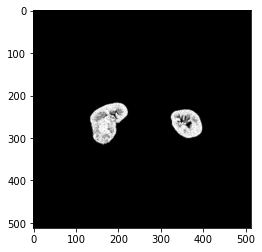

In [274]:
plt.imshow(X_test_middle[234,0,:,:],'gray')

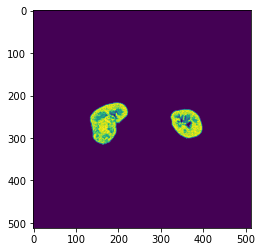

In [51]:
plt.imshow(X_test_middle[234,:,:,0])

In [100]:
len(X_test_middle)

5312

In [64]:
del train_ts, val_ts

In [104]:
try:
    X_test_middle
except NameError:
    X_test_middle=np.load("./X_test_middle.npy")
X_test_middle = np.concatenate([X_test_middle,X_test_middle,X_test_middle], axis=3)   # (5312,512, 512, 3)
print("complete X_test_middle_loading")
print(X_test_middle.shape)
X_test_middle = ToTensor(X_test_middle)
ts_X_test_middle = DataLoader(X_test_middle, shuffle=False, batch_size=1 ,num_workers=0)
print("complete loading")

complete X_test_middle_loading
(5312, 512, 512, 3)
complete loading


In [220]:

with torch.no_grad():
    # forward
    net2.eval()
    
    result = np.zeros(shape=(len(ts_X_test_middle),512,512,2))

    for batch, batch_X_test in tqdm(enumerate(ts_X_test_middle,0)):
        batch_X_test = batch_X_test.to(device)
        
        output = net2(batch_X_test)

        result[batch]=(fn_tonumpy(output))
        
        del batch_X_test
    #np.save('./aug_result',result)

5312it [07:22, 12.01it/s]


In [106]:
for i in range (5312):
    print(i)
    print(np.unique(result[i,:,:,0]))

0
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1
[-0.00701029 -0.00666759 -0.00203938 ...  0.93807888  0.93874133
  0.94220465]
2
[-0.00813835 -0.00490228 -0.00211315 ...  0.87275636  0.87298852
  0.87665993]
3
[-0.00320604 -0.00290112 -0.0017346  ...  1.01908123  1.01919556
  1.01925874]
4
[-0.03595193 -0.0290914  -0.01163362 ...  1.03755713  1.03773665
  1.03878367]
5
[-0.0335254  -0.02138794 -0.01040477 ...  1.03777194  1.03790891
  1.03884113]
6
[-0.04837655 -0.03990414 -0.0021275  ...  1.0388509   1.03909671
  1.03949761]
7
[-0.00714467 -0.00242526 -0.00221016 ...  1.03573644  1.03706849
  1.03729129]
8
[-0.03353005 -0.0247325  -0.00155073 ...  1.0402106   1.04060841
  1.04093111]
9
[-0.02511187 -0.01167546 -0.00262124 ...  1.03598654  1.03672481
  1.03692472]
10
[-0.18452048 -0.13103217 -0.1232854  ...  1.03047144  1.0307548
  1.03085923]
11
[-0.13964427 -0.13083075 -0.11587636 ...  1.01875162  1.01876688
  1.01931942]
12
[-0.11657348 -0.10288846 

[-0.05492592 -0.03177326 -0.02971445 ...  1.04283845  1.04458892
  1.06622684]
103
[-0.06518757 -0.05855743 -0.04797693 ...  1.04984629  1.05093515
  1.05171251]
104
[-0.08111969 -0.07724422 -0.05953467 ...  1.05238926  1.05589247
  1.05807829]
105
[-0.04816958 -0.04404164 -0.0264225  ...  1.05233073  1.05607879
  1.05783498]
106
[-0.05829153 -0.04597837 -0.02987276 ...  1.05486798  1.05539286
  1.06145549]
107
[-0.04805113 -0.04470536 -0.03831665 ...  1.05128026  1.05643308
  1.06040716]
108
[-0.05965326 -0.04181925 -0.03732987 ...  1.04665709  1.0466727
  1.04784608]
109
[-0.10704295 -0.09690349 -0.08648553 ...  1.05561447  1.0566777
  1.06879044]
110
[-0.0241002  -0.02376235 -0.02306469 ...  1.0599283   1.06016695
  1.06464159]
111
[-0.04362881 -0.04288957 -0.02879764 ...  1.0561024   1.06412792
  1.06977952]
112
[-0.05936817 -0.03990555 -0.03075359 ...  1.05260003  1.05325639
  1.06100452]
113
[-0.09073366 -0.06528111 -0.04661812 ...  1.05096042  1.05948579
  1.05982876]
114
[-0.07

[-0.08991341 -0.06216023 -0.04733779 ...  1.04795504  1.04999554
  1.05992508]
206
[-0.0238183  -0.01255642 -0.01005277 ...  1.04459429  1.04642236
  1.05082154]
207
[-0.11245129 -0.06148562 -0.05823963 ...  1.04217863  1.04313147
  1.04678738]
208
[-0.1777174  -0.13493051 -0.09780571 ...  1.04624283  1.04841602
  1.05425966]
209
[-0.0995736  -0.09179395 -0.08176225 ...  1.04423678  1.04661417
  1.04782462]
210
[-0.0996777  -0.07717548 -0.07110266 ...  1.0496918   1.05225492
  1.05338967]
211
[-0.11886431 -0.06879291 -0.05376213 ...  1.0490129   1.05163991
  1.05334961]
212
[-0.05098617 -0.03542173 -0.03260592 ...  1.05414748  1.05678988
  1.06036651]
213
[-0.06388822 -0.05899395 -0.04073523 ...  1.06753659  1.07065916
  1.07640576]
214
[-0.06858419 -0.03363042 -0.03204365 ...  1.06403601  1.06743526
  1.07712543]
215
[-0.07292376 -0.04116434 -0.03905597 ...  1.0564543   1.0626719
  1.06915903]
216
[-0.02611617 -0.02555197 -0.01791079 ...  1.05104816  1.05177498
  1.0540303 ]
217
[-0.0

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
310
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
311
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
312
[-0.17412744 -0.12019747 -0.11997733 ...  1.03082824  1.03097391
  1.03122699]
313
[-0.03207406 -0.02929884 -0.02424812 ...  1.02816641  1.0283134
  1.02886319]
314
[-0.08415323 -0.07065666 -0.06915557 ...  1.03152096  1.03158617
  1.03163326]
315
[-0.14758341 -0.11589411 -0.10742779 ...  1.02956104  1.02995861
  1.03012896]
316
[-0.00710297 -0.00263905 -0.00202961 ...  0.87820929  0.88934553
  0.89415091]
317
[-0.02949117 -0.00395241 -0.00286831 ...  1.03583205  1.03711343
  1.03919101]
318
[-0.0037762  -0.00289518 -0.00253067 ...  1.03347099  1.03437495
  1.03518641]
319
[-0.00164867 -0.00123768 -0.00121829 ...  0.00380311  0.0038161
  0.00409239]
320
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
321
[-0.001647

  1.05907512]
414
[-0.05506868 -0.0488426  -0.04582052 ...  1.04827189  1.0486902
  1.05907512]
415
[-0.04632879 -0.04323716 -0.0241471  ...  1.0456543   1.04691863
  1.05201495]
416
[-0.17762186 -0.16023466 -0.11296146 ...  1.04785168  1.04799449
  1.04937458]
417
[-0.15526798 -0.15114012 -0.13136765 ...  1.04487622  1.04521334
  1.04609513]
418
[-0.0470289  -0.02406988 -0.02358004 ...  1.04018831  1.04046226
  1.04056203]
419
[-0.0470289  -0.02406988 -0.02358004 ...  1.04018831  1.04046226
  1.04056203]
420
[-0.03299927 -0.0314626  -0.02884234 ...  1.04080105  1.04092038
  1.04106247]
421
[-0.10684617 -0.08311899 -0.06913331 ...  1.03939021  1.03947377
  1.04030609]
422
[-0.09595208 -0.09182027 -0.08641724 ...  1.0351876   1.03557253
  1.0356195 ]
423
[-0.02773433 -0.00887893 -0.00198304 ...  1.03658664  1.03678095
  1.03769207]
424
[-0.04198147 -0.02553571 -0.01297697 ...  0.90472496  0.910182
  0.91266078]
425
[-0.04198147 -0.02553571 -0.01297697 ...  0.90472496  0.910182
  0.91266

[-0.07766959 -0.04356496 -0.03809218 ...  1.03955877  1.03956103
  1.03959024]
522
[-0.07368323 -0.02440267 -0.01699768 ...  1.03945863  1.03961861
  1.03978455]
523
[-0.0505418  -0.03222374 -0.03028491 ...  1.03956318  1.03963602
  1.03976536]
524
[-0.02349344 -0.01948321 -0.01739963 ...  1.04032612  1.04057133
  1.0409193 ]
525
[-0.04866371 -0.04469297 -0.02800369 ...  1.04075825  1.0408107
  1.04097641]
526
[-0.07356034 -0.06049244 -0.03215628 ...  1.04731333  1.04753637
  1.05177355]
527
[-0.07478082 -0.04206896 -0.03980513 ...  1.04570687  1.04720891
  1.04761946]
528
[-0.0456467  -0.0254891  -0.01302597 ...  1.05374277  1.05557346
  1.05875409]
529
[-0.08375339 -0.05409221 -0.02792431 ...  1.05049384  1.05213475
  1.05919755]
530
[-0.02685654 -0.02211172 -0.0211008  ...  1.04851985  1.05021441
  1.05387306]
531
[-0.05849596 -0.05079492 -0.03654416 ...  1.05111206  1.05659354
  1.05895305]
532
[-0.05851011 -0.05436787 -0.02332985 ...  1.05339599  1.05356872
  1.06668186]
533
[-0.0

[-0.05635038 -0.0022401  -0.0022257  ...  1.04009819  1.04081404
  1.04108131]
627
[-0.04289502 -0.04260221 -0.00260041 ...  1.03934526  1.03940678
  1.04002011]
628
[-0.04390723 -0.04020873 -0.0019905  ...  1.03714204  1.03732371
  1.03861773]
629
[-0.00963417 -0.00768987 -0.00612102 ...  1.04005337  1.04059064
  1.04061806]
630
[-0.0779237  -0.00529333 -0.00184908 ...  1.03594267  1.03601325
  1.0366205 ]
631
[-0.00577874 -0.00192684 -0.00167185 ...  0.97954035  0.98039496
  0.98058671]
632
[-0.16119757 -0.14353533 -0.12766035 ...  0.9375596   0.9377557
  0.93965983]
633
[-0.03187955 -0.02535722 -0.02317217 ...  0.99870056  1.00030553
  1.00157237]
634
[-0.07355437 -0.05837117 -0.05584739 ...  0.60376304  0.61219168
  0.62074274]
635
[-0.06473422 -0.06416149 -0.06370211 ...  1.0146004   1.01513124
  1.01608121]
636
[-0.05313583 -0.02555973 -0.02550143 ...  1.02853322  1.02878416
  1.02881193]
637
[-0.03564955 -0.01071712 -0.00375336 ...  1.0311693   1.03169811
  1.03292406]
638
[-0.0

[-0.03909718 -0.02314973 -0.00504115 ...  1.04251945  1.04313529
  1.04904926]
734
[-0.07775456 -0.0373548  -0.02403989 ...  1.03924382  1.03955233
  1.04135227]
735
[-0.05436959 -0.04250681 -0.04098675 ...  1.03951097  1.03983986
  1.04382896]
736
[-0.02110125 -0.00820459 -0.00573178 ...  1.05331624  1.05783844
  1.0585072 ]
737
[-0.0391417  -0.02678402 -0.02597144 ...  1.04860628  1.05268705
  1.0552671 ]
738
[-0.06570125 -0.04851634 -0.0339219  ...  1.04557741  1.04702318
  1.04729974]
739
[-0.05120305 -0.03065512 -0.03039715 ...  1.04899621  1.05236757
  1.05334592]
740
[-0.05094695 -0.02642075 -0.02154642 ...  1.04587424  1.0472852
  1.04759371]
741
[-0.03513791 -0.02646354 -0.01556779 ...  1.04096723  1.04208803
  1.04213667]
742
[-0.03817827 -0.0151694  -0.0112032  ...  1.03812516  1.03820753
  1.03849292]
743
[-0.04450656 -0.02911844 -0.02768117 ...  1.03611803  1.03612328
  1.03615642]
744
[-0.02034271 -0.00791503 -0.00474256 ...  1.03738022  1.03756249
  1.03763807]
745
[-0.0

833
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
834
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
835
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
836
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
837
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
838
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
839
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
840
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
841
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
842
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
843
[-0.03963223 -0.02131992 -0.00308177 ...  1.0378232   1.03788459
  1.03884876]
844
[-0.08037138 -0.00900503 -0.00228111 ...  1.03929985  1.03948545
  1.0394907 ]
845
[-0.104430

[-0.05480972 -0.05063817 -0.04229714 ...  1.05280054  1.05505812
  1.05987155]
934
[-0.06305307 -0.06232656 -0.05441805 ...  1.05034566  1.05072129
  1.05121541]
935
[-0.0477749  -0.0247121  -0.02344598 ...  1.04944003  1.05171013
  1.05399382]
936
[-0.05253096 -0.05140432 -0.04325155 ...  1.044137    1.04492748
  1.04550827]
937
[-0.05253096 -0.05140432 -0.04325155 ...  1.044137    1.04492748
  1.04550827]
938
[-0.06538017 -0.04337003 -0.04161584 ...  1.05350327  1.05482078
  1.06544507]
939
[-0.07074693 -0.06447354 -0.02166638 ...  1.0400033   1.04003596
  1.04032326]
940
[-0.05738171 -0.04632632 -0.0306491  ...  1.03927612  1.03927636
  1.03927732]
941
[-0.05738171 -0.04632632 -0.0306491  ...  1.03927612  1.03927636
  1.03927732]
942
[-0.0654881  -0.04934744 -0.02428177 ...  1.03974164  1.03974664
  1.03993583]
943
[-0.05778952 -0.04727595 -0.03904372 ...  1.0416522   1.04190421
  1.042081  ]
944
[-0.0119763  -0.00691379 -0.00511459 ...  1.03961527  1.03973091
  1.03984201]
945
[-0.

  1.03926742]
1040
[-0.11624122 -0.07365033 -0.06748928 ...  1.03804755  1.03812528
  1.03848851]
1041
[-0.10944742 -0.08511175 -0.07679276 ...  1.03774142  1.03803301
  1.03803432]
1042
[-0.12639596 -0.1131064  -0.08766884 ...  1.03804111  1.03866708
  1.03872955]
1043
[-0.04643485 -0.04448388 -0.04205509 ...  1.03921413  1.03926313
  1.03958845]
1044
[-0.0505993  -0.02862715 -0.02850958 ...  1.03814065  1.03848207
  1.03864455]
1045
[-0.05682878 -0.04522746 -0.04296682 ...  1.03809726  1.03843105
  1.03846395]
1046
[-0.07357033 -0.0411976  -0.03644548 ...  1.03934109  1.03936422
  1.03974175]
1047
[-0.03388882 -0.03364623 -0.03228144 ...  1.03964782  1.03965139
  1.03977895]
1048
[-0.04494438 -0.03042823 -0.02792179 ...  1.03747356  1.0375762
  1.03800714]
1049
[-0.03349201 -0.03085427 -0.01804062 ...  1.03927732  1.03928947
  1.03992414]
1050
[-0.2149279  -0.14476347 -0.13610591 ...  1.03948855  1.04163158
  1.04227424]
1051
[-0.04874619 -0.04371641 -0.02340966 ...  1.03753042  1.03

[-0.04417233 -0.02602439 -0.01433993 ...  1.04246712  1.04332626
  1.043432  ]
1139
[-0.07350969 -0.03621158 -0.03533041 ...  1.0425719   1.04278731
  1.04285586]
1140
[-0.04200514 -0.04136539 -0.03341895 ...  1.04141808  1.04166281
  1.04270017]
1141
[-0.06639309 -0.05806659 -0.04854562 ...  1.0427928   1.04324448
  1.04363573]
1142
[-0.12240015 -0.0818686  -0.08005565 ...  1.04039013  1.04039478
  1.0406388 ]
1143
[-0.15293178 -0.14426635 -0.13216813 ...  1.03927135  1.03933549
  1.03952992]
1144
[-0.08825967 -0.03302723 -0.03149455 ...  1.04164076  1.04206252
  1.04303145]
1145
[-0.06462704 -0.03194173 -0.03172196 ...  1.04015875  1.04045343
  1.0406425 ]
1146
[-0.08419795 -0.07781434 -0.01263228 ...  1.03853905  1.03890121
  1.0392437 ]
1147
[-0.02485983 -0.01245009 -0.01020514 ...  1.03998756  1.04018438
  1.04043758]
1148
[-0.04555741 -0.03134247 -0.02032072 ...  1.0356698   1.03567588
  1.03568721]
1149
[-0.04317331 -0.00204486 -0.00177589 ...  1.0295527   1.03020048
  1.0304472

[-0.04227642 -0.0408539  -0.02105539 ...  1.05225599  1.0522809
  1.05244815]
1238
[-0.04227642 -0.0408539  -0.02105539 ...  1.05225599  1.0522809
  1.05244815]
1239
[-0.11675318 -0.10115179 -0.08856179 ...  1.04613709  1.04747772
  1.05814767]
1240
[-0.12752554 -0.12600802 -0.10975635 ...  1.04543221  1.0459168
  1.04741979]
1241
[-0.08361498 -0.08218493 -0.07236996 ...  1.04849136  1.04888129
  1.05211735]
1242
[-0.06704457 -0.06377651 -0.02157173 ...  1.04876053  1.04964578
  1.06133223]
1243
[-0.07163224 -0.04777471 -0.03001028 ...  1.04274249  1.04316425
  1.04801512]
1244
[-0.03426016 -0.02803622 -0.01915913 ...  1.03674841  1.03684795
  1.03694689]
1245
[-0.09839685 -0.0457872  -0.02287786 ...  1.04172456  1.04291952
  1.04583645]
1246
[-0.08787429 -0.04675739 -0.02947973 ...  1.04879797  1.04988551
  1.052158  ]
1247
[-0.07765664 -0.05818377 -0.01424262 ...  1.04579175  1.04634762
  1.04682446]
1248
[-0.02899779 -0.01887343 -0.00235221 ...  1.04866576  1.04937506
  1.05237353]


[-0.18300776 -0.16518919 -0.16290627 ...  1.03490996  1.03501129
  1.03532553]
1341
[-0.01917962 -0.01120104 -0.00397781 ...  1.02705264  1.02733064
  1.02784193]
1342
[-0.18160237 -0.15008532 -0.13088703 ...  0.22032638  0.2332999
  0.23440288]
1343
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1344
[-0.00348237 -0.0034162  -0.00340913 ...  1.00090158  1.00544
  1.00904906]
1345
[-0.04701062 -0.0349996  -0.01462566 ...  0.79888672  0.80776256
  0.81047136]
1346
[-0.00164897 -0.0012377  -0.00121826 ...  0.20737611  0.21170568
  0.26557803]
1347
[-0.00300816 -0.0026348  -0.00263321 ...  1.03011775  1.03050554
  1.03080165]
1348
[-0.01900741 -0.01831979 -0.01254991 ...  0.91709816  0.91952461
  0.91983956]
1349
[-0.0282427  -0.02741994 -0.02112433 ...  1.00224459  1.00319612
  1.00450611]
1350
[-0.04282339 -0.03959468 -0.03120247 ...  0.9631232   0.96353292
  0.9692204 ]
1351
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
135

[-0.05315896 -0.01623888 -0.01093116 ...  1.05097747  1.0513829
  1.05266654]
1446
[-0.0587188  -0.03829106 -0.0364897  ...  1.04778755  1.05111599
  1.05517745]
1447
[-0.05232225 -0.03384114 -0.01758804 ...  1.05065644  1.05080581
  1.05929494]
1448
[-0.05263938 -0.04068803 -0.02268989 ...  1.0513705   1.05137718
  1.05711782]
1449
[-0.03027441 -0.02428798 -0.00543082 ...  1.05216086  1.0580833
  1.06653666]
1450
[-0.05323405 -0.05274215 -0.04511954 ...  1.054986    1.05975246
  1.06523359]
1451
[-0.0657741  -0.04095083 -0.02942253 ...  1.05018234  1.05021918
  1.05322897]
1452
[-0.0655665  -0.02503498 -0.003285   ...  1.04246712  1.0425154
  1.0457449 ]
1453
[-0.03131822 -0.01785036 -0.01558631 ...  1.03976524  1.03991985
  1.0404129 ]
1454
[-0.06324625 -0.05015758 -0.04303128 ...  1.03959227  1.03968513
  1.03978992]
1455
[-0.04620405 -0.04232033 -0.04230546 ...  1.03804719  1.03814125
  1.03951895]
1456
[-0.01240709 -0.00859184 -0.00846733 ...  1.03881729  1.03892326
  1.03942919]


[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1544
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1545
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1546
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1547
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1548
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1549
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1550
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1551
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1552
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1553
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1554
[-0.00168637 -0.00150591 -0.0013937  ...  0.98585963  0.9859212
  0.9872002 ]
1555
[-0.

[-0.08598012 -0.05581919 -0.04434903 ...  1.05522883  1.05609334
  1.06184936]
1643
[-0.08009459 -0.07772774 -0.03542596 ...  1.05561149  1.05577493
  1.05613983]
1644
[-0.05186371 -0.03491214 -0.03233761 ...  1.06043673  1.06062806
  1.06449544]
1645
[-0.04861565 -0.03467148 -0.0342636  ...  1.05499244  1.05586934
  1.05939436]
1646
[-0.04759485 -0.03082978 -0.00310915 ...  1.05294251  1.05318999
  1.0536021 ]
1647
[-0.06320995 -0.02972314 -0.02725749 ...  1.04649174  1.04756105
  1.05253565]
1648
[-0.06926095 -0.05059981 -0.04242997 ...  1.04766965  1.04776645
  1.05133867]
1649
[-0.05781246 -0.04976252 -0.04546087 ...  1.04307377  1.04455519
  1.05220497]
1650
[-0.05433751 -0.04958923 -0.04797279 ...  1.04339147  1.04444683
  1.04646969]
1651
[-0.08196425 -0.074036   -0.07325149 ...  1.04306102  1.04333043
  1.04356039]
1652
[-0.05379489 -0.02385119 -0.02382375 ...  1.04287267  1.04290462
  1.04303217]
1653
[-0.05101455 -0.03351471 -0.01964059 ...  1.04109359  1.04138255
  1.0417389

[-0.04264832 -0.04010441 -0.03463833 ...  1.05486786  1.05942833
  1.06116521]
1745
[-0.03703523 -0.03611529 -0.02683156 ...  1.05537963  1.05583012
  1.05983937]
1746
[-0.05364793 -0.03892772 -0.00222431 ...  1.05594623  1.05696917
  1.05772972]
1747
[-0.06212286 -0.02933579 -0.0186289  ...  1.06338763  1.06785893
  1.06812537]
1748
[-0.03601505 -0.01994174 -0.01318531 ...  1.04993892  1.05078661
  1.06485105]
1749
[-0.05512716 -0.04815552 -0.04761484 ...  1.05382359  1.057971
  1.05813766]
1750
[-0.04139392 -0.03810684 -0.03594814 ...  1.04314375  1.04648089
  1.05446863]
1751
[-0.06261791 -0.03374083 -0.024711   ...  1.05274022  1.05336964
  1.05535078]
1752
[-0.07826507 -0.05680856 -0.04629154 ...  1.05042875  1.05221033
  1.05259752]
1753
[-0.04078405 -0.03703688 -0.0315272  ...  1.04699206  1.05068672
  1.05899584]
1754
[-0.07638624 -0.05216846 -0.04986254 ...  1.04429853  1.04586971
  1.04846668]
1755
[-0.16656022 -0.05771868 -0.0526217  ...  1.05069602  1.05178106
  1.05697203]

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1850
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1851
[-0.1402199  -0.04349241 -0.03103341 ...  1.03386557  1.03388119
  1.03438056]
1852
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1853
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1854
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1855
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1856
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1857
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1858
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1859
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1860
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
1861
[-0

[-0.05980431 -0.05231242 -0.04803993 ...  1.06370914  1.07159221
  1.07160401]
1948
[-0.16721117 -0.04162586 -0.03617845 ...  1.057616    1.0577563
  1.06498873]
1949
[-0.04791762 -0.04316348 -0.0399007  ...  1.06006432  1.06063664
  1.06287956]
1950
[-0.07557361 -0.07284386 -0.03671594 ...  1.0557853   1.05647838
  1.05881429]
1951
[-0.06459837 -0.03208742 -0.03083771 ...  1.05893838  1.06467223
  1.07906175]
1952
[-0.05947686 -0.05858329 -0.04523716 ...  1.05997479  1.06741321
  1.07450473]
1953
[-0.07228918 -0.02569573 -0.01129202 ...  1.05514824  1.05621862
  1.05736363]
1954
[-0.06528959 -0.06221114 -0.0567869  ...  1.05222821  1.05334973
  1.05702269]
1955
[-0.07010499 -0.06076178 -0.0599684  ...  1.05249739  1.05521798
  1.0574646 ]
1956
[-0.058148   -0.05195547 -0.04648152 ...  1.05231631  1.0527246
  1.05674064]
1957
[-0.04964042 -0.03726983 -0.03505318 ...  1.05325556  1.05446851
  1.06621492]
1958
[-0.05377841 -0.04338356 -0.03246758 ...  1.05144858  1.05258787
  1.06153917]

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2047
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2048
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2049
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2050
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2051
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2052
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2053
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2054
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2055
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2056
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2057
[-0.00180026 -0.00177274 -0.00173732 ...  1.01334238  1.01352632
  1.01439989]
2058
[-0

[-0.06132914 -0.04105702 -0.03466344 ...  1.05309534  1.05354655
  1.05960548]
2145
[-0.06132914 -0.04105702 -0.03466344 ...  1.05309534  1.05354655
  1.05960548]
2146
[-0.02757639 -0.02401313 -0.01852242 ...  1.0404098   1.04044497
  1.04129887]
2147
[-0.07097936 -0.05421853 -0.04960038 ...  1.0538137   1.0558337
  1.06339037]
2148
[-0.04348712 -0.04059291 -0.03881128 ...  1.05733109  1.06137085
  1.06359613]
2149
[-0.06039358 -0.04467712 -0.04464814 ...  1.04786444  1.04834068
  1.0510217 ]
2150
[-0.0441247  -0.01096432 -0.00802887 ...  1.0436312   1.04456127
  1.04513443]
2151
[-0.05050028 -0.04459719 -0.04001155 ...  1.04843521  1.04859626
  1.05541611]
2152
[-0.02256078 -0.01338569 -0.00966812 ...  1.06378818  1.06482458
  1.0676887 ]
2153
[-0.0570271  -0.04653331 -0.0320228  ...  1.05882239  1.06342506
  1.06792068]
2154
[-0.05885701 -0.03157927 -0.01461364 ...  1.05693984  1.05790949
  1.06369627]
2155
[-0.07825643 -0.04043614 -0.0308838  ...  1.05828762  1.06396019
  1.06977403

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2245
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2246
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2247
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2248
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2249
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2250
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2251
[-0.06331053 -0.05747514 -0.03698611 ...  1.03343296  1.03377473
  1.03387046]
2252
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2253
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2254
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2255
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2256
[-0

  1.0474118 ]
2344
[-0.04729753 -0.03706587 -0.03093024 ...  1.04380584  1.04404736
  1.05365193]
2345
[-0.04534059 -0.02917785 -0.02143946 ...  1.04984975  1.05205977
  1.05576289]
2346
[-0.12709546 -0.06892134 -0.05870486 ...  1.03962839  1.03968167
  1.03986132]
2347
[-0.01717274 -0.01644326 -0.00592608 ...  1.04257643  1.05055785
  1.05116773]
2348
[-0.0187513  -0.01510778 -0.01341937 ...  1.0407604   1.04272473
  1.04454339]
2349
[-0.05478726 -0.03509933 -0.02948786 ...  1.03969944  1.04075134
  1.04729843]
2350
[-0.06051343 -0.02627777 -0.01400756 ...  1.03810787  1.03888118
  1.03902423]
2351
[-0.02517688 -0.01777889 -0.01531052 ...  1.03479886  1.03485656
  1.03498507]
2352
[-0.04134057 -0.03068544 -0.01255529 ...  1.03696716  1.03713679
  1.03737485]
2353
[-0.04134057 -0.03068544 -0.01255529 ...  1.03696716  1.03713679
  1.03737485]
2354
[-0.03367832 -0.03002912 -0.00222135 ...  1.03715825  1.03722084
  1.03739095]
2355
[-0.03129573 -0.02603297 -0.00300399 ...  1.03483021  1.0

[-0.06053125 -0.04056084 -0.01084517 ...  1.04359424  1.04487669
  1.04889512]
2446
[-0.07323675 -0.06793781 -0.06135013 ...  1.03883302  1.03942597
  1.04030287]
2447
[-0.03074937 -0.01556214 -0.00388894 ...  1.04874933  1.04986179
  1.06158912]
2448
[-0.04568461 -0.03101873 -0.01904193 ...  1.04680562  1.04965341
  1.05545115]
2449
[-0.02013718 -0.0179206  -0.01474981 ...  1.05702329  1.05849087
  1.06266975]
2450
[-0.02972323 -0.02710078 -0.02076694 ...  1.05515051  1.06503928
  1.06875122]
2451
[-0.04395682 -0.02769738 -0.01851685 ...  1.05293143  1.0535512
  1.05695212]
2452
[-0.04313876 -0.020012   -0.00508805 ...  1.06113362  1.06326818
  1.06387353]
2453
[-0.06734575 -0.05080773 -0.03932126 ...  1.06574917  1.06614029
  1.06636775]
2454
[-0.07327016 -0.03006239 -0.0203835  ...  1.04876757  1.05199277
  1.05394959]
2455
[-0.11252016 -0.05273124 -0.0458294  ...  1.05450475  1.05459976
  1.05486023]
2456
[-0.04718745 -0.04279115 -0.03850926 ...  1.0535078   1.05410433
  1.05486977

[-0.04637382 -0.03351108 -0.01847308 ...  1.05084682  1.05154252
  1.05236483]
2548
[-0.00545545 -0.00359413 -0.00356338 ...  1.04554176  1.04559982
  1.04798138]
2549
[-0.05874329 -0.05768724 -0.01810989 ...  1.04637325  1.04714119
  1.053038  ]
2550
[-0.07054286 -0.05347632 -0.00363462 ...  1.04488945  1.0449326
  1.05554223]
2551
[-0.07314382 -0.00566694 -0.00243772 ...  1.04326355  1.04347908
  1.04375422]
2552
[-0.04310809 -0.01844314 -0.0141136  ...  1.04226649  1.04228675
  1.04352009]
2553
[-0.02978947 -0.01943294 -0.01623128 ...  1.04165757  1.04207003
  1.04348099]
2554
[-0.02829351 -0.00198178 -0.00179027 ...  1.04148078  1.0415194
  1.042184  ]
2555
[-0.06278975 -0.05265024 -0.04827324 ...  1.04007375  1.04080927
  1.04106426]
2556
[-0.05349849 -0.01548413 -0.01334477 ...  1.0417217   1.04273701
  1.04286706]
2557
[-0.05449044 -0.03116269 -0.01843536 ...  1.03936946  1.03975439
  1.03996849]
2558
[-0.00159979 -0.00159498 -0.00155109 ...  0.97439015  0.97523218
  0.97586232]

[-0.02288192 -0.01948546 -0.0167166  ...  1.05215847  1.05378282
  1.05477262]
2653
[-0.04255138 -0.03938505 -0.00828126 ...  1.05232489  1.05316687
  1.05667448]
2654
[-0.05501119 -0.04503682 -0.03803477 ...  1.05511594  1.05681241
  1.05945206]
2655
[-0.06619377 -0.04016677 -0.02424265 ...  1.04821229  1.0482434
  1.05978334]
2656
[-0.06667115 -0.04680474 -0.03632443 ...  1.05045998  1.05218434
  1.05457532]
2657
[-0.04409546 -0.03427179 -0.02863968 ...  1.05290771  1.05813825
  1.06399512]
2658
[-0.04575773 -0.04229808 -0.04224314 ...  1.05341291  1.0595001
  1.0666976 ]
2659
[-0.04879757 -0.03747354 -0.03186902 ...  1.05178726  1.0525533
  1.05317342]
2660
[-0.05074606 -0.00393337 -0.00261805 ...  1.06050479  1.06054175
  1.06315362]
2661
[-0.06003456 -0.0152113  -0.00836278 ...  1.05280066  1.05695832
  1.06114411]
2662
[-0.0358132  -0.01159589 -0.009288   ...  1.048087    1.04835713
  1.04843616]
2663
[-0.05153951 -0.04818146 -0.03859392 ...  1.0519942   1.05370343
  1.05389559]


  0.00381551]
2755
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2756
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2757
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2758
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2759
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2760
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2761
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2762
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2763
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2764
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2765
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2766
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2861
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2862
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2863
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2864
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2865
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2866
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2867
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2868
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2869
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2870
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2871
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
2872
[-0.

  1.03749466]
2964
[-0.0494742  -0.00488224 -0.00223746 ...  1.03908956  1.03914618
  1.03915918]
2965
[-0.08025047 -0.07487188 -0.03796318 ...  1.03858101  1.03859305
  1.03909695]
2966
[-0.04337286 -0.0429267  -0.03553677 ...  1.04805291  1.04995716
  1.05209064]
2967
[-0.07900846 -0.05422371 -0.04306099 ...  1.05457795  1.05539536
  1.05825055]
2968
[-0.04825348 -0.01787739 -0.01299873 ...  1.0452013   1.04579031
  1.04825449]
2969
[-0.06277457 -0.04705038 -0.04332547 ...  1.06366432  1.06465459
  1.07270348]
2970
[-0.06042968 -0.04774906 -0.04463834 ...  1.05274677  1.06084466
  1.06159806]
2971
[-0.04115727 -0.0251414  -0.01738166 ...  1.04725432  1.04947484
  1.05048382]
2972
[-0.05542416 -0.0550242  -0.03744094 ...  1.04596305  1.04680574
  1.05040789]
2973
[-0.0563131  -0.0262419  -0.0219316  ...  1.05168629  1.05255079
  1.06031537]
2974
[-0.04535749 -0.04196528 -0.04133591 ...  1.04935288  1.04971159
  1.05523622]
2975
[-0.04053319 -0.03894996 -0.02655112 ...  1.04932308  1.0

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3069
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3070
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3071
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3072
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3073
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3074
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3075
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3076
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3077
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3078
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3079
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3080
[-0.

[-0.03141664 -0.02671675 -0.02537065 ...  1.0404228   1.04105389
  1.04125869]
3174
[-0.02695086 -0.01743067 -0.00668372 ...  1.03855598  1.0386852
  1.03939509]
3175
[-0.07394287 -0.04314276 -0.0288821  ...  1.04712474  1.0488441
  1.05303907]
3176
[-0.09930025 -0.06706868 -0.05185473 ...  1.04599214  1.04829085
  1.05066729]
3177
[-0.04258453 -0.03219978 -0.01601535 ...  1.04468036  1.04526854
  1.04539025]
3178
[-0.06866914 -0.05492136 -0.0510339  ...  1.04091859  1.04097283
  1.04157186]
3179
[-0.05021005 -0.00268238 -0.00212202 ...  1.04144287  1.04161
  1.04249847]
3180
[-0.07928309 -0.05256457 -0.01538728 ...  1.04077721  1.04101801
  1.0412128 ]
3181
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3182
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3183
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3184
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3185
[

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3281
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3282
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3283
[-0.02632238 -0.00169681 -0.00156227 ...  0.99809402  0.99817598
  0.99902201]
3284
[-0.03837036 -0.00197869 -0.00179919 ...  1.03910613  1.03912532
  1.03917444]
3285
[-0.03827129 -0.00989167 -0.00822517 ...  1.03958547  1.03977263
  1.039958  ]
3286
[-0.05629552 -0.04884753 -0.04461536 ...  1.03926957  1.03957534
  1.03961086]
3287
[-0.0608985  -0.05680502 -0.05052539 ...  1.03910482  1.03927994
  1.03934336]
3288
[-0.03301505 -0.02479367 -0.01944486 ...  1.03999639  1.04018617
  1.04129052]
3289
[-0.04644158 -0.02070086 -0.00386116 ...  1.04283869  1.04427409
  1.04488897]
3290
[-0.05996213 -0.05182758 -0.03162867 ...  1.04793882  1.05030859
  1.06644344]
3291
[-0.06788889 -0.0322477  -0.02280095 ...  1.04308915  1.04333544
  1.04577947]


[-0.05030559 -0.02468511 -0.00192022 ...  1.03776109  1.03785765
  1.03791606]
3384
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3385
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3386
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3387
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3388
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3389
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3390
[-0.02460426 -0.01288868 -0.01206869 ...  1.03186631  1.0319109
  1.03251219]
3391
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3392
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3393
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3394
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3395
[-0

[-0.05302482 -0.03507938 -0.03210675 ...  1.05323231  1.05402029
  1.06080759]
3488
[-0.0881636  -0.0421723  -0.03203581 ...  1.05422378  1.05455351
  1.06110096]
3489
[-0.0422782  -0.03746869 -0.02535668 ...  1.05376863  1.05612743
  1.07199347]
3490
[-0.05113242 -0.04459306 -0.0263578  ...  1.05239797  1.05714166
  1.05806589]
3491
[-0.04429066 -0.04379719 -0.02262009 ...  1.05057383  1.05475521
  1.062235  ]
3492
[-0.05452741 -0.04577564 -0.0437578  ...  1.04309988  1.04576433
  1.04858732]
3493
[-0.03969937 -0.03672332 -0.03624816 ...  1.0465914   1.04941201
  1.04984629]
3494
[-0.05875828 -0.05077465 -0.03846034 ...  1.03935647  1.03945637
  1.03971684]
3495
[-0.05945655 -0.01475073 -0.01381369 ...  1.03914952  1.03937912
  1.0401355 ]
3496
[-0.02852073 -0.02420632 -0.01998788 ...  1.03889489  1.03891683
  1.0392065 ]
3497
[-0.10249135 -0.0938831  -0.08592977 ...  1.0338459   1.03385913
  1.0340035 ]
3498
[-0.02043798 -0.00854286 -0.00836726 ...  1.03451693  1.03452289
  1.0345244

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3592
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3593
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3594
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3595
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3596
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3597
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3598
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3599
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3600
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3601
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3602
[-0.00210551 -0.00169109 -0.00162438 ...  0.98289257  0.9831199
  0.98340368]
3603
[-0.

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3695
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3696
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3697
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3698
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3699
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3700
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3701
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3702
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3703
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3704
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3705
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3706
[-0.

[-0.20331386 -0.1619145  -0.14269252 ...  1.04074657  1.04118347
  1.04284847]
3798
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3799
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3800
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3801
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3802
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3803
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3804
[-0.02935471 -0.02017517 -0.01428672 ...  0.77028745  0.77800471
  0.79547101]
3805
[-0.00556866 -0.00484787 -0.00411509 ...  1.02322447  1.02473283
  1.02526331]
3806
[-0.16022831 -0.15337366 -0.15265051 ...  1.03813267  1.03815734
  1.03835952]
3807
[-0.15013964 -0.11739299 -0.10747617 ...  1.03454232  1.03556776
  1.03625643]
3808
[-0.05159451 -0.04786241 -0.00617092 ...  1.0466522   1.04741073
  1.05073297]
380

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
3900
[-0.00377472 -0.00190293 -0.00185798 ...  0.94065988  0.94136113
  0.94203937]
3901
[-0.00165153 -0.00159023 -0.0012382  ...  0.88250506  0.88612592
  0.89000654]
3902
[-0.02687124 -0.01689881 -0.00754119 ...  0.81752723  0.82064545
  0.827052  ]
3903
[-0.10957919 -0.08890983 -0.08864415 ...  0.91197962  0.9127124
  0.91274852]
3904
[-0.00166946 -0.00142356 -0.00134179 ...  0.92643452  0.92756212
  0.92845422]
3905
[-0.00200557 -0.00169633 -0.00166139 ...  0.92978221  0.93007296
  0.93152326]
3906
[-0.05376064 -0.00231152 -0.00162542 ...  0.99866158  1.00060081
  1.00070703]
3907
[-0.02921554 -0.00248911 -0.00192218 ...  1.0103085   1.01084518
  1.0111208 ]
3908
[-0.1206477  -0.03901    -0.03674566 ...  1.03598678  1.03602755
  1.03626049]
3909
[-0.01404914 -0.01127611 -0.00234911 ...  1.03553629  1.03565764
  1.03615224]
3910
[-0.01933286 -0.01103565 -0.00592406 ...  1.03906107  1.03924036
  1.03983927]

[-0.16947386 -0.15241262 -0.13236929 ...  1.04780197  1.0498054
  1.05122793]
4003
[-0.19615705 -0.18009682 -0.16827418 ...  1.03906012  1.0390836
  1.03945422]
4004
[-0.14262277 -0.135846   -0.12974264 ...  1.03881514  1.03893006
  1.03913057]
4005
[-0.13939595 -0.11973105 -0.10393685 ...  1.03905523  1.03953493
  1.0401746 ]
4006
[-0.14149009 -0.1299278  -0.12352844 ...  1.03755176  1.0377506
  1.03790152]
4007
[-0.12342995 -0.1097832  -0.10040709 ...  1.0415163   1.04346025
  1.04604065]
4008
[-0.16265987 -0.16259263 -0.15361932 ...  1.04130673  1.04135704
  1.0422188 ]
4009
[-0.10314696 -0.05719788 -0.05540062 ...  1.0430907   1.04398549
  1.04420793]
4010
[-0.05624113 -0.04530954 -0.01548672 ...  1.04140759  1.04177666
  1.04215884]
4011
[-0.00363359 -0.0027825  -0.00268159 ...  1.03817558  1.0387044
  1.03878534]
4012
[-0.00410048 -0.00330018 -0.00290649 ...  1.03834701  1.0386517
  1.03904319]
4013
[-0.03128897 -0.01034026 -0.00769415 ...  1.02764213  1.0283525
  1.02901292]
401

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4103
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4104
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4105
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4106
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4107
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4108
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4109
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4110
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4111
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4112
[-0.00259283 -0.00167634 -0.00149845 ...  0.96946627  0.9721514
  0.97433764]
4113
[-0.10147052 -0.09758119 -0.09112905 ...  0.24039744  0.2586562
  0.26779765]
4114
[-0.

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4204
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4205
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4206
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4207
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4208
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4209
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4210
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4211
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4212
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4213
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4214
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4215
[-0.

  1.04027808]
4305
[-0.04062046 -0.03272768 -0.02691587 ...  1.03994787  1.03998137
  1.0405426 ]
4306
[-0.04012284 -0.02824541 -0.02345641 ...  1.04591739  1.04596758
  1.04638636]
4307
[-0.06560396 -0.06315304 -0.04996479 ...  1.04819894  1.05071533
  1.05241525]
4308
[-0.07452179 -0.02609145 -0.02499093 ...  1.04436851  1.04459524
  1.04598105]
4309
[-0.04541171 -0.03508297 -0.01877997 ...  1.04719305  1.04736423
  1.04812741]
4310
[-0.04527467 -0.03653294 -0.03481149 ...  1.0486505   1.06534982
  1.06768334]
4311
[-0.04360997 -0.03379522 -0.02225356 ...  1.06041765  1.06120849
  1.07029247]
4312
[-0.02926357 -0.02590239 -0.02121667 ...  1.0437597   1.04449534
  1.04686379]
4313
[-0.09428656 -0.03770149 -0.02723985 ...  1.05358791  1.05369186
  1.06357729]
4314
[-0.04198265 -0.03528044 -0.01332775 ...  1.05228007  1.05502772
  1.06205499]
4315
[-0.08006145 -0.04060937 -0.02375795 ...  1.06028557  1.06050336
  1.07930148]
4316
[-0.06670024 -0.04847462 -0.0360921  ...  1.05154634  1.0

[-0.02741857 -0.01412811 -0.01344639 ...  1.03977036  1.03979409
  1.0398246 ]
4406
[-0.03546803 -0.00692668 -0.00638175 ...  1.0403372   1.04086769
  1.04116189]
4407
[-0.0762143  -0.02206281 -0.02178748 ...  1.03909624  1.03916383
  1.0393343 ]
4408
[-0.06158863 -0.05230353 -0.0418786  ...  1.03943801  1.03957593
  1.03968871]
4409
[-0.0019951  -0.00194556 -0.00184614 ...  1.03862011  1.03868437
  1.03905404]
4410
[-0.01300371 -0.00196037 -0.00193903 ...  1.0396136   1.0397805
  1.04010236]
4411
[-0.04320497 -0.03743558 -0.01368211 ...  1.03883779  1.03908074
  1.04009759]
4412
[-0.06925856 -0.01190636 -0.00664068 ...  1.03866565  1.03880501
  1.03994453]
4413
[-0.06324795 -0.01604134 -0.01095458 ...  1.0384531   1.03852808
  1.0386349 ]
4414
[-0.06028801 -0.00274958 -0.00231404 ...  1.03900313  1.03905618
  1.03905904]
4415
[-0.09711953 -0.03746096 -0.01413488 ...  1.03447628  1.03571153
  1.0357188 ]
4416
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]

[-0.13328935 -0.12360829 -0.11234887 ...  1.04991364  1.05365944
  1.06582475]
4506
[-0.13995734 -0.11221148 -0.08823052 ...  1.05258942  1.053599
  1.05844545]
4507
[-0.2128717  -0.17721014 -0.15419602 ...  1.05097759  1.05279386
  1.05371594]
4508
[-0.21975093 -0.16891678 -0.16656202 ...  1.05047369  1.05515003
  1.05729723]
4509
[-0.07605903 -0.07387437 -0.07254125 ...  1.05051661  1.05148482
  1.05478346]
4510
[-0.07921475 -0.07893613 -0.07445477 ...  1.05513716  1.05648816
  1.05913579]
4511
[-0.12650648 -0.12059791 -0.11692107 ...  1.04356122  1.04782701
  1.05053842]
4512
[-0.05901503 -0.02457837 -0.02394467 ...  1.05529034  1.05796683
  1.07190979]
4513
[-0.04557768 -0.03563816 -0.03276655 ...  1.04880857  1.04890871
  1.05186164]
4514
[-0.05937185 -0.05376486 -0.0279777  ...  1.04818833  1.05040526
  1.05075014]
4515
[-0.1193365  -0.06967747 -0.0527146  ...  1.05234098  1.05308628
  1.05495381]
4516
[-0.15027478 -0.13660745 -0.13501433 ...  1.04778588  1.04843068
  1.05391026]

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4605
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4606
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4607
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4608
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4609
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4610
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4611
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4612
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4613
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4614
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4615
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4616
[-0.

[-0.07342511 -0.04272176 -0.04013043 ...  1.05681098  1.05790353
  1.05810583]
4704
[-0.07127458 -0.03947299 -0.03809467 ...  1.05692244  1.05915666
  1.06008875]
4705
[-0.10019517 -0.09213503 -0.08716613 ...  1.06056869  1.06338382
  1.06837475]
4706
[-0.05885446 -0.04936815 -0.04871625 ...  1.04714167  1.04937911
  1.05376267]
4707
[-0.059608   -0.05207286 -0.05064666 ...  1.06515694  1.06569171
  1.07179356]
4708
[-0.04080943 -0.04063503 -0.03088231 ...  1.06067669  1.06083155
  1.06469762]
4709
[-0.08433488 -0.04647098 -0.03878817 ...  1.05486023  1.05880356
  1.06626952]
4710
[-0.05104562 -0.01435587 -0.00882041 ...  1.04509258  1.04538119
  1.04735851]
4711
[-0.06585257 -0.0477446  -0.04546368 ...  1.05316281  1.0571115
  1.05722892]
4712
[-0.07343316 -0.05718321 -0.05702231 ...  1.04358494  1.04483426
  1.04511261]
4713
[-0.05357404 -0.04446313 -0.04190989 ...  1.04296243  1.04317319
  1.04341817]
4714
[-0.13164903 -0.04618254 -0.03024929 ...  1.0462507   1.04710424
  1.05535197

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4802
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4803
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4804
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4805
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4806
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4807
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4808
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4809
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4810
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4811
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4812
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
4813
[-0.

4907
[-0.03872532 -0.03536979 -0.03040226 ...  1.04252589  1.04554391
  1.04709435]
4908
[-0.09328182 -0.03780765 -0.03196904 ...  1.0459832   1.04723454
  1.05042052]
4909
[-0.03014356 -0.01893765 -0.01795622 ...  1.04178178  1.04269731
  1.04353321]
4910
[-0.05285815 -0.03598285 -0.03332376 ...  1.04040647  1.04073155
  1.04097879]
4911
[-0.02767661 -0.02075035 -0.02060222 ...  1.04030275  1.04056919
  1.04057825]
4912
[-0.04612515 -0.02501022 -0.01894101 ...  1.03900981  1.0393796
  1.03966153]
4913
[-0.042711   -0.01887696 -0.01255927 ...  1.03918076  1.03959811
  1.03990698]
4914
[-0.06714039 -0.050003   -0.01904076 ...  1.04013944  1.04056919
  1.04124951]
4915
[-0.06146743 -0.04980264 -0.04568942 ...  1.04087758  1.04172516
  1.04176581]
4916
[-0.00766356 -0.00182376 -0.00176995 ...  1.04104102  1.04157901
  1.04165995]
4917
[-0.0573657  -0.03287979 -0.01195069 ...  1.03971517  1.03981781
  1.04027593]
4918
[-0.02554114 -0.00360131 -0.00353637 ...  1.03842473  1.03848505
  1.038

[-0.00430446 -0.00169724 -0.00147035 ...  1.03605676  1.03619266
  1.03620565]
5008
[-0.01664717 -0.00190228 -0.00168045 ...  1.03408146  1.03423655
  1.03438914]
5009
[-0.01664717 -0.00190228 -0.00168045 ...  1.03408146  1.03423655
  1.03438914]
5010
[-0.04386668 -0.02327063 -0.00961714 ...  1.0385344   1.038885
  1.03933334]
5011
[-0.00529179 -0.00197767 -0.00187816 ...  1.03717649  1.03721869
  1.03772676]
5012
[-0.01444557 -0.01315911 -0.00375386 ...  1.04388273  1.0458504
  1.04851937]
5013
[-0.05130753 -0.04525051 -0.00542825 ...  1.04726696  1.04771328
  1.06199491]
5014
[-0.05340514 -0.01975727 -0.01886718 ...  1.03876698  1.03902042
  1.04042101]
5015
[-0.04316519 -0.04027701 -0.03003357 ...  1.03689206  1.0369432
  1.03717482]
5016
[-0.03290992 -0.00775644 -0.00753818 ...  1.04008293  1.04069614
  1.04239035]
5017
[-0.13293217 -0.12652266 -0.12114254 ...  1.04417431  1.04417765
  1.04610705]
5018
[-0.14345586 -0.12527512 -0.12344626 ...  1.05281067  1.05561328
  1.05761826]
5

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
5106
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
5107
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
5108
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
5109
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
5110
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
5111
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
5112
[-0.04375178 -0.03993874 -0.03882409 ...  0.9100697   0.91177982
  0.91180962]
5113
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
5114
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
5115
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
5116
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
5117
[-0

[-0.01589894 -0.00331442 -0.0032473  ...  1.04412889  1.04589117
  1.05186701]
5208
[-0.03653385 -0.03389566 -0.03064753 ...  1.05159378  1.05363321
  1.05641055]
5209
[-0.03557527 -0.01184863 -0.01176709 ...  1.04054916  1.04203928
  1.04666376]
5210
[-0.02766414 -0.01940626 -0.00988378 ...  1.03884411  1.03975964
  1.0409894 ]
5211
[-0.08900109 -0.05768583 -0.052804   ...  1.04093564  1.04250991
  1.04408908]
5212
[-0.1108844  -0.07552259 -0.05448187 ...  1.04064345  1.04171205
  1.04264176]
5213
[-0.12161924 -0.12099358 -0.08585985 ...  1.03928554  1.03936565
  1.03985453]
5214
[-0.08677503 -0.07300426 -0.0677124  ...  1.05618489  1.0586127
  1.06149924]
5215
[-0.05403063 -0.04422383 -0.03329054 ...  1.04887855  1.05071795
  1.05107999]
5216
[-0.07565743 -0.02927503 -0.02544332 ...  1.05845392  1.05920291
  1.06394601]
5217
[-0.06510583 -0.044275   -0.03084789 ...  1.05492139  1.05674446
  1.05793726]
5218
[-0.03461162 -0.02994777 -0.01764626 ...  1.05184722  1.0548507
  1.06374788]

[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
5307
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
5308
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]
5309
[-0.04312989 -0.02849746 -0.01766687 ...  1.01928532  1.02113521
  1.02130878]
5310
[-0.00477787 -0.00432213 -0.00394271 ...  0.68866217  0.70427173
  0.71682203]
5311
[-0.00164781 -0.00123756 -0.00121856 ...  0.00327231  0.0034513
  0.00381551]


In [107]:
for i in range (5312):
    print(i)
    print(np.unique(result[i,:,:,1]))

0
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1
[-0.00939781 -0.00749313 -0.00607744 ...  0.85326767  0.86988831
  0.87946391]
2
[-1.21422121e-02 -5.46058640e-03 -1.94643147e-03 ...  1.98212934e+00
  2.00361991e+00  2.01007986e+00]
3
[-0.0214922  -0.01880575 -0.01793667 ...  0.10863005  0.10902143
  0.11039063]
4
[-0.02821725 -0.02616612 -0.02581736 ...  0.03311756  0.03914794
  0.04473436]
5
[-0.03144527 -0.02911785 -0.02577602 ...  0.05032767  0.05417043
  0.05591751]
6
[-0.02926103 -0.02245908 -0.02239648 ...  0.06101585  0.06173833
  0.06191514]
7
[-0.0307433  -0.02850172 -0.02665633 ...  0.40808722  0.41261852
  0.42341921]
8
[-0.03016159 -0.02653939 -0.02580178 ...  0.06630089  0.06754884
  0.0701761 ]
9
[-0.03092148 -0.02905038 -0.028163   ...  2.26716137  2.27990198
  2.28228068]
10
[-0.02851983 -0.02631452 -0.02483731 ...  3.1224122   3.12735176
  3.13295054]
11
[-0.0541694  -0.04500854 -0.03018199 ...  3.15493059  3.1

[-0.04606926 -0.04487052 -0.04351087 ...  2.53673553  2.54066968
  2.5638454 ]
107
[-0.05393618 -0.05376244 -0.05264973 ...  2.98077154  2.98126006
  2.98190999]
108
[-0.05197347 -0.050607   -0.04734897 ...  2.94439125  2.94489861
  2.95153975]
109
[-0.05541844 -0.05346571 -0.04331651 ...  3.13443995  3.13502574
  3.13754153]
110
[-0.05293753 -0.03664998 -0.03289443 ...  0.67189425  0.68476886
  0.6954931 ]
111
[-0.04882675 -0.04833253 -0.03707322 ...  2.80900884  2.81905365
  2.8351748 ]
112
[-0.04814082 -0.04543328 -0.0402974  ...  1.68322229  1.7545774
  1.77513993]
113
[-0.04107383 -0.03829566 -0.03701437 ...  0.12555024  0.53514475
  0.62457389]
114
[-0.03164387 -0.03137265 -0.03083611 ...  1.10231316  1.13260412
  1.14740038]
115
[-0.03020468 -0.02978011 -0.02949352 ...  3.03645658  3.04305792
  3.04451513]
116
[-0.04205169 -0.0327202  -0.03140667 ...  2.73529482  2.74052167
  2.75698566]
117
[-0.04416712 -0.03847338 -0.0367375  ...  3.09289694  3.09337926
  3.09416366]
118
[-0.0

[-0.03588764 -0.03272382 -0.03245126 ...  0.04261312  0.04271359
  0.0452458 ]
206
[-0.04692559 -0.03533525 -0.03184097 ...  2.58292794  2.58454776
  2.59722304]
207
[-0.05856501 -0.04592636 -0.03927564 ...  2.99730706  3.00382161
  3.00506783]
208
[-0.05931579 -0.0544451  -0.04907573 ...  3.09732032  3.09748936
  3.09981322]
209
[-0.04800807 -0.04637014 -0.04384497 ...  3.08367848  3.08675981
  3.0868454 ]
210
[-0.04561837 -0.04246671 -0.04064623 ...  3.09474826  3.09643817
  3.10485744]
211
[-0.03722107 -0.03642388 -0.03383487 ...  3.05771995  3.05812144
  3.06607866]
212
[-0.04196178 -0.03982098 -0.03686963 ...  3.02527952  3.02761769
  3.02830052]
213
[-0.06309868 -0.0553141  -0.05115351 ...  0.93799627  0.94672048
  0.9768123 ]
214
[-0.05107749 -0.04671676 -0.0464212  ...  2.31344962  2.32661247
  2.3289566 ]
215
[-0.05875192 -0.05862353 -0.05811682 ...  0.16438927  0.25874618
  0.29658774]
216
[-0.04615925 -0.04589475 -0.04467347 ...  0.58885074  0.59116149
  0.5945062 ]
217
[-0.

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
304
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
305
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
306
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
307
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
308
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
309
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
310
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
311
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
312
[-0.02907628 -0.02401323 -0.02346874 

[-0.03679937 -0.03644761 -0.03440493 ...  0.15628344  0.16201043
  0.16415019]
404
[-0.03903663 -0.03641472 -0.03453948 ...  0.47123045  0.4753606
  0.49606499]
405
[-0.04493479 -0.04294905 -0.04238266 ...  2.96322513  2.96599102
  2.96998382]
406
[-0.03532434 -0.03191629 -0.03050719 ...  0.84221107  0.85431415
  0.86290544]
407
[-0.04842548 -0.0482801  -0.0433147  ...  0.06120367  0.06157774
  0.07637776]
408
[-0.04842548 -0.0482801  -0.0433147  ...  0.06120367  0.06157774
  0.07637776]
409
[-0.04638217 -0.04154608 -0.04114573 ...  0.38402992  0.38477251
  0.3945218 ]
410
[-0.03595606 -0.03484781 -0.03364284 ...  0.08738375  0.08940125
  0.09248975]
411
[-0.05653092 -0.05620544 -0.05523663 ...  0.31643358  0.3251057
  0.33213729]
412
[-0.04787899 -0.0454006  -0.04230685 ...  0.04128158  0.04263926
  0.04326297]
413
[-0.05226177 -0.04996553 -0.04886274 ...  0.04791585  0.04953978
  0.05159117]
414
[-0.05226177 -0.04996553 -0.04886274 ...  0.04791585  0.04953978
  0.05159117]
415
[-0.04

[-0.059497   -0.04413959 -0.04326602 ...  0.67875415  0.68508363
  0.71809351]
495
[-0.04059708 -0.03649417 -0.03637277 ...  2.36465979  2.36693168
  2.38707638]
496
[-0.04076865 -0.03877057 -0.03790662 ...  0.06321799  0.06396064
  0.0656314 ]
497
[-0.04978445 -0.04080217 -0.03767117 ...  0.07526702  0.07538805
  0.07578252]
498
[-0.04067114 -0.03643265 -0.03083195 ...  0.08077905  0.08230241
  0.08513457]
499
[-0.04067114 -0.03643265 -0.03083195 ...  0.08077905  0.08230241
  0.08513457]
500
[-0.02749467 -0.02725479 -0.02584168 ...  0.92927206  0.95872384
  0.9681229 ]
501
[-0.03364324 -0.03070359 -0.02795792 ...  2.10328698  2.1532495
  2.16164494]
502
[-0.02970397 -0.02776826 -0.02746329 ...  2.1218791   2.12540007
  2.16648149]
503
[-0.02970397 -0.02776826 -0.02746329 ...  2.1218791   2.12540007
  2.16648149]
504
[-0.01946947 -0.01235543 -0.01024254 ...  1.78752971  1.81118298
  1.81683898]
505
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1

[-0.03097838 -0.03054377 -0.03018544 ...  0.49263436  0.56358165
  0.84185839]
592
[-0.03308707 -0.02945439 -0.02830245 ...  0.07134118  0.08595567
  0.1438386 ]
593
[-0.03252012 -0.03243667 -0.03137406 ...  0.92883116  0.93620944
  1.10194814]
594
[-0.04104834 -0.03761178 -0.03684955 ...  0.32735974  0.38009152
  0.40258288]
595
[-0.05389983 -0.05182157 -0.04405996 ...  0.31180069  0.42120552
  0.65835887]
596
[-0.04851292 -0.04496197 -0.04438133 ...  0.08960009  0.08979512
  0.09030439]
597
[-0.0661697  -0.06053735 -0.05950668 ...  0.06720348  0.06731649
  0.06738356]
598
[-0.05258016 -0.04900095 -0.04729454 ...  0.04361701  0.04544877
  0.04556291]
599
[-0.06661497 -0.05702599 -0.05609329 ...  0.1900222   0.19085509
  0.1948989 ]
600
[-0.06378202 -0.05680414 -0.05547864 ...  0.05146315  0.05317533
  0.05538602]
601
[-0.05113629 -0.04890925 -0.04729528 ...  0.0382277   0.04192486
  0.04502914]
602
[-0.05366145 -0.052479   -0.05160963 ...  0.04973935  0.04999468
  0.05687848]
603
[-0.

[-0.02924191 -0.02836564 -0.0207192  ...  0.04023656  0.04063592
  0.04340534]
690
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
691
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
692
[-0.02756196 -0.02406855 -0.0208379  ...  0.06506369  0.06844523
  0.06975171]
693
[-0.02733293 -0.02664316 -0.02543581 ...  0.05206593  0.05330474
  0.05350496]
694
[-0.0378455  -0.02475868 -0.02166327 ...  0.12798335  0.13908505
  0.14890751]
695
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
696
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
697
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
698
[-0.01892988 -0.00962024 -0.00472504 ...  0.56662089  0.71953946
  0.72358555]
699
[-5.91569114e-05 -5.47554810e-05 -5.39429020e-05 .

[-0.01515801 -0.00472965 -0.00278952 ...  0.15939297  0.16054997
  0.16142766]
780
[-0.02687188 -0.02490162 -0.02287933 ...  0.05265475  0.05433882
  0.0659708 ]
781
[-0.0278119  -0.02631769 -0.02554663 ...  0.04618569  0.04685619
  0.0570097 ]
782
[-0.03383663 -0.0330147  -0.02792004 ...  0.04081978  0.04380586
  0.05383835]
783
[-0.03306245 -0.03232631 -0.02871311 ...  0.03669731  0.03800579
  0.03884704]
784
[-0.03077721 -0.02955875 -0.02954526 ...  0.07377593  0.07380562
  0.07480573]
785
[-0.03584431 -0.03109925 -0.03045662 ...  0.03043629  0.03234931
  0.04353495]
786
[-0.03316728 -0.03242474 -0.03170812 ...  0.03540731  0.0376787
  0.04358472]
787
[-0.03112891 -0.02958616 -0.02874694 ...  0.60836124  0.63999367
  0.77108169]
788
[-0.03583264 -0.03343356 -0.03189854 ...  0.03318121  0.03337741
  0.03431696]
789
[-0.05161402 -0.05126321 -0.05080428 ...  0.04160767  0.0420412
  0.05007138]
790
[-0.04670422 -0.04611307 -0.04561825 ...  0.03366947  0.03490743
  0.03628689]
791
[-0.04

[-0.05412349 -0.05277508 -0.05083488 ...  0.0964855   0.09664764
  0.10157832]
876
[-0.05732403 -0.05617082 -0.05397579 ...  0.04278601  0.04463072
  0.04508641]
877
[-0.03739704 -0.03465898 -0.03247231 ...  0.02724619  0.02825027
  0.03068718]
878
[-0.03418651 -0.03416033 -0.03287746 ...  0.04928153  0.05044351
  0.05134837]
879
[-0.03666162 -0.03362066 -0.03096491 ...  0.02585408  0.02665654
  0.02923387]
880
[-0.03412778 -0.03188695 -0.02845066 ...  0.03178679  0.03179903
  0.03181852]
881
[-0.04049006 -0.03462911 -0.0312317  ...  0.02989674  0.02996398
  0.03266978]
882
[-0.03393319 -0.03196433 -0.02794687 ...  0.02886574  0.0295103
  0.0311504 ]
883
[-0.03114008 -0.03051841 -0.02994674 ...  0.04222834  0.04362517
  0.04501225]
884
[-0.02729751 -0.02623391 -0.02342136 ...  0.02779668  0.02942467
  0.03238995]
885
[-0.02089339 -0.01907901 -0.01779686 ...  0.07085209  0.07957704
  0.08134297]
886
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1

[-0.02130167 -0.01663085 -0.01384767 ...  0.15592812  0.17696159
  0.31514382]
965
[-0.04472768 -0.0359188  -0.03111365 ...  2.92179084  2.98585606
  3.01388836]
966
[-0.04472768 -0.0359188  -0.03111365 ...  2.92179084  2.98585606
  3.01388836]
967
[-0.04177097 -0.02760343 -0.02085356 ...  0.16986182  0.19553944
  0.2767714 ]
968
[-0.02561286 -0.0249693  -0.02107883 ...  0.08281769  0.08665469
  0.08691869]
969
[-0.02016417 -0.01957444 -0.01910089 ...  0.21297243  0.26236331
  0.31564939]
970
[-0.02659562 -0.02519653 -0.02501518 ...  0.15014224  0.15251292
  0.15418261]
971
[-0.02970314 -0.02769083 -0.02683782 ...  0.67247021  0.84253067
  1.03173578]
972
[-0.02970314 -0.02769083 -0.02683782 ...  0.67247021  0.84253067
  1.03173578]
973
[-0.03919339 -0.03864717 -0.02800418 ...  0.45700964  0.53525627
  0.60852712]
974
[-0.03030075 -0.02890617 -0.02715707 ...  0.31448221  0.41572046
  0.88369519]
975
[-0.05220795 -0.04834081 -0.04454987 ...  0.7173692   0.77053988
  0.93949264]
976
[-0.

[-0.05097715 -0.03078224 -0.03017708 ...  0.0873162   0.08823999
  0.08970788]
1063
[-0.04795138 -0.03297115 -0.03215533 ...  0.05178097  0.05236914
  0.05428416]
1064
[-0.03356153 -0.02880798 -0.02771626 ...  0.48323777  0.49763444
  0.50912011]
1065
[-0.03447298 -0.03276571 -0.0324003  ...  0.54101139  0.5672251
  0.57723528]
1066
[-0.03591798 -0.03306787 -0.02798718 ...  0.15667608  0.16339642
  0.16580226]
1067
[-0.04098737 -0.02820282 -0.02636408 ...  0.29345167  0.29419252
  0.30408433]
1068
[-0.0305843  -0.02985441 -0.0295441  ...  0.47855026  0.48715377
  0.49213684]
1069
[-0.02705329 -0.02663246 -0.02352718 ...  0.89961571  0.9019708
  0.9055047 ]
1070
[-0.02824983 -0.02574378 -0.02345958 ...  1.29896426  1.31702423
  1.32989347]
1071
[-0.0513261  -0.03589779 -0.03002702 ...  1.89361906  1.94570374
  1.9849664 ]
1072
[-0.02871724 -0.02675948 -0.02602533 ...  0.88801473  0.91734767
  0.9193325 ]
1073
[-0.029674   -0.02817626 -0.02721692 ...  0.17835891  0.17870113
  0.18040849]

[-0.03523635 -0.03352005 -0.02821339 ...  0.02940132  0.03079198
  0.0308101 ]
1164
[-0.03491588 -0.03120213 -0.0304785  ...  0.02886837  0.02975578
  0.02993776]
1165
[-0.03728984 -0.03076546 -0.03042366 ...  0.0405002   0.04163176
  0.04309971]
1166
[-0.03447696 -0.03304248 -0.0301718  ...  0.07151122  0.0726473
  0.07503685]
1167
[-0.03625094 -0.03559659 -0.03005148 ...  0.04753504  0.05205569
  0.05428391]
1168
[-0.0355865  -0.02939892 -0.02821412 ...  0.0348448   0.035489
  0.03846607]
1169
[-0.03690728 -0.032894   -0.02994022 ...  0.08324724  0.08655904
  0.08831984]
1170
[-0.03288202 -0.03231712 -0.03195725 ...  0.0343922   0.03544293
  0.04195707]
1171
[-0.04042671 -0.03159226 -0.02871095 ...  0.02955853  0.03102454
  0.03103876]
1172
[-0.03232306 -0.03201391 -0.03118455 ...  0.03112416  0.03269934
  0.03348588]
1173
[-0.0319788  -0.03187974 -0.0316523  ...  0.0605819   0.06297852
  0.0711641 ]
1174
[-0.03382377 -0.03294539 -0.03244619 ...  0.03855545  0.04054711
  0.04158942]


[-0.030844   -0.02992902 -0.02807016 ...  2.80558753  2.80967641
  2.82017684]
1261
[-0.03259816 -0.03012585 -0.02960001 ...  2.8166256   2.81759334
  2.82476616]
1262
[-0.03414037 -0.02952268 -0.02862578 ...  0.0944776   0.09650066
  0.09821779]
1263
[-0.03589987 -0.03359779 -0.03260849 ...  0.02956069  0.03259102
  0.03650976]
1264
[-0.03264799 -0.03106964 -0.03027615 ...  0.03839192  0.04171916
  0.0444387 ]
1265
[-0.03540658 -0.02562758 -0.02560083 ...  3.15715456  3.15751719
  3.16233683]
1266
[-0.03073265 -0.02898985 -0.02888754 ...  3.15074348  3.1526773
  3.15303135]
1267
[-0.03920452 -0.03746034 -0.03360044 ...  3.06449389  3.06526256
  3.06527567]
1268
[-0.03585513 -0.03510119 -0.03467953 ...  3.13627601  3.1367197
  3.13731527]
1269
[-0.03175599 -0.03077205 -0.03044418 ...  0.80625194  0.83814192
  0.90787774]
1270
[-0.03058667 -0.02713141 -0.02576419 ...  0.03582852  0.03760035
  0.04709075]
1271
[-0.03616036 -0.03210509 -0.03192354 ...  0.04055302  0.04156211
  0.04809516]

[-0.03247996 -0.03072289 -0.02653334 ...  0.06851337  0.0711803
  0.07314099]
1365
[-0.02851885 -0.02657017 -0.02637334 ...  0.04072928  0.0412862
  0.04286655]
1366
[-0.03205578 -0.03052566 -0.03050566 ...  0.15473305  0.15559506
  0.15935126]
1367
[-0.02696472 -0.02502094 -0.02448464 ...  0.08629881  0.08689677
  0.08794851]
1368
[-0.03815958 -0.03634269 -0.03419478 ...  0.21564224  0.26991639
  0.28726694]
1369
[-0.04109156 -0.03537067 -0.0340463  ...  0.05397288  0.05599656
  0.05752121]
1370
[-0.05139875 -0.04531723 -0.04206488 ...  1.3969841   1.40483117
  1.41859972]
1371
[-0.05394879 -0.0472619  -0.04527035 ...  3.03212214  3.03265929
  3.03375411]
1372
[-0.04441951 -0.03944803 -0.03814511 ...  3.02223301  3.02236056
  3.02317762]
1373
[-0.05568095 -0.053841   -0.05034874 ...  2.69311666  2.69856477
  2.74010348]
1374
[-0.06415464 -0.06339663 -0.05447906 ...  0.0784862   0.0800973
  0.08994306]
1375
[-0.04805378 -0.0464526  -0.04109029 ...  0.04854706  0.0488873
  0.05970977]
1

[-0.02829249 -0.02411188 -0.02163671 ...  0.05597659  0.06030909
  0.06216944]
1465
[-0.03264896 -0.02431988 -0.02359206 ...  0.07225037  0.07265431
  0.07393495]
1466
[-0.01527481 -0.01480102 -0.01235127 ...  0.19216102  0.19729306
  0.20027815]
1467
[-6.89413818e-03 -4.94048093e-03 -4.08669002e-05 ...  8.04874480e-01
  8.22297454e-01  8.30827057e-01]
1468
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1469
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1470
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1471
[-8.30282457e-03 -6.00953819e-03 -6.40194979e-04 ...  7.41186976e-01
  8.53419304e-01  8.67760181e-01]
1472
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1473
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-0

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1552
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1553
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1554
[-0.0293117  -0.00964886 -0.00245924 ...  0.12932923  0.13028678
  0.13064402]
1555
[-0.02806075 -0.0267838  -0.0266079  ...  0.05535804  0.05544637
  0.06078882]
1556
[-0.0253559  -0.02412028 -0.02372694 ...  0.42549512  0.59268433
  0.59289962]
1557
[-0.02883576 -0.02478394 -0.02470106 ...  0.27417544  0.27537227
  0.3202669 ]
1558
[-0.03044012 -0.02811797 -0.024823   ...  0.14979932  0.15380995
  0.15533645]
1559
[-0.03392797 -0.02902754 -0.02700873 ...  0.09529469  0.09769132
  0.09855556]
1560
[-0.02638509 -0.02605225 -0.0253115  ...  2.25357842  2.2667079
  2.27235198]
1561
[-0.03147978 -0.02843448 -0.02752731 ...  1.88343501  1.88675725
  1.93152952]
1562
[-0.0

[-0.04211793 -0.03760644 -0.03473193 ...  0.03600363  0.03635455
  0.03812461]
1648
[-0.04101866 -0.03931097 -0.03521953 ...  0.05497725  0.05502166
  0.05596597]
1649
[-0.03290093 -0.03260025 -0.03196054 ...  0.08205821  0.08234987
  0.08640368]
1650
[-0.04461123 -0.03462733 -0.03379378 ...  0.09040897  0.09277424
  0.0970218 ]
1651
[-0.03712563 -0.03272048 -0.03253904 ...  0.08599854  0.08757912
  0.09152853]
1652
[-0.04468574 -0.03819047 -0.03293155 ...  0.03446023  0.0344998
  0.03468483]
1653
[-0.03821072 -0.0331365  -0.03205898 ...  0.030464    0.03078263
  0.03476033]
1654
[-0.03916207 -0.03843428 -0.03272597 ...  0.0294715   0.03154679
  0.03525975]
1655
[-0.03792621 -0.03680045 -0.03442976 ...  0.03125976  0.03252034
  0.035852  ]
1656
[-0.03335838 -0.03307131 -0.03055441 ...  0.02839619  0.02903277
  0.03012319]
1657
[-0.04173056 -0.03365641 -0.0330354  ...  0.03308589  0.03335275
  0.03430482]
1658
[-0.03524316 -0.03280983 -0.02964113 ...  0.04497337  0.04583829
  0.04876039

[-0.05775774 -0.05676875 -0.05193168 ...  0.03861963  0.04491647
  0.04728809]
1746
[-0.06775146 -0.05857306 -0.05504968 ...  0.04239931  0.04375771
  0.0478037 ]
1747
[-0.04970222 -0.04414626 -0.04373601 ...  0.08181384  0.08246467
  0.08444728]
1748
[-0.06045738 -0.05970547 -0.05405852 ...  0.29305655  0.29491204
  0.2971139 ]
1749
[-0.04805756 -0.04528018 -0.043979   ...  0.05330638  0.0564795
  0.05934481]
1750
[-0.0611826  -0.06074201 -0.05957254 ...  0.150383    0.1504171
  0.1516189 ]
1751
[-0.04493843 -0.04295851 -0.03822915 ...  0.04121731  0.04137925
  0.04209234]
1752
[-0.04343183 -0.04220635 -0.04102362 ...  0.05557338  0.06169774
  0.06473807]
1753
[-0.05418275 -0.04891357 -0.04801042 ...  0.08702614  0.08764719
  0.09022974]
1754
[-0.04245377 -0.04193123 -0.03966687 ...  1.32881796  1.34118867
  1.34542871]
1755
[-0.05741225 -0.05481173 -0.05438799 ...  2.95133185  2.96201229
  2.96980715]
1756
[-0.05203316 -0.04853499 -0.04759418 ...  3.09297609  3.09394097
  3.09558201]

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1842
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1843
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1844
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1845
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1846
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1847
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1848
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1849
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
1850
[-4.09292988e-05 -3.92629299

  3.06015086]
1940
[-0.05449342 -0.05301811 -0.0490757  ...  3.03741837  3.04179716
  3.04397845]
1941
[-0.05544016 -0.05177233 -0.04880167 ...  3.05241227  3.05857825
  3.06518888]
1942
[-0.0484588  -0.04793243 -0.04562254 ...  2.54905748  2.55665445
  2.55673242]
1943
[-0.04913323 -0.04638275 -0.0452613  ...  2.23515081  2.24053979
  2.27153826]
1944
[-0.06329849 -0.0553181  -0.05356571 ...  0.07903969  0.08127937
  0.08129802]
1945
[-0.05605068 -0.05276393 -0.05185138 ...  0.10656013  0.10754933
  0.11141147]
1946
[-0.04925667 -0.04606037 -0.0451536  ...  0.38646558  0.38724428
  0.40133044]
1947
[-0.05318125 -0.05202893 -0.05030122 ...  0.10937404  0.1118395
  0.11626399]
1948
[-0.06990191 -0.06032981 -0.05535571 ...  0.08563779  0.0879031
  0.09724626]
1949
[-0.06363437 -0.06171066 -0.05878055 ...  0.0445465   0.04465989
  0.04595378]
1950
[-0.06569792 -0.06049529 -0.05972377 ...  0.05326207  0.05413153
  0.05484015]
1951
[-0.06140166 -0.05859057 -0.05854896 ...  0.54038984  0.561

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2041
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2042
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2043
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2044
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2045
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2046
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2047
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2048
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2049
[-4.09292988e-05 -3.92629299

[-0.03648428 -0.03520176 -0.0296385  ...  3.17968488  3.18809223
  3.1963017 ]
2136
[-0.05032513 -0.04428714 -0.0402581  ...  3.15747643  3.15869999
  3.15949011]
2137
[-0.03863761 -0.03839846 -0.0357207  ...  3.17622399  3.17641664
  3.17663002]
2138
[-0.03144639 -0.03066329 -0.02915933 ...  3.20003343  3.20286798
  3.20295238]
2139
[-0.05470807 -0.0443812  -0.0367863  ...  3.21629572  3.21983194
  3.22279477]
2140
[-0.05408406 -0.05406385 -0.05176382 ...  3.2027781   3.20333147
  3.21066213]
2141
[-0.06095708 -0.05448493 -0.05151007 ...  3.23546243  3.23753166
  3.25030613]
2142
[-0.05573202 -0.0506321  -0.04831866 ...  3.2089324   3.21130776
  3.21754527]
2143
[-0.05012132 -0.04882086 -0.03635697 ...  3.14400625  3.14508867
  3.14678955]
2144
[-0.03812406 -0.03762687 -0.0348412  ...  3.13863158  3.14056921
  3.14101672]
2145
[-0.03812406 -0.03762687 -0.0348412  ...  3.13863158  3.14056921
  3.14101672]
2146
[-0.05576448 -0.0463673  -0.04213664 ...  0.5803681   0.58408195
  0.5884353

[-0.03079797 -0.028551   -0.02713509 ...  0.02458536  0.02467286
  0.02497282]
2234
[-0.0250042  -0.02460249 -0.02077898 ...  0.05102002  0.05107501
  0.05598396]
2235
[-0.01628733 -0.00973431 -0.00695726 ...  0.36870927  0.37345374
  0.37495935]
2236
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2237
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2238
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2239
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2240
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2241
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2242
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-0

[-0.05485461 -0.05217845 -0.05009708 ...  2.98609996  2.98749399
  2.99098206]
2331
[-0.05155912 -0.04964678 -0.04522698 ...  3.09441161  3.09452772
  3.09983301]
2332
[-0.04974118 -0.04599557 -0.04278554 ...  3.04023719  3.04028273
  3.04477215]
2333
[-0.05905317 -0.05285946 -0.05123269 ...  3.09723711  3.09832501
  3.10082316]
2334
[-0.05275528 -0.04780269 -0.04722285 ...  3.0514071   3.05269361
  3.05480409]
2335
[-0.05187214 -0.05097349 -0.04880047 ...  3.10683322  3.10738468
  3.10835004]
2336
[-0.05416942 -0.04959103 -0.04942762 ...  3.06321597  3.06371117
  3.06737256]
2337
[-0.05416942 -0.04959103 -0.04942762 ...  3.06321597  3.06371117
  3.06737256]
2338
[-0.04537642 -0.04438275 -0.04400782 ...  3.09802532  3.10230565
  3.10412669]
2339
[-0.04991288 -0.04436912 -0.04252806 ...  2.26384521  2.26685333
  2.29175162]
2340
[-0.03852145 -0.03798642 -0.03713499 ...  2.37529516  2.39305472
  2.40614104]
2341
[-0.06441969 -0.05174362 -0.04391396 ...  0.28004348  0.31552836
  0.3245484

2425
[-0.03147043 -0.02989522 -0.02844505 ...  0.08138978  0.08170601
  0.08255388]
2426
[-0.03628526 -0.03495789 -0.02909885 ...  0.05478565  0.0560942
  0.05733521]
2427
[-0.03609306 -0.03150041 -0.02982503 ...  0.03894478  0.05322107
  0.05410246]
2428
[-0.02705739 -0.02327202 -0.02283117 ...  0.56395561  0.5692479
  0.60480213]
2429
[-0.02605685 -0.02448252 -0.0243973  ...  0.07898667  0.08012635
  0.08650155]
2430
[-0.02915006 -0.02683381 -0.02417594 ...  0.15594828  0.15649331
  0.16074026]
2431
[-0.02559834 -0.01949565 -0.01911542 ...  0.04867555  0.05236975
  0.05699326]
2432
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2433
[-0.00537626 -0.00535207 -0.00526235 ...  0.12830798  0.13208215
  0.13342077]
2434
[-0.01329308 -0.01240425 -0.01203044 ...  0.07559896  0.07589506
  0.07602475]
2435
[-0.02160513 -0.02007177 -0.01943284 ...  0.05859165  0.05875704
  0.06667052]
2436
[-0.02633602 -0.0263172  -0.02159977 ...  0.04866

[-0.05585116 -0.05392198 -0.05337296 ...  2.20348334  2.20845819
  2.21338677]
2524
[-0.05842188 -0.05572005 -0.05428224 ...  1.11766958  1.16985202
  1.19319892]
2525
[-0.05771883 -0.04978454 -0.04943603 ...  0.07555138  0.0762836
  0.0843765 ]
2526
[-0.05213594 -0.04721713 -0.04692561 ...  0.07429597  0.07464202
  0.07605269]
2527
[-0.04214811 -0.04211149 -0.03745726 ...  0.05506133  0.05645749
  0.06109493]
2528
[-0.04982495 -0.04447107 -0.04293025 ...  0.05463617  0.0549185
  0.05611832]
2529
[-0.05938889 -0.05493066 -0.05184951 ...  0.05155756  0.05328583
  0.06274548]
2530
[-0.06737059 -0.06070276 -0.05859205 ...  0.06912603  0.06963093
  0.09632234]
2531
[-0.06890485 -0.06558593 -0.05703054 ...  1.2782557   1.28212225
  1.34032071]
2532
[-0.05250809 -0.04517277 -0.04375664 ...  0.47557935  0.4858855
  0.48710459]
2533
[-0.06339087 -0.05433918 -0.05273151 ...  0.25861806  0.26848683
  0.38961372]
2534
[-0.06084597 -0.06031143 -0.0596408  ...  0.05430161  0.05446341
  0.05773336]


[-0.03545724 -0.03087385 -0.02863568 ...  0.05231781  0.05348609
  0.05378062]
2623
[-0.02541375 -0.02449025 -0.01654605 ...  0.0677691   0.0696543
  0.07118808]
2624
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2625
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2626
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2627
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2628
[-0.03048881 -0.02985834 -0.02877262 ...  0.21006566  0.23940983
  0.27474278]
2629
[-0.05908382 -0.04966703 -0.04294437 ...  0.06520437  0.06897224
  0.08282159]
2630
[-0.03861191 -0.03339526 -0.02960802 ...  0.04357818  0.04431646
  0.06287966]
2631
[-0.03743353 -0.03726984 -0.03602852 ...  0.10788941  0.1090074
  0.11263652]
2632
[-0.024822   -0.02460171 -0.02376277 ...  0.25695211  0.26345819
 

[-0.04134763 -0.03778114 -0.03381727 ...  3.09702253  3.09717607
  3.10568905]
2720
[-0.03391188 -0.03120581 -0.03116939 ...  3.03257918  3.03509021
  3.04233956]
2721
[-0.0355242  -0.03451174 -0.03024652 ...  3.09881687  3.10066652
  3.10277748]
2722
[-0.03629214 -0.03400998 -0.02876957 ...  3.09383607  3.09529519
  3.10248971]
2723
[-0.04926779 -0.04247955 -0.0352045  ...  3.11601782  3.11779857
  3.11789393]
2724
[-0.0486978  -0.03762822 -0.0330248  ...  3.14343572  3.14650941
  3.16468954]
2725
[-0.03208738 -0.02888575 -0.02795129 ...  3.1265204   3.12716651
  3.12872624]
2726
[-0.0344221  -0.03199161 -0.031836   ...  3.11987305  3.12029433
  3.1267097 ]
2727
[-0.04621095 -0.03864687 -0.02731323 ...  3.13427997  3.13448095
  3.1410017 ]
2728
[-0.03855289 -0.02858938 -0.02779729 ...  3.13435555  3.13712597
  3.13832474]
2729
[-0.05555916 -0.05070769 -0.04224719 ...  3.12738442  3.13000536
  3.14007092]
2730
[-0.03031585 -0.02848435 -0.02752648 ...  3.14781022  3.14831424
  3.1484046

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2813
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2814
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2815
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2816
[-0.02201325 -0.02106638 -0.01125019 ...  0.07173832  0.08472075
  0.18347022]
2817
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2818
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2819
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2820
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2821
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2896
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2897
[-0.01219521 -0.01147615 -0.00541585 ...  0.08545382  0.08548346
  0.09002785]
2898
[-0.02454668 -0.02391292 -0.02141568 ...  0.08501968  0.09015019
  0.09459554]
2899
[-0.02991809 -0.02651414 -0.02630176 ...  0.07639036  0.0773184
  0.07749392]
2900
[-0.03239551 -0.02849763 -0.02789045 ...  0.0526985   0.05326156
  0.05643447]
2901
[-0.03146509 -0.03105316 -0.02889986 ...  0.03835592  0.03869456
  0.03950773]
2902
[-0.03986502 -0.03111192 -0.02790752 ...  1.00830448  1.01771033
  1.05629349]
2903
[-0.03253559 -0.03090062 -0.03027401 ...  0.0438284   0.04733721
  0.04834827]
2904
[-0.03570388 -0.03231164 -0.03116436 ...  1.24090779  1.25327134
  1.29666877]
2905
[-0.04762705 -0.04279399 -0.03236434 ...  3.05580735  3.05672741
  3.05800867]
2906
[-0.03455403 -0.03429119 -0.0

  1.27651896e-02  1.32665737e-02]
2987
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2988
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2989
[-0.02322928 -0.0136863  -0.01173526 ...  1.49825835  1.5240258
  1.53055716]
2990
[-0.03100862 -0.02490392 -0.02474735 ...  0.09127663  0.09523825
  0.10453999]
2991
[-5.98858902e-03 -5.63248666e-03 -6.51044538e-05 ...  2.49473274e-01
  2.82416552e-01  3.51800978e-01]
2992
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2993
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2994
[-0.01060795 -0.00941685 -0.00838552 ...  2.3411088   2.35119104
  2.3741293 ]
2995
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
2996
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.577314

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3082
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3083
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3084
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3085
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3086
[-0.03490434 -0.03061829 -0.02854165 ...  0.12386077  0.12670684
  0.25270888]
3087
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3088
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3089
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3090
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...

[-0.03671648 -0.03497288 -0.03425075 ...  1.01158082  1.03679228
  1.06971323]
3171
[-0.03586698 -0.03430423 -0.03406169 ...  0.07657493  0.07733255
  0.0778779 ]
3172
[-0.03432458 -0.03261597 -0.03227523 ...  0.05336361  0.05428228
  0.05517405]
3173
[-0.03587687 -0.03582859 -0.03398714 ...  0.13323361  0.13462414
  0.22484198]
3174
[-0.0499439  -0.04686477 -0.044997   ...  0.05577503  0.05761264
  0.06239062]
3175
[-0.03738588 -0.03561703 -0.03186255 ...  0.04605419  0.05094966
  0.05961795]
3176
[-0.03804279 -0.03634196 -0.03359056 ...  3.06212902  3.06280518
  3.06565285]
3177
[-0.03665217 -0.0333906  -0.03214346 ...  2.87984514  2.88202024
  2.8857739 ]
3178
[-0.03146795 -0.03075157 -0.02987596 ...  3.04934645  3.05132556
  3.05166245]
3179
[-0.03842007 -0.03366635 -0.03276212 ...  0.02813694  0.02931388
  0.03388419]
3180
[-0.03131706 -0.02465188 -0.02354039 ...  0.02919883  0.03717298
  0.03917054]
3181
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.276

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3262
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3263
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3264
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3265
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3266
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3267
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3268
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3269
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3270
[-4.09292988e-05 -3.92629299

3350
[-0.03157868 -0.03102322 -0.02920709 ...  0.07226287  0.0794905
  0.08035796]
3351
[-0.03302357 -0.03041583 -0.02992477 ...  0.06810349  0.07100312
  0.07212602]
3352
[-0.05102896 -0.03704257 -0.03494474 ...  0.04242621  0.04311207
  0.04517335]
3353
[-0.05490933 -0.05041769 -0.04216783 ...  0.1063742   0.1109704
  0.12815717]
3354
[-0.05222415 -0.04866676 -0.04435837 ...  3.05749011  3.06022191
  3.06053257]
3355
[-0.04959698 -0.04795584 -0.04075592 ...  0.03795854  0.03823065
  0.0382439 ]
3356
[-0.03985938 -0.03546747 -0.03539365 ...  0.05086071  0.05154345
  0.05202494]
3357
[-0.04074557 -0.0403868  -0.03891693 ...  2.0290916   2.0314908
  2.04192972]
3358
[-0.0406426  -0.03351154 -0.03264363 ...  2.95592546  2.96675706
  2.96902657]
3359
[-0.04709687 -0.03465123 -0.02953717 ...  2.86538339  2.86552167
  2.8785274 ]
3360
[-0.03872629 -0.03752304 -0.03699959 ...  0.40974784  0.41190165
  0.41294375]
3361
[-0.03254988 -0.03090617 -0.03031241 ...  0.13114797  0.13761973
  0.14248

[-1.63361232e-03 -8.35742918e-04 -5.84932277e-05 ...  1.59596130e-01
  1.62266865e-01  1.67992115e-01]
3441
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3442
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3443
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3444
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3445
[-9.17369034e-05 -8.62682937e-05 -8.20700079e-05 ...  1.94234550e-01
  2.08077967e-01  2.41235882e-01]
3446
[-0.02152977 -0.02108837 -0.01556831 ...  0.11021479  0.11545144
  0.12076136]
3447
[-0.00592947 -0.00489309 -0.00267753 ...  0.16818264  0.17348248
  0.17642444]
3448
[-1.45474942e-02 -1.91495602e-03 -5.06752054e-04 ...  2.53279901e+00
  2.54092288e+00  2.54788876e+00]
3449
[-0.02180477 -0.01924502 -0.00895819 ...  0.66240066  0.66440058
  0.6720312

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3531
[-0.02822617 -0.02630227 -0.02454532 ...  0.0996227   0.09975495
  0.1161802 ]
3532
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3533
[-0.0211672  -0.02073123 -0.0179713  ...  0.12813103  0.13783748
  0.14489764]
3534
[-0.02780278 -0.01692024 -0.01663811 ...  0.36210695  0.49091545
  0.50498194]
3535
[-0.02532158 -0.02512726 -0.02510069 ...  0.15492155  0.16067718
  0.17685579]
3536
[-0.02494123 -0.02261458 -0.02224264 ...  0.21760823  0.2456069
  0.24813493]
3537
[-0.02644577 -0.02320429 -0.01786232 ...  0.14219137  0.14541934
  0.14901842]
3538
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3539
[-0.02203744 -0.0069042  -0.00645892 ...  0.45927405  0.47843876
  0.52988338]
3540
[-0.019177   -0.01840155 -0.01811974 ...  0.0438257   0.04442805
  0.04753819]
3541
[-4.0

[-0.0413001  -0.03812381 -0.03741386 ...  0.12398632  0.13504705
  0.13826576]
3619
[-0.04689002 -0.04316504 -0.03843089 ...  0.74531782  0.7975083
  0.83785921]
3620
[-0.05283103 -0.03730201 -0.03623001 ...  2.09479141  2.10595798
  2.15898585]
3621
[-0.04362151 -0.035418   -0.03208114 ...  2.69048691  2.69404745
  2.70081043]
3622
[-0.02939741 -0.02625216 -0.02544644 ...  2.14121628  2.17293501
  2.17508388]
3623
[-0.03134028 -0.02886835 -0.02503712 ...  2.84061909  2.84113145
  2.84166551]
3624
[-0.01756408 -0.01673664 -0.01642608 ...  3.00717711  3.00843978
  3.00862527]
3625
[-0.01702876 -0.01228586 -0.01147329 ...  2.44825602  2.4538722
  2.46553874]
3626
[-4.78370534e-03 -2.77821999e-03 -4.54894034e-05 ...  5.21654308e-01
  6.69264793e-01  7.26650178e-01]
3627
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3628
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3629
[-4.09

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3710
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3711
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3712
[-0.03256638 -0.02996036 -0.02827566 ...  0.04705875  0.04722466
  0.04794136]
3713
[-0.03256638 -0.02996036 -0.02827566 ...  0.04705875  0.04722466
  0.04794136]
3714
[-0.02645856 -0.02632131 -0.02626946 ...  0.03445882  0.04097253
  0.04294181]
3715
[-0.03765504 -0.02903248 -0.02846571 ...  0.05679071  0.05771495
  0.0745981 ]
3716
[-0.03444558 -0.03104084 -0.02675892 ...  0.09027967  0.09585805
  0.10657331]
3717
[-0.00727327 -0.00315294 -0.00306095 ...  0.17449659  0.17955209
  0.29664031]
3718
[-0.01805087 -0.01781743 -0.01326027 ...  0.08454538  0.08881265
  0.08951268]
3719
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3801
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3802
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3803
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3804
[-9.75209288e-03 -4.20758268e-03 -1.18731172e-04 ...  1.93304420e-01
  2.24473059e-01  2.53149331e-01]
3805
[-0.03558666 -0.03116715 -0.02839358 ...  0.31096464  0.38127616
  0.53743404]
3806
[-0.06084595 -0.05875778 -0.05695904 ...  2.84309745  2.85349393
  2.86504626]
3807
[-0.03990135 -0.03202761 -0.02260371 ...  2.56073546  2.59438276
  2.62188411]
3808
[-0.04178394 -0.0317585  -0.03011039 ...  0.57613009  0.61100572
  0.63971895]
3809
[-0.03153977 -0.02940839 -0.02920912 ...  0.51270634  0.52079564
  0.57316172]
3810
[-0.03891797 -0.03665204 -0.03526561 ...

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3886
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3887
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3888
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3889
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3890
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3891
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3892
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3893
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3894
[-4.09292988e-05 -3.92629299

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3984
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3985
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3986
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
3987
[-5.69560751e-03 -3.17535643e-03 -4.07234766e-05 ...  3.82324278e-01
  3.86586010e-01  4.02862161e-01]
3988
[-0.02527533 -0.02315355 -0.02063097 ...  0.3364028   0.34933239
  0.36755028]
3989
[-0.03615358 -0.03140218 -0.02962815 ...  2.99439573  2.99494886
  2.99529243]
3990
[-0.0502148  -0.0407346  -0.03651091 ...  2.99838352  2.99929333
  2.99971008]
3991
[-0.04585422 -0.03583335 -0.03278968 ...  0.29243356  0.30895779
  0.31631926]
3992
[-0.03769945 -0.03619692 -0.03210275 ...  2.73101354  2.74485278
  2.74560738]
3993
[-0.03328805 -0.03174395 -0.02988912 ...

[-0.04222295 -0.03993373 -0.03944209 ...  0.05626221  0.05901314
  0.06044685]
4081
[-0.03917174 -0.03085056 -0.03049655 ...  0.03847322  0.04247862
  0.04306894]
4082
[-0.03749501 -0.03740097 -0.03415961 ...  0.02752827  0.02792739
  0.02953642]
4083
[-0.03245899 -0.03050264 -0.03048972 ...  0.06944139  0.06957942
  0.07064476]
4084
[-0.03860762 -0.03441315 -0.03359985 ...  0.03007477  0.03011473
  0.03519996]
4085
[-0.03155291 -0.02881128 -0.0285685  ...  0.02365661  0.02474529
  0.02740714]
4086
[-0.03014803 -0.02998559 -0.02894057 ...  0.83121538  0.83993852
  0.86181617]
4087
[-0.03588504 -0.0335691  -0.03143346 ...  0.05553338  0.05720023
  0.05813374]
4088
[-0.03638808 -0.03273641 -0.02928389 ...  0.03786232  0.0428421
  0.04679354]
4089
[-0.04056071 -0.02950998 -0.02392812 ...  0.1112083   0.11319289
  0.11632885]
4090
[-0.03085914 -0.02845778 -0.02567791 ...  1.106457    1.11412454
  1.14793825]
4091
[-0.0418016  -0.03307284 -0.03122388 ...  0.0877727   0.08825949
  0.08915413

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
4171
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
4172
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
4173
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
4174
[-0.01367906 -0.01130685 -0.00896161 ...  0.22978756  0.32623243
  0.34454384]
4175
[-0.04965448 -0.02804348 -0.02797554 ...  2.96604848  2.96718645
  2.97476363]
4176
[-0.03197503 -0.03108222 -0.03030826 ...  2.20759988  2.23130035
  2.23338675]
4177
[-0.03197503 -0.03108222 -0.03030826 ...  2.20759988  2.23130035
  2.23338675]
4178
[-0.04106893 -0.0389336  -0.03470371 ...  3.03309345  3.03402305
  3.04458261]
4179
[-0.03854046 -0.0258094  -0.02521665 ...  3.11387634  3.11508751
  3.12339497]
4180
[-0.03954871 -0.03684908 -0.03675018 ...  3.10507107  3.11830044

[-0.03428799 -0.03179421 -0.03114182 ...  0.07161751  0.07190695
  0.07490382]
4269
[-0.04813078 -0.0410957  -0.03958125 ...  0.07254354  0.07420511
  0.07427237]
4270
[-0.06254832 -0.0391999  -0.03709917 ...  0.05497993  0.056288
  0.0574974 ]
4271
[-0.04952635 -0.04657932 -0.03470845 ...  0.54532713  0.54846966
  0.57036728]
4272
[-0.0377239  -0.03610018 -0.03191757 ...  0.87525749  0.88717055
  0.91913861]
4273
[-0.05646582 -0.03725464 -0.0311131  ...  0.76434952  0.77361798
  0.80928552]
4274
[-0.03733582 -0.0326721  -0.02591611 ...  1.8165828   1.84041727
  1.87083137]
4275
[-0.04144545 -0.02817644 -0.02717994 ...  1.64557171  1.65656745
  1.68677294]
4276
[-0.05029665 -0.04634583 -0.03476322 ...  2.64994407  2.66264439
  2.67647243]
4277
[-0.04006718 -0.03813263 -0.02907215 ...  2.78400493  2.79879165
  2.80118537]
4278
[-0.02632385 -0.02451167 -0.02432672 ...  3.04631114  3.05010605
  3.05535316]
4279
[-0.04080648 -0.02954812 -0.02441922 ...  2.99552393  2.99724841
  2.99947429]

[-0.03485817 -0.03397717 -0.03359715 ...  0.36035165  0.37295452
  0.37856832]
4367
[-0.03757464 -0.03625154 -0.0357951  ...  1.8024894   1.81701291
  1.84208453]
4368
[-0.03853243 -0.03596129 -0.0348895  ...  0.04908622  0.04986186
  0.05153362]
4369
[-0.0491396  -0.04352406 -0.04138095 ...  0.03153382  0.03188053
  0.03217091]
4370
[-0.04675727 -0.04530209 -0.04371468 ...  0.03226311  0.03445372
  0.03671979]
4371
[-0.05581144 -0.05374407 -0.04896519 ...  0.03406359  0.03725027
  0.03845873]
4372
[-0.04297639 -0.04105397 -0.03683393 ...  0.15265952  0.24970683
  0.65866715]
4373
[-0.05146113 -0.04444413 -0.04318125 ...  0.23196444  0.28240144
  0.317866  ]
4374
[-0.0520142  -0.04132357 -0.03844577 ...  2.66620708  2.67360806
  2.6948576 ]
4375
[-0.04599292 -0.04549888 -0.04421541 ...  0.07848603  0.08076054
  0.08232813]
4376
[-0.0438835  -0.04314766 -0.04219061 ...  0.13812202  0.13892725
  0.13902931]
4377
[-0.04816972 -0.04779118 -0.04130659 ...  0.22888026  0.23258702
  0.2412047

[-0.03412848 -0.03346473 -0.03141977 ...  0.20652418  0.20697206
  0.22040765]
4468
[-0.02820955 -0.02699798 -0.02692522 ...  0.07326007  0.07337838
  0.07379909]
4469
[-0.03221913 -0.03048667 -0.03045063 ...  0.06419837  0.06450031
  0.06459647]
4470
[-0.02983712 -0.02784641 -0.02776333 ...  0.08711091  0.08788603
  0.08953469]
4471
[-0.03241378 -0.03105034 -0.02871472 ...  0.10686798  0.10880015
  0.114475  ]
4472
[-0.03202945 -0.02849955 -0.02835897 ...  0.03639565  0.04584767
  0.04663505]
4473
[-0.03374353 -0.03218301 -0.03024142 ...  0.0555403   0.0556337
  0.05690167]
4474
[-0.03326332 -0.03261976 -0.03145002 ...  0.05026451  0.05220779
  0.06089169]
4475
[-0.05400614 -0.03075495 -0.02961379 ...  0.07556669  0.07611001
  0.07971672]
4476
[-0.03541323 -0.03317752 -0.03062113 ...  0.04256278  0.04659549
  0.05065208]
4477
[-0.03032839 -0.02872579 -0.02687818 ...  0.08692236  0.08733124
  0.08800308]
4478
[-0.02829555 -0.02657773 -0.02551372 ...  0.14939301  0.16177131
  0.16241737

[-0.03101264 -0.0306604  -0.02991235 ...  0.10650811  0.10925347
  0.10985859]
4559
[-0.02726813 -0.02673894 -0.02507408 ...  0.03805191  0.03956904
  0.04513961]
4560
[-0.02740468 -0.02740268 -0.02698353 ...  0.04279112  0.04381488
  0.06333462]
4561
[-0.03092096 -0.02974981 -0.02883402 ...  0.18147169  0.18364979
  0.18490861]
4562
[-0.02979045 -0.02893534 -0.02685496 ...  0.08667679  0.08777185
  0.08877719]
4563
[-0.03266682 -0.03219423 -0.03058545 ...  0.03476064  0.03883161
  0.04390609]
4564
[-0.03270451 -0.03091318 -0.02989159 ...  0.03148056  0.03261579
  0.03652973]
4565
[-0.03354771 -0.03083524 -0.02974405 ...  0.03317412  0.03411858
  0.03968058]
4566
[-0.03348542 -0.02976714 -0.02975081 ...  0.03602912  0.04153512
  0.04376971]
4567
[-0.03144437 -0.03104431 -0.0275861  ...  0.03741318  0.03831935
  0.03833343]
4568
[-0.04858816 -0.04580801 -0.03886173 ...  0.05424535  0.05780036
  0.06748376]
4569
[-0.03888974 -0.0349744  -0.03454741 ...  0.04141758  0.0421463
  0.0447985 

4655
[-0.04999952 -0.02685455 -0.02667882 ...  2.34295154  2.34622502
  2.39025712]
4656
[-0.0216064  -0.01716473 -0.01459578 ...  3.00551724  3.00710273
  3.01006436]
4657
[-0.01646398 -0.01518204 -0.0112692  ...  2.83478594  2.83874869
  2.84419751]
4658
[-9.09853261e-05 -8.87052156e-05 -4.20527067e-05 ...  3.57809633e-01
  3.58849704e-01  5.13110161e-01]
4659
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
4660
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
4661
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
4662
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
4663
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
4664
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.326657

[-0.05804861 -0.03444772 -0.03404946 ...  0.6962465   0.88051766
  0.94558573]
4746
[-0.04794205 -0.03042143 -0.02829692 ...  0.12892337  0.16263987
  0.39787379]
4747
[-0.03641011 -0.02802796 -0.02718534 ...  0.10658959  0.10688964
  0.11123572]
4748
[-0.03152178 -0.03055684 -0.02569343 ...  0.23400596  0.26959395
  0.29095542]
4749
[-0.02896795 -0.02828118 -0.02741791 ...  0.26617104  0.36151123
  0.62166804]
4750
[-0.0306828  -0.02928147 -0.02578057 ...  0.02865881  0.03232471
  0.03426469]
4751
[-0.03489465 -0.02996282 -0.02851998 ...  0.02603688  0.02749162
  0.03474781]
4752
[-0.03458714 -0.03441607 -0.03162897 ...  0.02978805  0.0307009
  0.03225014]
4753
[-0.02788303 -0.02560724 -0.02530813 ...  0.03342168  0.03345212
  0.03408905]
4754
[-0.03054995 -0.02756038 -0.02527391 ...  0.02765645  0.03075589
  0.03519101]
4755
[-0.03664538 -0.03451001 -0.03225563 ...  0.04623442  0.04652563
  0.04665504]
4756
[-0.04230011 -0.04002292 -0.0369423  ...  0.03625577  0.03664611
  0.03745874

[-0.03683973 -0.03594302 -0.03461936 ...  0.16299325  0.16550943
  0.18988571]
4842
[-0.03204349 -0.03069728 -0.02692908 ...  0.533167    0.63111562
  0.6366607 ]
4843
[-0.03254271 -0.03072536 -0.02877541 ...  0.10001373  0.10050149
  0.10283431]
4844
[-0.03015829 -0.02772637 -0.0237219  ...  0.0479633   0.04817434
  0.05383654]
4845
[-0.02880455 -0.02502187 -0.02298883 ...  0.39713797  0.41542783
  0.45233881]
4846
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
4847
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
4848
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
4849
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
4850
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
4851
[-4.09292988e-05 -3.92629299e-05 -3.7771

[-0.033497   -0.03057155 -0.03039783 ...  3.18209267  3.18217158
  3.18402719]
4935
[-0.03757467 -0.03165647 -0.03102939 ...  3.20873594  3.21122384
  3.21174693]
4936
[-0.03844257 -0.03211663 -0.0301543  ...  3.20339179  3.2045958
  3.2056973 ]
4937
[-0.03696149 -0.03331389 -0.03311223 ...  3.2339921   3.23644519
  3.24595261]
4938
[-0.04019327 -0.03947361 -0.03731647 ...  3.21622586  3.21890998
  3.2248621 ]
4939
[-0.03596144 -0.0345578  -0.03380769 ...  3.21042919  3.21725273
  3.21920943]
4940
[-0.04383389 -0.03630498 -0.03393958 ...  3.21615982  3.22579074
  3.22909737]
4941
[-0.03868336 -0.03806203 -0.0363841  ...  3.21205783  3.2133863
  3.21869349]
4942
[-0.03670111 -0.03207458 -0.03123811 ...  3.20272827  3.20397663
  3.20580101]
4943
[-0.03778753 -0.03313167 -0.03179041 ...  3.16016912  3.16790223
  3.1753571 ]
4944
[-0.03728769 -0.03410181 -0.03012766 ...  3.21975613  3.22066236
  3.22208261]
4945
[-0.0514157  -0.04341596 -0.03473929 ...  3.22214866  3.22225642
  3.2235055 ]

[-0.05058154 -0.05050115 -0.04830813 ...  0.05151632  0.05285169
  0.05565001]
5033
[-0.05002296 -0.04997543 -0.04751018 ...  0.04314716  0.04517444
  0.04693922]
5034
[-0.05173065 -0.04447332 -0.0439068  ...  0.04242338  0.04306576
  0.04312466]
5035
[-0.04824511 -0.04752183 -0.04703628 ...  0.05790206  0.06000363
  0.06079509]
5036
[-0.05017756 -0.04753489 -0.04619048 ...  0.06646699  0.06833953
  0.06857923]
5037
[-0.05160227 -0.04842356 -0.04810213 ...  0.06731565  0.07033189
  0.07447328]
5038
[-0.0607793  -0.05740588 -0.05093475 ...  0.06306294  0.06379747
  0.0639595 ]
5039
[-0.05157368 -0.04710343 -0.04190456 ...  0.12248261  0.12309985
  0.12313347]
5040
[-0.04297093 -0.03879077 -0.03448658 ...  0.05244818  0.06048686
  0.06838916]
5041
[-0.04297093 -0.03879077 -0.03448658 ...  0.05244818  0.06048686
  0.06838916]
5042
[-0.03042295 -0.03014994 -0.02979846 ...  0.05571066  0.06271949
  0.06387591]
5043
[-0.03218459 -0.03164633 -0.03158175 ...  0.05172006  0.05472582
  0.0612031

[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
5127
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
5128
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
5129
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
5130
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
5131
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
5132
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
5133
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
5134
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]
5135
[-0.04993987 -0.03745351 -0.

[-0.05145541 -0.0409155  -0.04024468 ...  0.04103292  0.04114213
  0.05555815]
5217
[-0.05978448 -0.0579103  -0.05778844 ...  0.0845307   0.08625987
  0.08843417]
5218
[-0.04728526 -0.0464142  -0.04575374 ...  0.06394888  0.07009963
  0.07243656]
5219
[-0.06123004 -0.05541737 -0.05419521 ...  0.03526896  0.03692048
  0.04804179]
5220
[-0.06056989 -0.05617278 -0.05564502 ...  3.03401756  3.04127049
  3.04622722]
5221
[-0.05100102 -0.04852847 -0.04764698 ...  3.03611946  3.03826594
  3.04136276]
5222
[-0.06227743 -0.06130505 -0.05363081 ...  0.05671688  0.05895447
  0.05909969]
5223
[-0.0563733  -0.05497372 -0.05130022 ...  2.21550655  2.23446012
  2.25692296]
5224
[-0.06713729 -0.06482929 -0.06418349 ...  0.0308522   0.03275563
  0.03326731]
5225
[-0.05497894 -0.05282928 -0.04766454 ...  0.06024253  0.06130274
  0.07300552]
5226
[-0.03569893 -0.03298292 -0.03222001 ...  0.27668926  0.29018965
  0.29110432]
5227
[-0.03088489 -0.02883047 -0.02697127 ...  0.13154516  0.14035089
  0.1445186

[-0.01368033 -0.01291522 -0.01044973 ...  0.57635957  0.61596406
  0.6778723 ]
5310
[-0.02270119 -0.01292694 -0.00918887 ...  0.71819741  0.75177372
  0.82783365]
5311
[-4.09292988e-05 -3.92629299e-05 -3.77710676e-05 ...  8.57731421e-03
  1.27651896e-02  1.32665737e-02]


In [221]:
tmpp = result

In [219]:
len(tmp)

16777216

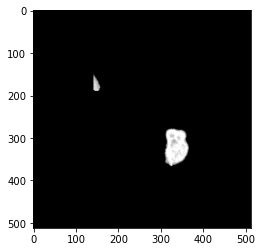

In [208]:
plt.imshow(X_test_middle[1562,0,:,:],'gray')

[-0.17648424 -0.12282503 -0.10950419 ...  1.03879523  1.03895521
  1.03902042]


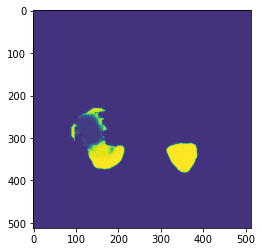

In [229]:
plt.imshow((tmpp[1562,:,:,0]))
print(np.unique(tmpp[1562,:,:,0]))

[0. 1.]


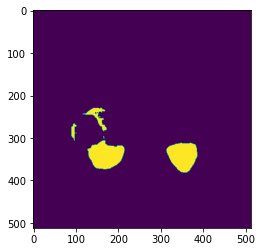

In [241]:
plt.imshow((tmpp[1562,:,:,0]>0)*1)
print(np.unique(tmpp[1562,:,:,0]))

[-0.02882299 -0.02826551 -0.02816123 ...  3.01810622  3.02191162
  3.02212   ]


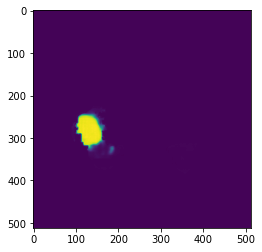

In [231]:
plt.imshow((tmpp[1562,:,:,1]))
print(np.unique(tmpp[1562,:,:,1]))

[0. 2.]


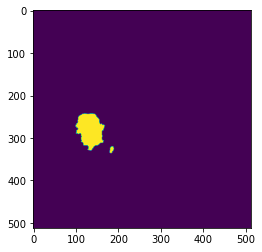

In [240]:
plt.imshow((tmpp[1562,:,:,1]>0)*2)
print(np.unique(tmpp[1562,:,:,1]))

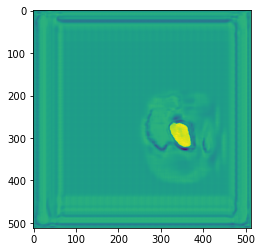

In [76]:
plt.imshow(result[200,:,:,0])

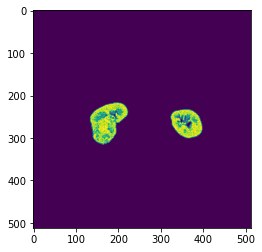

In [118]:
plt.imshow(X_test_middle[234,0,:,:])

array([-308.75158691, -301.01449585, -293.7572937 , ...,  121.79386139,
        122.22504425,  122.81164551])

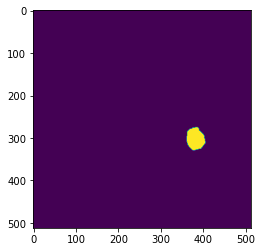

In [215]:
plt.imshow((result[2603,:,:,1]>0)*1)

np.unique(result[2603,:,:,1])

In [248]:
result[:,:,:,0]=(tmpp[:,:,:,0]>-1)*1
#kidney=kidney*1

In [249]:
result[:,:,:,1]=(tmpp[:,:,:,1]>-1)*2


In [264]:
print(np.unique(result[:,:,:,0]))
print(np.unique(result[:,:,:,1]))
# print(np.unique(X_test_middle[:,:,:,0]))
# print(np.unique(X_test_middle[:,:,:,1]))

[0. 1.]
[0. 2.]


In [77]:
result[:,:,:,1]=result[:,:,:,1]*2

In [250]:
import pandas as pd
def rle_encode(mask_image):
    pixels = mask_image.flatten()
    pixels[0] = 0
    pixels[-1] = 0
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 2
    runs[1::2] = runs[1::2] - runs[:-1:2]
    return runs

def rle_to_string(runs):
    return ' '.join(str(x) for x in runs)

preds_string=[]
for i in tqdm(range(0, len(result), 64)):
    sample = result[i:i+64].copy()
    for label_code in [1,2]:
        tmp=[]
        for s in sample:
            s = np.equal(s[:,:,label_code-1], label_code).flatten()*1
            tmp+=s.tolist()
        enc = rle_to_string(rle_encode(np.array(tmp)))

        preds_string.append(enc)


sample_submission = pd.read_csv('C:\\Users\\Administrator\\Desktop\\body-morphometry-kidney-and-tumor\\submission.csv')
sample_submission['EncodedPixels'] = preds_string
sample_submission.to_csv('C:\\Users\\Administrator\\Desktop\\body-morphometry-kidney-and-tumor\\result.csv', index=False)

 16%|████████████▊                                                                     | 13/83 [01:22<07:23,  6.33s/it]


KeyboardInterrupt: 

In [38]:
np.unique(X_test_middle[234,:,:,1])

array([0.        , 0.10645162, 0.13548388, 0.16129032, 0.16451614,
       0.19032258, 0.2       , 0.22580644, 0.24193548, 0.25483871,
       0.25806451, 0.26129031, 0.27419356, 0.27741936, 0.28064516,
       0.28709677, 0.29032257, 0.29677418, 0.30000001, 0.30645162,
       0.30967742, 0.31290323, 0.31935483, 0.32258064, 0.32580644,
       0.33548388, 0.33870968, 0.34193549, 0.34838709, 0.3548387 ,
       0.3580645 , 0.36129034, 0.36451614, 0.37096775, 0.37741935,
       0.38064516, 0.38387096, 0.38709676, 0.39032257, 0.3935484 ,
       0.40322581, 0.40967742, 0.41290322, 0.41612902, 0.41935483,
       0.42258066, 0.42580646, 0.43225807, 0.43548387, 0.43870968,
       0.44193548, 0.44516128, 0.45161289, 0.45483872, 0.45806453,
       0.46129033, 0.46451613, 0.46774194, 0.47096774, 0.47419354,
       0.47741935, 0.48064515, 0.48387095, 0.49032259, 0.49354839,
       0.4967742 , 0.5       , 0.5032258 , 0.50645161, 0.50967741,
       0.51290321, 0.51612902, 0.51935482, 0.52258062, 0.52580

In [ ]:
plt.imshow(result[0,:,:,0])
#plt.imshow(X_test[0,:,:,0])

# test

In [102]:
import pydicom as dcm
import matplotlib.pyplot as plt
import numpy as np
DICOM_path = "C:\\Users\\Administrator\\Desktop\\body-morphometry-kidney-and-tumor\\test\\DICOM\\test007/00012.dcm"
Label_path = "C:\\Users\\Administrator\\Desktop\\body-morphometry-kidney-and-tumor\\train\\Label\\training001/00024.png"

net1=UNet1().cuda()
net1.load_state_dict(torch.load('./model1.pt'))

Window_Center=30
Window_Width=310

fn_tonumpy = lambda x: x.to('cpu').detach().numpy().transpose(0,2,3,1)

X_val_1=[] # 독립변수 공리스트 생성
y_val_1=[]# 종속변수 공리스트 생성

Images = read_dicom(DICOM_path, Window_Center, Window_Width) #DICOM 호출 및 전처리
X_val_1.append(Images)

img = Image.open(Label_path).convert('L') # Label 호출
Images = get_mask1(np.array(img)) # Label 전처리
y_val_1.append(Images)

X_val_1 = np.array(X_val_1)
y_val_1 = np.array(y_val_1)

X_val_1 = ToTensor(X_val_1)
y_val_1 = ToTensor(y_val_1)


In [48]:
z=dcm.dcmread(DICOM_path).pixel_array
print(type(z))

<class 'numpy.ndarray'>


In [103]:
with torch.no_grad():
    # forward
    net1.eval()
    loss_arr = []

    X_val_1 = X_val_1.to(device)
    y_val_1 = y_val_1.to(device)
    output_1 = net1(X_val_1)

    loss = fn_loss(output_1, y_val_1)
    loss_arr += [loss.item()]
    print("LOSS: %.4f"%(np.mean(loss_arr)))

    #del X_val, y_val

LOSS: 1.0000


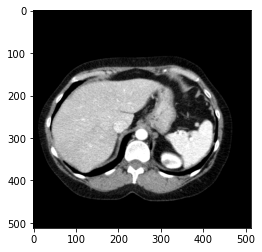

In [104]:
plt.imshow(np.array(tvf.rotate(Image.fromarray(fn_tonumpy(X_val_1)[0,:,:,0]), angle=0)),'gray')

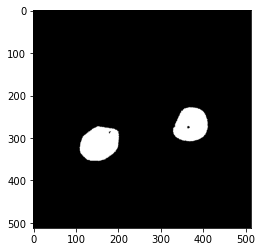

In [49]:
plt.imshow(np.array(tvf.rotate(Image.fromarray(fn_tonumpy(y_val_1)[0,:,:,0]), angle=15)),'gray')

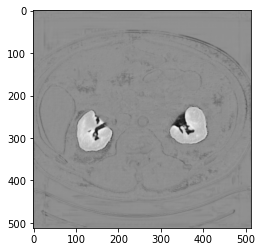

In [60]:
plt.imshow(fn_tonumpy(output_1)[0,:,:,0],'gray')

In [61]:
output_1 = output_1>-5
output_1 =fn_tonumpy(output_1)
output_1 = np.float32(output_1)
X_val_2 = output_1*fn_tonumpy(X_val_1)

y_val_2=[]# 종속변수 공리스트 생성

img = Image.open(Label_path).convert('L') # Label 호출
Images = get_mask2(np.array(img)) # Label 전처리
y_val_2.append(Images)
y_val_2 = np.array(y_val_2)


X_val_2 = ToTensor(X_val_2)
y_val_2 = ToTensor(y_val_2)
with torch.no_grad():
    # forward
    net2.eval()
    loss_arr = []

    X_val_2 = X_val_2.to(device)
    y_val_2 = y_val_2.to(device)
    output_2 = net2(X_val_2)

    loss = fn_loss(output_2, y_val_2)
    loss_arr += [loss.item()]
    print("LOSS: %.4f"%(np.mean(loss_arr)))

    #del X_val, y_val


LOSS: 0.1091


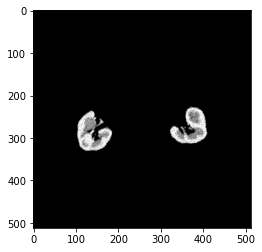

In [62]:
plt.imshow(fn_tonumpy(X_val_2)[0,:,:,0],'gray')

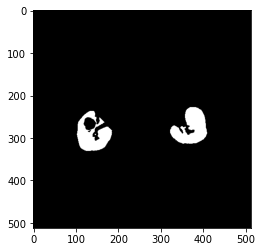

In [63]:
plt.imshow(fn_tonumpy(y_val_2)[0,:,:,0],'gray')

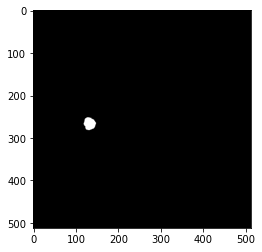

In [64]:
plt.imshow(fn_tonumpy(y_val_2)[0,:,:,1],'gray')

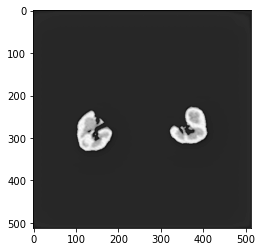

In [65]:
plt.imshow(fn_tonumpy(output_2)[0,:,:,0],'gray')

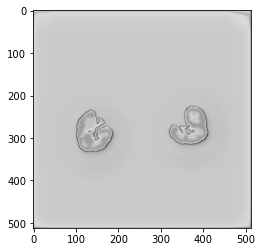

In [66]:
plt.imshow(fn_tonumpy(output_2)[0,:,:,1],'gray')

In [56]:
np.max(fn_tonumpy(output_2)[0,:,:,1])

-15.262019

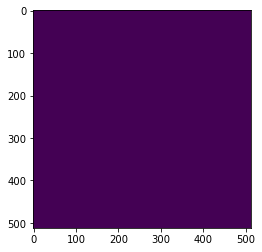

In [45]:
plt.imshow((((fn_tonumpy(output_2)[0,:,:,1])>0)*1))

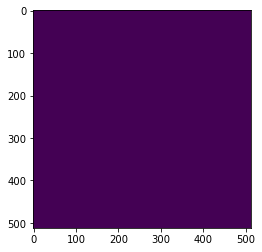

In [41]:
plt.imshow((fn_tonumpy(output_2)[0,:,:,1]>0)*1)

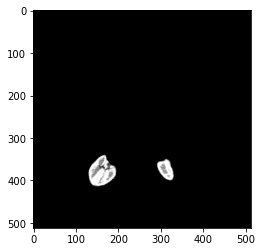

In [18]:
import matplotlib.pyplot as plt
fn_tonumpy = lambda x: x.to('cpu').detach().numpy().transpose(0,2,3,1)
plt.imshow(fn_tonumpy(batch_X_val)[0,:,:,0],'gray')

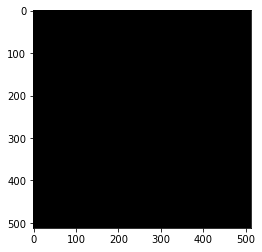

In [744]:
plt.imshow(fn_tonumpy(batch_y_train)[3,:,:,1],'gray')

In [732]:
x=np.load("./new_data.npy")

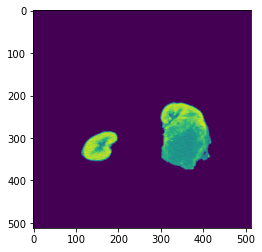

In [735]:
plt.imshow(x[6051,:,:,0])

In [332]:
torch.save(net.state_dict(), './model2.pt')


In [99]:
net1 = UNet1().to(device)
net1.load_state_dict(torch.load('./bk_aug_model1.pt'))

net2 = UNet2().to(device)
net2.load_state_dict(torch.load('./aug_model2.pt'))

<All keys matched successfully>

In [83]:
for epoch in range(st_epoch + 1, num_epoch + 1): 

with torch.no_grad():
    # forward
    net.eval()
    loss_arr = []

    for batch,(batch_X_train, batch_y_train) in enumerate(train_ts, 1):
        batch_X_train = batch_X_train.to(device)
        batch_y_train = batch_y_train.to(device)
        output = net(batch_X_train)

        loss = fn_loss(output, batch_y_train)
        loss_arr += [loss.item()]
        print("VALID: EPOCH: %d/%d   |   Batch %d/%d   |   LOSS: %.4f"%
             (epoch, num_epoch, batch, num_batch_train, np.mean(loss_arr)))

        del batch_X_train, batch_y_train

IndentationError: expected an indented block (<ipython-input-83-c8161514c147>, line 3)

In [15]:
def get_test():
    if os.path.isfile("./X_test.npy"):
        X_test = np.load("./X_test.npy")

    else:
        print("Data Loading")
        Window_Center=30
        Window_Width=310

        X_test=[] # 독립변수 공리스트 생성

        test_DICOM_dcm = sorted(glob.glob(test_DICOM_path+"*/*.dcm"))


        # 독립 변수(DICOM) case별 호출

        for dcm in tqdm(test_DICOM_dcm):
            Images = read_dicom(dcm, Window_Center, Window_Width) #DICOM 호출 및 전처리
            X_test.append(Images)


        X_test = np.array(X_test)

        np.save("./X_test",X_test)

        X_test = ToTensor(X_test)
        
        test_ts = TensorDataset(X_test)
    
        train_ts = DataLoader(test_ts, batch_size=batch_size, shuffle=True,num_workers=0)
        
        return test_ts

In [241]:
test_DICOM_path = "C:\\Users\\Administrator\\Desktop\\body-morphometry-kidney-and-tumor\\test\\DICOM\\"
test_ts = get_test()
num_data_test = len(test_ts)

num_batch_test = np.ceil(num_data_test/batch_size)


with torch.no_grad():
    # forward
    net_test.eval()

    for batch, batch_X_val in enumerate(test_ts, 1):
        batch_X_val = batch_X_val.to(device)
        
        output = net_test(batch_X_val)

        loss = fn_loss(output, batch_y_val)
        loss_arr += [loss.item()]
        print("Batch %d/%d"%(batch, num_batch_test))

        del batch_X_val, batch_y_val

NameError: name 'get_test' is not defined

In [220]:
import pydicom as dcm
import matplotlib.pyplot as plt
import numpy as np
DICOM_path = "C:/Users/Administrator/Desktop/body-morphometry-kidney-and-tumor/train/DICOM/training095/00035.dcm"
Label_path = "C:/Users/Administrator/Desktop/body-morphometry-kidney-and-tumor/train/Label/training095/00035.png"

Window_Center=30
Window_Width=310
    
X_val=[] # 독립변수 공리스트 생성
y_val=[]# 종속변수 공리스트 생성

Images = read_dicom(DICOM_path, Window_Center, Window_Width) #DICOM 호출 및 전처리
X_val.append(Images)

img = Image.open(Label_path).convert('L') # Label 호출
Images = get_mask2(np.array(img)) # Label 전처리
y_val.append(Images)

X_val = np.array(X_val)
y_val = np.array(y_val)
original=np.array(y_val)
X_val = ToTensor(X_val)
y_val = ToTensor(y_val)


In [209]:
with torch.no_grad():
    # forward
    net1.eval()
    loss_arr = []

    X_val = X_val.to(device)
    y_val = y_val.to(device)
    output = net1(X_val)

#     loss = fn_loss(output, y_val)
#     loss_arr += [loss.item()]
#     print("LOSS: %.4f"%(np.mean(loss_arr)))

    #del X_val, y_val

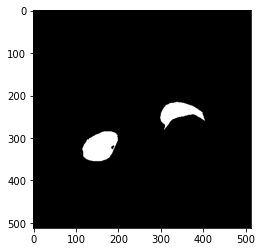

In [217]:
tmp=(fn_tonumpy(output)>0)*1
tmp=original*tmp
plt.imshow(original[0,:,:,0],'gray')

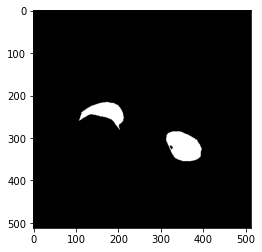

In [215]:
tmp = transforms.RandomHorizontalFlip(p=1)(Image.fromarray(original[0,:,:,0]))
plt.imshow(np.array(tmp),'gray')

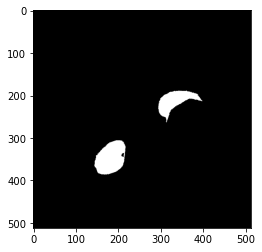

In [225]:
tmp_roi = tvf.rotate(Image.fromarray(original[0,:,:,0]), angle=18)

plt.imshow(np.array(tmp_roi),'gray')

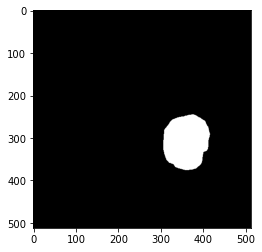

In [183]:
plt.imshow(fn_tonumpy(y_val)[0,:,:,1],'gray')

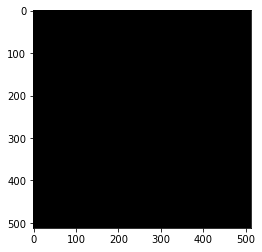

In [184]:
tmp = transforms.RandomHorizontalFlip(p=1)(Image.fromarray(tmp[0,:,:,0]))
plt.imshow(tmp,'gray')

In [124]:
fn_tonumpy = lambda x: x.to('cpu').detach().numpy().transpose(0,2,3,1)

In [125]:
with torch.no_grad():
    # forward
    net2.eval()
    output=ToTensor((((fn_tonumpy(output>0))*1)*original)).to(device)
    
    
    output = net2(output)


In [126]:
output = fn_tonumpy(output)


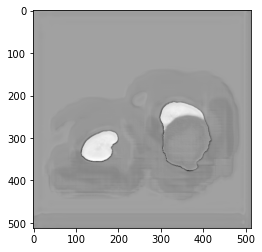

In [128]:
plt.imshow(output[0,:,:,0],'gray')

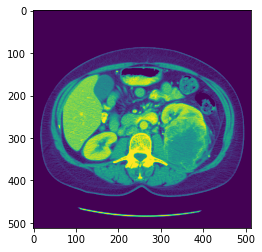

In [29]:
import matplotlib.pyplot as plt
plt.imshow(X_val[0])
plt.show()

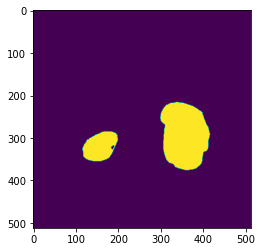

In [611]:
import matplotlib.pyplot as plt
plt.imshow(y_val[0,:,:,0])
plt.show()


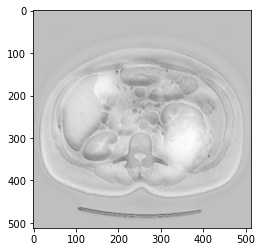

In [31]:
import matplotlib.pyplot as plt
plt.imshow(output[0,:,:,1],'gray')
plt.show()


In [629]:
output.shape

torch.Size([1, 2, 512, 512])

In [613]:
y=output[0,:,:,0]>0
y=np.float32(y)

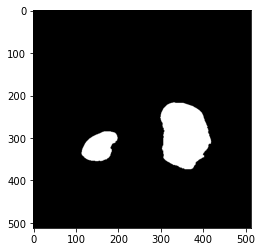

In [614]:
plt.imshow(y,'gray')

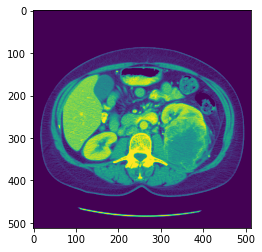

In [615]:
plt.imshow(X_val[0,:,:,0])

In [684]:

y

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [622]:
y[220,350]

0.91612905

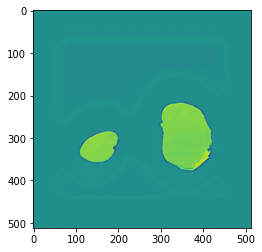

In [557]:
import matplotlib.pyplot as plt
plt.imshow(output[0,:,:,0])
plt.show()

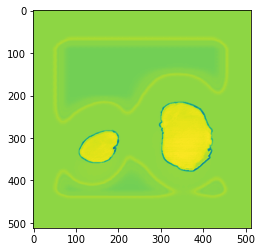

In [556]:
import matplotlib.pyplot as plt
plt.imshow(output[0,:,:,1])
plt.show()

In [23]:
index=output[0,:,:,0]>0

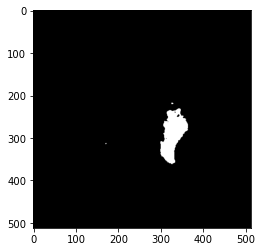

In [24]:
im=index.astype(float)
plt.imshow(im,'gray')

In [218]:
print(np.unique(output[0,:,:,1]))

[-47.846806  -45.875843  -45.558434  ...  -7.6148214  -7.4740305
  -7.4555807]


In [ ]:
import pandas as pd
csv = pd.read_csv("/kaggle/input/body-morphometry-kidney-and-tumor/sample_submission.csv")

In [14]:
test_DICOM_path="/kaggle/input/body-morphometry-kidney-and-tumor/test/DICOM/*"
test_DICOM_dir = sorted(glob.glob(test_DICOM_path+"/*.dcm"))

In [ ]:
def rle_encode(mask_image):
    pixels = mask_image.flatten()
    pixels[0] = 0
    pixels[-1] = 0
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 2
    runs[1::2] = runs[1::2] - runs[:-1:2]
    return runs


def rle_to_string(runs):
    return ' '.join(str(x) for x in runs)


preds_string=[]
for i in tqdm(range(0, len(preds), 64)):
    sample = preds[i:i+64].copy()
    for label_code in [1,2]:
        tmp=[]
        for s in sample:
            s = np.equal(s, label_code).flatten()*1
            tmp+=s.tolist()
        enc = rle_to_string(rle_encode(np.array(tmp)))

        preds_string.append(enc)


sample_submission = pd.read_csv('dataset/sample_submission.csv')
sample_submission['EncodedPixels'] = preds_string
sample_submission.to_csv('submission.csv', index=False)

In [54]:
def rle_to_string(runs):
    return ' '.join(str(x) for x in runs)

def rle_encode(mask_image):
    pixels = mask_image.flatten()
    # We avoid issues with '1' at the start or end (at the corners of
    # the original image) by setting those pixels to '0' explicitly.
    # We do not expect these to be non-zero for an accurate mask,
    # so this should not harm the score.
    pixels[0] = 0
    pixels[-1] = 0
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 2
    runs[1::2] = runs[1::2] - runs[:-1:2]
    return rle_to_string(runs)


In [55]:
rle=rle_encode(X_np[0,:,:,0])

In [58]:
len(rle)

854152

In [67]:
import pandas as pd
csv = pd.read_csv("/kaggle/input/body-morphometry-kidney-and-tumor/sample_submission.csv")


,Id,EncodedPixels
0,test001_1,0 0
1,test001_2,0 0
2,test002_1,0 0
3,test002_2,0 0
4,test003_1,0 0
...,...,...
161,test081_2,0 0
162,test082_1,0 0
163,test082_2,0 0
164,test083_1,0 0


In [ ]:
# 데이터 불러오기
dir_data = ''

name_label = ''
name_input = ''
img_label = Image.open(os.path.join(dir_data, name_label))
img_input = Image.open(os.path.join(dir_data, name_input))

In [64]:
import torch
print(torch.__version__)
torch.cuda.empty_cache()

1.5.1


In [ ]:
def rle_encode(mask_image):
    pixels = mask_image.flatten()
    # We avoid issues with '1' at the start or end (at the corners of
    # the original image) by setting those pixels to '0' explicitly.
    # We do not expect these to be non-zero for an accurate mask,
    # so this should not harm the score.
    pixels[0] = 0
    pixels[-1] = 0
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 2
    runs[1::2] = runs[1::2] - runs[:-1:2]
    return runs


def rle_to_string(runs):
    return ' '.join(str(x) for x in runs)


In [29]:

del fig, subplots
del axi1
del axi2
del axi3
del X_1
del y_1
del y_2

In [31]:
for i,(aug_x,_) in enumerate(dataset2):
    if i==0:
        print(np.unique(aug_X))
        print(np.unique(aug_y))
        

[0.         0.00322581 0.01290323 0.01612903 0.01935484 0.02258065
 0.02580645 0.03870968 0.04516129 0.0483871  0.05483871 0.05806452
 0.06451613 0.06774194 0.07096774 0.07419354 0.07741936 0.08064516
 0.08387097 0.08709677 0.09032258 0.09354839 0.1        0.1032258
 0.10645162 0.10967742 0.11290322 0.11612903 0.11935484 0.12258065
 0.12580645 0.12903225 0.13225806 0.13548388 0.13870968 0.14193548
 0.14516129 0.14838709 0.15161291 0.15483871 0.15806451 0.16129032
 0.16451614 0.16774194 0.17096774 0.17419355 0.17741935 0.18064517
 0.18387097 0.18709677 0.19032258 0.19354838 0.1967742  0.2
 0.2032258  0.20645161 0.20967741 0.21290323 0.21612903 0.21935484
 0.22258064 0.22580644 0.22903226 0.23225807 0.23548387 0.23870967
 0.24193548 0.2451613  0.2483871  0.2516129  0.2548387  0.2580645
 0.2612903  0.26451612 0.26774195 0.27096775 0.27419356 0.27741936
 0.28064516 0.28387097 0.28709677 0.29032257 0.29354838 0.29677418
 0.3        0.30322582 0.30645162 0.30967742 0.31290323 0.31612903
 0.3

KeyboardInterrupt: 